In [1]:
import numpy as np 
import sciann as sn 
import time
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec
from itertools import product, combinations
import scipy.io
#import os
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
# os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"
# comment this line if you want to run on GPU. 
# os.environ["CUDA_VISIBLE_DEVICES"] = "-1" # -> exec on CPU

---------------------- SCIANN 0.7.0.1 ---------------------- 
For details, check out our review paper and the documentation at: 
 +  "https://www.sciencedirect.com/science/article/pii/S0045782520307374", 
 +  "https://arxiv.org/abs/2005.08803", 
 +  "https://www.sciann.com". 

 Need support or would like to contribute, please join sciann`s slack group: 
 +  "https://join.slack.com/t/sciann/shared_invite/zt-ne1f5jlx-k_dY8RGo3ZreDXwz0f~CeA" 
 
TensorFlow Version: 2.10.0 
Python Version: 3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)] 



In [2]:
def axisEqual3D(ax):
        extents = np.array([getattr(ax, 'get_{}lim'.format(dim))() for dim in 'xyz'])
        sz = extents[:,1] - extents[:,0]
        centers = np.mean(extents, axis=1)
        maxsize = max(np.abs(sz))
        r = maxsize/4
        for ctr, dim in zip(centers, 'xyz'):
            getattr(ax, 'set_{}lim'.format(dim))(ctr - r, ctr + r)

# load the snapshot data


In [3]:
def PrepareData(num_pde=20000, num_data=30000, random=True):

    data = scipy.io.loadmat('data-5s-10hz-2-3-34sensor.mat')
    
    U_star = data['U_star'] # Nt*Nx x 3 x Ns
    XS_star = data['XS_star'] # Nt*Nx x 2
    YT_star = data['YT_star'] # Nx*Ny x 2
    TX_star = data['TX_star']
    XY_star = data['XY_star']
    S_star = data['S_star']
    
    TX1_star = data['TX1_star']
    U_star1 = data['U_star1'] 
    
    c_star = data['c_star']
    rho_star = data['rho_star']
    
    xx = XY_star[:,0:1]
    yy = XY_star[:,1:2]
    
    IDX = np.where((xx == 0.3)| (xx == 0.6))[0]
    c_train = c_star.flatten()[IDX,None]
    rho_train = rho_star.flatten()[IDX,None]
    l_c = IDX.shape[0]
   
    
    tt3 = 0.3 * np.ones(l_c)
    xx3 = xx[IDX,None]
    ss3 = 0.41 * np.ones(l_c)
    yy3 = yy[IDX,None]

    
    N = XS_star.shape[0]
    M = YT_star.shape[0]
    
    # Rearrange Data 
    XX = np.tile(XS_star[:,0:1], (1,M)) 
    SS = np.tile(XS_star[:,1:2], (1,M))
    YY = np.tile(YT_star[:,0:1], (1,N))
    TT = np.tile(YT_star[:,1:2], (1,N))
    
    N_data = M*N
    idx6 = np.random.choice(N_data, num_pde, replace=False)
    
    tt2 = TT.flatten()[idx6,None]
    xx2 = XX.flatten()[idx6,None]
    ss2 = SS.flatten()[idx6,None]
    yy2 = YY.flatten()[idx6,None]
    
    L = TX1_star.shape[0]
    T = S_star.shape[0]
    S = S_star.shape[0]
    
    # Rearrange Data 
    TTT = np.tile(TX1_star[:,0:1], (1,T)) # N x S
    XXX = np.tile(TX1_star[:,1:2], (1,T)) # N x S
    SSS = np.tile(S_star, (1,L)).T # N x S
    

    PP = U_star1[:,0,:] # N x S
    UU = U_star1[:,1,:] # N x S
    VV = U_star1[:,2,:] # N x S
    
    # Pick random data.
    
    if random:
        idx = np.random.choice(N_data, num_data, replace=False)
    else:
        s_selected = 2
        maxp = max(np.abs(U_star1[:,1,s_selected]))
        ppp = UU.flatten()
        idx1 = np.where(np.abs(ppp) > 0.001*maxp)[0]
        idx2 = np.where(np.abs(ppp) < 0.001*maxp)[0]
        idx3 = np.random.choice(idx1,int(num_data*0.8),replace=False)
        idx = np.append(idx3, np.random.choice(idx2,int(num_data*0.2),replace=False))

    
    
    tt1 = TTT.flatten()[idx,None]
    xx1 = XXX.flatten()[idx,None]
    ss1 = SSS.flatten()[idx,None]
    yy1 = 0.01 * np.ones(num_data)
    
    
    
    p = PP.flatten()[idx,None] #index of  puv should be consistent with tt1 xx1 ss1 yy1
    u = UU.flatten()[idx,None]
    v = VV.flatten()[idx,None]
    
    
    tt = np.append(np.append(tt3, tt1), tt2)
    xx = np.append(np.append(xx3, xx1), xx2)
    ss = np.append(np.append(ss3, ss1), ss2)
    yy = np.append(np.append(yy3, yy1), yy2)
    
    index_c = np.arange(0,l_c,1)
    index_p = np.arange(0,num_data,1) + l_c
 
    return (tt,xx,ss,yy, u,v,p, c_train, rho_train, index_c, index_p, U_star, U_star1, XS_star, YT_star, TX_star, TX1_star, XY_star, S_star, c_star, rho_star)

In [4]:
t_train, x_train, s_train, y_train, u_train, v_train, p_train, c_train, rho_train, index_c, index_p, U_star, U_star1, XS_star, YT_star, TX_star, TX1_star, XY_star, S_star, c_star, rho_star = PrepareData(num_pde=30000, num_data=30000, random=False)

# PINN setup 

Consider the 2D acoustic wave equation
$$
\begin{aligned}
&\frac{\partial p}{\partial t} = -c^2(x, z)\rho(x, z)\left(\frac{\partial u}{\partial x} + \frac{\partial v}{\partial z}\right) + f(x, z, t) \\
&\frac{\partial u}{\partial t} = -\frac{1}{\rho(x, z)}\frac{\partial p}{\partial x} \\
&\frac{\partial v}{\partial t} = -\frac{1}{\rho(x, z)}\frac{\partial p}{\partial z},
\end{aligned}
$$
where $p$ is Pressure, $u, v$ are the $x, z-$components of Particle Velocity, $c, \rho$ are Medium Velocity and Density.



Define independent variables with `sn.Variable`:

In [5]:
from sciann.utils.math import *
ActFunc = 'sin'
ActFunc2 = 'tanh'
hidden_layers = 5*[80]
hidden_layers2 = 5*[40]
dtype = 'float32'

x = sn.Variable("x", dtype=dtype)
y = sn.Variable("y", dtype=dtype)
t = sn.Variable("t", dtype=dtype)
s = sn.Variable("s", dtype=dtype)

Define solution variables with `sn.Functional` (multi-layer neural network):

In [6]:
p, u, v = sn.Functional(['p','u','v'], [x, y, t, s], hidden_layers, ActFunc)

For inversion, define parameters using `sn.Parameter`:

In [7]:
c, rho = sn.Functional(['c','rho'], [x, y], hidden_layers2, ActFunc2)

Use `sn.diff` and other mathematical operations to set up the PINN model. 

In [8]:
c2r = square(c) * rho
r = 1.0 / rho
u_t = sn.diff(u, t)
u_x = sn.diff(u, x)
u_y = sn.diff(u, y)

v_t = sn.diff(v, t)
v_x = sn.diff(v, x)
v_y = sn.diff(v, y)

p_t = sn.diff(p, t)
p_x = sn.diff(p, x)
p_y = sn.diff(p, y)

In [9]:
# source
f_0 = 10.0*np.pi
alpha = 2.0
M0 = 100.0

def R(t, t_s):
	return M0 * (1-2*(f_0*(t-t_s))**2)*exp(-(f_0*(t-t_s))**2)

def G(x, z, x_s, z_s):
	return exp(-1.0/(alpha**2) * ((x-x_s)**2 + (z-z_s)**2))

def D(x, z, x_s, z_s):
    if ((x == x_s) and (z == z_s)):
        return 1
    else:
        return 0

def f(x, z, t, x_s, z_s, t_s):
	return R(t, t_s)*N(x, z, x_s, z_s)

Define targets (losses) using `sn.Data`, `sn.Tie`, and `sn.PDE` interfaces. 

In [10]:
# Define constraints 
d1 = sn.Data(p)
d2 = sn.Data(u)
d3 = sn.Data(v)

m1 = sn.Data(c)
m2 = sn.Data(rho)

c1 = sn.Tie(p_t, -c2r * (v_x+u_y) + R(t, 0.1)*G(x,y,s,0.01) )
c2 = sn.Tie(u_t, -r * p_y)
c3 = sn.Tie(v_t, -r * p_x)

Define the optimization model with `sn.SciModel`:

In [11]:
# Define the optimization model (set of inputs and constraints)
model = sn.SciModel(
    inputs=[x, y, t, s],
    targets=[d1, d2, d3, m1, m2, c1, c2, c3],
    loss_func="mse"
)
#optimizer='scipy-l-BFGS-B',

Prepare the training data according to the order they are defined in `sn.SciModel`. 

In [12]:
input_data = [x_train, y_train, t_train, s_train]

In [13]:
data_d1 = p_train
data_d2 = u_train
data_d3 = v_train

data_m1 = c_train
data_m2 = rho_train

data_c1 = 'zeros'
data_c2 = 'zeros'
data_c3 = 'zeros'
target_data = [(index_p, data_d1), (index_p,data_d2), (index_p,data_d3), (index_c,data_m1), (index_c,data_m2), data_c1, data_c2, data_c3]

print(x_train.shape, p_train.shape)
print(index_p.shape, data_d1.shape)

(60200,) (30000, 1)
(30000,) (30000, 1)


Train the model by calling `.train` function. Check the documentation at www.sciann.com for all the training options. 


Total samples: 60200 
Batch size: 1000 
Total batches: 61 



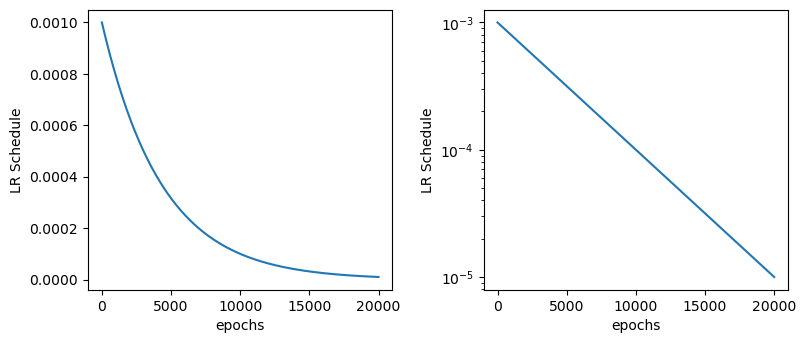


+ NTK evaluation time [s]: 55.393325090408325 

+ adaptive_weights at epoch 1: [0.10446372001919046, 0.1055268168918542, 0.10642668136096904, 4.760800999014687, 2.620706026341815, 0.10205450095689984, 0.10001089567618014, 0.1000103597384038]
Epoch 1/20000
61/61 [==============================] - 8s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 42.0903 - p_loss: 0.0267 - u_loss: 0.1764 - v_loss: 0.0388 - c_loss: 0.9904 - rho_loss: 0.2453 - sub_5_loss: 358.7120 - sub_6_loss: 0.7369 - sub_7_loss: 0.2929 - lr: 0.0010 - time: 64.9182 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 2/20000
61/61 [===========

Epoch 12/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 17.4348 - p_loss: 0.0360 - u_loss: 0.0068 - v_loss: 0.0106 - c_loss: 0.0587 - rho_loss: 0.0224 - sub_5_loss: 164.2800 - sub_6_loss: 1.0363 - sub_7_loss: 2.2214 - lr: 9.9750e-04 - time: 2.9550 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 13/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 13.7370 - p_loss: 0.0577 - u_loss: 0.0106 - v_loss: 0.0143 - c_loss: 0.0635 - rho_loss: 0.0221 - sub_5_loss: 127.6134 - sub_6_loss: 1.2978 - sub_7_loss: 2.1544 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.3901 - p_loss: 0.1290 - u_loss: 0.0013 - v_loss: 0.0019 - c_loss: 0.0410 - rho_loss: 0.0108 - sub_5_loss: 1.3035 - sub_6_loss: 0.0933 - sub_7_loss: 0.1075 - lr: 9.9499e-04 - time: 3.0150 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 24/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.6680 - p_loss: 0.1289 - u_loss: 0.0012 - v_loss: 0.0018 - c_loss: 0.0511 - rho_loss: 0.0135 - sub_5_loss: 3.5055 - sub_6_loss: 0.0867 - sub_7_loss: 0.0971 - lr: 9.9476e-04 - ti

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2525 - p_loss: 0.1231 - u_loss: 8.6800e-04 - v_loss: 0.0011 - c_loss: 0.0248 - rho_loss: 0.0079 - sub_5_loss: 0.9067 - sub_6_loss: 0.0380 - sub_7_loss: 0.0423 - lr: 9.9249e-04 - time: 3.0750 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 35/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1935 - p_loss: 0.1236 - u_loss: 8.3455e-04 - v_loss: 0.0010 - c_loss: 0.0242 - rho_loss: 0.0084 - sub_5_loss: 0.3551 - sub_6_loss: 0.0352 - sub_7_loss: 0.0376 - lr: 9.9226e

61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2793 - p_loss: 0.1214 - u_loss: 6.5294e-04 - v_loss: 7.7435e-04 - c_loss: 0.0172 - rho_loss: 0.0045 - sub_5_loss: 1.6375 - sub_6_loss: 0.0270 - sub_7_loss: 0.0287 - lr: 9.8998e-04 - time: 3.1060 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 46/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1536 - p_loss: 0.1207 - u_loss: 6.1869e-04 - v_loss: 7.3739e-04 - c_loss: 0.0196 - rho_loss: 0.0052 - sub_5_loss: 0.2831 - sub_6_loss: 0.0233 - sub_7_loss: 0.0247 - lr:

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1278 - p_loss: 0.1188 - u_loss: 4.9935e-04 - v_loss: 6.3684e-04 - c_loss: 0.0082 - rho_loss: 0.0026 - sub_5_loss: 0.6421 - sub_6_loss: 0.0181 - sub_7_loss: 0.0211 - lr: 9.8748e-04 - time: 3.0370 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 57/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1357 - p_loss: 0.1190 - u_loss: 4.8346e-04 - v_loss: 6.3842e-04 - c_loss: 0.0104 - rho_loss: 0.0030 - sub_5_loss: 0.6088 - sub_6_loss: 0.0172 - sub_7_loss: 0.0189 - lr:

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.3736 - p_loss: 0.1185 - u_loss: 5.3837e-04 - v_loss: 7.7074e-04 - c_loss: 0.0163 - rho_loss: 0.0036 - sub_5_loss: 2.6038 - sub_6_loss: 0.0364 - sub_7_loss: 0.0460 - lr: 9.8498e-04 - time: 3.0280 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 68/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1267 - p_loss: 0.1193 - u_loss: 3.8759e-04 - v_loss: 5.6552e-04 - c_loss: 0.0123 - rho_loss: 0.0033 - sub_5_loss: 0.4297 - sub_6_loss: 0.0150 - sub_7_loss: 0.0173 - lr:

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1641 - p_loss: 0.1169 - u_loss: 2.5493e-04 - v_loss: 4.7626e-04 - c_loss: 0.0244 - rho_loss: 0.0061 - sub_5_loss: 0.1720 - sub_6_loss: 0.0089 - sub_7_loss: 0.0111 - lr: 9.8247e-04 - time: 2.9380 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 79/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1148 - p_loss: 0.1160 - u_loss: 2.6291e-04 - v_loss: 4.9016e-04 - c_loss: 0.0114 - rho_loss: 0.0027 - sub_5_loss: 0.3838 - sub_6_loss: 0.0104 - sub_7_loss: 0.0131 - lr:

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.4986 - p_loss: 0.1160 - u_loss: 2.0361e-04 - v_loss: 4.4180e-04 - c_loss: 0.0751 - rho_loss: 0.0269 - sub_5_loss: 0.5514 - sub_6_loss: 0.0098 - sub_7_loss: 0.0106 - lr: 9.7997e-04 - time: 3.0660 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 90/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2199 - p_loss: 0.1174 - u_loss: 1.8487e-04 - v_loss: 4.4998e-04 - c_loss: 0.0305 - rho_loss: 0.0084 - sub_5_loss: 0.3737 - sub_6_loss: 0.0090 - sub_7_loss: 0.0117 - lr:

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0662 - p_loss: 0.1153 - u_loss: 1.2209e-04 - v_loss: 3.6892e-04 - c_loss: 0.0081 - rho_loss: 0.0022 - sub_5_loss: 0.0822 - sub_6_loss: 0.0058 - sub_7_loss: 0.0071 - lr: 9.7746e-04 - time: 3.0160 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 101/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1148 - p_loss: 0.1157 - u_loss: 1.2610e-04 - v_loss: 3.7881e-04 - c_loss: 0.0163 - rho_loss: 0.0045 - sub_5_loss: 0.1148 - sub_6_loss: 0.0061 - sub_7_loss: 0.0073 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2501 - p_loss: 0.1149 - u_loss: 1.8308e-04 - v_loss: 4.3284e-04 - c_loss: 0.0095 - rho_loss: 0.0025 - sub_5_loss: 1.7939 - sub_6_loss: 0.0156 - sub_7_loss: 0.0149 - lr: 9.7501e-04 - time: 2.9720 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 112/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0799 - p_loss: 0.1152 - u_loss: 1.1116e-04 - v_loss: 3.4770e-04 - c_loss: 0.0073 - rho_loss: 0.0022 - sub_5_loss: 0.2504 - sub_6_loss: 0.0071 - sub_7_loss: 0.0086 - lr

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0638 - p_loss: 0.1150 - u_loss: 8.5643e-05 - v_loss: 3.0286e-04 - c_loss: 0.0078 - rho_loss: 0.0025 - sub_5_loss: 0.0679 - sub_6_loss: 0.0052 - sub_7_loss: 0.0051 - lr: 9.7257e-04 - time: 2.8871 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 123/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0435 - p_loss: 0.1137 - u_loss: 7.8174e-05 - v_loss: 2.9847e-04 - c_loss: 0.0049 - rho_loss: 0.0012 - sub_5_loss: 0.0425 - sub_6_loss: 0.0043 - sub_7_loss: 0.0042 - lr

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0674 - p_loss: 0.1143 - u_loss: 8.0540e-05 - v_loss: 2.7386e-04 - c_loss: 0.0092 - rho_loss: 0.0030 - sub_5_loss: 0.0303 - sub_6_loss: 0.0040 - sub_7_loss: 0.0041 - lr: 9.7012e-04 - time: 3.0520 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 134/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0462 - p_loss: 0.1138 - u_loss: 9.0787e-05 - v_loss: 2.8079e-04 - c_loss: 0.0023 - rho_loss: 8.2110e-04 - sub_5_loss: 0.1974 - sub_6_loss: 0.0048 - sub_7_loss: 0.0047 

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0487 - p_loss: 0.1131 - u_loss: 8.7915e-05 - v_loss: 2.8260e-04 - c_loss: 0.0049 - rho_loss: 0.0013 - sub_5_loss: 0.0918 - sub_6_loss: 0.0046 - sub_7_loss: 0.0043 - lr: 9.6767e-04 - time: 3.0580 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 145/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0758 - p_loss: 0.1130 - u_loss: 9.7658e-05 - v_loss: 2.7938e-04 - c_loss: 0.0069 - rho_loss: 0.0018 - sub_5_loss: 0.2505 - sub_6_loss: 0.0046 - sub_7_loss: 0.0041 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0739 - p_loss: 0.1137 - u_loss: 8.3830e-05 - v_loss: 2.7503e-04 - c_loss: 0.0063 - rho_loss: 0.0019 - sub_5_loss: 0.2568 - sub_6_loss: 0.0051 - sub_7_loss: 0.0054 - lr: 9.6523e-04 - time: 2.9760 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 156/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1521 - p_loss: 0.1133 - u_loss: 8.8392e-05 - v_loss: 2.7740e-04 - c_loss: 0.0052 - rho_loss: 0.0014 - sub_5_loss: 1.0838 - sub_6_loss: 0.0052 - sub_7_loss: 0.0054 - lr

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0734 - p_loss: 0.1126 - u_loss: 7.1345e-05 - v_loss: 2.5704e-04 - c_loss: 0.0100 - rho_loss: 0.0025 - sub_5_loss: 0.0684 - sub_6_loss: 0.0026 - sub_7_loss: 0.0024 - lr: 9.6278e-04 - time: 2.9580 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 167/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2261 - p_loss: 0.1126 - u_loss: 1.6722e-04 - v_loss: 3.2208e-04 - c_loss: 0.0040 - rho_loss: 0.0013 - sub_5_loss: 1.8562 - sub_6_loss: 0.0145 - sub_7_loss: 0.0119 - lr

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0827 - p_loss: 0.1116 - u_loss: 8.2314e-05 - v_loss: 2.5738e-04 - c_loss: 0.0106 - rho_loss: 0.0023 - sub_5_loss: 0.1335 - sub_6_loss: 0.0038 - sub_7_loss: 0.0029 - lr: 9.6033e-04 - time: 2.9301 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 178/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0708 - p_loss: 0.1116 - u_loss: 1.2199e-04 - v_loss: 2.9898e-04 - c_loss: 0.0025 - rho_loss: 7.0904e-04 - sub_5_loss: 0.4334 - sub_6_loss: 0.0059 - sub_7_loss: 0.0070 

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1225 - p_loss: 0.1117 - u_loss: 1.6154e-04 - v_loss: 3.2610e-04 - c_loss: 0.0075 - rho_loss: 0.0022 - sub_5_loss: 0.6608 - sub_6_loss: 0.0094 - sub_7_loss: 0.0085 - lr: 9.5788e-04 - time: 2.9311 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 189/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1048 - p_loss: 0.1114 - u_loss: 1.0334e-04 - v_loss: 2.6730e-04 - c_loss: 0.0124 - rho_loss: 0.0031 - sub_5_loss: 0.2449 - sub_6_loss: 0.0058 - sub_7_loss: 0.0055 - lr

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0337 - p_loss: 0.1109 - u_loss: 6.4000e-05 - v_loss: 2.4097e-04 - c_loss: 0.0032 - rho_loss: 0.0012 - sub_5_loss: 0.0319 - sub_6_loss: 0.0022 - sub_7_loss: 0.0020 - lr: 9.5544e-04 - time: 2.9351 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 200/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0691 - p_loss: 0.1104 - u_loss: 6.8037e-05 - v_loss: 2.4990e-04 - c_loss: 0.0068 - rho_loss: 0.0019 - sub_5_loss: 0.1897 - sub_6_loss: 0.0032 - sub_7_loss: 0.0025 - lr

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0650 - p_loss: 0.1100 - u_loss: 6.6714e-05 - v_loss: 2.4109e-04 - c_loss: 0.0073 - rho_loss: 0.0028 - sub_5_loss: 0.1058 - sub_6_loss: 0.0029 - sub_7_loss: 0.0023 - lr: 9.5304e-04 - time: 2.8991 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 211/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0387 - p_loss: 0.1109 - u_loss: 6.7144e-05 - v_loss: 2.4374e-04 - c_loss: 0.0035 - rho_loss: 9.5489e-04 - sub_5_loss: 0.0735 - sub_6_loss: 0.0028 - sub_7_loss: 0.0023 

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2435 - p_loss: 0.1110 - u_loss: 6.2722e-04 - v_loss: 4.9850e-04 - c_loss: 0.0055 - rho_loss: 0.0013 - sub_5_loss: 1.9264 - sub_6_loss: 0.0325 - sub_7_loss: 0.0215 - lr: 9.5064e-04 - time: 2.9511 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 222/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0510 - p_loss: 0.1101 - u_loss: 1.2603e-04 - v_loss: 2.5755e-04 - c_loss: 0.0037 - rho_loss: 0.0011 - sub_5_loss: 0.1763 - sub_6_loss: 0.0043 - sub_7_loss: 0.0037 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0515 - p_loss: 0.1103 - u_loss: 2.0050e-04 - v_loss: 3.2143e-04 - c_loss: 0.0055 - rho_loss: 0.0018 - sub_5_loss: 0.0758 - sub_6_loss: 0.0070 - sub_7_loss: 0.0080 - lr: 9.4825e-04 - time: 2.9890 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 233/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0298 - p_loss: 0.1105 - u_loss: 7.6010e-05 - v_loss: 2.3270e-04 - c_loss: 0.0029 - rho_loss: 9.2689e-04 - sub_5_loss: 0.0141 - sub_6_loss: 0.0021 - sub_7_loss: 0.0016 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1890 - p_loss: 0.1094 - u_loss: 2.7291e-04 - v_loss: 3.8254e-04 - c_loss: 0.0020 - rho_loss: 5.2973e-04 - sub_5_loss: 1.5909 - sub_6_loss: 0.0253 - sub_7_loss: 0.0192 - lr: 9.4586e-04 - time: 3.0080 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 244/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0486 - p_loss: 0.1103 - u_loss: 1.2867e-04 - v_loss: 2.8534e-04 - c_loss: 0.0010 - rho_loss: 3.5502e-04 - sub_5_loss: 0.2892 - sub_6_loss: 0.0118 - sub_7_loss: 0.0

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0379 - p_loss: 0.1081 - u_loss: 5.8763e-05 - v_loss: 2.3244e-04 - c_loss: 0.0041 - rho_loss: 0.0013 - sub_5_loss: 0.0342 - sub_6_loss: 0.0022 - sub_7_loss: 0.0014 - lr: 9.4347e-04 - time: 2.9351 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 255/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0486 - p_loss: 0.1077 - u_loss: 5.5024e-05 - v_loss: 2.2468e-04 - c_loss: 0.0064 - rho_loss: 0.0016 - sub_5_loss: 0.0250 - sub_6_loss: 0.0018 - sub_7_loss: 0.0013 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0649 - p_loss: 0.1087 - u_loss: 5.3887e-05 - v_loss: 2.2512e-04 - c_loss: 0.0096 - rho_loss: 0.0023 - sub_5_loss: 0.0126 - sub_6_loss: 0.0019 - sub_7_loss: 0.0015 - lr: 9.4108e-04 - time: 2.9950 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 266/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0239 - p_loss: 0.1089 - u_loss: 5.3259e-05 - v_loss: 2.2259e-04 - c_loss: 0.0020 - rho_loss: 5.1361e-04 - sub_5_loss: 0.0118 - sub_6_loss: 0.0018 - sub_7_loss: 0.0014 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0244 - p_loss: 0.1064 - u_loss: 5.1521e-05 - v_loss: 2.2074e-04 - c_loss: 0.0019 - rho_loss: 4.7425e-04 - sub_5_loss: 0.0280 - sub_6_loss: 0.0020 - sub_7_loss: 0.0011 - lr: 9.3869e-04 - time: 2.9760 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 277/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0601 - p_loss: 0.1059 - u_loss: 5.4604e-05 - v_loss: 2.2782e-04 - c_loss: 0.0063 - rho_loss: 0.0015 - sub_5_loss: 0.1420 - sub_6_loss: 0.0028 - sub_7_loss: 0.0014 

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0283 - p_loss: 0.1073 - u_loss: 5.8067e-05 - v_loss: 2.2293e-04 - c_loss: 0.0024 - rho_loss: 6.7057e-04 - sub_5_loss: 0.0352 - sub_6_loss: 0.0021 - sub_7_loss: 0.0013 - lr: 9.3630e-04 - time: 2.9161 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 288/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0353 - p_loss: 0.1064 - u_loss: 5.1757e-05 - v_loss: 2.1830e-04 - c_loss: 0.0039 - rho_loss: 0.0010 - sub_5_loss: 0.0261 - sub_6_loss: 0.0018 - sub_7_loss: 0.0011 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0849 - p_loss: 0.1046 - u_loss: 6.0592e-05 - v_loss: 2.2423e-04 - c_loss: 0.0110 - rho_loss: 0.0028 - sub_5_loss: 0.1342 - sub_6_loss: 0.0036 - sub_7_loss: 0.0015 - lr: 9.3391e-04 - time: 3.0083 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 299/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0419 - p_loss: 0.1047 - u_loss: 5.9991e-05 - v_loss: 2.2547e-04 - c_loss: 0.0042 - rho_loss: 0.0011 - sub_5_loss: 0.0763 - sub_6_loss: 0.0033 - sub_7_loss: 0.0014 - lr

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0489 - p_loss: 0.1032 - u_loss: 7.0546e-05 - v_loss: 2.2448e-04 - c_loss: 0.0041 - rho_loss: 0.0011 - sub_5_loss: 0.1452 - sub_6_loss: 0.0044 - sub_7_loss: 0.0021 - lr: 9.3155e-04 - time: 2.9325 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 310/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1112 - p_loss: 0.1027 - u_loss: 8.6186e-05 - v_loss: 2.2784e-04 - c_loss: 0.0147 - rho_loss: 0.0042 - sub_5_loss: 0.1796 - sub_6_loss: 0.0055 - sub_7_loss: 0.0024 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0314 - p_loss: 0.1036 - u_loss: 4.3692e-05 - v_loss: 2.1550e-04 - c_loss: 0.0036 - rho_loss: 9.0204e-04 - sub_5_loss: 0.0071 - sub_6_loss: 0.0018 - sub_7_loss: 9.2763e-04 - lr: 9.2922e-04 - time: 3.0200 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 321/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0439 - p_loss: 0.1021 - u_loss: 4.5962e-05 - v_loss: 2.1483e-04 - c_loss: 0.0059 - rho_loss: 0.0016 - sub_5_loss: 0.0075 - sub_6_loss: 0.0017 - sub_7_loss: 9.1

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1020 - p_loss: 0.1031 - u_loss: 1.7103e-04 - v_loss: 3.1588e-04 - c_loss: 0.0031 - rho_loss: 0.0011 - sub_5_loss: 0.6927 - sub_6_loss: 0.0194 - sub_7_loss: 0.0076 - lr: 9.2688e-04 - time: 2.9451 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 332/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0917 - p_loss: 0.1033 - u_loss: 1.0163e-04 - v_loss: 2.2711e-04 - c_loss: 0.0055 - rho_loss: 0.0016 - sub_5_loss: 0.4853 - sub_6_loss: 0.0070 - sub_7_loss: 0.0028 - lr

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0426 - p_loss: 0.0989 - u_loss: 7.1184e-05 - v_loss: 2.2085e-04 - c_loss: 0.0054 - rho_loss: 0.0013 - sub_5_loss: 0.0261 - sub_6_loss: 0.0033 - sub_7_loss: 0.0011 - lr: 9.2454e-04 - time: 2.9091 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 343/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0651 - p_loss: 0.0978 - u_loss: 5.7808e-05 - v_loss: 2.1792e-04 - c_loss: 0.0094 - rho_loss: 0.0026 - sub_5_loss: 0.0265 - sub_6_loss: 0.0033 - sub_7_loss: 0.0011 - lr

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0289 - p_loss: 0.1009 - u_loss: 4.5382e-05 - v_loss: 2.0819e-04 - c_loss: 0.0032 - rho_loss: 7.8418e-04 - sub_5_loss: 0.0087 - sub_6_loss: 0.0015 - sub_7_loss: 7.9809e-04 - lr: 9.2221e-04 - time: 2.9490 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 354/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0287 - p_loss: 0.0993 - u_loss: 4.3666e-05 - v_loss: 2.0656e-04 - c_loss: 0.0032 - rho_loss: 8.9829e-04 - sub_5_loss: 0.0066 - sub_6_loss: 0.0017 - sub_7_loss:

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0590 - p_loss: 0.0989 - u_loss: 1.0766e-04 - v_loss: 2.5907e-04 - c_loss: 0.0050 - rho_loss: 0.0013 - sub_5_loss: 0.1960 - sub_6_loss: 0.0082 - sub_7_loss: 0.0041 - lr: 9.1987e-04 - time: 2.9741 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 365/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0357 - p_loss: 0.0987 - u_loss: 5.3275e-05 - v_loss: 2.2265e-04 - c_loss: 0.0041 - rho_loss: 9.8567e-04 - sub_5_loss: 0.0274 - sub_6_loss: 0.0025 - sub_7_loss: 0.0013 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0905 - p_loss: 0.0978 - u_loss: 4.4918e-05 - v_loss: 2.1185e-04 - c_loss: 0.0137 - rho_loss: 0.0035 - sub_5_loss: 0.0555 - sub_6_loss: 0.0026 - sub_7_loss: 9.2173e-04 - lr: 9.1753e-04 - time: 3.0171 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 376/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0708 - p_loss: 0.0972 - u_loss: 6.0321e-05 - v_loss: 2.2728e-04 - c_loss: 0.0056 - rho_loss: 0.0012 - sub_5_loss: 0.2976 - sub_6_loss: 0.0042 - sub_7_loss: 0.0014 

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0294 - p_loss: 0.0950 - u_loss: 4.2703e-05 - v_loss: 2.1161e-04 - c_loss: 0.0034 - rho_loss: 8.8283e-04 - sub_5_loss: 0.0072 - sub_6_loss: 0.0021 - sub_7_loss: 6.7201e-04 - lr: 9.1520e-04 - time: 2.9890 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 387/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0389 - p_loss: 0.0954 - u_loss: 5.3209e-05 - v_loss: 2.1190e-04 - c_loss: 0.0049 - rho_loss: 0.0012 - sub_5_loss: 0.0229 - sub_6_loss: 0.0026 - sub_7_loss: 7.6

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0258 - p_loss: 0.0931 - u_loss: 5.0357e-05 - v_loss: 2.1633e-04 - c_loss: 0.0022 - rho_loss: 5.4824e-04 - sub_5_loss: 0.0374 - sub_6_loss: 0.0027 - sub_7_loss: 7.0873e-04 - lr: 9.1286e-04 - time: 2.8731 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 398/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1077 - p_loss: 0.0934 - u_loss: 8.8508e-05 - v_loss: 2.2893e-04 - c_loss: 0.0075 - rho_loss: 0.0018 - sub_5_loss: 0.5515 - sub_6_loss: 0.0095 - sub_7_loss: 0.0

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0333 - p_loss: 0.0930 - u_loss: 5.9227e-05 - v_loss: 2.1768e-04 - c_loss: 0.0034 - rho_loss: 8.8745e-04 - sub_5_loss: 0.0469 - sub_6_loss: 0.0033 - sub_7_loss: 8.6767e-04 - lr: 9.1056e-04 - time: 2.9780 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 409/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0426 - p_loss: 0.0917 - u_loss: 6.9984e-05 - v_loss: 2.2369e-04 - c_loss: 0.0045 - rho_loss: 0.0012 - sub_5_loss: 0.0761 - sub_6_loss: 0.0042 - sub_7_loss: 0.0

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0459 - p_loss: 0.1148 - u_loss: 2.3434e-04 - v_loss: 3.0394e-04 - c_loss: 0.0042 - rho_loss: 0.0011 - sub_5_loss: 0.0922 - sub_6_loss: 0.0089 - sub_7_loss: 0.0048 - lr: 9.0827e-04 - time: 2.9833 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 420/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0320 - p_loss: 0.1126 - u_loss: 8.1683e-05 - v_loss: 2.2647e-04 - c_loss: 0.0033 - rho_loss: 6.5851e-04 - sub_5_loss: 0.0222 - sub_6_loss: 0.0028 - sub_7_loss: 0.0014 

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0455 - p_loss: 0.1067 - u_loss: 1.6190e-04 - v_loss: 2.2862e-04 - c_loss: 0.0055 - rho_loss: 0.0015 - sub_5_loss: 0.0365 - sub_6_loss: 0.0033 - sub_7_loss: 0.0023 - lr: 9.0599e-04 - time: 3.0640 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 431/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0596 - p_loss: 0.1071 - u_loss: 9.1202e-05 - v_loss: 2.2326e-04 - c_loss: 0.0086 - rho_loss: 0.0022 - sub_5_loss: 0.0123 - sub_6_loss: 0.0019 - sub_7_loss: 0.0012 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0495 - p_loss: 0.0978 - u_loss: 4.3530e-05 - v_loss: 2.1447e-04 - c_loss: 0.0068 - rho_loss: 0.0016 - sub_5_loss: 0.0244 - sub_6_loss: 0.0017 - sub_7_loss: 6.7801e-04 - lr: 9.0371e-04 - time: 2.9820 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 442/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0336 - p_loss: 0.0990 - u_loss: 5.0625e-05 - v_loss: 2.1923e-04 - c_loss: 0.0035 - rho_loss: 9.3581e-04 - sub_5_loss: 0.0360 - sub_6_loss: 0.0021 - sub_7_loss: 8.3

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0449 - p_loss: 0.0912 - u_loss: 5.8387e-05 - v_loss: 2.1385e-04 - c_loss: 0.0054 - rho_loss: 0.0014 - sub_5_loss: 0.0552 - sub_6_loss: 0.0028 - sub_7_loss: 6.2026e-04 - lr: 9.0142e-04 - time: 2.9531 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 453/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0743 - p_loss: 0.0932 - u_loss: 2.3209e-04 - v_loss: 3.6845e-04 - c_loss: 0.0025 - rho_loss: 5.4542e-04 - sub_5_loss: 0.4797 - sub_6_loss: 0.0183 - sub_7_loss: 0.0

61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0401 - p_loss: 0.0943 - u_loss: 4.1717e-05 - v_loss: 2.1487e-04 - c_loss: 0.0052 - rho_loss: 0.0014 - sub_5_loss: 0.0141 - sub_6_loss: 0.0020 - sub_7_loss: 5.6045e-04 - lr: 8.9914e-04 - time: 3.0410 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 464/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0172 - p_loss: 0.0940 - u_loss: 4.2205e-05 - v_loss: 2.0964e-04 - c_loss: 0.0011 - rho_loss: 3.1644e-04 - sub_5_loss: 0.0080 - sub_6_loss: 0.0019 - sub_7_loss: 5.3

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0210 - p_loss: 0.0928 - u_loss: 4.9085e-05 - v_loss: 2.1688e-04 - c_loss: 0.0016 - rho_loss: 4.0175e-04 - sub_5_loss: 0.0225 - sub_6_loss: 0.0022 - sub_7_loss: 7.4825e-04 - lr: 8.9686e-04 - time: 2.9119 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 475/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0578 - p_loss: 0.0920 - u_loss: 6.7080e-05 - v_loss: 2.2339e-04 - c_loss: 0.0067 - rho_loss: 0.0022 - sub_5_loss: 0.0995 - sub_6_loss: 0.0045 - sub_7_loss: 7.8

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0871 - p_loss: 0.0878 - u_loss: 5.4320e-05 - v_loss: 2.2082e-04 - c_loss: 0.0099 - rho_loss: 0.0026 - sub_5_loss: 0.2275 - sub_6_loss: 0.0050 - sub_7_loss: 7.7112e-04 - lr: 8.9457e-04 - time: 2.8571 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 486/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.3571 - p_loss: 0.0936 - u_loss: 5.3085e-04 - v_loss: 4.0088e-04 - c_loss: 0.0018 - rho_loss: 5.0643e-04 - sub_5_loss: 3.2030 - sub_6_loss: 0.0926 - sub_7_loss: 0.0

61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0582 - p_loss: 0.0867 - u_loss: 5.5278e-05 - v_loss: 2.1257e-04 - c_loss: 0.0087 - rho_loss: 0.0024 - sub_5_loss: 0.0119 - sub_6_loss: 0.0030 - sub_7_loss: 5.4387e-04 - lr: 8.9229e-04 - time: 2.7321 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 497/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0790 - p_loss: 0.0858 - u_loss: 4.8209e-05 - v_loss: 2.0805e-04 - c_loss: 0.0127 - rho_loss: 0.0030 - sub_5_loss: 0.0131 - sub_6_loss: 0.0024 - sub_7_loss: 4.9613e

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0383 - p_loss: 0.0932 - u_loss: 9.5734e-05 - v_loss: 2.3874e-04 - c_loss: 0.0025 - rho_loss: 7.2199e-04 - sub_5_loss: 0.1315 - sub_6_loss: 0.0098 - sub_7_loss: 0.0017 - lr: 8.9003e-04 - time: 2.8651 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 508/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0225 - p_loss: 0.0909 - u_loss: 6.2284e-05 - v_loss: 2.1885e-04 - c_loss: 9.9320e-04 - rho_loss: 4.7129e-04 - sub_5_loss: 0.0643 - sub_6_loss: 0.0033 - sub_7_loss:

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0619 - p_loss: 0.0828 - u_loss: 1.0284e-04 - v_loss: 2.2013e-04 - c_loss: 0.0043 - rho_loss: 0.0018 - sub_5_loss: 0.2661 - sub_6_loss: 0.0067 - sub_7_loss: 0.0014 - lr: 8.8780e-04 - time: 2.8871 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 519/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1247 - p_loss: 0.0862 - u_loss: 3.9290e-04 - v_loss: 3.7663e-04 - c_loss: 0.0041 - rho_loss: 0.0013 - sub_5_loss: 0.8762 - sub_6_loss: 0.0285 - sub_7_loss: 0.0035 - lr

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0957 - p_loss: 0.0803 - u_loss: 6.3003e-05 - v_loss: 2.0482e-04 - c_loss: 0.0155 - rho_loss: 0.0038 - sub_5_loss: 0.0309 - sub_6_loss: 0.0046 - sub_7_loss: 5.6236e-04 - lr: 8.8557e-04 - time: 3.0030 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 530/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0576 - p_loss: 0.0780 - u_loss: 6.2294e-05 - v_loss: 2.2130e-04 - c_loss: 0.0081 - rho_loss: 0.0022 - sub_5_loss: 0.0441 - sub_6_loss: 0.0056 - sub_7_loss: 8.0402e

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0114 - p_loss: 0.0782 - u_loss: 4.0798e-05 - v_loss: 2.0223e-04 - c_loss: 2.2717e-04 - rho_loss: 7.0426e-05 - sub_5_loss: 0.0155 - sub_6_loss: 0.0030 - sub_7_loss: 4.4481e-04 - lr: 8.8334e-04 - time: 2.9690 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 541/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0193 - p_loss: 0.0784 - u_loss: 6.7700e-05 - v_loss: 2.2717e-04 - c_loss: 1.1081e-04 - rho_loss: 6.6019e-05 - sub_5_loss: 0.0949 - sub_6_loss: 0.0068 - sub

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0101 - p_loss: 0.0780 - u_loss: 4.1973e-05 - v_loss: 2.0069e-04 - c_loss: 2.0726e-05 - rho_loss: 1.3037e-05 - sub_5_loss: 0.0148 - sub_6_loss: 0.0027 - sub_7_loss: 4.0370e-04 - lr: 8.8111e-04 - time: 2.9720 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 552/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0106 - p_loss: 0.0768 - u_loss: 4.4889e-05 - v_loss: 2.0226e-04 - c_loss: 1.5495e-05 - rho_loss: 7.9934e-06 - sub_5_loss: 0.0206 - sub_6_loss: 0.0030 - sub

Epoch 562/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0108 - p_loss: 0.0744 - u_loss: 5.2961e-05 - v_loss: 2.0472e-04 - c_loss: 1.2361e-05 - rho_loss: 5.0274e-06 - sub_5_loss: 0.0234 - sub_6_loss: 0.0046 - sub_7_loss: 5.2626e-04 - lr: 8.7888e-04 - time: 2.9561 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 563/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0121 - p_loss: 0.0738 - u_loss: 4.2452e-05 - v_loss: 2.0341e-04 - c_loss: 1.4077e-05 - rho_loss: 6.1899e-06 - sub_5_loss: 0.0386 - sub_6_lo

Epoch 573/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0183 - p_loss: 0.0743 - u_loss: 9.2402e-05 - v_loss: 2.1323e-04 - c_loss: 7.0931e-06 - rho_loss: 9.0216e-06 - sub_5_loss: 0.0971 - sub_6_loss: 0.0045 - sub_7_loss: 7.9869e-04 - lr: 8.7664e-04 - time: 2.9501 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 574/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0852 - p_loss: 0.0758 - u_loss: 1.8300e-04 - v_loss: 3.3084e-04 - c_loss: 8.2934e-06 - rho_loss: 1.5836e-05 - sub_5_loss: 0.7394 - sub_6_lo

Epoch 584/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0125 - p_loss: 0.0856 - u_loss: 1.0531e-04 - v_loss: 2.0851e-04 - c_loss: 5.2943e-06 - rho_loss: 2.1960e-05 - sub_5_loss: 0.0287 - sub_6_loss: 0.0035 - sub_7_loss: 0.0014 - lr: 8.7441e-04 - time: 2.9761 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 585/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0105 - p_loss: 0.0819 - u_loss: 4.3170e-05 - v_loss: 2.0155e-04 - c_loss: 3.8119e-06 - rho_loss: 4.3325e-06 - sub_5_loss: 0.0166 - sub_6_loss: 

Epoch 595/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0206 - p_loss: 0.0738 - u_loss: 5.5610e-05 - v_loss: 2.2369e-04 - c_loss: 4.8697e-05 - rho_loss: 3.4047e-05 - sub_5_loss: 0.1172 - sub_6_loss: 0.0049 - sub_7_loss: 7.9549e-04 - lr: 8.7218e-04 - time: 2.9250 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 596/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0125 - p_loss: 0.0719 - u_loss: 5.6191e-05 - v_loss: 2.1129e-04 - c_loss: 4.7346e-05 - rho_loss: 1.7240e-04 - sub_5_loss: 0.0385 - sub_6_lo

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0589 - p_loss: 0.0712 - u_loss: 5.5926e-05 - v_loss: 2.0886e-04 - c_loss: 0.0091 - rho_loss: 0.0024 - sub_5_loss: 0.0165 - sub_6_loss: 0.0030 - sub_7_loss: 4.7482e-04 - lr: 8.6997e-04 - time: 2.8840 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 607/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0174 - p_loss: 0.0696 - u_loss: 4.8309e-05 - v_loss: 2.1158e-04 - c_loss: 0.0015 - rho_loss: 4.2563e-04 - sub_5_loss: 0.0141 - sub_6_loss: 0.0039 - sub_7_loss: 4.8

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0232 - p_loss: 0.0703 - u_loss: 4.6306e-05 - v_loss: 2.0465e-04 - c_loss: 0.0026 - rho_loss: 9.5651e-04 - sub_5_loss: 0.0081 - sub_6_loss: 0.0026 - sub_7_loss: 3.7868e-04 - lr: 8.6779e-04 - time: 2.8261 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 618/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0300 - p_loss: 0.0693 - u_loss: 5.4279e-05 - v_loss: 2.1122e-04 - c_loss: 0.0016 - rho_loss: 4.5066e-04 - sub_5_loss: 0.1309 - sub_6_loss: 0.0038 - sub_7_loss:

61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1975 - p_loss: 0.0645 - u_loss: 1.5201e-04 - v_loss: 2.4860e-04 - c_loss: 0.0239 - rho_loss: 0.0060 - sub_5_loss: 0.5770 - sub_6_loss: 0.0254 - sub_7_loss: 0.0014 - lr: 8.6561e-04 - time: 2.6671 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 629/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1554 - p_loss: 0.0722 - u_loss: 5.2307e-04 - v_loss: 5.8570e-04 - c_loss: 0.0190 - rho_loss: 0.0058 - sub_5_loss: 0.3857 - sub_6_loss: 0.0218 - sub_7_loss: 0.0039 - lr

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0238 - p_loss: 0.0709 - u_loss: 4.1626e-05 - v_loss: 2.0640e-04 - c_loss: 0.0028 - rho_loss: 7.4584e-04 - sub_5_loss: 0.0098 - sub_6_loss: 0.0019 - sub_7_loss: 3.7653e-04 - lr: 8.6343e-04 - time: 2.8841 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 640/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0655 - p_loss: 0.0700 - u_loss: 4.4708e-05 - v_loss: 2.0300e-04 - c_loss: 0.0105 - rho_loss: 0.0027 - sub_5_loss: 0.0116 - sub_6_loss: 0.0024 - sub_7_loss: 3.6

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0360 - p_loss: 0.0671 - u_loss: 1.1815e-04 - v_loss: 2.7610e-04 - c_loss: 0.0037 - rho_loss: 9.4029e-04 - sub_5_loss: 0.0737 - sub_6_loss: 0.0102 - sub_7_loss: 0.0010 - lr: 8.6125e-04 - time: 2.9271 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 651/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0345 - p_loss: 0.0634 - u_loss: 5.2293e-05 - v_loss: 2.1005e-04 - c_loss: 0.0040 - rho_loss: 9.5980e-04 - sub_5_loss: 0.0590 - sub_6_loss: 0.0027 - sub_7_loss: 4.3

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0386 - p_loss: 0.0667 - u_loss: 5.3568e-05 - v_loss: 2.1004e-04 - c_loss: 0.0053 - rho_loss: 0.0014 - sub_5_loss: 0.0226 - sub_6_loss: 0.0040 - sub_7_loss: 4.1109e-04 - lr: 8.5907e-04 - time: 2.9281 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 662/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0173 - p_loss: 0.0648 - u_loss: 5.6033e-05 - v_loss: 2.1861e-04 - c_loss: 0.0014 - rho_loss: 4.5418e-04 - sub_5_loss: 0.0214 - sub_6_loss: 0.0028 - sub_7_loss: 4.8

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0161 - p_loss: 0.0633 - u_loss: 4.9533e-05 - v_loss: 2.0612e-04 - c_loss: 0.0014 - rho_loss: 5.2065e-04 - sub_5_loss: 0.0105 - sub_6_loss: 0.0024 - sub_7_loss: 3.2847e-04 - lr: 8.5689e-04 - time: 3.0150 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 673/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0882 - p_loss: 0.0601 - u_loss: 6.5892e-05 - v_loss: 2.1380e-04 - c_loss: 0.0139 - rho_loss: 0.0035 - sub_5_loss: 0.0589 - sub_6_loss: 0.0054 - sub_7_loss: 5.6

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0640 - p_loss: 0.0629 - u_loss: 6.0962e-05 - v_loss: 2.2420e-04 - c_loss: 0.0089 - rho_loss: 0.0023 - sub_5_loss: 0.0782 - sub_6_loss: 0.0061 - sub_7_loss: 5.8162e-04 - lr: 8.5471e-04 - time: 2.9741 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 684/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0669 - p_loss: 0.0618 - u_loss: 6.6399e-05 - v_loss: 2.1137e-04 - c_loss: 0.0096 - rho_loss: 0.0022 - sub_5_loss: 0.0804 - sub_6_loss: 0.0038 - sub_7_loss: 5.4343e

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0144 - p_loss: 0.0592 - u_loss: 7.1193e-05 - v_loss: 2.1725e-04 - c_loss: 6.7221e-05 - rho_loss: 2.1646e-05 - sub_5_loss: 0.0707 - sub_6_loss: 0.0050 - sub_7_loss: 5.1019e-04 - lr: 8.5253e-04 - time: 2.9471 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 695/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0092 - p_loss: 0.0580 - u_loss: 5.6628e-05 - v_loss: 2.1049e-04 - c_loss: 9.4375e-05 - rho_loss: 3.5675e-05 - sub_5_loss: 0.0217 - sub_6_loss: 0.0032 - sub

Epoch 705/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0297 - p_loss: 0.0570 - u_loss: 9.5985e-05 - v_loss: 2.2216e-04 - c_loss: 8.3890e-06 - rho_loss: 4.4615e-06 - sub_5_loss: 0.2255 - sub_6_loss: 0.0055 - sub_7_loss: 5.2837e-04 - lr: 8.5036e-04 - time: 2.9960 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 706/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1220 - p_loss: 0.0646 - u_loss: 3.5071e-04 - v_loss: 3.8888e-04 - c_loss: 2.6172e-05 - rho_loss: 3.4333e-05 - sub_5_loss: 1.0867 - sub_6_lo

Epoch 716/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0228 - p_loss: 0.0572 - u_loss: 8.3648e-05 - v_loss: 2.2326e-04 - c_loss: 9.0914e-06 - rho_loss: 1.1038e-05 - sub_5_loss: 0.1553 - sub_6_loss: 0.0076 - sub_7_loss: 6.5532e-04 - lr: 8.4823e-04 - time: 2.9710 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 717/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1791 - p_loss: 0.0615 - u_loss: 1.9530e-04 - v_loss: 4.3992e-04 - c_loss: 2.8669e-05 - rho_loss: 5.5573e-05 - sub_5_loss: 1.6374 - sub_6_lo

Epoch 727/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0078 - p_loss: 0.0551 - u_loss: 6.9629e-05 - v_loss: 2.0730e-04 - c_loss: 3.9814e-06 - rho_loss: 3.5847e-06 - sub_5_loss: 0.0133 - sub_6_loss: 0.0063 - sub_7_loss: 3.7155e-04 - lr: 8.4610e-04 - time: 2.9650 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 728/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0076 - p_loss: 0.0539 - u_loss: 6.3452e-05 - v_loss: 2.0616e-04 - c_loss: 2.3649e-06 - rho_loss: 1.7616e-06 - sub_5_loss: 0.0142 - sub_6_lo

Epoch 738/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0220 - p_loss: 0.0540 - u_loss: 1.0742e-04 - v_loss: 2.3258e-04 - c_loss: 8.3674e-06 - rho_loss: 8.1577e-06 - sub_5_loss: 0.1452 - sub_6_loss: 0.0134 - sub_7_loss: 9.0285e-04 - lr: 8.4397e-04 - time: 2.9611 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 739/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0256 - p_loss: 0.0557 - u_loss: 1.1118e-04 - v_loss: 2.7616e-04 - c_loss: 7.7088e-06 - rho_loss: 9.6167e-06 - sub_5_loss: 0.1835 - sub_6_lo

Epoch 749/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0320 - p_loss: 0.0537 - u_loss: 1.3248e-04 - v_loss: 2.3476e-04 - c_loss: 8.9746e-06 - rho_loss: 1.1412e-05 - sub_5_loss: 0.2413 - sub_6_loss: 0.0153 - sub_7_loss: 0.0012 - lr: 8.4184e-04 - time: 2.9840 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 750/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0129 - p_loss: 0.0551 - u_loss: 8.4465e-05 - v_loss: 2.2482e-04 - c_loss: 5.2718e-06 - rho_loss: 3.9709e-06 - sub_5_loss: 0.0629 - sub_6_loss: 

Epoch 760/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0085 - p_loss: 0.0505 - u_loss: 8.5719e-05 - v_loss: 2.0513e-04 - c_loss: 9.1452e-06 - rho_loss: 1.9424e-06 - sub_5_loss: 0.0274 - sub_6_loss: 0.0036 - sub_7_loss: 3.3533e-04 - lr: 8.3971e-04 - time: 2.9601 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 761/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0108 - p_loss: 0.0509 - u_loss: 9.5299e-05 - v_loss: 2.0946e-04 - c_loss: 7.3626e-06 - rho_loss: 4.6940e-06 - sub_5_loss: 0.0323 - sub_6_lo

Epoch 771/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0065 - p_loss: 0.0498 - u_loss: 7.7355e-05 - v_loss: 2.0733e-04 - c_loss: 3.9378e-05 - rho_loss: 1.1283e-05 - sub_5_loss: 0.0081 - sub_6_loss: 0.0023 - sub_7_loss: 3.1839e-04 - lr: 8.3758e-04 - time: 2.9401 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 772/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0257 - p_loss: 0.0485 - u_loss: 8.6023e-05 - v_loss: 2.0584e-04 - c_loss: 1.5625e-05 - rho_loss: 4.3856e-06 - sub_5_loss: 0.1972 - sub_6_lo

Epoch 782/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0142 - p_loss: 0.0521 - u_loss: 1.5120e-04 - v_loss: 2.2645e-04 - c_loss: 5.2171e-06 - rho_loss: 4.2855e-06 - sub_5_loss: 0.0748 - sub_6_loss: 0.0099 - sub_7_loss: 6.5310e-04 - lr: 8.3544e-04 - time: 2.9610 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 783/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0086 - p_loss: 0.0499 - u_loss: 8.6574e-05 - v_loss: 2.2774e-04 - c_loss: 1.9916e-06 - rho_loss: 2.6783e-06 - sub_5_loss: 0.0296 - sub_6_lo

Epoch 793/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1946 - p_loss: 0.0499 - u_loss: 2.0375e-04 - v_loss: 2.8513e-04 - c_loss: 0.0303 - rho_loss: 0.0088 - sub_5_loss: 0.2002 - sub_6_loss: 0.0169 - sub_7_loss: 0.0015 - lr: 8.3331e-04 - time: 2.8971 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 794/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.2313 - p_loss: 0.0571 - u_loss: 2.6315e-04 - v_loss: 2.9672e-04 - c_loss: 0.0295 - rho_loss: 0.0079 - sub_5_loss: 0.6103 - sub_6_loss: 0.0156 - sub_7_l

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0263 - p_loss: 0.0519 - u_loss: 8.7023e-05 - v_loss: 2.1468e-04 - c_loss: 0.0031 - rho_loss: 7.4744e-04 - sub_5_loss: 0.0341 - sub_6_loss: 0.0038 - sub_7_loss: 4.1510e-04 - lr: 8.3120e-04 - time: 2.9290 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 805/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0218 - p_loss: 0.0497 - u_loss: 8.8528e-05 - v_loss: 2.0797e-04 - c_loss: 0.0027 - rho_loss: 5.2325e-04 - sub_5_loss: 0.0208 - sub_6_loss: 0.0035 - sub_7_loss:

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0200 - p_loss: 0.0459 - u_loss: 1.0173e-04 - v_loss: 2.1852e-04 - c_loss: 0.0021 - rho_loss: 5.2020e-04 - sub_5_loss: 0.0293 - sub_6_loss: 0.0060 - sub_7_loss: 4.6393e-04 - lr: 8.2911e-04 - time: 2.7861 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 816/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0854 - p_loss: 0.0469 - u_loss: 1.3624e-04 - v_loss: 2.3747e-04 - c_loss: 0.0111 - rho_loss: 0.0026 - sub_5_loss: 0.1808 - sub_6_loss: 0.0229 - sub_7_loss: 0.0

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0842 - p_loss: 0.0471 - u_loss: 1.5781e-04 - v_loss: 3.4139e-04 - c_loss: 0.0067 - rho_loss: 0.0016 - sub_5_loss: 0.4079 - sub_6_loss: 0.0147 - sub_7_loss: 0.0022 - lr: 8.2703e-04 - time: 3.0030 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 827/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0412 - p_loss: 0.0504 - u_loss: 1.5757e-04 - v_loss: 3.3885e-04 - c_loss: 5.7728e-04 - rho_loss: 2.1064e-04 - sub_5_loss: 0.3082 - sub_6_loss: 0.0092 - sub_7_loss: 0.0

61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1629 - p_loss: 0.0524 - u_loss: 4.2450e-04 - v_loss: 4.3405e-04 - c_loss: 2.1198e-05 - rho_loss: 1.6385e-05 - sub_5_loss: 1.5119 - sub_6_loss: 0.0250 - sub_7_loss: 0.0035 - lr: 8.2495e-04 - time: 2.6981 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 838/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1050 - p_loss: 0.0569 - u_loss: 4.7839e-04 - v_loss: 8.1048e-04 - c_loss: 2.0052e-05 - rho_loss: 2.1673e-05 - sub_5_loss: 0.9482 - sub_6_loss: 0.0160 - sub_7_l

Epoch 848/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0055 - p_loss: 0.0414 - u_loss: 1.1246e-04 - v_loss: 2.0476e-04 - c_loss: 3.3525e-06 - rho_loss: 1.2778e-06 - sub_5_loss: 0.0081 - sub_6_loss: 0.0024 - sub_7_loss: 3.0142e-04 - lr: 8.2287e-04 - time: 2.9351 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 849/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0059 - p_loss: 0.0412 - u_loss: 1.2090e-04 - v_loss: 2.0544e-04 - c_loss: 3.7743e-06 - rho_loss: 1.3645e-06 - sub_5_loss: 0.0077 - sub_6_lo

Epoch 859/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0082 - p_loss: 0.0421 - u_loss: 1.2452e-04 - v_loss: 2.0867e-04 - c_loss: 2.2301e-06 - rho_loss: 1.5382e-06 - sub_5_loss: 0.0226 - sub_6_loss: 0.0136 - sub_7_loss: 4.5882e-04 - lr: 8.2078e-04 - time: 2.9331 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 860/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0110 - p_loss: 0.0412 - u_loss: 1.1768e-04 - v_loss: 2.0885e-04 - c_loss: 3.7249e-06 - rho_loss: 3.4529e-06 - sub_5_loss: 0.0592 - sub_6_lo

Epoch 870/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0060 - p_loss: 0.0489 - u_loss: 9.9036e-05 - v_loss: 2.1046e-04 - c_loss: 2.9289e-06 - rho_loss: 1.7162e-06 - sub_5_loss: 0.0064 - sub_6_loss: 0.0017 - sub_7_loss: 2.7839e-04 - lr: 8.1870e-04 - time: 2.9760 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 871/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0057 - p_loss: 0.0464 - u_loss: 1.0333e-04 - v_loss: 2.0689e-04 - c_loss: 2.1441e-06 - rho_loss: 1.3049e-06 - sub_5_loss: 0.0061 - sub_6_lo

Epoch 881/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0058 - p_loss: 0.0388 - u_loss: 1.3408e-04 - v_loss: 2.1245e-04 - c_loss: 1.9921e-06 - rho_loss: 9.5940e-07 - sub_5_loss: 0.0095 - sub_6_loss: 0.0071 - sub_7_loss: 3.7950e-04 - lr: 8.1662e-04 - time: 3.0050 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 882/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0101 - p_loss: 0.0388 - u_loss: 1.4746e-04 - v_loss: 2.1150e-04 - c_loss: 3.3751e-06 - rho_loss: 3.7972e-06 - sub_5_loss: 0.0442 - sub_6_lo

Epoch 892/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 0.0496 - u_loss: 9.4311e-05 - v_loss: 2.0425e-04 - c_loss: 2.6589e-06 - rho_loss: 2.0750e-06 - sub_5_loss: 0.0080 - sub_6_loss: 0.0014 - sub_7_loss: 2.6922e-04 - lr: 8.1453e-04 - time: 3.0800 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 893/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0058 - p_loss: 0.0465 - u_loss: 1.0359e-04 - v_loss: 2.0419e-04 - c_loss: 2.0621e-06 - rho_loss: 1.4316e-06 - sub_5_loss: 0.0069 - sub_6_lo

Epoch 903/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0721 - p_loss: 0.0508 - u_loss: 2.8780e-04 - v_loss: 4.2003e-04 - c_loss: 1.7330e-05 - rho_loss: 1.7036e-05 - sub_5_loss: 0.6080 - sub_6_loss: 0.0431 - sub_7_loss: 0.0021 - lr: 8.1246e-04 - time: 2.9474 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 904/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0134 - p_loss: 0.0498 - u_loss: 1.1420e-04 - v_loss: 2.2566e-04 - c_loss: 3.0474e-06 - rho_loss: 3.6932e-06 - sub_5_loss: 0.0758 - sub_6_loss: 

Epoch 914/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0154 - p_loss: 0.0418 - u_loss: 1.8043e-04 - v_loss: 2.2635e-04 - c_loss: 4.7994e-06 - rho_loss: 4.3941e-06 - sub_5_loss: 0.0575 - sub_6_loss: 0.0501 - sub_7_loss: 0.0011 - lr: 8.1043e-04 - time: 2.9171 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 915/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0166 - p_loss: 0.0409 - u_loss: 1.4162e-04 - v_loss: 2.2165e-04 - c_loss: 4.0044e-06 - rho_loss: 3.7568e-06 - sub_5_loss: 0.1134 - sub_6_loss: 

Epoch 925/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0195 - p_loss: 0.0421 - u_loss: 1.7754e-04 - v_loss: 2.3857e-04 - c_loss: 7.4646e-06 - rho_loss: 7.1885e-06 - sub_5_loss: 0.1358 - sub_6_loss: 0.0105 - sub_7_loss: 8.3433e-04 - lr: 8.0839e-04 - time: 3.0531 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 926/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0061 - p_loss: 0.0403 - u_loss: 1.2852e-04 - v_loss: 2.1260e-04 - c_loss: 3.0546e-06 - rho_loss: 3.1621e-06 - sub_5_loss: 0.0149 - sub_6_lo

Epoch 936/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0052 - p_loss: 0.0419 - u_loss: 1.1966e-04 - v_loss: 2.0706e-04 - c_loss: 4.1883e-07 - rho_loss: 4.4616e-07 - sub_5_loss: 0.0057 - sub_6_loss: 0.0015 - sub_7_loss: 2.6605e-04 - lr: 8.0635e-04 - time: 2.9031 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 937/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0053 - p_loss: 0.0402 - u_loss: 1.2521e-04 - v_loss: 2.0923e-04 - c_loss: 8.2011e-07 - rho_loss: 6.5772e-07 - sub_5_loss: 0.0088 - sub_6_lo

Epoch 947/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 0.0341 - u_loss: 1.6122e-04 - v_loss: 2.1358e-04 - c_loss: 1.2399e-06 - rho_loss: 8.1272e-07 - sub_5_loss: 0.0113 - sub_6_loss: 0.0140 - sub_7_loss: 5.2340e-04 - lr: 8.0432e-04 - time: 2.9320 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 948/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0083 - p_loss: 0.0350 - u_loss: 1.5655e-04 - v_loss: 2.1529e-04 - c_loss: 1.5697e-06 - rho_loss: 1.1831e-06 - sub_5_loss: 0.0411 - sub_6_lo

Epoch 958/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0102 - p_loss: 0.0404 - u_loss: 1.5952e-04 - v_loss: 2.2475e-04 - c_loss: 2.2522e-06 - rho_loss: 3.8005e-06 - sub_5_loss: 0.0434 - sub_6_loss: 0.0140 - sub_7_loss: 0.0011 - lr: 8.0228e-04 - time: 2.9551 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 959/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0081 - p_loss: 0.0371 - u_loss: 1.4398e-04 - v_loss: 2.1299e-04 - c_loss: 1.6970e-06 - rho_loss: 1.0560e-06 - sub_5_loss: 0.0377 - sub_6_loss: 

Epoch 969/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0132 - p_loss: 0.0351 - u_loss: 1.6001e-04 - v_loss: 2.1173e-04 - c_loss: 1.1521e-06 - rho_loss: 1.8350e-06 - sub_5_loss: 0.0894 - sub_6_loss: 0.0036 - sub_7_loss: 4.3313e-04 - lr: 8.0025e-04 - time: 2.9800 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 970/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0055 - p_loss: 0.0345 - u_loss: 1.5454e-04 - v_loss: 2.1326e-04 - c_loss: 8.1057e-07 - rho_loss: 1.1601e-06 - sub_5_loss: 0.0126 - sub_6_lo

Epoch 980/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0092 - p_loss: 0.0342 - u_loss: 1.6794e-04 - v_loss: 2.1477e-04 - c_loss: 1.3707e-06 - rho_loss: 1.9272e-06 - sub_5_loss: 0.0382 - sub_6_loss: 0.0165 - sub_7_loss: 6.7332e-04 - lr: 7.9821e-04 - time: 2.9171 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 981/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0083 - p_loss: 0.0348 - u_loss: 1.5973e-04 - v_loss: 2.3446e-04 - c_loss: 1.2356e-06 - rho_loss: 1.0574e-06 - sub_5_loss: 0.0418 - sub_6_lo

Epoch 991/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 0.0335 - u_loss: 1.7391e-04 - v_loss: 2.1317e-04 - c_loss: 6.6463e-07 - rho_loss: 6.7921e-07 - sub_5_loss: 0.0075 - sub_6_loss: 0.0037 - sub_7_loss: 3.3158e-04 - lr: 7.9618e-04 - time: 2.9310 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 992/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0058 - p_loss: 0.0329 - u_loss: 1.8074e-04 - v_loss: 2.0802e-04 - c_loss: 4.3088e-07 - rho_loss: 5.5316e-07 - sub_5_loss: 0.0116 - sub_6_lo

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0406 - p_loss: 0.0394 - u_loss: 1.5605e-04 - v_loss: 2.1663e-04 - c_loss: 0.0064 - rho_loss: 0.0015 - sub_5_loss: 0.0179 - sub_6_loss: 0.0027 - sub_7_loss: 3.2222e-04 - lr: 7.9415e-04 - time: 2.9790 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1003/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0837 - p_loss: 0.0388 - u_loss: 1.7644e-04 - v_loss: 2.1838e-04 - c_loss: 0.0134 - rho_loss: 0.0036 - sub_5_loss: 0.0561 - sub_6_loss: 0.0056 - sub_7_loss: 5.8976

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0575 - p_loss: 0.0386 - u_loss: 1.8605e-04 - v_loss: 2.1738e-04 - c_loss: 0.0071 - rho_loss: 0.0021 - sub_5_loss: 0.1335 - sub_6_loss: 0.0075 - sub_7_loss: 6.1500e-04 - lr: 7.9216e-04 - time: 2.9181 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1014/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0139 - p_loss: 0.0383 - u_loss: 1.6534e-04 - v_loss: 2.1733e-04 - c_loss: 0.0013 - rho_loss: 3.5879e-04 - sub_5_loss: 0.0211 - sub_6_loss: 0.0037 - sub_7_loss: 5.

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0314 - p_loss: 0.0336 - u_loss: 2.0348e-04 - v_loss: 2.2733e-04 - c_loss: 0.0024 - rho_loss: 8.6737e-04 - sub_5_loss: 0.1290 - sub_6_loss: 0.0072 - sub_7_loss: 6.2920e-04 - lr: 7.9017e-04 - time: 2.8121 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1025/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0329 - p_loss: 0.0334 - u_loss: 2.1810e-04 - v_loss: 2.5152e-04 - c_loss: 0.0013 - rho_loss: 4.1852e-04 - sub_5_loss: 0.2075 - sub_6_loss: 0.0061 - sub_7_loss

Epoch 1035/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0057 - p_loss: 0.0326 - u_loss: 1.8597e-04 - v_loss: 2.1440e-04 - c_loss: 4.9871e-05 - rho_loss: 1.7186e-05 - sub_5_loss: 0.0138 - sub_6_loss: 0.0048 - sub_7_loss: 3.9148e-04 - lr: 7.8818e-04 - time: 2.9721 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1036/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 0.0312 - u_loss: 1.9039e-04 - v_loss: 2.0994e-04 - c_loss: 3.6920e-05 - rho_loss: 1.3056e-05 - sub_5_loss: 0.0074 - sub_6_

Epoch 1046/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 0.0282 - u_loss: 2.0434e-04 - v_loss: 2.1084e-04 - c_loss: 7.7555e-06 - rho_loss: 4.3821e-06 - sub_5_loss: 0.0128 - sub_6_loss: 0.0035 - sub_7_loss: 3.8103e-04 - lr: 7.8619e-04 - time: 2.9640 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1047/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0280 - p_loss: 0.0292 - u_loss: 2.2971e-04 - v_loss: 2.3201e-04 - c_loss: 7.9079e-06 - rho_loss: 4.3394e-06 - sub_5_loss: 0.2300 - sub_6_

Epoch 1057/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0040 - p_loss: 0.0317 - u_loss: 1.9307e-04 - v_loss: 2.0832e-04 - c_loss: 3.5264e-06 - rho_loss: 2.0676e-06 - sub_5_loss: 0.0045 - sub_6_loss: 0.0017 - sub_7_loss: 2.8734e-04 - lr: 7.8420e-04 - time: 2.9251 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1058/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0042 - p_loss: 0.0304 - u_loss: 1.9911e-04 - v_loss: 2.0978e-04 - c_loss: 3.2482e-06 - rho_loss: 1.9935e-06 - sub_5_loss: 0.0074 - sub_6_

Epoch 1068/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0038 - p_loss: 0.0302 - u_loss: 2.0727e-04 - v_loss: 2.0985e-04 - c_loss: 2.4353e-06 - rho_loss: 1.4383e-06 - sub_5_loss: 0.0038 - sub_6_loss: 0.0017 - sub_7_loss: 3.0601e-04 - lr: 7.8221e-04 - time: 2.9401 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1069/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0148 - p_loss: 0.0295 - u_loss: 2.2673e-04 - v_loss: 2.1501e-04 - c_loss: 2.7146e-06 - rho_loss: 2.3773e-06 - sub_5_loss: 0.1105 - sub_6_

Epoch 1079/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0042 - p_loss: 0.0302 - u_loss: 1.9982e-04 - v_loss: 2.0835e-04 - c_loss: 2.0204e-06 - rho_loss: 1.1266e-06 - sub_5_loss: 0.0077 - sub_6_loss: 0.0017 - sub_7_loss: 3.3332e-04 - lr: 7.8022e-04 - time: 3.0050 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1080/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0122 - p_loss: 0.0297 - u_loss: 2.1383e-04 - v_loss: 2.1551e-04 - c_loss: 3.1421e-06 - rho_loss: 3.3620e-06 - sub_5_loss: 0.0837 - sub_6_

Epoch 1090/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 0.0291 - u_loss: 2.0664e-04 - v_loss: 2.0898e-04 - c_loss: 1.1338e-06 - rho_loss: 7.5578e-07 - sub_5_loss: 0.0083 - sub_6_loss: 0.0049 - sub_7_loss: 3.7430e-04 - lr: 7.7824e-04 - time: 2.9461 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1091/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0040 - p_loss: 0.0279 - u_loss: 2.1083e-04 - v_loss: 2.1220e-04 - c_loss: 1.3706e-06 - rho_loss: 6.0106e-07 - sub_5_loss: 0.0072 - sub_6_

Epoch 1101/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0277 - p_loss: 0.0271 - u_loss: 2.8096e-04 - v_loss: 2.5605e-04 - c_loss: 4.5697e-06 - rho_loss: 4.9899e-06 - sub_5_loss: 0.2308 - sub_6_loss: 0.0112 - sub_7_loss: 0.0011 - lr: 7.7625e-04 - time: 3.0900 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1102/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0606 - p_loss: 0.0323 - u_loss: 2.7355e-04 - v_loss: 3.8957e-04 - c_loss: 7.5555e-06 - rho_loss: 9.6113e-06 - sub_5_loss: 0.5412 - sub_6_loss

Epoch 1112/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 0.0321 - u_loss: 1.9496e-04 - v_loss: 2.1188e-04 - c_loss: 1.3012e-06 - rho_loss: 8.2307e-07 - sub_5_loss: 0.0086 - sub_6_loss: 0.0020 - sub_7_loss: 3.4633e-04 - lr: 7.7430e-04 - time: 2.8411 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1113/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 0.0297 - u_loss: 2.0792e-04 - v_loss: 2.0954e-04 - c_loss: 9.3599e-07 - rho_loss: 7.0959e-07 - sub_5_loss: 0.0112 - sub_6_

Epoch 1123/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0073 - p_loss: 0.0256 - u_loss: 2.6234e-04 - v_loss: 2.2327e-04 - c_loss: 1.4869e-06 - rho_loss: 1.2886e-06 - sub_5_loss: 0.0252 - sub_6_loss: 0.0191 - sub_7_loss: 7.7963e-04 - lr: 7.7236e-04 - time: 2.7901 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1124/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0373 - p_loss: 0.0291 - u_loss: 2.8400e-04 - v_loss: 2.6088e-04 - c_loss: 1.9164e-05 - rho_loss: 2.0758e-05 - sub_5_loss: 0.2934 - sub_6_

Epoch 1134/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 0.0257 - u_loss: 2.4924e-04 - v_loss: 2.1580e-04 - c_loss: 8.8922e-07 - rho_loss: 8.7697e-07 - sub_5_loss: 0.0305 - sub_6_loss: 0.0034 - sub_7_loss: 4.2809e-04 - lr: 7.7042e-04 - time: 2.9301 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1135/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0049 - p_loss: 0.0250 - u_loss: 2.5463e-04 - v_loss: 2.2178e-04 - c_loss: 8.1154e-07 - rho_loss: 8.1883e-07 - sub_5_loss: 0.0188 - sub_6_

Epoch 1145/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0273 - p_loss: 0.0275 - u_loss: 2.8679e-04 - v_loss: 2.4280e-04 - c_loss: 4.8675e-06 - rho_loss: 5.5805e-06 - sub_5_loss: 0.2254 - sub_6_loss: 0.0121 - sub_7_loss: 0.0010 - lr: 7.6847e-04 - time: 2.9820 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1146/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0391 - p_loss: 0.0296 - u_loss: 2.7143e-04 - v_loss: 2.3376e-04 - c_loss: 3.3444e-06 - rho_loss: 3.5861e-06 - sub_5_loss: 0.3419 - sub_6_loss

Epoch 1156/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 0.0228 - u_loss: 2.8991e-04 - v_loss: 2.1699e-04 - c_loss: 5.8311e-07 - rho_loss: 5.9600e-07 - sub_5_loss: 0.0069 - sub_6_loss: 0.0025 - sub_7_loss: 3.8071e-04 - lr: 7.6653e-04 - time: 2.9211 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1157/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0038 - p_loss: 0.0222 - u_loss: 2.9847e-04 - v_loss: 2.1293e-04 - c_loss: 4.2194e-07 - rho_loss: 3.8214e-07 - sub_5_loss: 0.0088 - sub_6_

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0451 - p_loss: 0.0292 - u_loss: 2.3068e-04 - v_loss: 2.2024e-04 - c_loss: 0.0064 - rho_loss: 0.0013 - sub_5_loss: 0.0760 - sub_6_loss: 0.0043 - sub_7_loss: 5.0027e-04 - lr: 7.6459e-04 - time: 3.0360 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1168/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0404 - p_loss: 0.0313 - u_loss: 2.4220e-04 - v_loss: 2.3245e-04 - c_loss: 0.0050 - rho_loss: 0.0011 - sub_5_loss: 0.0902 - sub_6_loss: 0.0083 - sub_7_loss: 8.2038

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0700 - p_loss: 0.0240 - u_loss: 3.2047e-04 - v_loss: 2.1848e-04 - c_loss: 0.0076 - rho_loss: 0.0020 - sub_5_loss: 0.2445 - sub_6_loss: 0.0067 - sub_7_loss: 7.7193e-04 - lr: 7.6264e-04 - time: 3.0331 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1179/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0501 - p_loss: 0.0320 - u_loss: 3.2209e-04 - v_loss: 2.6388e-04 - c_loss: 6.3999e-04 - rho_loss: 2.9485e-04 - sub_5_loss: 0.4005 - sub_6_loss: 0.0187 - sub_7_loss

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0098 - p_loss: 0.0240 - u_loss: 2.9390e-04 - v_loss: 2.1850e-04 - c_loss: 6.8570e-05 - rho_loss: 1.6513e-05 - sub_5_loss: 0.0627 - sub_6_loss: 0.0039 - sub_7_loss: 5.2060e-04 - lr: 7.6070e-04 - time: 2.9341 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1190/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0074 - p_loss: 0.0239 - u_loss: 3.0582e-04 - v_loss: 2.1760e-04 - c_loss: 5.8773e-05 - rho_loss: 1.3380e-05 - sub_5_loss: 0.0356 - sub_6_loss: 0.0085 - su

Epoch 1200/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0033 - p_loss: 0.0234 - u_loss: 2.8964e-04 - v_loss: 2.1053e-04 - c_loss: 1.3561e-05 - rho_loss: 3.6965e-06 - sub_5_loss: 0.0053 - sub_6_loss: 0.0017 - sub_7_loss: 3.2884e-04 - lr: 7.5875e-04 - time: 3.0341 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1201/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 0.0229 - u_loss: 2.9460e-04 - v_loss: 2.1148e-04 - c_loss: 1.0032e-05 - rho_loss: 3.1229e-06 - sub_5_loss: 0.0068 - sub_6_

Epoch 1211/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0222 - p_loss: 0.0217 - u_loss: 3.4000e-04 - v_loss: 2.2566e-04 - c_loss: 6.1385e-06 - rho_loss: 7.7897e-06 - sub_5_loss: 0.1851 - sub_6_loss: 0.0085 - sub_7_loss: 8.0164e-04 - lr: 7.5685e-04 - time: 2.9081 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1212/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0202 - p_loss: 0.0281 - u_loss: 3.1671e-04 - v_loss: 2.4768e-04 - c_loss: 5.9885e-06 - rho_loss: 7.1374e-06 - sub_5_loss: 0.1458 - sub_6_

Epoch 1222/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0071 - p_loss: 0.0223 - u_loss: 3.1759e-04 - v_loss: 2.1901e-04 - c_loss: 2.1808e-06 - rho_loss: 2.3145e-06 - sub_5_loss: 0.0423 - sub_6_loss: 0.0033 - sub_7_loss: 4.0323e-04 - lr: 7.5495e-04 - time: 2.9681 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1223/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0103 - p_loss: 0.0223 - u_loss: 3.4288e-04 - v_loss: 2.2944e-04 - c_loss: 2.7423e-06 - rho_loss: 2.7265e-06 - sub_5_loss: 0.0735 - sub_6_

Epoch 1233/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0067 - p_loss: 0.0268 - u_loss: 2.9899e-04 - v_loss: 2.7927e-04 - c_loss: 3.4872e-06 - rho_loss: 4.1525e-06 - sub_5_loss: 0.0320 - sub_6_loss: 0.0049 - sub_7_loss: 7.6740e-04 - lr: 7.5305e-04 - time: 2.9221 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1234/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0036 - p_loss: 0.0234 - u_loss: 3.1473e-04 - v_loss: 2.1303e-04 - c_loss: 1.0971e-06 - rho_loss: 1.1227e-06 - sub_5_loss: 0.0086 - sub_6_

Epoch 1244/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0029 - p_loss: 0.0215 - u_loss: 3.2834e-04 - v_loss: 2.1205e-04 - c_loss: 5.8663e-07 - rho_loss: 7.4550e-07 - sub_5_loss: 0.0038 - sub_6_loss: 0.0019 - sub_7_loss: 3.2580e-04 - lr: 7.5115e-04 - time: 3.0490 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1245/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0032 - p_loss: 0.0205 - u_loss: 3.3622e-04 - v_loss: 2.1413e-04 - c_loss: 9.3016e-07 - rho_loss: 1.1991e-06 - sub_5_loss: 0.0077 - sub_6_

Epoch 1255/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0032 - p_loss: 0.0220 - u_loss: 3.2753e-04 - v_loss: 2.1162e-04 - c_loss: 1.0618e-06 - rho_loss: 8.5891e-07 - sub_5_loss: 0.0065 - sub_6_loss: 0.0016 - sub_7_loss: 3.1508e-04 - lr: 7.4925e-04 - time: 2.9800 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1256/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0059 - p_loss: 0.0208 - u_loss: 3.4546e-04 - v_loss: 2.1539e-04 - c_loss: 2.1900e-06 - rho_loss: 2.0651e-06 - sub_5_loss: 0.0331 - sub_6_

Epoch 1266/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0121 - p_loss: 0.0204 - u_loss: 3.8019e-04 - v_loss: 2.4650e-04 - c_loss: 1.7160e-06 - rho_loss: 1.5213e-06 - sub_5_loss: 0.0903 - sub_6_loss: 0.0065 - sub_7_loss: 7.2798e-04 - lr: 7.4735e-04 - time: 2.9930 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1267/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0048 - p_loss: 0.0202 - u_loss: 3.7408e-04 - v_loss: 2.1741e-04 - c_loss: 1.1949e-06 - rho_loss: 1.4679e-06 - sub_5_loss: 0.0220 - sub_6_

Epoch 1277/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0038 - p_loss: 0.0289 - u_loss: 2.5006e-04 - v_loss: 2.0998e-04 - c_loss: 1.0607e-06 - rho_loss: 8.8720e-07 - sub_5_loss: 0.0045 - sub_6_loss: 0.0018 - sub_7_loss: 3.6191e-04 - lr: 7.4545e-04 - time: 2.9291 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1278/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0035 - p_loss: 0.0267 - u_loss: 2.6168e-04 - v_loss: 2.0883e-04 - c_loss: 7.5949e-07 - rho_loss: 6.9108e-07 - sub_5_loss: 0.0042 - sub_6_

Epoch 1288/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0028 - p_loss: 0.0193 - u_loss: 3.3526e-04 - v_loss: 2.1863e-04 - c_loss: 2.3971e-07 - rho_loss: 3.3930e-07 - sub_5_loss: 0.0041 - sub_6_loss: 0.0030 - sub_7_loss: 3.6013e-04 - lr: 7.4356e-04 - time: 2.9191 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1289/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0030 - p_loss: 0.0191 - u_loss: 3.4180e-04 - v_loss: 2.1507e-04 - c_loss: 3.3131e-07 - rho_loss: 3.4490e-07 - sub_5_loss: 0.0048 - sub_6_

Epoch 1299/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0031 - p_loss: 0.0184 - u_loss: 3.7625e-04 - v_loss: 2.1676e-04 - c_loss: 3.7999e-07 - rho_loss: 7.3122e-07 - sub_5_loss: 0.0075 - sub_6_loss: 0.0030 - sub_7_loss: 3.7897e-04 - lr: 7.4166e-04 - time: 2.9350 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1300/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0033 - p_loss: 0.0178 - u_loss: 3.7181e-04 - v_loss: 2.1546e-04 - c_loss: 6.5767e-07 - rho_loss: 6.1249e-07 - sub_5_loss: 0.0111 - sub_6_

Epoch 1310/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0027 - p_loss: 0.0206 - u_loss: 3.4572e-04 - v_loss: 2.1045e-04 - c_loss: 2.8431e-07 - rho_loss: 4.3624e-07 - sub_5_loss: 0.0032 - sub_6_loss: 0.0015 - sub_7_loss: 2.9859e-04 - lr: 7.3979e-04 - time: 2.9331 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1311/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0029 - p_loss: 0.0198 - u_loss: 3.5451e-04 - v_loss: 2.1306e-04 - c_loss: 3.5754e-07 - rho_loss: 5.5989e-07 - sub_5_loss: 0.0057 - sub_6_

Epoch 1321/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0097 - p_loss: 0.0178 - u_loss: 4.0469e-04 - v_loss: 2.3823e-04 - c_loss: 1.9470e-06 - rho_loss: 2.5391e-06 - sub_5_loss: 0.0617 - sub_6_loss: 0.0135 - sub_7_loss: 7.4791e-04 - lr: 7.3794e-04 - time: 2.9041 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1322/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0243 - p_loss: 0.0196 - u_loss: 4.8883e-04 - v_loss: 3.5076e-04 - c_loss: 4.2000e-06 - rho_loss: 4.2999e-06 - sub_5_loss: 0.2068 - sub_6_

Epoch 1332/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0104 - p_loss: 0.0184 - u_loss: 4.0327e-04 - v_loss: 2.1623e-04 - c_loss: 1.1458e-06 - rho_loss: 9.4826e-07 - sub_5_loss: 0.0800 - sub_6_loss: 0.0022 - sub_7_loss: 3.6285e-04 - lr: 7.3608e-04 - time: 2.9531 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1333/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0282 - p_loss: 0.0200 - u_loss: 4.2109e-04 - v_loss: 2.5604e-04 - c_loss: 3.0709e-06 - rho_loss: 3.9201e-06 - sub_5_loss: 0.2481 - sub_6_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0621 - p_loss: 0.0268 - u_loss: 3.0701e-04 - v_loss: 2.3714e-04 - c_loss: 0.0102 - rho_loss: 0.0027 - sub_5_loss: 0.0324 - sub_6_loss: 0.0026 - sub_7_loss: 4.7553e-04 - lr: 7.3422e-04 - time: 2.8701 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1344/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0364 - p_loss: 0.0240 - u_loss: 3.2716e-04 - v_loss: 2.1232e-04 - c_loss: 0.0057 - rho_loss: 0.0018 - sub_5_loss: 0.0154 - sub_6_loss: 0.0018 - sub_7_loss: 3.1160

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0186 - p_loss: 0.0213 - u_loss: 3.7212e-04 - v_loss: 2.1146e-04 - c_loss: 0.0027 - rho_loss: 0.0011 - sub_5_loss: 0.0056 - sub_6_loss: 0.0015 - sub_7_loss: 2.9957e-04 - lr: 7.3237e-04 - time: 2.8761 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1355/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0378 - p_loss: 0.0202 - u_loss: 3.7977e-04 - v_loss: 2.1237e-04 - c_loss: 0.0064 - rho_loss: 0.0017 - sub_5_loss: 0.0040 - sub_6_loss: 0.0015 - sub_7_loss: 3.0193

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0192 - p_loss: 0.0169 - u_loss: 4.3781e-04 - v_loss: 2.1758e-04 - c_loss: 0.0028 - rho_loss: 8.4817e-04 - sub_5_loss: 0.0135 - sub_6_loss: 0.0034 - sub_7_loss: 4.1508e-04 - lr: 7.3051e-04 - time: 2.9440 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1366/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0460 - p_loss: 0.0169 - u_loss: 4.3877e-04 - v_loss: 2.3364e-04 - c_loss: 0.0070 - rho_loss: 0.0016 - sub_5_loss: 0.0600 - sub_6_loss: 0.0044 - sub_7_loss: 6.

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0094 - p_loss: 0.0176 - u_loss: 4.2440e-04 - v_loss: 2.1527e-04 - c_loss: 9.8895e-04 - rho_loss: 5.1234e-04 - sub_5_loss: 0.0117 - sub_6_loss: 0.0020 - sub_7_loss: 3.2238e-04 - lr: 7.2865e-04 - time: 2.8891 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1377/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0236 - p_loss: 0.0184 - u_loss: 4.4956e-04 - v_loss: 2.1787e-04 - c_loss: 0.0016 - rho_loss: 5.1194e-04 - sub_5_loss: 0.1088 - sub_6_loss: 0.0129 - sub_7_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0074 - p_loss: 0.0175 - u_loss: 4.4144e-04 - v_loss: 2.1202e-04 - c_loss: 6.6148e-04 - rho_loss: 3.2525e-04 - sub_5_loss: 0.0104 - sub_6_loss: 0.0037 - sub_7_loss: 3.5018e-04 - lr: 7.2680e-04 - time: 2.8901 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1388/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0240 - p_loss: 0.0171 - u_loss: 4.3763e-04 - v_loss: 2.1384e-04 - c_loss: 0.0038 - rho_loss: 9.5459e-04 - sub_5_loss: 0.0103 - sub_6_loss: 0.0035 - sub_7_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0440 - p_loss: 0.0183 - u_loss: 4.6750e-04 - v_loss: 2.6673e-04 - c_loss: 0.0060 - rho_loss: 0.0015 - sub_5_loss: 0.0873 - sub_6_loss: 0.0040 - sub_7_loss: 7.5217e-04 - lr: 7.2494e-04 - time: 2.8590 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1399/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0267 - p_loss: 0.0189 - u_loss: 4.7622e-04 - v_loss: 3.0912e-04 - c_loss: 0.0013 - rho_loss: 4.4861e-04 - sub_5_loss: 0.1607 - sub_6_loss: 0.0067 - sub_7_loss: 9.

61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0391 - p_loss: 0.0193 - u_loss: 5.0554e-04 - v_loss: 3.5599e-04 - c_loss: 0.0050 - rho_loss: 0.0014 - sub_5_loss: 0.0723 - sub_6_loss: 0.0181 - sub_7_loss: 0.0013 - lr: 7.2312e-04 - time: 2.5562 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1410/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0337 - p_loss: 0.0178 - u_loss: 4.5986e-04 - v_loss: 2.1206e-04 - c_loss: 0.0055 - rho_loss: 0.0014 - sub_5_loss: 0.0159 - sub_6_loss: 0.0015 - sub_7_loss: 3.3761e-04

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0033 - p_loss: 0.0181 - u_loss: 4.1467e-04 - v_loss: 2.1056e-04 - c_loss: 1.4088e-04 - rho_loss: 7.6882e-05 - sub_5_loss: 0.0027 - sub_6_loss: 0.0015 - sub_7_loss: 3.0477e-04 - lr: 7.2130e-04 - time: 2.9371 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1421/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 0.0176 - u_loss: 4.2070e-04 - v_loss: 2.1427e-04 - c_loss: 1.3719e-04 - rho_loss: 8.4695e-05 - sub_5_loss: 0.0039 - sub_6_loss: 0.0021 - su

Epoch 1431/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0033 - p_loss: 0.0177 - u_loss: 4.4666e-04 - v_loss: 2.1201e-04 - c_loss: 5.9749e-05 - rho_loss: 4.1511e-05 - sub_5_loss: 0.0078 - sub_6_loss: 0.0017 - sub_7_loss: 3.0124e-04 - lr: 7.1949e-04 - time: 2.5662 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1432/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0027 - p_loss: 0.0164 - u_loss: 4.5622e-04 - v_loss: 2.1221e-04 - c_loss: 6.5476e-05 - rho_loss: 3.9172e-05 - sub_5_loss: 0.0036 - sub_6_

Epoch 1442/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0052 - p_loss: 0.0171 - u_loss: 4.9508e-04 - v_loss: 2.4201e-04 - c_loss: 2.7710e-05 - rho_loss: 3.3893e-05 - sub_5_loss: 0.0278 - sub_6_loss: 0.0027 - sub_7_loss: 4.5593e-04 - lr: 7.1767e-04 - time: 2.9900 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1443/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0041 - p_loss: 0.0160 - u_loss: 4.8023e-04 - v_loss: 2.2519e-04 - c_loss: 2.4818e-05 - rho_loss: 1.9095e-05 - sub_5_loss: 0.0187 - sub_6_

Epoch 1453/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 0.0160 - u_loss: 4.7544e-04 - v_loss: 2.2944e-04 - c_loss: 2.4228e-04 - rho_loss: 1.5793e-04 - sub_5_loss: 0.0098 - sub_6_loss: 0.0033 - sub_7_loss: 4.0760e-04 - lr: 7.1586e-04 - time: 2.9850 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1454/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1353 - p_loss: 0.0158 - u_loss: 4.7303e-04 - v_loss: 2.1909e-04 - c_loss: 0.0236 - rho_loss: 0.0066 - sub_5_loss: 0.0302 - sub_6_loss: 0.

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0276 - p_loss: 0.0149 - u_loss: 4.7348e-04 - v_loss: 2.1124e-04 - c_loss: 0.0047 - rho_loss: 0.0010 - sub_5_loss: 0.0054 - sub_6_loss: 0.0021 - sub_7_loss: 3.1345e-04 - lr: 7.1405e-04 - time: 2.9930 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1465/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0271 - p_loss: 0.0148 - u_loss: 4.9035e-04 - v_loss: 2.1400e-04 - c_loss: 0.0044 - rho_loss: 0.0012 - sub_5_loss: 0.0100 - sub_6_loss: 0.0027 - sub_7_loss: 3.5005

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0445 - p_loss: 0.0262 - u_loss: 5.4488e-04 - v_loss: 3.0908e-04 - c_loss: 9.2699e-05 - rho_loss: 1.3978e-04 - sub_5_loss: 0.3209 - sub_6_loss: 0.0767 - sub_7_loss: 0.0040 - lr: 7.1223e-04 - time: 2.7991 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1476/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 0.0220 - u_loss: 4.5702e-04 - v_loss: 2.3203e-04 - c_loss: 9.2604e-05 - rho_loss: 5.5371e-05 - sub_5_loss: 0.0273 - sub_6_loss: 0.0039 - sub_7_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0080 - p_loss: 0.0167 - u_loss: 4.6110e-04 - v_loss: 2.1375e-04 - c_loss: 8.6592e-04 - rho_loss: 4.4944e-04 - sub_5_loss: 0.0072 - sub_6_loss: 0.0014 - sub_7_loss: 2.6851e-04 - lr: 7.1042e-04 - time: 2.8631 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1487/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0046 - p_loss: 0.0159 - u_loss: 4.6984e-04 - v_loss: 2.1166e-04 - c_loss: 3.8509e-04 - rho_loss: 9.3361e-05 - sub_5_loss: 0.0062 - sub_6_loss: 0.0012 - su

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0103 - p_loss: 0.0166 - u_loss: 4.7818e-04 - v_loss: 2.1153e-04 - c_loss: 0.0013 - rho_loss: 5.7367e-04 - sub_5_loss: 0.0076 - sub_6_loss: 0.0014 - sub_7_loss: 2.9921e-04 - lr: 7.0861e-04 - time: 2.9510 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1498/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0211 - p_loss: 0.0158 - u_loss: 4.8179e-04 - v_loss: 2.1482e-04 - c_loss: 0.0035 - rho_loss: 7.8483e-04 - sub_5_loss: 0.0047 - sub_6_loss: 0.0013 - sub_7_loss

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0168 - u_loss: 4.9163e-04 - v_loss: 2.0973e-04 - c_loss: 1.2827e-05 - rho_loss: 6.9086e-05 - sub_5_loss: 0.0027 - sub_6_loss: 0.0012 - sub_7_loss: 2.4876e-04 - lr: 7.0682e-04 - time: 2.9101 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1509/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0027 - p_loss: 0.0161 - u_loss: 4.9886e-04 - v_loss: 2.1174e-04 - c_loss: 1.0615e-04 - rho_loss: 2.2439e-05 - sub_5_loss: 0.0027 - sub_6_loss: 0.0012 - su

Epoch 1519/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0022 - p_loss: 0.0145 - u_loss: 5.3302e-04 - v_loss: 2.1392e-04 - c_loss: 2.3588e-05 - rho_loss: 1.0123e-05 - sub_5_loss: 0.0034 - sub_6_loss: 0.0014 - sub_7_loss: 2.6302e-04 - lr: 7.0505e-04 - time: 2.9051 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1520/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0140 - u_loss: 5.4601e-04 - v_loss: 2.1241e-04 - c_loss: 1.0010e-05 - rho_loss: 1.1434e-05 - sub_5_loss: 0.0033 - sub_6_

Epoch 1530/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0079 - p_loss: 0.0138 - u_loss: 5.7399e-04 - v_loss: 2.2618e-04 - c_loss: 5.1555e-06 - rho_loss: 3.2412e-06 - sub_5_loss: 0.0588 - sub_6_loss: 0.0027 - sub_7_loss: 4.5139e-04 - lr: 7.0327e-04 - time: 2.9421 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1531/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0326 - p_loss: 0.0149 - u_loss: 6.7350e-04 - v_loss: 2.3950e-04 - c_loss: 1.8667e-05 - rho_loss: 1.5295e-05 - sub_5_loss: 0.2930 - sub_6_

Epoch 1541/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 0.0143 - u_loss: 5.3267e-04 - v_loss: 2.1207e-04 - c_loss: 5.3298e-06 - rho_loss: 8.2194e-06 - sub_5_loss: 0.0052 - sub_6_loss: 0.0016 - sub_7_loss: 2.7027e-04 - lr: 7.0150e-04 - time: 3.0420 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1542/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 0.0139 - u_loss: 5.3561e-04 - v_loss: 2.1259e-04 - c_loss: 4.7026e-06 - rho_loss: 6.4890e-06 - sub_5_loss: 0.0054 - sub_6_

Epoch 1552/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0155 - u_loss: 5.3108e-04 - v_loss: 2.0935e-04 - c_loss: 3.9305e-06 - rho_loss: 1.6319e-06 - sub_5_loss: 0.0025 - sub_6_loss: 0.0010 - sub_7_loss: 2.3206e-04 - lr: 6.9973e-04 - time: 2.9850 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1553/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0022 - p_loss: 0.0146 - u_loss: 5.3530e-04 - v_loss: 2.1235e-04 - c_loss: 2.5098e-06 - rho_loss: 4.2478e-06 - sub_5_loss: 0.0042 - sub_6_

Epoch 1563/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 0.0128 - u_loss: 5.9023e-04 - v_loss: 2.1778e-04 - c_loss: 1.6448e-06 - rho_loss: 7.8170e-07 - sub_5_loss: 0.0071 - sub_6_loss: 0.0013 - sub_7_loss: 2.9268e-04 - lr: 6.9795e-04 - time: 3.0710 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1564/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0101 - p_loss: 0.0130 - u_loss: 5.9864e-04 - v_loss: 2.2613e-04 - c_loss: 6.4661e-06 - rho_loss: 6.0875e-06 - sub_5_loss: 0.0766 - sub_6_

Epoch 1574/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0900 - p_loss: 0.0170 - u_loss: 6.1478e-04 - v_loss: 3.8477e-04 - c_loss: 2.3510e-05 - rho_loss: 2.6745e-05 - sub_5_loss: 0.8034 - sub_6_loss: 0.0554 - sub_7_loss: 0.0039 - lr: 6.9618e-04 - time: 2.9061 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1575/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0124 - p_loss: 0.0259 - u_loss: 4.4243e-04 - v_loss: 3.6704e-04 - c_loss: 8.6370e-06 - rho_loss: 6.4545e-06 - sub_5_loss: 0.0740 - sub_6_loss

Epoch 1585/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0130 - u_loss: 5.8428e-04 - v_loss: 2.1347e-04 - c_loss: 6.2197e-07 - rho_loss: 3.4387e-07 - sub_5_loss: 0.0047 - sub_6_loss: 0.0011 - sub_7_loss: 2.3032e-04 - lr: 6.9441e-04 - time: 2.9930 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1586/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 0.0129 - u_loss: 5.9296e-04 - v_loss: 2.1217e-04 - c_loss: 6.2796e-07 - rho_loss: 5.4029e-07 - sub_5_loss: 0.0072 - sub_6_

Epoch 1596/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0126 - u_loss: 6.0916e-04 - v_loss: 2.1380e-04 - c_loss: 5.5399e-07 - rho_loss: 2.8509e-07 - sub_5_loss: 0.0052 - sub_6_loss: 0.0011 - sub_7_loss: 2.3657e-04 - lr: 6.9264e-04 - time: 3.0340 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1597/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0040 - p_loss: 0.0130 - u_loss: 6.1536e-04 - v_loss: 2.1860e-04 - c_loss: 8.8905e-07 - rho_loss: 7.6659e-07 - sub_5_loss: 0.0231 - sub_6_

Epoch 1607/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0116 - p_loss: 0.0136 - u_loss: 6.1373e-04 - v_loss: 2.4345e-04 - c_loss: 2.0510e-06 - rho_loss: 2.6904e-06 - sub_5_loss: 0.0955 - sub_6_loss: 0.0030 - sub_7_loss: 5.6217e-04 - lr: 6.9089e-04 - time: 3.0240 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1608/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0030 - p_loss: 0.0133 - u_loss: 6.0990e-04 - v_loss: 2.2064e-04 - c_loss: 5.0955e-07 - rho_loss: 5.7039e-07 - sub_5_loss: 0.0127 - sub_6_

Epoch 1618/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0061 - p_loss: 0.0197 - u_loss: 5.8310e-04 - v_loss: 2.1676e-04 - c_loss: 2.0556e-06 - rho_loss: 6.4549e-06 - sub_5_loss: 0.0355 - sub_6_loss: 0.0028 - sub_7_loss: 7.3882e-04 - lr: 6.8915e-04 - time: 2.9230 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1619/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 0.0170 - u_loss: 5.4973e-04 - v_loss: 2.1024e-04 - c_loss: 6.0096e-07 - rho_loss: 7.9945e-07 - sub_5_loss: 0.0040 - sub_6_

Epoch 1629/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 0.0121 - u_loss: 6.1678e-04 - v_loss: 2.1525e-04 - c_loss: 7.2067e-07 - rho_loss: 8.3926e-07 - sub_5_loss: 0.0178 - sub_6_loss: 0.0021 - sub_7_loss: 3.1614e-04 - lr: 6.8742e-04 - time: 2.9411 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1630/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 0.0120 - u_loss: 6.1665e-04 - v_loss: 2.1110e-04 - c_loss: 4.9705e-07 - rho_loss: 4.6259e-07 - sub_5_loss: 0.0178 - sub_6_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0801 - p_loss: 0.0244 - u_loss: 7.0919e-04 - v_loss: 4.5317e-04 - c_loss: 0.0036 - rho_loss: 0.0011 - sub_5_loss: 0.5151 - sub_6_loss: 0.0418 - sub_7_loss: 0.0041 - lr: 6.8569e-04 - time: 2.8771 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1641/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0346 - p_loss: 0.0218 - u_loss: 4.8600e-04 - v_loss: 2.0967e-04 - c_loss: 0.0058 - rho_loss: 0.0011 - sub_5_loss: 0.0146 - sub_6_loss: 0.0027 - sub_7_loss: 5.2326e-04

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0076 - p_loss: 0.0129 - u_loss: 5.9655e-04 - v_loss: 2.1084e-04 - c_loss: 0.0011 - rho_loss: 2.3541e-04 - sub_5_loss: 0.0031 - sub_6_loss: 0.0011 - sub_7_loss: 2.2692e-04 - lr: 6.8396e-04 - time: 2.8811 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1652/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 0.0125 - u_loss: 6.0241e-04 - v_loss: 2.1191e-04 - c_loss: 4.8413e-04 - rho_loss: 1.6860e-04 - sub_5_loss: 0.0036 - sub_6_loss: 0.0012 - sub_7_

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0040 - p_loss: 0.0125 - u_loss: 6.3825e-04 - v_loss: 2.1246e-04 - c_loss: 8.2312e-05 - rho_loss: 3.5502e-05 - sub_5_loss: 0.0183 - sub_6_loss: 0.0022 - sub_7_loss: 2.8356e-04 - lr: 6.8222e-04 - time: 2.8851 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1663/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0048 - p_loss: 0.0124 - u_loss: 6.4421e-04 - v_loss: 2.2130e-04 - c_loss: 6.7697e-05 - rho_loss: 2.1014e-05 - sub_5_loss: 0.0271 - sub_6_loss: 0.0027 - su

Epoch 1673/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0120 - u_loss: 6.6137e-04 - v_loss: 2.1617e-04 - c_loss: 7.8183e-06 - rho_loss: 2.9388e-06 - sub_5_loss: 0.0079 - sub_6_loss: 0.0027 - sub_7_loss: 3.0124e-04 - lr: 6.8049e-04 - time: 2.9620 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1674/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0020 - p_loss: 0.0122 - u_loss: 6.6888e-04 - v_loss: 2.1336e-04 - c_loss: 6.6591e-06 - rho_loss: 2.1475e-06 - sub_5_loss: 0.0047 - sub_6_

Epoch 1684/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 0.0141 - u_loss: 5.6606e-04 - v_loss: 2.0947e-04 - c_loss: 3.7876e-06 - rho_loss: 1.0194e-06 - sub_5_loss: 0.0023 - sub_6_loss: 9.6201e-04 - sub_7_loss: 2.0094e-04 - lr: 6.7876e-04 - time: 2.9621 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1685/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0018 - p_loss: 0.0134 - u_loss: 5.7551e-04 - v_loss: 2.0837e-04 - c_loss: 3.0661e-06 - rho_loss: 1.1291e-06 - sub_5_loss: 0.0018 - su

Epoch 1695/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0732 - p_loss: 0.0150 - u_loss: 7.2203e-04 - v_loss: 3.4838e-04 - c_loss: 5.5640e-06 - rho_loss: 6.2505e-06 - sub_5_loss: 0.6592 - sub_6_loss: 0.0391 - sub_7_loss: 0.0025 - lr: 6.7703e-04 - time: 3.0021 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1696/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0111 - p_loss: 0.0180 - u_loss: 6.1680e-04 - v_loss: 2.3342e-04 - c_loss: 3.5556e-06 - rho_loss: 3.1089e-06 - sub_5_loss: 0.0804 - sub_6_loss

Epoch 1706/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 0.0115 - u_loss: 6.7967e-04 - v_loss: 2.1472e-04 - c_loss: 1.3515e-06 - rho_loss: 8.1695e-07 - sub_5_loss: 0.0089 - sub_6_loss: 0.0015 - sub_7_loss: 2.7097e-04 - lr: 6.7531e-04 - time: 2.9571 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1707/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0035 - p_loss: 0.0114 - u_loss: 6.7476e-04 - v_loss: 2.1759e-04 - c_loss: 1.8553e-06 - rho_loss: 1.1208e-06 - sub_5_loss: 0.0195 - sub_6_

Epoch 1717/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0046 - p_loss: 0.0118 - u_loss: 6.6627e-04 - v_loss: 2.1643e-04 - c_loss: 7.2867e-07 - rho_loss: 7.1182e-07 - sub_5_loss: 0.0306 - sub_6_loss: 0.0014 - sub_7_loss: 3.2422e-04 - lr: 6.7362e-04 - time: 2.9761 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1718/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0177 - p_loss: 0.0124 - u_loss: 6.9021e-04 - v_loss: 2.3966e-04 - c_loss: 9.6875e-06 - rho_loss: 1.0155e-05 - sub_5_loss: 0.1541 - sub_6_

Epoch 1728/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 0.0137 - u_loss: 6.1293e-04 - v_loss: 2.0840e-04 - c_loss: 3.8426e-07 - rho_loss: 6.0390e-07 - sub_5_loss: 0.0024 - sub_6_loss: 0.0011 - sub_7_loss: 2.0099e-04 - lr: 6.7193e-04 - time: 3.0630 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1729/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0018 - p_loss: 0.0129 - u_loss: 6.2634e-04 - v_loss: 2.0969e-04 - c_loss: 4.1823e-07 - rho_loss: 6.1731e-07 - sub_5_loss: 0.0019 - sub_6_

Epoch 1739/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0053 - p_loss: 0.0115 - u_loss: 6.8504e-04 - v_loss: 2.1620e-04 - c_loss: 3.3208e-07 - rho_loss: 5.4456e-07 - sub_5_loss: 0.0364 - sub_6_loss: 0.0025 - sub_7_loss: 3.0020e-04 - lr: 6.7023e-04 - time: 2.9041 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1740/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.1513 - p_loss: 0.0197 - u_loss: 8.7539e-04 - v_loss: 7.1785e-04 - c_loss: 4.3708e-05 - rho_loss: 4.9633e-05 - sub_5_loss: 1.3915 - sub_6_

Epoch 1750/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 0.0121 - u_loss: 6.1178e-04 - v_loss: 2.0974e-04 - c_loss: 1.8865e-07 - rho_loss: 3.7287e-07 - sub_5_loss: 0.0020 - sub_6_loss: 0.0010 - sub_7_loss: 2.0712e-04 - lr: 6.6854e-04 - time: 2.9451 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1751/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 0.0118 - u_loss: 6.2083e-04 - v_loss: 2.0891e-04 - c_loss: 1.5567e-07 - rho_loss: 3.0340e-07 - sub_5_loss: 0.0020 - sub_6_

Epoch 1761/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0246 - p_loss: 0.0192 - u_loss: 5.9386e-04 - v_loss: 4.7475e-04 - c_loss: 7.2617e-06 - rho_loss: 7.4723e-06 - sub_5_loss: 0.2105 - sub_6_loss: 0.0084 - sub_7_loss: 0.0015 - lr: 6.6685e-04 - time: 2.9801 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1762/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0028 - p_loss: 0.0164 - u_loss: 5.7657e-04 - v_loss: 2.2005e-04 - c_loss: 2.8096e-07 - rho_loss: 7.0090e-07 - sub_5_loss: 0.0087 - sub_6_loss

Epoch 1772/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0133 - p_loss: 0.0146 - u_loss: 6.7987e-04 - v_loss: 2.7081e-04 - c_loss: 3.0387e-06 - rho_loss: 3.8868e-06 - sub_5_loss: 0.1065 - sub_6_loss: 0.0071 - sub_7_loss: 8.8518e-04 - lr: 6.6516e-04 - time: 2.9441 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1773/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0133 - u_loss: 6.4115e-04 - v_loss: 2.2590e-04 - c_loss: 2.9712e-07 - rho_loss: 5.4213e-07 - sub_5_loss: 0.0046 - sub_6_

Epoch 1783/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0113 - u_loss: 6.7665e-04 - v_loss: 2.1189e-04 - c_loss: 1.4296e-07 - rho_loss: 2.6132e-07 - sub_5_loss: 0.0109 - sub_6_loss: 0.0011 - sub_7_loss: 2.2053e-04 - lr: 6.6346e-04 - time: 3.0200 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1784/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0039 - p_loss: 0.0113 - u_loss: 6.8993e-04 - v_loss: 2.1343e-04 - c_loss: 5.7384e-07 - rho_loss: 5.8991e-07 - sub_5_loss: 0.0234 - sub_6_

Epoch 1794/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0107 - u_loss: 7.0374e-04 - v_loss: 2.1222e-04 - c_loss: 1.4861e-07 - rho_loss: 2.7805e-07 - sub_5_loss: 0.0105 - sub_6_loss: 0.0014 - sub_7_loss: 2.4711e-04 - lr: 6.6177e-04 - time: 2.9531 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1795/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0166 - p_loss: 0.0112 - u_loss: 7.2378e-04 - v_loss: 2.4644e-04 - c_loss: 1.5484e-06 - rho_loss: 1.6799e-06 - sub_5_loss: 0.1428 - sub_6_

Epoch 1805/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0305 - p_loss: 0.0120 - u_loss: 7.3721e-04 - v_loss: 2.6368e-04 - c_loss: 2.7025e-06 - rho_loss: 3.6540e-06 - sub_5_loss: 0.2795 - sub_6_loss: 0.0047 - sub_7_loss: 0.0011 - lr: 6.6009e-04 - time: 2.7561 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1806/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0421 - p_loss: 0.0137 - u_loss: 6.9254e-04 - v_loss: 2.6735e-04 - c_loss: 0.0056 - rho_loss: 0.0012 - sub_5_loss: 0.0987 - sub_6_loss: 0.0071

61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0283 - p_loss: 0.0136 - u_loss: 6.9062e-04 - v_loss: 3.4189e-04 - c_loss: 5.5363e-05 - rho_loss: 1.5796e-05 - sub_5_loss: 0.2508 - sub_6_loss: 0.0072 - sub_7_loss: 0.0015 - lr: 6.5844e-04 - time: 2.7801 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1817/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0051 - p_loss: 0.0132 - u_loss: 6.8470e-04 - v_loss: 2.2055e-04 - c_loss: 4.0882e-05 - rho_loss: 1.1747e-05 - sub_5_loss: 0.0306 - sub_6_loss: 0.0020 - sub_7_

Epoch 1827/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0072 - p_loss: 0.0101 - u_loss: 7.3886e-04 - v_loss: 2.1385e-04 - c_loss: 1.1287e-05 - rho_loss: 2.9935e-06 - sub_5_loss: 0.0454 - sub_6_loss: 0.0124 - sub_7_loss: 5.6847e-04 - lr: 6.5678e-04 - time: 2.9590 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1828/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0198 - p_loss: 0.0141 - u_loss: 7.9771e-04 - v_loss: 2.7035e-04 - c_loss: 1.1758e-05 - rho_loss: 9.4584e-06 - sub_5_loss: 0.1402 - sub_6_

Epoch 1838/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0042 - p_loss: 0.0118 - u_loss: 6.7001e-04 - v_loss: 2.1645e-04 - c_loss: 4.1042e-06 - rho_loss: 2.0698e-06 - sub_5_loss: 0.0262 - sub_6_loss: 0.0019 - sub_7_loss: 2.5720e-04 - lr: 6.5513e-04 - time: 3.1210 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1839/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0146 - p_loss: 0.0117 - u_loss: 6.9325e-04 - v_loss: 2.2952e-04 - c_loss: 5.3147e-06 - rho_loss: 4.2587e-06 - sub_5_loss: 0.1265 - sub_6_

Epoch 1849/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 0.0103 - u_loss: 7.0863e-04 - v_loss: 2.1549e-04 - c_loss: 1.6205e-06 - rho_loss: 8.2408e-07 - sub_5_loss: 0.0104 - sub_6_loss: 0.0010 - sub_7_loss: 2.4683e-04 - lr: 6.5347e-04 - time: 2.9930 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1850/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0179 - p_loss: 0.0108 - u_loss: 7.1851e-04 - v_loss: 2.3443e-04 - c_loss: 2.3337e-06 - rho_loss: 2.2580e-06 - sub_5_loss: 0.1579 - sub_6_

Epoch 1860/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 0.0122 - u_loss: 6.8646e-04 - v_loss: 2.3035e-04 - c_loss: 9.2331e-07 - rho_loss: 1.0444e-06 - sub_5_loss: 0.0086 - sub_6_loss: 0.0014 - sub_7_loss: 2.8223e-04 - lr: 6.5182e-04 - time: 2.9651 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1861/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 0.0112 - u_loss: 6.8374e-04 - v_loss: 2.0969e-04 - c_loss: 8.3326e-07 - rho_loss: 9.0796e-07 - sub_5_loss: 0.0027 - sub_6_

Epoch 1871/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0114 - u_loss: 6.9083e-04 - v_loss: 2.1167e-04 - c_loss: 7.6284e-07 - rho_loss: 1.0710e-06 - sub_5_loss: 0.0104 - sub_6_loss: 0.0012 - sub_7_loss: 2.5553e-04 - lr: 6.5017e-04 - time: 3.0280 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1872/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0095 - p_loss: 0.0109 - u_loss: 6.9546e-04 - v_loss: 2.1827e-04 - c_loss: 1.2221e-06 - rho_loss: 1.4271e-06 - sub_5_loss: 0.0789 - sub_6_

Epoch 1882/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0051 - p_loss: 0.0120 - u_loss: 6.9512e-04 - v_loss: 2.1694e-04 - c_loss: 1.3293e-06 - rho_loss: 2.0128e-06 - sub_5_loss: 0.0343 - sub_6_loss: 0.0019 - sub_7_loss: 2.7396e-04 - lr: 6.4851e-04 - time: 3.0890 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1883/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0043 - p_loss: 0.0118 - u_loss: 6.9913e-04 - v_loss: 2.1573e-04 - c_loss: 1.2502e-06 - rho_loss: 1.6265e-06 - sub_5_loss: 0.0253 - sub_6_

Epoch 1893/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0092 - p_loss: 0.0108 - u_loss: 7.0436e-04 - v_loss: 2.4271e-04 - c_loss: 1.2122e-06 - rho_loss: 1.4980e-06 - sub_5_loss: 0.0707 - sub_6_loss: 0.0068 - sub_7_loss: 6.2969e-04 - lr: 6.4686e-04 - time: 2.9860 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1894/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0111 - p_loss: 0.0113 - u_loss: 7.0985e-04 - v_loss: 2.4662e-04 - c_loss: 2.5398e-06 - rho_loss: 2.9049e-06 - sub_5_loss: 0.0905 - sub_6_

Epoch 1904/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0015 - p_loss: 0.0102 - u_loss: 7.1503e-04 - v_loss: 2.0821e-04 - c_loss: 1.6574e-07 - rho_loss: 2.4261e-07 - sub_5_loss: 0.0018 - sub_6_loss: 8.4343e-04 - sub_7_loss: 1.7436e-04 - lr: 6.4521e-04 - time: 2.9930 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1905/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 0.0099 - u_loss: 7.2633e-04 - v_loss: 2.0950e-04 - c_loss: 1.3830e-07 - rho_loss: 2.1708e-07 - sub_5_loss: 0.0018 - su

Epoch 1915/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0149 - p_loss: 0.0105 - u_loss: 7.6091e-04 - v_loss: 2.4501e-04 - c_loss: 1.6036e-06 - rho_loss: 1.4874e-06 - sub_5_loss: 0.1146 - sub_6_loss: 0.0185 - sub_7_loss: 9.4741e-04 - lr: 6.4360e-04 - time: 2.9314 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1916/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0104 - p_loss: 0.0112 - u_loss: 7.7550e-04 - v_loss: 2.4594e-04 - c_loss: 1.5605e-06 - rho_loss: 1.9977e-06 - sub_5_loss: 0.0834 - sub_6_

Epoch 1926/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 0.0098 - u_loss: 7.2854e-04 - v_loss: 2.1193e-04 - c_loss: 7.7236e-08 - rho_loss: 1.3459e-07 - sub_5_loss: 0.0017 - sub_6_loss: 8.1071e-04 - sub_7_loss: 1.7174e-04 - lr: 6.4198e-04 - time: 2.9491 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1927/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 0.0097 - u_loss: 7.3019e-04 - v_loss: 2.1155e-04 - c_loss: 2.3325e-07 - rho_loss: 2.8766e-07 - sub_5_loss: 0.0082 - su

Epoch 1937/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0015 - p_loss: 0.0106 - u_loss: 6.9526e-04 - v_loss: 2.0911e-04 - c_loss: 8.4398e-08 - rho_loss: 1.4090e-07 - sub_5_loss: 0.0015 - sub_6_loss: 8.4079e-04 - sub_7_loss: 1.6984e-04 - lr: 6.4036e-04 - time: 2.9810 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1938/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 0.0102 - u_loss: 6.9110e-04 - v_loss: 2.1040e-04 - c_loss: 9.0452e-08 - rho_loss: 1.2555e-07 - sub_5_loss: 0.0015 - su

Epoch 1948/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 0.0097 - u_loss: 7.2527e-04 - v_loss: 2.1780e-04 - c_loss: 1.9039e-07 - rho_loss: 2.8532e-07 - sub_5_loss: 0.0120 - sub_6_loss: 9.4898e-04 - sub_7_loss: 2.1870e-04 - lr: 6.3875e-04 - time: 2.9620 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1949/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0049 - p_loss: 0.0095 - u_loss: 7.3921e-04 - v_loss: 2.1899e-04 - c_loss: 2.3169e-06 - rho_loss: 2.2783e-06 - sub_5_loss: 0.0345 - su

Epoch 1959/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0032 - p_loss: 0.0106 - u_loss: 7.0417e-04 - v_loss: 2.0923e-04 - c_loss: 4.7315e-07 - rho_loss: 4.9330e-07 - sub_5_loss: 0.0174 - sub_6_loss: 0.0017 - sub_7_loss: 2.2771e-04 - lr: 6.3713e-04 - time: 3.0176 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1960/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0069 - p_loss: 0.0106 - u_loss: 7.2851e-04 - v_loss: 2.3284e-04 - c_loss: 7.5488e-07 - rho_loss: 8.8636e-07 - sub_5_loss: 0.0507 - sub_6_

Epoch 1970/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0137 - p_loss: 0.0105 - u_loss: 7.8459e-04 - v_loss: 2.8420e-04 - c_loss: 2.2932e-06 - rho_loss: 3.6808e-06 - sub_5_loss: 0.1084 - sub_6_loss: 0.0126 - sub_7_loss: 0.0012 - lr: 6.3551e-04 - time: 2.9256 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1971/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0181 - p_loss: 0.0114 - u_loss: 7.5973e-04 - v_loss: 2.8075e-04 - c_loss: 5.5908e-06 - rho_loss: 5.7237e-06 - sub_5_loss: 0.1550 - sub_6_loss

Epoch 1981/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0370 - p_loss: 0.0118 - u_loss: 8.1111e-04 - v_loss: 3.0016e-04 - c_loss: 5.8087e-06 - rho_loss: 5.6309e-06 - sub_5_loss: 0.3399 - sub_6_loss: 0.0079 - sub_7_loss: 0.0018 - lr: 6.3390e-04 - time: 2.9481 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1982/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0055 - p_loss: 0.0115 - u_loss: 6.7742e-04 - v_loss: 2.5139e-04 - c_loss: 6.6337e-07 - rho_loss: 9.5752e-07 - sub_5_loss: 0.0388 - sub_6_loss

Epoch 1992/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0080 - p_loss: 0.0098 - u_loss: 7.2371e-04 - v_loss: 2.4228e-04 - c_loss: 6.1441e-07 - rho_loss: 7.3603e-07 - sub_5_loss: 0.0592 - sub_6_loss: 0.0076 - sub_7_loss: 6.5711e-04 - lr: 6.3228e-04 - time: 3.0020 - loss_weight_0: 0.1045 - loss_weight_1: 0.1055 - loss_weight_2: 0.1064 - loss_weight_3: 4.7608 - loss_weight_4: 2.6207 - loss_weight_5: 0.1021 - loss_weight_6: 0.1000 - loss_weight_7: 0.1000 - loss_gradient_0: 2219.1008 - loss_gradient_1: 1788.1685 - loss_gradient_2: 1525.2371 - loss_gradient_3: 32.6054 - loss_gradient_4: 60.2454 - loss_gradient_5: 3479.6909 - loss_gradient_6: 1023805.3897 - loss_gradient_7: 1122634.2567
Epoch 1993/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0038 - p_loss: 0.0099 - u_loss: 7.3145e-04 - v_loss: 2.2007e-04 - c_loss: 2.3937e-07 - rho_loss: 3.5050e-07 - sub_5_loss: 0.0229 - sub_6_

Epoch 2003/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0236 - p_loss: 0.0028 - u_loss: 8.4229e-04 - v_loss: 2.8008e-04 - c_loss: 1.5065e-04 - rho_loss: 1.9714e-04 - sub_5_loss: 0.1622 - sub_6_loss: 0.1980 - sub_7_loss: 0.0412 - lr: 6.3067e-04 - time: 2.8990 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2004/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0220 - p_loss: 0.0026 - u_loss: 8.1136e-04 - v_loss: 2.8097e-04 - c_loss: 1.3522e-04 - rho_loss: 1.7418e-04 - sub_5_loss: 0.1368 - sub_6_l

Epoch 2014/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0170 - p_loss: 0.0021 - u_loss: 6.4120e-04 - v_loss: 2.4844e-04 - c_loss: 3.7601e-05 - rho_loss: 1.1294e-04 - sub_5_loss: 0.0817 - sub_6_loss: 0.0807 - sub_7_loss: 0.0341 - lr: 6.2909e-04 - time: 2.8031 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2015/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0170 - p_loss: 0.0021 - u_loss: 6.2160e-04 - v_loss: 2.4108e-04 - c_loss: 3.1728e-05 - rho_loss: 1.2309e-04 - sub_5_loss: 0.0751 - sub_6_l

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0159 - p_loss: 0.0020 - u_loss: 5.8237e-04 - v_loss: 2.2671e-04 - c_loss: 8.9104e-05 - rho_loss: 1.5890e-04 - sub_5_loss: 0.0692 - sub_6_loss: 0.0515 - sub_7_loss: 0.0245 - lr: 6.2751e-04 - time: 2.8791 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2026/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0157 - p_loss: 0.0020 - u_loss: 5.5390e-04 - v_loss: 2.2781e-04 - c_loss: 4.8570e-05 - rho_loss: 1.2795e-04 - sub_5_loss: 0.0720 - sub_6_loss: 0.0490 - sub

Epoch 2036/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0149 - p_loss: 0.0019 - u_loss: 4.9596e-04 - v_loss: 2.4026e-04 - c_loss: 1.2740e-05 - rho_loss: 7.6312e-05 - sub_5_loss: 0.0612 - sub_6_loss: 0.0342 - sub_7_loss: 0.0194 - lr: 6.2593e-04 - time: 2.8943 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2037/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0151 - p_loss: 0.0020 - u_loss: 4.7477e-04 - v_loss: 2.5057e-04 - c_loss: 1.2124e-05 - rho_loss: 7.8693e-05 - sub_5_loss: 0.0632 - sub_6_l

Epoch 2047/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0148 - p_loss: 0.0019 - u_loss: 4.3175e-04 - v_loss: 2.2510e-04 - c_loss: 8.7751e-06 - rho_loss: 5.0150e-05 - sub_5_loss: 0.0629 - sub_6_loss: 0.0261 - sub_7_loss: 0.0145 - lr: 6.2435e-04 - time: 2.9461 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2048/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0146 - p_loss: 0.0019 - u_loss: 4.3003e-04 - v_loss: 2.2733e-04 - c_loss: 8.7496e-06 - rho_loss: 5.1757e-05 - sub_5_loss: 0.0591 - sub_6_l

Epoch 2058/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0145 - p_loss: 0.0019 - u_loss: 3.9344e-04 - v_loss: 2.3132e-04 - c_loss: 9.1839e-06 - rho_loss: 4.1106e-05 - sub_5_loss: 0.0766 - sub_6_loss: 0.0240 - sub_7_loss: 0.0124 - lr: 6.2277e-04 - time: 2.9280 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2059/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0143 - p_loss: 0.0019 - u_loss: 3.7378e-04 - v_loss: 2.3875e-04 - c_loss: 6.9985e-06 - rho_loss: 7.8862e-05 - sub_5_loss: 0.0679 - sub_6_l

Epoch 2069/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0146 - p_loss: 0.0019 - u_loss: 3.6673e-04 - v_loss: 2.4518e-04 - c_loss: 6.6129e-06 - rho_loss: 2.9431e-05 - sub_5_loss: 0.1049 - sub_6_loss: 0.0208 - sub_7_loss: 0.0103 - lr: 6.2119e-04 - time: 2.8781 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2070/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0138 - p_loss: 0.0018 - u_loss: 3.5252e-04 - v_loss: 2.1282e-04 - c_loss: 6.1333e-06 - rho_loss: 3.2070e-05 - sub_5_loss: 0.0599 - sub_6_l

Epoch 2080/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0137 - p_loss: 0.0018 - u_loss: 3.5574e-04 - v_loss: 2.1337e-04 - c_loss: 6.6379e-06 - rho_loss: 2.8766e-05 - sub_5_loss: 0.0560 - sub_6_loss: 0.0172 - sub_7_loss: 0.0092 - lr: 6.1961e-04 - time: 2.9730 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2081/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0143 - p_loss: 0.0018 - u_loss: 3.5874e-04 - v_loss: 2.3218e-04 - c_loss: 5.1075e-06 - rho_loss: 2.2950e-05 - sub_5_loss: 0.0977 - sub_6_l

Epoch 2091/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0136 - p_loss: 0.0018 - u_loss: 3.2818e-04 - v_loss: 2.2187e-04 - c_loss: 5.1398e-06 - rho_loss: 2.0633e-05 - sub_5_loss: 0.0533 - sub_6_loss: 0.0208 - sub_7_loss: 0.0094 - lr: 6.1803e-04 - time: 2.9031 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2092/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0136 - p_loss: 0.0018 - u_loss: 3.3755e-04 - v_loss: 2.0501e-04 - c_loss: 6.7416e-06 - rho_loss: 2.5642e-05 - sub_5_loss: 0.0698 - sub_6_l

Epoch 2102/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0133 - p_loss: 0.0017 - u_loss: 3.1720e-04 - v_loss: 2.1972e-04 - c_loss: 5.1230e-06 - rho_loss: 1.7087e-05 - sub_5_loss: 0.0653 - sub_6_loss: 0.0181 - sub_7_loss: 0.0091 - lr: 6.1645e-04 - time: 2.9961 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2103/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0134 - p_loss: 0.0017 - u_loss: 3.2021e-04 - v_loss: 2.1621e-04 - c_loss: 6.6513e-06 - rho_loss: 2.1365e-05 - sub_5_loss: 0.0752 - sub_6_l

Epoch 2113/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0127 - p_loss: 0.0017 - u_loss: 3.2284e-04 - v_loss: 2.0717e-04 - c_loss: 5.2325e-06 - rho_loss: 2.2260e-05 - sub_5_loss: 0.0576 - sub_6_loss: 0.0220 - sub_7_loss: 0.0106 - lr: 6.1491e-04 - time: 2.9161 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2114/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0127 - p_loss: 0.0017 - u_loss: 3.2071e-04 - v_loss: 2.0639e-04 - c_loss: 5.5767e-06 - rho_loss: 1.7072e-05 - sub_5_loss: 0.0591 - sub_6_l

Epoch 2124/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0131 - p_loss: 0.0015 - u_loss: 3.1903e-04 - v_loss: 2.2332e-04 - c_loss: 3.6668e-06 - rho_loss: 1.2762e-05 - sub_5_loss: 0.1896 - sub_6_loss: 0.0202 - sub_7_loss: 0.0131 - lr: 6.1337e-04 - time: 2.9151 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2125/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0135 - p_loss: 0.0015 - u_loss: 3.3832e-04 - v_loss: 2.5017e-04 - c_loss: 5.3703e-06 - rho_loss: 1.8844e-05 - sub_5_loss: 0.2317 - sub_6_l

Epoch 2135/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0114 - p_loss: 0.0014 - u_loss: 3.0861e-04 - v_loss: 2.2413e-04 - c_loss: 4.4220e-06 - rho_loss: 2.1801e-05 - sub_5_loss: 0.0924 - sub_6_loss: 0.0225 - sub_7_loss: 0.0170 - lr: 6.1182e-04 - time: 3.0190 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2136/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0113 - p_loss: 0.0014 - u_loss: 3.0883e-04 - v_loss: 2.1188e-04 - c_loss: 3.0837e-06 - rho_loss: 1.6494e-05 - sub_5_loss: 0.0938 - sub_6_l

Epoch 2146/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0109 - p_loss: 0.0013 - u_loss: 3.1512e-04 - v_loss: 1.9981e-04 - c_loss: 4.0364e-06 - rho_loss: 1.8715e-05 - sub_5_loss: 0.1338 - sub_6_loss: 0.0285 - sub_7_loss: 0.0214 - lr: 6.1028e-04 - time: 2.9711 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2147/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0104 - p_loss: 0.0012 - u_loss: 2.9775e-04 - v_loss: 1.9766e-04 - c_loss: 3.2014e-06 - rho_loss: 1.7770e-05 - sub_5_loss: 0.1279 - sub_6_l

Epoch 2157/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0094 - p_loss: 0.0011 - u_loss: 2.9208e-04 - v_loss: 1.8100e-04 - c_loss: 3.9006e-06 - rho_loss: 2.2425e-05 - sub_5_loss: 0.1131 - sub_6_loss: 0.0242 - sub_7_loss: 0.0241 - lr: 6.0874e-04 - time: 2.9441 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2158/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0100 - p_loss: 0.0011 - u_loss: 3.0378e-04 - v_loss: 1.8878e-04 - c_loss: 4.5729e-06 - rho_loss: 2.4338e-05 - sub_5_loss: 0.1644 - sub_6_l

Epoch 2168/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0087 - p_loss: 9.8684e-04 - u_loss: 3.0616e-04 - v_loss: 1.8204e-04 - c_loss: 3.6874e-06 - rho_loss: 1.8761e-05 - sub_5_loss: 0.1226 - sub_6_loss: 0.0211 - sub_7_loss: 0.0241 - lr: 6.0719e-04 - time: 2.9791 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2169/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0084 - p_loss: 9.9478e-04 - u_loss: 2.9564e-04 - v_loss: 1.7518e-04 - c_loss: 2.8802e-06 - rho_loss: 1.8110e-05 - sub_5_loss: 0.0886 -

Epoch 2179/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0084 - p_loss: 9.0178e-04 - u_loss: 3.1075e-04 - v_loss: 1.8437e-04 - c_loss: 4.3870e-06 - rho_loss: 1.8384e-05 - sub_5_loss: 0.1543 - sub_6_loss: 0.0207 - sub_7_loss: 0.0259 - lr: 6.0565e-04 - time: 3.0520 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2180/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0085 - p_loss: 9.1598e-04 - u_loss: 3.1917e-04 - v_loss: 1.9619e-04 - c_loss: 4.5021e-06 - rho_loss: 1.8535e-05 - sub_5_loss: 0.1528 -

Epoch 2190/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0100 - p_loss: 8.2996e-04 - u_loss: 2.8945e-04 - v_loss: 1.5590e-04 - c_loss: 0.0051 - rho_loss: 0.0013 - sub_5_loss: 0.0904 - sub_6_loss: 0.0171 - sub_7_loss: 0.0246 - lr: 6.0410e-04 - time: 3.0561 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2191/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0102 - p_loss: 8.2501e-04 - u_loss: 2.9598e-04 - v_loss: 1.5386e-04 - c_loss: 0.0050 - rho_loss: 0.0013 - sub_5_loss: 0.1161 - sub_6_loss: 0.0

Epoch 2201/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0070 - p_loss: 7.5295e-04 - u_loss: 3.0370e-04 - v_loss: 1.5068e-04 - c_loss: 4.0284e-05 - rho_loss: 2.7469e-05 - sub_5_loss: 0.1159 - sub_6_loss: 0.0174 - sub_7_loss: 0.0252 - lr: 6.0256e-04 - time: 3.0200 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2202/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0071 - p_loss: 7.4746e-04 - u_loss: 3.0418e-04 - v_loss: 1.4163e-04 - c_loss: 2.7936e-05 - rho_loss: 2.7319e-05 - sub_5_loss: 0.1301 -

Epoch 2212/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0059 - p_loss: 6.5935e-04 - u_loss: 3.0175e-04 - v_loss: 1.3717e-04 - c_loss: 7.6988e-06 - rho_loss: 1.7201e-05 - sub_5_loss: 0.0762 - sub_6_loss: 0.0175 - sub_7_loss: 0.0256 - lr: 6.0105e-04 - time: 3.0390 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2213/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 6.6467e-04 - u_loss: 3.0031e-04 - v_loss: 1.3517e-04 - c_loss: 7.1627e-06 - rho_loss: 2.0743e-05 - sub_5_loss: 0.0958 -

Epoch 2223/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0052 - p_loss: 5.9899e-04 - u_loss: 2.9645e-04 - v_loss: 1.2188e-04 - c_loss: 2.6972e-06 - rho_loss: 1.5914e-05 - sub_5_loss: 0.0520 - sub_6_loss: 0.0159 - sub_7_loss: 0.0268 - lr: 5.9954e-04 - time: 2.9621 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2224/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0054 - p_loss: 6.1339e-04 - u_loss: 2.9552e-04 - v_loss: 1.2687e-04 - c_loss: 2.4521e-06 - rho_loss: 1.5530e-05 - sub_5_loss: 0.0588 -

Epoch 2234/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0049 - p_loss: 5.4177e-04 - u_loss: 2.9472e-04 - v_loss: 1.2048e-04 - c_loss: 1.4819e-06 - rho_loss: 1.2831e-05 - sub_5_loss: 0.0583 - sub_6_loss: 0.0145 - sub_7_loss: 0.0274 - lr: 5.9803e-04 - time: 2.8981 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2235/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0052 - p_loss: 5.5795e-04 - u_loss: 2.9231e-04 - v_loss: 1.1501e-04 - c_loss: 1.9479e-06 - rho_loss: 1.4683e-05 - sub_5_loss: 0.0783 -

Epoch 2245/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 5.0195e-04 - u_loss: 2.8904e-04 - v_loss: 1.0608e-04 - c_loss: 1.1963e-06 - rho_loss: 1.4480e-05 - sub_5_loss: 0.0694 - sub_6_loss: 0.0134 - sub_7_loss: 0.0270 - lr: 5.9652e-04 - time: 2.9571 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2246/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0049 - p_loss: 5.1135e-04 - u_loss: 2.8521e-04 - v_loss: 1.3666e-04 - c_loss: 1.8543e-06 - rho_loss: 1.5448e-05 - sub_5_loss: 0.0776 -

Epoch 2256/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 4.7644e-04 - u_loss: 2.8876e-04 - v_loss: 1.0403e-04 - c_loss: 1.5373e-06 - rho_loss: 1.6690e-05 - sub_5_loss: 0.0751 - sub_6_loss: 0.0128 - sub_7_loss: 0.0257 - lr: 5.9502e-04 - time: 3.0100 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2257/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0042 - p_loss: 4.7179e-04 - u_loss: 2.8391e-04 - v_loss: 1.0240e-04 - c_loss: 1.1043e-06 - rho_loss: 1.5373e-05 - sub_5_loss: 0.0433 -

Epoch 2267/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0039 - p_loss: 4.4488e-04 - u_loss: 2.8620e-04 - v_loss: 9.4394e-05 - c_loss: 9.1070e-07 - rho_loss: 1.1792e-05 - sub_5_loss: 0.0354 - sub_6_loss: 0.0117 - sub_7_loss: 0.0243 - lr: 5.9351e-04 - time: 2.9890 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2268/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0039 - p_loss: 4.3600e-04 - u_loss: 2.7953e-04 - v_loss: 9.2707e-05 - c_loss: 8.7581e-07 - rho_loss: 1.3737e-05 - sub_5_loss: 0.0426 -

Epoch 2278/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0041 - p_loss: 4.1865e-04 - u_loss: 2.8075e-04 - v_loss: 9.3862e-05 - c_loss: 1.1536e-06 - rho_loss: 1.0678e-05 - sub_5_loss: 0.0760 - sub_6_loss: 0.0126 - sub_7_loss: 0.0232 - lr: 5.9200e-04 - time: 3.0110 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2279/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 4.1032e-04 - u_loss: 2.7888e-04 - v_loss: 9.9923e-05 - c_loss: 1.6771e-06 - rho_loss: 1.3094e-05 - sub_5_loss: 0.1225 -

Epoch 2289/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0045 - p_loss: 3.8215e-04 - u_loss: 2.8331e-04 - v_loss: 1.2089e-04 - c_loss: 2.0242e-06 - rho_loss: 1.1666e-05 - sub_5_loss: 0.1394 - sub_6_loss: 0.0146 - sub_7_loss: 0.0223 - lr: 5.9049e-04 - time: 2.8261 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2290/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 3.6727e-04 - u_loss: 2.7280e-04 - v_loss: 8.2357e-05 - c_loss: 1.0971e-06 - rho_loss: 1.3750e-05 - sub_5_loss: 0.0400 -

Epoch 2300/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0031 - p_loss: 3.3529e-04 - u_loss: 2.7567e-04 - v_loss: 7.9270e-05 - c_loss: 7.0556e-07 - rho_loss: 1.1031e-05 - sub_5_loss: 0.0356 - sub_6_loss: 0.0122 - sub_7_loss: 0.0188 - lr: 5.8898e-04 - time: 2.9450 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2301/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0031 - p_loss: 3.4162e-04 - u_loss: 2.7488e-04 - v_loss: 7.3935e-05 - c_loss: 8.1973e-07 - rho_loss: 1.4019e-05 - sub_5_loss: 0.0345 -

Epoch 2311/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0028 - p_loss: 3.0565e-04 - u_loss: 2.7863e-04 - v_loss: 7.0763e-05 - c_loss: 6.8988e-07 - rho_loss: 8.9658e-06 - sub_5_loss: 0.0345 - sub_6_loss: 0.0107 - sub_7_loss: 0.0167 - lr: 5.8750e-04 - time: 3.0592 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2312/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0032 - p_loss: 3.0244e-04 - u_loss: 2.7443e-04 - v_loss: 7.4503e-05 - c_loss: 9.4918e-07 - rho_loss: 9.0325e-06 - sub_5_loss: 0.0696 -

Epoch 2322/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0028 - p_loss: 2.6812e-04 - u_loss: 2.6077e-04 - v_loss: 6.8942e-05 - c_loss: 1.2169e-06 - rho_loss: 9.6432e-06 - sub_5_loss: 0.0581 - sub_6_loss: 0.0116 - sub_7_loss: 0.0161 - lr: 5.8603e-04 - time: 3.1010 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2323/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0026 - p_loss: 2.5520e-04 - u_loss: 2.5976e-04 - v_loss: 6.4598e-05 - c_loss: 7.0346e-07 - rho_loss: 1.1261e-05 - sub_5_loss: 0.0461 -

Epoch 2333/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0032 - p_loss: 2.0876e-04 - u_loss: 2.5611e-04 - v_loss: 8.0678e-05 - c_loss: 2.6185e-06 - rho_loss: 1.1634e-05 - sub_5_loss: 0.1407 - sub_6_loss: 0.0127 - sub_7_loss: 0.0151 - lr: 5.8455e-04 - time: 2.9371 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2334/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0025 - p_loss: 2.1045e-04 - u_loss: 2.5614e-04 - v_loss: 6.6409e-05 - c_loss: 1.9398e-06 - rho_loss: 6.5042e-06 - sub_5_loss: 0.0746 -

Epoch 2344/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 1.5495e-04 - u_loss: 2.3657e-04 - v_loss: 5.3650e-05 - c_loss: 1.2872e-06 - rho_loss: 7.0775e-06 - sub_5_loss: 0.0567 - sub_6_loss: 0.0096 - sub_7_loss: 0.0131 - lr: 5.8308e-04 - time: 3.0420 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2345/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 1.5423e-04 - u_loss: 2.3299e-04 - v_loss: 5.4965e-05 - c_loss: 9.1147e-07 - rho_loss: 6.9557e-06 - sub_5_loss: 0.0311 -

Epoch 2355/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 1.3379e-04 - u_loss: 2.2828e-04 - v_loss: 5.5021e-05 - c_loss: 1.7081e-06 - rho_loss: 6.3960e-06 - sub_5_loss: 0.0725 - sub_6_loss: 0.0089 - sub_7_loss: 0.0129 - lr: 5.8161e-04 - time: 2.9780 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2356/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0016 - p_loss: 1.2769e-04 - u_loss: 2.2408e-04 - v_loss: 4.5482e-05 - c_loss: 1.3974e-06 - rho_loss: 7.2997e-06 - sub_5_loss: 0.0484 -

Epoch 2366/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0015 - p_loss: 1.1055e-04 - u_loss: 2.1487e-04 - v_loss: 4.5812e-05 - c_loss: 9.0862e-07 - rho_loss: 7.8396e-06 - sub_5_loss: 0.0465 - sub_6_loss: 0.0087 - sub_7_loss: 0.0117 - lr: 5.8013e-04 - time: 2.9820 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2367/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 1.1234e-04 - u_loss: 2.1160e-04 - v_loss: 4.7306e-05 - c_loss: 7.1480e-07 - rho_loss: 5.6236e-06 - sub_5_loss: 0.0409 -

Epoch 2377/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 1.0108e-04 - u_loss: 2.1877e-04 - v_loss: 4.4409e-05 - c_loss: 2.7319e-07 - rho_loss: 6.1404e-06 - sub_5_loss: 0.0326 - sub_6_loss: 0.0077 - sub_7_loss: 0.0111 - lr: 5.7866e-04 - time: 2.9441 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2378/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0011 - p_loss: 9.5486e-05 - u_loss: 2.0813e-04 - v_loss: 4.1648e-05 - c_loss: 3.8913e-07 - rho_loss: 5.7278e-06 - sub_5_loss: 0.0226 -

Epoch 2388/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0020 - p_loss: 9.6439e-05 - u_loss: 2.0507e-04 - v_loss: 5.0793e-05 - c_loss: 1.2525e-06 - rho_loss: 6.3834e-06 - sub_5_loss: 0.1094 - sub_6_loss: 0.0097 - sub_7_loss: 0.0114 - lr: 5.7718e-04 - time: 2.9181 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2389/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0012 - p_loss: 8.7774e-05 - u_loss: 2.0367e-04 - v_loss: 4.2550e-05 - c_loss: 4.8774e-07 - rho_loss: 4.6193e-06 - sub_5_loss: 0.0322 -

Epoch 2399/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 9.0968e-05 - u_loss: 1.9555e-04 - v_loss: 6.5026e-05 - c_loss: 1.1735e-06 - rho_loss: 4.6042e-06 - sub_5_loss: 0.1207 - sub_6_loss: 0.0091 - sub_7_loss: 0.0120 - lr: 5.7571e-04 - time: 2.9960 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2400/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 8.0847e-05 - u_loss: 1.9006e-04 - v_loss: 4.0244e-05 - c_loss: 5.3437e-07 - rho_loss: 4.2281e-06 - sub_5_loss: 0.0543 -

Epoch 2410/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0012 - p_loss: 7.4329e-05 - u_loss: 1.7871e-04 - v_loss: 4.2105e-05 - c_loss: 9.3299e-07 - rho_loss: 5.6267e-06 - sub_5_loss: 0.0497 - sub_6_loss: 0.0058 - sub_7_loss: 0.0098 - lr: 5.7426e-04 - time: 2.8361 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2411/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 7.7860e-05 - u_loss: 1.8375e-04 - v_loss: 4.2259e-05 - c_loss: 1.0791e-06 - rho_loss: 2.8813e-06 - sub_5_loss: 0.0947 -

Epoch 2421/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.7772e-04 - p_loss: 6.5772e-05 - u_loss: 1.7118e-04 - v_loss: 3.5013e-05 - c_loss: 3.1255e-07 - rho_loss: 4.4101e-06 - sub_5_loss: 0.0231 - sub_6_loss: 0.0053 - sub_7_loss: 0.0096 - lr: 5.7282e-04 - time: 2.9340 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2422/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.5861e-04 - p_loss: 6.8449e-05 - u_loss: 1.7270e-04 - v_loss: 3.6457e-05 - c_loss: 4.2100e-07 - rho_loss: 4.0080e-06 - sub_5_loss: 

Epoch 2432/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0038 - p_loss: 6.8011e-05 - u_loss: 1.7401e-04 - v_loss: 3.5038e-05 - c_loss: 0.0053 - rho_loss: 0.0013 - sub_5_loss: 0.0251 - sub_6_loss: 0.0055 - sub_7_loss: 0.0095 - lr: 5.7138e-04 - time: 2.9720 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2433/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 6.5868e-05 - u_loss: 1.7452e-04 - v_loss: 3.1260e-05 - c_loss: 0.0049 - rho_loss: 0.0012 - sub_5_loss: 0.0172 - sub_6_loss: 0.0

Epoch 2443/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0010 - p_loss: 6.8203e-05 - u_loss: 1.6664e-04 - v_loss: 3.4585e-05 - c_loss: 5.8986e-05 - rho_loss: 2.9534e-05 - sub_5_loss: 0.0315 - sub_6_loss: 0.0060 - sub_7_loss: 0.0096 - lr: 5.6994e-04 - time: 2.9980 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2444/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0012 - p_loss: 6.1593e-05 - u_loss: 1.6454e-04 - v_loss: 3.8310e-05 - c_loss: 5.1767e-05 - rho_loss: 2.6122e-05 - sub_5_loss: 0.0570 -

Epoch 2454/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.3374e-04 - p_loss: 6.1576e-05 - u_loss: 1.6176e-04 - v_loss: 3.0213e-05 - c_loss: 1.8979e-05 - rho_loss: 8.9791e-06 - sub_5_loss: 0.0220 - sub_6_loss: 0.0048 - sub_7_loss: 0.0090 - lr: 5.6850e-04 - time: 2.9790 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2455/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.1452e-04 - p_loss: 5.7850e-05 - u_loss: 1.6005e-04 - v_loss: 3.1674e-05 - c_loss: 1.8445e-05 - rho_loss: 9.1865e-06 - sub_5_loss: 

Epoch 2465/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.8738e-04 - p_loss: 5.5741e-05 - u_loss: 1.5493e-04 - v_loss: 3.2654e-05 - c_loss: 1.0072e-05 - rho_loss: 6.9467e-06 - sub_5_loss: 0.0221 - sub_6_loss: 0.0047 - sub_7_loss: 0.0090 - lr: 5.6706e-04 - time: 3.0370 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2466/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0655e-04 - p_loss: 5.5869e-05 - u_loss: 1.5491e-04 - v_loss: 3.4916e-05 - c_loss: 1.0014e-05 - rho_loss: 5.1973e-06 - sub_5_loss: 

Epoch 2476/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0011 - p_loss: 6.0664e-05 - u_loss: 1.5819e-04 - v_loss: 3.9058e-05 - c_loss: 6.3836e-06 - rho_loss: 5.0004e-06 - sub_5_loss: 0.0533 - sub_6_loss: 0.0054 - sub_7_loss: 0.0094 - lr: 5.6562e-04 - time: 3.0680 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2477/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 5.7567e-05 - u_loss: 1.5623e-04 - v_loss: 4.0346e-05 - c_loss: 6.6316e-06 - rho_loss: 5.2810e-06 - sub_5_loss: 0.0670 -

Epoch 2487/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0024 - p_loss: 6.1183e-05 - u_loss: 1.5490e-04 - v_loss: 3.7072e-05 - c_loss: 4.8222e-06 - rho_loss: 4.7678e-06 - sub_5_loss: 0.1744 - sub_6_loss: 0.0055 - sub_7_loss: 0.0090 - lr: 5.6418e-04 - time: 3.0600 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2488/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0034 - p_loss: 9.0474e-05 - u_loss: 1.8007e-04 - v_loss: 6.5700e-05 - c_loss: 6.7607e-06 - rho_loss: 8.2040e-06 - sub_5_loss: 0.2464 -

Epoch 2498/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 6.2183e-05 - u_loss: 1.4666e-04 - v_loss: 4.3694e-05 - c_loss: 3.6016e-06 - rho_loss: 4.7501e-06 - sub_5_loss: 0.1403 - sub_6_loss: 0.0063 - sub_7_loss: 0.0093 - lr: 5.6273e-04 - time: 3.0580 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2499/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0046 - p_loss: 7.9933e-05 - u_loss: 1.6737e-04 - v_loss: 9.1904e-05 - c_loss: 4.6620e-06 - rho_loss: 4.2760e-06 - sub_5_loss: 0.3673 -

Epoch 2509/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.7882e-04 - p_loss: 5.7002e-05 - u_loss: 1.4173e-04 - v_loss: 3.2341e-05 - c_loss: 2.3899e-06 - rho_loss: 4.2047e-06 - sub_5_loss: 0.0407 - sub_6_loss: 0.0049 - sub_7_loss: 0.0087 - lr: 5.6132e-04 - time: 3.0810 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2510/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.7378e-04 - p_loss: 5.4017e-05 - u_loss: 1.4542e-04 - v_loss: 3.5635e-05 - c_loss: 2.1690e-06 - rho_loss: 3.5688e-06 - sub_5_loss: 

Epoch 2520/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1557e-04 - p_loss: 4.9205e-05 - u_loss: 1.4404e-04 - v_loss: 2.8586e-05 - c_loss: 3.7440e-06 - rho_loss: 4.3933e-06 - sub_5_loss: 0.0122 - sub_6_loss: 0.0037 - sub_7_loss: 0.0081 - lr: 5.5991e-04 - time: 2.9621 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2521/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.0164e-04 - p_loss: 4.9386e-05 - u_loss: 1.4282e-04 - v_loss: 2.9332e-05 - c_loss: 1.2804e-06 - rho_loss: 3.4533e-06 - sub_5_loss: 

Epoch 2531/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7209e-04 - p_loss: 5.1683e-05 - u_loss: 1.3415e-04 - v_loss: 3.5847e-05 - c_loss: 1.0801e-06 - rho_loss: 3.7295e-06 - sub_5_loss: 0.0254 - sub_6_loss: 0.0043 - sub_7_loss: 0.0081 - lr: 5.5850e-04 - time: 2.9661 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2532/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4738e-04 - p_loss: 4.8994e-05 - u_loss: 1.3430e-04 - v_loss: 3.0890e-05 - c_loss: 9.6338e-07 - rho_loss: 3.1445e-06 - sub_5_loss: 

Epoch 2542/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3330e-04 - p_loss: 4.7270e-05 - u_loss: 1.3776e-04 - v_loss: 3.3332e-05 - c_loss: 7.3625e-07 - rho_loss: 2.8449e-06 - sub_5_loss: 0.0159 - sub_6_loss: 0.0035 - sub_7_loss: 0.0079 - lr: 5.5709e-04 - time: 2.9771 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2543/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.9810e-04 - p_loss: 4.7404e-05 - u_loss: 1.3636e-04 - v_loss: 2.8915e-05 - c_loss: 6.1543e-07 - rho_loss: 3.2967e-06 - sub_5_loss: 

Epoch 2553/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5068e-04 - p_loss: 4.5890e-05 - u_loss: 1.3193e-04 - v_loss: 2.8738e-05 - c_loss: 5.4131e-07 - rho_loss: 3.4161e-06 - sub_5_loss: 0.0189 - sub_6_loss: 0.0035 - sub_7_loss: 0.0076 - lr: 5.5569e-04 - time: 3.0430 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2554/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8064e-04 - p_loss: 4.5021e-05 - u_loss: 1.3129e-04 - v_loss: 2.9840e-05 - c_loss: 3.9682e-07 - rho_loss: 2.5420e-06 - sub_5_loss: 

Epoch 2564/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8993e-04 - p_loss: 4.9610e-05 - u_loss: 1.3149e-04 - v_loss: 3.8976e-05 - c_loss: 6.5441e-07 - rho_loss: 2.3356e-06 - sub_5_loss: 0.0484 - sub_6_loss: 0.0043 - sub_7_loss: 0.0080 - lr: 5.5428e-04 - time: 3.0580 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2565/20000
61/61 [==============================] - 3s 53ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.7617e-04 - p_loss: 5.1054e-05 - u_loss: 1.3201e-04 - v_loss: 3.4139e-05 - c_loss: 9.1414e-07 - rho_loss: 2.5669e-06 - sub_5_loss: 

Epoch 2575/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.9637e-04 - p_loss: 5.0703e-05 - u_loss: 1.3126e-04 - v_loss: 4.1339e-05 - c_loss: 4.9001e-07 - rho_loss: 2.4560e-06 - sub_5_loss: 0.0286 - sub_6_loss: 0.0044 - sub_7_loss: 0.0080 - lr: 5.5287e-04 - time: 3.0330 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2576/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0022 - p_loss: 5.1511e-05 - u_loss: 1.4034e-04 - v_loss: 3.8949e-05 - c_loss: 1.8606e-06 - rho_loss: 3.2914e-06 - sub_5_loss: 0.16

Epoch 2586/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.0267e-04 - p_loss: 4.7688e-05 - u_loss: 1.2352e-04 - v_loss: 2.7771e-05 - c_loss: 4.7328e-07 - rho_loss: 2.4883e-06 - sub_5_loss: 0.0135 - sub_6_loss: 0.0034 - sub_7_loss: 0.0073 - lr: 5.5146e-04 - time: 2.8061 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2587/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.2710e-04 - p_loss: 5.1142e-05 - u_loss: 1.2721e-04 - v_loss: 3.4044e-05 - c_loss: 6.8432e-07 - rho_loss: 2.9836e-06 - sub_5_loss: 

Epoch 2597/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1928e-04 - p_loss: 4.3274e-05 - u_loss: 1.2802e-04 - v_loss: 2.7937e-05 - c_loss: 1.3339e-07 - rho_loss: 1.4222e-06 - sub_5_loss: 0.0086 - sub_6_loss: 0.0032 - sub_7_loss: 0.0074 - lr: 5.5005e-04 - time: 2.9691 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2598/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2535e-04 - p_loss: 4.3900e-05 - u_loss: 1.2793e-04 - v_loss: 2.7163e-05 - c_loss: 1.3470e-07 - rho_loss: 1.8012e-06 - sub_5_loss: 

Epoch 2608/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0012 - p_loss: 4.7035e-05 - u_loss: 1.2237e-04 - v_loss: 3.7685e-05 - c_loss: 7.0316e-07 - rho_loss: 2.4752e-06 - sub_5_loss: 0.0708 - sub_6_loss: 0.0040 - sub_7_loss: 0.0076 - lr: 5.4867e-04 - time: 3.0710 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2609/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 4.7529e-05 - u_loss: 1.2916e-04 - v_loss: 5.9032e-05 - c_loss: 6.0661e-07 - rho_loss: 4.3842e-06 - sub_5_loss: 0.0879 -

Epoch 2619/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0020 - p_loss: 5.6059e-05 - u_loss: 1.3450e-04 - v_loss: 3.8734e-05 - c_loss: 8.4252e-07 - rho_loss: 2.5416e-06 - sub_5_loss: 0.1410 - sub_6_loss: 0.0070 - sub_7_loss: 0.0090 - lr: 5.4729e-04 - time: 3.0280 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2620/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 4.8235e-05 - u_loss: 1.2494e-04 - v_loss: 3.3720e-05 - c_loss: 2.7785e-07 - rho_loss: 2.3591e-06 - sub_5_loss: 0.0887 -

Epoch 2630/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3204e-04 - p_loss: 4.3298e-05 - u_loss: 1.1578e-04 - v_loss: 2.9600e-05 - c_loss: 1.6950e-07 - rho_loss: 1.8474e-06 - sub_5_loss: 0.0196 - sub_6_loss: 0.0036 - sub_7_loss: 0.0071 - lr: 5.4591e-04 - time: 3.0430 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2631/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0016 - p_loss: 4.7604e-05 - u_loss: 1.1860e-04 - v_loss: 4.2797e-05 - c_loss: 1.6062e-06 - rho_loss: 3.1060e-06 - sub_5_loss: 0.10

Epoch 2641/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 4.8247e-05 - u_loss: 1.2109e-04 - v_loss: 3.4341e-05 - c_loss: 1.2191e-06 - rho_loss: 1.8307e-06 - sub_5_loss: 0.1163 - sub_6_loss: 0.0047 - sub_7_loss: 0.0077 - lr: 5.4454e-04 - time: 3.0510 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2642/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0020 - p_loss: 5.2215e-05 - u_loss: 1.3254e-04 - v_loss: 5.1006e-05 - c_loss: 3.5950e-06 - rho_loss: 5.4770e-06 - sub_5_loss: 0.1400 -

Epoch 2652/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0022 - p_loss: 4.8332e-05 - u_loss: 1.2590e-04 - v_loss: 4.5992e-05 - c_loss: 8.0313e-07 - rho_loss: 3.0263e-06 - sub_5_loss: 0.1684 - sub_6_loss: 0.0056 - sub_7_loss: 0.0081 - lr: 5.4316e-04 - time: 3.0740 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2653/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0062 - p_loss: 8.8460e-05 - u_loss: 1.5085e-04 - v_loss: 6.9759e-05 - c_loss: 7.7244e-06 - rho_loss: 9.2302e-06 - sub_5_loss: 0.5189 -

Epoch 2663/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8485e-04 - p_loss: 3.9568e-05 - u_loss: 1.1302e-04 - v_loss: 2.6612e-05 - c_loss: 1.4137e-07 - rho_loss: 1.6444e-06 - sub_5_loss: 0.0090 - sub_6_loss: 0.0029 - sub_7_loss: 0.0066 - lr: 5.4179e-04 - time: 3.0271 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2664/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.2956e-04 - p_loss: 4.0711e-05 - u_loss: 1.1252e-04 - v_loss: 3.0097e-05 - c_loss: 3.5207e-07 - rho_loss: 1.9128e-06 - sub_5_loss: 

Epoch 2674/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.6085e-04 - p_loss: 4.1761e-05 - u_loss: 1.1218e-04 - v_loss: 3.0672e-05 - c_loss: 6.8586e-07 - rho_loss: 2.7287e-06 - sub_5_loss: 0.0333 - sub_6_loss: 0.0037 - sub_7_loss: 0.0069 - lr: 5.4041e-04 - time: 3.0340 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2675/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0011 - p_loss: 4.3627e-05 - u_loss: 1.1236e-04 - v_loss: 3.9668e-05 - c_loss: 9.1412e-07 - rho_loss: 2.0809e-06 - sub_5_loss: 0.06

Epoch 2685/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3103e-04 - p_loss: 3.5896e-05 - u_loss: 1.1283e-04 - v_loss: 2.8261e-05 - c_loss: 1.8931e-06 - rho_loss: 5.4538e-06 - sub_5_loss: 0.0159 - sub_6_loss: 0.0029 - sub_7_loss: 0.0065 - lr: 5.3903e-04 - time: 3.0560 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2686/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.1635e-04 - p_loss: 3.9490e-05 - u_loss: 1.1357e-04 - v_loss: 2.9102e-05 - c_loss: 1.8220e-06 - rho_loss: 5.2386e-06 - sub_5_loss: 

Epoch 2696/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.4918e-04 - p_loss: 4.8566e-05 - u_loss: 1.1918e-04 - v_loss: 4.4599e-05 - c_loss: 1.6986e-06 - rho_loss: 4.1857e-06 - sub_5_loss: 0.0460 - sub_6_loss: 0.0043 - sub_7_loss: 0.0072 - lr: 5.3766e-04 - time: 2.9381 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2697/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.6004e-04 - p_loss: 3.9224e-05 - u_loss: 1.1220e-04 - v_loss: 3.3938e-05 - c_loss: 1.7866e-06 - rho_loss: 3.8123e-06 - sub_5_loss: 

Epoch 2707/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0010 - p_loss: 4.0332e-05 - u_loss: 1.1449e-04 - v_loss: 3.3151e-05 - c_loss: 1.4945e-06 - rho_loss: 2.3943e-06 - sub_5_loss: 0.0590 - sub_6_loss: 0.0046 - sub_7_loss: 0.0074 - lr: 5.3630e-04 - time: 3.0320 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2708/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.0007e-04 - p_loss: 3.8160e-05 - u_loss: 1.0902e-04 - v_loss: 3.3127e-05 - c_loss: 1.3866e-06 - rho_loss: 3.0820e-06 - sub_5_loss: 0.03

Epoch 2718/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8692e-04 - p_loss: 3.9882e-05 - u_loss: 1.0760e-04 - v_loss: 3.0603e-05 - c_loss: 1.1077e-06 - rho_loss: 2.1800e-06 - sub_5_loss: 0.0281 - sub_6_loss: 0.0035 - sub_7_loss: 0.0065 - lr: 5.3495e-04 - time: 2.9550 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2719/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5028e-04 - p_loss: 3.4311e-05 - u_loss: 1.0554e-04 - v_loss: 2.7640e-05 - c_loss: 9.5136e-07 - rho_loss: 1.9966e-06 - sub_5_loss: 

Epoch 2729/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0016 - p_loss: 4.1462e-05 - u_loss: 1.0961e-04 - v_loss: 6.0502e-05 - c_loss: 2.7228e-06 - rho_loss: 3.4432e-06 - sub_5_loss: 0.1142 - sub_6_loss: 0.0058 - sub_7_loss: 0.0076 - lr: 5.3361e-04 - time: 3.0380 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2730/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.9899e-04 - p_loss: 4.3264e-05 - u_loss: 1.1043e-04 - v_loss: 3.7251e-05 - c_loss: 1.2580e-06 - rho_loss: 2.9795e-06 - sub_5_loss: 0.04

Epoch 2740/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8373e-04 - p_loss: 3.5768e-05 - u_loss: 1.0467e-04 - v_loss: 3.0523e-05 - c_loss: 8.1483e-07 - rho_loss: 2.1293e-06 - sub_5_loss: 0.0316 - sub_6_loss: 0.0029 - sub_7_loss: 0.0061 - lr: 5.3226e-04 - time: 3.1300 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2741/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.9608e-04 - p_loss: 3.6842e-05 - u_loss: 1.0566e-04 - v_loss: 3.2301e-05 - c_loss: 9.6158e-07 - rho_loss: 2.2700e-06 - sub_5_loss: 

Epoch 2751/20000
61/61 [==============================] - 3s 52ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 4.9379e-05 - u_loss: 1.1890e-04 - v_loss: 6.4817e-05 - c_loss: 3.4232e-06 - rho_loss: 4.5137e-06 - sub_5_loss: 0.1287 - sub_6_loss: 0.0084 - sub_7_loss: 0.0082 - lr: 5.3092e-04 - time: 3.1530 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2752/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.5742e-04 - p_loss: 3.6776e-05 - u_loss: 1.0678e-04 - v_loss: 4.0575e-05 - c_loss: 7.7170e-07 - rho_loss: 1.8064e-06 - sub_5_loss: 0.04

Epoch 2762/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4145e-04 - p_loss: 3.3404e-05 - u_loss: 1.0301e-04 - v_loss: 2.7391e-05 - c_loss: 4.5551e-07 - rho_loss: 1.8424e-06 - sub_5_loss: 0.0097 - sub_6_loss: 0.0028 - sub_7_loss: 0.0061 - lr: 5.2957e-04 - time: 3.0390 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2763/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9700e-04 - p_loss: 3.1763e-05 - u_loss: 1.0541e-04 - v_loss: 2.5988e-05 - c_loss: 3.5832e-07 - rho_loss: 1.1901e-06 - sub_5_loss: 

Epoch 2773/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4855e-04 - p_loss: 3.3652e-05 - u_loss: 9.6209e-05 - v_loss: 2.8073e-05 - c_loss: 4.1366e-07 - rho_loss: 2.0130e-06 - sub_5_loss: 0.0107 - sub_6_loss: 0.0027 - sub_7_loss: 0.0058 - lr: 5.2823e-04 - time: 3.0043 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2774/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7844e-04 - p_loss: 3.4441e-05 - u_loss: 9.9648e-05 - v_loss: 3.1386e-05 - c_loss: 7.5033e-07 - rho_loss: 1.8274e-06 - sub_5_loss: 

Epoch 2784/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 3.5024e-05 - u_loss: 9.4757e-05 - v_loss: 2.9077e-05 - c_loss: 8.7913e-07 - rho_loss: 2.1525e-06 - sub_5_loss: 0.0945 - sub_6_loss: 0.0038 - sub_7_loss: 0.0064 - lr: 5.2689e-04 - time: 2.8351 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2785/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0057 - p_loss: 6.9146e-05 - u_loss: 1.2826e-04 - v_loss: 1.3669e-04 - c_loss: 4.6423e-06 - rho_loss: 5.3127e-06 - sub_5_loss: 0.4828 -

Epoch 2795/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0044e-04 - p_loss: 3.2077e-05 - u_loss: 9.5767e-05 - v_loss: 2.6419e-05 - c_loss: 3.8202e-07 - rho_loss: 1.7052e-06 - sub_5_loss: 0.0169 - sub_6_loss: 0.0028 - sub_7_loss: 0.0058 - lr: 5.2554e-04 - time: 3.0870 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2796/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8251e-04 - p_loss: 3.1759e-05 - u_loss: 9.7383e-05 - v_loss: 3.1553e-05 - c_loss: 8.4162e-07 - rho_loss: 2.3708e-06 - sub_5_loss: 

Epoch 2806/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6930e-04 - p_loss: 3.4359e-05 - u_loss: 9.2601e-05 - v_loss: 2.9252e-05 - c_loss: 3.5317e-07 - rho_loss: 1.8900e-06 - sub_5_loss: 0.0221 - sub_6_loss: 0.0028 - sub_7_loss: 0.0057 - lr: 5.2421e-04 - time: 3.0410 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2807/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4174e-04 - p_loss: 2.9989e-05 - u_loss: 9.5823e-05 - v_loss: 2.9327e-05 - c_loss: 6.1481e-07 - rho_loss: 1.6133e-06 - sub_5_loss: 

Epoch 2817/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 3.5643e-05 - u_loss: 9.5825e-05 - v_loss: 3.9517e-05 - c_loss: 9.8376e-07 - rho_loss: 3.0658e-06 - sub_5_loss: 0.1048 - sub_6_loss: 0.0039 - sub_7_loss: 0.0064 - lr: 5.2290e-04 - time: 3.1090 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2818/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0026 - p_loss: 4.6958e-05 - u_loss: 1.1310e-04 - v_loss: 6.1868e-05 - c_loss: 3.0042e-06 - rho_loss: 3.3801e-06 - sub_5_loss: 0.2048 -

Epoch 2828/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1098e-04 - p_loss: 3.0046e-05 - u_loss: 9.1711e-05 - v_loss: 2.5883e-05 - c_loss: 2.2825e-07 - rho_loss: 1.3156e-06 - sub_5_loss: 0.0100 - sub_6_loss: 0.0025 - sub_7_loss: 0.0056 - lr: 5.2158e-04 - time: 3.0730 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2829/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9407e-04 - p_loss: 2.8070e-05 - u_loss: 9.1222e-05 - v_loss: 2.6175e-05 - c_loss: 3.6799e-07 - rho_loss: 1.4922e-06 - sub_5_loss: 

Epoch 2839/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.3096e-04 - p_loss: 3.5901e-05 - u_loss: 9.3554e-05 - v_loss: 3.7018e-05 - c_loss: 8.0666e-07 - rho_loss: 1.7933e-06 - sub_5_loss: 0.0442 - sub_6_loss: 0.0044 - sub_7_loss: 0.0065 - lr: 5.2027e-04 - time: 3.0740 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2840/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5035e-04 - p_loss: 3.0160e-05 - u_loss: 8.8856e-05 - v_loss: 2.8252e-05 - c_loss: 3.9925e-07 - rho_loss: 1.2891e-06 - sub_5_loss: 

Epoch 2850/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8609e-04 - p_loss: 2.6628e-05 - u_loss: 9.3306e-05 - v_loss: 2.6638e-05 - c_loss: 1.6046e-07 - rho_loss: 1.3744e-06 - sub_5_loss: 0.0100 - sub_6_loss: 0.0025 - sub_7_loss: 0.0054 - lr: 5.1895e-04 - time: 3.1170 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2851/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8806e-04 - p_loss: 2.6444e-05 - u_loss: 9.0377e-05 - v_loss: 2.6107e-05 - c_loss: 1.6016e-07 - rho_loss: 1.1724e-06 - sub_5_loss: 

Epoch 2861/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3890e-04 - p_loss: 3.0368e-05 - u_loss: 9.5749e-05 - v_loss: 3.0322e-05 - c_loss: 2.7026e-07 - rho_loss: 1.6498e-06 - sub_5_loss: 0.0215 - sub_6_loss: 0.0030 - sub_7_loss: 0.0058 - lr: 5.1764e-04 - time: 3.1180 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2862/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5673e-04 - p_loss: 2.6408e-05 - u_loss: 8.7617e-05 - v_loss: 2.5826e-05 - c_loss: 1.0952e-07 - rho_loss: 9.4185e-07 - sub_5_loss: 

Epoch 2872/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.8044e-04 - p_loss: 3.2607e-05 - u_loss: 9.1469e-05 - v_loss: 3.4289e-05 - c_loss: 7.7896e-07 - rho_loss: 1.5092e-06 - sub_5_loss: 0.0529 - sub_6_loss: 0.0034 - sub_7_loss: 0.0060 - lr: 5.1633e-04 - time: 2.9601 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2873/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.0150e-04 - p_loss: 2.9716e-05 - u_loss: 8.8217e-05 - v_loss: 3.9385e-05 - c_loss: 5.1057e-07 - rho_loss: 1.6452e-06 - sub_5_loss: 

Epoch 2883/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.1460e-04 - p_loss: 2.9253e-05 - u_loss: 8.8825e-05 - v_loss: 3.0601e-05 - c_loss: 7.7741e-07 - rho_loss: 1.7900e-06 - sub_5_loss: 0.0396 - sub_6_loss: 0.0031 - sub_7_loss: 0.0056 - lr: 5.1501e-04 - time: 2.8831 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2884/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3452e-04 - p_loss: 2.7708e-05 - u_loss: 8.5413e-05 - v_loss: 2.7235e-05 - c_loss: 1.6981e-07 - rho_loss: 1.1596e-06 - sub_5_loss: 

Epoch 2894/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0443e-04 - p_loss: 2.4894e-05 - u_loss: 8.4212e-05 - v_loss: 2.5835e-05 - c_loss: 2.3269e-07 - rho_loss: 1.1578e-06 - sub_5_loss: 0.0133 - sub_6_loss: 0.0026 - sub_7_loss: 0.0052 - lr: 5.1370e-04 - time: 2.9351 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2895/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7389e-04 - p_loss: 2.6868e-05 - u_loss: 8.7376e-05 - v_loss: 2.7106e-05 - c_loss: 9.7300e-08 - rho_loss: 1.0650e-06 - sub_5_loss: 

Epoch 2905/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3864e-04 - p_loss: 2.4480e-05 - u_loss: 8.3992e-05 - v_loss: 2.8067e-05 - c_loss: 4.1261e-07 - rho_loss: 1.2743e-06 - sub_5_loss: 0.0268 - sub_6_loss: 0.0025 - sub_7_loss: 0.0052 - lr: 5.1239e-04 - time: 3.0101 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2906/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0015 - p_loss: 3.7444e-05 - u_loss: 8.9972e-05 - v_loss: 4.4168e-05 - c_loss: 2.0113e-06 - rho_loss: 3.1334e-06 - sub_5_loss: 0.11

Epoch 2916/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1360e-04 - p_loss: 2.2754e-05 - u_loss: 8.6081e-05 - v_loss: 2.4460e-05 - c_loss: 1.4275e-07 - rho_loss: 8.1349e-07 - sub_5_loss: 0.0063 - sub_6_loss: 0.0023 - sub_7_loss: 0.0051 - lr: 5.1111e-04 - time: 2.9190 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2917/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1128e-04 - p_loss: 2.3561e-05 - u_loss: 8.5637e-05 - v_loss: 2.4990e-05 - c_loss: 1.1290e-07 - rho_loss: 7.5021e-07 - sub_5_loss: 

Epoch 2927/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.9169e-04 - p_loss: 2.5824e-05 - u_loss: 8.1750e-05 - v_loss: 2.6068e-05 - c_loss: 5.2548e-07 - rho_loss: 7.7689e-07 - sub_5_loss: 0.0502 - sub_6_loss: 0.0029 - sub_7_loss: 0.0054 - lr: 5.0983e-04 - time: 2.9421 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2928/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 3.4481e-05 - u_loss: 9.0351e-05 - v_loss: 4.8839e-05 - c_loss: 1.3284e-06 - rho_loss: 1.9240e-06 - sub_5_loss: 0.19

Epoch 2938/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8374e-04 - p_loss: 2.7409e-05 - u_loss: 8.2439e-05 - v_loss: 3.0565e-05 - c_loss: 1.5187e-07 - rho_loss: 7.5870e-07 - sub_5_loss: 0.0194 - sub_6_loss: 0.0026 - sub_7_loss: 0.0052 - lr: 5.0854e-04 - time: 3.0130 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2939/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.1116e-04 - p_loss: 2.8028e-05 - u_loss: 8.7968e-05 - v_loss: 3.6651e-05 - c_loss: 4.6580e-07 - rho_loss: 8.3455e-07 - sub_5_loss: 

Epoch 2949/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0149e-04 - p_loss: 2.6378e-05 - u_loss: 8.2873e-05 - v_loss: 2.8978e-05 - c_loss: 3.5784e-07 - rho_loss: 9.8117e-07 - sub_5_loss: 0.0218 - sub_6_loss: 0.0027 - sub_7_loss: 0.0051 - lr: 5.0726e-04 - time: 3.0261 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2950/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.7613e-04 - p_loss: 2.6503e-05 - u_loss: 8.4014e-05 - v_loss: 2.7738e-05 - c_loss: 5.0079e-07 - rho_loss: 8.3484e-07 - sub_5_loss: 

Epoch 2960/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0036 - p_loss: 2.7253e-05 - u_loss: 7.9879e-05 - v_loss: 3.4549e-05 - c_loss: 0.0051 - rho_loss: 0.0013 - sub_5_loss: 0.0542 - sub_6_loss: 0.0033 - sub_7_loss: 0.0056 - lr: 5.0597e-04 - time: 2.9740 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2961/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0036 - p_loss: 2.7198e-05 - u_loss: 8.2541e-05 - v_loss: 3.0084e-05 - c_loss: 0.0052 - rho_loss: 0.0013 - sub_5_loss: 0.0490 - sub_6_loss: 0.0

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0164 - p_loss: 2.6591e-05 - u_loss: 8.3509e-05 - v_loss: 2.6222e-05 - c_loss: 0.0296 - rho_loss: 0.0079 - sub_5_loss: 0.0144 - sub_6_loss: 0.0027 - sub_7_loss: 0.0052 - lr: 5.0469e-04 - time: 2.9644 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2972/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 2.2288e-05 - u_loss: 8.1041e-05 - v_loss: 2.5533e-05 - c_loss: 0.0017 - rho_loss: 3.9389e-04 - sub_5_loss: 0.0175 - sub_6_loss: 0.0025 - sub_7_l

Epoch 2982/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0099e-04 - p_loss: 2.0983e-05 - u_loss: 7.9578e-05 - v_loss: 2.4775e-05 - c_loss: 4.4200e-06 - rho_loss: 3.6297e-06 - sub_5_loss: 0.0064 - sub_6_loss: 0.0023 - sub_7_loss: 0.0047 - lr: 5.0341e-04 - time: 3.0180 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2983/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1155e-04 - p_loss: 2.0125e-05 - u_loss: 7.8709e-05 - v_loss: 2.4151e-05 - c_loss: 4.1288e-06 - rho_loss: 3.5837e-06 - sub_5_loss: 

Epoch 2993/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5881e-04 - p_loss: 2.1738e-05 - u_loss: 8.7700e-05 - v_loss: 2.4888e-05 - c_loss: 3.1859e-06 - rho_loss: 2.6436e-06 - sub_5_loss: 0.0114 - sub_6_loss: 0.0024 - sub_7_loss: 0.0048 - lr: 5.0212e-04 - time: 2.9535 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 2994/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9719e-04 - p_loss: 2.0642e-05 - u_loss: 8.2351e-05 - v_loss: 2.5220e-05 - c_loss: 3.0873e-06 - rho_loss: 2.4056e-06 - sub_5_loss: 

Epoch 3004/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2330e-04 - p_loss: 2.2160e-05 - u_loss: 7.6348e-05 - v_loss: 2.4697e-05 - c_loss: 2.1669e-06 - rho_loss: 2.0447e-06 - sub_5_loss: 0.0081 - sub_6_loss: 0.0023 - sub_7_loss: 0.0046 - lr: 5.0084e-04 - time: 3.0870 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3005/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1620e-04 - p_loss: 2.3505e-05 - u_loss: 7.7362e-05 - v_loss: 2.6445e-05 - c_loss: 2.4633e-06 - rho_loss: 2.1137e-06 - sub_5_loss: 

Epoch 3015/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6995e-04 - p_loss: 2.1425e-05 - u_loss: 7.8124e-05 - v_loss: 2.4963e-05 - c_loss: 1.6547e-06 - rho_loss: 1.5621e-06 - sub_5_loss: 0.0227 - sub_6_loss: 0.0026 - sub_7_loss: 0.0047 - lr: 4.9959e-04 - time: 3.0390 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3016/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2279e-04 - p_loss: 1.9084e-05 - u_loss: 7.7614e-05 - v_loss: 2.5638e-05 - c_loss: 1.4252e-06 - rho_loss: 1.4471e-06 - sub_5_loss: 

Epoch 3026/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1951e-04 - p_loss: 1.9642e-05 - u_loss: 7.6107e-05 - v_loss: 2.5140e-05 - c_loss: 1.0988e-06 - rho_loss: 1.1191e-06 - sub_5_loss: 0.0096 - sub_6_loss: 0.0023 - sub_7_loss: 0.0046 - lr: 4.9834e-04 - time: 2.9650 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3027/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1986e-04 - p_loss: 1.8391e-05 - u_loss: 7.5790e-05 - v_loss: 2.3952e-05 - c_loss: 1.1643e-06 - rho_loss: 1.2301e-06 - sub_5_loss: 

Epoch 3037/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7020e-04 - p_loss: 2.1833e-05 - u_loss: 7.5647e-05 - v_loss: 2.4988e-05 - c_loss: 8.1131e-07 - rho_loss: 1.2076e-06 - sub_5_loss: 0.0223 - sub_6_loss: 0.0027 - sub_7_loss: 0.0047 - lr: 4.9708e-04 - time: 3.0291 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3038/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5279e-04 - p_loss: 2.1540e-05 - u_loss: 7.5287e-05 - v_loss: 2.9479e-05 - c_loss: 1.0383e-06 - rho_loss: 9.4000e-07 - sub_5_loss: 

Epoch 3048/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1518e-04 - p_loss: 1.8947e-05 - u_loss: 7.4531e-05 - v_loss: 2.4593e-05 - c_loss: 5.9973e-07 - rho_loss: 1.0234e-06 - sub_5_loss: 0.0097 - sub_6_loss: 0.0023 - sub_7_loss: 0.0046 - lr: 4.9583e-04 - time: 3.0790 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3049/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0150e-04 - p_loss: 1.8596e-05 - u_loss: 7.3598e-05 - v_loss: 2.4008e-05 - c_loss: 5.8325e-07 - rho_loss: 1.1259e-06 - sub_5_loss: 

Epoch 3059/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6601e-04 - p_loss: 1.8367e-05 - u_loss: 7.6554e-05 - v_loss: 2.3491e-05 - c_loss: 3.5657e-07 - rho_loss: 7.7104e-07 - sub_5_loss: 0.0056 - sub_6_loss: 0.0022 - sub_7_loss: 0.0044 - lr: 4.9457e-04 - time: 2.9641 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3060/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5416e-04 - p_loss: 1.7342e-05 - u_loss: 7.6068e-05 - v_loss: 2.3315e-05 - c_loss: 3.3269e-07 - rho_loss: 7.9604e-07 - sub_5_loss: 

Epoch 3070/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6397e-04 - p_loss: 1.8471e-05 - u_loss: 7.6625e-05 - v_loss: 2.7101e-05 - c_loss: 3.2764e-07 - rho_loss: 8.4653e-07 - sub_5_loss: 0.0148 - sub_6_loss: 0.0024 - sub_7_loss: 0.0045 - lr: 4.9332e-04 - time: 2.9411 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3071/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7838e-04 - p_loss: 1.9936e-05 - u_loss: 7.4516e-05 - v_loss: 3.0522e-05 - c_loss: 3.7157e-07 - rho_loss: 1.0977e-06 - sub_5_loss: 

Epoch 3081/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4912e-04 - p_loss: 1.6960e-05 - u_loss: 7.2478e-05 - v_loss: 2.3458e-05 - c_loss: 1.8331e-07 - rho_loss: 1.0298e-06 - sub_5_loss: 0.0050 - sub_6_loss: 0.0021 - sub_7_loss: 0.0044 - lr: 4.9206e-04 - time: 2.9310 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3082/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1903e-04 - p_loss: 1.7603e-05 - u_loss: 7.3295e-05 - v_loss: 2.6304e-05 - c_loss: 2.3131e-07 - rho_loss: 7.2737e-07 - sub_5_loss: 

Epoch 3092/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0027 - p_loss: 3.6532e-05 - u_loss: 7.9876e-05 - v_loss: 4.3170e-05 - c_loss: 2.5191e-06 - rho_loss: 3.5129e-06 - sub_5_loss: 0.2290 - sub_6_loss: 0.0063 - sub_7_loss: 0.0067 - lr: 4.9081e-04 - time: 2.9991 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3093/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0010 - p_loss: 2.5058e-05 - u_loss: 7.8400e-05 - v_loss: 4.1200e-05 - c_loss: 1.0937e-06 - rho_loss: 1.1702e-06 - sub_5_loss: 0.0742 -

Epoch 3103/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4176e-04 - p_loss: 1.8782e-05 - u_loss: 7.0596e-05 - v_loss: 2.6076e-05 - c_loss: 1.5612e-07 - rho_loss: 6.8260e-07 - sub_5_loss: 0.0127 - sub_6_loss: 0.0023 - sub_7_loss: 0.0044 - lr: 4.8956e-04 - time: 3.0540 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3104/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3920e-04 - p_loss: 1.7775e-05 - u_loss: 7.1716e-05 - v_loss: 2.5226e-05 - c_loss: 2.0927e-07 - rho_loss: 1.0158e-06 - sub_5_loss: 

Epoch 3114/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3484e-04 - p_loss: 1.8243e-05 - u_loss: 7.2818e-05 - v_loss: 2.9169e-05 - c_loss: 4.9684e-07 - rho_loss: 1.0705e-06 - sub_5_loss: 0.0216 - sub_6_loss: 0.0028 - sub_7_loss: 0.0044 - lr: 4.8833e-04 - time: 2.8990 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3115/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6576e-04 - p_loss: 1.9553e-05 - u_loss: 7.4916e-05 - v_loss: 2.4716e-05 - c_loss: 3.1649e-07 - rho_loss: 1.1277e-06 - sub_5_loss: 

Epoch 3125/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5853e-04 - p_loss: 1.7210e-05 - u_loss: 7.1276e-05 - v_loss: 2.4394e-05 - c_loss: 1.2982e-07 - rho_loss: 6.1223e-07 - sub_5_loss: 0.0059 - sub_6_loss: 0.0022 - sub_7_loss: 0.0042 - lr: 4.8710e-04 - time: 2.7212 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3126/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7554e-04 - p_loss: 1.5613e-05 - u_loss: 7.0222e-05 - v_loss: 2.5468e-05 - c_loss: 1.0256e-07 - rho_loss: 6.1324e-07 - sub_5_loss: 

Epoch 3136/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5416e-04 - p_loss: 1.5894e-05 - u_loss: 7.0457e-05 - v_loss: 2.3204e-05 - c_loss: 1.8665e-07 - rho_loss: 6.8622e-07 - sub_5_loss: 0.0066 - sub_6_loss: 0.0022 - sub_7_loss: 0.0040 - lr: 4.8588e-04 - time: 2.9153 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3137/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5829e-04 - p_loss: 1.6861e-05 - u_loss: 6.9840e-05 - v_loss: 2.2955e-05 - c_loss: 9.6471e-08 - rho_loss: 7.6217e-07 - sub_5_loss: 

Epoch 3147/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8626e-04 - p_loss: 2.8955e-05 - u_loss: 8.1561e-05 - v_loss: 3.6906e-05 - c_loss: 6.3335e-07 - rho_loss: 1.0185e-06 - sub_5_loss: 0.0646 - sub_6_loss: 0.0054 - sub_7_loss: 0.0054 - lr: 4.8465e-04 - time: 2.9440 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3148/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8232e-04 - p_loss: 1.7151e-05 - u_loss: 7.2858e-05 - v_loss: 2.5860e-05 - c_loss: 1.2159e-07 - rho_loss: 5.8596e-07 - sub_5_loss: 

Epoch 3158/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4327e-04 - p_loss: 1.5937e-05 - u_loss: 6.7072e-05 - v_loss: 2.8135e-05 - c_loss: 2.5855e-07 - rho_loss: 6.6666e-07 - sub_5_loss: 0.0151 - sub_6_loss: 0.0022 - sub_7_loss: 0.0042 - lr: 4.8342e-04 - time: 3.0290 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3159/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 2.1740e-05 - u_loss: 7.0811e-05 - v_loss: 5.0887e-05 - c_loss: 1.4797e-06 - rho_loss: 1.9215e-06 - sub_5_loss: 0.16

Epoch 3169/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 2.8908e-05 - u_loss: 8.4196e-05 - v_loss: 4.0238e-05 - c_loss: 1.2733e-06 - rho_loss: 1.5660e-06 - sub_5_loss: 0.1694 - sub_6_loss: 0.0064 - sub_7_loss: 0.0059 - lr: 4.8220e-04 - time: 2.9580 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3170/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3472e-04 - p_loss: 1.5382e-05 - u_loss: 7.0146e-05 - v_loss: 2.5042e-05 - c_loss: 1.0791e-07 - rho_loss: 7.0563e-07 - sub_5_loss: 0.01

Epoch 3180/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3784e-04 - p_loss: 1.7081e-05 - u_loss: 6.9646e-05 - v_loss: 2.7400e-05 - c_loss: 1.7528e-07 - rho_loss: 8.6665e-07 - sub_5_loss: 0.0233 - sub_6_loss: 0.0025 - sub_7_loss: 0.0042 - lr: 4.8097e-04 - time: 2.9231 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3181/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.7529e-04 - p_loss: 1.9740e-05 - u_loss: 7.1339e-05 - v_loss: 2.8405e-05 - c_loss: 7.0337e-07 - rho_loss: 9.7836e-07 - sub_5_loss: 

Epoch 3191/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7176e-04 - p_loss: 2.0081e-05 - u_loss: 6.8013e-05 - v_loss: 3.0960e-05 - c_loss: 2.8007e-07 - rho_loss: 9.6560e-07 - sub_5_loss: 0.0535 - sub_6_loss: 0.0028 - sub_7_loss: 0.0044 - lr: 4.7974e-04 - time: 2.9461 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3192/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1235e-04 - p_loss: 1.8782e-05 - u_loss: 7.2517e-05 - v_loss: 2.9438e-05 - c_loss: 7.9556e-07 - rho_loss: 1.1825e-06 - sub_5_loss: 

Epoch 3202/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8702e-04 - p_loss: 1.4760e-05 - u_loss: 6.6846e-05 - v_loss: 2.6323e-05 - c_loss: 1.6817e-07 - rho_loss: 4.1822e-07 - sub_5_loss: 0.0300 - sub_6_loss: 0.0024 - sub_7_loss: 0.0040 - lr: 4.7852e-04 - time: 2.9581 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3203/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 2.1116e-05 - u_loss: 7.2191e-05 - v_loss: 4.1930e-05 - c_loss: 7.9307e-07 - rho_loss: 1.0240e-06 - sub_5_loss: 0.15

Epoch 3213/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7969e-04 - p_loss: 1.5807e-05 - u_loss: 6.4903e-05 - v_loss: 2.5309e-05 - c_loss: 1.0435e-07 - rho_loss: 5.3224e-07 - sub_5_loss: 0.0095 - sub_6_loss: 0.0021 - sub_7_loss: 0.0038 - lr: 4.7732e-04 - time: 2.9891 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3214/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6415e-04 - p_loss: 1.3896e-05 - u_loss: 6.6065e-05 - v_loss: 2.2804e-05 - c_loss: 1.7687e-07 - rho_loss: 4.5791e-07 - sub_5_loss: 

Epoch 3224/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2660e-04 - p_loss: 1.5881e-05 - u_loss: 6.5940e-05 - v_loss: 3.1365e-05 - c_loss: 4.2865e-07 - rho_loss: 8.2460e-07 - sub_5_loss: 0.0332 - sub_6_loss: 0.0024 - sub_7_loss: 0.0040 - lr: 4.7612e-04 - time: 2.9610 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3225/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.1109e-04 - p_loss: 2.0019e-05 - u_loss: 7.0042e-05 - v_loss: 3.5827e-05 - c_loss: 6.7141e-07 - rho_loss: 6.1337e-07 - sub_5_loss: 

Epoch 3235/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6715e-04 - p_loss: 1.4010e-05 - u_loss: 6.4469e-05 - v_loss: 2.3382e-05 - c_loss: 1.1525e-07 - rho_loss: 4.2123e-07 - sub_5_loss: 0.0096 - sub_6_loss: 0.0021 - sub_7_loss: 0.0038 - lr: 4.7493e-04 - time: 2.9751 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3236/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5096e-04 - p_loss: 1.3847e-05 - u_loss: 6.4610e-05 - v_loss: 2.3893e-05 - c_loss: 1.4173e-07 - rho_loss: 5.1548e-07 - sub_5_loss: 

Epoch 3246/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1526e-04 - p_loss: 1.4653e-05 - u_loss: 6.4166e-05 - v_loss: 2.5745e-05 - c_loss: 1.1395e-07 - rho_loss: 5.4111e-07 - sub_5_loss: 0.0137 - sub_6_loss: 0.0022 - sub_7_loss: 0.0037 - lr: 4.7373e-04 - time: 2.9251 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3247/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0050 - p_loss: 3.3414e-05 - u_loss: 8.4372e-05 - v_loss: 5.3511e-05 - c_loss: 4.3058e-06 - rho_loss: 6.0583e-06 - sub_5_loss: 0.44

Epoch 3257/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 1.3033e-05 - u_loss: 6.6295e-05 - v_loss: 2.2928e-05 - c_loss: 0.0039 - rho_loss: 8.1413e-04 - sub_5_loss: 0.0062 - sub_6_loss: 0.0020 - sub_7_loss: 0.0037 - lr: 4.7253e-04 - time: 2.9903 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3258/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0664e-04 - p_loss: 1.2363e-05 - u_loss: 6.5913e-05 - v_loss: 2.2270e-05 - c_loss: 5.4713e-04 - rho_loss: 1.6282e-04 - sub_5_loss: 0.0047 -

Epoch 3268/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.5649e-04 - p_loss: 1.6998e-05 - u_loss: 6.5745e-05 - v_loss: 2.7719e-05 - c_loss: 1.7019e-05 - rho_loss: 6.3204e-06 - sub_5_loss: 0.0343 - sub_6_loss: 0.0025 - sub_7_loss: 0.0040 - lr: 4.7133e-04 - time: 2.9061 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3269/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5633e-04 - p_loss: 1.6325e-05 - u_loss: 6.5438e-05 - v_loss: 2.4026e-05 - c_loss: 1.5746e-05 - rho_loss: 5.7714e-06 - sub_5_loss: 

Epoch 3279/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.6922e-04 - p_loss: 1.8299e-05 - u_loss: 6.8330e-05 - v_loss: 3.4818e-05 - c_loss: 8.6654e-06 - rho_loss: 3.4623e-06 - sub_5_loss: 0.0541 - sub_6_loss: 0.0029 - sub_7_loss: 0.0041 - lr: 4.7013e-04 - time: 2.9201 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3280/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0022 - p_loss: 2.4658e-05 - u_loss: 7.1283e-05 - v_loss: 5.7847e-05 - c_loss: 9.5585e-06 - rho_loss: 4.8542e-06 - sub_5_loss: 0.18

Epoch 3290/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0837e-04 - p_loss: 1.1727e-05 - u_loss: 6.2667e-05 - v_loss: 2.2700e-05 - c_loss: 5.1252e-06 - rho_loss: 1.8729e-06 - sub_5_loss: 0.0055 - sub_6_loss: 0.0019 - sub_7_loss: 0.0036 - lr: 4.6893e-04 - time: 2.9233 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3291/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5973e-04 - p_loss: 1.2837e-05 - u_loss: 6.2252e-05 - v_loss: 2.2556e-05 - c_loss: 5.0723e-06 - rho_loss: 2.0076e-06 - sub_5_loss: 

Epoch 3301/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0028 - p_loss: 3.2842e-05 - u_loss: 8.4521e-05 - v_loss: 6.1694e-05 - c_loss: 5.9191e-06 - rho_loss: 5.3601e-06 - sub_5_loss: 0.2323 - sub_6_loss: 0.0119 - sub_7_loss: 0.0063 - lr: 4.6774e-04 - time: 2.9202 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3302/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1721e-04 - p_loss: 1.6862e-05 - u_loss: 6.7183e-05 - v_loss: 3.7407e-05 - c_loss: 3.9394e-06 - rho_loss: 1.9774e-06 - sub_5_loss: 0.03

Epoch 3312/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9319e-04 - p_loss: 1.2113e-05 - u_loss: 6.1326e-05 - v_loss: 2.2494e-05 - c_loss: 2.3065e-06 - rho_loss: 1.1737e-06 - sub_5_loss: 0.0138 - sub_6_loss: 0.0020 - sub_7_loss: 0.0034 - lr: 4.6656e-04 - time: 2.9212 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3313/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6092e-04 - p_loss: 1.6285e-05 - u_loss: 6.3428e-05 - v_loss: 2.6433e-05 - c_loss: 2.3633e-06 - rho_loss: 1.3624e-06 - sub_5_loss: 

Epoch 3323/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9078e-04 - p_loss: 1.1104e-05 - u_loss: 6.0048e-05 - v_loss: 2.2078e-05 - c_loss: 1.5477e-06 - rho_loss: 1.0277e-06 - sub_5_loss: 0.0047 - sub_6_loss: 0.0019 - sub_7_loss: 0.0034 - lr: 4.6539e-04 - time: 2.9831 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3324/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3125e-04 - p_loss: 1.1618e-05 - u_loss: 6.0940e-05 - v_loss: 2.2548e-05 - c_loss: 1.5922e-06 - rho_loss: 1.0022e-06 - sub_5_loss: 

Epoch 3334/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5456e-04 - p_loss: 1.1526e-05 - u_loss: 5.9892e-05 - v_loss: 2.2540e-05 - c_loss: 1.3417e-06 - rho_loss: 1.0100e-06 - sub_5_loss: 0.0106 - sub_6_loss: 0.0020 - sub_7_loss: 0.0034 - lr: 4.6422e-04 - time: 2.9561 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3335/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7465e-04 - p_loss: 1.2911e-05 - u_loss: 6.1623e-05 - v_loss: 2.4797e-05 - c_loss: 1.4135e-06 - rho_loss: 1.0758e-06 - sub_5_loss: 

Epoch 3345/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8227e-04 - p_loss: 1.0755e-05 - u_loss: 6.3509e-05 - v_loss: 2.2121e-05 - c_loss: 8.4849e-07 - rho_loss: 8.2683e-07 - sub_5_loss: 0.0042 - sub_6_loss: 0.0018 - sub_7_loss: 0.0033 - lr: 4.6305e-04 - time: 3.0037 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3346/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8161e-04 - p_loss: 1.0737e-05 - u_loss: 6.2566e-05 - v_loss: 2.1047e-05 - c_loss: 8.4232e-07 - rho_loss: 8.0676e-07 - sub_5_loss: 

Epoch 3356/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1713e-04 - p_loss: 1.0737e-05 - u_loss: 5.9383e-05 - v_loss: 2.2133e-05 - c_loss: 1.4372e-06 - rho_loss: 8.8395e-07 - sub_5_loss: 0.0076 - sub_6_loss: 0.0019 - sub_7_loss: 0.0033 - lr: 4.6188e-04 - time: 3.0080 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3357/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7429e-04 - p_loss: 1.2007e-05 - u_loss: 6.0941e-05 - v_loss: 2.2456e-05 - c_loss: 1.2817e-06 - rho_loss: 1.0542e-06 - sub_5_loss: 

Epoch 3367/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 2.0924e-05 - u_loss: 7.1444e-05 - v_loss: 4.3962e-05 - c_loss: 2.1703e-06 - rho_loss: 2.3329e-06 - sub_5_loss: 0.1033 - sub_6_loss: 0.0038 - sub_7_loss: 0.0045 - lr: 4.6071e-04 - time: 2.9051 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3368/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0016 - p_loss: 2.6879e-05 - u_loss: 7.1607e-05 - v_loss: 5.7598e-05 - c_loss: 2.5171e-06 - rho_loss: 3.1584e-06 - sub_5_loss: 0.1267 -

Epoch 3378/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8901e-04 - p_loss: 1.2486e-05 - u_loss: 5.8389e-05 - v_loss: 2.3105e-05 - c_loss: 6.3503e-07 - rho_loss: 6.9734e-07 - sub_5_loss: 0.0231 - sub_6_loss: 0.0019 - sub_7_loss: 0.0035 - lr: 4.5954e-04 - time: 2.9761 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3379/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8976e-04 - p_loss: 1.4722e-05 - u_loss: 6.1376e-05 - v_loss: 3.7041e-05 - c_loss: 6.4085e-07 - rho_loss: 8.6794e-07 - sub_5_loss: 

Epoch 3389/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7948e-04 - p_loss: 1.0170e-05 - u_loss: 6.0579e-05 - v_loss: 2.1556e-05 - c_loss: 2.5040e-07 - rho_loss: 4.1979e-07 - sub_5_loss: 0.0046 - sub_6_loss: 0.0018 - sub_7_loss: 0.0032 - lr: 4.5837e-04 - time: 2.9330 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3390/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8019e-04 - p_loss: 1.0044e-05 - u_loss: 5.8871e-05 - v_loss: 2.1696e-05 - c_loss: 2.4308e-07 - rho_loss: 4.9789e-07 - sub_5_loss: 

Epoch 3400/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 2.1729e-05 - u_loss: 6.7070e-05 - v_loss: 3.5907e-05 - c_loss: 1.0424e-06 - rho_loss: 1.2166e-06 - sub_5_loss: 0.1444 - sub_6_loss: 0.0044 - sub_7_loss: 0.0043 - lr: 4.5719e-04 - time: 2.9451 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3401/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0083 - p_loss: 5.3394e-05 - u_loss: 9.2548e-05 - v_loss: 1.4835e-04 - c_loss: 6.9630e-06 - rho_loss: 7.2593e-06 - sub_5_loss: 0.7454 -

Epoch 3411/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9601e-04 - p_loss: 1.0465e-05 - u_loss: 5.8454e-05 - v_loss: 2.2417e-05 - c_loss: 1.5810e-07 - rho_loss: 3.4671e-07 - sub_5_loss: 0.0060 - sub_6_loss: 0.0018 - sub_7_loss: 0.0032 - lr: 4.5605e-04 - time: 2.8861 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3412/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6568e-04 - p_loss: 9.2103e-06 - u_loss: 5.8026e-05 - v_loss: 2.1202e-05 - c_loss: 1.2877e-07 - rho_loss: 4.1625e-07 - sub_5_loss: 

Epoch 3422/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2987e-04 - p_loss: 1.0829e-05 - u_loss: 5.7251e-05 - v_loss: 2.2947e-05 - c_loss: 1.2082e-07 - rho_loss: 4.4569e-07 - sub_5_loss: 0.0091 - sub_6_loss: 0.0018 - sub_7_loss: 0.0032 - lr: 4.5490e-04 - time: 2.8931 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3423/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9975e-04 - p_loss: 9.7771e-06 - u_loss: 5.6677e-05 - v_loss: 2.2137e-05 - c_loss: 1.3900e-07 - rho_loss: 5.5686e-07 - sub_5_loss: 

Epoch 3433/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4326e-04 - p_loss: 1.4093e-05 - u_loss: 5.9280e-05 - v_loss: 2.5958e-05 - c_loss: 1.1867e-06 - rho_loss: 1.3721e-06 - sub_5_loss: 0.0362 - sub_6_loss: 0.0027 - sub_7_loss: 0.0036 - lr: 4.5376e-04 - time: 3.0040 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3434/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7466e-04 - p_loss: 1.2359e-05 - u_loss: 5.9046e-05 - v_loss: 2.3962e-05 - c_loss: 3.4617e-07 - rho_loss: 6.3676e-07 - sub_5_loss: 

Epoch 3444/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7806e-04 - p_loss: 9.3153e-06 - u_loss: 5.6440e-05 - v_loss: 2.1276e-05 - c_loss: 1.7736e-07 - rho_loss: 4.2585e-07 - sub_5_loss: 0.0053 - sub_6_loss: 0.0017 - sub_7_loss: 0.0030 - lr: 4.5261e-04 - time: 2.8481 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3445/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9577e-04 - p_loss: 1.0348e-05 - u_loss: 5.6763e-05 - v_loss: 2.2303e-05 - c_loss: 1.3243e-07 - rho_loss: 4.1477e-07 - sub_5_loss: 

Epoch 3455/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0008e-04 - p_loss: 1.1851e-05 - u_loss: 5.6962e-05 - v_loss: 2.2589e-05 - c_loss: 1.4618e-07 - rho_loss: 4.5207e-07 - sub_5_loss: 0.0154 - sub_6_loss: 0.0018 - sub_7_loss: 0.0031 - lr: 4.5147e-04 - time: 2.9381 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3456/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0010 - p_loss: 1.5371e-05 - u_loss: 6.3560e-05 - v_loss: 3.2634e-05 - c_loss: 7.5826e-07 - rho_loss: 1.0449e-06 - sub_5_loss: 0.08

Epoch 3466/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8066e-04 - p_loss: 1.2550e-05 - u_loss: 6.0680e-05 - v_loss: 2.5333e-05 - c_loss: 5.4736e-07 - rho_loss: 8.8799e-07 - sub_5_loss: 0.0413 - sub_6_loss: 0.0024 - sub_7_loss: 0.0035 - lr: 4.5033e-04 - time: 2.8910 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3467/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9237e-04 - p_loss: 9.7127e-06 - u_loss: 5.6631e-05 - v_loss: 2.0672e-05 - c_loss: 8.5867e-08 - rho_loss: 3.9510e-07 - sub_5_loss: 

Epoch 3477/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 2.1154e-05 - u_loss: 6.1965e-05 - v_loss: 3.9505e-05 - c_loss: 1.0684e-06 - rho_loss: 1.0951e-06 - sub_5_loss: 0.1040 - sub_6_loss: 0.0038 - sub_7_loss: 0.0042 - lr: 4.4918e-04 - time: 3.0321 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3478/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0017 - p_loss: 1.9742e-05 - u_loss: 6.6406e-05 - v_loss: 3.1157e-05 - c_loss: 6.1663e-07 - rho_loss: 1.0040e-06 - sub_5_loss: 0.1384 -

Epoch 3488/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1126e-04 - p_loss: 9.0280e-06 - u_loss: 5.6017e-05 - v_loss: 2.1053e-05 - c_loss: 2.7043e-04 - rho_loss: 4.1032e-05 - sub_5_loss: 0.0051 - sub_6_loss: 0.0017 - sub_7_loss: 0.0029 - lr: 4.4804e-04 - time: 2.9751 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3489/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6473e-04 - p_loss: 9.2933e-06 - u_loss: 5.5124e-05 - v_loss: 2.0791e-05 - c_loss: 6.2303e-05 - rho_loss: 1.8200e-05 - sub_5_loss: 

Epoch 3499/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.9817e-04 - p_loss: 1.6374e-05 - u_loss: 6.6780e-05 - v_loss: 3.3730e-05 - c_loss: 4.6849e-06 - rho_loss: 2.9282e-06 - sub_5_loss: 0.0585 - sub_6_loss: 0.0031 - sub_7_loss: 0.0039 - lr: 4.4689e-04 - time: 3.0201 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3500/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0967e-04 - p_loss: 9.8592e-06 - u_loss: 5.7697e-05 - v_loss: 2.1539e-05 - c_loss: 4.9532e-06 - rho_loss: 3.2619e-06 - sub_5_loss: 

Epoch 3510/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5761e-04 - p_loss: 8.6483e-06 - u_loss: 5.4798e-05 - v_loss: 2.0185e-05 - c_loss: 3.0271e-06 - rho_loss: 2.1273e-06 - sub_5_loss: 0.0040 - sub_6_loss: 0.0016 - sub_7_loss: 0.0028 - lr: 4.4577e-04 - time: 3.0950 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3511/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5673e-04 - p_loss: 8.3673e-06 - u_loss: 5.4385e-05 - v_loss: 1.9953e-05 - c_loss: 3.0105e-06 - rho_loss: 2.1733e-06 - sub_5_loss: 

Epoch 3521/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.9379e-04 - p_loss: 1.3495e-05 - u_loss: 5.8497e-05 - v_loss: 2.9659e-05 - c_loss: 5.3461e-06 - rho_loss: 3.7028e-06 - sub_5_loss: 0.0709 - sub_6_loss: 0.0026 - sub_7_loss: 0.0035 - lr: 4.4465e-04 - time: 3.0080 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3522/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0014 - p_loss: 1.8984e-05 - u_loss: 6.3549e-05 - v_loss: 4.1329e-05 - c_loss: 2.7532e-06 - rho_loss: 2.0378e-06 - sub_5_loss: 0.11

Epoch 3532/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3828e-04 - p_loss: 9.5060e-06 - u_loss: 5.6383e-05 - v_loss: 2.2969e-05 - c_loss: 1.5688e-06 - rho_loss: 1.1186e-06 - sub_5_loss: 0.0110 - sub_6_loss: 0.0018 - sub_7_loss: 0.0030 - lr: 4.4353e-04 - time: 3.0371 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3533/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5055e-04 - p_loss: 9.2432e-06 - u_loss: 5.5173e-05 - v_loss: 2.0900e-05 - c_loss: 1.5078e-06 - rho_loss: 9.1594e-07 - sub_5_loss: 

Epoch 3543/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1127e-04 - p_loss: 8.9842e-06 - u_loss: 5.5195e-05 - v_loss: 2.2320e-05 - c_loss: 1.0734e-06 - rho_loss: 7.8293e-07 - sub_5_loss: 0.0091 - sub_6_loss: 0.0017 - sub_7_loss: 0.0027 - lr: 4.4241e-04 - time: 2.9330 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3544/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8217e-04 - p_loss: 8.4457e-06 - u_loss: 5.3123e-05 - v_loss: 2.0763e-05 - c_loss: 9.6392e-07 - rho_loss: 7.4729e-07 - sub_5_loss: 

Epoch 3554/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1961e-04 - p_loss: 1.2873e-05 - u_loss: 5.8192e-05 - v_loss: 3.1023e-05 - c_loss: 1.2437e-06 - rho_loss: 1.3856e-06 - sub_5_loss: 0.0450 - sub_6_loss: 0.0023 - sub_7_loss: 0.0034 - lr: 4.4129e-04 - time: 2.9460 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3555/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8318e-04 - p_loss: 1.0820e-05 - u_loss: 5.4288e-05 - v_loss: 2.2291e-05 - c_loss: 9.1487e-07 - rho_loss: 6.6450e-07 - sub_5_loss: 

Epoch 3565/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1199e-04 - p_loss: 1.0351e-05 - u_loss: 5.4445e-05 - v_loss: 2.4347e-05 - c_loss: 8.1668e-07 - rho_loss: 7.9139e-07 - sub_5_loss: 0.0274 - sub_6_loss: 0.0019 - sub_7_loss: 0.0030 - lr: 4.4018e-04 - time: 2.9131 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3566/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0021 - p_loss: 2.3777e-05 - u_loss: 6.2375e-05 - v_loss: 4.4755e-05 - c_loss: 5.2184e-06 - rho_loss: 5.4881e-06 - sub_5_loss: 0.17

Epoch 3576/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4597e-04 - p_loss: 1.1245e-05 - u_loss: 5.4331e-05 - v_loss: 2.8072e-05 - c_loss: 7.8936e-07 - rho_loss: 7.7070e-07 - sub_5_loss: 0.0396 - sub_6_loss: 0.0021 - sub_7_loss: 0.0031 - lr: 4.3906e-04 - time: 2.9371 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3577/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0010 - p_loss: 1.6695e-05 - u_loss: 5.9400e-05 - v_loss: 4.7994e-05 - c_loss: 1.7012e-06 - rho_loss: 1.8425e-06 - sub_5_loss: 0.07

Epoch 3587/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0790e-04 - p_loss: 9.1685e-06 - u_loss: 5.1786e-05 - v_loss: 2.2860e-05 - c_loss: 4.1287e-07 - rho_loss: 3.7107e-07 - sub_5_loss: 0.0087 - sub_6_loss: 0.0016 - sub_7_loss: 0.0028 - lr: 4.3794e-04 - time: 2.9331 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3588/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9868e-04 - p_loss: 8.7189e-06 - u_loss: 5.1275e-05 - v_loss: 2.0334e-05 - c_loss: 3.0601e-07 - rho_loss: 3.2529e-07 - sub_5_loss: 

Epoch 3598/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7036e-04 - p_loss: 9.2628e-06 - u_loss: 5.1960e-05 - v_loss: 1.9780e-05 - c_loss: 2.9417e-07 - rho_loss: 3.5719e-07 - sub_5_loss: 0.0053 - sub_6_loss: 0.0015 - sub_7_loss: 0.0026 - lr: 4.3682e-04 - time: 2.9790 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3599/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7575e-04 - p_loss: 9.4994e-06 - u_loss: 5.1689e-05 - v_loss: 2.0292e-05 - c_loss: 2.3841e-07 - rho_loss: 3.1306e-07 - sub_5_loss: 

Epoch 3609/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1806e-04 - p_loss: 1.0089e-05 - u_loss: 5.0226e-05 - v_loss: 2.2097e-05 - c_loss: 2.0278e-07 - rho_loss: 2.9804e-07 - sub_5_loss: 0.0094 - sub_6_loss: 0.0015 - sub_7_loss: 0.0026 - lr: 4.3572e-04 - time: 2.9780 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3610/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1781e-04 - p_loss: 1.0420e-05 - u_loss: 5.3765e-05 - v_loss: 2.3933e-05 - c_loss: 2.5622e-07 - rho_loss: 3.1627e-07 - sub_5_loss: 

Epoch 3620/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5485e-04 - p_loss: 8.0283e-06 - u_loss: 5.1382e-05 - v_loss: 2.0538e-05 - c_loss: 2.8406e-07 - rho_loss: 4.0231e-07 - sub_5_loss: 0.0143 - sub_6_loss: 0.0016 - sub_7_loss: 0.0027 - lr: 4.3463e-04 - time: 2.9281 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3621/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6295e-04 - p_loss: 7.9917e-06 - u_loss: 5.1228e-05 - v_loss: 2.0316e-05 - c_loss: 1.3077e-07 - rho_loss: 2.6409e-07 - sub_5_loss: 

Epoch 3631/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6074e-04 - p_loss: 7.8746e-06 - u_loss: 5.0856e-05 - v_loss: 2.0553e-05 - c_loss: 1.9039e-07 - rho_loss: 2.6050e-07 - sub_5_loss: 0.0054 - sub_6_loss: 0.0015 - sub_7_loss: 0.0025 - lr: 4.3353e-04 - time: 3.0240 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3632/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4497e-04 - p_loss: 8.0978e-06 - u_loss: 5.0597e-05 - v_loss: 1.9610e-05 - c_loss: 1.0297e-07 - rho_loss: 2.3862e-07 - sub_5_loss: 

Epoch 3642/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1038e-04 - p_loss: 1.0106e-05 - u_loss: 5.2007e-05 - v_loss: 2.1326e-05 - c_loss: 2.5787e-07 - rho_loss: 4.9592e-07 - sub_5_loss: 0.0183 - sub_6_loss: 0.0015 - sub_7_loss: 0.0027 - lr: 4.3244e-04 - time: 3.0181 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3643/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1594e-04 - p_loss: 9.1167e-06 - u_loss: 5.1276e-05 - v_loss: 2.2687e-05 - c_loss: 3.4777e-07 - rho_loss: 4.4976e-07 - sub_5_loss: 

Epoch 3653/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9339e-04 - p_loss: 7.1840e-06 - u_loss: 4.9545e-05 - v_loss: 2.0232e-05 - c_loss: 1.2683e-07 - rho_loss: 3.6841e-07 - sub_5_loss: 0.0091 - sub_6_loss: 0.0015 - sub_7_loss: 0.0025 - lr: 4.3135e-04 - time: 2.9730 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3654/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4832e-04 - p_loss: 9.9529e-06 - u_loss: 5.0884e-05 - v_loss: 2.1731e-05 - c_loss: 3.5388e-07 - rho_loss: 4.8253e-07 - sub_5_loss: 

Epoch 3664/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7833e-04 - p_loss: 9.0690e-06 - u_loss: 5.3643e-05 - v_loss: 2.1289e-05 - c_loss: 1.3020e-07 - rho_loss: 2.6861e-07 - sub_5_loss: 0.0158 - sub_6_loss: 0.0017 - sub_7_loss: 0.0026 - lr: 4.3026e-04 - time: 2.9430 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3665/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7434e-04 - p_loss: 7.6702e-06 - u_loss: 5.1102e-05 - v_loss: 2.1768e-05 - c_loss: 8.7889e-08 - rho_loss: 2.1650e-07 - sub_5_loss: 

Epoch 3675/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1285e-04 - p_loss: 9.7899e-06 - u_loss: 4.9973e-05 - v_loss: 2.3161e-05 - c_loss: 2.0704e-07 - rho_loss: 4.0443e-07 - sub_5_loss: 0.0184 - sub_6_loss: 0.0019 - sub_7_loss: 0.0027 - lr: 4.2916e-04 - time: 2.9810 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3676/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8746e-04 - p_loss: 8.8986e-06 - u_loss: 4.9687e-05 - v_loss: 2.2455e-05 - c_loss: 2.3309e-07 - rho_loss: 3.1764e-07 - sub_5_loss: 

Epoch 3686/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5320e-04 - p_loss: 7.5464e-06 - u_loss: 4.8328e-05 - v_loss: 1.9194e-05 - c_loss: 8.3406e-08 - rho_loss: 2.7126e-07 - sub_5_loss: 0.0051 - sub_6_loss: 0.0014 - sub_7_loss: 0.0024 - lr: 4.2807e-04 - time: 3.0880 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3687/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5731e-04 - p_loss: 7.7625e-06 - u_loss: 4.8390e-05 - v_loss: 1.9920e-05 - c_loss: 8.3043e-08 - rho_loss: 3.0201e-07 - sub_5_loss: 

Epoch 3697/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6110e-04 - p_loss: 8.4102e-06 - u_loss: 4.9635e-05 - v_loss: 2.1852e-05 - c_loss: 1.4324e-07 - rho_loss: 1.7803e-07 - sub_5_loss: 0.0149 - sub_6_loss: 0.0016 - sub_7_loss: 0.0025 - lr: 4.2698e-04 - time: 2.9531 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3698/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1535e-04 - p_loss: 9.1489e-06 - u_loss: 5.0356e-05 - v_loss: 2.2655e-05 - c_loss: 4.1038e-07 - rho_loss: 5.2563e-07 - sub_5_loss: 

Epoch 3708/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8817e-04 - p_loss: 7.6029e-06 - u_loss: 4.8116e-05 - v_loss: 2.0827e-05 - c_loss: 1.2380e-07 - rho_loss: 3.1184e-07 - sub_5_loss: 0.0084 - sub_6_loss: 0.0016 - sub_7_loss: 0.0024 - lr: 4.2590e-04 - time: 3.0680 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3709/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1339e-04 - p_loss: 8.0705e-06 - u_loss: 4.8367e-05 - v_loss: 2.0199e-05 - c_loss: 1.4272e-07 - rho_loss: 4.4423e-07 - sub_5_loss: 

Epoch 3719/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 1.4704e-05 - u_loss: 5.5713e-05 - v_loss: 3.3664e-05 - c_loss: 6.6310e-07 - rho_loss: 7.8865e-07 - sub_5_loss: 0.1073 - sub_6_loss: 0.0027 - sub_7_loss: 0.0033 - lr: 4.2483e-04 - time: 3.0480 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3720/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0037 - p_loss: 2.9293e-05 - u_loss: 6.0023e-05 - v_loss: 4.7427e-05 - c_loss: 3.2950e-06 - rho_loss: 3.2474e-06 - sub_5_loss: 0.3316 -

Epoch 3730/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8640e-04 - p_loss: 8.7893e-06 - u_loss: 4.8132e-05 - v_loss: 2.0220e-05 - c_loss: 9.3078e-08 - rho_loss: 1.9729e-07 - sub_5_loss: 0.0076 - sub_6_loss: 0.0014 - sub_7_loss: 0.0023 - lr: 4.2376e-04 - time: 2.9481 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3731/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7433e-04 - p_loss: 8.1781e-06 - u_loss: 4.8195e-05 - v_loss: 1.9385e-05 - c_loss: 1.4431e-07 - rho_loss: 2.1762e-07 - sub_5_loss: 

Epoch 3741/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5277e-04 - p_loss: 7.0969e-06 - u_loss: 4.7115e-05 - v_loss: 1.9104e-05 - c_loss: 7.0526e-08 - rho_loss: 1.9780e-07 - sub_5_loss: 0.0056 - sub_6_loss: 0.0014 - sub_7_loss: 0.0023 - lr: 4.2270e-04 - time: 3.0340 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3742/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7400e-04 - p_loss: 7.8785e-06 - u_loss: 4.6979e-05 - v_loss: 1.9097e-05 - c_loss: 9.2687e-08 - rho_loss: 2.1817e-07 - sub_5_loss: 

Epoch 3752/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4460e-04 - p_loss: 7.0746e-06 - u_loss: 4.6338e-05 - v_loss: 1.9552e-05 - c_loss: 8.4865e-08 - rho_loss: 3.1994e-07 - sub_5_loss: 0.0049 - sub_6_loss: 0.0014 - sub_7_loss: 0.0023 - lr: 4.2163e-04 - time: 2.9742 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3753/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8631e-04 - p_loss: 8.7821e-06 - u_loss: 4.6596e-05 - v_loss: 1.9301e-05 - c_loss: 1.1978e-07 - rho_loss: 2.3054e-07 - sub_5_loss: 

Epoch 3763/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0975e-04 - p_loss: 7.8452e-06 - u_loss: 4.6335e-05 - v_loss: 1.9395e-05 - c_loss: 5.9156e-08 - rho_loss: 2.2137e-07 - sub_5_loss: 0.0107 - sub_6_loss: 0.0014 - sub_7_loss: 0.0023 - lr: 4.2056e-04 - time: 2.9601 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3764/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0634e-04 - p_loss: 1.2234e-05 - u_loss: 4.8930e-05 - v_loss: 2.5998e-05 - c_loss: 8.8873e-07 - rho_loss: 1.0276e-06 - sub_5_loss: 

Epoch 3774/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0055 - p_loss: 4.2005e-05 - u_loss: 8.2780e-05 - v_loss: 1.1216e-04 - c_loss: 3.0262e-06 - rho_loss: 3.4257e-06 - sub_5_loss: 0.4848 - sub_6_loss: 0.0173 - sub_7_loss: 0.0083 - lr: 4.1949e-04 - time: 2.9870 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3775/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.7408e-04 - p_loss: 1.5397e-05 - u_loss: 5.9626e-05 - v_loss: 3.4815e-05 - c_loss: 8.3406e-07 - rho_loss: 9.7678e-07 - sub_5_loss: 0.04

Epoch 3785/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0118 - p_loss: 2.0500e-05 - u_loss: 5.1539e-05 - v_loss: 3.0860e-05 - c_loss: 0.0193 - rho_loss: 0.0048 - sub_5_loss: 0.1090 - sub_6_loss: 0.0046 - sub_7_loss: 0.0056 - lr: 4.1842e-04 - time: 2.9810 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3786/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0113 - p_loss: 1.7494e-05 - u_loss: 5.8110e-05 - v_loss: 4.4222e-05 - c_loss: 0.0187 - rho_loss: 0.0047 - sub_5_loss: 0.0975 - sub_6_loss: 0.0

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.3691e-04 - p_loss: 6.9033e-06 - u_loss: 4.9750e-05 - v_loss: 2.0125e-05 - c_loss: 0.0013 - rho_loss: 3.1194e-04 - sub_5_loss: 0.0153 - sub_6_loss: 0.0015 - sub_7_loss: 0.0023 - lr: 4.1735e-04 - time: 2.9671 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3797/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.6573e-04 - p_loss: 8.7998e-06 - u_loss: 5.0183e-05 - v_loss: 2.0917e-05 - c_loss: 8.1911e-04 - rho_loss: 3.2064e-04 - sub_5_loss: 0.0367 - sub_6_loss: 

Epoch 3807/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1297e-04 - p_loss: 6.8183e-06 - u_loss: 4.7351e-05 - v_loss: 1.9588e-05 - c_loss: 2.1393e-05 - rho_loss: 1.0269e-05 - sub_5_loss: 0.0103 - sub_6_loss: 0.0016 - sub_7_loss: 0.0022 - lr: 4.1630e-04 - time: 2.9961 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3808/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8285e-04 - p_loss: 9.0643e-06 - u_loss: 5.1060e-05 - v_loss: 2.3497e-05 - c_loss: 1.5400e-05 - rho_loss: 8.7199e-06 - sub_5_loss: 

Epoch 3818/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0012 - p_loss: 1.7082e-05 - u_loss: 5.4213e-05 - v_loss: 4.5309e-05 - c_loss: 1.2636e-05 - rho_loss: 9.0398e-06 - sub_5_loss: 0.0935 - sub_6_loss: 0.0032 - sub_7_loss: 0.0038 - lr: 4.1526e-04 - time: 2.8791 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3819/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1500e-04 - p_loss: 8.8168e-06 - u_loss: 5.2347e-05 - v_loss: 2.1567e-05 - c_loss: 7.4711e-06 - rho_loss: 3.7798e-06 - sub_5_loss: 0.02

Epoch 3829/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4525e-04 - p_loss: 6.2014e-06 - u_loss: 4.6546e-05 - v_loss: 1.9160e-05 - c_loss: 8.3198e-06 - rho_loss: 4.6188e-06 - sub_5_loss: 0.0052 - sub_6_loss: 0.0013 - sub_7_loss: 0.0021 - lr: 4.1421e-04 - time: 3.0340 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3830/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5326e-04 - p_loss: 6.4287e-06 - u_loss: 4.7279e-05 - v_loss: 1.9542e-05 - c_loss: 6.3239e-06 - rho_loss: 5.5737e-06 - sub_5_loss: 

Epoch 3840/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3058e-04 - p_loss: 6.6133e-06 - u_loss: 4.5974e-05 - v_loss: 1.9111e-05 - c_loss: 3.5737e-06 - rho_loss: 1.2140e-06 - sub_5_loss: 0.0038 - sub_6_loss: 0.0013 - sub_7_loss: 0.0022 - lr: 4.1317e-04 - time: 2.9000 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3841/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4324e-04 - p_loss: 7.4836e-06 - u_loss: 4.5925e-05 - v_loss: 1.8572e-05 - c_loss: 3.9527e-06 - rho_loss: 1.4945e-06 - sub_5_loss: 

Epoch 3851/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6396e-04 - p_loss: 6.9625e-06 - u_loss: 4.6028e-05 - v_loss: 1.9286e-05 - c_loss: 3.2759e-06 - rho_loss: 1.4366e-06 - sub_5_loss: 0.0068 - sub_6_loss: 0.0013 - sub_7_loss: 0.0022 - lr: 4.1212e-04 - time: 3.0090 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3852/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6705e-04 - p_loss: 7.5008e-06 - u_loss: 4.7629e-05 - v_loss: 1.9221e-05 - c_loss: 3.4174e-06 - rho_loss: 1.6363e-06 - sub_5_loss: 

Epoch 3862/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.0426e-04 - p_loss: 1.2986e-05 - u_loss: 5.2864e-05 - v_loss: 3.9991e-05 - c_loss: 2.7174e-06 - rho_loss: 1.7357e-06 - sub_5_loss: 0.0526 - sub_6_loss: 0.0028 - sub_7_loss: 0.0035 - lr: 4.1108e-04 - time: 3.0320 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3863/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0551e-04 - p_loss: 6.8554e-06 - u_loss: 4.6547e-05 - v_loss: 2.2986e-05 - c_loss: 2.6246e-06 - rho_loss: 1.6257e-06 - sub_5_loss: 

Epoch 3873/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8284e-04 - p_loss: 8.5131e-06 - u_loss: 4.7723e-05 - v_loss: 2.4851e-05 - c_loss: 2.3907e-06 - rho_loss: 1.5923e-06 - sub_5_loss: 0.0362 - sub_6_loss: 0.0019 - sub_7_loss: 0.0024 - lr: 4.1004e-04 - time: 2.9311 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3874/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.5622e-04 - p_loss: 1.2659e-05 - u_loss: 5.1420e-05 - v_loss: 2.9470e-05 - c_loss: 3.1743e-06 - rho_loss: 2.2438e-06 - sub_5_loss: 

Epoch 3884/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1447e-04 - p_loss: 5.9646e-06 - u_loss: 4.5432e-05 - v_loss: 1.8044e-05 - c_loss: 1.3482e-06 - rho_loss: 4.6145e-07 - sub_5_loss: 0.0030 - sub_6_loss: 0.0012 - sub_7_loss: 0.0020 - lr: 4.0899e-04 - time: 2.7101 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3885/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1596e-04 - p_loss: 5.9002e-06 - u_loss: 4.5272e-05 - v_loss: 1.7891e-05 - c_loss: 1.2407e-06 - rho_loss: 4.5961e-07 - sub_5_loss: 

Epoch 3895/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0787e-04 - p_loss: 7.5775e-06 - u_loss: 4.5400e-05 - v_loss: 2.1545e-05 - c_loss: 1.2466e-06 - rho_loss: 6.9691e-07 - sub_5_loss: 0.0203 - sub_6_loss: 0.0015 - sub_7_loss: 0.0023 - lr: 4.0795e-04 - time: 2.9591 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3896/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9757e-04 - p_loss: 8.4290e-06 - u_loss: 4.7222e-05 - v_loss: 2.0129e-05 - c_loss: 1.2263e-06 - rho_loss: 7.1166e-07 - sub_5_loss: 

Epoch 3906/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0732e-04 - p_loss: 5.7130e-06 - u_loss: 4.5124e-05 - v_loss: 1.8992e-05 - c_loss: 6.1802e-07 - rho_loss: 2.9073e-07 - sub_5_loss: 0.0025 - sub_6_loss: 0.0012 - sub_7_loss: 0.0020 - lr: 4.0692e-04 - time: 2.8731 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3907/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0538e-04 - p_loss: 5.7754e-06 - u_loss: 4.5318e-05 - v_loss: 1.8349e-05 - c_loss: 8.5753e-07 - rho_loss: 2.5193e-07 - sub_5_loss: 

Epoch 3917/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2953e-04 - p_loss: 6.1067e-06 - u_loss: 4.4096e-05 - v_loss: 1.9099e-05 - c_loss: 6.4184e-07 - rho_loss: 3.5972e-07 - sub_5_loss: 0.0044 - sub_6_loss: 0.0013 - sub_7_loss: 0.0020 - lr: 4.0590e-04 - time: 2.9521 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3918/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9108e-04 - p_loss: 9.3825e-06 - u_loss: 4.5209e-05 - v_loss: 2.0229e-05 - c_loss: 8.7902e-07 - rho_loss: 6.5552e-07 - sub_5_loss: 

Epoch 3928/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0029 - p_loss: 7.3659e-06 - u_loss: 4.6057e-05 - v_loss: 2.1644e-05 - c_loss: 0.0051 - rho_loss: 7.1454e-04 - sub_5_loss: 0.0190 - sub_6_loss: 0.0016 - sub_7_loss: 0.0024 - lr: 4.0488e-04 - time: 2.9231 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3929/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0125 - p_loss: 4.0539e-05 - u_loss: 5.9641e-05 - v_loss: 6.1106e-05 - c_loss: 0.0161 - rho_loss: 0.0041 - sub_5_loss: 0.3264 - sub_6_loss:

Epoch 3939/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7619e-04 - p_loss: 6.5852e-06 - u_loss: 4.3376e-05 - v_loss: 2.0083e-05 - c_loss: 1.8027e-06 - rho_loss: 8.6215e-07 - sub_5_loss: 0.0085 - sub_6_loss: 0.0013 - sub_7_loss: 0.0020 - lr: 4.0386e-04 - time: 2.9531 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3940/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6640e-04 - p_loss: 7.2363e-06 - u_loss: 4.4279e-05 - v_loss: 2.0873e-05 - c_loss: 1.7032e-06 - rho_loss: 9.2296e-07 - sub_5_loss: 

Epoch 3950/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5887e-04 - p_loss: 7.0390e-06 - u_loss: 4.3786e-05 - v_loss: 1.8557e-05 - c_loss: 1.0765e-06 - rho_loss: 8.3795e-07 - sub_5_loss: 0.0162 - sub_6_loss: 0.0014 - sub_7_loss: 0.0021 - lr: 4.0284e-04 - time: 2.9840 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3951/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6651e-04 - p_loss: 7.7004e-06 - u_loss: 4.5052e-05 - v_loss: 2.6701e-05 - c_loss: 8.1641e-07 - rho_loss: 4.7586e-07 - sub_5_loss: 

Epoch 3961/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6668e-04 - p_loss: 6.9672e-06 - u_loss: 4.2364e-05 - v_loss: 1.8445e-05 - c_loss: 3.9285e-07 - rho_loss: 2.6854e-07 - sub_5_loss: 0.0075 - sub_6_loss: 0.0013 - sub_7_loss: 0.0020 - lr: 4.0182e-04 - time: 2.9041 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3962/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3959e-04 - p_loss: 5.9443e-06 - u_loss: 4.2154e-05 - v_loss: 1.9138e-05 - c_loss: 3.8703e-07 - rho_loss: 2.5930e-07 - sub_5_loss: 

Epoch 3972/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9350e-04 - p_loss: 7.1674e-06 - u_loss: 4.2503e-05 - v_loss: 1.9746e-05 - c_loss: 2.7802e-07 - rho_loss: 2.3537e-07 - sub_5_loss: 0.0100 - sub_6_loss: 0.0013 - sub_7_loss: 0.0020 - lr: 4.0080e-04 - time: 2.9181 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3973/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4561e-04 - p_loss: 5.9699e-06 - u_loss: 4.2336e-05 - v_loss: 2.0132e-05 - c_loss: 2.8880e-07 - rho_loss: 1.9328e-07 - sub_5_loss: 

Epoch 3983/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0574e-04 - p_loss: 5.7777e-06 - u_loss: 4.4983e-05 - v_loss: 1.7882e-05 - c_loss: 2.1323e-07 - rho_loss: 2.3445e-07 - sub_5_loss: 0.0025 - sub_6_loss: 0.0012 - sub_7_loss: 0.0019 - lr: 3.9978e-04 - time: 2.8331 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3984/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2984e-04 - p_loss: 5.5087e-06 - u_loss: 4.2724e-05 - v_loss: 1.8624e-05 - c_loss: 2.2562e-07 - rho_loss: 1.6908e-07 - sub_5_loss: 

Epoch 3994/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1426e-04 - p_loss: 5.7133e-06 - u_loss: 4.2122e-05 - v_loss: 1.7766e-05 - c_loss: 1.6324e-07 - rho_loss: 2.2447e-07 - sub_5_loss: 0.0034 - sub_6_loss: 0.0012 - sub_7_loss: 0.0019 - lr: 3.9876e-04 - time: 2.9580 - loss_weight_0: 7.0037 - loss_weight_1: 0.1581 - loss_weight_2: 0.0695 - loss_weight_3: 0.4761 - loss_weight_4: 0.2622 - loss_weight_5: 0.0102 - loss_weight_6: 0.0101 - loss_weight_7: 0.0101 - loss_gradient_0: 1827.1114 - loss_gradient_1: 1633.6062 - loss_gradient_2: 1508.0211 - loss_gradient_3: 48.4713 - loss_gradient_4: 48.4906 - loss_gradient_5: 15327010.1861 - loss_gradient_6: 1005780.8269 - loss_gradient_7: 176077.1095
Epoch 3995/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1364e-04 - p_loss: 5.6386e-06 - u_loss: 4.1653e-05 - v_loss: 1.8085e-05 - c_loss: 1.6279e-07 - rho_loss: 1.4456e-07 - sub_5_loss: 

Epoch 4005/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9272e-04 - p_loss: 8.7814e-06 - u_loss: 2.4773e-05 - v_loss: 1.5692e-05 - c_loss: 2.3565e-07 - rho_loss: 5.4708e-07 - sub_5_loss: 0.0063 - sub_6_loss: 0.0018 - sub_7_loss: 0.0011 - lr: 3.9774e-04 - time: 3.0600 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4006/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8791e-04 - p_loss: 8.7539e-06 - u_loss: 2.2662e-05 - v_loss: 1.6315e-05 - c_loss: 2.3685e-07 - rho_loss: 5.4353e-07 - sub_5_loss: 0

Epoch 4016/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6093e-04 - p_loss: 1.0016e-05 - u_loss: 1.7407e-05 - v_loss: 1.4755e-05 - c_loss: 2.4807e-07 - rho_loss: 4.6267e-07 - sub_5_loss: 0.0082 - sub_6_loss: 0.0018 - sub_7_loss: 7.7882e-04 - lr: 3.9675e-04 - time: 3.0160 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4017/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5422e-04 - p_loss: 9.6175e-06 - u_loss: 1.5723e-05 - v_loss: 1.4402e-05 - c_loss: 2.3586e-07 - rho_loss: 3.9555e-07 - sub_5_los

Epoch 4027/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3912e-04 - p_loss: 1.0368e-05 - u_loss: 1.2817e-05 - v_loss: 1.3302e-05 - c_loss: 2.1316e-07 - rho_loss: 2.8229e-07 - sub_5_loss: 0.0090 - sub_6_loss: 0.0017 - sub_7_loss: 6.4185e-04 - lr: 3.9575e-04 - time: 2.9591 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4028/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3945e-04 - p_loss: 9.9647e-06 - u_loss: 1.2763e-05 - v_loss: 1.3710e-05 - c_loss: 2.2183e-07 - rho_loss: 3.1190e-07 - sub_5_los

Epoch 4038/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3272e-04 - p_loss: 1.1032e-05 - u_loss: 1.0467e-05 - v_loss: 1.3106e-05 - c_loss: 1.7265e-07 - rho_loss: 3.8999e-07 - sub_5_loss: 0.0096 - sub_6_loss: 0.0017 - sub_7_loss: 6.0691e-04 - lr: 3.9475e-04 - time: 2.9251 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4039/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3853e-04 - p_loss: 1.0834e-05 - u_loss: 1.1191e-05 - v_loss: 1.3593e-05 - c_loss: 1.9129e-07 - rho_loss: 3.4601e-07 - sub_5_los

Epoch 4049/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2969e-04 - p_loss: 1.1989e-05 - u_loss: 9.0761e-06 - v_loss: 1.3139e-05 - c_loss: 4.4334e-07 - rho_loss: 4.7340e-07 - sub_5_loss: 0.0102 - sub_6_loss: 0.0017 - sub_7_loss: 5.6435e-04 - lr: 3.9376e-04 - time: 3.0390 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4050/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2841e-04 - p_loss: 1.1313e-05 - u_loss: 8.6016e-06 - v_loss: 1.3848e-05 - c_loss: 2.5623e-07 - rho_loss: 3.0376e-07 - sub_5_los

Epoch 4060/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2182e-04 - p_loss: 1.1582e-05 - u_loss: 7.5737e-06 - v_loss: 1.3199e-05 - c_loss: 3.4243e-07 - rho_loss: 4.5885e-07 - sub_5_loss: 0.0112 - sub_6_loss: 0.0016 - sub_7_loss: 5.0570e-04 - lr: 3.9276e-04 - time: 2.9751 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4061/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2144e-04 - p_loss: 1.1708e-05 - u_loss: 7.2748e-06 - v_loss: 1.2328e-05 - c_loss: 6.0832e-07 - rho_loss: 1.4896e-06 - sub_5_los

Epoch 4071/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2391e-04 - p_loss: 1.0750e-05 - u_loss: 6.6985e-06 - v_loss: 1.4188e-05 - c_loss: 3.7555e-07 - rho_loss: 7.0597e-07 - sub_5_loss: 0.0149 - sub_6_loss: 0.0016 - sub_7_loss: 5.0358e-04 - lr: 3.9176e-04 - time: 2.9710 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4072/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3280e-04 - p_loss: 1.1604e-05 - u_loss: 7.1357e-06 - v_loss: 1.1836e-05 - c_loss: 8.8772e-07 - rho_loss: 3.4093e-06 - sub_5_los

Epoch 4082/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1522e-04 - p_loss: 1.0460e-05 - u_loss: 5.8365e-06 - v_loss: 1.1630e-05 - c_loss: 1.5926e-06 - rho_loss: 3.3138e-06 - sub_5_loss: 0.0157 - sub_6_loss: 0.0015 - sub_7_loss: 4.8923e-04 - lr: 3.9077e-04 - time: 2.9760 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4083/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0814e-04 - p_loss: 1.0906e-05 - u_loss: 5.4945e-06 - v_loss: 1.1976e-05 - c_loss: 6.5344e-07 - rho_loss: 2.9140e-06 - sub_5_los

Epoch 4093/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0089 - p_loss: 6.9407e-05 - u_loss: 1.4599e-05 - v_loss: 1.6276e-05 - c_loss: 0.0207 - rho_loss: 0.0043 - sub_5_loss: 0.4423 - sub_6_loss: 0.0083 - sub_7_loss: 0.0032 - lr: 3.8977e-04 - time: 2.9331 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4094/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0047 - p_loss: 2.5271e-05 - u_loss: 7.6560e-06 - v_loss: 1.2821e-05 - c_loss: 0.0108 - rho_loss: 0.0030 - sub_5_loss: 0.1469 - sub_6_loss: 0.00

Epoch 4104/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.9377e-05 - p_loss: 9.9845e-06 - u_loss: 5.3169e-06 - v_loss: 1.1164e-05 - c_loss: 6.3223e-07 - rho_loss: 5.0719e-07 - sub_5_loss: 0.0122 - sub_6_loss: 0.0012 - sub_7_loss: 3.5793e-04 - lr: 3.8878e-04 - time: 2.9981 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4105/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8000e-05 - p_loss: 9.3883e-06 - u_loss: 4.9064e-06 - v_loss: 1.1363e-05 - c_loss: 5.9699e-07 - rho_loss: 4.5906e-07 - sub_5_los

Epoch 4115/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8268e-05 - p_loss: 9.5641e-06 - u_loss: 4.9649e-06 - v_loss: 1.1301e-05 - c_loss: 3.3269e-07 - rho_loss: 3.2316e-07 - sub_5_loss: 0.0137 - sub_6_loss: 0.0012 - sub_7_loss: 3.4303e-04 - lr: 3.8781e-04 - time: 2.9590 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4116/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0385e-04 - p_loss: 1.0593e-05 - u_loss: 5.1433e-06 - v_loss: 1.0909e-05 - c_loss: 3.8425e-07 - rho_loss: 4.0102e-07 - sub_5_los

Epoch 4126/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8209e-05 - p_loss: 9.4841e-06 - u_loss: 4.2639e-06 - v_loss: 1.1460e-05 - c_loss: 2.6937e-07 - rho_loss: 3.0939e-07 - sub_5_loss: 0.0125 - sub_6_loss: 0.0013 - sub_7_loss: 4.0275e-04 - lr: 3.8683e-04 - time: 2.6991 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4127/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.9718e-05 - p_loss: 9.3214e-06 - u_loss: 4.6987e-06 - v_loss: 1.1247e-05 - c_loss: 2.4273e-07 - rho_loss: 3.9099e-07 - sub_5_los

Epoch 4137/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0404e-04 - p_loss: 1.0008e-05 - u_loss: 4.2802e-06 - v_loss: 1.1078e-05 - c_loss: 2.4113e-07 - rho_loss: 3.9918e-07 - sub_5_loss: 0.0199 - sub_6_loss: 0.0012 - sub_7_loss: 3.5504e-04 - lr: 3.8586e-04 - time: 2.8431 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4138/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.0468e-05 - p_loss: 9.5632e-06 - u_loss: 3.9656e-06 - v_loss: 1.0702e-05 - c_loss: 2.1107e-07 - rho_loss: 2.8521e-07 - sub_5_los

Epoch 4148/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4400e-04 - p_loss: 1.2026e-05 - u_loss: 5.9355e-06 - v_loss: 1.1344e-05 - c_loss: 2.9068e-07 - rho_loss: 3.5669e-07 - sub_5_loss: 0.0329 - sub_6_loss: 0.0022 - sub_7_loss: 5.6275e-04 - lr: 3.8488e-04 - time: 2.9161 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4149/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0765e-04 - p_loss: 9.4106e-06 - u_loss: 4.3051e-06 - v_loss: 1.0910e-05 - c_loss: 4.6567e-07 - rho_loss: 1.5222e-06 - sub_5_los

Epoch 4159/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.8575e-05 - p_loss: 9.8165e-06 - u_loss: 3.6411e-06 - v_loss: 1.0424e-05 - c_loss: 1.6531e-07 - rho_loss: 2.5858e-07 - sub_5_loss: 0.0112 - sub_6_loss: 0.0011 - sub_7_loss: 3.1034e-04 - lr: 3.8391e-04 - time: 2.8621 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4160/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0564e-04 - p_loss: 1.0224e-05 - u_loss: 4.7555e-06 - v_loss: 1.0369e-05 - c_loss: 3.2863e-07 - rho_loss: 7.3243e-07 - sub_5_los

Epoch 4170/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.4347e-05 - p_loss: 8.8216e-06 - u_loss: 3.4231e-06 - v_loss: 1.0342e-05 - c_loss: 3.6174e-07 - rho_loss: 1.3633e-06 - sub_5_loss: 0.0114 - sub_6_loss: 9.9827e-04 - sub_7_loss: 2.9427e-04 - lr: 3.8293e-04 - time: 2.8950 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4171/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.5679e-05 - p_loss: 9.1019e-06 - u_loss: 3.6045e-06 - v_loss: 1.0593e-05 - c_loss: 2.9060e-07 - rho_loss: 3.8303e-07 - sub_5

Epoch 4181/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.6737e-05 - p_loss: 8.7125e-06 - u_loss: 3.5038e-06 - v_loss: 1.0217e-05 - c_loss: 4.2964e-07 - rho_loss: 3.6679e-07 - sub_5_loss: 0.0125 - sub_6_loss: 0.0011 - sub_7_loss: 3.1706e-04 - lr: 3.8196e-04 - time: 2.9361 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4182/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.5088e-05 - p_loss: 8.4736e-06 - u_loss: 3.6532e-06 - v_loss: 1.0775e-05 - c_loss: 5.9297e-07 - rho_loss: 6.4254e-07 - sub_5_los

Epoch 4192/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.8270e-05 - p_loss: 9.1605e-06 - u_loss: 3.1376e-06 - v_loss: 1.0977e-05 - c_loss: 4.5355e-07 - rho_loss: 1.1554e-06 - sub_5_loss: 0.0126 - sub_6_loss: 0.0011 - sub_7_loss: 3.1702e-04 - lr: 3.8099e-04 - time: 3.0040 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4193/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.2838e-05 - p_loss: 8.2821e-06 - u_loss: 3.5111e-06 - v_loss: 1.0754e-05 - c_loss: 7.6100e-07 - rho_loss: 1.0912e-06 - sub_5_los

Epoch 4203/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0295e-04 - p_loss: 9.3946e-06 - u_loss: 3.4986e-06 - v_loss: 9.7096e-06 - c_loss: 6.3069e-06 - rho_loss: 2.7409e-06 - sub_5_loss: 0.0205 - sub_6_loss: 0.0013 - sub_7_loss: 3.9548e-04 - lr: 3.8002e-04 - time: 2.9301 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4204/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.9392e-05 - p_loss: 8.4743e-06 - u_loss: 2.9573e-06 - v_loss: 9.9351e-06 - c_loss: 9.3648e-07 - rho_loss: 3.9552e-06 - sub_5_los

Epoch 4214/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.8931e-05 - p_loss: 8.9968e-06 - u_loss: 3.2089e-06 - v_loss: 9.7552e-06 - c_loss: 6.7017e-07 - rho_loss: 5.0278e-06 - sub_5_loss: 0.0141 - sub_6_loss: 9.8710e-04 - sub_7_loss: 3.5232e-04 - lr: 3.7906e-04 - time: 2.9780 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4215/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.5302e-05 - p_loss: 9.2070e-06 - u_loss: 3.2344e-06 - v_loss: 1.0174e-05 - c_loss: 4.0653e-07 - rho_loss: 6.5034e-07 - sub_5

Epoch 4225/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2246e-04 - p_loss: 1.2306e-05 - u_loss: 3.6815e-06 - v_loss: 1.1393e-05 - c_loss: 3.7116e-06 - rho_loss: 3.7965e-06 - sub_5_loss: 0.1178 - sub_6_loss: 0.0014 - sub_7_loss: 5.0926e-04 - lr: 3.7811e-04 - time: 2.8621 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4226/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.4174e-05 - p_loss: 9.1324e-06 - u_loss: 2.8031e-06 - v_loss: 9.7953e-06 - c_loss: 6.8810e-07 - rho_loss: 1.1202e-06 - sub_5_los

Epoch 4236/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.4271e-05 - p_loss: 7.5847e-06 - u_loss: 2.8448e-06 - v_loss: 1.0006e-05 - c_loss: 1.5902e-07 - rho_loss: 3.6263e-07 - sub_5_loss: 0.0092 - sub_6_loss: 8.6622e-04 - sub_7_loss: 2.6331e-04 - lr: 3.7716e-04 - time: 2.9661 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4237/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0952e-05 - p_loss: 8.5645e-06 - u_loss: 2.6736e-06 - v_loss: 1.0283e-05 - c_loss: 3.1198e-07 - rho_loss: 3.9986e-07 - sub_5

Epoch 4247/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3673e-04 - p_loss: 9.6704e-06 - u_loss: 4.6875e-06 - v_loss: 1.0277e-05 - c_loss: 1.8971e-06 - rho_loss: 1.2205e-06 - sub_5_loss: 0.0447 - sub_6_loss: 0.0016 - sub_7_loss: 4.3784e-04 - lr: 3.7621e-04 - time: 2.9540 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4248/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.5867e-05 - p_loss: 7.7398e-06 - u_loss: 3.0141e-06 - v_loss: 9.5818e-06 - c_loss: 1.4610e-07 - rho_loss: 3.5727e-07 - sub_5_los

Epoch 4258/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.7050e-05 - p_loss: 8.6872e-06 - u_loss: 3.2713e-06 - v_loss: 9.6646e-06 - c_loss: 6.6415e-07 - rho_loss: 2.3355e-07 - sub_5_loss: 0.0170 - sub_6_loss: 9.1590e-04 - sub_7_loss: 2.8610e-04 - lr: 3.7526e-04 - time: 2.9001 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4259/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.6811e-05 - p_loss: 7.6286e-06 - u_loss: 2.6362e-06 - v_loss: 9.6179e-06 - c_loss: 1.0062e-06 - rho_loss: 5.0111e-07 - sub_5

Epoch 4269/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.7291e-05 - p_loss: 8.5227e-06 - u_loss: 2.4923e-06 - v_loss: 9.6374e-06 - c_loss: 7.6725e-07 - rho_loss: 1.7754e-06 - sub_5_loss: 0.0190 - sub_6_loss: 8.9570e-04 - sub_7_loss: 3.0398e-04 - lr: 3.7430e-04 - time: 2.9521 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4270/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.6016e-05 - p_loss: 8.0206e-06 - u_loss: 2.7505e-06 - v_loss: 9.2267e-06 - c_loss: 6.6627e-07 - rho_loss: 2.9114e-06 - sub_5

Epoch 4280/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7592e-05 - p_loss: 8.1537e-06 - u_loss: 2.5662e-06 - v_loss: 9.3184e-06 - c_loss: 5.5431e-07 - rho_loss: 2.1201e-06 - sub_5_loss: 0.0132 - sub_6_loss: 7.9627e-04 - sub_7_loss: 2.6586e-04 - lr: 3.7335e-04 - time: 3.0500 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4281/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.1195e-05 - p_loss: 7.3866e-06 - u_loss: 2.2117e-06 - v_loss: 8.9086e-06 - c_loss: 4.8947e-07 - rho_loss: 1.3830e-06 - sub_5

Epoch 4291/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2776e-04 - p_loss: 8.7147e-06 - u_loss: 3.4756e-06 - v_loss: 9.6331e-06 - c_loss: 1.2514e-06 - rho_loss: 1.8571e-06 - sub_5_loss: 0.0478 - sub_6_loss: 0.0013 - sub_7_loss: 3.6631e-04 - lr: 3.7240e-04 - time: 2.9640 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4292/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.6416e-05 - p_loss: 8.3529e-06 - u_loss: 2.5583e-06 - v_loss: 9.1358e-06 - c_loss: 1.3355e-06 - rho_loss: 1.0074e-06 - sub_5_los

Epoch 4302/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.5632e-04 - p_loss: 8.0466e-06 - u_loss: 2.3724e-06 - v_loss: 9.6196e-06 - c_loss: 0.0017 - rho_loss: 4.7093e-04 - sub_5_loss: 0.0154 - sub_6_loss: 8.4342e-04 - sub_7_loss: 2.7449e-04 - lr: 3.7145e-04 - time: 3.0272 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4303/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.7398e-05 - p_loss: 7.2724e-06 - u_loss: 1.9433e-06 - v_loss: 8.7911e-06 - c_loss: 1.5843e-05 - rho_loss: 1.6108e-06 - sub_5_los

Epoch 4313/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8892e-05 - p_loss: 7.2710e-06 - u_loss: 2.2672e-06 - v_loss: 9.5601e-06 - c_loss: 8.0817e-07 - rho_loss: 4.8566e-07 - sub_5_loss: 0.0105 - sub_6_loss: 6.8750e-04 - sub_7_loss: 2.1032e-04 - lr: 3.7052e-04 - time: 3.0250 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4314/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.6447e-05 - p_loss: 7.3275e-06 - u_loss: 2.6813e-06 - v_loss: 8.8680e-06 - c_loss: 6.7041e-07 - rho_loss: 4.1303e-07 - sub_5

Epoch 4324/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0046e-04 - p_loss: 8.1112e-06 - u_loss: 3.2567e-06 - v_loss: 9.1771e-06 - c_loss: 4.0690e-07 - rho_loss: 3.6445e-07 - sub_5_loss: 0.0312 - sub_6_loss: 9.7467e-04 - sub_7_loss: 2.9059e-04 - lr: 3.6959e-04 - time: 2.9251 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4325/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.4119e-05 - p_loss: 7.3028e-06 - u_loss: 1.9257e-06 - v_loss: 9.1102e-06 - c_loss: 2.0427e-06 - rho_loss: 9.5266e-07 - sub_5

Epoch 4335/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7170e-05 - p_loss: 7.3501e-06 - u_loss: 2.1570e-06 - v_loss: 8.9733e-06 - c_loss: 2.1343e-07 - rho_loss: 2.6132e-07 - sub_5_loss: 0.0157 - sub_6_loss: 7.4342e-04 - sub_7_loss: 3.0671e-04 - lr: 3.6866e-04 - time: 2.9992 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4336/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.6933e-05 - p_loss: 7.7884e-06 - u_loss: 2.1499e-06 - v_loss: 9.1662e-06 - c_loss: 1.9132e-07 - rho_loss: 1.9094e-07 - sub_5

Epoch 4346/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.1069e-05 - p_loss: 8.0854e-06 - u_loss: 2.4303e-06 - v_loss: 8.9467e-06 - c_loss: 2.5448e-07 - rho_loss: 2.7461e-07 - sub_5_loss: 0.0274 - sub_6_loss: 8.0349e-04 - sub_7_loss: 2.6967e-04 - lr: 3.6773e-04 - time: 2.8851 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4347/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2035e-04 - p_loss: 8.1645e-06 - u_loss: 3.2573e-06 - v_loss: 8.8534e-06 - c_loss: 2.5820e-07 - rho_loss: 4.6995e-07 - sub_5

Epoch 4357/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3791e-05 - p_loss: 8.6004e-06 - u_loss: 2.3178e-06 - v_loss: 9.9935e-06 - c_loss: 1.0164e-07 - rho_loss: 1.7599e-07 - sub_5_loss: 0.0094 - sub_6_loss: 7.5492e-04 - sub_7_loss: 2.5454e-04 - lr: 3.6680e-04 - time: 3.0585 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4358/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.6038e-05 - p_loss: 7.1458e-06 - u_loss: 1.8410e-06 - v_loss: 9.1735e-06 - c_loss: 1.3204e-07 - rho_loss: 1.4554e-07 - sub_5

Epoch 4368/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.8626e-05 - p_loss: 6.8587e-06 - u_loss: 2.4047e-06 - v_loss: 8.8806e-06 - c_loss: 1.7510e-07 - rho_loss: 5.1120e-07 - sub_5_loss: 0.0187 - sub_6_loss: 7.8514e-04 - sub_7_loss: 2.6861e-04 - lr: 3.6587e-04 - time: 3.0710 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4369/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3922e-05 - p_loss: 7.4467e-06 - u_loss: 2.2324e-06 - v_loss: 9.2388e-06 - c_loss: 1.6366e-07 - rho_loss: 5.3789e-07 - sub_5

Epoch 4379/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.2443e-05 - p_loss: 7.1860e-06 - u_loss: 1.7822e-06 - v_loss: 8.7114e-06 - c_loss: 4.9864e-07 - rho_loss: 5.1886e-06 - sub_5_loss: 0.0149 - sub_6_loss: 6.8700e-04 - sub_7_loss: 2.4215e-04 - lr: 3.6494e-04 - time: 2.9830 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4380/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.5348e-05 - p_loss: 8.7630e-06 - u_loss: 2.7616e-06 - v_loss: 8.9544e-06 - c_loss: 1.0864e-06 - rho_loss: 4.0491e-05 - sub_5

Epoch 4390/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5328e-05 - p_loss: 6.9302e-06 - u_loss: 2.1296e-06 - v_loss: 8.7799e-06 - c_loss: 2.3709e-07 - rho_loss: 1.6173e-07 - sub_5_loss: 0.0102 - sub_6_loss: 6.7490e-04 - sub_7_loss: 2.0723e-04 - lr: 3.6401e-04 - time: 2.9930 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4391/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1036e-05 - p_loss: 6.5268e-06 - u_loss: 1.7595e-06 - v_loss: 8.5781e-06 - c_loss: 2.1350e-07 - rho_loss: 4.1234e-07 - sub_5

Epoch 4401/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.0581e-05 - p_loss: 7.2441e-06 - u_loss: 2.0286e-06 - v_loss: 9.4927e-06 - c_loss: 3.4776e-07 - rho_loss: 6.4831e-07 - sub_5_loss: 0.0112 - sub_6_loss: 6.5165e-04 - sub_7_loss: 2.6661e-04 - lr: 3.6308e-04 - time: 2.9371 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4402/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.6133e-05 - p_loss: 6.8699e-06 - u_loss: 1.9583e-06 - v_loss: 8.7118e-06 - c_loss: 3.8267e-07 - rho_loss: 4.6688e-07 - sub_5

Epoch 4412/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.6555e-05 - p_loss: 7.5578e-06 - u_loss: 1.8030e-06 - v_loss: 9.3274e-06 - c_loss: 1.9674e-07 - rho_loss: 4.4494e-07 - sub_5_loss: 0.0089 - sub_6_loss: 5.9825e-04 - sub_7_loss: 2.4791e-04 - lr: 3.6217e-04 - time: 2.9631 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4413/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3274e-05 - p_loss: 7.1297e-06 - u_loss: 1.6775e-06 - v_loss: 8.6766e-06 - c_loss: 2.3681e-07 - rho_loss: 5.5591e-07 - sub_5

Epoch 4423/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5611e-05 - p_loss: 6.8011e-06 - u_loss: 1.8450e-06 - v_loss: 8.6594e-06 - c_loss: 2.8958e-07 - rho_loss: 3.6763e-07 - sub_5_loss: 0.0109 - sub_6_loss: 7.0329e-04 - sub_7_loss: 2.2416e-04 - lr: 3.6126e-04 - time: 2.9623 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4424/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8702e-05 - p_loss: 6.2727e-06 - u_loss: 1.5814e-06 - v_loss: 8.3405e-06 - c_loss: 2.2316e-07 - rho_loss: 7.5543e-07 - sub_5

Epoch 4434/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8905e-05 - p_loss: 6.4559e-06 - u_loss: 2.7368e-06 - v_loss: 8.6329e-06 - c_loss: 7.2651e-06 - rho_loss: 1.1219e-06 - sub_5_loss: 0.0109 - sub_6_loss: 6.2198e-04 - sub_7_loss: 2.1252e-04 - lr: 3.6035e-04 - time: 3.0470 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4435/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8150e-05 - p_loss: 6.3658e-06 - u_loss: 2.0240e-06 - v_loss: 8.2456e-06 - c_loss: 5.3357e-07 - rho_loss: 4.4324e-07 - sub_5

Epoch 4445/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.4765e-05 - p_loss: 7.0628e-06 - u_loss: 2.0538e-06 - v_loss: 8.1268e-06 - c_loss: 2.4443e-07 - rho_loss: 6.1094e-07 - sub_5_loss: 0.0279 - sub_6_loss: 7.4962e-04 - sub_7_loss: 2.3815e-04 - lr: 3.5944e-04 - time: 2.9542 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4446/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4468e-05 - p_loss: 6.3630e-06 - u_loss: 2.2970e-06 - v_loss: 8.3443e-06 - c_loss: 3.4912e-07 - rho_loss: 7.3516e-07 - sub_5

Epoch 4456/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5551e-05 - p_loss: 6.5249e-06 - u_loss: 1.8148e-06 - v_loss: 8.9729e-06 - c_loss: 1.8113e-07 - rho_loss: 3.4741e-07 - sub_5_loss: 0.0126 - sub_6_loss: 6.1292e-04 - sub_7_loss: 1.9766e-04 - lr: 3.5853e-04 - time: 2.9221 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4457/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.1394e-05 - p_loss: 7.3865e-06 - u_loss: 2.0486e-06 - v_loss: 8.6306e-06 - c_loss: 2.6781e-07 - rho_loss: 3.9398e-07 - sub_5

Epoch 4467/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3089e-05 - p_loss: 6.6002e-06 - u_loss: 2.0084e-06 - v_loss: 8.4259e-06 - c_loss: 1.9837e-07 - rho_loss: 1.8965e-07 - sub_5_loss: 0.0106 - sub_6_loss: 5.7307e-04 - sub_7_loss: 2.0858e-04 - lr: 3.5762e-04 - time: 2.9990 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4468/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1791e-05 - p_loss: 6.8520e-06 - u_loss: 1.6690e-06 - v_loss: 8.2085e-06 - c_loss: 1.6971e-07 - rho_loss: 2.3349e-07 - sub_5

Epoch 4478/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.0296e-05 - p_loss: 7.0637e-06 - u_loss: 1.6061e-06 - v_loss: 8.3449e-06 - c_loss: 2.2224e-07 - rho_loss: 2.0245e-07 - sub_5_loss: 0.0173 - sub_6_loss: 6.0437e-04 - sub_7_loss: 2.1289e-04 - lr: 3.5671e-04 - time: 2.9831 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4479/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7183e-04 - p_loss: 8.4897e-06 - u_loss: 2.5251e-06 - v_loss: 8.5591e-06 - c_loss: 8.7078e-07 - rho_loss: 1.9674e-06 - sub_5

Epoch 4489/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3782e-05 - p_loss: 6.1144e-06 - u_loss: 2.6019e-06 - v_loss: 8.1983e-06 - c_loss: 1.2025e-07 - rho_loss: 1.4409e-06 - sub_5_loss: 0.0096 - sub_6_loss: 6.5825e-04 - sub_7_loss: 2.2303e-04 - lr: 3.5581e-04 - time: 2.9021 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4490/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1943e-05 - p_loss: 6.6195e-06 - u_loss: 2.1110e-06 - v_loss: 8.4134e-06 - c_loss: 2.1491e-07 - rho_loss: 2.4329e-07 - sub_5

Epoch 4500/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5271e-05 - p_loss: 7.0246e-06 - u_loss: 1.4854e-06 - v_loss: 8.8447e-06 - c_loss: 3.6775e-07 - rho_loss: 6.2766e-07 - sub_5_loss: 0.0108 - sub_6_loss: 5.8050e-04 - sub_7_loss: 2.4540e-04 - lr: 3.5490e-04 - time: 2.8631 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4501/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4099e-05 - p_loss: 6.3158e-06 - u_loss: 2.1549e-06 - v_loss: 8.1505e-06 - c_loss: 4.8005e-07 - rho_loss: 5.7749e-07 - sub_5

Epoch 4511/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.2794e-05 - p_loss: 6.1224e-06 - u_loss: 1.9147e-06 - v_loss: 8.3125e-06 - c_loss: 5.5573e-07 - rho_loss: 1.1354e-06 - sub_5_loss: 0.0171 - sub_6_loss: 7.8346e-04 - sub_7_loss: 2.6692e-04 - lr: 3.5401e-04 - time: 2.9291 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4512/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0743e-04 - p_loss: 7.5922e-06 - u_loss: 2.1899e-06 - v_loss: 8.3071e-06 - c_loss: 2.4378e-06 - rho_loss: 6.2836e-06 - sub_5

Epoch 4522/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8768e-05 - p_loss: 5.8373e-06 - u_loss: 1.8649e-06 - v_loss: 8.5086e-06 - c_loss: 1.4110e-07 - rho_loss: 4.2514e-07 - sub_5_loss: 0.0086 - sub_6_loss: 5.9024e-04 - sub_7_loss: 1.9751e-04 - lr: 3.5312e-04 - time: 2.9681 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4523/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7633e-05 - p_loss: 6.3222e-06 - u_loss: 1.6107e-06 - v_loss: 7.7428e-06 - c_loss: 1.4349e-07 - rho_loss: 4.7001e-07 - sub_5

Epoch 4533/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7101e-05 - p_loss: 6.0471e-06 - u_loss: 1.6374e-06 - v_loss: 8.0093e-06 - c_loss: 6.5384e-07 - rho_loss: 3.9348e-07 - sub_5_loss: 0.0091 - sub_6_loss: 5.5295e-04 - sub_7_loss: 1.7927e-04 - lr: 3.5223e-04 - time: 2.9940 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4534/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.5962e-05 - p_loss: 6.0549e-06 - u_loss: 1.7033e-06 - v_loss: 7.9063e-06 - c_loss: 1.6655e-07 - rho_loss: 2.2245e-07 - sub_5

Epoch 4544/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6443e-05 - p_loss: 5.7342e-06 - u_loss: 1.3398e-06 - v_loss: 8.2487e-06 - c_loss: 3.3725e-07 - rho_loss: 9.4809e-07 - sub_5_loss: 0.0090 - sub_6_loss: 5.2369e-04 - sub_7_loss: 1.9825e-04 - lr: 3.5134e-04 - time: 2.9761 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4545/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2518e-05 - p_loss: 6.2265e-06 - u_loss: 1.4681e-06 - v_loss: 7.8955e-06 - c_loss: 1.4177e-06 - rho_loss: 3.6034e-07 - sub_5

Epoch 4555/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.0350e-05 - p_loss: 6.7605e-06 - u_loss: 1.8457e-06 - v_loss: 8.2619e-06 - c_loss: 2.2772e-07 - rho_loss: 8.5415e-07 - sub_5_loss: 0.0173 - sub_6_loss: 5.5289e-04 - sub_7_loss: 2.2258e-04 - lr: 3.5045e-04 - time: 2.9930 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4556/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0169e-04 - p_loss: 6.6664e-06 - u_loss: 1.9332e-06 - v_loss: 7.8046e-06 - c_loss: 4.3976e-07 - rho_loss: 1.1065e-06 - sub_5

Epoch 4566/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8586e-05 - p_loss: 6.2610e-06 - u_loss: 2.9826e-06 - v_loss: 7.8052e-06 - c_loss: 3.4041e-07 - rho_loss: 2.0986e-07 - sub_5_loss: 0.0157 - sub_6_loss: 6.3113e-04 - sub_7_loss: 1.7638e-04 - lr: 3.4956e-04 - time: 2.9231 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4567/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8014e-05 - p_loss: 6.3174e-06 - u_loss: 1.6862e-06 - v_loss: 7.8495e-06 - c_loss: 5.5877e-07 - rho_loss: 4.9078e-07 - sub_5

Epoch 4577/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1039e-05 - p_loss: 6.4015e-06 - u_loss: 1.3904e-06 - v_loss: 7.7598e-06 - c_loss: 5.5406e-07 - rho_loss: 7.3579e-07 - sub_5_loss: 0.0136 - sub_6_loss: 5.1433e-04 - sub_7_loss: 1.7481e-04 - lr: 3.4868e-04 - time: 2.9900 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4578/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1088e-05 - p_loss: 5.9289e-06 - u_loss: 1.5521e-06 - v_loss: 7.6146e-06 - c_loss: 3.2769e-07 - rho_loss: 3.6194e-07 - sub_5

Epoch 4588/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3798e-05 - p_loss: 6.0327e-06 - u_loss: 1.3592e-06 - v_loss: 8.1279e-06 - c_loss: 1.4000e-06 - rho_loss: 6.3364e-07 - sub_5_loss: 0.0074 - sub_6_loss: 4.6886e-04 - sub_7_loss: 1.6518e-04 - lr: 3.4779e-04 - time: 2.7161 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4589/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8065e-05 - p_loss: 5.7148e-06 - u_loss: 1.3031e-06 - v_loss: 8.0606e-06 - c_loss: 3.1872e-07 - rho_loss: 1.0920e-06 - sub_5

Epoch 4599/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3910e-05 - p_loss: 5.8502e-06 - u_loss: 1.4626e-06 - v_loss: 7.8101e-06 - c_loss: 3.4029e-05 - rho_loss: 1.0257e-05 - sub_5_loss: 0.0122 - sub_6_loss: 5.5741e-04 - sub_7_loss: 2.1242e-04 - lr: 3.4690e-04 - time: 2.8811 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4600/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4274e-05 - p_loss: 5.4125e-06 - u_loss: 1.2967e-06 - v_loss: 7.8501e-06 - c_loss: 1.3591e-05 - rho_loss: 5.6449e-06 - sub_5

Epoch 4610/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1277e-05 - p_loss: 5.4215e-06 - u_loss: 1.2718e-06 - v_loss: 7.6517e-06 - c_loss: 1.1174e-06 - rho_loss: 9.6078e-07 - sub_5_loss: 0.0082 - sub_6_loss: 4.9370e-04 - sub_7_loss: 1.4337e-04 - lr: 3.4603e-04 - time: 2.9341 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4611/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0602e-05 - p_loss: 5.2558e-06 - u_loss: 1.5537e-06 - v_loss: 7.6228e-06 - c_loss: 1.0855e-06 - rho_loss: 7.5832e-07 - sub_5

Epoch 4621/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4242e-05 - p_loss: 5.2177e-06 - u_loss: 1.6000e-06 - v_loss: 7.9230e-06 - c_loss: 5.9231e-07 - rho_loss: 3.0125e-07 - sub_5_loss: 0.0088 - sub_6_loss: 5.5389e-04 - sub_7_loss: 1.6822e-04 - lr: 3.4516e-04 - time: 2.9341 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4622/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1473e-05 - p_loss: 5.7646e-06 - u_loss: 1.9354e-06 - v_loss: 7.7145e-06 - c_loss: 5.3871e-07 - rho_loss: 3.4249e-07 - sub_5

Epoch 4632/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6647e-05 - p_loss: 5.3590e-06 - u_loss: 2.0873e-06 - v_loss: 7.9073e-06 - c_loss: 3.5533e-07 - rho_loss: 2.2689e-07 - sub_5_loss: 0.0104 - sub_6_loss: 4.7611e-04 - sub_7_loss: 1.5963e-04 - lr: 3.4429e-04 - time: 3.0260 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4633/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9997e-05 - p_loss: 5.2966e-06 - u_loss: 1.4507e-06 - v_loss: 7.8171e-06 - c_loss: 3.0631e-07 - rho_loss: 2.2725e-07 - sub_5

Epoch 4643/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7384e-05 - p_loss: 5.8138e-06 - u_loss: 1.4181e-06 - v_loss: 7.6335e-06 - c_loss: 2.0319e-07 - rho_loss: 2.5412e-07 - sub_5_loss: 0.0106 - sub_6_loss: 5.4886e-04 - sub_7_loss: 2.0160e-04 - lr: 3.4342e-04 - time: 2.9501 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4644/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6309e-05 - p_loss: 5.8829e-06 - u_loss: 1.3724e-06 - v_loss: 7.9746e-06 - c_loss: 1.9671e-07 - rho_loss: 3.0318e-07 - sub_5

Epoch 4654/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6521e-05 - p_loss: 5.3446e-06 - u_loss: 1.3649e-06 - v_loss: 7.7519e-06 - c_loss: 1.4660e-07 - rho_loss: 2.0911e-07 - sub_5_loss: 0.0118 - sub_6_loss: 5.4578e-04 - sub_7_loss: 1.7157e-04 - lr: 3.4255e-04 - time: 2.9850 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4655/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.9986e-05 - p_loss: 5.7423e-06 - u_loss: 1.7447e-06 - v_loss: 7.5989e-06 - c_loss: 2.2215e-07 - rho_loss: 4.6626e-07 - sub_5

Epoch 4665/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3835e-04 - p_loss: 9.0616e-06 - u_loss: 3.7746e-06 - v_loss: 8.3662e-06 - c_loss: 1.2786e-06 - rho_loss: 7.2178e-06 - sub_5_loss: 0.1500 - sub_6_loss: 0.0013 - sub_7_loss: 4.1257e-04 - lr: 3.4169e-04 - time: 2.9351 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4666/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2139e-04 - p_loss: 7.8230e-06 - u_loss: 1.7967e-06 - v_loss: 7.6213e-06 - c_loss: 3.6172e-07 - rho_loss: 1.0520e-06 - sub_5_los

Epoch 4676/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3175e-05 - p_loss: 5.8581e-06 - u_loss: 1.3863e-06 - v_loss: 7.6591e-06 - c_loss: 2.3088e-07 - rho_loss: 8.2238e-07 - sub_5_loss: 0.0081 - sub_6_loss: 4.7757e-04 - sub_7_loss: 1.7182e-04 - lr: 3.4082e-04 - time: 2.9580 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4677/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7971e-05 - p_loss: 5.5194e-06 - u_loss: 1.3497e-06 - v_loss: 7.5368e-06 - c_loss: 6.4030e-08 - rho_loss: 2.9981e-07 - sub_5

Epoch 4687/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2116e-05 - p_loss: 5.5484e-06 - u_loss: 1.2614e-06 - v_loss: 7.7670e-06 - c_loss: 2.0379e-07 - rho_loss: 3.3791e-07 - sub_5_loss: 0.0095 - sub_6_loss: 4.4256e-04 - sub_7_loss: 1.3886e-04 - lr: 3.3995e-04 - time: 2.9710 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4688/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3401e-05 - p_loss: 5.7875e-06 - u_loss: 1.2337e-06 - v_loss: 7.8727e-06 - c_loss: 4.2645e-07 - rho_loss: 9.4105e-07 - sub_5

Epoch 4698/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1211e-05 - p_loss: 5.1645e-06 - u_loss: 1.3158e-06 - v_loss: 7.4964e-06 - c_loss: 4.3475e-07 - rho_loss: 2.2118e-07 - sub_5_loss: 0.0082 - sub_6_loss: 4.5119e-04 - sub_7_loss: 1.7809e-04 - lr: 3.3908e-04 - time: 2.9301 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4699/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6961e-05 - p_loss: 4.9838e-06 - u_loss: 1.2587e-06 - v_loss: 7.5340e-06 - c_loss: 1.1127e-07 - rho_loss: 2.0785e-07 - sub_5

Epoch 4709/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7282e-05 - p_loss: 7.5424e-06 - u_loss: 1.7412e-06 - v_loss: 8.1485e-06 - c_loss: 3.6795e-07 - rho_loss: 7.8503e-07 - sub_5_loss: 0.0213 - sub_6_loss: 5.8230e-04 - sub_7_loss: 2.5509e-04 - lr: 3.3823e-04 - time: 3.0160 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4710/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2208e-05 - p_loss: 6.5457e-06 - u_loss: 1.3393e-06 - v_loss: 7.9316e-06 - c_loss: 1.2966e-07 - rho_loss: 7.2918e-07 - sub_5

Epoch 4720/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1802e-05 - p_loss: 6.0209e-06 - u_loss: 1.3930e-06 - v_loss: 7.3606e-06 - c_loss: 5.0515e-07 - rho_loss: 4.2219e-07 - sub_5_loss: 0.0084 - sub_6_loss: 4.5340e-04 - sub_7_loss: 1.4060e-04 - lr: 3.3738e-04 - time: 2.9650 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4721/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6239e-05 - p_loss: 5.6382e-06 - u_loss: 1.4012e-06 - v_loss: 7.4585e-06 - c_loss: 2.9298e-07 - rho_loss: 3.4438e-07 - sub_5

Epoch 4731/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7663e-05 - p_loss: 5.1569e-06 - u_loss: 1.1857e-06 - v_loss: 7.8626e-06 - c_loss: 3.7922e-07 - rho_loss: 7.1821e-07 - sub_5_loss: 0.0064 - sub_6_loss: 4.1087e-04 - sub_7_loss: 1.3521e-04 - lr: 3.3653e-04 - time: 2.9860 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4732/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9399e-05 - p_loss: 6.0912e-06 - u_loss: 1.1023e-06 - v_loss: 7.5684e-06 - c_loss: 4.3755e-07 - rho_loss: 9.8382e-07 - sub_5

Epoch 4742/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2489e-05 - p_loss: 5.6952e-06 - u_loss: 1.1748e-06 - v_loss: 8.4406e-06 - c_loss: 4.3333e-07 - rho_loss: 4.9184e-07 - sub_5_loss: 0.0077 - sub_6_loss: 4.4530e-04 - sub_7_loss: 1.5622e-04 - lr: 3.3568e-04 - time: 3.0132 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4743/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8195e-05 - p_loss: 5.0232e-06 - u_loss: 1.8360e-06 - v_loss: 7.1502e-06 - c_loss: 5.8856e-07 - rho_loss: 4.9057e-07 - sub_5

Epoch 4753/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2544e-05 - p_loss: 5.0637e-06 - u_loss: 1.5862e-06 - v_loss: 7.6195e-06 - c_loss: 2.4140e-07 - rho_loss: 3.3881e-07 - sub_5_loss: 0.0087 - sub_6_loss: 4.6410e-04 - sub_7_loss: 1.7663e-04 - lr: 3.3483e-04 - time: 2.9840 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4754/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4715e-05 - p_loss: 4.6349e-06 - u_loss: 1.0568e-06 - v_loss: 7.3475e-06 - c_loss: 2.1135e-07 - rho_loss: 2.0563e-07 - sub_5

Epoch 4764/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6937e-05 - p_loss: 4.7266e-06 - u_loss: 1.2237e-06 - v_loss: 7.4073e-06 - c_loss: 8.6975e-08 - rho_loss: 2.1359e-07 - sub_5_loss: 0.0075 - sub_6_loss: 4.0182e-04 - sub_7_loss: 1.3971e-04 - lr: 3.3398e-04 - time: 2.9380 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4765/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6318e-05 - p_loss: 5.4458e-06 - u_loss: 1.4924e-06 - v_loss: 7.1663e-06 - c_loss: 4.2951e-07 - rho_loss: 5.0406e-07 - sub_5

Epoch 4775/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6681e-04 - p_loss: 7.5396e-06 - u_loss: 1.8079e-06 - v_loss: 7.5746e-06 - c_loss: 1.4159e-06 - rho_loss: 2.1005e-06 - sub_5_loss: 0.1020 - sub_6_loss: 7.9066e-04 - sub_7_loss: 3.0386e-04 - lr: 3.3314e-04 - time: 2.9750 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4776/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.6059e-05 - p_loss: 6.8032e-06 - u_loss: 1.4940e-06 - v_loss: 7.6581e-06 - c_loss: 7.9752e-07 - rho_loss: 9.3771e-07 - sub_5

Epoch 4786/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.0859e-05 - p_loss: 5.5953e-06 - u_loss: 1.6906e-06 - v_loss: 7.8476e-06 - c_loss: 4.4866e-07 - rho_loss: 5.8738e-07 - sub_5_loss: 0.0143 - sub_6_loss: 4.9934e-04 - sub_7_loss: 1.7465e-04 - lr: 3.3229e-04 - time: 2.8911 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4787/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6788e-05 - p_loss: 4.7517e-06 - u_loss: 1.1673e-06 - v_loss: 7.5892e-06 - c_loss: 4.0583e-07 - rho_loss: 4.7963e-07 - sub_5

Epoch 4797/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.3475e-05 - p_loss: 5.9016e-06 - u_loss: 1.3429e-06 - v_loss: 7.6645e-06 - c_loss: 5.7614e-07 - rho_loss: 6.6988e-07 - sub_5_loss: 0.0168 - sub_6_loss: 5.3971e-04 - sub_7_loss: 1.8350e-04 - lr: 3.3144e-04 - time: 2.9481 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4798/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0142e-05 - p_loss: 5.0915e-06 - u_loss: 1.0748e-06 - v_loss: 7.2987e-06 - c_loss: 3.6154e-07 - rho_loss: 3.6382e-07 - sub_5

Epoch 4808/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8243e-05 - p_loss: 5.4809e-06 - u_loss: 1.4295e-06 - v_loss: 7.1406e-06 - c_loss: 1.1235e-07 - rho_loss: 8.1427e-08 - sub_5_loss: 0.0069 - sub_6_loss: 4.3134e-04 - sub_7_loss: 1.4065e-04 - lr: 3.3060e-04 - time: 2.9240 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4809/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5734e-05 - p_loss: 4.6190e-06 - u_loss: 1.5223e-06 - v_loss: 7.3610e-06 - c_loss: 1.1043e-07 - rho_loss: 1.7104e-07 - sub_5

Epoch 4819/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4897e-05 - p_loss: 5.0617e-06 - u_loss: 1.1180e-06 - v_loss: 7.5801e-06 - c_loss: 3.6061e-07 - rho_loss: 6.0467e-07 - sub_5_loss: 0.0221 - sub_6_loss: 4.3482e-04 - sub_7_loss: 1.6819e-04 - lr: 3.2977e-04 - time: 2.8743 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4820/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.1085e-04 - p_loss: 6.3517e-06 - u_loss: 2.3380e-06 - v_loss: 7.8523e-06 - c_loss: 1.4789e-06 - rho_loss: 1.4506e-06 - sub_5

Epoch 4830/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4490e-05 - p_loss: 5.0821e-06 - u_loss: 1.1793e-06 - v_loss: 7.2809e-06 - c_loss: 2.7986e-07 - rho_loss: 2.8423e-07 - sub_5_loss: 0.0137 - sub_6_loss: 4.4044e-04 - sub_7_loss: 1.4502e-04 - lr: 3.2895e-04 - time: 2.8481 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4831/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.9430e-05 - p_loss: 5.8845e-06 - u_loss: 2.0601e-06 - v_loss: 7.2513e-06 - c_loss: 5.0743e-07 - rho_loss: 3.2818e-07 - sub_5

Epoch 4841/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2233e-05 - p_loss: 5.0005e-06 - u_loss: 1.3901e-06 - v_loss: 7.3508e-06 - c_loss: 2.7512e-07 - rho_loss: 2.9260e-07 - sub_5_loss: 0.0101 - sub_6_loss: 4.5351e-04 - sub_7_loss: 1.6701e-04 - lr: 3.2812e-04 - time: 2.8271 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4842/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0166e-05 - p_loss: 5.1291e-06 - u_loss: 1.1192e-06 - v_loss: 7.3162e-06 - c_loss: 1.7924e-07 - rho_loss: 1.9076e-07 - sub_5

Epoch 4852/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6625e-05 - p_loss: 5.1771e-06 - u_loss: 1.0550e-06 - v_loss: 7.2327e-06 - c_loss: 2.2571e-07 - rho_loss: 2.7478e-07 - sub_5_loss: 0.0072 - sub_6_loss: 4.0675e-04 - sub_7_loss: 1.3485e-04 - lr: 3.2729e-04 - time: 2.9410 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4853/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7748e-05 - p_loss: 4.9200e-06 - u_loss: 1.1313e-06 - v_loss: 7.1484e-06 - c_loss: 1.2607e-07 - rho_loss: 3.5944e-07 - sub_5

Epoch 4863/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1317e-05 - p_loss: 4.7706e-06 - u_loss: 1.1762e-06 - v_loss: 7.3480e-06 - c_loss: 1.7135e-07 - rho_loss: 3.8606e-07 - sub_5_loss: 0.0115 - sub_6_loss: 4.2246e-04 - sub_7_loss: 1.4071e-04 - lr: 3.2646e-04 - time: 2.8901 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4864/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2298e-05 - p_loss: 5.5291e-06 - u_loss: 9.0402e-07 - v_loss: 6.9753e-06 - c_loss: 1.8448e-07 - rho_loss: 2.3737e-07 - sub_5

Epoch 4874/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3797e-05 - p_loss: 5.0653e-06 - u_loss: 1.8414e-06 - v_loss: 7.0405e-06 - c_loss: 4.5640e-07 - rho_loss: 1.5511e-07 - sub_5_loss: 0.0113 - sub_6_loss: 4.6011e-04 - sub_7_loss: 1.4924e-04 - lr: 3.2563e-04 - time: 2.9650 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4875/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2296e-05 - p_loss: 5.1700e-06 - u_loss: 1.1436e-06 - v_loss: 7.2242e-06 - c_loss: 2.7496e-07 - rho_loss: 5.6332e-07 - sub_5

Epoch 4885/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0035 - p_loss: 5.4622e-06 - u_loss: 9.6547e-07 - v_loss: 7.3985e-06 - c_loss: 0.0088 - rho_loss: 0.0021 - sub_5_loss: 0.0141 - sub_6_loss: 4.6141e-04 - sub_7_loss: 1.4949e-04 - lr: 3.2480e-04 - time: 2.9410 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4886/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0016 - p_loss: 6.1115e-06 - u_loss: 1.1705e-06 - v_loss: 7.2182e-06 - c_loss: 0.0040 - rho_loss: 8.4909e-04 - sub_5_loss: 0.0166 - sub_

Epoch 4896/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6739e-05 - p_loss: 4.9320e-06 - u_loss: 1.5963e-06 - v_loss: 7.3769e-06 - c_loss: 1.8534e-06 - rho_loss: 1.4683e-06 - sub_5_loss: 0.0126 - sub_6_loss: 5.4079e-04 - sub_7_loss: 1.6163e-04 - lr: 3.2397e-04 - time: 2.9001 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4897/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5966e-05 - p_loss: 4.5263e-06 - u_loss: 1.1733e-06 - v_loss: 7.3452e-06 - c_loss: 1.5545e-06 - rho_loss: 1.1672e-06 - sub_5

Epoch 4907/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6641e-05 - p_loss: 5.0699e-06 - u_loss: 1.2457e-06 - v_loss: 7.5829e-06 - c_loss: 6.3610e-07 - rho_loss: 4.8768e-07 - sub_5_loss: 0.0050 - sub_6_loss: 3.9601e-04 - sub_7_loss: 1.6340e-04 - lr: 3.2315e-04 - time: 2.9261 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4908/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3527e-05 - p_loss: 5.1749e-06 - u_loss: 1.1211e-06 - v_loss: 7.3012e-06 - c_loss: 6.0984e-07 - rho_loss: 4.5455e-07 - sub_5

Epoch 4918/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.5764e-05 - p_loss: 5.7838e-06 - u_loss: 1.5049e-06 - v_loss: 7.1847e-06 - c_loss: 3.9650e-07 - rho_loss: 3.0770e-07 - sub_5_loss: 0.0113 - sub_6_loss: 4.4417e-04 - sub_7_loss: 1.7963e-04 - lr: 3.2234e-04 - time: 2.9980 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4919/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0837e-05 - p_loss: 5.9385e-06 - u_loss: 1.0446e-06 - v_loss: 7.3076e-06 - c_loss: 4.3160e-07 - rho_loss: 4.4222e-07 - sub_5

Epoch 4929/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2514e-05 - p_loss: 4.3614e-06 - u_loss: 1.0348e-06 - v_loss: 7.1087e-06 - c_loss: 2.6035e-07 - rho_loss: 2.1202e-07 - sub_5_loss: 0.0059 - sub_6_loss: 3.7967e-04 - sub_7_loss: 1.2520e-04 - lr: 3.2153e-04 - time: 3.0021 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4930/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0687e-05 - p_loss: 4.9379e-06 - u_loss: 1.2783e-06 - v_loss: 8.3323e-06 - c_loss: 2.4651e-07 - rho_loss: 1.9592e-07 - sub_5

Epoch 4940/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3335e-04 - p_loss: 7.1356e-06 - u_loss: 3.0020e-06 - v_loss: 7.5425e-06 - c_loss: 5.5944e-07 - rho_loss: 7.4997e-07 - sub_5_loss: 0.0631 - sub_6_loss: 0.0013 - sub_7_loss: 3.4788e-04 - lr: 3.2072e-04 - time: 3.0740 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4941/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8929e-05 - p_loss: 4.6682e-06 - u_loss: 1.0001e-06 - v_loss: 7.3240e-06 - c_loss: 2.9960e-07 - rho_loss: 4.4581e-07 - sub_5_los

Epoch 4951/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.9243e-05 - p_loss: 4.8672e-06 - u_loss: 2.5048e-06 - v_loss: 7.1791e-06 - c_loss: 2.9634e-07 - rho_loss: 3.7539e-07 - sub_5_loss: 0.0298 - sub_6_loss: 7.4368e-04 - sub_7_loss: 1.8809e-04 - lr: 3.1991e-04 - time: 2.9651 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4952/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8945e-05 - p_loss: 4.8893e-06 - u_loss: 1.1976e-06 - v_loss: 6.9166e-06 - c_loss: 3.4704e-07 - rho_loss: 3.3591e-07 - sub_5

Epoch 4962/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3381e-05 - p_loss: 4.2961e-06 - u_loss: 1.1729e-06 - v_loss: 6.8868e-06 - c_loss: 2.7498e-07 - rho_loss: 6.7525e-07 - sub_5_loss: 0.0070 - sub_6_loss: 3.6496e-04 - sub_7_loss: 1.2428e-04 - lr: 3.1910e-04 - time: 2.9930 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4963/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1379e-05 - p_loss: 3.9825e-06 - u_loss: 1.2907e-06 - v_loss: 6.8678e-06 - c_loss: 1.5441e-07 - rho_loss: 2.0541e-07 - sub_5

Epoch 4973/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.6856e-04 - p_loss: 7.4280e-06 - u_loss: 2.6904e-06 - v_loss: 8.2724e-06 - c_loss: 1.0762e-06 - rho_loss: 1.6954e-06 - sub_5_loss: 0.0991 - sub_6_loss: 8.6182e-04 - sub_7_loss: 3.1802e-04 - lr: 3.1829e-04 - time: 2.9710 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4974/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7054e-05 - p_loss: 4.8171e-06 - u_loss: 1.4341e-06 - v_loss: 7.1463e-06 - c_loss: 3.2439e-07 - rho_loss: 6.4793e-07 - sub_5

Epoch 4984/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4195e-05 - p_loss: 5.4823e-06 - u_loss: 1.5181e-06 - v_loss: 7.7769e-06 - c_loss: 5.7402e-07 - rho_loss: 1.4207e-06 - sub_5_loss: 0.0102 - sub_6_loss: 4.1000e-04 - sub_7_loss: 1.5393e-04 - lr: 3.1748e-04 - time: 2.9961 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4985/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2243e-05 - p_loss: 4.6494e-06 - u_loss: 8.5060e-07 - v_loss: 6.8897e-06 - c_loss: 6.3332e-07 - rho_loss: 4.1132e-06 - sub_5

Epoch 4995/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0706e-05 - p_loss: 4.4738e-06 - u_loss: 1.2128e-06 - v_loss: 6.8898e-06 - c_loss: 1.8588e-07 - rho_loss: 2.5337e-07 - sub_5_loss: 0.0046 - sub_6_loss: 3.5021e-04 - sub_7_loss: 1.1406e-04 - lr: 3.1667e-04 - time: 2.9770 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 4996/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0752e-05 - p_loss: 4.2867e-06 - u_loss: 1.0457e-06 - v_loss: 6.8053e-06 - c_loss: 3.3928e-07 - rho_loss: 4.7276e-07 - sub_5

Epoch 5006/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5148e-05 - p_loss: 4.3538e-06 - u_loss: 8.0705e-07 - v_loss: 6.8883e-06 - c_loss: 1.7005e-06 - rho_loss: 4.5739e-07 - sub_5_loss: 0.0092 - sub_6_loss: 3.7929e-04 - sub_7_loss: 1.1840e-04 - lr: 3.1587e-04 - time: 2.9870 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5007/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0955e-05 - p_loss: 5.8456e-06 - u_loss: 1.5376e-06 - v_loss: 6.7780e-06 - c_loss: 8.1730e-07 - rho_loss: 1.4235e-06 - sub_5

Epoch 5017/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6531e-05 - p_loss: 4.3315e-06 - u_loss: 1.3543e-06 - v_loss: 6.7829e-06 - c_loss: 2.2165e-07 - rho_loss: 1.3344e-07 - sub_5_loss: 0.0100 - sub_6_loss: 3.5410e-04 - sub_7_loss: 1.1796e-04 - lr: 3.1508e-04 - time: 2.8831 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5018/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0525e-05 - p_loss: 4.3648e-06 - u_loss: 1.0621e-06 - v_loss: 6.5656e-06 - c_loss: 1.6831e-07 - rho_loss: 2.3375e-07 - sub_5

Epoch 5028/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7811e-05 - p_loss: 4.9081e-06 - u_loss: 1.0257e-06 - v_loss: 6.9346e-06 - c_loss: 9.0497e-07 - rho_loss: 1.1867e-06 - sub_5_loss: 0.0087 - sub_6_loss: 3.7700e-04 - sub_7_loss: 1.5341e-04 - lr: 3.1428e-04 - time: 2.8950 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5029/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2401e-05 - p_loss: 5.4758e-06 - u_loss: 1.2065e-06 - v_loss: 6.9580e-06 - c_loss: 3.0813e-07 - rho_loss: 3.5865e-07 - sub_5

Epoch 5039/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5698e-05 - p_loss: 4.4683e-06 - u_loss: 1.1430e-06 - v_loss: 7.1792e-06 - c_loss: 5.5056e-06 - rho_loss: 5.2523e-05 - sub_5_loss: 0.0132 - sub_6_loss: 3.9066e-04 - sub_7_loss: 1.4431e-04 - lr: 3.1349e-04 - time: 2.8701 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5040/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.8911e-05 - p_loss: 4.9830e-06 - u_loss: 1.2157e-06 - v_loss: 7.2443e-06 - c_loss: 4.1326e-06 - rho_loss: 1.1030e-04 - sub_5

Epoch 5050/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2686e-05 - p_loss: 4.3035e-06 - u_loss: 1.7142e-06 - v_loss: 8.4660e-06 - c_loss: 7.6689e-07 - rho_loss: 5.8258e-07 - sub_5_loss: 0.0100 - sub_6_loss: 3.9154e-04 - sub_7_loss: 1.3922e-04 - lr: 3.1270e-04 - time: 2.9430 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5051/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1697e-05 - p_loss: 3.9111e-06 - u_loss: 8.5964e-07 - v_loss: 6.9950e-06 - c_loss: 1.0097e-07 - rho_loss: 8.5207e-08 - sub_5

Epoch 5061/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6614e-05 - p_loss: 4.1919e-06 - u_loss: 6.9212e-07 - v_loss: 6.6878e-06 - c_loss: 1.8568e-07 - rho_loss: 1.2334e-07 - sub_5_loss: 0.0040 - sub_6_loss: 3.0513e-04 - sub_7_loss: 1.0348e-04 - lr: 3.1191e-04 - time: 2.9690 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5062/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7269e-05 - p_loss: 3.9088e-06 - u_loss: 7.3289e-07 - v_loss: 6.6073e-06 - c_loss: 2.4344e-07 - rho_loss: 5.0587e-07 - sub_5

Epoch 5072/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7613e-05 - p_loss: 4.9213e-06 - u_loss: 1.2838e-06 - v_loss: 7.3515e-06 - c_loss: 3.1844e-07 - rho_loss: 3.0479e-07 - sub_5_loss: 0.0163 - sub_6_loss: 4.1615e-04 - sub_7_loss: 1.5369e-04 - lr: 3.1112e-04 - time: 2.9030 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5073/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7958e-05 - p_loss: 4.9377e-06 - u_loss: 1.2790e-06 - v_loss: 7.9144e-06 - c_loss: 5.8626e-07 - rho_loss: 7.1135e-07 - sub_5

Epoch 5083/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9124e-05 - p_loss: 4.3804e-06 - u_loss: 8.6073e-07 - v_loss: 6.8984e-06 - c_loss: 1.5667e-07 - rho_loss: 3.3912e-07 - sub_5_loss: 0.0046 - sub_6_loss: 3.3518e-04 - sub_7_loss: 1.0917e-04 - lr: 3.1033e-04 - time: 2.9650 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5084/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6104e-05 - p_loss: 3.9043e-06 - u_loss: 7.6915e-07 - v_loss: 6.7640e-06 - c_loss: 6.8724e-08 - rho_loss: 7.6232e-08 - sub_5

Epoch 5094/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8240e-05 - p_loss: 3.8773e-06 - u_loss: 9.7407e-07 - v_loss: 6.8786e-06 - c_loss: 1.3039e-07 - rho_loss: 1.2357e-07 - sub_5_loss: 0.0046 - sub_6_loss: 3.3955e-04 - sub_7_loss: 1.0780e-04 - lr: 3.0953e-04 - time: 2.9814 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5095/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6219e-05 - p_loss: 4.5638e-06 - u_loss: 1.6270e-06 - v_loss: 6.8871e-06 - c_loss: 9.3472e-08 - rho_loss: 1.1055e-07 - sub_5

Epoch 5105/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0881e-05 - p_loss: 4.2269e-06 - u_loss: 1.0699e-06 - v_loss: 6.8556e-06 - c_loss: 9.0722e-08 - rho_loss: 1.5778e-07 - sub_5_loss: 0.0060 - sub_6_loss: 3.3766e-04 - sub_7_loss: 1.0961e-04 - lr: 3.0875e-04 - time: 3.0122 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5106/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0154e-05 - p_loss: 4.1826e-06 - u_loss: 9.9382e-07 - v_loss: 6.8247e-06 - c_loss: 2.2879e-07 - rho_loss: 2.5047e-07 - sub_5

Epoch 5116/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7931e-05 - p_loss: 4.1343e-06 - u_loss: 7.3235e-07 - v_loss: 6.9363e-06 - c_loss: 8.4315e-08 - rho_loss: 8.6736e-08 - sub_5_loss: 0.0048 - sub_6_loss: 3.0241e-04 - sub_7_loss: 1.0314e-04 - lr: 3.0797e-04 - time: 2.9031 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5117/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7764e-05 - p_loss: 3.5914e-06 - u_loss: 9.1183e-07 - v_loss: 6.5230e-06 - c_loss: 6.8697e-08 - rho_loss: 6.3654e-08 - sub_5

Epoch 5127/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.0090e-05 - p_loss: 4.4570e-06 - u_loss: 8.2520e-07 - v_loss: 7.0575e-06 - c_loss: 3.3012e-07 - rho_loss: 1.5118e-07 - sub_5_loss: 0.0128 - sub_6_loss: 3.7351e-04 - sub_7_loss: 1.4512e-04 - lr: 3.0720e-04 - time: 2.9900 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5128/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2512e-05 - p_loss: 4.0351e-06 - u_loss: 8.6259e-07 - v_loss: 6.6971e-06 - c_loss: 4.4609e-07 - rho_loss: 2.1922e-07 - sub_5

Epoch 5138/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0160e-05 - p_loss: 4.1403e-06 - u_loss: 1.3622e-06 - v_loss: 6.7535e-06 - c_loss: 2.2041e-07 - rho_loss: 1.3725e-07 - sub_5_loss: 0.0048 - sub_6_loss: 3.1943e-04 - sub_7_loss: 1.1487e-04 - lr: 3.0643e-04 - time: 3.0284 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5139/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0221e-05 - p_loss: 4.8736e-06 - u_loss: 7.2543e-07 - v_loss: 6.8163e-06 - c_loss: 1.1814e-07 - rho_loss: 1.1391e-07 - sub_5

Epoch 5149/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9259e-05 - p_loss: 4.2215e-06 - u_loss: 8.8466e-07 - v_loss: 6.7470e-06 - c_loss: 2.2424e-06 - rho_loss: 6.6201e-07 - sub_5_loss: 0.0126 - sub_6_loss: 3.7147e-04 - sub_7_loss: 1.3536e-04 - lr: 3.0565e-04 - time: 2.8481 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5150/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.4170e-05 - p_loss: 4.9422e-06 - u_loss: 1.6858e-06 - v_loss: 6.7557e-06 - c_loss: 1.3488e-05 - rho_loss: 4.7355e-06 - sub_5

Epoch 5160/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7547e-05 - p_loss: 4.3439e-06 - u_loss: 1.1264e-06 - v_loss: 6.6212e-06 - c_loss: 2.7679e-07 - rho_loss: 5.8141e-07 - sub_5_loss: 0.0102 - sub_6_loss: 3.8626e-04 - sub_7_loss: 1.5397e-04 - lr: 3.0488e-04 - time: 2.9580 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5161/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1623e-05 - p_loss: 4.2916e-06 - u_loss: 9.0377e-07 - v_loss: 7.0474e-06 - c_loss: 1.4317e-07 - rho_loss: 1.5453e-07 - sub_5

Epoch 5171/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3839e-05 - p_loss: 4.2755e-06 - u_loss: 1.0184e-06 - v_loss: 6.4917e-06 - c_loss: 3.2549e-07 - rho_loss: 6.1409e-07 - sub_5_loss: 0.0093 - sub_6_loss: 3.2881e-04 - sub_7_loss: 1.1461e-04 - lr: 3.0411e-04 - time: 2.9200 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5172/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2872e-05 - p_loss: 4.3425e-06 - u_loss: 8.6634e-07 - v_loss: 6.9981e-06 - c_loss: 9.1539e-07 - rho_loss: 9.8665e-07 - sub_5

Epoch 5182/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0023 - p_loss: 9.3894e-06 - u_loss: 2.3739e-06 - v_loss: 7.1734e-06 - c_loss: 0.0050 - rho_loss: 0.0013 - sub_5_loss: 0.2099 - sub_6_loss: 0.0011 - sub_7_loss: 4.1249e-04 - lr: 3.0333e-04 - time: 2.9801 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5183/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0046 - p_loss: 2.0503e-05 - u_loss: 5.5611e-06 - v_loss: 9.7124e-06 - c_loss: 0.0103 - rho_loss: 0.0027 - sub_5_loss: 0.2988 - sub_6_loss: 

Epoch 5193/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6243e-05 - p_loss: 3.4900e-06 - u_loss: 7.7765e-07 - v_loss: 6.8395e-06 - c_loss: 6.2543e-06 - rho_loss: 2.0664e-06 - sub_5_loss: 0.0032 - sub_6_loss: 2.6272e-04 - sub_7_loss: 8.4312e-05 - lr: 3.0256e-04 - time: 2.9431 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5194/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5429e-05 - p_loss: 3.4826e-06 - u_loss: 6.5575e-07 - v_loss: 6.7554e-06 - c_loss: 5.1189e-06 - rho_loss: 1.6589e-06 - sub_5

Epoch 5204/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8910e-05 - p_loss: 4.0754e-06 - u_loss: 1.0700e-06 - v_loss: 6.7781e-06 - c_loss: 1.9394e-06 - rho_loss: 4.9746e-07 - sub_5_loss: 0.0044 - sub_6_loss: 3.1738e-04 - sub_7_loss: 1.0397e-04 - lr: 3.0179e-04 - time: 2.9933 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5205/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8219e-05 - p_loss: 3.6567e-06 - u_loss: 1.1481e-06 - v_loss: 6.9187e-06 - c_loss: 1.7924e-06 - rho_loss: 4.0626e-07 - sub_5

Epoch 5215/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9254e-05 - p_loss: 3.9622e-06 - u_loss: 9.3186e-07 - v_loss: 6.5360e-06 - c_loss: 9.5254e-07 - rho_loss: 2.4003e-07 - sub_5_loss: 0.0146 - sub_6_loss: 3.4614e-04 - sub_7_loss: 1.2213e-04 - lr: 3.0103e-04 - time: 2.9910 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5216/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8956e-05 - p_loss: 5.0286e-06 - u_loss: 1.0590e-06 - v_loss: 6.7889e-06 - c_loss: 8.8941e-07 - rho_loss: 3.4548e-07 - sub_5

Epoch 5226/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0807e-04 - p_loss: 7.0780e-06 - u_loss: 2.1881e-06 - v_loss: 7.5939e-06 - c_loss: 7.6511e-07 - rho_loss: 1.6476e-06 - sub_5_loss: 0.1380 - sub_6_loss: 9.3493e-04 - sub_7_loss: 3.4955e-04 - lr: 3.0028e-04 - time: 2.9610 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5227/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6483e-05 - p_loss: 4.4250e-06 - u_loss: 8.2790e-07 - v_loss: 6.4532e-06 - c_loss: 5.4408e-07 - rho_loss: 3.4057e-07 - sub_5

Epoch 5237/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7081e-05 - p_loss: 4.2672e-06 - u_loss: 6.3318e-07 - v_loss: 6.4341e-06 - c_loss: 3.6617e-07 - rho_loss: 2.8770e-07 - sub_5_loss: 0.0047 - sub_6_loss: 2.9406e-04 - sub_7_loss: 1.0825e-04 - lr: 2.9952e-04 - time: 3.0100 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5238/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1714e-05 - p_loss: 3.7294e-06 - u_loss: 7.1657e-07 - v_loss: 6.7376e-06 - c_loss: 3.1863e-07 - rho_loss: 2.7286e-07 - sub_5

Epoch 5248/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5835e-05 - p_loss: 3.7941e-06 - u_loss: 7.5517e-07 - v_loss: 6.3479e-06 - c_loss: 4.6205e-07 - rho_loss: 1.4192e-07 - sub_5_loss: 0.0050 - sub_6_loss: 2.9530e-04 - sub_7_loss: 9.2271e-05 - lr: 2.9876e-04 - time: 2.9341 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5249/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5888e-05 - p_loss: 3.5277e-06 - u_loss: 7.2483e-07 - v_loss: 6.4355e-06 - c_loss: 2.6560e-07 - rho_loss: 2.3710e-07 - sub_5

Epoch 5259/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9456e-05 - p_loss: 3.8497e-06 - u_loss: 1.0275e-06 - v_loss: 6.5804e-06 - c_loss: 1.6541e-07 - rho_loss: 2.8206e-07 - sub_5_loss: 0.0066 - sub_6_loss: 3.1147e-04 - sub_7_loss: 1.0030e-04 - lr: 2.9801e-04 - time: 3.0471 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5260/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.3721e-04 - p_loss: 7.0665e-06 - u_loss: 1.4557e-06 - v_loss: 6.7885e-06 - c_loss: 8.7248e-07 - rho_loss: 1.5826e-06 - sub_5

Epoch 5270/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0249e-05 - p_loss: 3.9435e-06 - u_loss: 8.3651e-07 - v_loss: 6.4216e-06 - c_loss: 1.5954e-07 - rho_loss: 2.5275e-07 - sub_5_loss: 0.0074 - sub_6_loss: 3.3614e-04 - sub_7_loss: 1.1239e-04 - lr: 2.9725e-04 - time: 2.9830 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5271/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.5716e-05 - p_loss: 4.2044e-06 - u_loss: 1.2918e-06 - v_loss: 6.6043e-06 - c_loss: 2.0003e-07 - rho_loss: 3.0330e-07 - sub_5

Epoch 5281/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8288e-05 - p_loss: 3.8436e-06 - u_loss: 8.0827e-07 - v_loss: 6.3903e-06 - c_loss: 4.3748e-07 - rho_loss: 2.1361e-07 - sub_5_loss: 0.0061 - sub_6_loss: 3.1110e-04 - sub_7_loss: 1.1127e-04 - lr: 2.9650e-04 - time: 3.0260 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5282/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1514e-05 - p_loss: 3.7758e-06 - u_loss: 7.4904e-07 - v_loss: 6.8842e-06 - c_loss: 2.6826e-07 - rho_loss: 3.5743e-07 - sub_5

Epoch 5292/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1208e-05 - p_loss: 4.1933e-06 - u_loss: 1.4956e-06 - v_loss: 7.2905e-06 - c_loss: 4.7705e-07 - rho_loss: 5.7391e-07 - sub_5_loss: 0.0121 - sub_6_loss: 3.7253e-04 - sub_7_loss: 1.3869e-04 - lr: 2.9574e-04 - time: 2.6922 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5293/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7565e-05 - p_loss: 4.3222e-06 - u_loss: 7.9822e-07 - v_loss: 6.7257e-06 - c_loss: 4.1005e-07 - rho_loss: 6.7440e-07 - sub_5

Epoch 5303/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0820e-05 - p_loss: 4.1095e-06 - u_loss: 8.7314e-07 - v_loss: 7.0147e-06 - c_loss: 2.8513e-07 - rho_loss: 2.2015e-07 - sub_5_loss: 0.0062 - sub_6_loss: 3.1376e-04 - sub_7_loss: 1.1832e-04 - lr: 2.9499e-04 - time: 2.8831 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5304/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8173e-05 - p_loss: 3.6019e-06 - u_loss: 1.2867e-06 - v_loss: 6.5946e-06 - c_loss: 3.4588e-07 - rho_loss: 3.2579e-07 - sub_5

Epoch 5314/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3483e-05 - p_loss: 4.5190e-06 - u_loss: 1.0067e-06 - v_loss: 6.3491e-06 - c_loss: 7.5984e-07 - rho_loss: 8.9045e-07 - sub_5_loss: 0.0334 - sub_6_loss: 4.7552e-04 - sub_7_loss: 1.7314e-04 - lr: 2.9425e-04 - time: 2.9201 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5315/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.1541e-05 - p_loss: 3.6745e-06 - u_loss: 8.9830e-07 - v_loss: 6.6911e-06 - c_loss: 2.0965e-07 - rho_loss: 2.7966e-07 - sub_5

Epoch 5325/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7985e-05 - p_loss: 5.9252e-06 - u_loss: 1.8184e-06 - v_loss: 6.8591e-06 - c_loss: 9.2733e-07 - rho_loss: 8.3998e-07 - sub_5_loss: 0.0299 - sub_6_loss: 4.8626e-04 - sub_7_loss: 2.0874e-04 - lr: 2.9351e-04 - time: 2.9441 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5326/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.1677e-05 - p_loss: 4.0363e-06 - u_loss: 9.7835e-07 - v_loss: 6.4964e-06 - c_loss: 3.8283e-07 - rho_loss: 9.1387e-07 - sub_5

Epoch 5336/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.7504e-05 - p_loss: 4.5320e-06 - u_loss: 1.1690e-06 - v_loss: 6.4436e-06 - c_loss: 1.2686e-06 - rho_loss: 1.8164e-06 - sub_5_loss: 0.0371 - sub_6_loss: 4.5098e-04 - sub_7_loss: 1.5055e-04 - lr: 2.9277e-04 - time: 2.9311 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5337/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4873e-05 - p_loss: 4.0569e-06 - u_loss: 8.8485e-07 - v_loss: 6.6621e-06 - c_loss: 4.2979e-07 - rho_loss: 6.8194e-07 - sub_5

Epoch 5347/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6144e-05 - p_loss: 3.8858e-06 - u_loss: 8.0302e-07 - v_loss: 6.5034e-06 - c_loss: 4.0349e-07 - rho_loss: 2.2621e-07 - sub_5_loss: 0.0045 - sub_6_loss: 3.0063e-04 - sub_7_loss: 9.4693e-05 - lr: 2.9203e-04 - time: 3.0161 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5348/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0586e-05 - p_loss: 3.8729e-06 - u_loss: 7.8099e-07 - v_loss: 6.4153e-06 - c_loss: 1.3850e-07 - rho_loss: 1.3136e-07 - sub_5

Epoch 5358/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7395e-05 - p_loss: 3.7009e-06 - u_loss: 7.1909e-07 - v_loss: 6.7329e-06 - c_loss: 1.6247e-07 - rho_loss: 1.3648e-07 - sub_5_loss: 0.0057 - sub_6_loss: 3.0571e-04 - sub_7_loss: 1.0037e-04 - lr: 2.9129e-04 - time: 3.0110 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5359/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6088e-05 - p_loss: 4.2410e-06 - u_loss: 1.3207e-06 - v_loss: 6.6124e-06 - c_loss: 5.2665e-07 - rho_loss: 4.4928e-07 - sub_5

Epoch 5369/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6639e-05 - p_loss: 3.8633e-06 - u_loss: 1.4308e-06 - v_loss: 6.4229e-06 - c_loss: 5.5639e-07 - rho_loss: 7.8391e-07 - sub_5_loss: 0.0111 - sub_6_loss: 3.5254e-04 - sub_7_loss: 1.2263e-04 - lr: 2.9055e-04 - time: 2.8980 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5370/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5596e-05 - p_loss: 4.1290e-06 - u_loss: 7.9427e-07 - v_loss: 6.5994e-06 - c_loss: 8.1582e-07 - rho_loss: 3.6216e-07 - sub_5

Epoch 5380/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5319e-05 - p_loss: 3.6776e-06 - u_loss: 7.3152e-07 - v_loss: 6.4274e-06 - c_loss: 1.2676e-07 - rho_loss: 4.8774e-07 - sub_5_loss: 0.0047 - sub_6_loss: 2.8819e-04 - sub_7_loss: 9.2356e-05 - lr: 2.8981e-04 - time: 2.9590 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5381/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7753e-05 - p_loss: 3.9478e-06 - u_loss: 7.7134e-07 - v_loss: 6.6142e-06 - c_loss: 1.2382e-07 - rho_loss: 2.8757e-07 - sub_5

Epoch 5391/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6126e-05 - p_loss: 3.6854e-06 - u_loss: 1.0871e-06 - v_loss: 6.4575e-06 - c_loss: 2.7500e-07 - rho_loss: 4.4101e-07 - sub_5_loss: 0.0039 - sub_6_loss: 2.9762e-04 - sub_7_loss: 1.0304e-04 - lr: 2.8907e-04 - time: 2.8946 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5392/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8210e-05 - p_loss: 3.8585e-06 - u_loss: 7.7926e-07 - v_loss: 6.3821e-06 - c_loss: 1.4712e-07 - rho_loss: 5.8102e-07 - sub_5

Epoch 5402/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1005e-05 - p_loss: 4.1388e-06 - u_loss: 1.9170e-06 - v_loss: 6.4411e-06 - c_loss: 1.5096e-06 - rho_loss: 1.3895e-06 - sub_5_loss: 0.0132 - sub_6_loss: 3.8793e-04 - sub_7_loss: 1.0583e-04 - lr: 2.8834e-04 - time: 2.9961 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5403/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0860e-05 - p_loss: 4.1580e-06 - u_loss: 8.2820e-07 - v_loss: 6.8466e-06 - c_loss: 3.8278e-07 - rho_loss: 1.2786e-06 - sub_5

Epoch 5413/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7380e-05 - p_loss: 3.7416e-06 - u_loss: 7.4968e-07 - v_loss: 6.4708e-06 - c_loss: 1.0070e-06 - rho_loss: 1.3670e-06 - sub_5_loss: 0.0058 - sub_6_loss: 3.0234e-04 - sub_7_loss: 9.3278e-05 - lr: 2.8762e-04 - time: 2.9331 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5414/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6619e-05 - p_loss: 4.0337e-06 - u_loss: 7.4901e-07 - v_loss: 6.5371e-06 - c_loss: 5.4394e-06 - rho_loss: 1.8638e-06 - sub_5

Epoch 5424/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 4.0232e-06 - u_loss: 2.0493e-06 - v_loss: 6.2576e-06 - c_loss: 0.0031 - rho_loss: 5.3414e-04 - sub_5_loss: 0.0569 - sub_6_loss: 7.3227e-04 - sub_7_loss: 1.7131e-04 - lr: 2.8689e-04 - time: 2.9551 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5425/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.7077e-04 - p_loss: 4.5306e-06 - u_loss: 1.8621e-06 - v_loss: 6.8744e-06 - c_loss: 0.0024 - rho_loss: 3.3876e-04 - sub_5_loss: 0.046

Epoch 5435/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9456e-04 - p_loss: 4.5245e-06 - u_loss: 2.0892e-06 - v_loss: 6.6318e-06 - c_loss: 2.2458e-04 - rho_loss: 6.3920e-05 - sub_5_loss: 0.0538 - sub_6_loss: 7.9993e-04 - sub_7_loss: 2.4261e-04 - lr: 2.8617e-04 - time: 2.9960 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5436/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7123e-04 - p_loss: 5.0458e-06 - u_loss: 1.3670e-06 - v_loss: 6.5014e-06 - c_loss: 2.0732e-04 - rho_loss: 6.0423e-05 - sub_5

Epoch 5446/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8059e-04 - p_loss: 5.0222e-06 - u_loss: 2.0972e-06 - v_loss: 6.6017e-06 - c_loss: 4.5702e-04 - rho_loss: 1.0306e-04 - sub_5_loss: 0.0533 - sub_6_loss: 7.5647e-04 - sub_7_loss: 2.0604e-04 - lr: 2.8545e-04 - time: 2.9491 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5447/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0531e-04 - p_loss: 6.1962e-06 - u_loss: 3.5200e-06 - v_loss: 6.6884e-06 - c_loss: 3.8947e-04 - rho_loss: 1.1560e-04 - sub_5

Epoch 5457/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0844e-04 - p_loss: 4.7667e-06 - u_loss: 2.9021e-06 - v_loss: 7.2980e-06 - c_loss: 6.4962e-05 - rho_loss: 2.2115e-05 - sub_5_loss: 0.0281 - sub_6_loss: 9.4231e-04 - sub_7_loss: 2.2226e-04 - lr: 2.8473e-04 - time: 3.0080 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5458/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.0276e-05 - p_loss: 4.1439e-06 - u_loss: 1.2683e-06 - v_loss: 6.3483e-06 - c_loss: 1.0751e-04 - rho_loss: 2.9141e-05 - sub_5

Epoch 5468/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3881e-05 - p_loss: 3.2257e-06 - u_loss: 6.2728e-07 - v_loss: 6.4537e-06 - c_loss: 4.8073e-05 - rho_loss: 1.7769e-05 - sub_5_loss: 0.0050 - sub_6_loss: 2.8297e-04 - sub_7_loss: 7.6865e-05 - lr: 2.8400e-04 - time: 2.9830 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5469/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7783e-05 - p_loss: 3.2832e-06 - u_loss: 6.9028e-07 - v_loss: 6.4191e-06 - c_loss: 5.0266e-05 - rho_loss: 1.8249e-05 - sub_5

Epoch 5479/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2531e-05 - p_loss: 3.7370e-06 - u_loss: 8.5435e-07 - v_loss: 6.5117e-06 - c_loss: 3.6348e-05 - rho_loss: 1.2486e-05 - sub_5_loss: 0.0057 - sub_6_loss: 3.2615e-04 - sub_7_loss: 9.6862e-05 - lr: 2.8328e-04 - time: 2.9381 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5480/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.9919e-05 - p_loss: 4.0487e-06 - u_loss: 8.3275e-07 - v_loss: 6.2444e-06 - c_loss: 6.6466e-05 - rho_loss: 2.2703e-05 - sub_5

Epoch 5490/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3763e-05 - p_loss: 3.6261e-06 - u_loss: 1.1047e-06 - v_loss: 6.4048e-06 - c_loss: 7.3327e-05 - rho_loss: 1.9312e-05 - sub_5_loss: 0.0115 - sub_6_loss: 3.8173e-04 - sub_7_loss: 1.0328e-04 - lr: 2.8256e-04 - time: 2.9372 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5491/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3882e-05 - p_loss: 3.4554e-06 - u_loss: 7.6303e-07 - v_loss: 6.2071e-06 - c_loss: 3.5119e-05 - rho_loss: 1.2987e-05 - sub_5

Epoch 5501/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.9641e-05 - p_loss: 3.7127e-06 - u_loss: 9.1444e-07 - v_loss: 6.5013e-06 - c_loss: 4.2444e-05 - rho_loss: 1.6067e-05 - sub_5_loss: 0.0090 - sub_6_loss: 3.5583e-04 - sub_7_loss: 1.0686e-04 - lr: 2.8184e-04 - time: 2.8881 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5502/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6091e-05 - p_loss: 3.5187e-06 - u_loss: 9.5617e-07 - v_loss: 6.4062e-06 - c_loss: 4.0672e-05 - rho_loss: 1.4451e-05 - sub_5

Epoch 5512/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.2817e-05 - p_loss: 3.7715e-06 - u_loss: 1.4457e-06 - v_loss: 6.7329e-06 - c_loss: 7.8521e-05 - rho_loss: 1.9898e-05 - sub_5_loss: 0.0152 - sub_6_loss: 4.3171e-04 - sub_7_loss: 1.2196e-04 - lr: 2.8113e-04 - time: 2.9001 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5513/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.9437e-05 - p_loss: 3.8754e-06 - u_loss: 9.0597e-07 - v_loss: 6.2609e-06 - c_loss: 4.2591e-05 - rho_loss: 1.2438e-05 - sub_5

Epoch 5523/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.8492e-05 - p_loss: 3.9382e-06 - u_loss: 1.0242e-06 - v_loss: 6.3720e-06 - c_loss: 6.7041e-05 - rho_loss: 1.8479e-05 - sub_5_loss: 0.0158 - sub_6_loss: 4.1606e-04 - sub_7_loss: 1.5012e-04 - lr: 2.8043e-04 - time: 2.9352 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5524/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2678e-04 - p_loss: 5.2261e-06 - u_loss: 3.0534e-06 - v_loss: 6.6239e-06 - c_loss: 9.5164e-05 - rho_loss: 2.8864e-05 - sub_5

Epoch 5534/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0190e-05 - p_loss: 3.8378e-06 - u_loss: 6.6061e-07 - v_loss: 6.6004e-06 - c_loss: 7.5645e-05 - rho_loss: 6.2703e-05 - sub_5_loss: 0.0089 - sub_6_loss: 3.0557e-04 - sub_7_loss: 9.1563e-05 - lr: 2.7972e-04 - time: 3.0400 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5535/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4106e-05 - p_loss: 3.3300e-06 - u_loss: 7.3225e-07 - v_loss: 6.4379e-06 - c_loss: 3.8275e-05 - rho_loss: 1.4818e-05 - sub_5

Epoch 5545/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2575e-05 - p_loss: 3.5007e-06 - u_loss: 7.2700e-07 - v_loss: 6.2847e-06 - c_loss: 1.8110e-05 - rho_loss: 6.1873e-06 - sub_5_loss: 0.0055 - sub_6_loss: 2.8123e-04 - sub_7_loss: 8.6355e-05 - lr: 2.7902e-04 - time: 3.0080 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5546/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.7762e-05 - p_loss: 3.6959e-06 - u_loss: 9.6689e-07 - v_loss: 6.4670e-06 - c_loss: 2.9104e-05 - rho_loss: 9.9705e-06 - sub_5

Epoch 5556/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8422e-05 - p_loss: 3.9982e-06 - u_loss: 1.1975e-06 - v_loss: 6.4462e-06 - c_loss: 3.5321e-05 - rho_loss: 1.0438e-05 - sub_5_loss: 0.0102 - sub_6_loss: 3.3586e-04 - sub_7_loss: 1.0552e-04 - lr: 2.7831e-04 - time: 2.9631 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5557/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.3100e-05 - p_loss: 4.2961e-06 - u_loss: 1.2704e-06 - v_loss: 6.3738e-06 - c_loss: 4.6942e-05 - rho_loss: 1.4378e-05 - sub_5

Epoch 5567/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9056e-05 - p_loss: 3.6897e-06 - u_loss: 1.0753e-06 - v_loss: 6.2504e-06 - c_loss: 1.6832e-05 - rho_loss: 5.9962e-06 - sub_5_loss: 0.0092 - sub_6_loss: 3.6590e-04 - sub_7_loss: 1.1071e-04 - lr: 2.7760e-04 - time: 2.9880 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5568/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8411e-05 - p_loss: 4.2115e-06 - u_loss: 8.8286e-07 - v_loss: 6.6086e-06 - c_loss: 1.2824e-05 - rho_loss: 5.2046e-06 - sub_5

Epoch 5578/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6643e-05 - p_loss: 3.5024e-06 - u_loss: 9.5666e-07 - v_loss: 6.3901e-06 - c_loss: 1.1712e-05 - rho_loss: 4.5378e-06 - sub_5_loss: 0.0095 - sub_6_loss: 3.5753e-04 - sub_7_loss: 1.0648e-04 - lr: 2.7690e-04 - time: 2.9071 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5579/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4413e-05 - p_loss: 5.2612e-06 - u_loss: 1.0660e-06 - v_loss: 6.6274e-06 - c_loss: 1.3349e-05 - rho_loss: 4.5738e-06 - sub_5

Epoch 5589/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2975e-04 - p_loss: 3.3135e-06 - u_loss: 8.0812e-07 - v_loss: 6.1806e-06 - c_loss: 2.1544e-04 - rho_loss: 9.4177e-05 - sub_5_loss: 0.0062 - sub_6_loss: 3.2111e-04 - sub_7_loss: 7.7501e-05 - lr: 2.7619e-04 - time: 3.0330 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5590/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.0060e-04 - p_loss: 3.1662e-06 - u_loss: 7.0753e-07 - v_loss: 6.3573e-06 - c_loss: 1.5505e-04 - rho_loss: 5.9359e-05 - sub_5

Epoch 5600/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4125e-05 - p_loss: 3.4968e-06 - u_loss: 6.2160e-07 - v_loss: 6.2879e-06 - c_loss: 2.4289e-05 - rho_loss: 8.5515e-06 - sub_5_loss: 0.0053 - sub_6_loss: 2.6029e-04 - sub_7_loss: 7.7748e-05 - lr: 2.7549e-04 - time: 2.8981 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5601/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5938e-05 - p_loss: 3.2775e-06 - u_loss: 6.5799e-07 - v_loss: 6.3623e-06 - c_loss: 2.1780e-05 - rho_loss: 7.9122e-06 - sub_5

Epoch 5611/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6088e-05 - p_loss: 3.5023e-06 - u_loss: 7.2592e-07 - v_loss: 6.3643e-06 - c_loss: 1.2028e-05 - rho_loss: 4.5771e-06 - sub_5_loss: 0.0104 - sub_6_loss: 2.7725e-04 - sub_7_loss: 1.0196e-04 - lr: 2.7480e-04 - time: 2.8001 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5612/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4316e-05 - p_loss: 3.9756e-06 - u_loss: 1.2307e-06 - v_loss: 6.4562e-06 - c_loss: 1.0895e-05 - rho_loss: 4.1011e-06 - sub_5

Epoch 5622/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4548e-04 - p_loss: 4.9505e-06 - u_loss: 1.6236e-06 - v_loss: 6.4573e-06 - c_loss: 1.3025e-05 - rho_loss: 5.0626e-06 - sub_5_loss: 0.0908 - sub_6_loss: 5.7774e-04 - sub_7_loss: 2.1512e-04 - lr: 2.7411e-04 - time: 2.7531 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5623/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.5055e-05 - p_loss: 4.3101e-06 - u_loss: 8.3454e-07 - v_loss: 6.4487e-06 - c_loss: 8.0415e-06 - rho_loss: 3.7820e-06 - sub_5

Epoch 5633/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4132e-05 - p_loss: 3.8905e-06 - u_loss: 8.5117e-07 - v_loss: 6.3065e-06 - c_loss: 2.0507e-05 - rho_loss: 6.0977e-06 - sub_5_loss: 0.0114 - sub_6_loss: 3.5252e-04 - sub_7_loss: 1.5326e-04 - lr: 2.7342e-04 - time: 2.6991 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5634/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6372e-05 - p_loss: 3.5708e-06 - u_loss: 1.0220e-06 - v_loss: 6.4977e-06 - c_loss: 1.1769e-05 - rho_loss: 4.1942e-06 - sub_5

Epoch 5644/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.0410e-05 - p_loss: 3.8914e-06 - u_loss: 1.0271e-06 - v_loss: 6.3465e-06 - c_loss: 9.7475e-06 - rho_loss: 4.9915e-06 - sub_5_loss: 0.0209 - sub_6_loss: 3.5111e-04 - sub_7_loss: 1.3903e-04 - lr: 2.7273e-04 - time: 2.5172 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5645/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.7815e-05 - p_loss: 4.9060e-06 - u_loss: 1.6993e-06 - v_loss: 6.3977e-06 - c_loss: 7.4258e-06 - rho_loss: 3.8568e-06 - sub_5

Epoch 5655/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8051e-05 - p_loss: 3.5687e-06 - u_loss: 9.4538e-07 - v_loss: 6.3663e-06 - c_loss: 7.9112e-06 - rho_loss: 4.1491e-06 - sub_5_loss: 0.0126 - sub_6_loss: 3.2090e-04 - sub_7_loss: 9.9193e-05 - lr: 2.7204e-04 - time: 2.5622 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5656/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7839e-05 - p_loss: 3.5109e-06 - u_loss: 7.5270e-07 - v_loss: 6.4357e-06 - c_loss: 7.9562e-06 - rho_loss: 3.9668e-06 - sub_5

Epoch 5666/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.2520e-05 - p_loss: 3.3655e-06 - u_loss: 8.9510e-07 - v_loss: 6.2833e-06 - c_loss: 8.3014e-06 - rho_loss: 5.2016e-06 - sub_5_loss: 0.0167 - sub_6_loss: 3.2829e-04 - sub_7_loss: 1.1018e-04 - lr: 2.7135e-04 - time: 2.5532 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5667/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8830e-05 - p_loss: 4.0283e-06 - u_loss: 1.2398e-06 - v_loss: 6.6023e-06 - c_loss: 9.5968e-06 - rho_loss: 4.7742e-06 - sub_5

Epoch 5677/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0699e-05 - p_loss: 3.5815e-06 - u_loss: 1.1854e-06 - v_loss: 6.2219e-06 - c_loss: 4.2406e-06 - rho_loss: 3.5742e-06 - sub_5_loss: 0.0070 - sub_6_loss: 2.9654e-04 - sub_7_loss: 9.4111e-05 - lr: 2.7066e-04 - time: 3.0201 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5678/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7461e-05 - p_loss: 3.1416e-06 - u_loss: 5.9256e-07 - v_loss: 6.1853e-06 - c_loss: 5.5037e-06 - rho_loss: 3.1243e-06 - sub_5

Epoch 5688/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9993e-05 - p_loss: 3.6301e-06 - u_loss: 7.1729e-07 - v_loss: 6.9993e-06 - c_loss: 3.7377e-06 - rho_loss: 1.5847e-06 - sub_5_loss: 0.0061 - sub_6_loss: 2.9349e-04 - sub_7_loss: 1.0751e-04 - lr: 2.6997e-04 - time: 2.8411 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5689/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6891e-05 - p_loss: 3.3516e-06 - u_loss: 8.5450e-07 - v_loss: 6.1003e-06 - c_loss: 2.3405e-06 - rho_loss: 1.3213e-06 - sub_5

Epoch 5699/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.5976e-05 - p_loss: 3.2305e-06 - u_loss: 6.3209e-07 - v_loss: 6.0111e-06 - c_loss: 9.8604e-05 - rho_loss: 3.6609e-05 - sub_5_loss: 0.0066 - sub_6_loss: 2.8654e-04 - sub_7_loss: 7.4213e-05 - lr: 2.6928e-04 - time: 2.9421 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5700/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8257e-05 - p_loss: 3.0417e-06 - u_loss: 5.7179e-07 - v_loss: 6.0851e-06 - c_loss: 6.2031e-05 - rho_loss: 2.5544e-05 - sub_5

Epoch 5710/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3122e-05 - p_loss: 3.1943e-06 - u_loss: 5.7281e-07 - v_loss: 6.2539e-06 - c_loss: 4.3260e-05 - rho_loss: 1.6096e-05 - sub_5_loss: 0.0069 - sub_6_loss: 2.6721e-04 - sub_7_loss: 7.6389e-05 - lr: 2.6860e-04 - time: 2.9950 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5711/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6790e-05 - p_loss: 3.2869e-06 - u_loss: 6.4282e-07 - v_loss: 6.4592e-06 - c_loss: 5.2135e-05 - rho_loss: 1.7427e-05 - sub_5

Epoch 5721/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6940e-05 - p_loss: 3.3434e-06 - u_loss: 6.9172e-07 - v_loss: 6.2754e-06 - c_loss: 2.6938e-05 - rho_loss: 1.0582e-05 - sub_5_loss: 0.0061 - sub_6_loss: 2.7237e-04 - sub_7_loss: 9.3633e-05 - lr: 2.6793e-04 - time: 2.9320 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5722/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7323e-05 - p_loss: 3.3999e-06 - u_loss: 7.1388e-07 - v_loss: 6.2678e-06 - c_loss: 2.4615e-05 - rho_loss: 9.3227e-06 - sub_5

Epoch 5732/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5079e-05 - p_loss: 3.2354e-06 - u_loss: 8.0729e-07 - v_loss: 6.1004e-06 - c_loss: 2.0605e-05 - rho_loss: 7.8802e-06 - sub_5_loss: 0.0069 - sub_6_loss: 2.8143e-04 - sub_7_loss: 9.9340e-05 - lr: 2.6725e-04 - time: 2.8861 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5733/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6111e-05 - p_loss: 3.4542e-06 - u_loss: 6.6964e-07 - v_loss: 6.6340e-06 - c_loss: 1.8478e-05 - rho_loss: 7.3407e-06 - sub_5

Epoch 5743/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6211e-05 - p_loss: 3.3498e-06 - u_loss: 8.6622e-07 - v_loss: 6.0965e-06 - c_loss: 1.7011e-05 - rho_loss: 6.7289e-06 - sub_5_loss: 0.0086 - sub_6_loss: 3.1676e-04 - sub_7_loss: 1.0261e-04 - lr: 2.6658e-04 - time: 2.9590 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5744/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9752e-05 - p_loss: 3.4127e-06 - u_loss: 8.4421e-07 - v_loss: 6.4215e-06 - c_loss: 1.6461e-05 - rho_loss: 6.4636e-06 - sub_5

Epoch 5754/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8613e-05 - p_loss: 3.6469e-06 - u_loss: 1.1095e-06 - v_loss: 6.3685e-06 - c_loss: 1.2527e-05 - rho_loss: 4.6433e-06 - sub_5_loss: 0.0102 - sub_6_loss: 3.7045e-04 - sub_7_loss: 1.0975e-04 - lr: 2.6591e-04 - time: 2.9581 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5755/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7305e-05 - p_loss: 3.6265e-06 - u_loss: 7.8894e-07 - v_loss: 6.2444e-06 - c_loss: 1.1488e-05 - rho_loss: 5.2636e-06 - sub_5

Epoch 5765/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3456e-05 - p_loss: 3.6781e-06 - u_loss: 1.2145e-06 - v_loss: 6.2261e-06 - c_loss: 9.8539e-06 - rho_loss: 5.7331e-06 - sub_5_loss: 0.0155 - sub_6_loss: 3.4108e-04 - sub_7_loss: 1.0918e-04 - lr: 2.6523e-04 - time: 2.9650 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5766/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1935e-05 - p_loss: 3.8004e-06 - u_loss: 9.3242e-07 - v_loss: 6.3645e-06 - c_loss: 6.2244e-06 - rho_loss: 4.0061e-06 - sub_5

Epoch 5776/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.8415e-05 - p_loss: 3.9121e-06 - u_loss: 1.0583e-06 - v_loss: 6.1752e-06 - c_loss: 4.6312e-06 - rho_loss: 2.9718e-06 - sub_5_loss: 0.0217 - sub_6_loss: 3.4816e-04 - sub_7_loss: 1.2639e-04 - lr: 2.6456e-04 - time: 2.9800 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5777/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.7700e-05 - p_loss: 4.1929e-06 - u_loss: 9.2366e-07 - v_loss: 6.1310e-06 - c_loss: 4.9472e-06 - rho_loss: 2.1632e-06 - sub_5

Epoch 5787/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2524e-05 - p_loss: 3.5722e-06 - u_loss: 6.8975e-07 - v_loss: 6.1788e-06 - c_loss: 3.1105e-06 - rho_loss: 1.5512e-06 - sub_5_loss: 0.0109 - sub_6_loss: 2.8485e-04 - sub_7_loss: 9.8646e-05 - lr: 2.6388e-04 - time: 2.9990 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5788/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.6584e-05 - p_loss: 3.7359e-06 - u_loss: 8.5233e-07 - v_loss: 6.1631e-06 - c_loss: 5.6982e-06 - rho_loss: 2.2286e-06 - sub_5

Epoch 5798/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0046 - p_loss: 7.8598e-06 - u_loss: 4.7436e-06 - v_loss: 7.1176e-06 - c_loss: 0.0111 - rho_loss: 0.0029 - sub_5_loss: 0.0715 - sub_6_loss: 0.0015 - sub_7_loss: 5.3624e-04 - lr: 2.6321e-04 - time: 2.9950 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5799/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0026 - p_loss: 7.8643e-06 - u_loss: 3.1910e-06 - v_loss: 6.7449e-06 - c_loss: 0.0063 - rho_loss: 0.0013 - sub_5_loss: 0.0632 - sub_6_loss: 

Epoch 5809/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3557e-04 - p_loss: 2.9623e-06 - u_loss: 6.1754e-07 - v_loss: 5.9636e-06 - c_loss: 4.8214e-04 - rho_loss: 1.7698e-04 - sub_5_loss: 0.0054 - sub_6_loss: 2.6934e-04 - sub_7_loss: 7.5534e-05 - lr: 2.6255e-04 - time: 2.9081 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5810/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.4502e-04 - p_loss: 2.8970e-06 - u_loss: 5.0522e-07 - v_loss: 6.1578e-06 - c_loss: 2.6915e-04 - rho_loss: 9.7448e-05 - sub_5

Epoch 5820/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8193e-05 - p_loss: 3.4905e-06 - u_loss: 9.9124e-07 - v_loss: 6.0878e-06 - c_loss: 2.7227e-05 - rho_loss: 5.5762e-06 - sub_5_loss: 0.0080 - sub_6_loss: 2.6112e-04 - sub_7_loss: 8.2938e-05 - lr: 2.6189e-04 - time: 2.9561 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5821/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6920e-05 - p_loss: 3.1959e-06 - u_loss: 8.0420e-07 - v_loss: 6.1740e-06 - c_loss: 2.3492e-05 - rho_loss: 5.3941e-06 - sub_5

Epoch 5831/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4114e-05 - p_loss: 3.3966e-06 - u_loss: 1.1657e-06 - v_loss: 6.1096e-06 - c_loss: 6.4047e-06 - rho_loss: 3.2877e-06 - sub_5_loss: 0.0277 - sub_6_loss: 3.6847e-04 - sub_7_loss: 1.1217e-04 - lr: 2.6123e-04 - time: 2.8891 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5832/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8168e-05 - p_loss: 3.5660e-06 - u_loss: 1.1522e-06 - v_loss: 6.3025e-06 - c_loss: 7.0422e-06 - rho_loss: 3.7256e-06 - sub_5

Epoch 5842/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8349e-05 - p_loss: 3.4723e-06 - u_loss: 8.5143e-07 - v_loss: 6.2965e-06 - c_loss: 2.9445e-06 - rho_loss: 1.6406e-06 - sub_5_loss: 0.0064 - sub_6_loss: 2.9334e-04 - sub_7_loss: 1.0227e-04 - lr: 2.6057e-04 - time: 2.9730 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5843/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5125e-05 - p_loss: 3.4093e-06 - u_loss: 6.2150e-07 - v_loss: 6.1956e-06 - c_loss: 2.8056e-06 - rho_loss: 1.4614e-06 - sub_5

Epoch 5853/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8570e-05 - p_loss: 3.5215e-06 - u_loss: 6.9738e-07 - v_loss: 6.1657e-06 - c_loss: 2.7205e-06 - rho_loss: 2.8458e-06 - sub_5_loss: 0.0060 - sub_6_loss: 2.8338e-04 - sub_7_loss: 1.2890e-04 - lr: 2.5991e-04 - time: 2.9291 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5854/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6434e-05 - p_loss: 3.3710e-06 - u_loss: 6.8848e-07 - v_loss: 6.5307e-06 - c_loss: 2.1716e-06 - rho_loss: 1.5300e-06 - sub_5

Epoch 5864/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.1061e-05 - p_loss: 3.2703e-06 - u_loss: 8.3134e-07 - v_loss: 6.1755e-06 - c_loss: 1.7600e-05 - rho_loss: 2.5081e-05 - sub_5_loss: 0.0093 - sub_6_loss: 2.8437e-04 - sub_7_loss: 1.0280e-04 - lr: 2.5925e-04 - time: 2.9381 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5865/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.4332e-05 - p_loss: 3.9864e-06 - u_loss: 1.4043e-06 - v_loss: 6.1574e-06 - c_loss: 5.2521e-06 - rho_loss: 2.6845e-06 - sub_5

Epoch 5875/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2996e-05 - p_loss: 3.0337e-06 - u_loss: 7.1304e-07 - v_loss: 6.0620e-06 - c_loss: 1.4790e-06 - rho_loss: 1.0156e-06 - sub_5_loss: 0.0139 - sub_6_loss: 2.5997e-04 - sub_7_loss: 8.6501e-05 - lr: 2.5860e-04 - time: 2.9940 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5876/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5422e-05 - p_loss: 3.1599e-06 - u_loss: 6.7008e-07 - v_loss: 6.2116e-06 - c_loss: 1.6680e-06 - rho_loss: 8.3658e-07 - sub_5

Epoch 5886/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3295e-05 - p_loss: 3.9008e-06 - u_loss: 7.0591e-07 - v_loss: 6.0425e-06 - c_loss: 1.4240e-06 - rho_loss: 9.6749e-07 - sub_5_loss: 0.0113 - sub_6_loss: 2.8470e-04 - sub_7_loss: 1.1232e-04 - lr: 2.5794e-04 - time: 2.9481 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5887/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8316e-05 - p_loss: 3.2314e-06 - u_loss: 7.4918e-07 - v_loss: 6.1547e-06 - c_loss: 9.4408e-07 - rho_loss: 1.2953e-06 - sub_5

Epoch 5897/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4474e-05 - p_loss: 3.1147e-06 - u_loss: 7.3687e-07 - v_loss: 6.2902e-06 - c_loss: 1.6941e-06 - rho_loss: 1.2084e-06 - sub_5_loss: 0.0135 - sub_6_loss: 2.8540e-04 - sub_7_loss: 1.0720e-04 - lr: 2.5728e-04 - time: 2.9380 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5898/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1569e-05 - p_loss: 3.1419e-06 - u_loss: 7.4998e-07 - v_loss: 5.9230e-06 - c_loss: 7.4989e-07 - rho_loss: 5.1737e-07 - sub_5

Epoch 5908/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4829e-05 - p_loss: 3.3521e-06 - u_loss: 5.5570e-07 - v_loss: 6.2647e-06 - c_loss: 1.0521e-06 - rho_loss: 2.4243e-06 - sub_5_loss: 0.0059 - sub_6_loss: 2.3959e-04 - sub_7_loss: 7.7947e-05 - lr: 2.5663e-04 - time: 2.9051 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5909/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9061e-05 - p_loss: 3.7946e-06 - u_loss: 7.0657e-07 - v_loss: 5.9525e-06 - c_loss: 1.2232e-06 - rho_loss: 1.0331e-06 - sub_5

Epoch 5919/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6809e-05 - p_loss: 3.1618e-06 - u_loss: 7.1020e-07 - v_loss: 6.2436e-06 - c_loss: 9.2796e-07 - rho_loss: 1.0072e-06 - sub_5_loss: 0.0070 - sub_6_loss: 2.7831e-04 - sub_7_loss: 1.0116e-04 - lr: 2.5599e-04 - time: 3.0189 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5920/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4095e-05 - p_loss: 3.1516e-06 - u_loss: 5.3524e-07 - v_loss: 6.2600e-06 - c_loss: 8.1013e-07 - rho_loss: 1.3393e-06 - sub_5

Epoch 5930/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.5276e-05 - p_loss: 4.1518e-06 - u_loss: 7.7231e-07 - v_loss: 6.1263e-06 - c_loss: 1.0823e-06 - rho_loss: 1.1988e-06 - sub_5_loss: 0.0204 - sub_6_loss: 3.1323e-04 - sub_7_loss: 1.4148e-04 - lr: 2.5534e-04 - time: 2.9482 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5931/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0125e-05 - p_loss: 3.3638e-06 - u_loss: 6.4932e-07 - v_loss: 6.3584e-06 - c_loss: 1.0044e-06 - rho_loss: 4.3302e-07 - sub_5

Epoch 5941/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5501e-05 - p_loss: 2.8631e-06 - u_loss: 7.8941e-07 - v_loss: 6.1327e-06 - c_loss: 1.9773e-06 - rho_loss: 1.1893e-06 - sub_5_loss: 0.0068 - sub_6_loss: 2.6537e-04 - sub_7_loss: 8.2269e-05 - lr: 2.5470e-04 - time: 2.9951 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5942/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2553e-05 - p_loss: 3.5041e-06 - u_loss: 6.9248e-07 - v_loss: 6.0542e-06 - c_loss: 8.6753e-07 - rho_loss: 5.9698e-07 - sub_5

Epoch 5952/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2121e-05 - p_loss: 2.6566e-06 - u_loss: 4.2192e-07 - v_loss: 6.0213e-06 - c_loss: 1.0375e-05 - rho_loss: 6.4106e-06 - sub_5_loss: 0.0028 - sub_6_loss: 2.1316e-04 - sub_7_loss: 5.8412e-05 - lr: 2.5406e-04 - time: 2.8201 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5953/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1183e-05 - p_loss: 2.7227e-06 - u_loss: 4.3131e-07 - v_loss: 5.9788e-06 - c_loss: 8.4528e-06 - rho_loss: 5.9303e-06 - sub_5

Epoch 5963/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9745e-05 - p_loss: 2.6968e-06 - u_loss: 5.0650e-07 - v_loss: 6.0289e-06 - c_loss: 3.5007e-06 - rho_loss: 2.4188e-06 - sub_5_loss: 0.0030 - sub_6_loss: 2.1171e-04 - sub_7_loss: 6.6879e-05 - lr: 2.5341e-04 - time: 3.0151 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5964/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9893e-05 - p_loss: 2.9926e-06 - u_loss: 5.0719e-07 - v_loss: 5.8902e-06 - c_loss: 3.3391e-06 - rho_loss: 2.2400e-06 - sub_5

Epoch 5974/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.8955e-05 - p_loss: 4.3417e-06 - u_loss: 1.1994e-06 - v_loss: 6.3727e-06 - c_loss: 2.5533e-06 - rho_loss: 1.2696e-06 - sub_5_loss: 0.0373 - sub_6_loss: 4.3476e-04 - sub_7_loss: 1.8829e-04 - lr: 2.5277e-04 - time: 3.0131 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5975/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3018e-05 - p_loss: 3.2206e-06 - u_loss: 5.6488e-07 - v_loss: 5.9851e-06 - c_loss: 1.8392e-06 - rho_loss: 1.0697e-06 - sub_5

Epoch 5985/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5341e-05 - p_loss: 3.0028e-06 - u_loss: 5.9566e-07 - v_loss: 6.1119e-06 - c_loss: 1.2155e-06 - rho_loss: 6.6951e-07 - sub_5_loss: 0.0059 - sub_6_loss: 2.5965e-04 - sub_7_loss: 1.2187e-04 - lr: 2.5212e-04 - time: 2.9980 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5986/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.4544e-05 - p_loss: 3.2300e-06 - u_loss: 9.6610e-07 - v_loss: 6.1408e-06 - c_loss: 1.4098e-06 - rho_loss: 7.1749e-07 - sub_5

Epoch 5996/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3862e-05 - p_loss: 3.5708e-06 - u_loss: 6.2654e-07 - v_loss: 5.9684e-06 - c_loss: 8.4959e-07 - rho_loss: 5.2418e-07 - sub_5_loss: 0.0145 - sub_6_loss: 2.4389e-04 - sub_7_loss: 8.6572e-05 - lr: 2.5148e-04 - time: 3.0000 - loss_weight_0: 2.2069 - loss_weight_1: 3.0292 - loss_weight_2: 2.1464 - loss_weight_3: 0.3367 - loss_weight_4: 0.2317 - loss_weight_5: 0.0011 - loss_weight_6: 0.0080 - loss_weight_7: 0.0400 - loss_gradient_0: 1521.4146 - loss_gradient_1: 1464.8245 - loss_gradient_2: 1398.9094 - loss_gradient_3: 45.8386 - loss_gradient_4: 46.2031 - loss_gradient_5: 16492693.4172 - loss_gradient_6: 511052.0237 - loss_gradient_7: 377854.1002
Epoch 5997/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8873e-05 - p_loss: 3.1534e-06 - u_loss: 5.6366e-07 - v_loss: 6.1022e-06 - c_loss: 9.8119e-07 - rho_loss: 8.2127e-07 - sub_5

Epoch 6007/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6057e-05 - p_loss: 2.5189e-06 - u_loss: 5.0498e-07 - v_loss: 5.6252e-06 - c_loss: 3.8747e-06 - rho_loss: 4.1302e-06 - sub_5_loss: 0.0070 - sub_6_loss: 2.4477e-04 - sub_7_loss: 2.5968e-04 - lr: 2.5085e-04 - time: 3.0160 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6008/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5466e-05 - p_loss: 2.6858e-06 - u_loss: 5.1901e-07 - v_loss: 5.6873e-06 - c_loss: 1.9307e-06 - rho_loss: 2.0909e-06 - s

Epoch 6018/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4769e-05 - p_loss: 2.7377e-06 - u_loss: 5.1925e-07 - v_loss: 5.5091e-06 - c_loss: 4.6959e-07 - rho_loss: 6.7082e-07 - sub_5_loss: 0.0058 - sub_6_loss: 2.2991e-04 - sub_7_loss: 3.0256e-04 - lr: 2.5022e-04 - time: 2.9900 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6019/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8873e-05 - p_loss: 2.5468e-06 - u_loss: 5.7089e-07 - v_loss: 5.6714e-06 - c_loss: 9.2200e-07 - rho_loss: 8.4893e-06 - s

Epoch 6029/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3989e-05 - p_loss: 2.8241e-06 - u_loss: 5.5390e-07 - v_loss: 5.2832e-06 - c_loss: 2.7498e-07 - rho_loss: 3.4920e-07 - sub_5_loss: 0.0046 - sub_6_loss: 2.5493e-04 - sub_7_loss: 2.9770e-04 - lr: 2.4959e-04 - time: 2.9240 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6030/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9388e-05 - p_loss: 3.2463e-06 - u_loss: 6.2105e-07 - v_loss: 5.7609e-06 - c_loss: 3.5643e-07 - rho_loss: 6.7590e-07 - s

Epoch 6040/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5089e-05 - p_loss: 2.7869e-06 - u_loss: 6.6067e-07 - v_loss: 5.3800e-06 - c_loss: 3.7380e-07 - rho_loss: 6.0015e-07 - sub_5_loss: 0.0057 - sub_6_loss: 2.6640e-04 - sub_7_loss: 3.3473e-04 - lr: 2.4896e-04 - time: 2.9760 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6041/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8178e-05 - p_loss: 2.9636e-06 - u_loss: 6.9421e-07 - v_loss: 5.5310e-06 - c_loss: 5.2783e-07 - rho_loss: 3.2581e-06 - s

Epoch 6051/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7190e-05 - p_loss: 3.0509e-06 - u_loss: 6.8933e-07 - v_loss: 5.3867e-06 - c_loss: 3.3598e-07 - rho_loss: 4.0734e-07 - sub_5_loss: 0.0095 - sub_6_loss: 2.7091e-04 - sub_7_loss: 3.2683e-04 - lr: 2.4833e-04 - time: 3.0270 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6052/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8585e-05 - p_loss: 3.1568e-06 - u_loss: 7.0728e-07 - v_loss: 5.3695e-06 - c_loss: 2.7737e-07 - rho_loss: 4.9443e-07 - s

Epoch 6062/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6200e-05 - p_loss: 2.4741e-06 - u_loss: 8.8442e-07 - v_loss: 5.3140e-06 - c_loss: 7.6979e-07 - rho_loss: 1.8710e-06 - sub_5_loss: 0.0112 - sub_6_loss: 2.9311e-04 - sub_7_loss: 3.2388e-04 - lr: 2.4770e-04 - time: 2.8923 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6063/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6372e-05 - p_loss: 2.5680e-06 - u_loss: 8.0785e-07 - v_loss: 5.7182e-06 - c_loss: 4.2970e-07 - rho_loss: 1.0752e-06 - s

Epoch 6073/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6148e-05 - p_loss: 2.4469e-06 - u_loss: 6.8315e-07 - v_loss: 5.5013e-06 - c_loss: 4.6464e-07 - rho_loss: 8.5567e-07 - sub_5_loss: 0.0115 - sub_6_loss: 2.6926e-04 - sub_7_loss: 3.2943e-04 - lr: 2.4707e-04 - time: 2.8841 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6074/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5336e-05 - p_loss: 2.6594e-06 - u_loss: 7.8330e-07 - v_loss: 5.1920e-06 - c_loss: 7.6786e-07 - rho_loss: 6.7564e-07 - s

Epoch 6084/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4519e-05 - p_loss: 2.5234e-06 - u_loss: 8.5167e-07 - v_loss: 5.1104e-06 - c_loss: 5.7381e-07 - rho_loss: 5.6686e-07 - sub_5_loss: 0.0092 - sub_6_loss: 2.8274e-04 - sub_7_loss: 3.3224e-04 - lr: 2.4644e-04 - time: 2.8625 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6085/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4559e-05 - p_loss: 2.4871e-06 - u_loss: 8.4952e-07 - v_loss: 5.2841e-06 - c_loss: 3.1931e-07 - rho_loss: 5.3387e-07 - s

Epoch 6095/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9913e-05 - p_loss: 3.2031e-06 - u_loss: 7.2024e-07 - v_loss: 5.5150e-06 - c_loss: 5.8414e-07 - rho_loss: 2.5251e-06 - sub_5_loss: 0.0110 - sub_6_loss: 3.0378e-04 - sub_7_loss: 3.3943e-04 - lr: 2.4581e-04 - time: 2.8611 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6096/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3618e-05 - p_loss: 2.8177e-06 - u_loss: 1.2354e-06 - v_loss: 5.2541e-06 - c_loss: 1.4319e-05 - rho_loss: 2.3417e-05 - s

Epoch 6106/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2508e-05 - p_loss: 2.3606e-06 - u_loss: 7.5227e-07 - v_loss: 5.1159e-06 - c_loss: 2.6478e-07 - rho_loss: 1.9657e-07 - sub_5_loss: 0.0062 - sub_6_loss: 2.5800e-04 - sub_7_loss: 3.2298e-04 - lr: 2.4519e-04 - time: 2.8651 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6107/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3929e-05 - p_loss: 2.6411e-06 - u_loss: 7.0782e-07 - v_loss: 5.2525e-06 - c_loss: 3.6341e-07 - rho_loss: 3.4003e-07 - s

Epoch 6117/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6229e-05 - p_loss: 2.6072e-06 - u_loss: 7.9624e-07 - v_loss: 5.4635e-06 - c_loss: 8.8461e-07 - rho_loss: 3.6579e-07 - sub_5_loss: 0.0104 - sub_6_loss: 2.6938e-04 - sub_7_loss: 3.3861e-04 - lr: 2.4458e-04 - time: 2.7331 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6118/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6595e-05 - p_loss: 2.9781e-06 - u_loss: 9.0246e-07 - v_loss: 5.0733e-06 - c_loss: 6.1316e-07 - rho_loss: 8.5845e-07 - s

Epoch 6128/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6667e-04 - p_loss: 3.1482e-06 - u_loss: 2.0035e-06 - v_loss: 5.3351e-06 - c_loss: 0.0030 - rho_loss: 6.0078e-04 - sub_5_loss: 0.0695 - sub_6_loss: 7.1519e-04 - sub_7_loss: 4.8757e-04 - lr: 2.4396e-04 - time: 2.8681 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6129/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0011 - p_loss: 8.6727e-06 - u_loss: 5.6932e-06 - v_loss: 6.2122e-06 - c_loss: 0.0052 - rho_loss: 0.0017 - sub_5_loss: 0.186

Epoch 6139/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.9212e-05 - p_loss: 2.5767e-06 - u_loss: 7.1443e-07 - v_loss: 5.3346e-06 - c_loss: 3.2640e-05 - rho_loss: 3.0057e-05 - sub_5_loss: 0.0092 - sub_6_loss: 2.4613e-04 - sub_7_loss: 3.4575e-04 - lr: 2.4335e-04 - time: 2.7881 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6140/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5190e-05 - p_loss: 2.8239e-06 - u_loss: 6.4610e-07 - v_loss: 5.0493e-06 - c_loss: 2.6097e-05 - rho_loss: 2.3437e-05 - s

Epoch 6150/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5387e-05 - p_loss: 3.3091e-06 - u_loss: 8.0806e-07 - v_loss: 5.0636e-06 - c_loss: 1.1694e-05 - rho_loss: 1.0602e-05 - sub_5_loss: 0.0188 - sub_6_loss: 2.9941e-04 - sub_7_loss: 3.5015e-04 - lr: 2.4273e-04 - time: 2.8741 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6151/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.5085e-05 - p_loss: 3.2102e-06 - u_loss: 8.2445e-07 - v_loss: 5.5775e-06 - c_loss: 1.0897e-05 - rho_loss: 1.0746e-05 - s

Epoch 6161/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6945e-05 - p_loss: 2.4026e-06 - u_loss: 7.4446e-07 - v_loss: 5.0761e-06 - c_loss: 5.7176e-06 - rho_loss: 4.9727e-06 - sub_5_loss: 0.0130 - sub_6_loss: 2.4619e-04 - sub_7_loss: 3.3017e-04 - lr: 2.4212e-04 - time: 2.8311 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6162/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8788e-05 - p_loss: 2.6736e-06 - u_loss: 1.0384e-06 - v_loss: 5.2589e-06 - c_loss: 6.0700e-06 - rho_loss: 5.4698e-06 - s

Epoch 6172/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4178e-05 - p_loss: 2.4371e-06 - u_loss: 8.4948e-07 - v_loss: 5.0534e-06 - c_loss: 3.0511e-06 - rho_loss: 2.5801e-06 - sub_5_loss: 0.0072 - sub_6_loss: 2.6763e-04 - sub_7_loss: 3.2337e-04 - lr: 2.4150e-04 - time: 2.6631 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6173/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7204e-05 - p_loss: 2.8876e-06 - u_loss: 9.9986e-07 - v_loss: 5.0790e-06 - c_loss: 3.0731e-06 - rho_loss: 2.7295e-06 - s

Epoch 6183/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5939e-05 - p_loss: 2.8190e-06 - u_loss: 9.2130e-07 - v_loss: 5.1311e-06 - c_loss: 1.4944e-06 - rho_loss: 1.1531e-06 - sub_5_loss: 0.0097 - sub_6_loss: 2.5192e-04 - sub_7_loss: 3.2821e-04 - lr: 2.4089e-04 - time: 2.9600 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6184/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3614e-05 - p_loss: 2.3199e-06 - u_loss: 7.4233e-07 - v_loss: 5.0362e-06 - c_loss: 1.3454e-06 - rho_loss: 1.1249e-06 - s

Epoch 6194/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5915e-05 - p_loss: 2.5876e-06 - u_loss: 9.1981e-07 - v_loss: 5.1968e-06 - c_loss: 1.1507e-06 - rho_loss: 8.2704e-07 - sub_5_loss: 0.0112 - sub_6_loss: 2.9464e-04 - sub_7_loss: 3.2854e-04 - lr: 2.4027e-04 - time: 2.9830 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6195/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4318e-05 - p_loss: 2.5611e-06 - u_loss: 8.6292e-07 - v_loss: 5.1164e-06 - c_loss: 1.0064e-06 - rho_loss: 7.5098e-07 - s

Epoch 6205/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4458e-05 - p_loss: 2.5593e-06 - u_loss: 8.8407e-07 - v_loss: 5.1473e-06 - c_loss: 6.1376e-07 - rho_loss: 3.8519e-07 - sub_5_loss: 0.0086 - sub_6_loss: 2.7509e-04 - sub_7_loss: 3.3013e-04 - lr: 2.3966e-04 - time: 3.0180 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6206/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4330e-05 - p_loss: 2.4069e-06 - u_loss: 8.4126e-07 - v_loss: 5.0217e-06 - c_loss: 7.5563e-07 - rho_loss: 5.0053e-07 - s

Epoch 6216/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4988e-05 - p_loss: 2.7254e-06 - u_loss: 7.4064e-07 - v_loss: 5.2841e-06 - c_loss: 5.3428e-07 - rho_loss: 3.2725e-07 - sub_5_loss: 0.0079 - sub_6_loss: 2.4584e-04 - sub_7_loss: 3.2934e-04 - lr: 2.3906e-04 - time: 2.9591 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6217/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2507e-05 - p_loss: 2.5716e-06 - u_loss: 6.9271e-07 - v_loss: 4.8973e-06 - c_loss: 5.1054e-07 - rho_loss: 3.2442e-07 - s

Epoch 6227/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4448e-05 - p_loss: 2.3259e-06 - u_loss: 7.7149e-07 - v_loss: 5.3993e-06 - c_loss: 9.3844e-07 - rho_loss: 6.0459e-07 - sub_5_loss: 0.0077 - sub_6_loss: 2.8445e-04 - sub_7_loss: 3.5538e-04 - lr: 2.3846e-04 - time: 2.9290 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6228/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5085e-05 - p_loss: 2.5841e-06 - u_loss: 7.6317e-07 - v_loss: 5.4361e-06 - c_loss: 4.3580e-07 - rho_loss: 3.0539e-07 - s

Epoch 6238/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 5.3391e-05 - p_loss: 2.2287e-06 - u_loss: 8.4338e-07 - v_loss: 5.0419e-06 - c_loss: 2.9786e-06 - rho_loss: 4.2313e-05 - sub_5_loss: 0.0169 - sub_6_loss: 2.9634e-04 - sub_7_loss: 3.4386e-04 - lr: 2.3786e-04 - time: 2.9607 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6239/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7068e-05 - p_loss: 2.6668e-06 - u_loss: 9.4166e-07 - v_loss: 5.0832e-06 - c_loss: 1.2860e-06 - rho_loss: 4.4412e-06 - s

Epoch 6249/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4624e-05 - p_loss: 2.4602e-06 - u_loss: 7.3005e-07 - v_loss: 4.9609e-06 - c_loss: 1.2051e-06 - rho_loss: 1.7646e-06 - sub_5_loss: 0.0110 - sub_6_loss: 2.4198e-04 - sub_7_loss: 3.3870e-04 - lr: 2.3726e-04 - time: 2.7602 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6250/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1749e-05 - p_loss: 2.2216e-06 - u_loss: 7.9733e-07 - v_loss: 5.0064e-06 - c_loss: 7.8733e-07 - rho_loss: 2.7072e-07 - s

Epoch 6260/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3075e-05 - p_loss: 2.4908e-06 - u_loss: 7.6343e-07 - v_loss: 5.0040e-06 - c_loss: 3.0416e-07 - rho_loss: 3.7397e-07 - sub_5_loss: 0.0072 - sub_6_loss: 2.5750e-04 - sub_7_loss: 3.2972e-04 - lr: 2.3666e-04 - time: 2.9913 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6261/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6513e-05 - p_loss: 2.7493e-06 - u_loss: 8.8264e-07 - v_loss: 5.0445e-06 - c_loss: 3.2184e-07 - rho_loss: 2.8135e-07 - s

Epoch 6271/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3171e-05 - p_loss: 2.3637e-06 - u_loss: 8.1042e-07 - v_loss: 5.1183e-06 - c_loss: 3.4596e-07 - rho_loss: 1.9944e-07 - sub_5_loss: 0.0076 - sub_6_loss: 2.5932e-04 - sub_7_loss: 3.4182e-04 - lr: 2.3606e-04 - time: 2.8311 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6272/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2988e-05 - p_loss: 2.1058e-06 - u_loss: 8.3617e-07 - v_loss: 4.8741e-06 - c_loss: 5.5140e-07 - rho_loss: 2.8551e-07 - s

Epoch 6282/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4735e-05 - p_loss: 2.3269e-06 - u_loss: 7.8409e-07 - v_loss: 5.1649e-06 - c_loss: 9.7883e-07 - rho_loss: 4.9244e-06 - sub_5_loss: 0.0071 - sub_6_loss: 2.3883e-04 - sub_7_loss: 3.2479e-04 - lr: 2.3546e-04 - time: 2.9011 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6283/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4316e-05 - p_loss: 2.4100e-06 - u_loss: 9.3204e-07 - v_loss: 5.2027e-06 - c_loss: 1.7152e-06 - rho_loss: 1.3630e-06 - s

Epoch 6293/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 7.5847e-05 - p_loss: 2.3138e-06 - u_loss: 9.3859e-07 - v_loss: 5.0414e-06 - c_loss: 1.4290e-05 - rho_loss: 9.4887e-05 - sub_5_loss: 0.0135 - sub_6_loss: 3.4587e-04 - sub_7_loss: 3.7265e-04 - lr: 2.3486e-04 - time: 2.9136 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6294/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4941e-05 - p_loss: 2.5744e-06 - u_loss: 7.3345e-07 - v_loss: 4.9117e-06 - c_loss: 7.5278e-06 - rho_loss: 2.0583e-06 - s

Epoch 6304/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5194e-05 - p_loss: 2.4381e-06 - u_loss: 7.3337e-07 - v_loss: 5.7001e-06 - c_loss: 4.2284e-07 - rho_loss: 4.9783e-07 - sub_5_loss: 0.0075 - sub_6_loss: 2.3871e-04 - sub_7_loss: 3.3659e-04 - lr: 2.3426e-04 - time: 2.9762 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6305/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2708e-05 - p_loss: 2.1460e-06 - u_loss: 8.6947e-07 - v_loss: 5.1374e-06 - c_loss: 1.8706e-07 - rho_loss: 9.6974e-08 - s

Epoch 6315/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2461e-05 - p_loss: 2.7499e-06 - u_loss: 1.0921e-06 - v_loss: 5.2978e-06 - c_loss: 6.7869e-06 - rho_loss: 9.6952e-06 - sub_5_loss: 0.0140 - sub_6_loss: 3.3410e-04 - sub_7_loss: 3.6736e-04 - lr: 2.3368e-04 - time: 2.9331 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6316/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0873e-05 - p_loss: 2.3281e-06 - u_loss: 1.1300e-06 - v_loss: 5.0757e-06 - c_loss: 5.1697e-06 - rho_loss: 9.1848e-06 - s

Epoch 6326/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.5589e-04 - p_loss: 2.1805e-06 - u_loss: 7.6190e-07 - v_loss: 4.8561e-06 - c_loss: 6.6715e-04 - rho_loss: 2.1590e-04 - sub_5_loss: 0.0073 - sub_6_loss: 2.1744e-04 - sub_7_loss: 3.1956e-04 - lr: 2.3309e-04 - time: 2.9146 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6327/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 9.3809e-05 - p_loss: 2.4363e-06 - u_loss: 7.4209e-07 - v_loss: 4.8441e-06 - c_loss: 3.2128e-04 - rho_loss: 1.0736e-04 - s

Epoch 6337/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3101e-05 - p_loss: 2.2200e-06 - u_loss: 7.9804e-07 - v_loss: 5.3237e-06 - c_loss: 7.0913e-05 - rho_loss: 1.1402e-05 - sub_5_loss: 0.0130 - sub_6_loss: 2.3542e-04 - sub_7_loss: 3.3041e-04 - lr: 2.3250e-04 - time: 2.8986 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6338/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.4613e-05 - p_loss: 2.5245e-06 - u_loss: 7.1534e-07 - v_loss: 4.9712e-06 - c_loss: 6.1303e-05 - rho_loss: 8.9297e-06 - s

Epoch 6348/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.8822e-05 - p_loss: 2.7542e-06 - u_loss: 8.0266e-07 - v_loss: 5.0120e-06 - c_loss: 1.3479e-05 - rho_loss: 2.4350e-06 - sub_5_loss: 0.0167 - sub_6_loss: 2.5894e-04 - sub_7_loss: 3.4742e-04 - lr: 2.3191e-04 - time: 2.6440 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6349/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4459e-05 - p_loss: 2.4468e-06 - u_loss: 8.4259e-07 - v_loss: 4.9674e-06 - c_loss: 1.1376e-05 - rho_loss: 2.0519e-06 - s

Epoch 6359/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3818e-05 - p_loss: 2.3961e-06 - u_loss: 7.9908e-07 - v_loss: 4.9395e-06 - c_loss: 3.7161e-06 - rho_loss: 1.3549e-06 - sub_5_loss: 0.0092 - sub_6_loss: 2.5145e-04 - sub_7_loss: 3.4231e-04 - lr: 2.3133e-04 - time: 2.6811 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6360/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0490e-05 - p_loss: 1.9243e-06 - u_loss: 8.0750e-07 - v_loss: 4.8667e-06 - c_loss: 3.3801e-06 - rho_loss: 1.3340e-06 - s

Epoch 6370/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3144e-05 - p_loss: 2.1512e-06 - u_loss: 9.3299e-07 - v_loss: 5.1474e-06 - c_loss: 1.8767e-06 - rho_loss: 1.0695e-06 - sub_5_loss: 0.0082 - sub_6_loss: 2.6111e-04 - sub_7_loss: 3.3690e-04 - lr: 2.3074e-04 - time: 2.8661 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6371/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1909e-05 - p_loss: 2.2495e-06 - u_loss: 8.0614e-07 - v_loss: 4.9493e-06 - c_loss: 1.8524e-06 - rho_loss: 9.5536e-07 - s

Epoch 6381/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4694e-05 - p_loss: 2.3976e-06 - u_loss: 7.4599e-07 - v_loss: 4.9997e-06 - c_loss: 1.5687e-06 - rho_loss: 1.0902e-06 - sub_5_loss: 0.0122 - sub_6_loss: 2.5468e-04 - sub_7_loss: 3.3510e-04 - lr: 2.3015e-04 - time: 2.9102 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6382/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4727e-05 - p_loss: 2.4109e-06 - u_loss: 8.8110e-07 - v_loss: 5.0917e-06 - c_loss: 1.6522e-06 - rho_loss: 7.9923e-07 - s

Epoch 6392/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1720e-05 - p_loss: 2.0080e-06 - u_loss: 7.9962e-07 - v_loss: 4.9645e-06 - c_loss: 9.3762e-07 - rho_loss: 8.8489e-07 - sub_5_loss: 0.0091 - sub_6_loss: 2.1969e-04 - sub_7_loss: 3.2601e-04 - lr: 2.2957e-04 - time: 2.8161 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6393/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7488e-05 - p_loss: 2.2511e-06 - u_loss: 8.9133e-07 - v_loss: 5.1433e-06 - c_loss: 6.8107e-07 - rho_loss: 7.3894e-07 - s

Epoch 6403/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1581e-05 - p_loss: 2.0866e-06 - u_loss: 8.2062e-07 - v_loss: 5.0037e-06 - c_loss: 5.4961e-07 - rho_loss: 5.2600e-07 - sub_5_loss: 0.0082 - sub_6_loss: 2.1601e-04 - sub_7_loss: 3.1495e-04 - lr: 2.2898e-04 - time: 2.8651 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6404/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3679e-05 - p_loss: 2.2900e-06 - u_loss: 8.4576e-07 - v_loss: 5.0896e-06 - c_loss: 4.6733e-07 - rho_loss: 7.5735e-07 - s

Epoch 6414/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3755e-05 - p_loss: 2.6244e-06 - u_loss: 8.7164e-07 - v_loss: 4.9302e-06 - c_loss: 4.7775e-07 - rho_loss: 1.5255e-07 - sub_5_loss: 0.0081 - sub_6_loss: 2.6825e-04 - sub_7_loss: 3.3877e-04 - lr: 2.2841e-04 - time: 2.9722 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6415/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3629e-05 - p_loss: 2.6087e-06 - u_loss: 8.5856e-07 - v_loss: 4.9302e-06 - c_loss: 6.6714e-07 - rho_loss: 5.3546e-07 - s

Epoch 6425/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4538e-05 - p_loss: 2.5668e-06 - u_loss: 7.7989e-07 - v_loss: 4.9256e-06 - c_loss: 4.7087e-07 - rho_loss: 2.3832e-07 - sub_5_loss: 0.0115 - sub_6_loss: 2.5709e-04 - sub_7_loss: 3.4296e-04 - lr: 2.2784e-04 - time: 2.8975 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6426/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2566e-05 - p_loss: 2.3893e-06 - u_loss: 7.9227e-07 - v_loss: 4.8868e-06 - c_loss: 4.9851e-07 - rho_loss: 4.5139e-07 - s

Epoch 6436/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2168e-05 - p_loss: 2.0695e-06 - u_loss: 8.8935e-07 - v_loss: 4.9646e-06 - c_loss: 1.5955e-06 - rho_loss: 6.6160e-07 - sub_5_loss: 0.0089 - sub_6_loss: 2.5341e-04 - sub_7_loss: 3.3069e-04 - lr: 2.2726e-04 - time: 2.9159 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6437/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1172e-05 - p_loss: 2.1172e-06 - u_loss: 8.2681e-07 - v_loss: 4.8172e-06 - c_loss: 1.1860e-06 - rho_loss: 7.0414e-07 - s

Epoch 6447/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1970e-05 - p_loss: 2.3370e-06 - u_loss: 7.8346e-07 - v_loss: 4.9577e-06 - c_loss: 2.6173e-07 - rho_loss: 5.6193e-07 - sub_5_loss: 0.0062 - sub_6_loss: 2.3783e-04 - sub_7_loss: 3.2748e-04 - lr: 2.2669e-04 - time: 2.8534 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6448/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1730e-05 - p_loss: 2.3042e-06 - u_loss: 7.8089e-07 - v_loss: 4.9725e-06 - c_loss: 3.5777e-07 - rho_loss: 2.4680e-07 - s

Epoch 6458/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3481e-05 - p_loss: 2.3499e-06 - u_loss: 1.0259e-06 - v_loss: 4.8441e-06 - c_loss: 1.4458e-06 - rho_loss: 5.5886e-07 - sub_5_loss: 0.0104 - sub_6_loss: 2.7297e-04 - sub_7_loss: 3.3318e-04 - lr: 2.2611e-04 - time: 2.9592 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6459/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2036e-05 - p_loss: 2.1589e-06 - u_loss: 7.6028e-07 - v_loss: 5.0114e-06 - c_loss: 4.4654e-07 - rho_loss: 2.5483e-07 - s

Epoch 6469/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8261e-05 - p_loss: 2.5192e-06 - u_loss: 1.0768e-06 - v_loss: 4.9478e-06 - c_loss: 6.4688e-05 - rho_loss: 1.8971e-05 - sub_5_loss: 0.0170 - sub_6_loss: 3.4403e-04 - sub_7_loss: 3.5655e-04 - lr: 2.2554e-04 - time: 2.7641 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6470/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0019 - p_loss: 3.2828e-06 - u_loss: 1.9710e-06 - v_loss: 5.1708e-06 - c_loss: 0.0105 - rho_loss: 0.0030 - sub_5_loss: 0

Epoch 6480/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1892e-05 - p_loss: 2.1353e-06 - u_loss: 7.3303e-07 - v_loss: 5.2206e-06 - c_loss: 1.0196e-06 - rho_loss: 3.4493e-07 - sub_5_loss: 0.0063 - sub_6_loss: 2.0863e-04 - sub_7_loss: 3.3647e-04 - lr: 2.2497e-04 - time: 2.7083 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6481/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0238e-05 - p_loss: 2.0654e-06 - u_loss: 7.3240e-07 - v_loss: 4.8542e-06 - c_loss: 9.0558e-07 - rho_loss: 2.9017e-07 - s

Epoch 6491/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7490e-05 - p_loss: 2.7826e-06 - u_loss: 8.6843e-07 - v_loss: 4.8327e-06 - c_loss: 6.3303e-07 - rho_loss: 7.1545e-07 - sub_5_loss: 0.0189 - sub_6_loss: 2.4932e-04 - sub_7_loss: 3.3158e-04 - lr: 2.2439e-04 - time: 2.8887 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6492/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1889e-05 - p_loss: 2.1781e-06 - u_loss: 7.3897e-07 - v_loss: 4.9799e-06 - c_loss: 5.0834e-07 - rho_loss: 2.4848e-07 - s

Epoch 6502/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4490e-05 - p_loss: 2.4932e-06 - u_loss: 8.0351e-07 - v_loss: 4.8926e-06 - c_loss: 5.0065e-07 - rho_loss: 3.0469e-07 - sub_5_loss: 0.0137 - sub_6_loss: 2.2482e-04 - sub_7_loss: 3.2358e-04 - lr: 2.2382e-04 - time: 2.9274 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6503/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2747e-05 - p_loss: 2.5487e-06 - u_loss: 7.6056e-07 - v_loss: 4.7738e-06 - c_loss: 5.3184e-07 - rho_loss: 2.1373e-07 - s

Epoch 6513/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1511e-05 - p_loss: 2.1288e-06 - u_loss: 7.1364e-07 - v_loss: 4.8417e-06 - c_loss: 3.5878e-07 - rho_loss: 1.4051e-07 - sub_5_loss: 0.0100 - sub_6_loss: 2.0965e-04 - sub_7_loss: 3.1615e-04 - lr: 2.2326e-04 - time: 2.8934 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6514/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2728e-05 - p_loss: 2.3762e-06 - u_loss: 1.0848e-06 - v_loss: 5.0918e-06 - c_loss: 4.2140e-07 - rho_loss: 1.3665e-07 - s

Epoch 6524/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2476e-05 - p_loss: 1.9402e-06 - u_loss: 8.8353e-07 - v_loss: 5.1743e-06 - c_loss: 1.3983e-06 - rho_loss: 5.7740e-07 - sub_5_loss: 0.0088 - sub_6_loss: 2.7017e-04 - sub_7_loss: 3.4023e-04 - lr: 2.2270e-04 - time: 2.9341 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6525/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4345e-05 - p_loss: 2.7042e-06 - u_loss: 8.6395e-07 - v_loss: 4.9913e-06 - c_loss: 6.5224e-07 - rho_loss: 1.2911e-07 - s

Epoch 6535/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1638e-05 - p_loss: 2.1348e-06 - u_loss: 8.0926e-07 - v_loss: 5.0856e-06 - c_loss: 4.1328e-07 - rho_loss: 2.0671e-07 - sub_5_loss: 0.0072 - sub_6_loss: 2.0813e-04 - sub_7_loss: 3.2987e-04 - lr: 2.2214e-04 - time: 2.8186 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6536/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3629e-05 - p_loss: 2.0864e-06 - u_loss: 9.0410e-07 - v_loss: 4.8696e-06 - c_loss: 6.8130e-07 - rho_loss: 4.0030e-07 - s

Epoch 6546/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1258e-05 - p_loss: 2.2171e-06 - u_loss: 7.9541e-07 - v_loss: 4.9073e-06 - c_loss: 1.6572e-07 - rho_loss: 1.4527e-07 - sub_5_loss: 0.0069 - sub_6_loss: 2.1470e-04 - sub_7_loss: 3.3022e-04 - lr: 2.2158e-04 - time: 3.0690 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6547/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1825e-05 - p_loss: 2.4364e-06 - u_loss: 7.6669e-07 - v_loss: 4.7877e-06 - c_loss: 6.4704e-07 - rho_loss: 4.0926e-07 - s

Epoch 6557/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9657e-05 - p_loss: 2.3772e-06 - u_loss: 8.1084e-07 - v_loss: 4.8081e-06 - c_loss: 2.1235e-06 - rho_loss: 2.3801e-06 - sub_5_loss: 0.0284 - sub_6_loss: 2.4776e-04 - sub_7_loss: 3.3603e-04 - lr: 2.2102e-04 - time: 3.0690 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6558/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9946e-05 - p_loss: 2.0570e-06 - u_loss: 6.9072e-07 - v_loss: 4.7516e-06 - c_loss: 5.9874e-07 - rho_loss: 1.5888e-07 - s

Epoch 6568/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5763e-05 - p_loss: 2.5796e-06 - u_loss: 9.1519e-07 - v_loss: 4.8286e-06 - c_loss: 2.4903e-06 - rho_loss: 2.0049e-06 - sub_5_loss: 0.0137 - sub_6_loss: 2.4558e-04 - sub_7_loss: 3.3759e-04 - lr: 2.2046e-04 - time: 2.9660 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6569/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6787e-05 - p_loss: 2.7615e-06 - u_loss: 9.0504e-07 - v_loss: 4.9338e-06 - c_loss: 2.7433e-06 - rho_loss: 1.9094e-06 - s

Epoch 6579/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4007e-05 - p_loss: 2.4255e-06 - u_loss: 8.7499e-07 - v_loss: 4.7696e-06 - c_loss: 1.3043e-05 - rho_loss: 1.3228e-06 - sub_5_loss: 0.0093 - sub_6_loss: 2.6912e-04 - sub_7_loss: 3.3664e-04 - lr: 2.1990e-04 - time: 2.9711 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6580/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0352e-05 - p_loss: 1.9816e-06 - u_loss: 6.7488e-07 - v_loss: 4.8501e-06 - c_loss: 6.9129e-07 - rho_loss: 3.6547e-07 - s

Epoch 6590/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0013 - p_loss: 3.4693e-06 - u_loss: 1.9177e-06 - v_loss: 5.0027e-06 - c_loss: 0.0079 - rho_loss: 0.0020 - sub_5_loss: 0.0635 - sub_6_loss: 7.6691e-04 - sub_7_loss: 5.3469e-04 - lr: 2.1934e-04 - time: 2.9291 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6591/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7935e-05 - p_loss: 1.9692e-06 - u_loss: 7.6785e-07 - v_loss: 4.8311e-06 - c_loss: 6.7559e-05 - rho_loss: 3.3737e-05 - sub_5_loss: 0

Epoch 6601/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4510e-05 - p_loss: 1.9100e-06 - u_loss: 6.6338e-07 - v_loss: 5.5893e-06 - c_loss: 1.6009e-05 - rho_loss: 5.5817e-06 - sub_5_loss: 0.0053 - sub_6_loss: 1.8044e-04 - sub_7_loss: 3.2003e-04 - lr: 2.1878e-04 - time: 2.9850 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6602/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5798e-05 - p_loss: 1.8848e-06 - u_loss: 6.7998e-07 - v_loss: 4.8591e-06 - c_loss: 4.4109e-05 - rho_loss: 1.0469e-05 - s

Epoch 6612/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3325e-05 - p_loss: 2.1192e-06 - u_loss: 7.4274e-07 - v_loss: 5.1018e-06 - c_loss: 8.9162e-06 - rho_loss: 3.6285e-06 - sub_5_loss: 0.0068 - sub_6_loss: 2.0333e-04 - sub_7_loss: 3.3316e-04 - lr: 2.1823e-04 - time: 3.0350 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6613/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3095e-05 - p_loss: 2.2036e-06 - u_loss: 7.2083e-07 - v_loss: 4.8550e-06 - c_loss: 7.8236e-06 - rho_loss: 3.2218e-06 - s

Epoch 6623/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3102e-05 - p_loss: 2.2491e-06 - u_loss: 8.6641e-07 - v_loss: 4.9010e-06 - c_loss: 5.5448e-06 - rho_loss: 2.2713e-06 - sub_5_loss: 0.0081 - sub_6_loss: 2.2632e-04 - sub_7_loss: 3.3883e-04 - lr: 2.1768e-04 - time: 2.8911 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6624/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5760e-05 - p_loss: 2.8130e-06 - u_loss: 8.6428e-07 - v_loss: 5.1279e-06 - c_loss: 5.0660e-06 - rho_loss: 2.3476e-06 - s

Epoch 6634/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0308e-05 - p_loss: 2.0764e-06 - u_loss: 7.7350e-07 - v_loss: 4.8111e-06 - c_loss: 3.4720e-06 - rho_loss: 1.4871e-06 - sub_5_loss: 0.0054 - sub_6_loss: 1.9396e-04 - sub_7_loss: 3.0683e-04 - lr: 2.1713e-04 - time: 2.9950 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6635/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2622e-05 - p_loss: 2.0787e-06 - u_loss: 8.3726e-07 - v_loss: 5.2706e-06 - c_loss: 3.2857e-06 - rho_loss: 1.8067e-06 - s

Epoch 6645/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1823e-05 - p_loss: 2.2534e-06 - u_loss: 7.1084e-07 - v_loss: 4.8566e-06 - c_loss: 2.2536e-06 - rho_loss: 1.2436e-06 - sub_5_loss: 0.0068 - sub_6_loss: 2.2246e-04 - sub_7_loss: 3.3554e-04 - lr: 2.1658e-04 - time: 2.9002 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6646/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2946e-05 - p_loss: 2.6366e-06 - u_loss: 8.6574e-07 - v_loss: 4.8718e-06 - c_loss: 2.3043e-06 - rho_loss: 1.1453e-06 - s

Epoch 6656/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0507e-05 - p_loss: 1.8374e-06 - u_loss: 7.6657e-07 - v_loss: 4.8427e-06 - c_loss: 1.6984e-06 - rho_loss: 8.9459e-07 - sub_5_loss: 0.0089 - sub_6_loss: 2.0626e-04 - sub_7_loss: 3.2098e-04 - lr: 2.1604e-04 - time: 2.9210 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6657/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2033e-05 - p_loss: 2.0675e-06 - u_loss: 7.2457e-07 - v_loss: 5.0213e-06 - c_loss: 1.6226e-06 - rho_loss: 8.6426e-07 - s

Epoch 6667/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2264e-05 - p_loss: 2.2996e-06 - u_loss: 8.9239e-07 - v_loss: 4.8585e-06 - c_loss: 1.9587e-06 - rho_loss: 1.3475e-06 - sub_5_loss: 0.0071 - sub_6_loss: 2.3672e-04 - sub_7_loss: 3.2888e-04 - lr: 2.1549e-04 - time: 2.9010 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6668/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2941e-05 - p_loss: 2.1878e-06 - u_loss: 8.6031e-07 - v_loss: 4.8079e-06 - c_loss: 1.7262e-06 - rho_loss: 9.8629e-07 - s

Epoch 6678/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0444e-05 - p_loss: 2.0006e-06 - u_loss: 8.0121e-07 - v_loss: 4.7782e-06 - c_loss: 1.5237e-06 - rho_loss: 1.6858e-06 - sub_5_loss: 0.0060 - sub_6_loss: 2.1689e-04 - sub_7_loss: 3.2338e-04 - lr: 2.1494e-04 - time: 3.0140 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6679/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1335e-05 - p_loss: 2.2998e-06 - u_loss: 7.9842e-07 - v_loss: 4.7798e-06 - c_loss: 9.3059e-07 - rho_loss: 8.3785e-07 - s

Epoch 6689/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1034e-05 - p_loss: 1.7895e-06 - u_loss: 7.3063e-07 - v_loss: 4.8708e-06 - c_loss: 8.2730e-07 - rho_loss: 1.1869e-06 - sub_5_loss: 0.0106 - sub_6_loss: 2.0515e-04 - sub_7_loss: 3.2396e-04 - lr: 2.1439e-04 - time: 2.9551 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6690/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2063e-05 - p_loss: 2.3211e-06 - u_loss: 7.0523e-07 - v_loss: 4.8436e-06 - c_loss: 1.5243e-06 - rho_loss: 1.0994e-06 - s

Epoch 6700/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2723e-05 - p_loss: 2.3339e-06 - u_loss: 7.0553e-07 - v_loss: 4.8141e-06 - c_loss: 1.4430e-06 - rho_loss: 8.0650e-07 - sub_5_loss: 0.0106 - sub_6_loss: 2.1378e-04 - sub_7_loss: 3.1614e-04 - lr: 2.1385e-04 - time: 2.9570 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6701/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2380e-05 - p_loss: 2.0501e-06 - u_loss: 8.8228e-07 - v_loss: 4.8622e-06 - c_loss: 2.2990e-06 - rho_loss: 1.5635e-06 - s

Epoch 6711/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5348e-05 - p_loss: 2.5323e-06 - u_loss: 7.8212e-07 - v_loss: 5.0120e-06 - c_loss: 2.6039e-06 - rho_loss: 1.3765e-06 - sub_5_loss: 0.0120 - sub_6_loss: 2.4579e-04 - sub_7_loss: 3.4089e-04 - lr: 2.1331e-04 - time: 2.8581 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6712/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6021e-05 - p_loss: 2.1419e-06 - u_loss: 1.1008e-06 - v_loss: 4.8973e-06 - c_loss: 9.2458e-07 - rho_loss: 1.2645e-06 - s

Epoch 6722/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3488e-05 - p_loss: 2.2378e-06 - u_loss: 8.5882e-07 - v_loss: 4.7669e-06 - c_loss: 1.3906e-06 - rho_loss: 2.9635e-06 - sub_5_loss: 0.0103 - sub_6_loss: 2.4950e-04 - sub_7_loss: 3.2831e-04 - lr: 2.1277e-04 - time: 3.0120 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6723/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5415e-05 - p_loss: 2.0478e-06 - u_loss: 8.1050e-07 - v_loss: 4.8675e-06 - c_loss: 2.0814e-06 - rho_loss: 9.8702e-06 - s

Epoch 6733/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2308e-05 - p_loss: 2.2466e-06 - u_loss: 8.6729e-07 - v_loss: 4.9832e-06 - c_loss: 1.0624e-06 - rho_loss: 6.9884e-07 - sub_5_loss: 0.0081 - sub_6_loss: 1.9736e-04 - sub_7_loss: 3.4546e-04 - lr: 2.1224e-04 - time: 3.0319 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6734/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6498e-05 - p_loss: 2.2876e-06 - u_loss: 9.5875e-07 - v_loss: 4.7764e-06 - c_loss: 4.3049e-05 - rho_loss: 2.3717e-05 - s

Epoch 6744/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4743e-04 - p_loss: 2.1209e-06 - u_loss: 7.9963e-07 - v_loss: 4.7955e-06 - c_loss: 8.1778e-04 - rho_loss: 6.5075e-04 - sub_5_loss: 0.0134 - sub_6_loss: 2.4549e-04 - sub_7_loss: 3.5595e-04 - lr: 2.1170e-04 - time: 3.0130 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6745/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3206e-04 - p_loss: 2.0174e-06 - u_loss: 7.1001e-07 - v_loss: 5.0864e-06 - c_loss: 6.6984e-04 - rho_loss: 3.9776e-04 - s

Epoch 6755/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2329e-05 - p_loss: 1.8421e-06 - u_loss: 7.2069e-07 - v_loss: 4.7323e-06 - c_loss: 6.0978e-05 - rho_loss: 1.2442e-06 - sub_5_loss: 0.0061 - sub_6_loss: 1.7985e-04 - sub_7_loss: 3.2289e-04 - lr: 2.1117e-04 - time: 3.0062 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6756/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3433e-05 - p_loss: 2.0898e-06 - u_loss: 7.0924e-07 - v_loss: 4.9932e-06 - c_loss: 4.7408e-05 - rho_loss: 6.8999e-07 - s

Epoch 6766/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8585e-05 - p_loss: 1.8607e-06 - u_loss: 8.1681e-07 - v_loss: 4.6885e-06 - c_loss: 2.2619e-06 - rho_loss: 1.3066e-07 - sub_5_loss: 0.0054 - sub_6_loss: 1.7951e-04 - sub_7_loss: 3.2782e-04 - lr: 2.1063e-04 - time: 2.9820 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6767/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0473e-05 - p_loss: 2.1355e-06 - u_loss: 8.0029e-07 - v_loss: 4.8408e-06 - c_loss: 1.8767e-06 - rho_loss: 1.6379e-07 - s

Epoch 6777/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0647e-05 - p_loss: 2.1447e-06 - u_loss: 8.0305e-07 - v_loss: 4.8589e-06 - c_loss: 8.5611e-07 - rho_loss: 1.2725e-07 - sub_5_loss: 0.0059 - sub_6_loss: 2.2607e-04 - sub_7_loss: 3.3113e-04 - lr: 2.1010e-04 - time: 3.0030 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6778/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1750e-05 - p_loss: 2.1508e-06 - u_loss: 6.8933e-07 - v_loss: 4.9136e-06 - c_loss: 8.7299e-07 - rho_loss: 1.6181e-07 - s

Epoch 6788/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8945e-05 - p_loss: 1.9146e-06 - u_loss: 7.2269e-07 - v_loss: 4.7866e-06 - c_loss: 8.5017e-07 - rho_loss: 1.3916e-07 - sub_5_loss: 0.0055 - sub_6_loss: 1.8544e-04 - sub_7_loss: 3.1366e-04 - lr: 2.0956e-04 - time: 2.9780 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6789/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9302e-05 - p_loss: 1.9139e-06 - u_loss: 7.2041e-07 - v_loss: 4.7567e-06 - c_loss: 6.3889e-07 - rho_loss: 1.6484e-07 - s

Epoch 6799/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1903e-05 - p_loss: 2.3991e-06 - u_loss: 9.2759e-07 - v_loss: 4.8112e-06 - c_loss: 5.8877e-07 - rho_loss: 1.9231e-07 - sub_5_loss: 0.0068 - sub_6_loss: 2.2746e-04 - sub_7_loss: 3.4074e-04 - lr: 2.0903e-04 - time: 3.0400 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6800/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9191e-05 - p_loss: 1.8860e-06 - u_loss: 7.4458e-07 - v_loss: 4.7525e-06 - c_loss: 2.0273e-06 - rho_loss: 2.4355e-07 - s

Epoch 6810/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3400e-05 - p_loss: 2.9212e-06 - u_loss: 7.7213e-07 - v_loss: 4.8234e-06 - c_loss: 6.6601e-07 - rho_loss: 1.7093e-07 - sub_5_loss: 0.0058 - sub_6_loss: 2.2165e-04 - sub_7_loss: 3.3609e-04 - lr: 2.0850e-04 - time: 2.9880 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6811/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1377e-05 - p_loss: 2.2889e-06 - u_loss: 7.1569e-07 - v_loss: 4.8346e-06 - c_loss: 5.7939e-07 - rho_loss: 1.7352e-07 - s

Epoch 6821/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.0359e-05 - p_loss: 3.3427e-06 - u_loss: 8.8878e-07 - v_loss: 4.9196e-06 - c_loss: 3.0920e-06 - rho_loss: 1.5802e-06 - sub_5_loss: 0.0183 - sub_6_loss: 2.5334e-04 - sub_7_loss: 3.5107e-04 - lr: 2.0798e-04 - time: 2.9232 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6822/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4581e-05 - p_loss: 2.0719e-06 - u_loss: 8.5206e-07 - v_loss: 4.8318e-06 - c_loss: 2.3230e-06 - rho_loss: 3.7418e-06 - s

Epoch 6832/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5857e-05 - p_loss: 2.1622e-06 - u_loss: 8.0533e-07 - v_loss: 4.7979e-06 - c_loss: 2.2883e-06 - rho_loss: 8.2678e-06 - sub_5_loss: 0.0112 - sub_6_loss: 2.4352e-04 - sub_7_loss: 3.3817e-04 - lr: 2.0746e-04 - time: 2.9481 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6833/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3607e-05 - p_loss: 2.2651e-06 - u_loss: 8.5573e-07 - v_loss: 4.7238e-06 - c_loss: 1.8777e-06 - rho_loss: 2.3845e-06 - s

Epoch 6843/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0263e-05 - p_loss: 2.2529e-06 - u_loss: 6.9599e-07 - v_loss: 4.7675e-06 - c_loss: 3.6892e-07 - rho_loss: 2.5722e-07 - sub_5_loss: 0.0058 - sub_6_loss: 1.7217e-04 - sub_7_loss: 3.2608e-04 - lr: 2.0693e-04 - time: 2.9810 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6844/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0620e-05 - p_loss: 2.2069e-06 - u_loss: 7.1740e-07 - v_loss: 4.7636e-06 - c_loss: 5.4497e-07 - rho_loss: 1.7530e-07 - s

Epoch 6854/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9079e-05 - p_loss: 1.5346e-06 - u_loss: 6.3144e-07 - v_loss: 4.9501e-06 - c_loss: 1.1350e-05 - rho_loss: 2.5998e-06 - sub_5_loss: 0.0045 - sub_6_loss: 1.6401e-04 - sub_7_loss: 3.0973e-04 - lr: 2.0641e-04 - time: 2.8114 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6855/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8353e-05 - p_loss: 1.5954e-06 - u_loss: 6.1342e-07 - v_loss: 5.0096e-06 - c_loss: 5.6418e-06 - rho_loss: 1.1260e-06 - s

Epoch 6865/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1102e-05 - p_loss: 2.4429e-06 - u_loss: 6.7480e-07 - v_loss: 4.7811e-06 - c_loss: 7.7209e-07 - rho_loss: 1.0525e-07 - sub_5_loss: 0.0065 - sub_6_loss: 1.7504e-04 - sub_7_loss: 3.1511e-04 - lr: 2.0589e-04 - time: 2.9450 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6866/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3551e-05 - p_loss: 2.1663e-06 - u_loss: 7.1557e-07 - v_loss: 4.8408e-06 - c_loss: 8.8297e-07 - rho_loss: 8.7966e-08 - s

Epoch 6876/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1324e-05 - p_loss: 2.2531e-06 - u_loss: 7.5148e-07 - v_loss: 4.8657e-06 - c_loss: 4.2465e-07 - rho_loss: 1.5262e-07 - sub_5_loss: 0.0074 - sub_6_loss: 1.9794e-04 - sub_7_loss: 3.3325e-04 - lr: 2.0536e-04 - time: 2.7281 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6877/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2956e-05 - p_loss: 2.7102e-06 - u_loss: 7.5747e-07 - v_loss: 4.9391e-06 - c_loss: 4.7388e-07 - rho_loss: 1.3992e-07 - s

Epoch 6887/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0776e-05 - p_loss: 2.0847e-06 - u_loss: 7.9504e-07 - v_loss: 4.9051e-06 - c_loss: 3.3673e-07 - rho_loss: 9.3664e-08 - sub_5_loss: 0.0076 - sub_6_loss: 2.0297e-04 - sub_7_loss: 3.1793e-04 - lr: 2.0484e-04 - time: 3.0030 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6888/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1877e-05 - p_loss: 2.3521e-06 - u_loss: 7.9477e-07 - v_loss: 4.9619e-06 - c_loss: 3.9912e-07 - rho_loss: 2.5561e-07 - s

Epoch 6898/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0784e-05 - p_loss: 2.1714e-06 - u_loss: 7.1632e-07 - v_loss: 4.8824e-06 - c_loss: 2.6254e-07 - rho_loss: 2.9563e-07 - sub_5_loss: 0.0069 - sub_6_loss: 1.8750e-04 - sub_7_loss: 3.2462e-04 - lr: 2.0432e-04 - time: 3.0830 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6899/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8143e-05 - p_loss: 1.8560e-06 - u_loss: 7.4250e-07 - v_loss: 4.7156e-06 - c_loss: 1.8403e-07 - rho_loss: 2.4955e-07 - s

Epoch 6909/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0737e-05 - p_loss: 1.9072e-06 - u_loss: 7.2497e-07 - v_loss: 4.7323e-06 - c_loss: 4.8466e-07 - rho_loss: 1.4652e-06 - sub_5_loss: 0.0091 - sub_6_loss: 2.0356e-04 - sub_7_loss: 3.3575e-04 - lr: 2.0380e-04 - time: 2.9561 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6910/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1404e-05 - p_loss: 2.0176e-06 - u_loss: 7.4560e-07 - v_loss: 4.7498e-06 - c_loss: 6.5913e-07 - rho_loss: 1.8561e-06 - s

Epoch 6920/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5369e-05 - p_loss: 2.9295e-06 - u_loss: 9.7947e-07 - v_loss: 4.9031e-06 - c_loss: 6.6632e-07 - rho_loss: 5.7381e-07 - sub_5_loss: 0.0099 - sub_6_loss: 2.3317e-04 - sub_7_loss: 3.3917e-04 - lr: 2.0329e-04 - time: 2.9570 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6921/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1398e-05 - p_loss: 1.7941e-06 - u_loss: 7.6170e-07 - v_loss: 5.2479e-06 - c_loss: 1.0432e-06 - rho_loss: 9.2190e-07 - s

Epoch 6931/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3242e-05 - p_loss: 2.3092e-06 - u_loss: 7.8694e-07 - v_loss: 5.0792e-06 - c_loss: 3.5762e-07 - rho_loss: 5.7088e-07 - sub_5_loss: 0.0090 - sub_6_loss: 2.2202e-04 - sub_7_loss: 3.5184e-04 - lr: 2.0278e-04 - time: 2.9950 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6932/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9551e-05 - p_loss: 1.9551e-06 - u_loss: 7.4138e-07 - v_loss: 4.7830e-06 - c_loss: 4.2425e-07 - rho_loss: 4.9810e-07 - s

Epoch 6942/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3725e-05 - p_loss: 2.1443e-06 - u_loss: 7.2420e-07 - v_loss: 4.9734e-06 - c_loss: 8.7761e-07 - rho_loss: 2.9548e-06 - sub_5_loss: 0.0109 - sub_6_loss: 2.1531e-04 - sub_7_loss: 3.4095e-04 - lr: 2.0227e-04 - time: 3.0580 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6943/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2528e-05 - p_loss: 1.8057e-06 - u_loss: 6.6684e-07 - v_loss: 4.7752e-06 - c_loss: 1.7989e-06 - rho_loss: 7.7363e-06 - s

Epoch 6953/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0409e-05 - p_loss: 2.1384e-06 - u_loss: 7.4362e-07 - v_loss: 4.8008e-06 - c_loss: 8.5855e-07 - rho_loss: 2.6052e-07 - sub_5_loss: 0.0068 - sub_6_loss: 1.8981e-04 - sub_7_loss: 3.2468e-04 - lr: 2.0176e-04 - time: 2.8504 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6954/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2220e-05 - p_loss: 2.0135e-06 - u_loss: 7.3939e-07 - v_loss: 4.7623e-06 - c_loss: 2.0880e-06 - rho_loss: 5.0931e-06 - s

Epoch 6964/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3820e-05 - p_loss: 2.2031e-06 - u_loss: 7.9420e-07 - v_loss: 4.7574e-06 - c_loss: 5.0645e-07 - rho_loss: 3.8165e-07 - sub_5_loss: 0.0163 - sub_6_loss: 2.0928e-04 - sub_7_loss: 3.3618e-04 - lr: 2.0125e-04 - time: 2.8932 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6965/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8945e-05 - p_loss: 1.8633e-06 - u_loss: 6.9853e-07 - v_loss: 4.7366e-06 - c_loss: 3.7727e-07 - rho_loss: 1.0830e-07 - s

Epoch 6975/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0326e-05 - p_loss: 1.8056e-06 - u_loss: 7.1843e-07 - v_loss: 4.8357e-06 - c_loss: 3.1545e-07 - rho_loss: 2.1966e-07 - sub_5_loss: 0.0101 - sub_6_loss: 1.8902e-04 - sub_7_loss: 3.3307e-04 - lr: 2.0073e-04 - time: 3.0380 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6976/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8821e-05 - p_loss: 1.9095e-06 - u_loss: 6.8239e-07 - v_loss: 4.7483e-06 - c_loss: 3.1126e-07 - rho_loss: 2.8953e-07 - s

Epoch 6986/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9926e-05 - p_loss: 1.9105e-06 - u_loss: 6.5331e-07 - v_loss: 5.1468e-06 - c_loss: 5.9785e-07 - rho_loss: 3.1623e-07 - sub_5_loss: 0.0051 - sub_6_loss: 1.6997e-04 - sub_7_loss: 3.2126e-04 - lr: 2.0022e-04 - time: 2.9641 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6987/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0035e-05 - p_loss: 2.0117e-06 - u_loss: 7.2274e-07 - v_loss: 4.7596e-06 - c_loss: 7.7984e-07 - rho_loss: 7.7540e-07 - s

Epoch 6997/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8738e-05 - p_loss: 1.8994e-06 - u_loss: 7.3137e-07 - v_loss: 4.6627e-06 - c_loss: 3.0811e-07 - rho_loss: 1.7304e-07 - sub_5_loss: 0.0064 - sub_6_loss: 1.7685e-04 - sub_7_loss: 3.1925e-04 - lr: 1.9971e-04 - time: 2.8366 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 6998/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0403e-05 - p_loss: 2.1541e-06 - u_loss: 7.0585e-07 - v_loss: 4.6551e-06 - c_loss: 4.4286e-07 - rho_loss: 1.9057e-07 - s

Epoch 7008/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8639e-05 - p_loss: 1.7727e-06 - u_loss: 6.1930e-07 - v_loss: 4.7567e-06 - c_loss: 3.2194e-07 - rho_loss: 1.6559e-07 - sub_5_loss: 0.0064 - sub_6_loss: 1.8396e-04 - sub_7_loss: 3.2656e-04 - lr: 1.9921e-04 - time: 2.9191 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7009/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9626e-05 - p_loss: 1.8982e-06 - u_loss: 7.3818e-07 - v_loss: 4.6990e-06 - c_loss: 2.5730e-07 - rho_loss: 9.6940e-08 - s

Epoch 7019/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8210e-05 - p_loss: 1.9883e-06 - u_loss: 6.1186e-07 - v_loss: 4.6432e-06 - c_loss: 1.5826e-07 - rho_loss: 1.0936e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.5950e-04 - sub_7_loss: 3.1074e-04 - lr: 1.9871e-04 - time: 2.9242 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7020/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9673e-05 - p_loss: 2.0954e-06 - u_loss: 6.3441e-07 - v_loss: 4.9027e-06 - c_loss: 1.2329e-07 - rho_loss: 1.1424e-07 - s

Epoch 7030/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9246e-05 - p_loss: 1.8822e-06 - u_loss: 6.6394e-07 - v_loss: 4.7883e-06 - c_loss: 1.1240e-07 - rho_loss: 8.6511e-08 - sub_5_loss: 0.0068 - sub_6_loss: 1.7231e-04 - sub_7_loss: 3.3804e-04 - lr: 1.9821e-04 - time: 2.9211 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7031/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8287e-05 - p_loss: 1.7134e-06 - u_loss: 6.4673e-07 - v_loss: 4.7696e-06 - c_loss: 1.4469e-07 - rho_loss: 9.3223e-08 - s

Epoch 7041/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7290e-05 - p_loss: 1.6276e-06 - u_loss: 6.1603e-07 - v_loss: 4.6962e-06 - c_loss: 1.6445e-07 - rho_loss: 6.4682e-08 - sub_5_loss: 0.0058 - sub_6_loss: 1.6149e-04 - sub_7_loss: 3.0627e-04 - lr: 1.9771e-04 - time: 2.9997 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7042/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1331e-05 - p_loss: 1.9915e-06 - u_loss: 6.9199e-07 - v_loss: 4.8658e-06 - c_loss: 1.4283e-07 - rho_loss: 6.1383e-08 - s

Epoch 7052/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7674e-05 - p_loss: 1.7779e-06 - u_loss: 6.3196e-07 - v_loss: 4.5518e-06 - c_loss: 1.8079e-07 - rho_loss: 1.3558e-07 - sub_5_loss: 0.0060 - sub_6_loss: 1.6807e-04 - sub_7_loss: 3.1916e-04 - lr: 1.9721e-04 - time: 2.5392 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7053/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1103e-05 - p_loss: 2.0582e-06 - u_loss: 8.6738e-07 - v_loss: 4.7872e-06 - c_loss: 1.7404e-07 - rho_loss: 9.7306e-08 - s

Epoch 7063/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3391e-05 - p_loss: 2.1935e-06 - u_loss: 7.4484e-07 - v_loss: 4.7406e-06 - c_loss: 2.5399e-07 - rho_loss: 1.9177e-07 - sub_5_loss: 0.0163 - sub_6_loss: 1.9398e-04 - sub_7_loss: 3.2493e-04 - lr: 1.9671e-04 - time: 2.9381 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7064/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0929e-05 - p_loss: 1.8654e-06 - u_loss: 7.3687e-07 - v_loss: 5.1994e-06 - c_loss: 3.0439e-07 - rho_loss: 1.1706e-07 - s

Epoch 7074/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9000e-05 - p_loss: 1.8616e-06 - u_loss: 7.6082e-07 - v_loss: 4.6780e-06 - c_loss: 3.4157e-07 - rho_loss: 6.2390e-07 - sub_5_loss: 0.0063 - sub_6_loss: 1.9540e-04 - sub_7_loss: 3.2496e-04 - lr: 1.9621e-04 - time: 3.0181 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7075/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8491e-05 - p_loss: 1.8415e-06 - u_loss: 7.0374e-07 - v_loss: 4.6381e-06 - c_loss: 3.4116e-07 - rho_loss: 1.7327e-07 - s

Epoch 7085/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9033e-05 - p_loss: 1.7487e-06 - u_loss: 7.4745e-07 - v_loss: 4.7100e-06 - c_loss: 4.7428e-07 - rho_loss: 1.2290e-06 - sub_5_loss: 0.0069 - sub_6_loss: 1.8175e-04 - sub_7_loss: 3.2306e-04 - lr: 1.9571e-04 - time: 2.9651 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7086/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8526e-05 - p_loss: 1.8050e-06 - u_loss: 6.2653e-07 - v_loss: 4.6960e-06 - c_loss: 5.3462e-07 - rho_loss: 8.9326e-07 - s

Epoch 7096/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9834e-05 - p_loss: 2.0059e-06 - u_loss: 7.3235e-07 - v_loss: 4.7132e-06 - c_loss: 1.0991e-06 - rho_loss: 1.5078e-06 - sub_5_loss: 0.0058 - sub_6_loss: 1.9809e-04 - sub_7_loss: 3.1486e-04 - lr: 1.9521e-04 - time: 2.9700 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7097/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7702e-05 - p_loss: 1.6458e-06 - u_loss: 7.1544e-07 - v_loss: 4.5936e-06 - c_loss: 3.5647e-07 - rho_loss: 3.8356e-07 - s

Epoch 7107/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8007e-05 - p_loss: 1.8034e-06 - u_loss: 6.5617e-07 - v_loss: 4.6502e-06 - c_loss: 2.0108e-07 - rho_loss: 1.5577e-07 - sub_5_loss: 0.0059 - sub_6_loss: 1.7016e-04 - sub_7_loss: 3.0898e-04 - lr: 1.9472e-04 - time: 2.9790 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7108/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0252e-05 - p_loss: 1.8434e-06 - u_loss: 6.6448e-07 - v_loss: 4.7208e-06 - c_loss: 3.9635e-07 - rho_loss: 9.7131e-07 - s

Epoch 7118/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1265e-05 - p_loss: 2.0956e-06 - u_loss: 7.4945e-07 - v_loss: 4.8498e-06 - c_loss: 4.2251e-07 - rho_loss: 5.9628e-07 - sub_5_loss: 0.0091 - sub_6_loss: 1.8675e-04 - sub_7_loss: 3.2886e-04 - lr: 1.9423e-04 - time: 2.9620 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7119/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1341e-05 - p_loss: 1.9887e-06 - u_loss: 7.6229e-07 - v_loss: 4.9345e-06 - c_loss: 6.3502e-07 - rho_loss: 1.4064e-06 - s

Epoch 7129/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8311e-05 - p_loss: 1.7140e-06 - u_loss: 7.2754e-07 - v_loss: 4.7846e-06 - c_loss: 1.9915e-07 - rho_loss: 1.1769e-07 - sub_5_loss: 0.0059 - sub_6_loss: 1.7707e-04 - sub_7_loss: 3.2649e-04 - lr: 1.9374e-04 - time: 3.0070 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7130/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9346e-05 - p_loss: 1.7698e-06 - u_loss: 6.7708e-07 - v_loss: 4.8237e-06 - c_loss: 2.0956e-07 - rho_loss: 1.5700e-07 - s

Epoch 7140/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1286e-05 - p_loss: 2.5264e-06 - u_loss: 6.7182e-07 - v_loss: 4.6647e-06 - c_loss: 6.7028e-07 - rho_loss: 7.4419e-07 - sub_5_loss: 0.0067 - sub_6_loss: 1.7762e-04 - sub_7_loss: 3.0561e-04 - lr: 1.9325e-04 - time: 2.9334 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7141/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8958e-05 - p_loss: 1.9163e-06 - u_loss: 6.6219e-07 - v_loss: 4.6555e-06 - c_loss: 9.8647e-07 - rho_loss: 3.5864e-07 - s

Epoch 7151/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7289e-05 - p_loss: 1.6590e-06 - u_loss: 6.9333e-07 - v_loss: 4.6847e-06 - c_loss: 2.6659e-07 - rho_loss: 2.2479e-07 - sub_5_loss: 0.0046 - sub_6_loss: 1.6730e-04 - sub_7_loss: 3.1987e-04 - lr: 1.9277e-04 - time: 2.9790 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7152/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0201e-05 - p_loss: 1.9819e-06 - u_loss: 6.4689e-07 - v_loss: 4.8744e-06 - c_loss: 2.7910e-07 - rho_loss: 4.0317e-07 - s

Epoch 7162/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9706e-05 - p_loss: 1.6527e-06 - u_loss: 6.3180e-07 - v_loss: 4.7063e-06 - c_loss: 9.6130e-07 - rho_loss: 4.1083e-06 - sub_5_loss: 0.0067 - sub_6_loss: 1.7128e-04 - sub_7_loss: 3.2678e-04 - lr: 1.9228e-04 - time: 2.9410 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7163/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8628e-05 - p_loss: 1.7599e-06 - u_loss: 6.5426e-07 - v_loss: 4.6929e-06 - c_loss: 5.6859e-07 - rho_loss: 1.0147e-06 - s

Epoch 7173/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1097e-05 - p_loss: 2.1063e-06 - u_loss: 6.6945e-07 - v_loss: 4.8472e-06 - c_loss: 1.5830e-06 - rho_loss: 1.0590e-07 - sub_5_loss: 0.0093 - sub_6_loss: 1.7013e-04 - sub_7_loss: 3.3117e-04 - lr: 1.9179e-04 - time: 2.9744 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7174/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1077e-05 - p_loss: 2.3055e-06 - u_loss: 7.1594e-07 - v_loss: 4.7026e-06 - c_loss: 6.8088e-07 - rho_loss: 6.2608e-07 - s

Epoch 7184/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 6.8325e-04 - p_loss: 2.9959e-06 - u_loss: 1.7691e-06 - v_loss: 5.0163e-06 - c_loss: 0.0037 - rho_loss: 0.0010 - sub_5_loss: 0.0455 - sub_6_loss: 9.8622e-04 - sub_7_loss: 6.9326e-04 - lr: 1.9130e-04 - time: 2.9341 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7185/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0015 - p_loss: 3.1156e-06 - u_loss: 2.1852e-06 - v_loss: 5.0995e-06 - c_loss: 0.0087 - rho_loss: 0.0023 - sub_5_loss: 0.0714 - 

Epoch 7195/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7754e-05 - p_loss: 1.6574e-06 - u_loss: 7.0528e-07 - v_loss: 4.7515e-06 - c_loss: 6.6881e-07 - rho_loss: 1.9959e-07 - sub_5_loss: 0.0055 - sub_6_loss: 1.7261e-04 - sub_7_loss: 3.1095e-04 - lr: 1.9081e-04 - time: 2.9211 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7196/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8303e-05 - p_loss: 1.8405e-06 - u_loss: 5.8915e-07 - v_loss: 4.8036e-06 - c_loss: 6.8207e-07 - rho_loss: 1.9242e-07 - s

Epoch 7206/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6694e-05 - p_loss: 1.6285e-06 - u_loss: 5.8790e-07 - v_loss: 4.6150e-06 - c_loss: 5.3671e-07 - rho_loss: 1.5075e-07 - sub_5_loss: 0.0051 - sub_6_loss: 1.4768e-04 - sub_7_loss: 2.9927e-04 - lr: 1.9033e-04 - time: 3.0080 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7207/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0998e-05 - p_loss: 2.3906e-06 - u_loss: 6.4681e-07 - v_loss: 4.6551e-06 - c_loss: 5.5418e-07 - rho_loss: 1.8217e-07 - s

Epoch 7217/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6793e-05 - p_loss: 1.7038e-06 - u_loss: 6.3283e-07 - v_loss: 4.5586e-06 - c_loss: 3.6238e-07 - rho_loss: 1.0640e-07 - sub_5_loss: 0.0047 - sub_6_loss: 1.5885e-04 - sub_7_loss: 3.0317e-04 - lr: 1.8985e-04 - time: 2.9630 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7218/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7758e-05 - p_loss: 1.6831e-06 - u_loss: 6.8466e-07 - v_loss: 4.6606e-06 - c_loss: 3.1717e-07 - rho_loss: 1.3229e-07 - s

Epoch 7228/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0439e-05 - p_loss: 1.9844e-06 - u_loss: 6.8502e-07 - v_loss: 4.6216e-06 - c_loss: 2.5338e-07 - rho_loss: 1.3245e-07 - sub_5_loss: 0.0112 - sub_6_loss: 1.7603e-04 - sub_7_loss: 3.2333e-04 - lr: 1.8937e-04 - time: 2.9601 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7229/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7494e-05 - p_loss: 1.7557e-06 - u_loss: 6.2632e-07 - v_loss: 4.5584e-06 - c_loss: 2.5054e-07 - rho_loss: 1.5338e-07 - s

Epoch 7239/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0602e-05 - p_loss: 2.0319e-06 - u_loss: 7.0570e-07 - v_loss: 4.8592e-06 - c_loss: 2.1578e-07 - rho_loss: 1.4698e-07 - sub_5_loss: 0.0088 - sub_6_loss: 1.7231e-04 - sub_7_loss: 3.2382e-04 - lr: 1.8890e-04 - time: 2.8861 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7240/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8427e-05 - p_loss: 1.7516e-06 - u_loss: 6.6418e-07 - v_loss: 4.7278e-06 - c_loss: 1.4133e-07 - rho_loss: 1.1366e-07 - s

Epoch 7250/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9087e-05 - p_loss: 1.9296e-06 - u_loss: 7.1719e-07 - v_loss: 4.7651e-06 - c_loss: 2.2259e-07 - rho_loss: 4.0979e-07 - sub_5_loss: 0.0059 - sub_6_loss: 1.7081e-04 - sub_7_loss: 3.2140e-04 - lr: 1.8842e-04 - time: 2.9671 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7251/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1140e-05 - p_loss: 2.2807e-06 - u_loss: 7.8129e-07 - v_loss: 4.8744e-06 - c_loss: 2.6708e-07 - rho_loss: 1.4782e-07 - s

Epoch 7261/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8268e-05 - p_loss: 1.7050e-06 - u_loss: 6.6426e-07 - v_loss: 4.6684e-06 - c_loss: 2.0173e-07 - rho_loss: 1.5137e-07 - sub_5_loss: 0.0079 - sub_6_loss: 1.6362e-04 - sub_7_loss: 3.1039e-04 - lr: 1.8794e-04 - time: 3.0690 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7262/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7257e-05 - p_loss: 1.8046e-06 - u_loss: 8.2949e-07 - v_loss: 4.4467e-06 - c_loss: 3.0162e-07 - rho_loss: 1.1992e-07 - s

Epoch 7272/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7539e-05 - p_loss: 1.6132e-06 - u_loss: 6.0866e-07 - v_loss: 4.7529e-06 - c_loss: 1.3023e-07 - rho_loss: 1.0751e-07 - sub_5_loss: 0.0061 - sub_6_loss: 1.4645e-04 - sub_7_loss: 3.1892e-04 - lr: 1.8747e-04 - time: 2.8901 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7273/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8677e-05 - p_loss: 1.7041e-06 - u_loss: 6.2396e-07 - v_loss: 4.7866e-06 - c_loss: 6.2457e-07 - rho_loss: 3.9439e-07 - s

Epoch 7283/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0845e-05 - p_loss: 1.8687e-06 - u_loss: 7.9178e-07 - v_loss: 4.7702e-06 - c_loss: 2.9615e-07 - rho_loss: 2.6527e-07 - sub_5_loss: 0.0111 - sub_6_loss: 2.1075e-04 - sub_7_loss: 3.2815e-04 - lr: 1.8699e-04 - time: 3.0120 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7284/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8582e-05 - p_loss: 1.8083e-06 - u_loss: 6.4935e-07 - v_loss: 4.5845e-06 - c_loss: 5.4979e-07 - rho_loss: 4.8182e-07 - s

Epoch 7294/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0006e-05 - p_loss: 1.7335e-06 - u_loss: 7.1996e-07 - v_loss: 4.6244e-06 - c_loss: 5.7665e-07 - rho_loss: 3.6801e-06 - sub_5_loss: 0.0083 - sub_6_loss: 1.7066e-04 - sub_7_loss: 3.1675e-04 - lr: 1.8651e-04 - time: 2.8881 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7295/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8150e-05 - p_loss: 1.7895e-06 - u_loss: 7.2716e-07 - v_loss: 4.7236e-06 - c_loss: 1.7525e-07 - rho_loss: 3.8096e-07 - s

Epoch 7305/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0597e-05 - p_loss: 1.9057e-06 - u_loss: 7.1711e-07 - v_loss: 4.7221e-06 - c_loss: 8.8820e-07 - rho_loss: 3.7593e-06 - sub_5_loss: 0.0065 - sub_6_loss: 1.8038e-04 - sub_7_loss: 3.2837e-04 - lr: 1.8604e-04 - time: 2.8641 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7306/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.2118e-05 - p_loss: 2.1295e-06 - u_loss: 7.7383e-07 - v_loss: 4.6775e-06 - c_loss: 3.7856e-06 - rho_loss: 2.0465e-05 - s

Epoch 7316/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9188e-05 - p_loss: 1.8410e-06 - u_loss: 6.1287e-07 - v_loss: 4.6828e-06 - c_loss: 1.5696e-07 - rho_loss: 1.2574e-07 - sub_5_loss: 0.0093 - sub_6_loss: 1.5220e-04 - sub_7_loss: 3.1279e-04 - lr: 1.8557e-04 - time: 2.8928 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7317/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9465e-05 - p_loss: 2.1641e-06 - u_loss: 8.1827e-07 - v_loss: 4.5952e-06 - c_loss: 3.6128e-07 - rho_loss: 6.5771e-07 - s

Epoch 7327/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6721e-05 - p_loss: 1.5804e-06 - u_loss: 5.9550e-07 - v_loss: 4.6651e-06 - c_loss: 2.1403e-07 - rho_loss: 3.7721e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.4784e-04 - sub_7_loss: 3.1831e-04 - lr: 1.8511e-04 - time: 2.9780 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7328/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6481e-05 - p_loss: 1.5894e-06 - u_loss: 6.2953e-07 - v_loss: 4.5762e-06 - c_loss: 1.3332e-07 - rho_loss: 5.0930e-08 - s

Epoch 7338/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9943e-05 - p_loss: 2.0527e-06 - u_loss: 8.2309e-07 - v_loss: 4.6746e-06 - c_loss: 5.8663e-07 - rho_loss: 6.2486e-07 - sub_5_loss: 0.0067 - sub_6_loss: 2.0691e-04 - sub_7_loss: 3.2178e-04 - lr: 1.8464e-04 - time: 3.0300 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7339/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8202e-05 - p_loss: 1.7491e-06 - u_loss: 7.5046e-07 - v_loss: 4.7148e-06 - c_loss: 3.3130e-07 - rho_loss: 4.2951e-07 - s

Epoch 7349/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1268e-05 - p_loss: 1.8031e-06 - u_loss: 6.0006e-07 - v_loss: 4.7729e-06 - c_loss: 4.3742e-07 - rho_loss: 5.6061e-06 - sub_5_loss: 0.0078 - sub_6_loss: 1.6931e-04 - sub_7_loss: 3.1211e-04 - lr: 1.8417e-04 - time: 2.8801 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7350/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5162e-05 - p_loss: 1.9931e-06 - u_loss: 7.9424e-07 - v_loss: 4.9390e-06 - c_loss: 9.0445e-07 - rho_loss: 1.0550e-05 - s

Epoch 7360/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8107e-05 - p_loss: 1.6831e-06 - u_loss: 5.9753e-07 - v_loss: 4.6882e-06 - c_loss: 1.4867e-07 - rho_loss: 3.9393e-08 - sub_5_loss: 0.0078 - sub_6_loss: 1.5776e-04 - sub_7_loss: 3.0937e-04 - lr: 1.8371e-04 - time: 3.0750 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7361/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9213e-05 - p_loss: 1.7228e-06 - u_loss: 7.1468e-07 - v_loss: 4.7177e-06 - c_loss: 6.7474e-07 - rho_loss: 9.5096e-08 - s

Epoch 7371/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2202e-05 - p_loss: 2.1845e-06 - u_loss: 7.3012e-07 - v_loss: 4.8613e-06 - c_loss: 2.1617e-07 - rho_loss: 5.1857e-08 - sub_5_loss: 0.0116 - sub_6_loss: 1.9246e-04 - sub_7_loss: 3.2526e-04 - lr: 1.8324e-04 - time: 2.9530 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7372/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8184e-05 - p_loss: 1.9729e-06 - u_loss: 5.7979e-07 - v_loss: 4.6451e-06 - c_loss: 2.1653e-07 - rho_loss: 7.7043e-08 - s

Epoch 7382/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7510e-05 - p_loss: 1.7815e-06 - u_loss: 6.8504e-07 - v_loss: 4.6650e-06 - c_loss: 3.2303e-07 - rho_loss: 3.1803e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.5287e-04 - sub_7_loss: 3.1697e-04 - lr: 1.8278e-04 - time: 2.9481 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7383/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0655e-05 - p_loss: 2.2890e-06 - u_loss: 7.5658e-07 - v_loss: 4.8520e-06 - c_loss: 2.1182e-07 - rho_loss: 7.1868e-08 - s

Epoch 7393/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1846e-05 - p_loss: 1.5324e-06 - u_loss: 7.1536e-07 - v_loss: 4.6480e-06 - c_loss: 4.1636e-06 - rho_loss: 7.4467e-06 - sub_5_loss: 0.0096 - sub_6_loss: 2.0644e-04 - sub_7_loss: 3.2793e-04 - lr: 1.8231e-04 - time: 3.0510 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7394/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9003e-05 - p_loss: 1.7059e-06 - u_loss: 6.6470e-07 - v_loss: 4.8672e-06 - c_loss: 3.1065e-07 - rho_loss: 5.5576e-07 - s

Epoch 7404/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7176e-05 - p_loss: 1.7050e-06 - u_loss: 6.0892e-07 - v_loss: 4.6389e-06 - c_loss: 1.8332e-07 - rho_loss: 7.3699e-08 - sub_5_loss: 0.0050 - sub_6_loss: 1.5368e-04 - sub_7_loss: 3.1339e-04 - lr: 1.8185e-04 - time: 2.9623 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7405/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5538e-05 - p_loss: 1.4705e-06 - u_loss: 5.6774e-07 - v_loss: 4.6217e-06 - c_loss: 1.8742e-07 - rho_loss: 7.9203e-08 - s

Epoch 7415/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6481e-05 - p_loss: 1.5361e-06 - u_loss: 6.0008e-07 - v_loss: 4.7336e-06 - c_loss: 1.5516e-07 - rho_loss: 2.8334e-07 - sub_5_loss: 0.0042 - sub_6_loss: 1.4106e-04 - sub_7_loss: 3.0267e-04 - lr: 1.8139e-04 - time: 2.9550 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7416/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0359e-05 - p_loss: 1.9381e-06 - u_loss: 6.7068e-07 - v_loss: 4.9464e-06 - c_loss: 2.4569e-07 - rho_loss: 4.2605e-08 - s

Epoch 7426/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.0086e-04 - p_loss: 4.6488e-06 - u_loss: 2.1938e-06 - v_loss: 5.0962e-06 - c_loss: 0.0046 - rho_loss: 0.0011 - sub_5_loss: 0.0966 - sub_6_loss: 0.0011 - sub_7_loss: 6.2431e-04 - lr: 1.8093e-04 - time: 2.9243 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7427/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6422e-05 - p_loss: 1.8104e-06 - u_loss: 7.4585e-07 - v_loss: 4.6922e-06 - c_loss: 2.9496e-05 - rho_loss: 8.8047e-06 - sub_5_loss: 0

Epoch 7437/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5750e-05 - p_loss: 1.5084e-06 - u_loss: 6.0837e-07 - v_loss: 4.6101e-06 - c_loss: 1.7970e-07 - rho_loss: 9.7328e-09 - sub_5_loss: 0.0039 - sub_6_loss: 1.4235e-04 - sub_7_loss: 2.9983e-04 - lr: 1.8048e-04 - time: 2.9510 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7438/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6166e-05 - p_loss: 1.5359e-06 - u_loss: 6.1276e-07 - v_loss: 4.6675e-06 - c_loss: 1.8700e-07 - rho_loss: 9.1493e-09 - s

Epoch 7448/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0727e-05 - p_loss: 1.8001e-06 - u_loss: 6.0078e-07 - v_loss: 5.6763e-06 - c_loss: 1.7647e-07 - rho_loss: 9.3256e-09 - sub_5_loss: 0.0047 - sub_6_loss: 1.5176e-04 - sub_7_loss: 3.1310e-04 - lr: 1.8002e-04 - time: 2.8961 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7449/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7477e-05 - p_loss: 1.6540e-06 - u_loss: 7.3641e-07 - v_loss: 4.6694e-06 - c_loss: 1.4581e-07 - rho_loss: 9.7598e-09 - s

Epoch 7459/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6460e-05 - p_loss: 1.5646e-06 - u_loss: 7.3723e-07 - v_loss: 4.5985e-06 - c_loss: 1.2375e-07 - rho_loss: 1.5727e-08 - sub_5_loss: 0.0049 - sub_6_loss: 1.4147e-04 - sub_7_loss: 3.1782e-04 - lr: 1.7957e-04 - time: 2.9261 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7460/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8716e-05 - p_loss: 1.9484e-06 - u_loss: 6.4930e-07 - v_loss: 4.7548e-06 - c_loss: 1.5056e-07 - rho_loss: 1.3378e-08 - s

Epoch 7470/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7460e-05 - p_loss: 1.6517e-06 - u_loss: 6.6706e-07 - v_loss: 4.6889e-06 - c_loss: 1.3793e-07 - rho_loss: 1.2461e-08 - sub_5_loss: 0.0056 - sub_6_loss: 1.6726e-04 - sub_7_loss: 3.1847e-04 - lr: 1.7911e-04 - time: 2.9440 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7471/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8526e-05 - p_loss: 1.8742e-06 - u_loss: 6.9273e-07 - v_loss: 4.7651e-06 - c_loss: 1.3914e-07 - rho_loss: 1.1677e-08 - s

Epoch 7481/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8252e-05 - p_loss: 1.9536e-06 - u_loss: 6.2721e-07 - v_loss: 4.5924e-06 - c_loss: 1.7248e-07 - rho_loss: 3.6399e-08 - sub_5_loss: 0.0062 - sub_6_loss: 1.5506e-04 - sub_7_loss: 3.0575e-04 - lr: 1.7866e-04 - time: 2.9680 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7482/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1140e-05 - p_loss: 2.5193e-06 - u_loss: 7.7304e-07 - v_loss: 4.5121e-06 - c_loss: 1.6085e-07 - rho_loss: 3.1198e-08 - s

Epoch 7492/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1525e-05 - p_loss: 2.4226e-06 - u_loss: 7.7045e-07 - v_loss: 4.7611e-06 - c_loss: 2.2165e-07 - rho_loss: 4.4008e-08 - sub_5_loss: 0.0078 - sub_6_loss: 1.7869e-04 - sub_7_loss: 3.2847e-04 - lr: 1.7820e-04 - time: 3.0201 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7493/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8317e-05 - p_loss: 2.0066e-06 - u_loss: 5.9823e-07 - v_loss: 4.6680e-06 - c_loss: 1.4927e-07 - rho_loss: 2.7811e-08 - s

Epoch 7503/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7089e-05 - p_loss: 1.5595e-06 - u_loss: 7.0343e-07 - v_loss: 4.7154e-06 - c_loss: 1.0248e-07 - rho_loss: 1.1276e-07 - sub_5_loss: 0.0056 - sub_6_loss: 1.4919e-04 - sub_7_loss: 3.1366e-04 - lr: 1.7775e-04 - time: 2.9411 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7504/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6766e-05 - p_loss: 1.6968e-06 - u_loss: 6.4727e-07 - v_loss: 4.5642e-06 - c_loss: 1.3308e-07 - rho_loss: 6.3798e-08 - s

Epoch 7514/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9670e-05 - p_loss: 2.0229e-06 - u_loss: 7.0610e-07 - v_loss: 4.7374e-06 - c_loss: 5.4992e-07 - rho_loss: 1.8615e-07 - sub_5_loss: 0.0073 - sub_6_loss: 1.7784e-04 - sub_7_loss: 3.1041e-04 - lr: 1.7730e-04 - time: 2.9536 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7515/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6747e-05 - p_loss: 1.5470e-06 - u_loss: 6.2168e-07 - v_loss: 4.5933e-06 - c_loss: 4.2218e-07 - rho_loss: 7.1237e-08 - s

Epoch 7525/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2656e-05 - p_loss: 2.2044e-06 - u_loss: 6.7956e-07 - v_loss: 4.7071e-06 - c_loss: 4.5039e-07 - rho_loss: 1.9669e-07 - sub_5_loss: 0.0141 - sub_6_loss: 2.0492e-04 - sub_7_loss: 3.1842e-04 - lr: 1.7686e-04 - time: 2.9002 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7526/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8919e-05 - p_loss: 1.9216e-06 - u_loss: 6.1801e-07 - v_loss: 4.8374e-06 - c_loss: 1.7740e-07 - rho_loss: 8.7519e-08 - s

Epoch 7536/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8485e-05 - p_loss: 1.7702e-06 - u_loss: 6.0306e-07 - v_loss: 4.9529e-06 - c_loss: 5.8342e-07 - rho_loss: 5.3782e-07 - sub_5_loss: 0.0045 - sub_6_loss: 1.4835e-04 - sub_7_loss: 3.1812e-04 - lr: 1.7641e-04 - time: 3.0251 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7537/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9399e-05 - p_loss: 1.8828e-06 - u_loss: 7.1872e-07 - v_loss: 4.6812e-06 - c_loss: 6.0898e-07 - rho_loss: 5.5286e-07 - s

Epoch 7547/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8004e-05 - p_loss: 1.6957e-06 - u_loss: 6.9868e-07 - v_loss: 4.7491e-06 - c_loss: 2.0395e-07 - rho_loss: 7.0808e-08 - sub_5_loss: 0.0061 - sub_6_loss: 1.6912e-04 - sub_7_loss: 3.1534e-04 - lr: 1.7597e-04 - time: 2.8914 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7548/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7469e-05 - p_loss: 1.7559e-06 - u_loss: 5.9753e-07 - v_loss: 4.6076e-06 - c_loss: 8.3767e-08 - rho_loss: 5.0977e-08 - s

Epoch 7558/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8921e-05 - p_loss: 1.7555e-06 - u_loss: 5.7836e-07 - v_loss: 4.6740e-06 - c_loss: 1.2871e-07 - rho_loss: 8.9789e-08 - sub_5_loss: 0.0093 - sub_6_loss: 1.6262e-04 - sub_7_loss: 3.1792e-04 - lr: 1.7552e-04 - time: 2.9524 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7559/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7130e-05 - p_loss: 1.7285e-06 - u_loss: 6.2451e-07 - v_loss: 4.7037e-06 - c_loss: 1.1197e-07 - rho_loss: 8.6502e-08 - s

Epoch 7569/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6550e-05 - p_loss: 1.6414e-06 - u_loss: 6.1352e-07 - v_loss: 4.6143e-06 - c_loss: 3.7373e-07 - rho_loss: 6.8990e-08 - sub_5_loss: 0.0046 - sub_6_loss: 1.4079e-04 - sub_7_loss: 3.0251e-04 - lr: 1.7508e-04 - time: 3.0177 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7570/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7126e-05 - p_loss: 1.6821e-06 - u_loss: 5.5844e-07 - v_loss: 4.6859e-06 - c_loss: 2.4435e-07 - rho_loss: 1.5824e-07 - s

Epoch 7580/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8049e-05 - p_loss: 1.7711e-06 - u_loss: 6.3998e-07 - v_loss: 4.6664e-06 - c_loss: 1.2292e-07 - rho_loss: 6.7721e-08 - sub_5_loss: 0.0062 - sub_6_loss: 1.8271e-04 - sub_7_loss: 3.0589e-04 - lr: 1.7463e-04 - time: 2.8838 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7581/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7790e-05 - p_loss: 1.6332e-06 - u_loss: 6.3461e-07 - v_loss: 4.7923e-06 - c_loss: 2.6818e-07 - rho_loss: 4.2386e-07 - s

Epoch 7591/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6640e-05 - p_loss: 1.5608e-06 - u_loss: 6.5966e-07 - v_loss: 4.7043e-06 - c_loss: 2.9621e-07 - rho_loss: 7.9826e-08 - sub_5_loss: 0.0049 - sub_6_loss: 1.4240e-04 - sub_7_loss: 2.9921e-04 - lr: 1.7418e-04 - time: 2.9583 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7592/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7553e-05 - p_loss: 1.8805e-06 - u_loss: 6.2158e-07 - v_loss: 4.6836e-06 - c_loss: 1.4095e-07 - rho_loss: 5.3078e-08 - s

Epoch 7602/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0096e-05 - p_loss: 1.6859e-06 - u_loss: 5.7370e-07 - v_loss: 4.7041e-06 - c_loss: 1.2730e-06 - rho_loss: 4.1083e-06 - sub_5_loss: 0.0079 - sub_6_loss: 1.5948e-04 - sub_7_loss: 3.2671e-04 - lr: 1.7374e-04 - time: 2.9300 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7603/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6553e-05 - p_loss: 1.5183e-06 - u_loss: 5.9168e-07 - v_loss: 4.5900e-06 - c_loss: 1.1234e-06 - rho_loss: 2.0947e-07 - s

Epoch 7613/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6683e-05 - p_loss: 1.6480e-06 - u_loss: 5.9548e-07 - v_loss: 4.5448e-06 - c_loss: 1.7826e-07 - rho_loss: 2.6638e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.5296e-04 - sub_7_loss: 3.1520e-04 - lr: 1.7331e-04 - time: 2.9404 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7614/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7988e-05 - p_loss: 1.6746e-06 - u_loss: 6.4919e-07 - v_loss: 4.7619e-06 - c_loss: 3.3127e-07 - rho_loss: 7.7791e-07 - s

Epoch 7624/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7322e-05 - p_loss: 1.6113e-06 - u_loss: 5.9009e-07 - v_loss: 4.7786e-06 - c_loss: 5.6237e-07 - rho_loss: 6.6192e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.5116e-04 - sub_7_loss: 3.0144e-04 - lr: 1.7287e-04 - time: 2.9640 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7625/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6786e-05 - p_loss: 1.7594e-06 - u_loss: 6.3841e-07 - v_loss: 4.6080e-06 - c_loss: 2.9195e-07 - rho_loss: 4.9299e-08 - s

Epoch 7635/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8119e-05 - p_loss: 1.4745e-06 - u_loss: 5.8697e-07 - v_loss: 4.7073e-06 - c_loss: 1.0796e-06 - rho_loss: 7.1810e-07 - sub_5_loss: 0.0099 - sub_6_loss: 1.4366e-04 - sub_7_loss: 2.9147e-04 - lr: 1.7244e-04 - time: 3.0470 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7636/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.0568e-05 - p_loss: 2.0234e-06 - u_loss: 6.4591e-07 - v_loss: 4.6158e-06 - c_loss: 9.8277e-07 - rho_loss: 2.4581e-06 - s

Epoch 7646/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6364e-05 - p_loss: 1.5410e-06 - u_loss: 5.9425e-07 - v_loss: 4.5886e-06 - c_loss: 2.4455e-07 - rho_loss: 1.2450e-07 - sub_5_loss: 0.0050 - sub_6_loss: 1.4371e-04 - sub_7_loss: 3.1858e-04 - lr: 1.7200e-04 - time: 2.9870 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7647/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7136e-05 - p_loss: 1.6856e-06 - u_loss: 6.2136e-07 - v_loss: 4.5761e-06 - c_loss: 1.4790e-07 - rho_loss: 5.6305e-08 - s

Epoch 7657/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6162e-05 - p_loss: 1.4799e-06 - u_loss: 5.8923e-07 - v_loss: 4.6703e-06 - c_loss: 4.3258e-07 - rho_loss: 2.2740e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.3456e-04 - sub_7_loss: 3.1363e-04 - lr: 1.7156e-04 - time: 3.0064 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7658/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5964e-05 - p_loss: 1.5160e-06 - u_loss: 6.0807e-07 - v_loss: 4.5533e-06 - c_loss: 4.8992e-07 - rho_loss: 3.4926e-07 - s

Epoch 7668/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6510e-05 - p_loss: 1.6068e-06 - u_loss: 5.9324e-07 - v_loss: 4.6459e-06 - c_loss: 4.8800e-07 - rho_loss: 2.5224e-07 - sub_5_loss: 0.0041 - sub_6_loss: 1.3709e-04 - sub_7_loss: 3.1386e-04 - lr: 1.7113e-04 - time: 2.8909 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7669/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8306e-05 - p_loss: 1.8145e-06 - u_loss: 5.5653e-07 - v_loss: 4.9455e-06 - c_loss: 1.4363e-07 - rho_loss: 1.2047e-07 - s

Epoch 7679/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6673e-05 - p_loss: 1.5667e-06 - u_loss: 6.2948e-07 - v_loss: 4.6670e-06 - c_loss: 1.4095e-07 - rho_loss: 2.5400e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.4849e-04 - sub_7_loss: 3.0807e-04 - lr: 1.7069e-04 - time: 2.9771 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7680/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6494e-05 - p_loss: 1.5355e-06 - u_loss: 6.5314e-07 - v_loss: 4.7065e-06 - c_loss: 9.3531e-08 - rho_loss: 1.0420e-07 - s

Epoch 7690/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7742e-05 - p_loss: 1.5381e-06 - u_loss: 6.3434e-07 - v_loss: 4.5099e-06 - c_loss: 6.0093e-07 - rho_loss: 1.8707e-06 - sub_5_loss: 0.0072 - sub_6_loss: 1.5842e-04 - sub_7_loss: 3.2618e-04 - lr: 1.7026e-04 - time: 2.9802 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7691/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7132e-05 - p_loss: 1.6640e-06 - u_loss: 6.4267e-07 - v_loss: 4.5684e-06 - c_loss: 2.2566e-07 - rho_loss: 2.8871e-07 - s

Epoch 7701/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1774e-05 - p_loss: 1.6829e-06 - u_loss: 6.3952e-07 - v_loss: 4.7584e-06 - c_loss: 7.6183e-06 - rho_loss: 6.9830e-06 - sub_5_loss: 0.0072 - sub_6_loss: 1.8003e-04 - sub_7_loss: 3.2837e-04 - lr: 1.6982e-04 - time: 2.8753 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7702/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6678e-05 - p_loss: 1.6694e-06 - u_loss: 5.9991e-07 - v_loss: 4.6341e-06 - c_loss: 7.2468e-08 - rho_loss: 9.0891e-08 - s

Epoch 7712/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7535e-05 - p_loss: 1.7097e-06 - u_loss: 6.7061e-07 - v_loss: 4.6461e-06 - c_loss: 6.1747e-08 - rho_loss: 7.7938e-08 - sub_5_loss: 0.0058 - sub_6_loss: 1.6263e-04 - sub_7_loss: 3.1142e-04 - lr: 1.6940e-04 - time: 2.9710 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7713/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6100e-05 - p_loss: 1.5927e-06 - u_loss: 5.7641e-07 - v_loss: 4.5580e-06 - c_loss: 5.6741e-08 - rho_loss: 6.6042e-08 - s

Epoch 7723/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6654e-05 - p_loss: 1.6349e-06 - u_loss: 7.0331e-07 - v_loss: 4.5274e-06 - c_loss: 6.3369e-08 - rho_loss: 6.6191e-08 - sub_5_loss: 0.0051 - sub_6_loss: 1.4850e-04 - sub_7_loss: 3.2089e-04 - lr: 1.6897e-04 - time: 2.8512 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7724/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5974e-05 - p_loss: 1.5806e-06 - u_loss: 5.7587e-07 - v_loss: 4.5546e-06 - c_loss: 6.1968e-08 - rho_loss: 5.8561e-08 - s

Epoch 7734/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5287e-05 - p_loss: 1.5334e-06 - u_loss: 5.8752e-07 - v_loss: 4.4581e-06 - c_loss: 9.5655e-08 - rho_loss: 5.0678e-08 - sub_5_loss: 0.0041 - sub_6_loss: 1.2597e-04 - sub_7_loss: 2.9890e-04 - lr: 1.6855e-04 - time: 2.9051 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7735/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5996e-05 - p_loss: 1.5160e-06 - u_loss: 5.6622e-07 - v_loss: 4.5293e-06 - c_loss: 8.1566e-08 - rho_loss: 9.9515e-08 - s

Epoch 7745/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8517e-05 - p_loss: 1.8927e-06 - u_loss: 6.7339e-07 - v_loss: 4.7533e-06 - c_loss: 7.9449e-08 - rho_loss: 4.9265e-08 - sub_5_loss: 0.0051 - sub_6_loss: 1.6952e-04 - sub_7_loss: 3.2561e-04 - lr: 1.6812e-04 - time: 2.6352 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7746/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6185e-05 - p_loss: 1.5326e-06 - u_loss: 6.1278e-07 - v_loss: 4.5739e-06 - c_loss: 1.6052e-07 - rho_loss: 5.5652e-08 - s

Epoch 7756/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8520e-05 - p_loss: 1.8568e-06 - u_loss: 7.1295e-07 - v_loss: 4.7014e-06 - c_loss: 2.4505e-07 - rho_loss: 8.9410e-08 - sub_5_loss: 0.0063 - sub_6_loss: 1.6067e-04 - sub_7_loss: 3.1969e-04 - lr: 1.6770e-04 - time: 2.9871 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7757/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7398e-05 - p_loss: 1.5668e-06 - u_loss: 6.9146e-07 - v_loss: 4.7849e-06 - c_loss: 1.7244e-07 - rho_loss: 9.1540e-08 - s

Epoch 7767/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7976e-05 - p_loss: 1.5754e-06 - u_loss: 7.3249e-07 - v_loss: 4.7073e-06 - c_loss: 2.7640e-07 - rho_loss: 8.1960e-08 - sub_5_loss: 0.0084 - sub_6_loss: 1.5338e-04 - sub_7_loss: 3.0624e-04 - lr: 1.6727e-04 - time: 3.0400 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7768/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7226e-05 - p_loss: 1.6307e-06 - u_loss: 6.2669e-07 - v_loss: 4.5541e-06 - c_loss: 2.6365e-07 - rho_loss: 1.0735e-06 - s

Epoch 7778/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2671e-05 - p_loss: 1.6959e-06 - u_loss: 6.2416e-07 - v_loss: 4.6597e-06 - c_loss: 1.5934e-06 - rho_loss: 1.0612e-05 - sub_5_loss: 0.0074 - sub_6_loss: 1.6969e-04 - sub_7_loss: 3.2750e-04 - lr: 1.6685e-04 - time: 2.8630 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7779/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8191e-05 - p_loss: 1.5835e-06 - u_loss: 7.0264e-07 - v_loss: 4.6683e-06 - c_loss: 1.6982e-06 - rho_loss: 3.3469e-06 - s

Epoch 7789/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5894e-05 - p_loss: 1.4181e-06 - u_loss: 5.6351e-07 - v_loss: 4.5273e-06 - c_loss: 2.2048e-07 - rho_loss: 9.6821e-08 - sub_5_loss: 0.0062 - sub_6_loss: 1.3097e-04 - sub_7_loss: 3.0921e-04 - lr: 1.6642e-04 - time: 2.9290 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7790/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8054e-05 - p_loss: 1.7372e-06 - u_loss: 6.2580e-07 - v_loss: 4.6270e-06 - c_loss: 3.3482e-07 - rho_loss: 3.9820e-08 - s

Epoch 7800/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6300e-05 - p_loss: 1.4162e-06 - u_loss: 6.1626e-07 - v_loss: 4.6021e-06 - c_loss: 2.8588e-07 - rho_loss: 9.3298e-08 - sub_5_loss: 0.0071 - sub_6_loss: 1.2962e-04 - sub_7_loss: 2.9501e-04 - lr: 1.6600e-04 - time: 3.0271 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7801/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7645e-05 - p_loss: 1.8160e-06 - u_loss: 6.2371e-07 - v_loss: 4.5886e-06 - c_loss: 2.7145e-07 - rho_loss: 1.8110e-07 - s

Epoch 7811/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7623e-05 - p_loss: 1.8423e-06 - u_loss: 6.2639e-07 - v_loss: 4.7473e-06 - c_loss: 1.2476e-07 - rho_loss: 3.4530e-08 - sub_5_loss: 0.0045 - sub_6_loss: 1.3900e-04 - sub_7_loss: 2.9927e-04 - lr: 1.6558e-04 - time: 3.0140 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7812/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6834e-05 - p_loss: 1.6182e-06 - u_loss: 6.0803e-07 - v_loss: 4.6593e-06 - c_loss: 1.5280e-07 - rho_loss: 1.2953e-07 - s

Epoch 7822/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8997e-05 - p_loss: 1.5829e-06 - u_loss: 6.3637e-07 - v_loss: 4.4899e-06 - c_loss: 5.2604e-07 - rho_loss: 6.9290e-07 - sub_5_loss: 0.0129 - sub_6_loss: 1.5413e-04 - sub_7_loss: 3.1189e-04 - lr: 1.6517e-04 - time: 2.9505 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7823/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6271e-05 - p_loss: 1.5861e-06 - u_loss: 5.6361e-07 - v_loss: 4.5725e-06 - c_loss: 1.5144e-07 - rho_loss: 6.5935e-08 - s

Epoch 7833/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6376e-05 - p_loss: 1.6378e-06 - u_loss: 6.4827e-07 - v_loss: 4.4555e-06 - c_loss: 1.3722e-07 - rho_loss: 5.3147e-08 - sub_5_loss: 0.0053 - sub_6_loss: 1.5588e-04 - sub_7_loss: 3.0648e-04 - lr: 1.6475e-04 - time: 2.8935 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7834/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7044e-05 - p_loss: 1.6668e-06 - u_loss: 6.1020e-07 - v_loss: 4.5491e-06 - c_loss: 1.1662e-07 - rho_loss: 1.1393e-07 - s

Epoch 7844/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.7017e-05 - p_loss: 1.6008e-06 - u_loss: 5.9507e-07 - v_loss: 4.5909e-06 - c_loss: 1.5632e-05 - rho_loss: 1.9346e-05 - sub_5_loss: 0.0094 - sub_6_loss: 1.6136e-04 - sub_7_loss: 3.2503e-04 - lr: 1.6433e-04 - time: 2.9241 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7845/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9850e-05 - p_loss: 1.5720e-06 - u_loss: 6.9006e-07 - v_loss: 4.6344e-06 - c_loss: 2.6374e-06 - rho_loss: 3.1128e-06 - s

Epoch 7855/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6233e-05 - p_loss: 1.6263e-06 - u_loss: 5.6458e-07 - v_loss: 4.6498e-06 - c_loss: 5.4253e-08 - rho_loss: 1.3521e-08 - sub_5_loss: 0.0039 - sub_6_loss: 1.3417e-04 - sub_7_loss: 2.9875e-04 - lr: 1.6392e-04 - time: 3.0134 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7856/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6330e-05 - p_loss: 1.7073e-06 - u_loss: 5.5340e-07 - v_loss: 4.5780e-06 - c_loss: 9.6996e-08 - rho_loss: 8.3940e-08 - s

Epoch 7866/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8599e-05 - p_loss: 2.0831e-06 - u_loss: 6.3885e-07 - v_loss: 4.5925e-06 - c_loss: 1.4307e-07 - rho_loss: 1.8261e-07 - sub_5_loss: 0.0051 - sub_6_loss: 1.5644e-04 - sub_7_loss: 3.1910e-04 - lr: 1.6350e-04 - time: 2.9065 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7867/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8158e-05 - p_loss: 1.8993e-06 - u_loss: 5.8390e-07 - v_loss: 4.5955e-06 - c_loss: 1.7467e-07 - rho_loss: 1.2200e-07 - s

Epoch 7877/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5127e-05 - p_loss: 1.5126e-06 - u_loss: 5.6622e-07 - v_loss: 4.5185e-06 - c_loss: 3.4237e-07 - rho_loss: 5.2156e-08 - sub_5_loss: 0.0036 - sub_6_loss: 1.2498e-04 - sub_7_loss: 2.8568e-04 - lr: 1.6309e-04 - time: 2.7781 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7878/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6399e-05 - p_loss: 1.6833e-06 - u_loss: 5.8775e-07 - v_loss: 4.5223e-06 - c_loss: 2.2127e-07 - rho_loss: 1.1258e-07 - s

Epoch 7888/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6555e-05 - p_loss: 1.5582e-06 - u_loss: 5.7230e-07 - v_loss: 4.6714e-06 - c_loss: 1.2363e-07 - rho_loss: 8.2254e-08 - sub_5_loss: 0.0053 - sub_6_loss: 1.3875e-04 - sub_7_loss: 2.9798e-04 - lr: 1.6267e-04 - time: 3.0360 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7889/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5654e-05 - p_loss: 1.4479e-06 - u_loss: 5.7412e-07 - v_loss: 4.5662e-06 - c_loss: 1.9541e-07 - rho_loss: 3.7266e-08 - s

Epoch 7899/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5843e-05 - p_loss: 1.5438e-06 - u_loss: 5.9002e-07 - v_loss: 4.5243e-06 - c_loss: 2.8091e-07 - rho_loss: 9.5004e-08 - sub_5_loss: 0.0043 - sub_6_loss: 1.4932e-04 - sub_7_loss: 3.0184e-04 - lr: 1.6226e-04 - time: 3.0283 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7900/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7083e-05 - p_loss: 1.6821e-06 - u_loss: 5.8421e-07 - v_loss: 4.5044e-06 - c_loss: 2.3112e-07 - rho_loss: 1.8301e-07 - s

Epoch 7910/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7461e-05 - p_loss: 1.6825e-06 - u_loss: 5.9135e-07 - v_loss: 4.6198e-06 - c_loss: 1.4687e-07 - rho_loss: 1.0187e-07 - sub_5_loss: 0.0064 - sub_6_loss: 1.5520e-04 - sub_7_loss: 3.1221e-04 - lr: 1.6185e-04 - time: 3.0635 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7911/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6556e-05 - p_loss: 1.4795e-06 - u_loss: 5.5341e-07 - v_loss: 4.5720e-06 - c_loss: 4.1242e-07 - rho_loss: 9.6640e-07 - s

Epoch 7921/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7439e-05 - p_loss: 1.6057e-06 - u_loss: 6.8045e-07 - v_loss: 4.7275e-06 - c_loss: 2.3120e-07 - rho_loss: 1.9378e-07 - sub_5_loss: 0.0058 - sub_6_loss: 1.5695e-04 - sub_7_loss: 3.1227e-04 - lr: 1.6144e-04 - time: 3.0380 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7922/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5606e-05 - p_loss: 1.5048e-06 - u_loss: 6.1303e-07 - v_loss: 4.4704e-06 - c_loss: 3.9157e-07 - rho_loss: 5.9732e-07 - s

Epoch 7932/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7377e-05 - p_loss: 1.5659e-06 - u_loss: 6.4492e-07 - v_loss: 4.6323e-06 - c_loss: 3.0283e-07 - rho_loss: 3.6345e-07 - sub_5_loss: 0.0069 - sub_6_loss: 1.5275e-04 - sub_7_loss: 3.1483e-04 - lr: 1.6104e-04 - time: 3.0019 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7933/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7385e-05 - p_loss: 1.7521e-06 - u_loss: 5.6514e-07 - v_loss: 4.7674e-06 - c_loss: 1.4037e-07 - rho_loss: 2.8303e-07 - s

Epoch 7943/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8023e-05 - p_loss: 1.9045e-06 - u_loss: 5.8489e-07 - v_loss: 4.5597e-06 - c_loss: 9.8895e-08 - rho_loss: 7.8269e-08 - sub_5_loss: 0.0068 - sub_6_loss: 1.4051e-04 - sub_7_loss: 3.0461e-04 - lr: 1.6063e-04 - time: 2.9081 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7944/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6590e-05 - p_loss: 1.5552e-06 - u_loss: 5.7981e-07 - v_loss: 4.6676e-06 - c_loss: 8.3744e-08 - rho_loss: 3.0808e-07 - s

Epoch 7954/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5969e-05 - p_loss: 1.5122e-06 - u_loss: 5.4555e-07 - v_loss: 4.4829e-06 - c_loss: 5.8310e-07 - rho_loss: 8.5648e-07 - sub_5_loss: 0.0045 - sub_6_loss: 1.3731e-04 - sub_7_loss: 3.1206e-04 - lr: 1.6022e-04 - time: 2.9470 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7955/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5385e-05 - p_loss: 1.3683e-06 - u_loss: 5.5757e-07 - v_loss: 4.6043e-06 - c_loss: 1.1302e-07 - rho_loss: 8.6195e-08 - s

Epoch 7965/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8106e-05 - p_loss: 1.7471e-06 - u_loss: 5.9610e-07 - v_loss: 4.7848e-06 - c_loss: 9.2843e-08 - rho_loss: 4.9461e-08 - sub_5_loss: 0.0064 - sub_6_loss: 1.4517e-04 - sub_7_loss: 3.0760e-04 - lr: 1.5982e-04 - time: 3.0160 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7966/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5077e-05 - p_loss: 1.4546e-06 - u_loss: 5.7994e-07 - v_loss: 4.5005e-06 - c_loss: 1.3299e-07 - rho_loss: 4.7883e-08 - s

Epoch 7976/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5865e-05 - p_loss: 1.3650e-06 - u_loss: 5.5681e-07 - v_loss: 4.6027e-06 - c_loss: 3.0564e-07 - rho_loss: 1.6609e-07 - sub_5_loss: 0.0062 - sub_6_loss: 1.2675e-04 - sub_7_loss: 3.0131e-04 - lr: 1.5941e-04 - time: 2.9921 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7977/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5562e-05 - p_loss: 1.6812e-06 - u_loss: 5.7131e-07 - v_loss: 4.4589e-06 - c_loss: 6.9926e-08 - rho_loss: 6.0995e-08 - s

Epoch 7987/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6505e-05 - p_loss: 1.3922e-06 - u_loss: 5.1366e-07 - v_loss: 4.6579e-06 - c_loss: 2.2956e-07 - rho_loss: 1.3992e-06 - sub_5_loss: 0.0063 - sub_6_loss: 1.1718e-04 - sub_7_loss: 2.9248e-04 - lr: 1.5901e-04 - time: 2.9024 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7988/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8105e-05 - p_loss: 1.7904e-06 - u_loss: 6.4469e-07 - v_loss: 4.5692e-06 - c_loss: 1.6671e-07 - rho_loss: 4.2704e-08 - s

Epoch 7998/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8788e-05 - p_loss: 1.8908e-06 - u_loss: 5.8511e-07 - v_loss: 4.7300e-06 - c_loss: 2.1893e-07 - rho_loss: 1.2841e-07 - sub_5_loss: 0.0076 - sub_6_loss: 1.3862e-04 - sub_7_loss: 3.0168e-04 - lr: 1.5860e-04 - time: 2.9960 - loss_weight_0: 3.7378 - loss_weight_1: 0.5449 - loss_weight_2: 3.2313 - loss_weight_3: 0.0521 - loss_weight_4: 0.4176 - loss_weight_5: 3.1559e-04 - loss_weight_6: 0.0072 - loss_weight_7: 0.0087 - loss_gradient_0: 1430.8097 - loss_gradient_1: 1371.2655 - loss_gradient_2: 1324.1935 - loss_gradient_3: 45.0062 - loss_gradient_4: 45.0560 - loss_gradient_5: 19203430.4712 - loss_gradient_6: 460378.8823 - loss_gradient_7: 389902.5868
Epoch 7999/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6556e-05 - p_loss: 1.5294e-06 - u_loss: 5.9548e-07 - v_loss: 4.5130e-06 - c_loss: 2.1389e-07 - rho_loss: 2.3782e-07 - s

61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.9035e-05 - p_loss: 1.8561e-06 - u_loss: 5.1615e-07 - v_loss: 4.7913e-06 - c_loss: 2.0058e-05 - rho_loss: 3.5411e-06 - sub_5_loss: 0.0039 - sub_6_loss: 1.1336e-04 - sub_7_loss: 9.6263e-05 - lr: 1.5824e-04 - time: 2.9835 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8009/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3756e-05 - p_loss: 1.8810e-06 - u_loss: 5.3091e-07 - v_loss: 4.8879e-06 - c_loss: 1.4235e-05 - rho_loss: 2.3332e-06 - sub_5_loss: 0.0050

Epoch 8019/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2980e-05 - p_loss: 2.0215e-06 - u_loss: 7.4014e-07 - v_loss: 4.9556e-06 - c_loss: 1.1880e-07 - rho_loss: 2.5197e-07 - sub_5_loss: 0.0052 - sub_6_loss: 1.8794e-04 - sub_7_loss: 1.3022e-04 - lr: 1.5784e-04 - time: 3.0010 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8020/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2272e-05 - p_loss: 2.1219e-06 - u_loss: 5.8107e-07 - v_loss: 5.0831e-06 - c_loss: 5.0301e-08 - rho_loss: 1.7943e-07 - s

Epoch 8030/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1942e-05 - p_loss: 2.0373e-06 - u_loss: 5.8106e-07 - v_loss: 4.9449e-06 - c_loss: 8.0695e-08 - rho_loss: 2.8894e-07 - sub_5_loss: 0.0061 - sub_6_loss: 1.4008e-04 - sub_7_loss: 9.4156e-05 - lr: 1.5744e-04 - time: 2.9161 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8031/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1746e-05 - p_loss: 2.1590e-06 - u_loss: 5.8341e-07 - v_loss: 4.9111e-06 - c_loss: 5.2104e-08 - rho_loss: 1.8593e-07 - s

Epoch 8041/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2160e-05 - p_loss: 2.0357e-06 - u_loss: 6.6820e-07 - v_loss: 5.0621e-06 - c_loss: 6.1440e-08 - rho_loss: 1.7566e-07 - sub_5_loss: 0.0067 - sub_6_loss: 1.5682e-04 - sub_7_loss: 9.5541e-05 - lr: 1.5705e-04 - time: 2.9750 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8042/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5132e-05 - p_loss: 2.0365e-06 - u_loss: 6.9267e-07 - v_loss: 4.8849e-06 - c_loss: 5.2642e-07 - rho_loss: 1.1336e-06 - s

Epoch 8052/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5670e-05 - p_loss: 2.3030e-06 - u_loss: 7.0480e-07 - v_loss: 5.1436e-06 - c_loss: 1.0781e-07 - rho_loss: 2.8758e-07 - sub_5_loss: 0.0068 - sub_6_loss: 2.1176e-04 - sub_7_loss: 1.7211e-04 - lr: 1.5665e-04 - time: 2.9635 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8053/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1941e-05 - p_loss: 2.1798e-06 - u_loss: 6.3708e-07 - v_loss: 4.8945e-06 - c_loss: 7.7715e-08 - rho_loss: 1.9745e-07 - s

Epoch 8063/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1503e-05 - p_loss: 2.0121e-06 - u_loss: 6.2085e-07 - v_loss: 5.0130e-06 - c_loss: 6.9567e-08 - rho_loss: 1.7854e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.4468e-04 - sub_7_loss: 9.2537e-05 - lr: 1.5625e-04 - time: 2.9874 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8064/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5564e-05 - p_loss: 2.3394e-06 - u_loss: 7.4625e-07 - v_loss: 5.3151e-06 - c_loss: 6.0678e-08 - rho_loss: 1.7591e-07 - s

Epoch 8074/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2191e-05 - p_loss: 2.0967e-06 - u_loss: 5.9485e-07 - v_loss: 4.9008e-06 - c_loss: 1.3333e-07 - rho_loss: 5.5408e-07 - sub_5_loss: 0.0055 - sub_6_loss: 1.3174e-04 - sub_7_loss: 8.1499e-05 - lr: 1.5586e-04 - time: 2.9600 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8075/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2480e-05 - p_loss: 2.1098e-06 - u_loss: 7.4900e-07 - v_loss: 4.8593e-06 - c_loss: 8.3509e-08 - rho_loss: 3.1001e-07 - s

Epoch 8085/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4092e-05 - p_loss: 2.2995e-06 - u_loss: 6.2258e-07 - v_loss: 5.2866e-06 - c_loss: 1.5333e-07 - rho_loss: 5.0750e-07 - sub_5_loss: 0.0070 - sub_6_loss: 1.4360e-04 - sub_7_loss: 9.2828e-05 - lr: 1.5546e-04 - time: 2.8644 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8086/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7010e-05 - p_loss: 2.2258e-06 - u_loss: 6.3387e-07 - v_loss: 5.0824e-06 - c_loss: 4.7485e-07 - rho_loss: 1.8055e-06 - s

Epoch 8096/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1407e-05 - p_loss: 1.9779e-06 - u_loss: 5.8553e-07 - v_loss: 5.2243e-06 - c_loss: 1.1969e-07 - rho_loss: 6.5649e-08 - sub_5_loss: 0.0049 - sub_6_loss: 1.3362e-04 - sub_7_loss: 8.1988e-05 - lr: 1.5506e-04 - time: 2.9578 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8097/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1469e-05 - p_loss: 2.1986e-06 - u_loss: 6.1176e-07 - v_loss: 4.9028e-06 - c_loss: 7.5311e-08 - rho_loss: 2.5252e-08 - s

Epoch 8107/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3793e-05 - p_loss: 2.1079e-06 - u_loss: 6.6420e-07 - v_loss: 5.1480e-06 - c_loss: 3.7823e-07 - rho_loss: 4.7305e-07 - sub_5_loss: 0.0071 - sub_6_loss: 1.6551e-04 - sub_7_loss: 1.0414e-04 - lr: 1.5467e-04 - time: 2.9457 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8108/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7253e-05 - p_loss: 2.0966e-06 - u_loss: 6.6254e-07 - v_loss: 4.8419e-06 - c_loss: 1.3522e-06 - rho_loss: 2.0300e-06 - s

Epoch 8118/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0130 - p_loss: 2.4162e-06 - u_loss: 9.7919e-07 - v_loss: 4.9471e-06 - c_loss: 0.0107 - rho_loss: 0.0030 - sub_5_loss: 0.0609 - sub_6_loss: 4.5274e-04 - sub_7_loss: 1.7820e-04 - lr: 1.5428e-04 - time: 2.9347 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8119/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0120 - p_loss: 3.3501e-06 - u_loss: 1.6919e-06 - v_loss: 5.0698e-06 - c_loss: 0.0102 - rho_loss: 0.0027 - sub_5_loss: 0.0555 - sub_

Epoch 8129/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0040 - p_loss: 2.2349e-06 - u_loss: 7.1088e-07 - v_loss: 4.8926e-06 - c_loss: 0.0035 - rho_loss: 8.9174e-04 - sub_5_loss: 0.0151 - sub_6_loss: 2.1751e-04 - sub_7_loss: 1.0487e-04 - lr: 1.5389e-04 - time: 3.0580 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8130/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2647e-05 - p_loss: 2.1643e-06 - u_loss: 6.9784e-07 - v_loss: 5.0085e-06 - c_loss: 9.2545e-06 - rho_loss: 2.5372e-06 - sub_5_los

Epoch 8140/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2978e-05 - p_loss: 2.1674e-06 - u_loss: 6.7895e-07 - v_loss: 4.8214e-06 - c_loss: 5.9462e-07 - rho_loss: 7.5706e-07 - sub_5_loss: 0.0046 - sub_6_loss: 1.5473e-04 - sub_7_loss: 8.5017e-05 - lr: 1.5351e-04 - time: 3.0201 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8141/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3687e-05 - p_loss: 2.1382e-06 - u_loss: 5.8897e-07 - v_loss: 5.0212e-06 - c_loss: 6.1862e-07 - rho_loss: 8.4531e-07 - s

Epoch 8151/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3337e-05 - p_loss: 2.0965e-06 - u_loss: 6.5629e-07 - v_loss: 5.1066e-06 - c_loss: 4.4631e-07 - rho_loss: 5.6104e-07 - sub_5_loss: 0.0064 - sub_6_loss: 1.5565e-04 - sub_7_loss: 8.8836e-05 - lr: 1.5312e-04 - time: 2.9107 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8152/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3593e-05 - p_loss: 2.0563e-06 - u_loss: 6.9938e-07 - v_loss: 4.9914e-06 - c_loss: 4.8287e-07 - rho_loss: 7.1173e-07 - s

Epoch 8162/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2712e-05 - p_loss: 2.1674e-06 - u_loss: 5.9805e-07 - v_loss: 4.9832e-06 - c_loss: 3.7278e-07 - rho_loss: 5.1984e-07 - sub_5_loss: 0.0061 - sub_6_loss: 1.3316e-04 - sub_7_loss: 8.2766e-05 - lr: 1.5273e-04 - time: 2.9645 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8163/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2697e-05 - p_loss: 2.1728e-06 - u_loss: 6.3210e-07 - v_loss: 4.8986e-06 - c_loss: 3.8627e-07 - rho_loss: 6.3815e-07 - s

Epoch 8173/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1748e-05 - p_loss: 2.0668e-06 - u_loss: 5.8344e-07 - v_loss: 4.8715e-06 - c_loss: 2.9107e-07 - rho_loss: 4.0396e-07 - sub_5_loss: 0.0066 - sub_6_loss: 1.3488e-04 - sub_7_loss: 7.5461e-05 - lr: 1.5234e-04 - time: 2.9527 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8174/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1265e-05 - p_loss: 1.9866e-06 - u_loss: 6.1148e-07 - v_loss: 4.9400e-06 - c_loss: 2.6887e-07 - rho_loss: 3.5326e-07 - s

Epoch 8184/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3022e-05 - p_loss: 2.2357e-06 - u_loss: 7.3255e-07 - v_loss: 4.9221e-06 - c_loss: 2.3468e-07 - rho_loss: 3.0642e-07 - sub_5_loss: 0.0065 - sub_6_loss: 1.8895e-04 - sub_7_loss: 1.0407e-04 - lr: 1.5196e-04 - time: 2.9773 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8185/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2625e-05 - p_loss: 2.1031e-06 - u_loss: 7.2522e-07 - v_loss: 4.8881e-06 - c_loss: 2.4415e-07 - rho_loss: 3.7632e-07 - s

Epoch 8195/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1833e-05 - p_loss: 1.8991e-06 - u_loss: 6.1569e-07 - v_loss: 5.1541e-06 - c_loss: 2.0517e-07 - rho_loss: 3.4918e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.3855e-04 - sub_7_loss: 8.3426e-05 - lr: 1.5157e-04 - time: 2.9301 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8196/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2102e-05 - p_loss: 2.2801e-06 - u_loss: 6.3351e-07 - v_loss: 4.9527e-06 - c_loss: 2.1535e-07 - rho_loss: 3.1068e-07 - s

Epoch 8206/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2435e-05 - p_loss: 2.1741e-06 - u_loss: 7.7284e-07 - v_loss: 5.0350e-06 - c_loss: 1.8106e-07 - rho_loss: 3.2909e-07 - sub_5_loss: 0.0051 - sub_6_loss: 1.5381e-04 - sub_7_loss: 8.9453e-05 - lr: 1.5118e-04 - time: 2.9911 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8207/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1929e-05 - p_loss: 2.0323e-06 - u_loss: 6.6871e-07 - v_loss: 4.8889e-06 - c_loss: 2.0525e-07 - rho_loss: 4.7023e-07 - s

Epoch 8217/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1912e-05 - p_loss: 2.2881e-06 - u_loss: 6.0358e-07 - v_loss: 4.8743e-06 - c_loss: 1.6379e-07 - rho_loss: 2.8603e-07 - sub_5_loss: 0.0053 - sub_6_loss: 1.4414e-04 - sub_7_loss: 8.2331e-05 - lr: 1.5080e-04 - time: 2.9760 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8218/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0862e-05 - p_loss: 1.9762e-06 - u_loss: 5.7785e-07 - v_loss: 4.8374e-06 - c_loss: 1.6576e-07 - rho_loss: 2.6596e-07 - s

Epoch 8228/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1421e-05 - p_loss: 2.0874e-06 - u_loss: 8.5731e-07 - v_loss: 4.9363e-06 - c_loss: 5.7048e-07 - rho_loss: 3.5163e-06 - sub_5_loss: 0.0096 - sub_6_loss: 2.0191e-04 - sub_7_loss: 9.4865e-05 - lr: 1.5043e-04 - time: 2.9621 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8229/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4770e-05 - p_loss: 2.0554e-06 - u_loss: 7.1312e-07 - v_loss: 5.0847e-06 - c_loss: 3.0376e-07 - rho_loss: 1.1796e-06 - s

Epoch 8239/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3418e-05 - p_loss: 2.1495e-06 - u_loss: 7.0210e-07 - v_loss: 5.0368e-06 - c_loss: 3.3790e-07 - rho_loss: 6.1341e-07 - sub_5_loss: 0.0057 - sub_6_loss: 1.7503e-04 - sub_7_loss: 9.1135e-05 - lr: 1.5005e-04 - time: 3.0104 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8240/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1434e-05 - p_loss: 1.9492e-06 - u_loss: 5.7282e-07 - v_loss: 4.8858e-06 - c_loss: 2.7464e-07 - rho_loss: 4.2706e-07 - s

Epoch 8250/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2033e-05 - p_loss: 1.9065e-06 - u_loss: 7.0268e-07 - v_loss: 4.9039e-06 - c_loss: 3.1864e-07 - rho_loss: 5.3822e-07 - sub_5_loss: 0.0071 - sub_6_loss: 1.5247e-04 - sub_7_loss: 7.5728e-05 - lr: 1.4967e-04 - time: 3.0721 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8251/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5452e-05 - p_loss: 2.1580e-06 - u_loss: 6.0185e-07 - v_loss: 5.0558e-06 - c_loss: 5.6235e-07 - rho_loss: 1.5165e-06 - s

Epoch 8261/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0813e-05 - p_loss: 1.9319e-06 - u_loss: 6.5396e-07 - v_loss: 4.9858e-06 - c_loss: 2.4099e-07 - rho_loss: 1.5159e-07 - sub_5_loss: 0.0050 - sub_6_loss: 1.4187e-04 - sub_7_loss: 7.2979e-05 - lr: 1.4929e-04 - time: 2.9970 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8262/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2058e-05 - p_loss: 2.0722e-06 - u_loss: 7.6701e-07 - v_loss: 4.8641e-06 - c_loss: 5.5393e-07 - rho_loss: 1.4246e-07 - s

Epoch 8272/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2854e-05 - p_loss: 2.0319e-06 - u_loss: 6.4461e-07 - v_loss: 4.8769e-06 - c_loss: 1.0516e-06 - rho_loss: 5.5423e-07 - sub_5_loss: 0.0084 - sub_6_loss: 1.5819e-04 - sub_7_loss: 7.6218e-05 - lr: 1.4891e-04 - time: 3.0815 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8273/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1515e-05 - p_loss: 1.9634e-06 - u_loss: 5.8851e-07 - v_loss: 4.8959e-06 - c_loss: 5.3843e-07 - rho_loss: 3.4166e-07 - s

Epoch 8283/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0665e-05 - p_loss: 1.9046e-06 - u_loss: 5.9948e-07 - v_loss: 4.9052e-06 - c_loss: 1.1049e-07 - rho_loss: 3.3173e-07 - sub_5_loss: 0.0042 - sub_6_loss: 1.2135e-04 - sub_7_loss: 7.0987e-05 - lr: 1.4853e-04 - time: 3.0300 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8284/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1650e-05 - p_loss: 2.1815e-06 - u_loss: 6.3739e-07 - v_loss: 4.8466e-06 - c_loss: 4.5878e-07 - rho_loss: 3.4988e-07 - s

Epoch 8294/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0521e-05 - p_loss: 2.1854e-06 - u_loss: 5.7755e-07 - v_loss: 4.8258e-06 - c_loss: 1.1758e-07 - rho_loss: 8.9864e-08 - sub_5_loss: 0.0045 - sub_6_loss: 1.2198e-04 - sub_7_loss: 7.1516e-05 - lr: 1.4815e-04 - time: 3.0850 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8295/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0759e-05 - p_loss: 1.9892e-06 - u_loss: 5.9187e-07 - v_loss: 5.0041e-06 - c_loss: 1.8076e-07 - rho_loss: 6.6062e-08 - s

Epoch 8305/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3370e-05 - p_loss: 2.3447e-06 - u_loss: 7.5077e-07 - v_loss: 5.0271e-06 - c_loss: 4.6845e-07 - rho_loss: 2.3754e-07 - sub_5_loss: 0.0060 - sub_6_loss: 1.8751e-04 - sub_7_loss: 1.0378e-04 - lr: 1.4778e-04 - time: 2.9371 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8306/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1250e-05 - p_loss: 2.0674e-06 - u_loss: 6.0937e-07 - v_loss: 4.9706e-06 - c_loss: 8.4216e-08 - rho_loss: 5.1624e-08 - s

Epoch 8316/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1679e-05 - p_loss: 2.2986e-06 - u_loss: 6.1344e-07 - v_loss: 4.8939e-06 - c_loss: 1.0264e-07 - rho_loss: 2.1770e-07 - sub_5_loss: 0.0056 - sub_6_loss: 1.3618e-04 - sub_7_loss: 7.8443e-05 - lr: 1.4741e-04 - time: 2.9791 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8317/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5991e-05 - p_loss: 2.0203e-06 - u_loss: 6.4137e-07 - v_loss: 4.9804e-06 - c_loss: 1.0785e-06 - rho_loss: 1.7004e-06 - s

Epoch 8327/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5865e-05 - p_loss: 1.9193e-06 - u_loss: 6.7215e-07 - v_loss: 5.0606e-06 - c_loss: 1.7009e-06 - rho_loss: 1.3374e-06 - sub_5_loss: 0.0102 - sub_6_loss: 1.8741e-04 - sub_7_loss: 7.8046e-05 - lr: 1.4704e-04 - time: 2.9790 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8328/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1284e-05 - p_loss: 2.0091e-06 - u_loss: 5.9261e-07 - v_loss: 4.9518e-06 - c_loss: 3.0959e-07 - rho_loss: 1.3812e-07 - s

Epoch 8338/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9880e-05 - p_loss: 1.8925e-06 - u_loss: 5.5519e-07 - v_loss: 4.9004e-06 - c_loss: 6.0930e-08 - rho_loss: 2.1476e-08 - sub_5_loss: 0.0044 - sub_6_loss: 1.1961e-04 - sub_7_loss: 7.3081e-05 - lr: 1.4667e-04 - time: 3.0034 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8339/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2706e-05 - p_loss: 2.5269e-06 - u_loss: 7.4794e-07 - v_loss: 4.8911e-06 - c_loss: 5.0402e-08 - rho_loss: 2.7154e-08 - s

Epoch 8349/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5003e-05 - p_loss: 2.2571e-06 - u_loss: 6.4814e-07 - v_loss: 5.0366e-06 - c_loss: 4.5184e-06 - rho_loss: 2.0191e-07 - sub_5_loss: 0.0092 - sub_6_loss: 1.6330e-04 - sub_7_loss: 8.6450e-05 - lr: 1.4629e-04 - time: 3.0698 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8350/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1157e-05 - p_loss: 2.0976e-06 - u_loss: 5.7917e-07 - v_loss: 5.0683e-06 - c_loss: 2.0222e-07 - rho_loss: 3.4888e-08 - s

Epoch 8360/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1326e-05 - p_loss: 1.9783e-06 - u_loss: 6.0316e-07 - v_loss: 4.9076e-06 - c_loss: 4.0575e-07 - rho_loss: 3.4821e-07 - sub_5_loss: 0.0046 - sub_6_loss: 1.3441e-04 - sub_7_loss: 7.7406e-05 - lr: 1.4592e-04 - time: 3.0967 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8361/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3171e-05 - p_loss: 2.1991e-06 - u_loss: 6.4841e-07 - v_loss: 5.0253e-06 - c_loss: 2.9182e-07 - rho_loss: 6.6308e-07 - s

Epoch 8371/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0695e-05 - p_loss: 2.0216e-06 - u_loss: 5.9492e-07 - v_loss: 4.9165e-06 - c_loss: 2.7025e-07 - rho_loss: 6.1925e-08 - sub_5_loss: 0.0057 - sub_6_loss: 1.3395e-04 - sub_7_loss: 7.3696e-05 - lr: 1.4555e-04 - time: 3.0950 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8372/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1010e-05 - p_loss: 2.0826e-06 - u_loss: 6.1267e-07 - v_loss: 4.9203e-06 - c_loss: 1.2101e-07 - rho_loss: 1.3933e-07 - s

Epoch 8382/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2852e-05 - p_loss: 2.0366e-06 - u_loss: 6.0174e-07 - v_loss: 4.9234e-06 - c_loss: 9.8194e-08 - rho_loss: 9.2409e-07 - sub_5_loss: 0.0047 - sub_6_loss: 1.3713e-04 - sub_7_loss: 7.8224e-05 - lr: 1.4518e-04 - time: 3.0910 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8383/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0831e-05 - p_loss: 2.0552e-06 - u_loss: 6.3672e-07 - v_loss: 4.8295e-06 - c_loss: 6.4547e-08 - rho_loss: 1.7695e-07 - s

Epoch 8393/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3453e-05 - p_loss: 2.2587e-06 - u_loss: 5.8076e-07 - v_loss: 4.8904e-06 - c_loss: 1.0219e-07 - rho_loss: 5.2048e-07 - sub_5_loss: 0.0055 - sub_6_loss: 1.5698e-04 - sub_7_loss: 1.1501e-04 - lr: 1.4481e-04 - time: 3.0483 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8394/20000
61/61 [==============================] - 3s 52ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0968e-05 - p_loss: 2.0323e-06 - u_loss: 6.7410e-07 - v_loss: 5.0498e-06 - c_loss: 7.2754e-08 - rho_loss: 6.5392e-08 - s

Epoch 8404/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.6347e-05 - p_loss: 2.1429e-06 - u_loss: 5.8691e-07 - v_loss: 4.7969e-06 - c_loss: 2.5336e-05 - rho_loss: 1.3840e-06 - sub_5_loss: 0.0056 - sub_6_loss: 1.2233e-04 - sub_7_loss: 7.0055e-05 - lr: 1.4445e-04 - time: 2.9591 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8405/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.4770e-05 - p_loss: 1.9939e-06 - u_loss: 5.8289e-07 - v_loss: 5.0291e-06 - c_loss: 2.4567e-05 - rho_loss: 9.1896e-07 - s

Epoch 8415/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9813e-05 - p_loss: 1.9174e-06 - u_loss: 5.8621e-07 - v_loss: 4.8822e-06 - c_loss: 3.5047e-07 - rho_loss: 2.6977e-08 - sub_5_loss: 0.0042 - sub_6_loss: 1.2194e-04 - sub_7_loss: 6.5260e-05 - lr: 1.4408e-04 - time: 3.0042 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8416/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9835e-05 - p_loss: 1.9163e-06 - u_loss: 5.4253e-07 - v_loss: 4.9258e-06 - c_loss: 3.2052e-07 - rho_loss: 1.9371e-08 - s

Epoch 8426/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0068e-05 - p_loss: 1.9727e-06 - u_loss: 5.7089e-07 - v_loss: 4.8829e-06 - c_loss: 8.5400e-08 - rho_loss: 1.5510e-08 - sub_5_loss: 0.0050 - sub_6_loss: 1.1838e-04 - sub_7_loss: 7.2165e-05 - lr: 1.4372e-04 - time: 2.9554 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8427/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0759e-05 - p_loss: 1.9626e-06 - u_loss: 5.9889e-07 - v_loss: 5.0273e-06 - c_loss: 8.3902e-08 - rho_loss: 1.5534e-08 - s

Epoch 8437/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0011 - p_loss: 2.2861e-06 - u_loss: 9.2007e-07 - v_loss: 4.9615e-06 - c_loss: 0.0011 - rho_loss: 1.9905e-04 - sub_5_loss: 0.0276 - sub_6_loss: 2.9195e-04 - sub_7_loss: 1.0468e-04 - lr: 1.4336e-04 - time: 2.9636 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8438/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.3741e-05 - p_loss: 2.1179e-06 - u_loss: 8.1471e-07 - v_loss: 4.9280e-06 - c_loss: 8.0134e-06 - rho_loss: 2.8410e-06 - sub_5_los

Epoch 8448/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2689e-05 - p_loss: 2.0277e-06 - u_loss: 6.2940e-07 - v_loss: 5.1897e-06 - c_loss: 6.9637e-07 - rho_loss: 4.9441e-07 - sub_5_loss: 0.0060 - sub_6_loss: 1.2909e-04 - sub_7_loss: 7.1824e-05 - lr: 1.4300e-04 - time: 2.9120 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8449/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2325e-05 - p_loss: 2.1904e-06 - u_loss: 5.8849e-07 - v_loss: 4.9022e-06 - c_loss: 6.5583e-07 - rho_loss: 5.0988e-07 - s

Epoch 8459/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2474e-05 - p_loss: 2.0345e-06 - u_loss: 6.3323e-07 - v_loss: 4.9206e-06 - c_loss: 4.4657e-07 - rho_loss: 3.2900e-07 - sub_5_loss: 0.0131 - sub_6_loss: 1.4055e-04 - sub_7_loss: 6.7658e-05 - lr: 1.4264e-04 - time: 2.9312 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8460/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0678e-05 - p_loss: 1.9252e-06 - u_loss: 6.1817e-07 - v_loss: 4.7845e-06 - c_loss: 4.3617e-07 - rho_loss: 3.1565e-07 - s

Epoch 8470/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1370e-05 - p_loss: 2.2607e-06 - u_loss: 6.2398e-07 - v_loss: 4.8102e-06 - c_loss: 3.0715e-07 - rho_loss: 2.7693e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.3197e-04 - sub_7_loss: 7.3514e-05 - lr: 1.4227e-04 - time: 2.8863 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8471/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2289e-05 - p_loss: 2.1934e-06 - u_loss: 7.7969e-07 - v_loss: 5.0078e-06 - c_loss: 3.5394e-07 - rho_loss: 3.6569e-07 - s

Epoch 8481/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0846e-05 - p_loss: 1.9430e-06 - u_loss: 5.9815e-07 - v_loss: 4.8882e-06 - c_loss: 2.4292e-07 - rho_loss: 2.2183e-07 - sub_5_loss: 0.0063 - sub_6_loss: 1.3482e-04 - sub_7_loss: 7.0369e-05 - lr: 1.4191e-04 - time: 3.0270 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8482/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1582e-05 - p_loss: 2.3044e-06 - u_loss: 5.9553e-07 - v_loss: 4.9643e-06 - c_loss: 1.9440e-07 - rho_loss: 1.2093e-07 - s

Epoch 8492/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1733e-05 - p_loss: 1.8796e-06 - u_loss: 6.9364e-07 - v_loss: 5.0918e-06 - c_loss: 2.9138e-07 - rho_loss: 3.1989e-07 - sub_5_loss: 0.0047 - sub_6_loss: 1.4796e-04 - sub_7_loss: 8.4112e-05 - lr: 1.4155e-04 - time: 3.0191 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8493/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0836e-05 - p_loss: 2.0188e-06 - u_loss: 7.4279e-07 - v_loss: 4.8516e-06 - c_loss: 2.2582e-07 - rho_loss: 1.4103e-07 - s

Epoch 8503/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4051e-05 - p_loss: 2.0203e-06 - u_loss: 6.7274e-07 - v_loss: 4.9330e-06 - c_loss: 1.8441e-07 - rho_loss: 1.1669e-06 - sub_5_loss: 0.0088 - sub_6_loss: 1.4803e-04 - sub_7_loss: 7.3027e-05 - lr: 1.4119e-04 - time: 3.1130 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8504/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0699e-05 - p_loss: 2.0857e-06 - u_loss: 6.1708e-07 - v_loss: 4.9379e-06 - c_loss: 1.0863e-07 - rho_loss: 4.3998e-08 - s

Epoch 8514/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1313e-05 - p_loss: 2.1092e-06 - u_loss: 6.2076e-07 - v_loss: 4.8079e-06 - c_loss: 2.4614e-07 - rho_loss: 1.0312e-07 - sub_5_loss: 0.0087 - sub_6_loss: 1.4226e-04 - sub_7_loss: 7.8121e-05 - lr: 1.4084e-04 - time: 2.7255 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8515/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0400e-05 - p_loss: 2.0281e-06 - u_loss: 6.4592e-07 - v_loss: 4.8980e-06 - c_loss: 1.5505e-07 - rho_loss: 1.3079e-07 - s

Epoch 8525/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6141e-05 - p_loss: 1.9586e-06 - u_loss: 6.5223e-07 - v_loss: 4.8861e-06 - c_loss: 1.1227e-06 - rho_loss: 2.0261e-06 - sub_5_loss: 0.0060 - sub_6_loss: 1.5529e-04 - sub_7_loss: 7.5492e-05 - lr: 1.4048e-04 - time: 2.9691 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8526/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9146e-05 - p_loss: 2.0503e-06 - u_loss: 6.9398e-07 - v_loss: 4.9807e-06 - c_loss: 2.6866e-06 - rho_loss: 2.4052e-06 - s

Epoch 8536/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1529e-05 - p_loss: 2.0214e-06 - u_loss: 5.7971e-07 - v_loss: 4.9035e-06 - c_loss: 1.4688e-06 - rho_loss: 6.3722e-08 - sub_5_loss: 0.0069 - sub_6_loss: 1.3867e-04 - sub_7_loss: 7.6218e-05 - lr: 1.4013e-04 - time: 2.9114 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8537/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0884e-05 - p_loss: 2.0742e-06 - u_loss: 6.7030e-07 - v_loss: 4.8223e-06 - c_loss: 4.3438e-07 - rho_loss: 1.3511e-07 - s

Epoch 8547/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1272e-05 - p_loss: 1.9068e-06 - u_loss: 6.3860e-07 - v_loss: 4.9860e-06 - c_loss: 2.9674e-07 - rho_loss: 3.9646e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.2960e-04 - sub_7_loss: 7.1140e-05 - lr: 1.3977e-04 - time: 3.0300 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8548/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0700e-05 - p_loss: 1.8968e-06 - u_loss: 6.2075e-07 - v_loss: 4.9160e-06 - c_loss: 3.8601e-07 - rho_loss: 2.0156e-07 - s

Epoch 8558/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0795e-05 - p_loss: 2.1098e-06 - u_loss: 5.5952e-07 - v_loss: 4.9080e-06 - c_loss: 1.5492e-07 - rho_loss: 1.8123e-07 - sub_5_loss: 0.0052 - sub_6_loss: 1.2587e-04 - sub_7_loss: 6.6977e-05 - lr: 1.3942e-04 - time: 2.9203 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8559/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9389e-05 - p_loss: 1.8484e-06 - u_loss: 5.4798e-07 - v_loss: 4.8612e-06 - c_loss: 9.5862e-08 - rho_loss: 6.6866e-08 - s

Epoch 8569/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9998e-05 - p_loss: 1.9187e-06 - u_loss: 6.0355e-07 - v_loss: 4.8166e-06 - c_loss: 6.0514e-08 - rho_loss: 2.3874e-07 - sub_5_loss: 0.0041 - sub_6_loss: 1.2157e-04 - sub_7_loss: 6.3916e-05 - lr: 1.3907e-04 - time: 2.9610 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8570/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0188e-05 - p_loss: 1.9888e-06 - u_loss: 5.7843e-07 - v_loss: 4.8398e-06 - c_loss: 1.1101e-07 - rho_loss: 1.1295e-07 - s

Epoch 8580/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5387e-05 - p_loss: 2.1734e-06 - u_loss: 5.9533e-07 - v_loss: 4.8607e-06 - c_loss: 4.5154e-07 - rho_loss: 1.7964e-06 - sub_5_loss: 0.0049 - sub_6_loss: 1.3001e-04 - sub_7_loss: 7.7995e-05 - lr: 1.3871e-04 - time: 2.9432 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8581/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3395e-05 - p_loss: 2.2589e-06 - u_loss: 7.9186e-07 - v_loss: 4.8325e-06 - c_loss: 7.0087e-07 - rho_loss: 6.1994e-07 - s

Epoch 8591/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0227e-05 - p_loss: 1.9732e-06 - u_loss: 5.8186e-07 - v_loss: 4.9154e-06 - c_loss: 3.4729e-07 - rho_loss: 8.1265e-08 - sub_5_loss: 0.0048 - sub_6_loss: 1.1886e-04 - sub_7_loss: 6.5148e-05 - lr: 1.3836e-04 - time: 3.0407 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8592/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0518e-05 - p_loss: 2.0599e-06 - u_loss: 5.9110e-07 - v_loss: 4.8696e-06 - c_loss: 3.4660e-07 - rho_loss: 9.9045e-08 - s

Epoch 8602/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0307e-05 - p_loss: 1.9435e-06 - u_loss: 6.2030e-07 - v_loss: 4.9241e-06 - c_loss: 1.5134e-07 - rho_loss: 1.5941e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.3162e-04 - sub_7_loss: 6.3178e-05 - lr: 1.3801e-04 - time: 2.9421 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8603/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0255e-05 - p_loss: 1.9244e-06 - u_loss: 6.0933e-07 - v_loss: 4.9047e-06 - c_loss: 3.3719e-07 - rho_loss: 9.8163e-08 - s

Epoch 8613/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9928e-05 - p_loss: 2.0255e-06 - u_loss: 5.8687e-07 - v_loss: 4.8643e-06 - c_loss: 6.2384e-08 - rho_loss: 1.9848e-08 - sub_5_loss: 0.0048 - sub_6_loss: 1.3121e-04 - sub_7_loss: 6.3926e-05 - lr: 1.3766e-04 - time: 3.0960 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8614/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9672e-05 - p_loss: 1.8979e-06 - u_loss: 5.6169e-07 - v_loss: 4.9120e-06 - c_loss: 7.3956e-08 - rho_loss: 2.3918e-08 - s

Epoch 8624/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.5350e-05 - p_loss: 1.9818e-06 - u_loss: 7.5136e-07 - v_loss: 4.9500e-06 - c_loss: 1.5997e-06 - rho_loss: 5.0400e-06 - sub_5_loss: 0.0108 - sub_6_loss: 1.7529e-04 - sub_7_loss: 8.3159e-05 - lr: 1.3732e-04 - time: 3.0740 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8625/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9032e-05 - p_loss: 2.3763e-06 - u_loss: 6.6687e-07 - v_loss: 4.9389e-06 - c_loss: 1.2757e-06 - rho_loss: 2.5634e-06 - s

Epoch 8635/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0470e-05 - p_loss: 1.9848e-06 - u_loss: 6.1272e-07 - v_loss: 4.9251e-06 - c_loss: 2.8304e-07 - rho_loss: 5.6756e-08 - sub_5_loss: 0.0048 - sub_6_loss: 1.2719e-04 - sub_7_loss: 7.3897e-05 - lr: 1.3697e-04 - time: 3.1080 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8636/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0087e-05 - p_loss: 2.0120e-06 - u_loss: 6.7377e-07 - v_loss: 4.8527e-06 - c_loss: 1.3815e-07 - rho_loss: 3.3043e-08 - s

Epoch 8646/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2110e-05 - p_loss: 2.0064e-06 - u_loss: 5.6936e-07 - v_loss: 4.8781e-06 - c_loss: 2.8154e-06 - rho_loss: 6.3633e-08 - sub_5_loss: 0.0096 - sub_6_loss: 1.3223e-04 - sub_7_loss: 6.3344e-05 - lr: 1.3662e-04 - time: 2.9650 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8647/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2481e-05 - p_loss: 2.3621e-06 - u_loss: 6.5731e-07 - v_loss: 4.9686e-06 - c_loss: 1.5655e-07 - rho_loss: 1.9651e-07 - s

Epoch 8657/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1566e-05 - p_loss: 2.2165e-06 - u_loss: 7.3893e-07 - v_loss: 4.9221e-06 - c_loss: 5.3124e-08 - rho_loss: 7.4042e-09 - sub_5_loss: 0.0081 - sub_6_loss: 1.6642e-04 - sub_7_loss: 7.9263e-05 - lr: 1.3628e-04 - time: 2.9690 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8658/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9813e-05 - p_loss: 2.0115e-06 - u_loss: 5.9608e-07 - v_loss: 4.8375e-06 - c_loss: 8.4957e-08 - rho_loss: 1.6657e-08 - s

Epoch 8668/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9555e-05 - p_loss: 1.8879e-06 - u_loss: 6.2686e-07 - v_loss: 4.7794e-06 - c_loss: 8.1516e-08 - rho_loss: 1.1614e-08 - sub_5_loss: 0.0058 - sub_6_loss: 1.2631e-04 - sub_7_loss: 6.3770e-05 - lr: 1.3593e-04 - time: 2.9741 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8669/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0779e-05 - p_loss: 1.9503e-06 - u_loss: 6.2049e-07 - v_loss: 4.8637e-06 - c_loss: 4.7870e-07 - rho_loss: 2.2388e-07 - s

Epoch 8679/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0091e-05 - p_loss: 1.9190e-06 - u_loss: 5.7098e-07 - v_loss: 4.8493e-06 - c_loss: 1.3265e-07 - rho_loss: 8.5434e-08 - sub_5_loss: 0.0063 - sub_6_loss: 1.2699e-04 - sub_7_loss: 6.4294e-05 - lr: 1.3559e-04 - time: 3.0650 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8680/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0026e-05 - p_loss: 1.9790e-06 - u_loss: 5.6120e-07 - v_loss: 4.8124e-06 - c_loss: 3.8762e-07 - rho_loss: 3.6019e-08 - s

Epoch 8690/20000
61/61 [==============================] - 3s 52ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.7449e-05 - p_loss: 2.8123e-06 - u_loss: 7.9900e-07 - v_loss: 5.0202e-06 - c_loss: 4.8214e-06 - rho_loss: 7.8407e-06 - sub_5_loss: 0.0142 - sub_6_loss: 2.2076e-04 - sub_7_loss: 1.0631e-04 - lr: 1.3524e-04 - time: 3.1780 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8691/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1024e-05 - p_loss: 1.8741e-06 - u_loss: 6.0793e-07 - v_loss: 4.9448e-06 - c_loss: 2.9797e-07 - rho_loss: 3.4193e-07 - s

Epoch 8701/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0703e-05 - p_loss: 1.9265e-06 - u_loss: 5.9897e-07 - v_loss: 5.2407e-06 - c_loss: 3.9904e-08 - rho_loss: 1.1510e-08 - sub_5_loss: 0.0044 - sub_6_loss: 1.2171e-04 - sub_7_loss: 6.9798e-05 - lr: 1.3490e-04 - time: 2.9221 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8702/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0153e-05 - p_loss: 2.1215e-06 - u_loss: 6.2240e-07 - v_loss: 4.8234e-06 - c_loss: 2.4610e-08 - rho_loss: 3.2610e-09 - s

Epoch 8712/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.8732e-05 - p_loss: 1.8950e-06 - u_loss: 6.7178e-07 - v_loss: 4.8144e-06 - c_loss: 6.4796e-06 - rho_loss: 9.7876e-06 - sub_5_loss: 0.0096 - sub_6_loss: 1.6974e-04 - sub_7_loss: 6.6615e-05 - lr: 1.3456e-04 - time: 2.6222 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8713/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9961e-05 - p_loss: 1.8899e-06 - u_loss: 5.7713e-07 - v_loss: 4.9755e-06 - c_loss: 7.4348e-08 - rho_loss: 2.2576e-08 - s

Epoch 8723/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0566e-05 - p_loss: 1.9212e-06 - u_loss: 6.7075e-07 - v_loss: 4.7802e-06 - c_loss: 3.3196e-08 - rho_loss: 4.1996e-09 - sub_5_loss: 0.0052 - sub_6_loss: 1.5484e-04 - sub_7_loss: 9.7222e-05 - lr: 1.3422e-04 - time: 2.9381 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8724/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0599e-05 - p_loss: 1.9577e-06 - u_loss: 6.2126e-07 - v_loss: 4.8352e-06 - c_loss: 6.5760e-07 - rho_loss: 1.7348e-08 - s

Epoch 8734/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1579e-05 - p_loss: 2.4533e-06 - u_loss: 5.9913e-07 - v_loss: 4.9022e-06 - c_loss: 2.1822e-07 - rho_loss: 1.2740e-07 - sub_5_loss: 0.0059 - sub_6_loss: 1.3508e-04 - sub_7_loss: 6.7568e-05 - lr: 1.3388e-04 - time: 2.9560 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8735/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0381e-05 - p_loss: 1.9780e-06 - u_loss: 5.8888e-07 - v_loss: 5.0991e-06 - c_loss: 2.0161e-08 - rho_loss: 1.2743e-08 - s

Epoch 8745/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9766e-05 - p_loss: 1.8191e-06 - u_loss: 5.5358e-07 - v_loss: 5.0538e-06 - c_loss: 1.1657e-07 - rho_loss: 2.2540e-08 - sub_5_loss: 0.0043 - sub_6_loss: 1.1079e-04 - sub_7_loss: 6.1563e-05 - lr: 1.3355e-04 - time: 3.1180 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8746/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0943e-05 - p_loss: 1.9485e-06 - u_loss: 5.3760e-07 - v_loss: 4.8927e-06 - c_loss: 4.4686e-07 - rho_loss: 4.2710e-07 - s

Epoch 8756/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0134 - p_loss: 4.0006e-06 - u_loss: 2.9105e-06 - v_loss: 5.5910e-06 - c_loss: 0.0110 - rho_loss: 0.0031 - sub_5_loss: 0.1198 - sub_6_loss: 0.0015 - sub_7_loss: 4.2552e-04 - lr: 1.3321e-04 - time: 2.9308 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8757/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 0.0115 - p_loss: 3.3238e-06 - u_loss: 1.5768e-06 - v_loss: 5.0835e-06 - c_loss: 0.0098 - rho_loss: 0.0026 - sub_5_loss: 0.0669 - sub_6_lo

Epoch 8767/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0861e-05 - p_loss: 2.1573e-06 - u_loss: 5.9019e-07 - v_loss: 4.8162e-06 - c_loss: 5.4741e-08 - rho_loss: 2.8584e-07 - sub_5_loss: 0.0037 - sub_6_loss: 1.2043e-04 - sub_7_loss: 7.4402e-05 - lr: 1.3287e-04 - time: 2.9920 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8768/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0761e-05 - p_loss: 2.0178e-06 - u_loss: 6.8555e-07 - v_loss: 4.9019e-06 - c_loss: 5.7122e-08 - rho_loss: 2.5298e-07 - s

Epoch 8778/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0324e-05 - p_loss: 1.9170e-06 - u_loss: 5.9921e-07 - v_loss: 4.8768e-06 - c_loss: 7.1322e-08 - rho_loss: 1.4635e-07 - sub_5_loss: 0.0059 - sub_6_loss: 1.2260e-04 - sub_7_loss: 6.8413e-05 - lr: 1.3253e-04 - time: 2.9870 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8779/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9722e-05 - p_loss: 1.7902e-06 - u_loss: 5.6086e-07 - v_loss: 4.8565e-06 - c_loss: 7.2449e-08 - rho_loss: 1.2869e-07 - s

Epoch 8789/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3750e-05 - p_loss: 2.7459e-06 - u_loss: 6.6207e-07 - v_loss: 5.1377e-06 - c_loss: 8.6011e-08 - rho_loss: 1.0234e-07 - sub_5_loss: 0.0073 - sub_6_loss: 1.4806e-04 - sub_7_loss: 9.5909e-05 - lr: 1.3219e-04 - time: 2.9750 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8790/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0085e-05 - p_loss: 1.9137e-06 - u_loss: 6.0457e-07 - v_loss: 4.8969e-06 - c_loss: 7.7544e-08 - rho_loss: 8.5772e-08 - s

Epoch 8800/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0114e-05 - p_loss: 1.9316e-06 - u_loss: 5.9010e-07 - v_loss: 4.8977e-06 - c_loss: 8.7110e-08 - rho_loss: 7.4821e-08 - sub_5_loss: 0.0057 - sub_6_loss: 1.2488e-04 - sub_7_loss: 6.5157e-05 - lr: 1.3186e-04 - time: 2.9551 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8801/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9737e-05 - p_loss: 1.8677e-06 - u_loss: 6.2029e-07 - v_loss: 4.8953e-06 - c_loss: 8.4501e-08 - rho_loss: 7.2313e-08 - s

Epoch 8811/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9923e-05 - p_loss: 2.0475e-06 - u_loss: 5.4422e-07 - v_loss: 4.8812e-06 - c_loss: 7.8614e-08 - rho_loss: 6.2036e-08 - sub_5_loss: 0.0040 - sub_6_loss: 1.1679e-04 - sub_7_loss: 6.3036e-05 - lr: 1.3153e-04 - time: 2.8951 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8812/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9407e-05 - p_loss: 1.9919e-06 - u_loss: 5.7046e-07 - v_loss: 4.7620e-06 - c_loss: 8.5709e-08 - rho_loss: 6.0169e-08 - s

Epoch 8822/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9661e-05 - p_loss: 2.0316e-06 - u_loss: 6.1094e-07 - v_loss: 4.8046e-06 - c_loss: 7.4591e-08 - rho_loss: 5.4910e-08 - sub_5_loss: 0.0044 - sub_6_loss: 1.2637e-04 - sub_7_loss: 5.8230e-05 - lr: 1.3120e-04 - time: 3.0320 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8823/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0330e-05 - p_loss: 2.0809e-06 - u_loss: 5.9410e-07 - v_loss: 4.8808e-06 - c_loss: 9.0435e-08 - rho_loss: 5.2271e-08 - s

Epoch 8833/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0341e-05 - p_loss: 1.9849e-06 - u_loss: 6.3108e-07 - v_loss: 4.8339e-06 - c_loss: 6.3809e-08 - rho_loss: 1.1267e-07 - sub_5_loss: 0.0042 - sub_6_loss: 1.3962e-04 - sub_7_loss: 7.7036e-05 - lr: 1.3087e-04 - time: 3.0210 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8834/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9729e-05 - p_loss: 1.9095e-06 - u_loss: 6.1414e-07 - v_loss: 4.8421e-06 - c_loss: 6.0323e-08 - rho_loss: 6.0001e-08 - s

Epoch 8844/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1965e-05 - p_loss: 2.2585e-06 - u_loss: 7.0929e-07 - v_loss: 5.1511e-06 - c_loss: 5.5773e-08 - rho_loss: 6.0004e-08 - sub_5_loss: 0.0046 - sub_6_loss: 1.5723e-04 - sub_7_loss: 8.5323e-05 - lr: 1.3054e-04 - time: 2.9871 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8845/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2087e-05 - p_loss: 2.1734e-06 - u_loss: 6.4646e-07 - v_loss: 4.8670e-06 - c_loss: 4.3220e-08 - rho_loss: 3.9904e-08 - s

Epoch 8855/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0925e-05 - p_loss: 2.1782e-06 - u_loss: 5.5219e-07 - v_loss: 5.0232e-06 - c_loss: 5.0427e-08 - rho_loss: 1.1641e-07 - sub_5_loss: 0.0050 - sub_6_loss: 1.1859e-04 - sub_7_loss: 6.5601e-05 - lr: 1.3021e-04 - time: 2.9148 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8856/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1096e-05 - p_loss: 2.0948e-06 - u_loss: 5.4872e-07 - v_loss: 4.8232e-06 - c_loss: 8.9268e-08 - rho_loss: 3.5005e-07 - s

Epoch 8866/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1370e-05 - p_loss: 1.8516e-06 - u_loss: 5.7025e-07 - v_loss: 4.9759e-06 - c_loss: 8.3098e-08 - rho_loss: 8.0155e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.0936e-04 - sub_7_loss: 5.2659e-05 - lr: 1.2988e-04 - time: 3.0210 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8867/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4169e-05 - p_loss: 2.0593e-06 - u_loss: 6.3903e-07 - v_loss: 4.9095e-06 - c_loss: 2.1947e-07 - rho_loss: 1.3285e-06 - s

Epoch 8877/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0267e-05 - p_loss: 2.0113e-06 - u_loss: 6.6781e-07 - v_loss: 4.9359e-06 - c_loss: 2.9074e-07 - rho_loss: 3.3836e-08 - sub_5_loss: 0.0048 - sub_6_loss: 1.2815e-04 - sub_7_loss: 6.4865e-05 - lr: 1.2955e-04 - time: 2.9111 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8878/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0069e-05 - p_loss: 2.0356e-06 - u_loss: 6.1757e-07 - v_loss: 4.9044e-06 - c_loss: 4.4615e-08 - rho_loss: 3.7589e-08 - s

Epoch 8888/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1848e-05 - p_loss: 2.1555e-06 - u_loss: 7.1500e-07 - v_loss: 4.8090e-06 - c_loss: 6.4360e-07 - rho_loss: 7.6586e-08 - sub_5_loss: 0.0078 - sub_6_loss: 1.6495e-04 - sub_7_loss: 8.9252e-05 - lr: 1.2922e-04 - time: 2.8540 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8889/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9960e-05 - p_loss: 2.0568e-06 - u_loss: 6.8551e-07 - v_loss: 4.7852e-06 - c_loss: 1.6436e-07 - rho_loss: 3.7682e-08 - s

Epoch 8899/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9445e-05 - p_loss: 1.9256e-06 - u_loss: 6.2796e-07 - v_loss: 4.8563e-06 - c_loss: 5.4151e-08 - rho_loss: 9.5265e-09 - sub_5_loss: 0.0047 - sub_6_loss: 1.2394e-04 - sub_7_loss: 5.7564e-05 - lr: 1.2888e-04 - time: 2.8511 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8900/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9319e-05 - p_loss: 1.8217e-06 - u_loss: 6.0251e-07 - v_loss: 4.7360e-06 - c_loss: 5.9323e-08 - rho_loss: 7.3640e-09 - s

Epoch 8910/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9221e-05 - p_loss: 1.8902e-06 - u_loss: 6.0606e-07 - v_loss: 4.7919e-06 - c_loss: 8.7298e-09 - rho_loss: 6.5049e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.1677e-04 - sub_7_loss: 6.2009e-05 - lr: 1.2856e-04 - time: 2.9970 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8911/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2249e-05 - p_loss: 2.1772e-06 - u_loss: 6.9261e-07 - v_loss: 4.9255e-06 - c_loss: 2.0599e-08 - rho_loss: 3.9179e-09 - s

Epoch 8921/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1790e-05 - p_loss: 1.9924e-06 - u_loss: 6.0250e-07 - v_loss: 4.9017e-06 - c_loss: 8.2527e-07 - rho_loss: 5.2789e-07 - sub_5_loss: 0.0052 - sub_6_loss: 1.2968e-04 - sub_7_loss: 6.7241e-05 - lr: 1.2824e-04 - time: 2.9143 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8922/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0921e-05 - p_loss: 1.8903e-06 - u_loss: 6.4676e-07 - v_loss: 4.8001e-06 - c_loss: 1.8066e-06 - rho_loss: 1.3546e-07 - s

Epoch 8932/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6104e-05 - p_loss: 2.1198e-06 - u_loss: 6.0812e-07 - v_loss: 4.8462e-06 - c_loss: 2.7543e-06 - rho_loss: 1.2341e-06 - sub_5_loss: 0.0115 - sub_6_loss: 1.6796e-04 - sub_7_loss: 7.8150e-05 - lr: 1.2792e-04 - time: 3.0381 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8933/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9182e-05 - p_loss: 1.9751e-06 - u_loss: 5.4356e-07 - v_loss: 4.8036e-06 - c_loss: 2.7331e-08 - rho_loss: 9.8166e-09 - s

Epoch 8943/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9595e-05 - p_loss: 1.9082e-06 - u_loss: 6.1533e-07 - v_loss: 4.9114e-06 - c_loss: 1.9685e-08 - rho_loss: 7.1114e-09 - sub_5_loss: 0.0039 - sub_6_loss: 1.2237e-04 - sub_7_loss: 6.4234e-05 - lr: 1.2759e-04 - time: 2.8920 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8944/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9902e-05 - p_loss: 2.0252e-06 - u_loss: 5.9238e-07 - v_loss: 4.8849e-06 - c_loss: 1.7239e-08 - rho_loss: 5.2702e-09 - s

Epoch 8954/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9011e-05 - p_loss: 1.8376e-06 - u_loss: 5.7251e-07 - v_loss: 4.8657e-06 - c_loss: 1.6350e-08 - rho_loss: 4.7058e-09 - sub_5_loss: 0.0041 - sub_6_loss: 1.0957e-04 - sub_7_loss: 5.4413e-05 - lr: 1.2727e-04 - time: 2.7381 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8955/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0284e-05 - p_loss: 2.0290e-06 - u_loss: 5.8440e-07 - v_loss: 4.9528e-06 - c_loss: 2.2441e-08 - rho_loss: 1.7135e-08 - s

Epoch 8965/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8938e-05 - p_loss: 1.8310e-06 - u_loss: 5.8310e-07 - v_loss: 4.7600e-06 - c_loss: 2.1802e-08 - rho_loss: 5.9394e-09 - sub_5_loss: 0.0047 - sub_6_loss: 1.1645e-04 - sub_7_loss: 5.7590e-05 - lr: 1.2695e-04 - time: 3.0850 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8966/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9390e-05 - p_loss: 1.8916e-06 - u_loss: 6.1581e-07 - v_loss: 4.8285e-06 - c_loss: 3.8126e-08 - rho_loss: 1.8199e-08 - s

Epoch 8976/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9991e-05 - p_loss: 2.0769e-06 - u_loss: 6.3431e-07 - v_loss: 4.7719e-06 - c_loss: 1.8693e-08 - rho_loss: 3.7375e-08 - sub_5_loss: 0.0050 - sub_6_loss: 1.4016e-04 - sub_7_loss: 6.6740e-05 - lr: 1.2663e-04 - time: 3.0620 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8977/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9096e-05 - p_loss: 1.8120e-06 - u_loss: 5.9352e-07 - v_loss: 4.7954e-06 - c_loss: 1.2212e-08 - rho_loss: 4.6219e-08 - s

Epoch 8987/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9010e-05 - p_loss: 1.8490e-06 - u_loss: 5.7517e-07 - v_loss: 4.8399e-06 - c_loss: 3.2359e-08 - rho_loss: 1.1479e-08 - sub_5_loss: 0.0037 - sub_6_loss: 1.1017e-04 - sub_7_loss: 5.7060e-05 - lr: 1.2630e-04 - time: 3.0290 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8988/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9367e-05 - p_loss: 1.8703e-06 - u_loss: 5.6408e-07 - v_loss: 4.7915e-06 - c_loss: 4.4234e-08 - rho_loss: 1.8281e-08 - s

Epoch 8998/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1088e-05 - p_loss: 1.9329e-06 - u_loss: 6.1713e-07 - v_loss: 4.8564e-06 - c_loss: 2.3362e-07 - rho_loss: 3.2253e-07 - sub_5_loss: 0.0077 - sub_6_loss: 1.3336e-04 - sub_7_loss: 6.6375e-05 - lr: 1.2598e-04 - time: 3.0220 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 8999/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.2464e-04 - p_loss: 1.9605e-06 - u_loss: 5.9713e-07 - v_loss: 4.8201e-06 - c_loss: 2.8299e-05 - rho_loss: 3.5437e-05 - s

Epoch 9009/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9464e-05 - p_loss: 1.9503e-06 - u_loss: 6.7524e-07 - v_loss: 4.8052e-06 - c_loss: 1.7079e-08 - rho_loss: 1.3985e-08 - sub_5_loss: 0.0047 - sub_6_loss: 1.2678e-04 - sub_7_loss: 6.0142e-05 - lr: 1.2566e-04 - time: 3.1200 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9010/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9939e-05 - p_loss: 1.9228e-06 - u_loss: 5.8558e-07 - v_loss: 4.9477e-06 - c_loss: 1.4607e-08 - rho_loss: 6.0002e-09 - s

Epoch 9020/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9264e-05 - p_loss: 1.9360e-06 - u_loss: 5.5262e-07 - v_loss: 4.8345e-06 - c_loss: 3.8954e-08 - rho_loss: 2.7635e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.0976e-04 - sub_7_loss: 5.7972e-05 - lr: 1.2535e-04 - time: 3.0000 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9021/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9860e-05 - p_loss: 1.9508e-06 - u_loss: 5.9758e-07 - v_loss: 4.9002e-06 - c_loss: 3.9086e-08 - rho_loss: 3.9715e-09 - s

Epoch 9031/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9551e-05 - p_loss: 1.8672e-06 - u_loss: 5.8325e-07 - v_loss: 5.0129e-06 - c_loss: 3.8756e-08 - rho_loss: 6.5720e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.1409e-04 - sub_7_loss: 5.5986e-05 - lr: 1.2503e-04 - time: 2.8718 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9032/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0145e-05 - p_loss: 2.0358e-06 - u_loss: 6.4389e-07 - v_loss: 4.8575e-06 - c_loss: 6.3580e-08 - rho_loss: 3.7260e-09 - s

Epoch 9042/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9963e-05 - p_loss: 1.8728e-06 - u_loss: 5.9625e-07 - v_loss: 4.9016e-06 - c_loss: 9.8249e-09 - rho_loss: 2.6919e-08 - sub_5_loss: 0.0062 - sub_6_loss: 1.2839e-04 - sub_7_loss: 6.6660e-05 - lr: 1.2472e-04 - time: 3.0340 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9043/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0133e-05 - p_loss: 1.9644e-06 - u_loss: 6.5883e-07 - v_loss: 4.8311e-06 - c_loss: 1.0064e-07 - rho_loss: 2.2566e-07 - s

Epoch 9053/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9700e-05 - p_loss: 1.9144e-06 - u_loss: 5.8716e-07 - v_loss: 4.7752e-06 - c_loss: 5.8121e-08 - rho_loss: 2.8736e-08 - sub_5_loss: 0.0074 - sub_6_loss: 1.1587e-04 - sub_7_loss: 5.9913e-05 - lr: 1.2440e-04 - time: 2.9266 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9054/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0661e-05 - p_loss: 2.2235e-06 - u_loss: 7.1350e-07 - v_loss: 4.9057e-06 - c_loss: 1.8389e-08 - rho_loss: 1.4468e-08 - s

Epoch 9064/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9879e-05 - p_loss: 1.8732e-06 - u_loss: 5.8603e-07 - v_loss: 4.9922e-06 - c_loss: 1.0241e-08 - rho_loss: 3.0302e-08 - sub_5_loss: 0.0049 - sub_6_loss: 1.2476e-04 - sub_7_loss: 6.2679e-05 - lr: 1.2409e-04 - time: 2.8061 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9065/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0876e-05 - p_loss: 1.8538e-06 - u_loss: 5.3171e-07 - v_loss: 4.7580e-06 - c_loss: 4.2908e-08 - rho_loss: 7.1904e-07 - s

Epoch 9075/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0451e-05 - p_loss: 2.0126e-06 - u_loss: 5.9655e-07 - v_loss: 5.0836e-06 - c_loss: 3.8014e-08 - rho_loss: 3.2958e-09 - sub_5_loss: 0.0051 - sub_6_loss: 1.2305e-04 - sub_7_loss: 6.5062e-05 - lr: 1.2377e-04 - time: 3.0220 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9076/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9181e-05 - p_loss: 1.9517e-06 - u_loss: 5.9391e-07 - v_loss: 4.8691e-06 - c_loss: 3.4076e-08 - rho_loss: 1.0963e-09 - s

Epoch 9086/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9486e-05 - p_loss: 1.8217e-06 - u_loss: 6.0734e-07 - v_loss: 4.8122e-06 - c_loss: 3.5102e-08 - rho_loss: 3.8896e-08 - sub_5_loss: 0.0053 - sub_6_loss: 1.2804e-04 - sub_7_loss: 6.4784e-05 - lr: 1.2346e-04 - time: 3.0023 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9087/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2462e-05 - p_loss: 1.9476e-06 - u_loss: 6.4051e-07 - v_loss: 4.8005e-06 - c_loss: 8.9292e-08 - rho_loss: 1.0209e-06 - s

Epoch 9097/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0997e-05 - p_loss: 2.1939e-06 - u_loss: 5.6513e-07 - v_loss: 4.8407e-06 - c_loss: 1.3716e-06 - rho_loss: 3.5477e-08 - sub_5_loss: 0.0055 - sub_6_loss: 1.1927e-04 - sub_7_loss: 6.4540e-05 - lr: 1.2314e-04 - time: 3.0630 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9098/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3329e-05 - p_loss: 2.1818e-06 - u_loss: 6.1301e-07 - v_loss: 4.9533e-06 - c_loss: 2.6439e-06 - rho_loss: 3.7656e-07 - s

Epoch 9108/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3626e-05 - p_loss: 2.1335e-06 - u_loss: 6.3476e-07 - v_loss: 4.8090e-06 - c_loss: 1.9656e-07 - rho_loss: 1.4568e-06 - sub_5_loss: 0.0051 - sub_6_loss: 1.2229e-04 - sub_7_loss: 5.7978e-05 - lr: 1.2283e-04 - time: 3.0570 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9109/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2956e-05 - p_loss: 1.9635e-06 - u_loss: 5.9619e-07 - v_loss: 5.0677e-06 - c_loss: 1.2250e-07 - rho_loss: 9.3057e-07 - s

Epoch 9119/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9973e-05 - p_loss: 2.1238e-06 - u_loss: 5.8088e-07 - v_loss: 4.9059e-06 - c_loss: 1.8950e-07 - rho_loss: 1.2169e-08 - sub_5_loss: 0.0040 - sub_6_loss: 1.1008e-04 - sub_7_loss: 5.9973e-05 - lr: 1.2252e-04 - time: 3.0390 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9120/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9480e-05 - p_loss: 1.9341e-06 - u_loss: 5.5798e-07 - v_loss: 4.8310e-06 - c_loss: 1.9847e-08 - rho_loss: 1.9349e-09 - s

Epoch 9130/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2478e-05 - p_loss: 1.8229e-06 - u_loss: 5.8549e-07 - v_loss: 4.8544e-06 - c_loss: 1.8083e-07 - rho_loss: 1.2104e-06 - sub_5_loss: 0.0041 - sub_6_loss: 1.2546e-04 - sub_7_loss: 6.5042e-05 - lr: 1.2221e-04 - time: 2.9691 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9131/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.6503e-05 - p_loss: 1.8957e-06 - u_loss: 6.0823e-07 - v_loss: 4.8658e-06 - c_loss: 2.8507e-06 - rho_loss: 9.7021e-06 - s

Epoch 9141/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0200e-05 - p_loss: 2.0951e-06 - u_loss: 5.8529e-07 - v_loss: 4.9220e-06 - c_loss: 1.9751e-07 - rho_loss: 4.4169e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.2371e-04 - sub_7_loss: 6.5928e-05 - lr: 1.2191e-04 - time: 3.0061 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9142/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0066e-05 - p_loss: 2.0801e-06 - u_loss: 6.4037e-07 - v_loss: 4.9078e-06 - c_loss: 1.0926e-07 - rho_loss: 4.5453e-08 - s

Epoch 9152/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0839e-05 - p_loss: 2.0505e-06 - u_loss: 6.9403e-07 - v_loss: 5.0436e-06 - c_loss: 8.7904e-08 - rho_loss: 2.1284e-09 - sub_5_loss: 0.0062 - sub_6_loss: 1.4440e-04 - sub_7_loss: 6.8929e-05 - lr: 1.2160e-04 - time: 2.9941 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9153/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0457e-05 - p_loss: 1.9152e-06 - u_loss: 6.2084e-07 - v_loss: 4.8198e-06 - c_loss: 1.5313e-06 - rho_loss: 1.9884e-08 - s

Epoch 9163/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9441e-05 - p_loss: 1.9004e-06 - u_loss: 5.4968e-07 - v_loss: 4.8286e-06 - c_loss: 1.6201e-08 - rho_loss: 1.1485e-09 - sub_5_loss: 0.0056 - sub_6_loss: 1.1612e-04 - sub_7_loss: 5.9956e-05 - lr: 1.2129e-04 - time: 3.1310 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9164/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9786e-05 - p_loss: 1.9131e-06 - u_loss: 6.0385e-07 - v_loss: 4.8781e-06 - c_loss: 1.0302e-08 - rho_loss: 1.8598e-09 - s

Epoch 9174/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3970e-05 - p_loss: 2.0230e-06 - u_loss: 7.1529e-07 - v_loss: 5.0006e-06 - c_loss: 3.0165e-07 - rho_loss: 1.1968e-06 - sub_5_loss: 0.0051 - sub_6_loss: 1.4500e-04 - sub_7_loss: 7.9714e-05 - lr: 1.2098e-04 - time: 2.8891 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9175/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1764e-05 - p_loss: 1.9604e-06 - u_loss: 5.6381e-07 - v_loss: 4.7457e-06 - c_loss: 2.0752e-06 - rho_loss: 5.6125e-07 - s

Epoch 9185/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9271e-05 - p_loss: 1.8741e-06 - u_loss: 5.2397e-07 - v_loss: 4.8265e-06 - c_loss: 2.4434e-08 - rho_loss: 3.7442e-08 - sub_5_loss: 0.0055 - sub_6_loss: 1.0713e-04 - sub_7_loss: 5.4717e-05 - lr: 1.2067e-04 - time: 2.8840 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9186/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9309e-05 - p_loss: 1.9016e-06 - u_loss: 5.3364e-07 - v_loss: 4.7764e-06 - c_loss: 1.2530e-07 - rho_loss: 4.8243e-08 - s

Epoch 9196/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2655e-05 - p_loss: 2.1227e-06 - u_loss: 5.6276e-07 - v_loss: 4.9847e-06 - c_loss: 2.1906e-07 - rho_loss: 8.2453e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.1331e-04 - sub_7_loss: 6.9507e-05 - lr: 1.2037e-04 - time: 3.1170 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9197/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.1581e-05 - p_loss: 1.8750e-06 - u_loss: 5.7153e-07 - v_loss: 4.9912e-06 - c_loss: 8.1666e-07 - rho_loss: 4.5380e-06 - s

Epoch 9207/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0007e-05 - p_loss: 2.1194e-06 - u_loss: 5.4908e-07 - v_loss: 4.9384e-06 - c_loss: 4.1507e-08 - rho_loss: 1.3619e-09 - sub_5_loss: 0.0054 - sub_6_loss: 1.0735e-04 - sub_7_loss: 5.5800e-05 - lr: 1.2006e-04 - time: 3.0360 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9208/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8883e-05 - p_loss: 1.8508e-06 - u_loss: 5.4125e-07 - v_loss: 4.7632e-06 - c_loss: 3.6471e-08 - rho_loss: 1.8444e-09 - s

Epoch 9218/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9270e-05 - p_loss: 1.9077e-06 - u_loss: 6.1839e-07 - v_loss: 4.8498e-06 - c_loss: 6.7375e-09 - rho_loss: 5.4404e-09 - sub_5_loss: 0.0041 - sub_6_loss: 1.1671e-04 - sub_7_loss: 5.8700e-05 - lr: 1.1976e-04 - time: 2.9731 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9219/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8796e-05 - p_loss: 1.8253e-06 - u_loss: 5.3271e-07 - v_loss: 4.8132e-06 - c_loss: 6.5309e-09 - rho_loss: 6.5301e-09 - s

Epoch 9229/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8804e-05 - p_loss: 1.7933e-06 - u_loss: 5.6239e-07 - v_loss: 4.8515e-06 - c_loss: 2.6844e-08 - rho_loss: 2.2163e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.0448e-04 - sub_7_loss: 5.1706e-05 - lr: 1.1946e-04 - time: 3.0790 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9230/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1116e-05 - p_loss: 2.2939e-06 - u_loss: 5.8846e-07 - v_loss: 4.9285e-06 - c_loss: 2.6830e-08 - rho_loss: 1.2459e-08 - s

Epoch 9240/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0421e-05 - p_loss: 1.8514e-06 - u_loss: 5.4370e-07 - v_loss: 4.8211e-06 - c_loss: 1.8680e-06 - rho_loss: 2.1436e-07 - sub_5_loss: 0.0045 - sub_6_loss: 1.0560e-04 - sub_7_loss: 5.4705e-05 - lr: 1.1916e-04 - time: 3.0613 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9241/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9877e-05 - p_loss: 1.8951e-06 - u_loss: 5.5719e-07 - v_loss: 4.7519e-06 - c_loss: 1.2216e-07 - rho_loss: 3.1052e-07 - s

Epoch 9251/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0107e-05 - p_loss: 1.8597e-06 - u_loss: 5.8408e-07 - v_loss: 5.1333e-06 - c_loss: 1.8920e-08 - rho_loss: 2.3889e-08 - sub_5_loss: 0.0046 - sub_6_loss: 1.0892e-04 - sub_7_loss: 6.3460e-05 - lr: 1.1886e-04 - time: 3.0080 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9252/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8129e-05 - p_loss: 1.7686e-06 - u_loss: 5.2779e-07 - v_loss: 4.7035e-06 - c_loss: 1.8589e-08 - rho_loss: 2.1868e-08 - s

Epoch 9262/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9740e-05 - p_loss: 2.0126e-06 - u_loss: 6.1798e-07 - v_loss: 4.8875e-06 - c_loss: 1.5200e-08 - rho_loss: 1.4225e-08 - sub_5_loss: 0.0045 - sub_6_loss: 1.1770e-04 - sub_7_loss: 6.0763e-05 - lr: 1.1856e-04 - time: 3.0090 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9263/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9285e-05 - p_loss: 1.8191e-06 - u_loss: 5.7768e-07 - v_loss: 4.9119e-06 - c_loss: 1.3565e-08 - rho_loss: 1.1469e-08 - s

Epoch 9273/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8888e-05 - p_loss: 1.8302e-06 - u_loss: 5.3647e-07 - v_loss: 4.8283e-06 - c_loss: 1.2643e-08 - rho_loss: 7.0591e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.0452e-04 - sub_7_loss: 5.4305e-05 - lr: 1.1826e-04 - time: 2.8811 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9274/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8508e-05 - p_loss: 1.7743e-06 - u_loss: 5.7895e-07 - v_loss: 4.7311e-06 - c_loss: 1.1897e-08 - rho_loss: 7.8848e-09 - s

Epoch 9284/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9151e-05 - p_loss: 1.8542e-06 - u_loss: 6.3371e-07 - v_loss: 4.7880e-06 - c_loss: 1.0983e-08 - rho_loss: 4.0820e-09 - sub_5_loss: 0.0040 - sub_6_loss: 1.1690e-04 - sub_7_loss: 6.4275e-05 - lr: 1.1795e-04 - time: 2.8691 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9285/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9117e-05 - p_loss: 1.9211e-06 - u_loss: 5.7060e-07 - v_loss: 4.7900e-06 - c_loss: 1.0703e-08 - rho_loss: 5.3086e-09 - s

Epoch 9295/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9129e-05 - p_loss: 2.0170e-06 - u_loss: 5.7779e-07 - v_loss: 4.7541e-06 - c_loss: 9.8837e-09 - rho_loss: 2.0040e-09 - sub_5_loss: 0.0037 - sub_6_loss: 1.0991e-04 - sub_7_loss: 5.7740e-05 - lr: 1.1765e-04 - time: 2.9261 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9296/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9170e-05 - p_loss: 1.9322e-06 - u_loss: 5.5814e-07 - v_loss: 4.8297e-06 - c_loss: 1.0922e-08 - rho_loss: 5.8146e-09 - s

Epoch 9306/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9015e-05 - p_loss: 1.8341e-06 - u_loss: 5.9020e-07 - v_loss: 4.8285e-06 - c_loss: 1.1219e-08 - rho_loss: 4.1790e-09 - sub_5_loss: 0.0039 - sub_6_loss: 1.1714e-04 - sub_7_loss: 5.8021e-05 - lr: 1.1736e-04 - time: 2.9491 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9307/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9526e-05 - p_loss: 2.0013e-06 - u_loss: 5.9132e-07 - v_loss: 4.7943e-06 - c_loss: 9.9990e-09 - rho_loss: 3.8220e-09 - s

Epoch 9317/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9641e-05 - p_loss: 1.8839e-06 - u_loss: 6.4394e-07 - v_loss: 4.8263e-06 - c_loss: 2.6436e-08 - rho_loss: 1.0800e-07 - sub_5_loss: 0.0049 - sub_6_loss: 1.2224e-04 - sub_7_loss: 6.0740e-05 - lr: 1.1706e-04 - time: 2.9431 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9318/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9966e-05 - p_loss: 1.9603e-06 - u_loss: 5.9949e-07 - v_loss: 4.8946e-06 - c_loss: 2.2419e-08 - rho_loss: 2.0539e-08 - s

Epoch 9328/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0146e-05 - p_loss: 2.2322e-06 - u_loss: 6.4131e-07 - v_loss: 4.8389e-06 - c_loss: 1.5813e-08 - rho_loss: 1.5813e-09 - sub_5_loss: 0.0040 - sub_6_loss: 1.2456e-04 - sub_7_loss: 6.5125e-05 - lr: 1.1677e-04 - time: 2.5242 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9329/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9455e-05 - p_loss: 1.9452e-06 - u_loss: 5.7768e-07 - v_loss: 4.8385e-06 - c_loss: 1.1840e-08 - rho_loss: 1.0575e-09 - s

Epoch 9339/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1102e-05 - p_loss: 2.1918e-06 - u_loss: 6.2916e-07 - v_loss: 4.9416e-06 - c_loss: 4.5190e-08 - rho_loss: 3.6272e-09 - sub_5_loss: 0.0093 - sub_6_loss: 1.3712e-04 - sub_7_loss: 6.2444e-05 - lr: 1.1647e-04 - time: 2.7322 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9340/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0110e-05 - p_loss: 1.8977e-06 - u_loss: 5.3328e-07 - v_loss: 4.8845e-06 - c_loss: 1.0259e-06 - rho_loss: 1.4247e-09 - s

Epoch 9350/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9461e-05 - p_loss: 1.8806e-06 - u_loss: 6.2526e-07 - v_loss: 4.8570e-06 - c_loss: 2.1193e-07 - rho_loss: 1.3136e-08 - sub_5_loss: 0.0043 - sub_6_loss: 1.1997e-04 - sub_7_loss: 6.0910e-05 - lr: 1.1618e-04 - time: 2.9771 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9351/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0511e-05 - p_loss: 1.9548e-06 - u_loss: 5.7536e-07 - v_loss: 4.8768e-06 - c_loss: 7.2673e-07 - rho_loss: 5.1659e-08 - s

Epoch 9361/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8588e-05 - p_loss: 1.7715e-06 - u_loss: 5.3023e-07 - v_loss: 4.7625e-06 - c_loss: 2.6483e-08 - rho_loss: 2.9973e-08 - sub_5_loss: 0.0039 - sub_6_loss: 1.0266e-04 - sub_7_loss: 5.3880e-05 - lr: 1.1589e-04 - time: 2.9960 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9362/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8622e-05 - p_loss: 1.8387e-06 - u_loss: 5.4209e-07 - v_loss: 4.7520e-06 - c_loss: 2.7876e-08 - rho_loss: 1.3910e-08 - s

Epoch 9372/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1381e-05 - p_loss: 1.8468e-06 - u_loss: 7.1511e-07 - v_loss: 4.8186e-06 - c_loss: 3.2070e-06 - rho_loss: 2.1755e-08 - sub_5_loss: 0.0059 - sub_6_loss: 1.4657e-04 - sub_7_loss: 6.7973e-05 - lr: 1.1559e-04 - time: 2.9071 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9373/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9362e-05 - p_loss: 1.9093e-06 - u_loss: 7.2538e-07 - v_loss: 4.7298e-06 - c_loss: 2.9002e-07 - rho_loss: 6.2574e-09 - s

Epoch 9383/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0101e-05 - p_loss: 1.8901e-06 - u_loss: 5.8892e-07 - v_loss: 4.8195e-06 - c_loss: 1.9721e-06 - rho_loss: 7.9223e-08 - sub_5_loss: 0.0038 - sub_6_loss: 1.0937e-04 - sub_7_loss: 5.3766e-05 - lr: 1.1530e-04 - time: 3.0320 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9384/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9636e-05 - p_loss: 1.7296e-06 - u_loss: 5.1814e-07 - v_loss: 4.8298e-06 - c_loss: 1.4189e-06 - rho_loss: 8.7109e-08 - s

Epoch 9394/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8694e-05 - p_loss: 1.7726e-06 - u_loss: 5.2258e-07 - v_loss: 4.7651e-06 - c_loss: 4.0495e-07 - rho_loss: 1.9163e-08 - sub_5_loss: 0.0047 - sub_6_loss: 9.7297e-05 - sub_7_loss: 4.8418e-05 - lr: 1.1500e-04 - time: 2.9850 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9395/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9306e-05 - p_loss: 1.8494e-06 - u_loss: 5.9782e-07 - v_loss: 4.8984e-06 - c_loss: 3.6578e-07 - rho_loss: 1.2627e-08 - s

Epoch 9405/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9257e-05 - p_loss: 1.8353e-06 - u_loss: 5.7615e-07 - v_loss: 4.8549e-06 - c_loss: 2.5122e-07 - rho_loss: 3.6767e-09 - sub_5_loss: 0.0044 - sub_6_loss: 1.0572e-04 - sub_7_loss: 5.9254e-05 - lr: 1.1471e-04 - time: 2.9510 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9406/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9690e-05 - p_loss: 1.9373e-06 - u_loss: 5.4248e-07 - v_loss: 4.8715e-06 - c_loss: 2.5582e-07 - rho_loss: 3.2864e-09 - s

Epoch 9416/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9409e-05 - p_loss: 2.0060e-06 - u_loss: 5.1786e-07 - v_loss: 4.8049e-06 - c_loss: 1.7305e-07 - rho_loss: 5.5196e-10 - sub_5_loss: 0.0047 - sub_6_loss: 1.0110e-04 - sub_7_loss: 5.7438e-05 - lr: 1.1442e-04 - time: 2.9361 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9417/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8894e-05 - p_loss: 1.7290e-06 - u_loss: 5.3727e-07 - v_loss: 4.8584e-06 - c_loss: 1.5124e-07 - rho_loss: 8.6819e-10 - s

Epoch 9427/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9459e-05 - p_loss: 1.8756e-06 - u_loss: 5.7934e-07 - v_loss: 4.9272e-06 - c_loss: 1.3443e-07 - rho_loss: 8.1033e-10 - sub_5_loss: 0.0046 - sub_6_loss: 1.1011e-04 - sub_7_loss: 5.7350e-05 - lr: 1.1414e-04 - time: 2.9225 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9428/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8737e-05 - p_loss: 1.8058e-06 - u_loss: 5.7455e-07 - v_loss: 4.8205e-06 - c_loss: 1.3463e-07 - rho_loss: 7.1672e-10 - s

Epoch 9438/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8987e-05 - p_loss: 1.8289e-06 - u_loss: 5.4200e-07 - v_loss: 4.9077e-06 - c_loss: 5.8988e-08 - rho_loss: 1.3215e-09 - sub_5_loss: 0.0037 - sub_6_loss: 9.9999e-05 - sub_7_loss: 5.4184e-05 - lr: 1.1385e-04 - time: 3.0391 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9439/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0511e-05 - p_loss: 2.3016e-06 - u_loss: 6.0782e-07 - v_loss: 4.7835e-06 - c_loss: 9.4315e-08 - rho_loss: 4.1715e-09 - s

Epoch 9449/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2013e-05 - p_loss: 1.8201e-06 - u_loss: 6.6346e-07 - v_loss: 4.9202e-06 - c_loss: 8.8775e-07 - rho_loss: 8.2900e-07 - sub_5_loss: 0.0051 - sub_6_loss: 1.2083e-04 - sub_7_loss: 5.9503e-05 - lr: 1.1356e-04 - time: 3.0181 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9450/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9579e-05 - p_loss: 1.9100e-06 - u_loss: 5.9165e-07 - v_loss: 4.7634e-06 - c_loss: 1.2327e-07 - rho_loss: 1.3559e-07 - s

Epoch 9460/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0447e-05 - p_loss: 1.8231e-06 - u_loss: 5.7533e-07 - v_loss: 4.8701e-06 - c_loss: 1.6373e-07 - rho_loss: 4.2924e-07 - sub_5_loss: 0.0048 - sub_6_loss: 1.2023e-04 - sub_7_loss: 5.9525e-05 - lr: 1.1327e-04 - time: 3.0421 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9461/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 4.3027e-05 - p_loss: 1.8725e-06 - u_loss: 6.0878e-07 - v_loss: 4.9487e-06 - c_loss: 2.6751e-07 - rho_loss: 9.1327e-06 - s

Epoch 9471/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8915e-05 - p_loss: 1.8597e-06 - u_loss: 5.3723e-07 - v_loss: 4.8007e-06 - c_loss: 5.4664e-08 - rho_loss: 2.5449e-09 - sub_5_loss: 0.0040 - sub_6_loss: 1.1366e-04 - sub_7_loss: 5.5313e-05 - lr: 1.1299e-04 - time: 3.0100 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9472/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8678e-05 - p_loss: 1.8676e-06 - u_loss: 5.3786e-07 - v_loss: 4.7633e-06 - c_loss: 3.7852e-08 - rho_loss: 1.6481e-09 - s

Epoch 9482/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9492e-05 - p_loss: 1.8854e-06 - u_loss: 6.0489e-07 - v_loss: 4.8772e-06 - c_loss: 1.4452e-07 - rho_loss: 2.3795e-08 - sub_5_loss: 0.0058 - sub_6_loss: 1.0983e-04 - sub_7_loss: 5.3829e-05 - lr: 1.1270e-04 - time: 2.9770 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9483/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9063e-05 - p_loss: 1.8463e-06 - u_loss: 5.7204e-07 - v_loss: 4.7720e-06 - c_loss: 5.1954e-08 - rho_loss: 2.1037e-08 - s

Epoch 9493/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9459e-05 - p_loss: 1.8501e-06 - u_loss: 5.3228e-07 - v_loss: 4.8526e-06 - c_loss: 1.0247e-07 - rho_loss: 2.0756e-07 - sub_5_loss: 0.0039 - sub_6_loss: 9.8929e-05 - sub_7_loss: 5.4104e-05 - lr: 1.1241e-04 - time: 3.0330 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9494/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9844e-05 - p_loss: 1.7444e-06 - u_loss: 5.3954e-07 - v_loss: 4.8236e-06 - c_loss: 1.0779e-07 - rho_loss: 3.9767e-07 - s

Epoch 9504/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9193e-05 - p_loss: 1.8440e-06 - u_loss: 5.8037e-07 - v_loss: 4.8220e-06 - c_loss: 9.4550e-08 - rho_loss: 4.9893e-08 - sub_5_loss: 0.0042 - sub_6_loss: 1.1274e-04 - sub_7_loss: 5.7970e-05 - lr: 1.1213e-04 - time: 2.9940 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9505/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9156e-05 - p_loss: 1.7464e-06 - u_loss: 5.3860e-07 - v_loss: 4.7576e-06 - c_loss: 2.3107e-07 - rho_loss: 2.9086e-07 - s

Epoch 9515/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9747e-05 - p_loss: 2.0237e-06 - u_loss: 5.6805e-07 - v_loss: 4.7571e-06 - c_loss: 8.8828e-07 - rho_loss: 5.3837e-09 - sub_5_loss: 0.0045 - sub_6_loss: 1.1703e-04 - sub_7_loss: 5.7458e-05 - lr: 1.1184e-04 - time: 3.0670 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9516/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8998e-05 - p_loss: 1.9171e-06 - u_loss: 5.1711e-07 - v_loss: 4.8345e-06 - c_loss: 1.9643e-08 - rho_loss: 5.1395e-09 - s

Epoch 9526/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2308e-05 - p_loss: 2.1605e-06 - u_loss: 5.6875e-07 - v_loss: 4.8661e-06 - c_loss: 1.0793e-06 - rho_loss: 6.8533e-07 - sub_5_loss: 0.0044 - sub_6_loss: 1.1286e-04 - sub_7_loss: 6.4580e-05 - lr: 1.1156e-04 - time: 2.9600 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9527/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7924e-05 - p_loss: 2.0560e-06 - u_loss: 7.1015e-07 - v_loss: 5.0656e-06 - c_loss: 2.1061e-06 - rho_loss: 1.8674e-06 - s

Epoch 9537/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9086e-05 - p_loss: 1.9415e-06 - u_loss: 5.3544e-07 - v_loss: 4.8403e-06 - c_loss: 3.1140e-08 - rho_loss: 1.2065e-09 - sub_5_loss: 0.0037 - sub_6_loss: 9.9386e-05 - sub_7_loss: 5.5783e-05 - lr: 1.1128e-04 - time: 2.9681 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9538/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9002e-05 - p_loss: 1.8310e-06 - u_loss: 5.4903e-07 - v_loss: 4.7585e-06 - c_loss: 1.2729e-08 - rho_loss: 8.2902e-10 - s

Epoch 9548/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8657e-05 - p_loss: 1.7500e-06 - u_loss: 5.4722e-07 - v_loss: 4.7729e-06 - c_loss: 1.1768e-07 - rho_loss: 3.4154e-08 - sub_5_loss: 0.0039 - sub_6_loss: 1.0399e-04 - sub_7_loss: 5.4444e-05 - lr: 1.1100e-04 - time: 3.0150 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9549/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9868e-05 - p_loss: 2.0126e-06 - u_loss: 5.5696e-07 - v_loss: 4.8476e-06 - c_loss: 1.1560e-07 - rho_loss: 7.5147e-08 - s

Epoch 9559/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1515e-05 - p_loss: 2.2932e-06 - u_loss: 7.0362e-07 - v_loss: 5.0354e-06 - c_loss: 3.3820e-08 - rho_loss: 2.0771e-08 - sub_5_loss: 0.0052 - sub_6_loss: 1.5392e-04 - sub_7_loss: 7.8465e-05 - lr: 1.1072e-04 - time: 2.9611 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9560/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9006e-05 - p_loss: 1.9661e-06 - u_loss: 5.3847e-07 - v_loss: 4.7649e-06 - c_loss: 2.4022e-08 - rho_loss: 1.2118e-08 - s

Epoch 9570/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8717e-05 - p_loss: 1.7654e-06 - u_loss: 5.3742e-07 - v_loss: 4.7895e-06 - c_loss: 1.0794e-07 - rho_loss: 1.1649e-08 - sub_5_loss: 0.0046 - sub_6_loss: 1.0359e-04 - sub_7_loss: 5.2908e-05 - lr: 1.1044e-04 - time: 2.9651 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9571/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9205e-05 - p_loss: 1.7054e-06 - u_loss: 5.7682e-07 - v_loss: 4.7869e-06 - c_loss: 2.6428e-07 - rho_loss: 1.7282e-07 - s

Epoch 9581/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8179e-05 - p_loss: 1.6452e-06 - u_loss: 5.2472e-07 - v_loss: 4.7587e-06 - c_loss: 5.5807e-08 - rho_loss: 5.0492e-09 - sub_5_loss: 0.0037 - sub_6_loss: 9.9827e-05 - sub_7_loss: 5.2778e-05 - lr: 1.1016e-04 - time: 2.9101 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9582/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8730e-05 - p_loss: 1.7104e-06 - u_loss: 5.2996e-07 - v_loss: 4.7743e-06 - c_loss: 4.9585e-07 - rho_loss: 5.3374e-09 - s

Epoch 9592/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8760e-05 - p_loss: 1.7501e-06 - u_loss: 5.5680e-07 - v_loss: 4.8431e-06 - c_loss: 2.9787e-08 - rho_loss: 2.5575e-09 - sub_5_loss: 0.0043 - sub_6_loss: 1.0638e-04 - sub_7_loss: 5.3769e-05 - lr: 1.0988e-04 - time: 2.9811 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9593/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9353e-05 - p_loss: 1.8216e-06 - u_loss: 5.6992e-07 - v_loss: 4.8498e-06 - c_loss: 2.1926e-08 - rho_loss: 2.0829e-09 - s

Epoch 9603/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8529e-05 - p_loss: 1.7643e-06 - u_loss: 5.7707e-07 - v_loss: 4.7517e-06 - c_loss: 2.8471e-08 - rho_loss: 4.6718e-09 - sub_5_loss: 0.0047 - sub_6_loss: 1.0472e-04 - sub_7_loss: 5.0746e-05 - lr: 1.0960e-04 - time: 2.9922 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9604/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8609e-05 - p_loss: 1.7588e-06 - u_loss: 5.4437e-07 - v_loss: 4.8215e-06 - c_loss: 3.7392e-07 - rho_loss: 3.0796e-08 - s

Epoch 9614/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8467e-05 - p_loss: 1.8013e-06 - u_loss: 5.3227e-07 - v_loss: 4.7107e-06 - c_loss: 2.8152e-08 - rho_loss: 1.0441e-09 - sub_5_loss: 0.0039 - sub_6_loss: 9.9183e-05 - sub_7_loss: 5.5002e-05 - lr: 1.0932e-04 - time: 2.9331 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9615/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8846e-05 - p_loss: 1.8690e-06 - u_loss: 5.6060e-07 - v_loss: 4.7156e-06 - c_loss: 9.2541e-09 - rho_loss: 1.3851e-09 - s

Epoch 9625/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8463e-05 - p_loss: 1.7653e-06 - u_loss: 5.4695e-07 - v_loss: 4.7099e-06 - c_loss: 4.8641e-08 - rho_loss: 8.3181e-09 - sub_5_loss: 0.0047 - sub_6_loss: 1.0340e-04 - sub_7_loss: 5.1477e-05 - lr: 1.0905e-04 - time: 2.9783 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9626/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9453e-05 - p_loss: 1.8049e-06 - u_loss: 5.5718e-07 - v_loss: 4.8676e-06 - c_loss: 3.9601e-08 - rho_loss: 5.0231e-08 - s

Epoch 9636/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9252e-05 - p_loss: 1.7836e-06 - u_loss: 6.2324e-07 - v_loss: 4.8872e-06 - c_loss: 2.9718e-07 - rho_loss: 4.0815e-09 - sub_5_loss: 0.0050 - sub_6_loss: 1.0433e-04 - sub_7_loss: 5.6281e-05 - lr: 1.0877e-04 - time: 3.0060 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9637/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8916e-05 - p_loss: 1.8270e-06 - u_loss: 5.2836e-07 - v_loss: 4.8690e-06 - c_loss: 3.2820e-07 - rho_loss: 5.0982e-09 - s

Epoch 9647/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0263e-05 - p_loss: 1.9419e-06 - u_loss: 5.5971e-07 - v_loss: 4.8279e-06 - c_loss: 1.2845e-07 - rho_loss: 2.3004e-09 - sub_5_loss: 0.0085 - sub_6_loss: 1.3215e-04 - sub_7_loss: 6.6210e-05 - lr: 1.0850e-04 - time: 2.9634 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9648/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9614e-05 - p_loss: 1.7399e-06 - u_loss: 5.2813e-07 - v_loss: 4.7708e-06 - c_loss: 1.0121e-06 - rho_loss: 2.7390e-07 - s

Epoch 9658/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8688e-05 - p_loss: 1.7847e-06 - u_loss: 5.4031e-07 - v_loss: 4.7406e-06 - c_loss: 1.8028e-07 - rho_loss: 1.0274e-08 - sub_5_loss: 0.0045 - sub_6_loss: 1.0495e-04 - sub_7_loss: 5.3926e-05 - lr: 1.0823e-04 - time: 2.9940 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9659/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2295e-05 - p_loss: 2.0941e-06 - u_loss: 5.1943e-07 - v_loss: 4.8083e-06 - c_loss: 1.6260e-07 - rho_loss: 1.0242e-06 - s

Epoch 9669/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8808e-05 - p_loss: 1.8122e-06 - u_loss: 5.5856e-07 - v_loss: 4.8929e-06 - c_loss: 2.4396e-08 - rho_loss: 5.1519e-09 - sub_5_loss: 0.0033 - sub_6_loss: 1.0794e-04 - sub_7_loss: 5.1209e-05 - lr: 1.0795e-04 - time: 3.0870 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9670/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8825e-05 - p_loss: 1.8410e-06 - u_loss: 5.1495e-07 - v_loss: 4.8185e-06 - c_loss: 1.8887e-07 - rho_loss: 6.6394e-09 - s

Epoch 9680/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8837e-05 - p_loss: 1.7464e-06 - u_loss: 5.2323e-07 - v_loss: 4.8021e-06 - c_loss: 5.3482e-08 - rho_loss: 1.3333e-07 - sub_5_loss: 0.0035 - sub_6_loss: 9.8064e-05 - sub_7_loss: 5.4136e-05 - lr: 1.0768e-04 - time: 2.9760 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9681/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9088e-05 - p_loss: 1.8302e-06 - u_loss: 5.2419e-07 - v_loss: 4.8164e-06 - c_loss: 9.0335e-08 - rho_loss: 8.7132e-08 - s

Epoch 9691/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8880e-05 - p_loss: 1.7607e-06 - u_loss: 5.3031e-07 - v_loss: 4.8650e-06 - c_loss: 7.6679e-09 - rho_loss: 2.2176e-09 - sub_5_loss: 0.0041 - sub_6_loss: 1.0401e-04 - sub_7_loss: 5.7632e-05 - lr: 1.0740e-04 - time: 3.0440 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9692/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8729e-05 - p_loss: 1.8584e-06 - u_loss: 5.3719e-07 - v_loss: 4.8094e-06 - c_loss: 2.4836e-08 - rho_loss: 2.3078e-08 - s

Epoch 9702/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8647e-05 - p_loss: 1.7749e-06 - u_loss: 5.9720e-07 - v_loss: 4.8435e-06 - c_loss: 6.7526e-08 - rho_loss: 1.8438e-08 - sub_5_loss: 0.0034 - sub_6_loss: 1.0316e-04 - sub_7_loss: 5.0812e-05 - lr: 1.0713e-04 - time: 2.7621 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9703/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1895e-05 - p_loss: 1.8161e-06 - u_loss: 5.6248e-07 - v_loss: 4.7686e-06 - c_loss: 3.7096e-06 - rho_loss: 5.2998e-07 - s

Epoch 9713/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8838e-05 - p_loss: 1.8384e-06 - u_loss: 5.2418e-07 - v_loss: 4.8614e-06 - c_loss: 8.7135e-09 - rho_loss: 7.5610e-09 - sub_5_loss: 0.0038 - sub_6_loss: 9.5889e-05 - sub_7_loss: 5.2952e-05 - lr: 1.0686e-04 - time: 2.9700 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9714/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9076e-05 - p_loss: 1.8042e-06 - u_loss: 5.6058e-07 - v_loss: 4.7521e-06 - c_loss: 1.0428e-07 - rho_loss: 1.1176e-09 - s

Epoch 9724/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8112e-05 - p_loss: 1.7207e-06 - u_loss: 5.1288e-07 - v_loss: 4.7196e-06 - c_loss: 1.5590e-08 - rho_loss: 2.7343e-09 - sub_5_loss: 0.0040 - sub_6_loss: 9.4166e-05 - sub_7_loss: 4.8596e-05 - lr: 1.0659e-04 - time: 3.0410 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9725/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8951e-05 - p_loss: 1.8949e-06 - u_loss: 6.0027e-07 - v_loss: 4.7429e-06 - c_loss: 4.2715e-08 - rho_loss: 8.8642e-09 - s

Epoch 9735/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3901e-05 - p_loss: 1.8005e-06 - u_loss: 5.5372e-07 - v_loss: 4.8036e-06 - c_loss: 3.3287e-06 - rho_loss: 1.2349e-06 - sub_5_loss: 0.0043 - sub_6_loss: 1.2439e-04 - sub_7_loss: 6.3283e-05 - lr: 1.0632e-04 - time: 3.0370 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9736/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2012e-05 - p_loss: 1.9266e-06 - u_loss: 5.6752e-07 - v_loss: 4.8976e-06 - c_loss: 4.9174e-07 - rho_loss: 9.3819e-07 - s

Epoch 9746/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8618e-05 - p_loss: 1.8881e-06 - u_loss: 5.1982e-07 - v_loss: 4.7100e-06 - c_loss: 3.8205e-08 - rho_loss: 1.6740e-08 - sub_5_loss: 0.0042 - sub_6_loss: 1.0138e-04 - sub_7_loss: 5.0314e-05 - lr: 1.0605e-04 - time: 2.7741 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9747/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9070e-05 - p_loss: 1.9410e-06 - u_loss: 5.1554e-07 - v_loss: 4.9058e-06 - c_loss: 3.5632e-08 - rho_loss: 1.5558e-08 - s

Epoch 9757/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8898e-05 - p_loss: 1.8180e-06 - u_loss: 5.4192e-07 - v_loss: 4.7781e-06 - c_loss: 6.5919e-08 - rho_loss: 1.2709e-07 - sub_5_loss: 0.0038 - sub_6_loss: 9.5606e-05 - sub_7_loss: 5.2006e-05 - lr: 1.0579e-04 - time: 2.7681 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9758/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8253e-05 - p_loss: 1.7397e-06 - u_loss: 5.4611e-07 - v_loss: 4.6851e-06 - c_loss: 4.6681e-08 - rho_loss: 8.4683e-09 - s

Epoch 9768/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8698e-05 - p_loss: 1.8551e-06 - u_loss: 5.0979e-07 - v_loss: 4.8060e-06 - c_loss: 1.3268e-08 - rho_loss: 6.0926e-10 - sub_5_loss: 0.0038 - sub_6_loss: 9.8931e-05 - sub_7_loss: 5.1527e-05 - lr: 1.0552e-04 - time: 2.7411 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9769/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9078e-05 - p_loss: 1.8235e-06 - u_loss: 5.4751e-07 - v_loss: 4.8961e-06 - c_loss: 3.1906e-08 - rho_loss: 3.7854e-10 - s

Epoch 9779/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0924e-05 - p_loss: 1.8160e-06 - u_loss: 5.3346e-07 - v_loss: 4.7755e-06 - c_loss: 1.2415e-07 - rho_loss: 6.8871e-07 - sub_5_loss: 0.0047 - sub_6_loss: 1.2771e-04 - sub_7_loss: 6.2442e-05 - lr: 1.0525e-04 - time: 2.9241 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9780/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8870e-05 - p_loss: 1.8114e-06 - u_loss: 5.4455e-07 - v_loss: 4.7503e-06 - c_loss: 4.0794e-08 - rho_loss: 1.6592e-09 - s

Epoch 9790/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8593e-05 - p_loss: 1.7289e-06 - u_loss: 5.1954e-07 - v_loss: 4.8504e-06 - c_loss: 5.2729e-08 - rho_loss: 2.8611e-09 - sub_5_loss: 0.0033 - sub_6_loss: 1.0053e-04 - sub_7_loss: 5.4986e-05 - lr: 1.0498e-04 - time: 2.9790 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9791/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8550e-05 - p_loss: 1.8678e-06 - u_loss: 5.1970e-07 - v_loss: 4.7668e-06 - c_loss: 4.0270e-08 - rho_loss: 2.1784e-09 - s

Epoch 9801/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9104e-05 - p_loss: 1.8033e-06 - u_loss: 5.7198e-07 - v_loss: 4.8661e-06 - c_loss: 5.2524e-07 - rho_loss: 4.2557e-08 - sub_5_loss: 0.0041 - sub_6_loss: 1.0280e-04 - sub_7_loss: 4.9164e-05 - lr: 1.0471e-04 - time: 3.0030 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9802/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 8.5905e-05 - p_loss: 1.7809e-06 - u_loss: 5.0683e-07 - v_loss: 4.7370e-06 - c_loss: 4.4050e-05 - rho_loss: 1.7644e-05 - s

Epoch 9812/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9371e-05 - p_loss: 1.7561e-06 - u_loss: 5.7557e-07 - v_loss: 4.7917e-06 - c_loss: 2.7609e-07 - rho_loss: 2.7451e-07 - sub_5_loss: 0.0034 - sub_6_loss: 1.0719e-04 - sub_7_loss: 5.5240e-05 - lr: 1.0445e-04 - time: 2.9051 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9813/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8463e-05 - p_loss: 1.6914e-06 - u_loss: 5.2818e-07 - v_loss: 4.7311e-06 - c_loss: 1.4471e-07 - rho_loss: 1.1757e-07 - s

Epoch 9823/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9098e-05 - p_loss: 1.8446e-06 - u_loss: 5.3565e-07 - v_loss: 4.7505e-06 - c_loss: 1.1584e-07 - rho_loss: 1.8911e-07 - sub_5_loss: 0.0035 - sub_6_loss: 1.0325e-04 - sub_7_loss: 5.3529e-05 - lr: 1.0419e-04 - time: 2.9461 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9824/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0514e-05 - p_loss: 2.0059e-06 - u_loss: 5.2390e-07 - v_loss: 4.7939e-06 - c_loss: 9.2611e-07 - rho_loss: 3.4949e-07 - s

Epoch 9834/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8338e-05 - p_loss: 1.7834e-06 - u_loss: 5.1973e-07 - v_loss: 4.7227e-06 - c_loss: 1.0333e-07 - rho_loss: 4.6206e-08 - sub_5_loss: 0.0036 - sub_6_loss: 9.4315e-05 - sub_7_loss: 4.8023e-05 - lr: 1.0393e-04 - time: 2.9930 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9835/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8725e-05 - p_loss: 1.8585e-06 - u_loss: 5.0576e-07 - v_loss: 4.8557e-06 - c_loss: 4.9037e-08 - rho_loss: 1.6895e-08 - s

Epoch 9845/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8728e-05 - p_loss: 1.7257e-06 - u_loss: 5.4115e-07 - v_loss: 4.8453e-06 - c_loss: 1.6632e-07 - rho_loss: 5.0513e-08 - sub_5_loss: 0.0042 - sub_6_loss: 1.0378e-04 - sub_7_loss: 4.8689e-05 - lr: 1.0366e-04 - time: 2.9600 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9846/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9330e-05 - p_loss: 1.8842e-06 - u_loss: 5.4921e-07 - v_loss: 4.9199e-06 - c_loss: 3.2572e-08 - rho_loss: 1.9731e-08 - s

Epoch 9856/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0100e-05 - p_loss: 1.8861e-06 - u_loss: 5.3967e-07 - v_loss: 4.6577e-06 - c_loss: 2.1071e-07 - rho_loss: 6.5988e-07 - sub_5_loss: 0.0037 - sub_6_loss: 9.8255e-05 - sub_7_loss: 4.9491e-05 - lr: 1.0340e-04 - time: 2.9411 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9857/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8465e-05 - p_loss: 1.7870e-06 - u_loss: 5.6428e-07 - v_loss: 4.7444e-06 - c_loss: 4.9686e-08 - rho_loss: 1.9458e-08 - s

Epoch 9867/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8002e-05 - p_loss: 1.6348e-06 - u_loss: 5.0924e-07 - v_loss: 4.6842e-06 - c_loss: 1.4287e-08 - rho_loss: 1.2403e-07 - sub_5_loss: 0.0033 - sub_6_loss: 8.7183e-05 - sub_7_loss: 4.8016e-05 - lr: 1.0314e-04 - time: 2.9721 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9868/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0402e-05 - p_loss: 1.7531e-06 - u_loss: 5.3496e-07 - v_loss: 4.8277e-06 - c_loss: 2.1666e-07 - rho_loss: 6.0595e-07 - s

Epoch 9878/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8566e-05 - p_loss: 1.8154e-06 - u_loss: 5.1630e-07 - v_loss: 4.7706e-06 - c_loss: 1.7194e-08 - rho_loss: 4.1038e-08 - sub_5_loss: 0.0036 - sub_6_loss: 1.0162e-04 - sub_7_loss: 4.9953e-05 - lr: 1.0288e-04 - time: 2.8864 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9879/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8767e-05 - p_loss: 1.7391e-06 - u_loss: 5.2960e-07 - v_loss: 4.7850e-06 - c_loss: 3.6248e-08 - rho_loss: 3.5836e-08 - s

Epoch 9889/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8453e-05 - p_loss: 1.6529e-06 - u_loss: 5.1734e-07 - v_loss: 4.8230e-06 - c_loss: 1.0192e-07 - rho_loss: 1.3477e-07 - sub_5_loss: 0.0034 - sub_6_loss: 8.9274e-05 - sub_7_loss: 4.6470e-05 - lr: 1.0262e-04 - time: 3.0482 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9890/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9014e-05 - p_loss: 1.8411e-06 - u_loss: 5.2876e-07 - v_loss: 4.6971e-06 - c_loss: 2.4606e-07 - rho_loss: 1.6831e-07 - s

Epoch 9900/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8660e-05 - p_loss: 1.7909e-06 - u_loss: 5.0508e-07 - v_loss: 4.7564e-06 - c_loss: 1.6366e-08 - rho_loss: 5.5742e-09 - sub_5_loss: 0.0052 - sub_6_loss: 9.5457e-05 - sub_7_loss: 5.2456e-05 - lr: 1.0235e-04 - time: 2.9630 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9901/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8787e-05 - p_loss: 1.7788e-06 - u_loss: 5.8974e-07 - v_loss: 4.8323e-06 - c_loss: 1.8732e-08 - rho_loss: 3.4402e-09 - s

Epoch 9911/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8621e-05 - p_loss: 1.8350e-06 - u_loss: 5.5820e-07 - v_loss: 4.7811e-06 - c_loss: 6.8889e-08 - rho_loss: 3.4269e-09 - sub_5_loss: 0.0037 - sub_6_loss: 1.0425e-04 - sub_7_loss: 5.0987e-05 - lr: 1.0210e-04 - time: 2.9511 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9912/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8772e-05 - p_loss: 1.7238e-06 - u_loss: 5.8385e-07 - v_loss: 4.8169e-06 - c_loss: 6.8796e-07 - rho_loss: 4.3362e-09 - s

Epoch 9922/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9052e-05 - p_loss: 1.8120e-06 - u_loss: 5.4048e-07 - v_loss: 4.7948e-06 - c_loss: 5.4755e-08 - rho_loss: 3.8375e-09 - sub_5_loss: 0.0049 - sub_6_loss: 1.1579e-04 - sub_7_loss: 5.8967e-05 - lr: 1.0184e-04 - time: 3.0201 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9923/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9127e-05 - p_loss: 1.8170e-06 - u_loss: 5.4157e-07 - v_loss: 4.7650e-06 - c_loss: 1.2471e-07 - rho_loss: 8.0644e-09 - s

Epoch 9933/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8484e-05 - p_loss: 1.9856e-06 - u_loss: 4.8953e-07 - v_loss: 4.7108e-06 - c_loss: 8.9218e-09 - rho_loss: 2.3618e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.6030e-05 - sub_7_loss: 4.6796e-05 - lr: 1.0158e-04 - time: 2.9540 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9934/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8632e-05 - p_loss: 1.7537e-06 - u_loss: 5.7199e-07 - v_loss: 4.7397e-06 - c_loss: 4.2486e-09 - rho_loss: 3.2884e-08 - s

Epoch 9944/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8884e-05 - p_loss: 1.7386e-06 - u_loss: 5.3303e-07 - v_loss: 4.7741e-06 - c_loss: 5.5497e-07 - rho_loss: 9.2697e-08 - sub_5_loss: 0.0039 - sub_6_loss: 9.9289e-05 - sub_7_loss: 5.1422e-05 - lr: 1.0133e-04 - time: 2.9741 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9945/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8856e-05 - p_loss: 1.9440e-06 - u_loss: 5.3521e-07 - v_loss: 4.7494e-06 - c_loss: 2.4450e-08 - rho_loss: 7.3960e-09 - s

Epoch 9955/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9650e-05 - p_loss: 1.8721e-06 - u_loss: 5.9111e-07 - v_loss: 4.9686e-06 - c_loss: 3.8027e-08 - rho_loss: 1.0903e-08 - sub_5_loss: 0.0053 - sub_6_loss: 1.1559e-04 - sub_7_loss: 5.7344e-05 - lr: 1.0107e-04 - time: 2.9620 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9956/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8113e-05 - p_loss: 1.7509e-06 - u_loss: 5.2402e-07 - v_loss: 4.7015e-06 - c_loss: 3.8438e-09 - rho_loss: 1.4986e-09 - s

Epoch 9966/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8855e-05 - p_loss: 1.8980e-06 - u_loss: 5.8984e-07 - v_loss: 4.8216e-06 - c_loss: 2.6184e-08 - rho_loss: 8.3291e-09 - sub_5_loss: 0.0036 - sub_6_loss: 1.0409e-04 - sub_7_loss: 5.1159e-05 - lr: 1.0082e-04 - time: 2.9293 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9967/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9405e-05 - p_loss: 1.7126e-06 - u_loss: 5.8069e-07 - v_loss: 4.7424e-06 - c_loss: 4.8265e-08 - rho_loss: 4.0685e-07 - s

Epoch 9977/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8819e-05 - p_loss: 1.7809e-06 - u_loss: 5.1636e-07 - v_loss: 4.9272e-06 - c_loss: 5.3038e-08 - rho_loss: 4.1573e-08 - sub_5_loss: 0.0035 - sub_6_loss: 9.1739e-05 - sub_7_loss: 4.9168e-05 - lr: 1.0056e-04 - time: 2.8911 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9978/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8691e-05 - p_loss: 1.9006e-06 - u_loss: 5.0892e-07 - v_loss: 4.7621e-06 - c_loss: 1.1509e-07 - rho_loss: 2.2689e-08 - s

Epoch 9988/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9069e-05 - p_loss: 1.7549e-06 - u_loss: 6.3531e-07 - v_loss: 4.8793e-06 - c_loss: 2.2116e-08 - rho_loss: 1.2992e-08 - sub_5_loss: 0.0038 - sub_6_loss: 1.2004e-04 - sub_7_loss: 6.0458e-05 - lr: 1.0030e-04 - time: 3.0287 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 9989/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8895e-05 - p_loss: 1.8149e-06 - u_loss: 5.5287e-07 - v_loss: 4.8783e-06 - c_loss: 2.0740e-08 - rho_loss: 4.5785e-09 - s

Epoch 9999/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8044e-05 - p_loss: 1.7113e-06 - u_loss: 5.2348e-07 - v_loss: 4.6861e-06 - c_loss: 1.4178e-08 - rho_loss: 1.1629e-09 - sub_5_loss: 0.0036 - sub_6_loss: 9.4724e-05 - sub_7_loss: 5.1560e-05 - lr: 1.0005e-04 - time: 2.8841 - loss_weight_0: 2.1457 - loss_weight_1: 0.2389 - loss_weight_2: 2.5241 - loss_weight_3: 0.4979 - loss_weight_4: 2.5608 - loss_weight_5: 1.5002e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0281 - loss_gradient_0: 1405.4758 - loss_gradient_1: 1355.0751 - loss_gradient_2: 1313.0011 - loss_gradient_3: 45.0058 - loss_gradient_4: 45.0145 - loss_gradient_5: 20877315.7838 - loss_gradient_6: 494680.0233 - loss_gradient_7: 421730.5782
Epoch 10000/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9025e-05 - p_loss: 1.9516e-06 - u_loss: 5.6353e-07 - v_loss: 4.7764e-06 - c_loss: 3.1443e-08 - rho_loss: 1.7596e-09 - 

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5315e-05 - p_loss: 1.4247e-06 - u_loss: 5.5224e-07 - v_loss: 4.3869e-06 - c_loss: 1.5634e-08 - rho_loss: 2.3693e-09 - sub_5_loss: 0.0083 - sub_6_loss: 1.1333e-04 - sub_7_loss: 3.3410e-04 - lr: 9.9818e-05 - time: 2.9191 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10010/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4526e-05 - p_loss: 1.2900e-06 - u_loss: 5.5009e-07 - v_loss: 4.6040e-06 - c_loss: 2.2732e-08 - rho_loss: 2.4698e-09 - sub_5_loss: 0.004

Epoch 10020/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2432e-05 - p_loss: 1.1474e-06 - u_loss: 5.1694e-07 - v_loss: 4.2153e-06 - c_loss: 2.3230e-08 - rho_loss: 3.6490e-09 - sub_5_loss: 0.0040 - sub_6_loss: 1.0112e-04 - sub_7_loss: 3.2457e-04 - lr: 9.9568e-05 - time: 2.9191 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10021/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2346e-05 - p_loss: 1.1114e-06 - u_loss: 5.1258e-07 - v_loss: 4.3044e-06 - c_loss: 2.0403e-08 - rho_loss: 2.1982e-09 -

Epoch 10031/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2879e-05 - p_loss: 1.2700e-06 - u_loss: 5.1855e-07 - v_loss: 4.2456e-06 - c_loss: 4.0427e-08 - rho_loss: 4.4171e-09 - sub_5_loss: 0.0032 - sub_6_loss: 9.4724e-05 - sub_7_loss: 3.3379e-04 - lr: 9.9317e-05 - time: 2.9792 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10032/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2749e-05 - p_loss: 1.1502e-06 - u_loss: 5.2283e-07 - v_loss: 4.2985e-06 - c_loss: 2.8251e-08 - rho_loss: 3.2812e-09 -

Epoch 10042/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3442e-05 - p_loss: 1.3577e-06 - u_loss: 5.5137e-07 - v_loss: 4.2419e-06 - c_loss: 7.6715e-08 - rho_loss: 3.0674e-09 - sub_5_loss: 0.0036 - sub_6_loss: 1.0161e-04 - sub_7_loss: 3.4534e-04 - lr: 9.9067e-05 - time: 2.9651 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10043/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2302e-05 - p_loss: 1.0684e-06 - u_loss: 4.9451e-07 - v_loss: 4.2955e-06 - c_loss: 4.0479e-08 - rho_loss: 4.0398e-09 -

Epoch 10053/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2322e-05 - p_loss: 1.1373e-06 - u_loss: 5.1917e-07 - v_loss: 4.2244e-06 - c_loss: 5.0958e-08 - rho_loss: 5.8151e-09 - sub_5_loss: 0.0035 - sub_6_loss: 9.5737e-05 - sub_7_loss: 3.3013e-04 - lr: 9.8816e-05 - time: 2.9281 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10054/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4130e-05 - p_loss: 1.3700e-06 - u_loss: 5.9382e-07 - v_loss: 4.2322e-06 - c_loss: 6.2624e-08 - rho_loss: 4.5828e-09 -

Epoch 10064/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2295e-05 - p_loss: 1.0771e-06 - u_loss: 5.0544e-07 - v_loss: 4.2777e-06 - c_loss: 7.7187e-08 - rho_loss: 1.0396e-08 - sub_5_loss: 0.0037 - sub_6_loss: 9.1078e-05 - sub_7_loss: 3.3284e-04 - lr: 9.8566e-05 - time: 2.9671 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10065/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2567e-05 - p_loss: 1.1562e-06 - u_loss: 5.4219e-07 - v_loss: 4.2273e-06 - c_loss: 4.6298e-08 - rho_loss: 5.7970e-09 -

Epoch 10075/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3263e-05 - p_loss: 1.1578e-06 - u_loss: 5.1513e-07 - v_loss: 4.3158e-06 - c_loss: 7.3676e-08 - rho_loss: 2.8849e-08 - sub_5_loss: 0.0053 - sub_6_loss: 9.5498e-05 - sub_7_loss: 3.4428e-04 - lr: 9.8316e-05 - time: 2.9161 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10076/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3392e-05 - p_loss: 1.1937e-06 - u_loss: 5.4593e-07 - v_loss: 4.3726e-06 - c_loss: 5.8012e-08 - rho_loss: 9.1274e-09 -

Epoch 10086/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2655e-05 - p_loss: 1.0819e-06 - u_loss: 5.0487e-07 - v_loss: 4.3462e-06 - c_loss: 2.1342e-07 - rho_loss: 4.7281e-08 - sub_5_loss: 0.0035 - sub_6_loss: 9.1384e-05 - sub_7_loss: 3.5442e-04 - lr: 9.8065e-05 - time: 3.0091 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10087/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2674e-05 - p_loss: 1.1686e-06 - u_loss: 5.1006e-07 - v_loss: 4.3002e-06 - c_loss: 6.9647e-08 - rho_loss: 1.5574e-08 -

Epoch 10097/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4980e-05 - p_loss: 1.2282e-06 - u_loss: 5.4259e-07 - v_loss: 4.2464e-06 - c_loss: 3.3630e-06 - rho_loss: 6.5316e-06 - sub_5_loss: 0.0040 - sub_6_loss: 1.0280e-04 - sub_7_loss: 3.4749e-04 - lr: 9.7815e-05 - time: 2.9661 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10098/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2953e-05 - p_loss: 1.1877e-06 - u_loss: 5.3840e-07 - v_loss: 4.2220e-06 - c_loss: 1.9684e-07 - rho_loss: 4.5656e-07 -

Epoch 10108/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2502e-05 - p_loss: 1.0834e-06 - u_loss: 5.1802e-07 - v_loss: 4.2725e-06 - c_loss: 1.3902e-07 - rho_loss: 7.1773e-08 - sub_5_loss: 0.0038 - sub_6_loss: 9.2507e-05 - sub_7_loss: 3.5237e-04 - lr: 9.7568e-05 - time: 2.9804 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10109/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2930e-05 - p_loss: 1.1879e-06 - u_loss: 5.4080e-07 - v_loss: 4.2261e-06 - c_loss: 9.4188e-08 - rho_loss: 1.0206e-07 -

Epoch 10119/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2524e-05 - p_loss: 1.1133e-06 - u_loss: 5.7618e-07 - v_loss: 4.2809e-06 - c_loss: 3.3311e-08 - rho_loss: 1.3496e-08 - sub_5_loss: 0.0036 - sub_6_loss: 9.9090e-05 - sub_7_loss: 3.3752e-04 - lr: 9.7323e-05 - time: 2.9503 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10120/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3604e-05 - p_loss: 1.2657e-06 - u_loss: 5.3272e-07 - v_loss: 4.2940e-06 - c_loss: 7.8280e-08 - rho_loss: 7.3138e-08 -

Epoch 10130/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2346e-05 - p_loss: 1.0235e-06 - u_loss: 5.1635e-07 - v_loss: 4.2952e-06 - c_loss: 1.1200e-07 - rho_loss: 3.1276e-07 - sub_5_loss: 0.0035 - sub_6_loss: 9.4247e-05 - sub_7_loss: 3.5608e-04 - lr: 9.7079e-05 - time: 3.0211 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10131/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2526e-05 - p_loss: 1.1780e-06 - u_loss: 5.1474e-07 - v_loss: 4.2028e-06 - c_loss: 7.1156e-08 - rho_loss: 2.3283e-08 -

Epoch 10141/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2888e-05 - p_loss: 1.2176e-06 - u_loss: 5.4054e-07 - v_loss: 4.2566e-06 - c_loss: 9.6383e-08 - rho_loss: 1.5414e-08 - sub_5_loss: 0.0034 - sub_6_loss: 1.0274e-04 - sub_7_loss: 3.4584e-04 - lr: 9.6834e-05 - time: 3.0071 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10142/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2433e-05 - p_loss: 1.0885e-06 - u_loss: 5.0154e-07 - v_loss: 4.2558e-06 - c_loss: 1.1270e-07 - rho_loss: 3.9154e-08 -

Epoch 10152/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2585e-05 - p_loss: 1.1394e-06 - u_loss: 5.3717e-07 - v_loss: 4.2008e-06 - c_loss: 8.0436e-08 - rho_loss: 1.4078e-07 - sub_5_loss: 0.0036 - sub_6_loss: 9.8354e-05 - sub_7_loss: 3.6692e-04 - lr: 9.6589e-05 - time: 3.0570 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10153/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2491e-05 - p_loss: 1.0719e-06 - u_loss: 5.5506e-07 - v_loss: 4.2970e-06 - c_loss: 5.7220e-08 - rho_loss: 2.5697e-08 -

Epoch 10163/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3013e-05 - p_loss: 1.2390e-06 - u_loss: 5.3608e-07 - v_loss: 4.1742e-06 - c_loss: 2.2101e-07 - rho_loss: 4.1189e-07 - sub_5_loss: 0.0036 - sub_6_loss: 9.6582e-05 - sub_7_loss: 3.7052e-04 - lr: 9.6345e-05 - time: 3.0120 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10164/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3317e-05 - p_loss: 1.1619e-06 - u_loss: 5.4750e-07 - v_loss: 4.3585e-06 - c_loss: 2.5699e-07 - rho_loss: 5.0040e-07 -

Epoch 10174/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2772e-05 - p_loss: 1.1466e-06 - u_loss: 5.0459e-07 - v_loss: 4.3273e-06 - c_loss: 5.0094e-08 - rho_loss: 6.2744e-08 - sub_5_loss: 0.0033 - sub_6_loss: 9.7179e-05 - sub_7_loss: 3.4469e-04 - lr: 9.6100e-05 - time: 3.0750 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10175/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4518e-05 - p_loss: 1.1832e-06 - u_loss: 5.6543e-07 - v_loss: 4.3925e-06 - c_loss: 2.5454e-07 - rho_loss: 2.0957e-06 -

Epoch 10185/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3194e-05 - p_loss: 1.2760e-06 - u_loss: 5.2698e-07 - v_loss: 4.2152e-06 - c_loss: 7.4221e-08 - rho_loss: 1.3924e-07 - sub_5_loss: 0.0037 - sub_6_loss: 9.8592e-05 - sub_7_loss: 3.6206e-04 - lr: 9.5855e-05 - time: 3.0201 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10186/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2839e-05 - p_loss: 1.1439e-06 - u_loss: 5.3154e-07 - v_loss: 4.2886e-06 - c_loss: 1.1466e-07 - rho_loss: 3.5071e-08 -

Epoch 10196/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2409e-05 - p_loss: 1.1026e-06 - u_loss: 5.2055e-07 - v_loss: 4.2515e-06 - c_loss: 7.0294e-08 - rho_loss: 8.7339e-09 - sub_5_loss: 0.0036 - sub_6_loss: 9.5338e-05 - sub_7_loss: 3.4562e-04 - lr: 9.5610e-05 - time: 2.9441 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10197/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2673e-05 - p_loss: 1.1397e-06 - u_loss: 5.2410e-07 - v_loss: 4.2128e-06 - c_loss: 3.6776e-08 - rho_loss: 4.0627e-09 -

Epoch 10207/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2585e-05 - p_loss: 1.0914e-06 - u_loss: 5.5820e-07 - v_loss: 4.2816e-06 - c_loss: 3.9436e-08 - rho_loss: 1.8659e-08 - sub_5_loss: 0.0035 - sub_6_loss: 1.0178e-04 - sub_7_loss: 3.6299e-04 - lr: 9.5369e-05 - time: 2.8801 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10208/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2397e-05 - p_loss: 1.0730e-06 - u_loss: 5.5877e-07 - v_loss: 4.2267e-06 - c_loss: 8.7174e-08 - rho_loss: 3.3101e-08 -

Epoch 10218/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2245e-05 - p_loss: 1.1011e-06 - u_loss: 5.4797e-07 - v_loss: 4.2139e-06 - c_loss: 3.5209e-08 - rho_loss: 5.6105e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.5514e-05 - sub_7_loss: 3.5283e-04 - lr: 9.5130e-05 - time: 2.9911 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10219/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2400e-05 - p_loss: 1.0818e-06 - u_loss: 5.4310e-07 - v_loss: 4.2749e-06 - c_loss: 9.4835e-08 - rho_loss: 1.1362e-07 -

Epoch 10229/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2195e-05 - p_loss: 1.0671e-06 - u_loss: 5.0897e-07 - v_loss: 4.2547e-06 - c_loss: 6.6304e-08 - rho_loss: 1.6242e-08 - sub_5_loss: 0.0033 - sub_6_loss: 9.2980e-05 - sub_7_loss: 3.4902e-04 - lr: 9.4891e-05 - time: 2.8671 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10230/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2429e-05 - p_loss: 1.0844e-06 - u_loss: 5.3968e-07 - v_loss: 4.2458e-06 - c_loss: 1.7773e-07 - rho_loss: 3.0428e-08 -

Epoch 10240/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4126e-05 - p_loss: 1.2944e-06 - u_loss: 6.4718e-07 - v_loss: 4.3359e-06 - c_loss: 7.1815e-08 - rho_loss: 2.4150e-08 - sub_5_loss: 0.0052 - sub_6_loss: 1.2278e-04 - sub_7_loss: 3.6165e-04 - lr: 9.4651e-05 - time: 2.9030 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10241/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2823e-05 - p_loss: 1.0998e-06 - u_loss: 5.3592e-07 - v_loss: 4.2350e-06 - c_loss: 3.5784e-08 - rho_loss: 3.0738e-08 -

Epoch 10251/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3457e-05 - p_loss: 1.3103e-06 - u_loss: 5.5314e-07 - v_loss: 4.2119e-06 - c_loss: 7.8193e-08 - rho_loss: 2.3166e-08 - sub_5_loss: 0.0043 - sub_6_loss: 9.7892e-05 - sub_7_loss: 3.6428e-04 - lr: 9.4412e-05 - time: 2.8691 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10252/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3064e-05 - p_loss: 1.1745e-06 - u_loss: 5.6527e-07 - v_loss: 4.3074e-06 - c_loss: 8.8464e-08 - rho_loss: 3.1341e-08 -

Epoch 10262/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2220e-05 - p_loss: 1.1106e-06 - u_loss: 5.2876e-07 - v_loss: 4.1555e-06 - c_loss: 6.8172e-08 - rho_loss: 3.5544e-08 - sub_5_loss: 0.0034 - sub_6_loss: 9.3318e-05 - sub_7_loss: 3.6750e-04 - lr: 9.4173e-05 - time: 2.9720 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10263/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2908e-05 - p_loss: 1.1312e-06 - u_loss: 5.4493e-07 - v_loss: 4.2377e-06 - c_loss: 6.6380e-08 - rho_loss: 4.1225e-08 -

Epoch 10273/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2148e-05 - p_loss: 1.0510e-06 - u_loss: 5.0948e-07 - v_loss: 4.2625e-06 - c_loss: 1.0765e-07 - rho_loss: 5.6629e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.0902e-05 - sub_7_loss: 3.5029e-04 - lr: 9.3934e-05 - time: 2.9641 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10274/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2365e-05 - p_loss: 1.0669e-06 - u_loss: 5.4528e-07 - v_loss: 4.2076e-06 - c_loss: 1.0482e-07 - rho_loss: 2.0336e-07 -

Epoch 10284/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1922e-05 - p_loss: 1.0761e-06 - u_loss: 5.2367e-07 - v_loss: 4.1778e-06 - c_loss: 2.0029e-08 - rho_loss: 3.3745e-08 - sub_5_loss: 0.0028 - sub_6_loss: 9.5256e-05 - sub_7_loss: 3.5512e-04 - lr: 9.3695e-05 - time: 3.0110 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10285/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2181e-05 - p_loss: 1.0667e-06 - u_loss: 5.3318e-07 - v_loss: 4.2329e-06 - c_loss: 4.2186e-08 - rho_loss: 2.6729e-08 -

Epoch 10295/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5947e-05 - p_loss: 1.1957e-06 - u_loss: 5.3200e-07 - v_loss: 4.3178e-06 - c_loss: 2.2584e-06 - rho_loss: 1.0372e-05 - sub_5_loss: 0.0034 - sub_6_loss: 9.9934e-05 - sub_7_loss: 3.6177e-04 - lr: 9.3456e-05 - time: 3.0130 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10296/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2271e-05 - p_loss: 1.0580e-06 - u_loss: 5.5181e-07 - v_loss: 4.2023e-06 - c_loss: 2.3074e-07 - rho_loss: 3.5039e-07 -

Epoch 10306/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2120e-05 - p_loss: 1.0727e-06 - u_loss: 5.4070e-07 - v_loss: 4.2069e-06 - c_loss: 5.1653e-08 - rho_loss: 2.2312e-08 - sub_5_loss: 0.0031 - sub_6_loss: 1.0036e-04 - sub_7_loss: 3.5849e-04 - lr: 9.3219e-05 - time: 3.0812 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10307/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2522e-05 - p_loss: 1.1076e-06 - u_loss: 5.4722e-07 - v_loss: 4.2825e-06 - c_loss: 1.3803e-07 - rho_loss: 3.3386e-08 -

Epoch 10317/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2471e-05 - p_loss: 1.1136e-06 - u_loss: 5.2463e-07 - v_loss: 4.2206e-06 - c_loss: 4.7745e-08 - rho_loss: 9.4142e-09 - sub_5_loss: 0.0035 - sub_6_loss: 9.7011e-05 - sub_7_loss: 3.6615e-04 - lr: 9.2986e-05 - time: 2.9471 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10318/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3337e-05 - p_loss: 1.1976e-06 - u_loss: 5.6815e-07 - v_loss: 4.2793e-06 - c_loss: 9.5430e-08 - rho_loss: 3.5170e-08 -

Epoch 10328/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2247e-05 - p_loss: 1.0521e-06 - u_loss: 5.1394e-07 - v_loss: 4.2222e-06 - c_loss: 6.0590e-08 - rho_loss: 1.6334e-08 - sub_5_loss: 0.0035 - sub_6_loss: 9.0594e-05 - sub_7_loss: 3.7214e-04 - lr: 9.2752e-05 - time: 2.9930 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10329/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2563e-05 - p_loss: 1.0755e-06 - u_loss: 5.3045e-07 - v_loss: 4.2141e-06 - c_loss: 1.6588e-08 - rho_loss: 1.5457e-08 -

Epoch 10339/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2556e-05 - p_loss: 1.1839e-06 - u_loss: 5.0443e-07 - v_loss: 4.1809e-06 - c_loss: 2.6281e-07 - rho_loss: 3.0497e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.8902e-05 - sub_7_loss: 3.6266e-04 - lr: 9.2518e-05 - time: 3.0242 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10340/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3122e-05 - p_loss: 1.0766e-06 - u_loss: 5.3211e-07 - v_loss: 4.1862e-06 - c_loss: 2.2045e-07 - rho_loss: 7.1925e-08 -

Epoch 10350/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1909e-05 - p_loss: 1.0813e-06 - u_loss: 5.2923e-07 - v_loss: 4.1482e-06 - c_loss: 7.3097e-08 - rho_loss: 3.2211e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.5575e-05 - sub_7_loss: 3.5920e-04 - lr: 9.2284e-05 - time: 2.9131 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10351/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3390e-05 - p_loss: 1.1626e-06 - u_loss: 5.2932e-07 - v_loss: 4.3430e-06 - c_loss: 8.1405e-08 - rho_loss: 2.3316e-08 -

Epoch 10361/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2147e-05 - p_loss: 1.0372e-06 - u_loss: 5.0343e-07 - v_loss: 4.2969e-06 - c_loss: 7.4073e-08 - rho_loss: 7.8575e-08 - sub_5_loss: 0.0028 - sub_6_loss: 8.7734e-05 - sub_7_loss: 3.5767e-04 - lr: 9.2051e-05 - time: 2.9454 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10362/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2114e-05 - p_loss: 1.0434e-06 - u_loss: 5.1158e-07 - v_loss: 4.2934e-06 - c_loss: 3.7293e-08 - rho_loss: 6.5699e-08 -

Epoch 10372/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1866e-05 - p_loss: 1.0314e-06 - u_loss: 5.3200e-07 - v_loss: 4.1558e-06 - c_loss: 7.2849e-08 - rho_loss: 6.6756e-08 - sub_5_loss: 0.0037 - sub_6_loss: 9.5387e-05 - sub_7_loss: 3.4774e-04 - lr: 9.1817e-05 - time: 3.0360 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10373/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2109e-05 - p_loss: 1.0432e-06 - u_loss: 5.5061e-07 - v_loss: 4.1898e-06 - c_loss: 6.0687e-08 - rho_loss: 5.1829e-08 -

Epoch 10383/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2274e-05 - p_loss: 1.0132e-06 - u_loss: 5.3131e-07 - v_loss: 4.3574e-06 - c_loss: 6.7382e-08 - rho_loss: 7.4963e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.0342e-05 - sub_7_loss: 3.4506e-04 - lr: 9.1583e-05 - time: 3.0430 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10384/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2170e-05 - p_loss: 1.0422e-06 - u_loss: 5.5240e-07 - v_loss: 4.1927e-06 - c_loss: 9.4964e-08 - rho_loss: 2.6599e-08 -

Epoch 10394/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2863e-05 - p_loss: 1.1555e-06 - u_loss: 5.1774e-07 - v_loss: 4.2764e-06 - c_loss: 1.0978e-07 - rho_loss: 7.2707e-08 - sub_5_loss: 0.0033 - sub_6_loss: 9.4063e-05 - sub_7_loss: 3.7808e-04 - lr: 9.1350e-05 - time: 2.9770 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10395/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3766e-05 - p_loss: 1.1404e-06 - u_loss: 5.4098e-07 - v_loss: 4.4407e-06 - c_loss: 3.0900e-07 - rho_loss: 5.9008e-08 -

Epoch 10405/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3134e-05 - p_loss: 1.1306e-06 - u_loss: 5.4020e-07 - v_loss: 4.3971e-06 - c_loss: 6.4605e-08 - rho_loss: 3.3764e-08 - sub_5_loss: 0.0034 - sub_6_loss: 1.0299e-04 - sub_7_loss: 3.6714e-04 - lr: 9.1118e-05 - time: 2.9660 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10406/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2486e-05 - p_loss: 1.0820e-06 - u_loss: 5.2045e-07 - v_loss: 4.2315e-06 - c_loss: 4.9633e-08 - rho_loss: 7.6693e-08 -

Epoch 10416/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2447e-05 - p_loss: 1.0794e-06 - u_loss: 5.1498e-07 - v_loss: 4.2671e-06 - c_loss: 3.8481e-08 - rho_loss: 7.7344e-09 - sub_5_loss: 0.0035 - sub_6_loss: 9.7316e-05 - sub_7_loss: 3.5926e-04 - lr: 9.0890e-05 - time: 2.9431 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10417/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2507e-05 - p_loss: 1.1265e-06 - u_loss: 5.2248e-07 - v_loss: 4.2879e-06 - c_loss: 9.9728e-08 - rho_loss: 2.8483e-08 -

Epoch 10427/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2610e-05 - p_loss: 1.0441e-06 - u_loss: 5.6569e-07 - v_loss: 4.2701e-06 - c_loss: 4.4153e-08 - rho_loss: 2.4829e-08 - sub_5_loss: 0.0044 - sub_6_loss: 9.7171e-05 - sub_7_loss: 3.6984e-04 - lr: 9.0661e-05 - time: 2.9620 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10428/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2486e-05 - p_loss: 1.0840e-06 - u_loss: 5.0602e-07 - v_loss: 4.2395e-06 - c_loss: 6.3743e-08 - rho_loss: 4.6123e-08 -

Epoch 10438/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2519e-05 - p_loss: 1.0870e-06 - u_loss: 5.3454e-07 - v_loss: 4.2409e-06 - c_loss: 1.4314e-07 - rho_loss: 2.3584e-07 - sub_5_loss: 0.0041 - sub_6_loss: 9.4638e-05 - sub_7_loss: 3.4748e-04 - lr: 9.0433e-05 - time: 3.0421 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10439/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2226e-05 - p_loss: 1.0340e-06 - u_loss: 5.6728e-07 - v_loss: 4.1860e-06 - c_loss: 1.5564e-07 - rho_loss: 9.9623e-07 -

Epoch 10449/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2960e-05 - p_loss: 1.2092e-06 - u_loss: 5.2197e-07 - v_loss: 4.2472e-06 - c_loss: 2.3057e-07 - rho_loss: 1.8841e-07 - sub_5_loss: 0.0035 - sub_6_loss: 9.0660e-05 - sub_7_loss: 3.6367e-04 - lr: 9.0205e-05 - time: 2.9681 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10450/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2740e-05 - p_loss: 1.1407e-06 - u_loss: 5.4169e-07 - v_loss: 4.2449e-06 - c_loss: 1.2800e-07 - rho_loss: 7.6260e-08 -

Epoch 10460/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1912e-05 - p_loss: 1.0263e-06 - u_loss: 5.2398e-07 - v_loss: 4.1960e-06 - c_loss: 9.2281e-08 - rho_loss: 2.7448e-07 - sub_5_loss: 0.0028 - sub_6_loss: 9.3990e-05 - sub_7_loss: 3.6567e-04 - lr: 8.9976e-05 - time: 2.9640 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10461/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2127e-05 - p_loss: 1.0809e-06 - u_loss: 5.6802e-07 - v_loss: 4.1885e-06 - c_loss: 1.9018e-07 - rho_loss: 7.2566e-08 -

Epoch 10471/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1634e-05 - p_loss: 9.6891e-07 - u_loss: 5.2827e-07 - v_loss: 4.1787e-06 - c_loss: 2.9925e-07 - rho_loss: 3.8947e-07 - sub_5_loss: 0.0030 - sub_6_loss: 9.2673e-05 - sub_7_loss: 3.5364e-04 - lr: 8.9748e-05 - time: 3.0660 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10472/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2376e-05 - p_loss: 1.1020e-06 - u_loss: 5.4103e-07 - v_loss: 4.1715e-06 - c_loss: 3.7120e-07 - rho_loss: 3.2601e-07 -

Epoch 10482/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1995e-05 - p_loss: 1.0285e-06 - u_loss: 5.0913e-07 - v_loss: 4.2221e-06 - c_loss: 5.8405e-08 - rho_loss: 3.6355e-08 - sub_5_loss: 0.0034 - sub_6_loss: 9.3026e-05 - sub_7_loss: 3.5113e-04 - lr: 8.9520e-05 - time: 3.0510 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10483/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2379e-05 - p_loss: 1.1785e-06 - u_loss: 5.3989e-07 - v_loss: 4.1227e-06 - c_loss: 3.4306e-08 - rho_loss: 3.0486e-08 -

Epoch 10493/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2994e-05 - p_loss: 1.1120e-06 - u_loss: 5.3557e-07 - v_loss: 4.2283e-06 - c_loss: 1.0877e-07 - rho_loss: 1.8418e-07 - sub_5_loss: 0.0053 - sub_6_loss: 1.0433e-04 - sub_7_loss: 3.6260e-04 - lr: 8.9291e-05 - time: 3.0680 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10494/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4182e-05 - p_loss: 1.3334e-06 - u_loss: 5.5325e-07 - v_loss: 4.2430e-06 - c_loss: 2.1552e-07 - rho_loss: 1.1007e-07 -

Epoch 10504/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2260e-05 - p_loss: 1.0747e-06 - u_loss: 5.3001e-07 - v_loss: 4.1962e-06 - c_loss: 9.9103e-08 - rho_loss: 3.3131e-08 - sub_5_loss: 0.0038 - sub_6_loss: 9.6007e-05 - sub_7_loss: 3.5999e-04 - lr: 8.9064e-05 - time: 2.8141 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10505/20000
61/61 [==============================] - 2s 40ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2704e-05 - p_loss: 1.1415e-06 - u_loss: 5.9218e-07 - v_loss: 4.2597e-06 - c_loss: 7.7510e-08 - rho_loss: 9.2096e-08 -

Epoch 10515/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1691e-05 - p_loss: 9.5306e-07 - u_loss: 5.3629e-07 - v_loss: 4.1903e-06 - c_loss: 1.3452e-07 - rho_loss: 3.2115e-08 - sub_5_loss: 0.0038 - sub_6_loss: 9.5997e-05 - sub_7_loss: 3.5196e-04 - lr: 8.8841e-05 - time: 3.0220 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10516/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2765e-05 - p_loss: 1.1538e-06 - u_loss: 5.1664e-07 - v_loss: 4.1855e-06 - c_loss: 1.1067e-07 - rho_loss: 3.5038e-08 -

Epoch 10526/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2663e-05 - p_loss: 1.1064e-06 - u_loss: 5.2975e-07 - v_loss: 4.2195e-06 - c_loss: 7.9266e-08 - rho_loss: 3.1555e-08 - sub_5_loss: 0.0046 - sub_6_loss: 9.8362e-05 - sub_7_loss: 3.5651e-04 - lr: 8.8618e-05 - time: 2.9932 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10527/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1614e-05 - p_loss: 9.5413e-07 - u_loss: 5.3123e-07 - v_loss: 4.1999e-06 - c_loss: 8.1492e-08 - rho_loss: 4.3862e-08 -

Epoch 10537/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3178e-05 - p_loss: 1.1045e-06 - u_loss: 5.7624e-07 - v_loss: 4.4163e-06 - c_loss: 8.2677e-08 - rho_loss: 5.3436e-08 - sub_5_loss: 0.0037 - sub_6_loss: 1.0864e-04 - sub_7_loss: 3.6231e-04 - lr: 8.8395e-05 - time: 2.9541 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10538/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2579e-05 - p_loss: 1.1302e-06 - u_loss: 5.5527e-07 - v_loss: 4.1693e-06 - c_loss: 1.1152e-07 - rho_loss: 1.9378e-07 -

Epoch 10548/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2224e-05 - p_loss: 1.0887e-06 - u_loss: 5.4013e-07 - v_loss: 4.2180e-06 - c_loss: 7.4577e-08 - rho_loss: 1.2801e-07 - sub_5_loss: 0.0029 - sub_6_loss: 9.3999e-05 - sub_7_loss: 3.6533e-04 - lr: 8.8172e-05 - time: 2.9070 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10549/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1506e-05 - p_loss: 9.9286e-07 - u_loss: 5.0558e-07 - v_loss: 4.1371e-06 - c_loss: 9.5780e-08 - rho_loss: 6.6028e-08 -

Epoch 10559/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1765e-05 - p_loss: 1.0017e-06 - u_loss: 5.3125e-07 - v_loss: 4.2066e-06 - c_loss: 1.0719e-07 - rho_loss: 2.5434e-07 - sub_5_loss: 0.0029 - sub_6_loss: 8.7707e-05 - sub_7_loss: 3.5588e-04 - lr: 8.7948e-05 - time: 2.9631 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10560/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2359e-05 - p_loss: 1.0824e-06 - u_loss: 5.0389e-07 - v_loss: 4.2690e-06 - c_loss: 5.0478e-08 - rho_loss: 7.8868e-08 -

Epoch 10570/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1616e-05 - p_loss: 9.7143e-07 - u_loss: 5.2488e-07 - v_loss: 4.1752e-06 - c_loss: 2.0290e-07 - rho_loss: 1.9204e-07 - sub_5_loss: 0.0030 - sub_6_loss: 9.4188e-05 - sub_7_loss: 3.6044e-04 - lr: 8.7725e-05 - time: 2.8111 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10571/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2204e-05 - p_loss: 1.0651e-06 - u_loss: 5.0843e-07 - v_loss: 4.2311e-06 - c_loss: 6.1294e-08 - rho_loss: 3.0918e-08 -

Epoch 10581/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2954e-05 - p_loss: 1.1478e-06 - u_loss: 5.2924e-07 - v_loss: 4.2373e-06 - c_loss: 1.2022e-07 - rho_loss: 1.6901e-08 - sub_5_loss: 0.0045 - sub_6_loss: 1.0018e-04 - sub_7_loss: 3.6740e-04 - lr: 8.7502e-05 - time: 2.8850 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10582/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2610e-05 - p_loss: 1.1353e-06 - u_loss: 5.1684e-07 - v_loss: 4.2317e-06 - c_loss: 5.6809e-08 - rho_loss: 2.2718e-08 -

Epoch 10592/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2015e-05 - p_loss: 1.0162e-06 - u_loss: 5.0341e-07 - v_loss: 4.2705e-06 - c_loss: 4.2984e-08 - rho_loss: 1.2595e-08 - sub_5_loss: 0.0028 - sub_6_loss: 9.5680e-05 - sub_7_loss: 3.5961e-04 - lr: 8.7279e-05 - time: 2.9541 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10593/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1865e-05 - p_loss: 1.0785e-06 - u_loss: 5.1065e-07 - v_loss: 4.1185e-06 - c_loss: 7.4609e-08 - rho_loss: 3.3512e-08 -

Epoch 10603/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2654e-05 - p_loss: 1.1781e-06 - u_loss: 5.3720e-07 - v_loss: 4.1280e-06 - c_loss: 7.0403e-08 - rho_loss: 9.8375e-08 - sub_5_loss: 0.0041 - sub_6_loss: 9.5706e-05 - sub_7_loss: 3.7423e-04 - lr: 8.7057e-05 - time: 3.0850 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10604/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1530e-05 - p_loss: 9.8178e-07 - u_loss: 5.1328e-07 - v_loss: 4.1863e-06 - c_loss: 6.9757e-08 - rho_loss: 2.4986e-07 -

Epoch 10614/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1656e-05 - p_loss: 1.0176e-06 - u_loss: 4.9419e-07 - v_loss: 4.1871e-06 - c_loss: 6.9219e-08 - rho_loss: 1.7275e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.8039e-05 - sub_7_loss: 3.5002e-04 - lr: 8.6839e-05 - time: 2.8891 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10615/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2930e-05 - p_loss: 1.1087e-06 - u_loss: 5.2874e-07 - v_loss: 4.1791e-06 - c_loss: 5.4937e-07 - rho_loss: 1.2848e-06 -

Epoch 10625/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2254e-05 - p_loss: 1.0626e-06 - u_loss: 5.1119e-07 - v_loss: 4.2453e-06 - c_loss: 5.9258e-08 - rho_loss: 3.4102e-08 - sub_5_loss: 0.0036 - sub_6_loss: 9.5869e-05 - sub_7_loss: 3.5030e-04 - lr: 8.6621e-05 - time: 2.9760 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10626/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2151e-05 - p_loss: 1.0800e-06 - u_loss: 5.2673e-07 - v_loss: 4.2048e-06 - c_loss: 1.3591e-07 - rho_loss: 2.4324e-08 -

Epoch 10636/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2142e-05 - p_loss: 1.0682e-06 - u_loss: 5.5151e-07 - v_loss: 4.2004e-06 - c_loss: 2.1999e-08 - rho_loss: 7.6016e-08 - sub_5_loss: 0.0033 - sub_6_loss: 9.4630e-05 - sub_7_loss: 3.6087e-04 - lr: 8.6402e-05 - time: 2.8741 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10637/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1825e-05 - p_loss: 1.0548e-06 - u_loss: 5.2046e-07 - v_loss: 4.1986e-06 - c_loss: 9.4135e-08 - rho_loss: 3.7903e-08 -

Epoch 10647/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1808e-05 - p_loss: 1.0013e-06 - u_loss: 5.2196e-07 - v_loss: 4.2227e-06 - c_loss: 8.5272e-08 - rho_loss: 1.1913e-07 - sub_5_loss: 0.0030 - sub_6_loss: 9.4000e-05 - sub_7_loss: 3.5249e-04 - lr: 8.6184e-05 - time: 3.0556 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10648/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2370e-05 - p_loss: 1.0843e-06 - u_loss: 5.1796e-07 - v_loss: 4.1822e-06 - c_loss: 1.0258e-07 - rho_loss: 2.9154e-07 -

Epoch 10658/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2282e-05 - p_loss: 1.0183e-06 - u_loss: 5.2194e-07 - v_loss: 4.2614e-06 - c_loss: 2.6597e-07 - rho_loss: 8.9275e-07 - sub_5_loss: 0.0030 - sub_6_loss: 9.1855e-05 - sub_7_loss: 3.6008e-04 - lr: 8.5966e-05 - time: 3.0119 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10659/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3096e-05 - p_loss: 1.1498e-06 - u_loss: 5.4688e-07 - v_loss: 4.2304e-06 - c_loss: 1.3876e-07 - rho_loss: 2.9087e-07 -

Epoch 10669/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1673e-05 - p_loss: 1.0107e-06 - u_loss: 5.0152e-07 - v_loss: 4.1637e-06 - c_loss: 1.2583e-07 - rho_loss: 2.4553e-08 - sub_5_loss: 0.0030 - sub_6_loss: 8.9194e-05 - sub_7_loss: 3.6166e-04 - lr: 8.5748e-05 - time: 2.9910 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10670/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2321e-05 - p_loss: 1.0656e-06 - u_loss: 5.3327e-07 - v_loss: 4.1834e-06 - c_loss: 1.1471e-07 - rho_loss: 5.1843e-08 -

Epoch 10680/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2048e-05 - p_loss: 9.9204e-07 - u_loss: 5.2162e-07 - v_loss: 4.3054e-06 - c_loss: 5.9048e-08 - rho_loss: 5.8295e-08 - sub_5_loss: 0.0035 - sub_6_loss: 8.6471e-05 - sub_7_loss: 3.4048e-04 - lr: 8.5530e-05 - time: 3.0200 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10681/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2527e-05 - p_loss: 1.0773e-06 - u_loss: 5.3857e-07 - v_loss: 4.2096e-06 - c_loss: 4.5505e-08 - rho_loss: 3.8173e-08 -

Epoch 10691/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2485e-05 - p_loss: 1.1300e-06 - u_loss: 5.2826e-07 - v_loss: 4.2119e-06 - c_loss: 5.3885e-08 - rho_loss: 1.3620e-07 - sub_5_loss: 0.0032 - sub_6_loss: 9.4954e-05 - sub_7_loss: 3.6846e-04 - lr: 8.5312e-05 - time: 2.9450 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10692/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3327e-05 - p_loss: 1.1846e-06 - u_loss: 5.5372e-07 - v_loss: 4.1790e-06 - c_loss: 1.2697e-07 - rho_loss: 2.0754e-07 -

Epoch 10702/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3311e-05 - p_loss: 1.0887e-06 - u_loss: 5.0443e-07 - v_loss: 4.4227e-06 - c_loss: 1.4460e-07 - rho_loss: 2.1557e-08 - sub_5_loss: 0.0044 - sub_6_loss: 9.0243e-05 - sub_7_loss: 3.7810e-04 - lr: 8.5094e-05 - time: 2.9330 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10703/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2252e-05 - p_loss: 1.0948e-06 - u_loss: 5.3318e-07 - v_loss: 4.1841e-06 - c_loss: 5.6146e-08 - rho_loss: 1.5025e-08 -

Epoch 10713/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2153e-05 - p_loss: 1.1046e-06 - u_loss: 5.1411e-07 - v_loss: 4.1939e-06 - c_loss: 5.2959e-08 - rho_loss: 6.6990e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.0713e-05 - sub_7_loss: 3.6117e-04 - lr: 8.4881e-05 - time: 3.0715 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10714/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2704e-05 - p_loss: 1.1377e-06 - u_loss: 5.2033e-07 - v_loss: 4.2488e-06 - c_loss: 1.2755e-07 - rho_loss: 1.2519e-07 -

Epoch 10724/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1627e-05 - p_loss: 1.0178e-06 - u_loss: 5.3253e-07 - v_loss: 4.1368e-06 - c_loss: 1.9886e-07 - rho_loss: 8.9163e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.3484e-05 - sub_7_loss: 3.5005e-04 - lr: 8.4668e-05 - time: 3.0500 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10725/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2113e-05 - p_loss: 1.0179e-06 - u_loss: 5.0917e-07 - v_loss: 4.2344e-06 - c_loss: 2.9962e-07 - rho_loss: 1.2822e-07 -

Epoch 10735/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2200e-05 - p_loss: 1.0597e-06 - u_loss: 5.4035e-07 - v_loss: 4.2002e-06 - c_loss: 1.8944e-07 - rho_loss: 9.9209e-08 - sub_5_loss: 0.0035 - sub_6_loss: 9.7937e-05 - sub_7_loss: 3.6335e-04 - lr: 8.4455e-05 - time: 3.0100 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10736/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2204e-05 - p_loss: 1.0385e-06 - u_loss: 5.0899e-07 - v_loss: 4.2743e-06 - c_loss: 8.8621e-08 - rho_loss: 2.3469e-08 -

Epoch 10746/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2535e-05 - p_loss: 1.1129e-06 - u_loss: 5.6075e-07 - v_loss: 4.2009e-06 - c_loss: 1.5704e-07 - rho_loss: 6.4958e-07 - sub_5_loss: 0.0033 - sub_6_loss: 9.7314e-05 - sub_7_loss: 3.6515e-04 - lr: 8.4242e-05 - time: 3.0730 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10747/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2646e-05 - p_loss: 1.1729e-06 - u_loss: 5.1451e-07 - v_loss: 4.1827e-06 - c_loss: 5.4410e-08 - rho_loss: 4.7300e-08 -

Epoch 10757/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1672e-05 - p_loss: 9.8846e-07 - u_loss: 5.2429e-07 - v_loss: 4.1710e-06 - c_loss: 1.0479e-07 - rho_loss: 2.3115e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.6355e-05 - sub_7_loss: 3.5783e-04 - lr: 8.4029e-05 - time: 3.0224 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10758/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1777e-05 - p_loss: 1.0454e-06 - u_loss: 5.0131e-07 - v_loss: 4.1555e-06 - c_loss: 6.7567e-08 - rho_loss: 3.3225e-08 -

Epoch 10768/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2459e-05 - p_loss: 1.0362e-06 - u_loss: 5.0925e-07 - v_loss: 4.3640e-06 - c_loss: 9.4708e-08 - rho_loss: 5.1505e-08 - sub_5_loss: 0.0030 - sub_6_loss: 9.1513e-05 - sub_7_loss: 3.6219e-04 - lr: 8.3816e-05 - time: 2.9231 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10769/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1957e-05 - p_loss: 1.0238e-06 - u_loss: 5.3630e-07 - v_loss: 4.1950e-06 - c_loss: 5.5856e-08 - rho_loss: 4.3615e-08 -

Epoch 10779/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1719e-05 - p_loss: 9.9488e-07 - u_loss: 5.1483e-07 - v_loss: 4.2506e-06 - c_loss: 7.1371e-08 - rho_loss: 9.1128e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.3959e-05 - sub_7_loss: 3.5345e-04 - lr: 8.3603e-05 - time: 2.9620 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10780/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1326e-05 - p_loss: 9.3528e-07 - u_loss: 5.1503e-07 - v_loss: 4.1948e-06 - c_loss: 5.0941e-08 - rho_loss: 1.7640e-08 -

Epoch 10790/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1946e-05 - p_loss: 1.0211e-06 - u_loss: 4.8925e-07 - v_loss: 4.2554e-06 - c_loss: 3.4420e-08 - rho_loss: 6.1329e-08 - sub_5_loss: 0.0030 - sub_6_loss: 8.5546e-05 - sub_7_loss: 3.5380e-04 - lr: 8.3389e-05 - time: 2.8481 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10791/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2170e-05 - p_loss: 1.0081e-06 - u_loss: 4.9038e-07 - v_loss: 4.1651e-06 - c_loss: 6.8442e-08 - rho_loss: 2.3682e-08 -

Epoch 10801/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3836e-05 - p_loss: 1.0787e-06 - u_loss: 5.4605e-07 - v_loss: 4.2145e-06 - c_loss: 2.0723e-07 - rho_loss: 3.5578e-06 - sub_5_loss: 0.0055 - sub_6_loss: 9.9508e-05 - sub_7_loss: 3.7812e-04 - lr: 8.3176e-05 - time: 3.0490 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10802/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1646e-05 - p_loss: 9.2280e-07 - u_loss: 5.3822e-07 - v_loss: 4.1704e-06 - c_loss: 2.4564e-07 - rho_loss: 8.2816e-07 -

Epoch 10812/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1741e-05 - p_loss: 1.0060e-06 - u_loss: 4.9165e-07 - v_loss: 4.2498e-06 - c_loss: 4.4037e-08 - rho_loss: 2.2090e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.4161e-05 - sub_7_loss: 3.4747e-04 - lr: 8.2968e-05 - time: 2.7711 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10813/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1719e-05 - p_loss: 1.0134e-06 - u_loss: 5.1670e-07 - v_loss: 4.1691e-06 - c_loss: 7.2987e-08 - rho_loss: 1.4299e-08 -

Epoch 10823/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2212e-05 - p_loss: 1.0963e-06 - u_loss: 5.3993e-07 - v_loss: 4.2100e-06 - c_loss: 5.2933e-08 - rho_loss: 5.3989e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.4811e-05 - sub_7_loss: 3.6324e-04 - lr: 8.2760e-05 - time: 2.8561 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10824/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2821e-05 - p_loss: 1.1316e-06 - u_loss: 5.5747e-07 - v_loss: 4.2440e-06 - c_loss: 1.4945e-07 - rho_loss: 2.3090e-07 -

Epoch 10834/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2218e-05 - p_loss: 1.0131e-06 - u_loss: 5.2761e-07 - v_loss: 4.2109e-06 - c_loss: 2.6580e-07 - rho_loss: 1.0686e-06 - sub_5_loss: 0.0032 - sub_6_loss: 9.4260e-05 - sub_7_loss: 3.6312e-04 - lr: 8.2552e-05 - time: 2.9970 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10835/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3019e-05 - p_loss: 1.0645e-06 - u_loss: 5.8444e-07 - v_loss: 4.3226e-06 - c_loss: 6.9466e-08 - rho_loss: 1.5182e-08 -

Epoch 10845/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1731e-05 - p_loss: 9.9518e-07 - u_loss: 5.0685e-07 - v_loss: 4.2140e-06 - c_loss: 2.9019e-08 - rho_loss: 2.2613e-08 - sub_5_loss: 0.0030 - sub_6_loss: 8.8970e-05 - sub_7_loss: 3.5417e-04 - lr: 8.2343e-05 - time: 2.8431 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10846/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1652e-05 - p_loss: 9.7571e-07 - u_loss: 5.6939e-07 - v_loss: 4.2088e-06 - c_loss: 9.1793e-08 - rho_loss: 3.7725e-08 -

Epoch 10856/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2725e-05 - p_loss: 1.1395e-06 - u_loss: 5.4897e-07 - v_loss: 4.2096e-06 - c_loss: 7.5532e-08 - rho_loss: 1.5888e-08 - sub_5_loss: 0.0044 - sub_6_loss: 9.4201e-05 - sub_7_loss: 3.5979e-04 - lr: 8.2135e-05 - time: 2.8621 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10857/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1876e-05 - p_loss: 1.0622e-06 - u_loss: 5.4257e-07 - v_loss: 4.1244e-06 - c_loss: 9.0412e-08 - rho_loss: 2.9515e-08 -

Epoch 10867/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3018e-05 - p_loss: 1.2271e-06 - u_loss: 5.2298e-07 - v_loss: 4.2215e-06 - c_loss: 9.4771e-08 - rho_loss: 4.3574e-08 - sub_5_loss: 0.0038 - sub_6_loss: 9.7257e-05 - sub_7_loss: 3.6576e-04 - lr: 8.1927e-05 - time: 3.0070 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10868/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1849e-05 - p_loss: 9.8744e-07 - u_loss: 5.3010e-07 - v_loss: 4.1575e-06 - c_loss: 4.5552e-08 - rho_loss: 4.0381e-08 -

Epoch 10878/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3949e-05 - p_loss: 1.1218e-06 - u_loss: 5.3597e-07 - v_loss: 4.2599e-06 - c_loss: 1.1979e-06 - rho_loss: 1.7421e-06 - sub_5_loss: 0.0068 - sub_6_loss: 1.0443e-04 - sub_7_loss: 3.5820e-04 - lr: 8.1719e-05 - time: 2.9140 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10879/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2935e-05 - p_loss: 9.5757e-07 - u_loss: 5.0129e-07 - v_loss: 4.2196e-06 - c_loss: 5.4397e-07 - rho_loss: 4.4992e-06 -

Epoch 10889/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1700e-05 - p_loss: 1.0174e-06 - u_loss: 5.3129e-07 - v_loss: 4.2051e-06 - c_loss: 6.5669e-08 - rho_loss: 3.2097e-08 - sub_5_loss: 0.0027 - sub_6_loss: 9.0765e-05 - sub_7_loss: 3.5151e-04 - lr: 8.1510e-05 - time: 2.8981 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10890/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1922e-05 - p_loss: 1.0952e-06 - u_loss: 4.9828e-07 - v_loss: 4.1511e-06 - c_loss: 9.5563e-08 - rho_loss: 6.1378e-08 -

Epoch 10900/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1952e-05 - p_loss: 1.0017e-06 - u_loss: 5.2820e-07 - v_loss: 4.2172e-06 - c_loss: 1.0374e-07 - rho_loss: 4.4231e-08 - sub_5_loss: 0.0031 - sub_6_loss: 9.4131e-05 - sub_7_loss: 3.7196e-04 - lr: 8.1302e-05 - time: 2.8580 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10901/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1447e-05 - p_loss: 9.8068e-07 - u_loss: 5.1292e-07 - v_loss: 4.1527e-06 - c_loss: 6.0439e-08 - rho_loss: 2.2386e-07 -

Epoch 10911/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1567e-05 - p_loss: 1.0371e-06 - u_loss: 5.0465e-07 - v_loss: 4.1121e-06 - c_loss: 7.7925e-08 - rho_loss: 7.2687e-08 - sub_5_loss: 0.0027 - sub_6_loss: 9.0087e-05 - sub_7_loss: 3.6451e-04 - lr: 8.1098e-05 - time: 2.7462 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10912/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2385e-05 - p_loss: 1.0693e-06 - u_loss: 5.4071e-07 - v_loss: 4.2200e-06 - c_loss: 2.0954e-07 - rho_loss: 6.8995e-08 -

Epoch 10922/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1475e-05 - p_loss: 9.7921e-07 - u_loss: 5.0472e-07 - v_loss: 4.1405e-06 - c_loss: 4.8383e-08 - rho_loss: 4.2307e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.7520e-05 - sub_7_loss: 3.6090e-04 - lr: 8.0895e-05 - time: 2.9221 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10923/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2422e-05 - p_loss: 1.0437e-06 - u_loss: 5.2175e-07 - v_loss: 4.1481e-06 - c_loss: 6.8731e-08 - rho_loss: 5.2107e-08 -

Epoch 10933/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2143e-05 - p_loss: 1.0941e-06 - u_loss: 5.5610e-07 - v_loss: 4.1201e-06 - c_loss: 6.8710e-08 - rho_loss: 5.9620e-08 - sub_5_loss: 0.0037 - sub_6_loss: 9.7454e-05 - sub_7_loss: 3.6727e-04 - lr: 8.0691e-05 - time: 2.6282 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10934/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1752e-05 - p_loss: 1.0085e-06 - u_loss: 5.4464e-07 - v_loss: 4.1984e-06 - c_loss: 1.2989e-07 - rho_loss: 2.6411e-07 -

Epoch 10944/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1692e-05 - p_loss: 1.0371e-06 - u_loss: 5.0847e-07 - v_loss: 4.1341e-06 - c_loss: 5.5425e-08 - rho_loss: 4.3169e-08 - sub_5_loss: 0.0028 - sub_6_loss: 9.1313e-05 - sub_7_loss: 3.6887e-04 - lr: 8.0487e-05 - time: 3.0780 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10945/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2194e-05 - p_loss: 1.0100e-06 - u_loss: 5.2939e-07 - v_loss: 4.2077e-06 - c_loss: 2.3627e-07 - rho_loss: 1.3984e-06 -

Epoch 10955/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5764e-05 - p_loss: 1.0443e-06 - u_loss: 5.4010e-07 - v_loss: 4.2255e-06 - c_loss: 2.2533e-06 - rho_loss: 1.1967e-05 - sub_5_loss: 0.0036 - sub_6_loss: 1.1466e-04 - sub_7_loss: 3.9182e-04 - lr: 8.0284e-05 - time: 2.9702 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10956/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2131e-05 - p_loss: 1.1199e-06 - u_loss: 5.2211e-07 - v_loss: 4.1887e-06 - c_loss: 8.3799e-08 - rho_loss: 5.4301e-08 -

Epoch 10966/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2063e-05 - p_loss: 1.0855e-06 - u_loss: 4.9469e-07 - v_loss: 4.1795e-06 - c_loss: 9.9336e-08 - rho_loss: 1.3114e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.9782e-05 - sub_7_loss: 3.6189e-04 - lr: 8.0080e-05 - time: 3.0533 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10967/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1263e-05 - p_loss: 9.6173e-07 - u_loss: 5.5103e-07 - v_loss: 4.1537e-06 - c_loss: 8.8176e-08 - rho_loss: 1.2373e-08 -

Epoch 10977/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1712e-05 - p_loss: 1.0022e-06 - u_loss: 5.8168e-07 - v_loss: 4.1397e-06 - c_loss: 3.1717e-07 - rho_loss: 4.7427e-08 - sub_5_loss: 0.0033 - sub_6_loss: 1.0109e-04 - sub_7_loss: 3.5842e-04 - lr: 7.9877e-05 - time: 2.9670 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10978/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2320e-05 - p_loss: 1.0738e-06 - u_loss: 5.2320e-07 - v_loss: 4.2646e-06 - c_loss: 1.4632e-07 - rho_loss: 1.7855e-08 -

Epoch 10988/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1649e-05 - p_loss: 9.4614e-07 - u_loss: 5.2886e-07 - v_loss: 4.1309e-06 - c_loss: 6.8600e-08 - rho_loss: 1.5290e-08 - sub_5_loss: 0.0042 - sub_6_loss: 9.0594e-05 - sub_7_loss: 3.6688e-04 - lr: 7.9673e-05 - time: 2.9980 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 10989/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3060e-05 - p_loss: 1.1914e-06 - u_loss: 5.5480e-07 - v_loss: 4.2447e-06 - c_loss: 1.0019e-07 - rho_loss: 2.7741e-08 -

Epoch 10999/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2425e-05 - p_loss: 1.0946e-06 - u_loss: 5.1906e-07 - v_loss: 4.2341e-06 - c_loss: 9.7350e-07 - rho_loss: 1.8580e-07 - sub_5_loss: 0.0032 - sub_6_loss: 9.3574e-05 - sub_7_loss: 3.6232e-04 - lr: 7.9470e-05 - time: 2.9510 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11000/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1531e-05 - p_loss: 9.9408e-07 - u_loss: 4.9618e-07 - v_loss: 4.1290e-06 - c_loss: 4.5106e-08 - rho_loss: 4.3079e-08 -

Epoch 11010/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1798e-05 - p_loss: 1.0106e-06 - u_loss: 5.1118e-07 - v_loss: 4.1968e-06 - c_loss: 6.6599e-08 - rho_loss: 7.9834e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.1022e-05 - sub_7_loss: 3.6354e-04 - lr: 7.9270e-05 - time: 3.0221 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11011/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1687e-05 - p_loss: 1.0369e-06 - u_loss: 5.2025e-07 - v_loss: 4.1155e-06 - c_loss: 5.3446e-08 - rho_loss: 1.9471e-08 -

Epoch 11021/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2403e-05 - p_loss: 1.1425e-06 - u_loss: 4.9621e-07 - v_loss: 4.1522e-06 - c_loss: 2.6071e-07 - rho_loss: 3.8044e-07 - sub_5_loss: 0.0036 - sub_6_loss: 8.9494e-05 - sub_7_loss: 3.5740e-04 - lr: 7.9071e-05 - time: 2.9501 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11022/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1034e-05 - p_loss: 9.3708e-07 - u_loss: 5.1128e-07 - v_loss: 4.1172e-06 - c_loss: 1.0026e-07 - rho_loss: 1.0202e-07 -

Epoch 11032/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1544e-05 - p_loss: 9.7854e-07 - u_loss: 5.2313e-07 - v_loss: 4.1628e-06 - c_loss: 1.4660e-07 - rho_loss: 2.8916e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.2594e-05 - sub_7_loss: 3.6168e-04 - lr: 7.8872e-05 - time: 2.9770 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11033/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1736e-05 - p_loss: 1.0133e-06 - u_loss: 4.9620e-07 - v_loss: 4.1862e-06 - c_loss: 7.9380e-08 - rho_loss: 5.3713e-08 -

Epoch 11043/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1865e-05 - p_loss: 1.0354e-06 - u_loss: 5.2159e-07 - v_loss: 4.2209e-06 - c_loss: 4.5255e-08 - rho_loss: 3.2953e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.9546e-05 - sub_7_loss: 3.5151e-04 - lr: 7.8673e-05 - time: 2.8663 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11044/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1814e-05 - p_loss: 1.0260e-06 - u_loss: 5.4225e-07 - v_loss: 4.1487e-06 - c_loss: 1.6119e-07 - rho_loss: 9.6105e-08 -

Epoch 11054/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1609e-05 - p_loss: 9.7799e-07 - u_loss: 4.9454e-07 - v_loss: 4.1779e-06 - c_loss: 1.2777e-07 - rho_loss: 1.2179e-07 - sub_5_loss: 0.0026 - sub_6_loss: 8.7557e-05 - sub_7_loss: 3.7508e-04 - lr: 7.8475e-05 - time: 2.9402 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11055/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1786e-05 - p_loss: 1.0092e-06 - u_loss: 5.3910e-07 - v_loss: 4.1997e-06 - c_loss: 1.0474e-07 - rho_loss: 9.1228e-08 -

Epoch 11065/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1924e-05 - p_loss: 1.0617e-06 - u_loss: 5.1531e-07 - v_loss: 4.1569e-06 - c_loss: 7.9290e-08 - rho_loss: 1.1285e-07 - sub_5_loss: 0.0026 - sub_6_loss: 9.5711e-05 - sub_7_loss: 3.7540e-04 - lr: 7.8276e-05 - time: 3.0091 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11066/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1511e-05 - p_loss: 9.4277e-07 - u_loss: 5.4703e-07 - v_loss: 4.1817e-06 - c_loss: 8.1165e-08 - rho_loss: 5.5781e-08 -

Epoch 11076/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2054e-05 - p_loss: 1.0612e-06 - u_loss: 4.9753e-07 - v_loss: 4.2127e-06 - c_loss: 8.1547e-08 - rho_loss: 6.8582e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.9164e-05 - sub_7_loss: 3.7397e-04 - lr: 7.8077e-05 - time: 2.8771 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11077/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1489e-05 - p_loss: 9.8598e-07 - u_loss: 5.3732e-07 - v_loss: 4.1391e-06 - c_loss: 1.3537e-07 - rho_loss: 1.0672e-07 -

Epoch 11087/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1103e-05 - p_loss: 9.2064e-07 - u_loss: 4.9650e-07 - v_loss: 4.1734e-06 - c_loss: 5.2447e-08 - rho_loss: 4.0319e-08 - sub_5_loss: 0.0023 - sub_6_loss: 8.0795e-05 - sub_7_loss: 3.5803e-04 - lr: 7.7878e-05 - time: 2.9500 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11088/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1967e-05 - p_loss: 1.0709e-06 - u_loss: 5.3302e-07 - v_loss: 4.1027e-06 - c_loss: 1.5415e-07 - rho_loss: 3.0305e-07 -

Epoch 11098/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1490e-05 - p_loss: 9.6603e-07 - u_loss: 4.9582e-07 - v_loss: 4.1295e-06 - c_loss: 9.1110e-08 - rho_loss: 4.6631e-08 - sub_5_loss: 0.0035 - sub_6_loss: 9.2961e-05 - sub_7_loss: 3.5833e-04 - lr: 7.7679e-05 - time: 3.0240 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11099/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1659e-05 - p_loss: 9.9764e-07 - u_loss: 4.9536e-07 - v_loss: 4.1614e-06 - c_loss: 4.4985e-08 - rho_loss: 6.5202e-08 -

Epoch 11109/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1570e-05 - p_loss: 1.0252e-06 - u_loss: 5.1914e-07 - v_loss: 4.1244e-06 - c_loss: 9.5128e-08 - rho_loss: 5.5833e-08 - sub_5_loss: 0.0028 - sub_6_loss: 9.5048e-05 - sub_7_loss: 3.5667e-04 - lr: 7.7483e-05 - time: 2.9731 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11110/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2155e-05 - p_loss: 1.0835e-06 - u_loss: 5.4023e-07 - v_loss: 4.2131e-06 - c_loss: 5.4029e-08 - rho_loss: 9.6759e-08 -

Epoch 11120/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2202e-05 - p_loss: 1.0365e-06 - u_loss: 5.3643e-07 - v_loss: 4.2457e-06 - c_loss: 1.2470e-07 - rho_loss: 3.2600e-07 - sub_5_loss: 0.0031 - sub_6_loss: 9.5303e-05 - sub_7_loss: 3.6441e-04 - lr: 7.7289e-05 - time: 3.0033 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11121/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1543e-05 - p_loss: 9.8186e-07 - u_loss: 5.3160e-07 - v_loss: 4.1411e-06 - c_loss: 1.2749e-07 - rho_loss: 6.9101e-08 -

Epoch 11131/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1691e-05 - p_loss: 1.0271e-06 - u_loss: 5.6132e-07 - v_loss: 4.1284e-06 - c_loss: 7.9246e-08 - rho_loss: 1.6832e-07 - sub_5_loss: 0.0028 - sub_6_loss: 9.8568e-05 - sub_7_loss: 3.6605e-04 - lr: 7.7095e-05 - time: 3.0007 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11132/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1677e-05 - p_loss: 1.0358e-06 - u_loss: 4.7711e-07 - v_loss: 4.1557e-06 - c_loss: 5.2085e-08 - rho_loss: 4.2976e-08 -

Epoch 11142/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1141e-05 - p_loss: 9.1907e-07 - u_loss: 5.3153e-07 - v_loss: 4.1664e-06 - c_loss: 6.0044e-08 - rho_loss: 1.7757e-07 - sub_5_loss: 0.0025 - sub_6_loss: 8.6290e-05 - sub_7_loss: 3.5181e-04 - lr: 7.6900e-05 - time: 2.9291 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11143/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1786e-05 - p_loss: 9.8192e-07 - u_loss: 5.2413e-07 - v_loss: 4.2361e-06 - c_loss: 1.4563e-07 - rho_loss: 1.5382e-07 -

Epoch 11153/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1208e-05 - p_loss: 9.7040e-07 - u_loss: 5.0770e-07 - v_loss: 4.1073e-06 - c_loss: 1.3777e-07 - rho_loss: 5.1811e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.0216e-05 - sub_7_loss: 3.6135e-04 - lr: 7.6706e-05 - time: 2.9391 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11154/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1466e-05 - p_loss: 9.9950e-07 - u_loss: 5.1897e-07 - v_loss: 4.1001e-06 - c_loss: 1.7664e-07 - rho_loss: 2.7571e-08 -

Epoch 11164/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1625e-05 - p_loss: 1.0167e-06 - u_loss: 5.2040e-07 - v_loss: 4.1293e-06 - c_loss: 5.6343e-08 - rho_loss: 1.9315e-08 - sub_5_loss: 0.0030 - sub_6_loss: 9.0693e-05 - sub_7_loss: 3.6566e-04 - lr: 7.6512e-05 - time: 3.0250 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11165/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1852e-05 - p_loss: 1.0242e-06 - u_loss: 5.0182e-07 - v_loss: 4.1599e-06 - c_loss: 7.3258e-08 - rho_loss: 5.1128e-08 -

Epoch 11175/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1977e-05 - p_loss: 1.0346e-06 - u_loss: 5.6869e-07 - v_loss: 4.2006e-06 - c_loss: 5.9554e-08 - rho_loss: 3.2692e-08 - sub_5_loss: 0.0031 - sub_6_loss: 9.3730e-05 - sub_7_loss: 3.6566e-04 - lr: 7.6317e-05 - time: 2.8501 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11176/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1861e-05 - p_loss: 9.9497e-07 - u_loss: 5.3945e-07 - v_loss: 4.1954e-06 - c_loss: 2.8903e-07 - rho_loss: 1.4170e-07 -

Epoch 11186/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1412e-05 - p_loss: 9.7172e-07 - u_loss: 5.2974e-07 - v_loss: 4.1158e-06 - c_loss: 1.6213e-07 - rho_loss: 3.9989e-07 - sub_5_loss: 0.0028 - sub_6_loss: 8.9382e-05 - sub_7_loss: 3.6205e-04 - lr: 7.6123e-05 - time: 2.9141 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11187/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1241e-05 - p_loss: 9.7596e-07 - u_loss: 5.0085e-07 - v_loss: 4.1107e-06 - c_loss: 9.8129e-08 - rho_loss: 4.6747e-08 -

Epoch 11197/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2079e-05 - p_loss: 1.0273e-06 - u_loss: 5.3080e-07 - v_loss: 4.1394e-06 - c_loss: 1.2906e-07 - rho_loss: 9.1776e-08 - sub_5_loss: 0.0039 - sub_6_loss: 9.2420e-05 - sub_7_loss: 3.8373e-04 - lr: 7.5928e-05 - time: 2.9241 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11198/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1407e-05 - p_loss: 1.0089e-06 - u_loss: 5.1002e-07 - v_loss: 4.1164e-06 - c_loss: 5.8077e-08 - rho_loss: 6.3487e-08 -

Epoch 11208/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1322e-05 - p_loss: 9.7956e-07 - u_loss: 4.9702e-07 - v_loss: 4.1201e-06 - c_loss: 8.3125e-08 - rho_loss: 1.8341e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.3022e-05 - sub_7_loss: 3.5770e-04 - lr: 7.5737e-05 - time: 2.9890 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11209/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1124e-05 - p_loss: 9.0842e-07 - u_loss: 5.2326e-07 - v_loss: 4.1519e-06 - c_loss: 2.3102e-07 - rho_loss: 1.7368e-07 -

Epoch 11219/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1401e-05 - p_loss: 9.4956e-07 - u_loss: 5.3833e-07 - v_loss: 4.1521e-06 - c_loss: 1.2160e-07 - rho_loss: 4.2477e-07 - sub_5_loss: 0.0027 - sub_6_loss: 9.1974e-05 - sub_7_loss: 3.5615e-04 - lr: 7.5547e-05 - time: 2.9601 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11220/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1257e-05 - p_loss: 1.0150e-06 - u_loss: 5.2447e-07 - v_loss: 4.0309e-06 - c_loss: 9.9860e-08 - rho_loss: 8.6940e-08 -

Epoch 11230/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1364e-05 - p_loss: 9.6312e-07 - u_loss: 4.9749e-07 - v_loss: 4.1077e-06 - c_loss: 3.8078e-07 - rho_loss: 5.2102e-08 - sub_5_loss: 0.0030 - sub_6_loss: 8.7679e-05 - sub_7_loss: 3.6960e-04 - lr: 7.5357e-05 - time: 2.9701 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11231/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1830e-05 - p_loss: 9.6574e-07 - u_loss: 5.0634e-07 - v_loss: 4.2762e-06 - c_loss: 1.3275e-07 - rho_loss: 1.1568e-07 -

Epoch 11241/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1495e-05 - p_loss: 9.5632e-07 - u_loss: 5.1086e-07 - v_loss: 4.1763e-06 - c_loss: 1.1543e-07 - rho_loss: 1.5959e-07 - sub_5_loss: 0.0025 - sub_6_loss: 9.1920e-05 - sub_7_loss: 3.7222e-04 - lr: 7.5167e-05 - time: 2.9350 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11242/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1615e-05 - p_loss: 9.9114e-07 - u_loss: 5.1046e-07 - v_loss: 4.1250e-06 - c_loss: 7.8092e-08 - rho_loss: 8.7501e-08 -

Epoch 11252/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1582e-05 - p_loss: 1.0161e-06 - u_loss: 4.9571e-07 - v_loss: 4.1236e-06 - c_loss: 5.4349e-08 - rho_loss: 2.9835e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.7114e-05 - sub_7_loss: 3.6173e-04 - lr: 7.4977e-05 - time: 2.9620 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11253/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1805e-05 - p_loss: 1.0793e-06 - u_loss: 5.3540e-07 - v_loss: 4.1144e-06 - c_loss: 6.7951e-08 - rho_loss: 4.2684e-08 -

Epoch 11263/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1621e-05 - p_loss: 1.0324e-06 - u_loss: 4.9885e-07 - v_loss: 4.1266e-06 - c_loss: 1.1505e-07 - rho_loss: 2.2824e-07 - sub_5_loss: 0.0029 - sub_6_loss: 8.6068e-05 - sub_7_loss: 3.5446e-04 - lr: 7.4787e-05 - time: 2.9397 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11264/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1307e-05 - p_loss: 1.0085e-06 - u_loss: 4.9149e-07 - v_loss: 4.0750e-06 - c_loss: 3.4624e-08 - rho_loss: 5.6812e-08 -

Epoch 11274/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1889e-05 - p_loss: 1.0063e-06 - u_loss: 5.3073e-07 - v_loss: 4.1838e-06 - c_loss: 1.2453e-07 - rho_loss: 9.1015e-08 - sub_5_loss: 0.0036 - sub_6_loss: 9.4391e-05 - sub_7_loss: 3.5809e-04 - lr: 7.4597e-05 - time: 3.0340 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11275/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1863e-05 - p_loss: 9.8080e-07 - u_loss: 5.5871e-07 - v_loss: 4.2269e-06 - c_loss: 8.8102e-08 - rho_loss: 1.1556e-07 -

Epoch 11285/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1560e-05 - p_loss: 9.9086e-07 - u_loss: 5.3297e-07 - v_loss: 4.1888e-06 - c_loss: 6.0143e-08 - rho_loss: 1.9700e-08 - sub_5_loss: 0.0027 - sub_6_loss: 9.0805e-05 - sub_7_loss: 3.5278e-04 - lr: 7.4407e-05 - time: 2.9220 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11286/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1721e-05 - p_loss: 1.0563e-06 - u_loss: 5.3183e-07 - v_loss: 4.1263e-06 - c_loss: 1.2183e-07 - rho_loss: 7.8322e-08 -

Epoch 11296/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1871e-05 - p_loss: 1.0545e-06 - u_loss: 5.3195e-07 - v_loss: 4.1749e-06 - c_loss: 1.2708e-07 - rho_loss: 6.0579e-08 - sub_5_loss: 0.0027 - sub_6_loss: 9.4946e-05 - sub_7_loss: 3.6324e-04 - lr: 7.4217e-05 - time: 2.9690 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11297/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1864e-05 - p_loss: 9.7054e-07 - u_loss: 5.2825e-07 - v_loss: 4.2126e-06 - c_loss: 1.5474e-07 - rho_loss: 1.2267e-07 -

Epoch 11307/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1070e-05 - p_loss: 9.2612e-07 - u_loss: 5.1445e-07 - v_loss: 4.1079e-06 - c_loss: 1.3792e-07 - rho_loss: 5.3766e-09 - sub_5_loss: 0.0030 - sub_6_loss: 8.4568e-05 - sub_7_loss: 3.5354e-04 - lr: 7.4030e-05 - time: 3.0290 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11308/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1486e-05 - p_loss: 1.0333e-06 - u_loss: 4.9924e-07 - v_loss: 4.0805e-06 - c_loss: 7.8091e-08 - rho_loss: 3.2421e-08 -

Epoch 11318/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1236e-05 - p_loss: 9.4842e-07 - u_loss: 5.1681e-07 - v_loss: 4.1186e-06 - c_loss: 9.6573e-08 - rho_loss: 1.6599e-07 - sub_5_loss: 0.0030 - sub_6_loss: 8.5500e-05 - sub_7_loss: 3.5203e-04 - lr: 7.3844e-05 - time: 2.9811 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11319/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1943e-05 - p_loss: 1.0263e-06 - u_loss: 5.0285e-07 - v_loss: 4.1601e-06 - c_loss: 6.6983e-08 - rho_loss: 7.9091e-08 -

Epoch 11329/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1611e-05 - p_loss: 1.0521e-06 - u_loss: 5.0777e-07 - v_loss: 4.1096e-06 - c_loss: 6.6115e-08 - rho_loss: 3.5565e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.8696e-05 - sub_7_loss: 3.5664e-04 - lr: 7.3659e-05 - time: 3.0490 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11330/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1115e-05 - p_loss: 9.2192e-07 - u_loss: 5.4754e-07 - v_loss: 4.1073e-06 - c_loss: 8.8340e-08 - rho_loss: 6.9098e-08 -

Epoch 11340/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1510e-05 - p_loss: 9.9871e-07 - u_loss: 5.0727e-07 - v_loss: 4.1365e-06 - c_loss: 1.8656e-07 - rho_loss: 3.6843e-07 - sub_5_loss: 0.0026 - sub_6_loss: 8.6367e-05 - sub_7_loss: 3.6047e-04 - lr: 7.3473e-05 - time: 2.9305 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11341/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1992e-05 - p_loss: 1.0279e-06 - u_loss: 5.3494e-07 - v_loss: 4.1092e-06 - c_loss: 3.9537e-07 - rho_loss: 1.2296e-06 -

Epoch 11351/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1230e-05 - p_loss: 9.3650e-07 - u_loss: 5.1265e-07 - v_loss: 4.1799e-06 - c_loss: 9.2167e-08 - rho_loss: 8.1944e-08 - sub_5_loss: 0.0021 - sub_6_loss: 8.7246e-05 - sub_7_loss: 3.6386e-04 - lr: 7.3287e-05 - time: 2.9954 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11352/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0976e-05 - p_loss: 9.2172e-07 - u_loss: 5.0005e-07 - v_loss: 4.1002e-06 - c_loss: 5.3955e-08 - rho_loss: 3.0494e-08 -

Epoch 11362/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1496e-05 - p_loss: 9.9565e-07 - u_loss: 4.8387e-07 - v_loss: 4.1630e-06 - c_loss: 6.4946e-08 - rho_loss: 1.2356e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.0681e-05 - sub_7_loss: 3.5921e-04 - lr: 7.3102e-05 - time: 2.9151 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11363/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2037e-05 - p_loss: 1.0810e-06 - u_loss: 5.2461e-07 - v_loss: 4.1693e-06 - c_loss: 8.9198e-08 - rho_loss: 1.0407e-07 -

Epoch 11373/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1516e-05 - p_loss: 9.9951e-07 - u_loss: 5.4071e-07 - v_loss: 4.0927e-06 - c_loss: 6.2095e-08 - rho_loss: 4.4861e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.1856e-05 - sub_7_loss: 3.6965e-04 - lr: 7.2916e-05 - time: 3.0610 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11374/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1291e-05 - p_loss: 9.7209e-07 - u_loss: 5.0121e-07 - v_loss: 4.1052e-06 - c_loss: 5.5858e-08 - rho_loss: 8.0499e-08 -

Epoch 11384/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1541e-05 - p_loss: 9.5881e-07 - u_loss: 5.1975e-07 - v_loss: 4.1458e-06 - c_loss: 1.2204e-07 - rho_loss: 5.1773e-08 - sub_5_loss: 0.0034 - sub_6_loss: 9.2938e-05 - sub_7_loss: 3.6404e-04 - lr: 7.2730e-05 - time: 2.9760 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11385/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1652e-05 - p_loss: 1.0255e-06 - u_loss: 5.2614e-07 - v_loss: 4.1116e-06 - c_loss: 6.8405e-08 - rho_loss: 2.8887e-08 -

Epoch 11395/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1418e-05 - p_loss: 9.4302e-07 - u_loss: 5.1227e-07 - v_loss: 4.1448e-06 - c_loss: 5.8784e-08 - rho_loss: 1.6420e-07 - sub_5_loss: 0.0029 - sub_6_loss: 9.0577e-05 - sub_7_loss: 3.7208e-04 - lr: 7.2545e-05 - time: 2.8912 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11396/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1807e-05 - p_loss: 9.6949e-07 - u_loss: 5.3771e-07 - v_loss: 4.2445e-06 - c_loss: 8.9269e-08 - rho_loss: 7.3220e-08 -

Epoch 11406/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3061e-05 - p_loss: 1.0258e-06 - u_loss: 5.5779e-07 - v_loss: 4.1704e-06 - c_loss: 1.8206e-07 - rho_loss: 2.6964e-06 - sub_5_loss: 0.0051 - sub_6_loss: 1.0998e-04 - sub_7_loss: 3.5920e-04 - lr: 7.2361e-05 - time: 3.0030 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11407/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1540e-05 - p_loss: 9.4354e-07 - u_loss: 5.1703e-07 - v_loss: 4.1458e-06 - c_loss: 2.5344e-07 - rho_loss: 8.2417e-07 -

Epoch 11417/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1353e-05 - p_loss: 9.5606e-07 - u_loss: 5.0599e-07 - v_loss: 4.1244e-06 - c_loss: 1.2860e-07 - rho_loss: 7.4707e-08 - sub_5_loss: 0.0028 - sub_6_loss: 8.9641e-05 - sub_7_loss: 3.7167e-04 - lr: 7.2180e-05 - time: 3.0330 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11418/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1287e-05 - p_loss: 9.6753e-07 - u_loss: 5.1049e-07 - v_loss: 4.1315e-06 - c_loss: 3.2891e-08 - rho_loss: 1.4205e-08 -

Epoch 11428/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1897e-05 - p_loss: 9.7084e-07 - u_loss: 5.0159e-07 - v_loss: 4.3163e-06 - c_loss: 3.7584e-08 - rho_loss: 1.7346e-08 - sub_5_loss: 0.0024 - sub_6_loss: 8.5277e-05 - sub_7_loss: 3.6948e-04 - lr: 7.1998e-05 - time: 2.9680 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11429/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1248e-05 - p_loss: 9.3604e-07 - u_loss: 5.1355e-07 - v_loss: 4.1393e-06 - c_loss: 5.3895e-08 - rho_loss: 9.5086e-08 -

Epoch 11439/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1268e-05 - p_loss: 1.0065e-06 - u_loss: 4.9483e-07 - v_loss: 4.0987e-06 - c_loss: 4.1421e-08 - rho_loss: 3.3902e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.2870e-05 - sub_7_loss: 3.5933e-04 - lr: 7.1817e-05 - time: 2.9161 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11440/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0967e-05 - p_loss: 9.2785e-07 - u_loss: 5.0684e-07 - v_loss: 4.0754e-06 - c_loss: 8.9900e-08 - rho_loss: 4.5532e-08 -

Epoch 11450/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2008e-05 - p_loss: 1.0405e-06 - u_loss: 5.4915e-07 - v_loss: 4.1949e-06 - c_loss: 1.1617e-07 - rho_loss: 3.2209e-08 - sub_5_loss: 0.0034 - sub_6_loss: 9.2017e-05 - sub_7_loss: 3.5965e-04 - lr: 7.1636e-05 - time: 2.9882 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11451/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1308e-05 - p_loss: 9.6212e-07 - u_loss: 5.4878e-07 - v_loss: 4.1315e-06 - c_loss: 1.0047e-07 - rho_loss: 2.8124e-08 -

Epoch 11461/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2460e-05 - p_loss: 1.0747e-06 - u_loss: 5.3891e-07 - v_loss: 4.1943e-06 - c_loss: 1.3622e-07 - rho_loss: 3.5309e-07 - sub_5_loss: 0.0035 - sub_6_loss: 9.2737e-05 - sub_7_loss: 3.8915e-04 - lr: 7.1454e-05 - time: 2.9891 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11462/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2978e-05 - p_loss: 1.0885e-06 - u_loss: 5.6155e-07 - v_loss: 4.2807e-06 - c_loss: 1.2553e-07 - rho_loss: 2.5125e-08 -

Epoch 11472/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1923e-05 - p_loss: 1.0173e-06 - u_loss: 5.3743e-07 - v_loss: 4.1600e-06 - c_loss: 3.8688e-07 - rho_loss: 2.4142e-07 - sub_5_loss: 0.0037 - sub_6_loss: 8.9479e-05 - sub_7_loss: 3.5961e-04 - lr: 7.1273e-05 - time: 2.9100 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11473/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1176e-05 - p_loss: 9.3106e-07 - u_loss: 5.0525e-07 - v_loss: 4.1457e-06 - c_loss: 6.8406e-08 - rho_loss: 5.0545e-08 -

Epoch 11483/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0860e-05 - p_loss: 8.9090e-07 - u_loss: 5.0017e-07 - v_loss: 4.1080e-06 - c_loss: 4.0939e-08 - rho_loss: 5.9070e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.4925e-05 - sub_7_loss: 3.5494e-04 - lr: 7.1091e-05 - time: 2.8761 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11484/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0986e-05 - p_loss: 8.9997e-07 - u_loss: 4.8528e-07 - v_loss: 4.1001e-06 - c_loss: 1.7433e-07 - rho_loss: 6.0199e-08 -

Epoch 11494/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1660e-05 - p_loss: 9.7781e-07 - u_loss: 4.9502e-07 - v_loss: 4.2244e-06 - c_loss: 6.2698e-08 - rho_loss: 8.7842e-08 - sub_5_loss: 0.0024 - sub_6_loss: 8.3815e-05 - sub_7_loss: 3.7421e-04 - lr: 7.0910e-05 - time: 2.9520 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11495/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1498e-05 - p_loss: 9.8575e-07 - u_loss: 5.1266e-07 - v_loss: 4.1522e-06 - c_loss: 7.3733e-08 - rho_loss: 3.8934e-08 -

Epoch 11505/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1278e-05 - p_loss: 9.3411e-07 - u_loss: 5.3408e-07 - v_loss: 4.1666e-06 - c_loss: 6.4163e-08 - rho_loss: 3.5368e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.8080e-05 - sub_7_loss: 3.4673e-04 - lr: 7.0730e-05 - time: 2.9331 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11506/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1603e-05 - p_loss: 9.6260e-07 - u_loss: 5.1656e-07 - v_loss: 4.1737e-06 - c_loss: 7.8126e-08 - rho_loss: 1.9101e-07 -

Epoch 11516/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1209e-05 - p_loss: 9.3427e-07 - u_loss: 4.9248e-07 - v_loss: 4.1456e-06 - c_loss: 5.5315e-08 - rho_loss: 1.6183e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.5823e-05 - sub_7_loss: 3.6189e-04 - lr: 7.0553e-05 - time: 2.8910 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11517/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1227e-05 - p_loss: 9.2622e-07 - u_loss: 5.0438e-07 - v_loss: 4.1498e-06 - c_loss: 1.6506e-07 - rho_loss: 2.3974e-07 -

Epoch 11527/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1927e-05 - p_loss: 1.0241e-06 - u_loss: 5.0900e-07 - v_loss: 4.1962e-06 - c_loss: 7.8526e-08 - rho_loss: 3.0800e-08 - sub_5_loss: 0.0032 - sub_6_loss: 8.7877e-05 - sub_7_loss: 3.6888e-04 - lr: 7.0376e-05 - time: 2.9651 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11528/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1416e-05 - p_loss: 9.5836e-07 - u_loss: 5.1171e-07 - v_loss: 4.0991e-06 - c_loss: 1.7264e-07 - rho_loss: 1.2692e-07 -

Epoch 11538/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1796e-05 - p_loss: 9.7703e-07 - u_loss: 5.1869e-07 - v_loss: 4.2406e-06 - c_loss: 6.8115e-08 - rho_loss: 1.6985e-07 - sub_5_loss: 0.0026 - sub_6_loss: 8.6990e-05 - sub_7_loss: 3.7270e-04 - lr: 7.0198e-05 - time: 2.8901 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11539/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1013e-05 - p_loss: 9.0352e-07 - u_loss: 5.1736e-07 - v_loss: 4.1196e-06 - c_loss: 1.0665e-07 - rho_loss: 5.4185e-08 -

Epoch 11549/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1015e-05 - p_loss: 9.0789e-07 - u_loss: 5.1596e-07 - v_loss: 4.1324e-06 - c_loss: 5.8959e-08 - rho_loss: 7.1592e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.5727e-05 - sub_7_loss: 3.5788e-04 - lr: 7.0021e-05 - time: 2.7814 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11550/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1496e-05 - p_loss: 1.0165e-06 - u_loss: 5.2052e-07 - v_loss: 4.1216e-06 - c_loss: 9.8827e-08 - rho_loss: 3.0223e-08 -

Epoch 11560/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0949e-05 - p_loss: 8.9586e-07 - u_loss: 5.0376e-07 - v_loss: 4.1160e-06 - c_loss: 2.6899e-08 - rho_loss: 3.7634e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.4739e-05 - sub_7_loss: 3.5434e-04 - lr: 6.9844e-05 - time: 2.9180 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11561/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1064e-05 - p_loss: 9.3754e-07 - u_loss: 5.3112e-07 - v_loss: 4.0627e-06 - c_loss: 8.5210e-08 - rho_loss: 3.4392e-08 -

Epoch 11571/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1525e-05 - p_loss: 1.0056e-06 - u_loss: 5.3343e-07 - v_loss: 4.0851e-06 - c_loss: 7.6843e-08 - rho_loss: 4.5807e-08 - sub_5_loss: 0.0035 - sub_6_loss: 8.9280e-05 - sub_7_loss: 3.6035e-04 - lr: 6.9667e-05 - time: 2.8974 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11572/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1340e-05 - p_loss: 9.6573e-07 - u_loss: 5.0269e-07 - v_loss: 4.1512e-06 - c_loss: 9.0340e-08 - rho_loss: 4.2318e-08 -

Epoch 11582/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0965e-05 - p_loss: 9.1041e-07 - u_loss: 5.0851e-07 - v_loss: 4.1194e-06 - c_loss: 3.2729e-08 - rho_loss: 2.5686e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.4311e-05 - sub_7_loss: 3.5332e-04 - lr: 6.9489e-05 - time: 2.7951 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11583/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1025e-05 - p_loss: 9.1732e-07 - u_loss: 4.8901e-07 - v_loss: 4.1330e-06 - c_loss: 5.7308e-08 - rho_loss: 1.4891e-07 -

Epoch 11593/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1004e-05 - p_loss: 9.2073e-07 - u_loss: 5.0699e-07 - v_loss: 4.1045e-06 - c_loss: 7.1573e-08 - rho_loss: 4.8459e-07 - sub_5_loss: 0.0022 - sub_6_loss: 8.2908e-05 - sub_7_loss: 3.5995e-04 - lr: 6.9312e-05 - time: 2.7278 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11594/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1308e-05 - p_loss: 9.1423e-07 - u_loss: 4.8672e-07 - v_loss: 4.1658e-06 - c_loss: 7.9736e-08 - rho_loss: 3.2221e-07 -

Epoch 11604/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1418e-05 - p_loss: 9.7993e-07 - u_loss: 5.1126e-07 - v_loss: 4.1194e-06 - c_loss: 8.4633e-08 - rho_loss: 6.7804e-08 - sub_5_loss: 0.0028 - sub_6_loss: 8.7843e-05 - sub_7_loss: 3.6937e-04 - lr: 6.9136e-05 - time: 2.9421 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11605/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1159e-05 - p_loss: 9.9491e-07 - u_loss: 4.7551e-07 - v_loss: 4.0965e-06 - c_loss: 4.6750e-08 - rho_loss: 3.2695e-08 -

Epoch 11615/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1453e-05 - p_loss: 1.0266e-06 - u_loss: 5.2544e-07 - v_loss: 4.0822e-06 - c_loss: 1.6609e-07 - rho_loss: 8.8729e-08 - sub_5_loss: 0.0024 - sub_6_loss: 9.2054e-05 - sub_7_loss: 3.7359e-04 - lr: 6.8963e-05 - time: 2.7811 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11616/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1153e-05 - p_loss: 9.3352e-07 - u_loss: 5.2824e-07 - v_loss: 4.1527e-06 - c_loss: 8.4644e-08 - rho_loss: 3.8861e-08 -

Epoch 11626/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1561e-05 - p_loss: 1.0296e-06 - u_loss: 5.1263e-07 - v_loss: 4.1161e-06 - c_loss: 7.2211e-08 - rho_loss: 7.3914e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.8222e-05 - sub_7_loss: 3.7277e-04 - lr: 6.8789e-05 - time: 2.9083 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11627/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1373e-05 - p_loss: 9.8335e-07 - u_loss: 4.7498e-07 - v_loss: 4.0764e-06 - c_loss: 2.2015e-07 - rho_loss: 4.8297e-07 -

Epoch 11637/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1390e-05 - p_loss: 9.4998e-07 - u_loss: 5.2406e-07 - v_loss: 4.1529e-06 - c_loss: 1.2664e-07 - rho_loss: 3.8658e-07 - sub_5_loss: 0.0029 - sub_6_loss: 8.7022e-05 - sub_7_loss: 3.5187e-04 - lr: 6.8616e-05 - time: 2.8951 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11638/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2914e-05 - p_loss: 1.0367e-06 - u_loss: 5.0430e-07 - v_loss: 4.1461e-06 - c_loss: 6.8592e-07 - rho_loss: 4.4129e-06 -

Epoch 11648/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1605e-05 - p_loss: 9.9186e-07 - u_loss: 5.0120e-07 - v_loss: 4.1330e-06 - c_loss: 7.2891e-08 - rho_loss: 5.9896e-08 - sub_5_loss: 0.0032 - sub_6_loss: 8.3926e-05 - sub_7_loss: 3.7178e-04 - lr: 6.8443e-05 - time: 2.8830 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11649/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1236e-05 - p_loss: 8.9825e-07 - u_loss: 5.0120e-07 - v_loss: 4.1399e-06 - c_loss: 5.6238e-08 - rho_loss: 4.5301e-08 -

Epoch 11659/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1901e-05 - p_loss: 1.0043e-06 - u_loss: 5.2527e-07 - v_loss: 4.2104e-06 - c_loss: 5.4455e-08 - rho_loss: 1.1749e-07 - sub_5_loss: 0.0031 - sub_6_loss: 9.0761e-05 - sub_7_loss: 3.6866e-04 - lr: 6.8270e-05 - time: 2.8781 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11660/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1639e-05 - p_loss: 9.2841e-07 - u_loss: 5.9331e-07 - v_loss: 4.1367e-06 - c_loss: 2.3686e-07 - rho_loss: 6.4849e-08 -

Epoch 11670/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1078e-05 - p_loss: 9.2842e-07 - u_loss: 5.1172e-07 - v_loss: 4.1298e-06 - c_loss: 1.1218e-07 - rho_loss: 1.6501e-07 - sub_5_loss: 0.0024 - sub_6_loss: 8.5155e-05 - sub_7_loss: 3.5706e-04 - lr: 6.8096e-05 - time: 2.9341 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11671/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1213e-05 - p_loss: 9.1113e-07 - u_loss: 5.0240e-07 - v_loss: 4.1201e-06 - c_loss: 5.2291e-08 - rho_loss: 7.6028e-08 -

Epoch 11681/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1063e-05 - p_loss: 9.3631e-07 - u_loss: 5.1351e-07 - v_loss: 4.0947e-06 - c_loss: 9.6164e-08 - rho_loss: 8.5423e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.9835e-05 - sub_7_loss: 3.5149e-04 - lr: 6.7923e-05 - time: 2.8693 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11682/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1314e-05 - p_loss: 9.1292e-07 - u_loss: 5.0618e-07 - v_loss: 4.1383e-06 - c_loss: 5.7990e-08 - rho_loss: 3.9531e-08 -

Epoch 11692/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1334e-05 - p_loss: 9.3197e-07 - u_loss: 5.0027e-07 - v_loss: 4.1056e-06 - c_loss: 3.2193e-07 - rho_loss: 2.8446e-07 - sub_5_loss: 0.0033 - sub_6_loss: 8.1957e-05 - sub_7_loss: 3.6973e-04 - lr: 6.7750e-05 - time: 2.9671 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11693/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1521e-05 - p_loss: 9.0603e-07 - u_loss: 4.9042e-07 - v_loss: 4.2635e-06 - c_loss: 8.3244e-08 - rho_loss: 9.4947e-08 -

Epoch 11703/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1874e-05 - p_loss: 1.0106e-06 - u_loss: 5.2015e-07 - v_loss: 4.1683e-06 - c_loss: 2.0674e-07 - rho_loss: 3.3906e-07 - sub_5_loss: 0.0032 - sub_6_loss: 9.3856e-05 - sub_7_loss: 3.6362e-04 - lr: 6.7578e-05 - time: 2.9620 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11704/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0761e-05 - p_loss: 8.9904e-07 - u_loss: 4.9610e-07 - v_loss: 4.0753e-06 - c_loss: 5.4013e-07 - rho_loss: 1.2833e-07 -

Epoch 11714/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1061e-05 - p_loss: 9.2925e-07 - u_loss: 4.9858e-07 - v_loss: 4.1190e-06 - c_loss: 4.9632e-08 - rho_loss: 7.2000e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.8614e-05 - sub_7_loss: 3.6088e-04 - lr: 6.7408e-05 - time: 2.9373 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11715/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0773e-05 - p_loss: 8.7028e-07 - u_loss: 4.8928e-07 - v_loss: 4.1216e-06 - c_loss: 8.3517e-08 - rho_loss: 6.7146e-08 -

Epoch 11725/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0950e-05 - p_loss: 8.9486e-07 - u_loss: 4.8724e-07 - v_loss: 4.1317e-06 - c_loss: 1.5151e-07 - rho_loss: 1.6282e-07 - sub_5_loss: 0.0024 - sub_6_loss: 8.2007e-05 - sub_7_loss: 3.6308e-04 - lr: 6.7239e-05 - time: 2.9177 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11726/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0596e-05 - p_loss: 8.4668e-07 - u_loss: 4.8262e-07 - v_loss: 4.1223e-06 - c_loss: 7.5523e-08 - rho_loss: 3.8440e-08 -

Epoch 11736/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1511e-05 - p_loss: 9.8726e-07 - u_loss: 5.3111e-07 - v_loss: 4.0770e-06 - c_loss: 1.6223e-07 - rho_loss: 1.3604e-06 - sub_5_loss: 0.0026 - sub_6_loss: 8.3650e-05 - sub_7_loss: 3.5743e-04 - lr: 6.7070e-05 - time: 2.9194 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11737/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1623e-05 - p_loss: 9.2204e-07 - u_loss: 5.1808e-07 - v_loss: 4.1214e-06 - c_loss: 4.2478e-07 - rho_loss: 2.4083e-06 -

Epoch 11747/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1036e-05 - p_loss: 9.2975e-07 - u_loss: 4.9159e-07 - v_loss: 4.1475e-06 - c_loss: 4.3701e-08 - rho_loss: 2.9113e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.7299e-05 - sub_7_loss: 3.6079e-04 - lr: 6.6900e-05 - time: 2.9120 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11748/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1532e-05 - p_loss: 9.8896e-07 - u_loss: 5.2937e-07 - v_loss: 4.1221e-06 - c_loss: 4.2906e-08 - rho_loss: 2.7852e-08 -

Epoch 11758/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2220e-05 - p_loss: 1.0321e-06 - u_loss: 5.2779e-07 - v_loss: 4.1438e-06 - c_loss: 2.7851e-07 - rho_loss: 1.2052e-06 - sub_5_loss: 0.0033 - sub_6_loss: 9.1113e-05 - sub_7_loss: 3.7864e-04 - lr: 6.6731e-05 - time: 2.9900 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11759/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1321e-05 - p_loss: 9.8477e-07 - u_loss: 5.0288e-07 - v_loss: 4.0752e-06 - c_loss: 2.2845e-07 - rho_loss: 3.0140e-07 -

Epoch 11769/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1358e-05 - p_loss: 9.8855e-07 - u_loss: 4.9870e-07 - v_loss: 4.1088e-06 - c_loss: 1.4122e-07 - rho_loss: 9.2715e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.6665e-05 - sub_7_loss: 3.5854e-04 - lr: 6.6562e-05 - time: 2.9270 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11770/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1332e-05 - p_loss: 1.0188e-06 - u_loss: 4.9139e-07 - v_loss: 4.0922e-06 - c_loss: 5.8191e-08 - rho_loss: 5.9518e-08 -

Epoch 11780/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0759e-05 - p_loss: 9.1163e-07 - u_loss: 4.8472e-07 - v_loss: 4.0665e-06 - c_loss: 8.7203e-08 - rho_loss: 9.9299e-08 - sub_5_loss: 0.0023 - sub_6_loss: 8.1666e-05 - sub_7_loss: 3.6258e-04 - lr: 6.6393e-05 - time: 2.9061 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11781/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1494e-05 - p_loss: 9.8552e-07 - u_loss: 5.6954e-07 - v_loss: 4.1261e-06 - c_loss: 5.9304e-08 - rho_loss: 5.5928e-07 -

Epoch 11791/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0738e-05 - p_loss: 9.1271e-07 - u_loss: 4.8992e-07 - v_loss: 4.0730e-06 - c_loss: 3.4730e-08 - rho_loss: 3.5728e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.2369e-05 - sub_7_loss: 3.4843e-04 - lr: 6.6223e-05 - time: 2.9021 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11792/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0896e-05 - p_loss: 9.3752e-07 - u_loss: 4.9718e-07 - v_loss: 4.1128e-06 - c_loss: 3.0613e-08 - rho_loss: 3.6648e-08 -

Epoch 11802/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1223e-05 - p_loss: 9.4718e-07 - u_loss: 5.5378e-07 - v_loss: 4.1032e-06 - c_loss: 1.4051e-07 - rho_loss: 9.6491e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.4095e-05 - sub_7_loss: 3.5719e-04 - lr: 6.6054e-05 - time: 2.9852 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11803/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0875e-05 - p_loss: 9.0992e-07 - u_loss: 5.0056e-07 - v_loss: 4.1020e-06 - c_loss: 1.4335e-07 - rho_loss: 4.4457e-08 -

Epoch 11813/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1288e-05 - p_loss: 9.8479e-07 - u_loss: 5.1360e-07 - v_loss: 4.0567e-06 - c_loss: 1.3520e-07 - rho_loss: 1.2427e-07 - sub_5_loss: 0.0028 - sub_6_loss: 8.8450e-05 - sub_7_loss: 3.7424e-04 - lr: 6.5889e-05 - time: 2.9101 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11814/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1080e-05 - p_loss: 8.8262e-07 - u_loss: 5.1130e-07 - v_loss: 4.1664e-06 - c_loss: 4.3814e-08 - rho_loss: 9.7064e-08 -

Epoch 11824/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0895e-05 - p_loss: 8.9474e-07 - u_loss: 4.8973e-07 - v_loss: 4.0816e-06 - c_loss: 9.4383e-08 - rho_loss: 2.1532e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.0296e-05 - sub_7_loss: 3.6505e-04 - lr: 6.5723e-05 - time: 2.9953 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11825/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1817e-05 - p_loss: 1.0322e-06 - u_loss: 5.0600e-07 - v_loss: 4.2093e-06 - c_loss: 1.0866e-07 - rho_loss: 4.5761e-08 -

Epoch 11835/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1087e-05 - p_loss: 9.0166e-07 - u_loss: 5.0676e-07 - v_loss: 4.1491e-06 - c_loss: 6.2236e-08 - rho_loss: 2.2719e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.2658e-05 - sub_7_loss: 3.6176e-04 - lr: 6.5558e-05 - time: 2.9880 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11836/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1309e-05 - p_loss: 9.6751e-07 - u_loss: 4.9339e-07 - v_loss: 4.1135e-06 - c_loss: 3.3439e-08 - rho_loss: 1.9750e-08 -

Epoch 11846/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1083e-05 - p_loss: 9.7267e-07 - u_loss: 5.0781e-07 - v_loss: 4.0665e-06 - c_loss: 4.9204e-08 - rho_loss: 4.0590e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.8184e-05 - sub_7_loss: 3.5669e-04 - lr: 6.5393e-05 - time: 3.0220 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11847/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1079e-05 - p_loss: 9.1525e-07 - u_loss: 5.1800e-07 - v_loss: 4.0926e-06 - c_loss: 1.8131e-07 - rho_loss: 1.8911e-07 -

Epoch 11857/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0947e-05 - p_loss: 9.1039e-07 - u_loss: 4.9112e-07 - v_loss: 4.0962e-06 - c_loss: 1.7308e-07 - rho_loss: 3.8642e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.3235e-05 - sub_7_loss: 3.6571e-04 - lr: 6.5227e-05 - time: 2.9151 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11858/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1101e-05 - p_loss: 9.5282e-07 - u_loss: 4.9300e-07 - v_loss: 4.0957e-06 - c_loss: 1.0845e-07 - rho_loss: 7.6938e-08 -

Epoch 11868/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0829e-05 - p_loss: 9.2030e-07 - u_loss: 5.3846e-07 - v_loss: 4.0475e-06 - c_loss: 1.0302e-07 - rho_loss: 4.3666e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.6733e-05 - sub_7_loss: 3.6544e-04 - lr: 6.5062e-05 - time: 2.8441 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11869/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0919e-05 - p_loss: 8.9862e-07 - u_loss: 4.8467e-07 - v_loss: 4.0779e-06 - c_loss: 5.4749e-08 - rho_loss: 9.6882e-08 -

Epoch 11879/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0660e-05 - p_loss: 9.2648e-07 - u_loss: 4.9107e-07 - v_loss: 4.0257e-06 - c_loss: 5.2238e-08 - rho_loss: 6.1315e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.6845e-05 - sub_7_loss: 3.6499e-04 - lr: 6.4896e-05 - time: 2.9032 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11880/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1749e-05 - p_loss: 1.0072e-06 - u_loss: 4.9584e-07 - v_loss: 4.1962e-06 - c_loss: 7.4179e-08 - rho_loss: 5.6043e-08 -

Epoch 11890/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0996e-05 - p_loss: 8.9210e-07 - u_loss: 5.0294e-07 - v_loss: 4.0765e-06 - c_loss: 1.6045e-07 - rho_loss: 1.9046e-07 - sub_5_loss: 0.0031 - sub_6_loss: 8.1371e-05 - sub_7_loss: 3.7089e-04 - lr: 6.4731e-05 - time: 2.9281 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11891/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0914e-05 - p_loss: 8.6275e-07 - u_loss: 4.8786e-07 - v_loss: 4.1170e-06 - c_loss: 1.1391e-07 - rho_loss: 4.7760e-07 -

Epoch 11901/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1323e-05 - p_loss: 9.8752e-07 - u_loss: 5.0324e-07 - v_loss: 4.1299e-06 - c_loss: 5.2403e-08 - rho_loss: 7.4560e-08 - sub_5_loss: 0.0024 - sub_6_loss: 8.5831e-05 - sub_7_loss: 3.6330e-04 - lr: 6.4565e-05 - time: 2.8211 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11902/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0781e-05 - p_loss: 8.7941e-07 - u_loss: 4.9818e-07 - v_loss: 4.0961e-06 - c_loss: 1.7401e-07 - rho_loss: 2.3697e-07 -

Epoch 11912/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0732e-05 - p_loss: 8.7841e-07 - u_loss: 4.9253e-07 - v_loss: 4.1094e-06 - c_loss: 1.2512e-07 - rho_loss: 7.6838e-08 - sub_5_loss: 0.0022 - sub_6_loss: 8.2712e-05 - sub_7_loss: 3.6002e-04 - lr: 6.4404e-05 - time: 2.8421 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11913/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1091e-05 - p_loss: 8.7499e-07 - u_loss: 4.8833e-07 - v_loss: 4.1673e-06 - c_loss: 3.2904e-08 - rho_loss: 3.3866e-08 -

Epoch 11923/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1300e-05 - p_loss: 9.5075e-07 - u_loss: 4.8669e-07 - v_loss: 4.1357e-06 - c_loss: 1.7621e-07 - rho_loss: 1.8060e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.6341e-05 - sub_7_loss: 3.6332e-04 - lr: 6.4242e-05 - time: 2.7931 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11924/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0950e-05 - p_loss: 9.1494e-07 - u_loss: 5.0734e-07 - v_loss: 4.0922e-06 - c_loss: 8.9337e-08 - rho_loss: 6.1953e-08 -

Epoch 11934/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0719e-05 - p_loss: 8.7476e-07 - u_loss: 4.9757e-07 - v_loss: 4.0673e-06 - c_loss: 1.3801e-07 - rho_loss: 8.1221e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.9909e-05 - sub_7_loss: 3.6273e-04 - lr: 6.4080e-05 - time: 2.8931 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11935/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0835e-05 - p_loss: 9.0927e-07 - u_loss: 4.9309e-07 - v_loss: 4.0750e-06 - c_loss: 1.1130e-07 - rho_loss: 3.9201e-08 -

Epoch 11945/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0999e-05 - p_loss: 9.7014e-07 - u_loss: 5.0726e-07 - v_loss: 4.0684e-06 - c_loss: 4.6221e-08 - rho_loss: 1.0405e-07 - sub_5_loss: 0.0025 - sub_6_loss: 8.3363e-05 - sub_7_loss: 3.5165e-04 - lr: 6.3919e-05 - time: 2.9181 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11946/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0709e-05 - p_loss: 9.0001e-07 - u_loss: 4.9478e-07 - v_loss: 4.0611e-06 - c_loss: 7.3914e-08 - rho_loss: 9.2717e-08 -

Epoch 11956/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0726e-05 - p_loss: 8.9002e-07 - u_loss: 4.8105e-07 - v_loss: 4.0861e-06 - c_loss: 6.9468e-08 - rho_loss: 5.8032e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.1664e-05 - sub_7_loss: 3.5181e-04 - lr: 6.3757e-05 - time: 2.9790 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11957/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0941e-05 - p_loss: 9.0723e-07 - u_loss: 5.0061e-07 - v_loss: 4.0802e-06 - c_loss: 7.8333e-08 - rho_loss: 8.1892e-08 -

Epoch 11967/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1097e-05 - p_loss: 1.0223e-06 - u_loss: 5.3142e-07 - v_loss: 4.0233e-06 - c_loss: 1.2382e-07 - rho_loss: 4.0436e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.2459e-05 - sub_7_loss: 3.5930e-04 - lr: 6.3595e-05 - time: 2.9101 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11968/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0581e-05 - p_loss: 8.8395e-07 - u_loss: 5.0044e-07 - v_loss: 4.0485e-06 - c_loss: 5.1703e-08 - rho_loss: 9.4734e-08 -

Epoch 11978/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0961e-05 - p_loss: 9.1402e-07 - u_loss: 4.9240e-07 - v_loss: 4.1058e-06 - c_loss: 2.1400e-07 - rho_loss: 1.0715e-07 - sub_5_loss: 0.0025 - sub_6_loss: 8.2761e-05 - sub_7_loss: 3.6036e-04 - lr: 6.3434e-05 - time: 2.7631 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11979/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1212e-05 - p_loss: 9.4359e-07 - u_loss: 5.0351e-07 - v_loss: 4.0816e-06 - c_loss: 1.0621e-07 - rho_loss: 5.2402e-08 -

Epoch 11989/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0536e-05 - p_loss: 8.8573e-07 - u_loss: 4.8649e-07 - v_loss: 4.0349e-06 - c_loss: 4.3465e-08 - rho_loss: 1.7337e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.4687e-05 - sub_7_loss: 3.5481e-04 - lr: 6.3272e-05 - time: 2.7781 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995
Epoch 11990/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0436e-05 - p_loss: 8.5931e-07 - u_loss: 5.1084e-07 - v_loss: 4.0375e-06 - c_loss: 5.0184e-08 - rho_loss: 4.0797e-08 -

Epoch 12000/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1325e-05 - p_loss: 1.0026e-06 - u_loss: 5.2283e-07 - v_loss: 4.1168e-06 - c_loss: 4.8431e-08 - rho_loss: 4.9895e-08 - sub_5_loss: 0.0025 - sub_6_loss: 9.0377e-05 - sub_7_loss: 3.5438e-04 - lr: 6.3110e-05 - time: 2.7871 - loss_weight_0: 4.1022 - loss_weight_1: 0.2617 - loss_weight_2: 3.2944 - loss_weight_3: 0.0682 - loss_weight_4: 0.2617 - loss_weight_5: 2.4595e-04 - loss_weight_6: 0.0044 - loss_weight_7: 0.0070 - loss_gradient_0: 1399.4774 - loss_gradient_1: 1349.9422 - loss_gradient_2: 1309.4339 - loss_gradient_3: 44.9364 - loss_gradient_4: 44.9427 - loss_gradient_5: 21450378.5436 - loss_gradient_6: 498250.2908 - loss_gradient_7: 420693.8995

+ NTK evaluation time [s]: 51.95155644416809 

+ adaptive_weights at epoch 12001: [1.9098721313979032, 0.23335967262112156, 3.1647607450852906, 0.0830088667976362, 2.565768509534996, 0.00013821811773195695, 0.0029861201213588666, 0.

61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0390e-05 - p_loss: 2.0673e-06 - u_loss: 5.1496e-07 - v_loss: 4.1210e-06 - c_loss: 8.6478e-08 - rho_loss: 3.9960e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.8003e-05 - sub_7_loss: 6.3151e-05 - lr: 6.2966e-05 - time: 2.8801 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12011/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1216e-05 - p_loss: 2.1433e-06 - u_loss: 5.2924e-07 - v_loss: 4.3191e-06 - c_loss: 2.6840e-07 - rho_loss: 1.0996e-08 - sub_5_loss: 0.002

Epoch 12021/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0481e-05 - p_loss: 2.1191e-06 - u_loss: 5.0731e-07 - v_loss: 4.2098e-06 - c_loss: 3.7712e-08 - rho_loss: 2.1697e-09 - sub_5_loss: 0.0026 - sub_6_loss: 9.1334e-05 - sub_7_loss: 5.8599e-05 - lr: 6.2808e-05 - time: 2.9271 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12022/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0647e-05 - p_loss: 2.1324e-06 - u_loss: 5.3003e-07 - v_loss: 4.2086e-06 - c_loss: 5.6347e-08 - rho_loss: 2.3551e-09 -

Epoch 12032/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0933e-05 - p_loss: 2.2949e-06 - u_loss: 5.1701e-07 - v_loss: 4.2331e-06 - c_loss: 6.7949e-08 - rho_loss: 6.3901e-09 - sub_5_loss: 0.0031 - sub_6_loss: 9.1617e-05 - sub_7_loss: 5.7598e-05 - lr: 6.2650e-05 - time: 2.9560 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12033/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0197e-05 - p_loss: 2.1087e-06 - u_loss: 5.4726e-07 - v_loss: 4.1731e-06 - c_loss: 6.2564e-08 - rho_loss: 2.4705e-09 -

Epoch 12043/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4440e-05 - p_loss: 2.1170e-06 - u_loss: 5.1634e-07 - v_loss: 4.2197e-06 - c_loss: 6.1134e-07 - rho_loss: 1.6235e-06 - sub_5_loss: 0.0029 - sub_6_loss: 8.8368e-05 - sub_7_loss: 5.0829e-05 - lr: 6.2493e-05 - time: 3.0128 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12044/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.3229e-05 - p_loss: 2.4052e-06 - u_loss: 5.1327e-07 - v_loss: 4.2126e-06 - c_loss: 4.4619e-07 - rho_loss: 8.2548e-07 -

Epoch 12054/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0742e-05 - p_loss: 2.2430e-06 - u_loss: 5.2575e-07 - v_loss: 4.2013e-06 - c_loss: 9.1723e-08 - rho_loss: 2.4147e-09 - sub_5_loss: 0.0029 - sub_6_loss: 9.3278e-05 - sub_7_loss: 5.8582e-05 - lr: 6.2335e-05 - time: 2.9720 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12055/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0466e-05 - p_loss: 2.1257e-06 - u_loss: 5.3350e-07 - v_loss: 4.1986e-06 - c_loss: 3.6834e-08 - rho_loss: 3.4660e-09 -

Epoch 12065/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0867e-05 - p_loss: 2.2184e-06 - u_loss: 5.4288e-07 - v_loss: 4.2675e-06 - c_loss: 8.6772e-08 - rho_loss: 6.1488e-09 - sub_5_loss: 0.0034 - sub_6_loss: 9.1939e-05 - sub_7_loss: 5.5538e-05 - lr: 6.2177e-05 - time: 3.0134 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12066/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9918e-05 - p_loss: 2.1491e-06 - u_loss: 4.8376e-07 - v_loss: 4.1526e-06 - c_loss: 2.4109e-08 - rho_loss: 2.3081e-09 -

Epoch 12076/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0247e-05 - p_loss: 2.2699e-06 - u_loss: 5.1255e-07 - v_loss: 4.1356e-06 - c_loss: 1.3901e-07 - rho_loss: 2.6166e-08 - sub_5_loss: 0.0029 - sub_6_loss: 9.6245e-05 - sub_7_loss: 4.8201e-05 - lr: 6.2019e-05 - time: 2.7601 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12077/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0210e-05 - p_loss: 2.0990e-06 - u_loss: 4.8442e-07 - v_loss: 4.2612e-06 - c_loss: 4.9122e-08 - rho_loss: 7.2633e-09 -

Epoch 12087/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5971e-05 - p_loss: 2.1804e-06 - u_loss: 5.0582e-07 - v_loss: 4.1740e-06 - c_loss: 8.0885e-07 - rho_loss: 2.2499e-06 - sub_5_loss: 0.0031 - sub_6_loss: 8.8693e-05 - sub_7_loss: 4.8612e-05 - lr: 6.1861e-05 - time: 2.9565 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12088/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1415e-05 - p_loss: 2.2430e-06 - u_loss: 5.1620e-07 - v_loss: 4.2583e-06 - c_loss: 2.9160e-07 - rho_loss: 2.8936e-07 -

Epoch 12098/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0266e-05 - p_loss: 2.2461e-06 - u_loss: 4.9732e-07 - v_loss: 4.1793e-06 - c_loss: 4.9877e-08 - rho_loss: 3.1639e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.6161e-05 - sub_7_loss: 4.8123e-05 - lr: 6.1703e-05 - time: 2.7761 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12099/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9861e-05 - p_loss: 2.1593e-06 - u_loss: 4.9507e-07 - v_loss: 4.1402e-06 - c_loss: 4.4789e-08 - rho_loss: 2.3072e-09 -

Epoch 12109/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0631e-05 - p_loss: 2.3298e-06 - u_loss: 5.1401e-07 - v_loss: 4.1951e-06 - c_loss: 7.9340e-08 - rho_loss: 2.1600e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.7992e-05 - sub_7_loss: 5.0735e-05 - lr: 6.1547e-05 - time: 2.9580 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12110/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0345e-05 - p_loss: 2.2512e-06 - u_loss: 4.8918e-07 - v_loss: 4.1791e-06 - c_loss: 5.9290e-08 - rho_loss: 1.0445e-08 -

Epoch 12120/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0493e-05 - p_loss: 2.2086e-06 - u_loss: 4.8711e-07 - v_loss: 4.1859e-06 - c_loss: 5.2443e-08 - rho_loss: 4.3662e-09 - sub_5_loss: 0.0041 - sub_6_loss: 8.7442e-05 - sub_7_loss: 5.1655e-05 - lr: 6.1393e-05 - time: 2.9201 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12121/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0196e-05 - p_loss: 2.2514e-06 - u_loss: 5.1271e-07 - v_loss: 4.1806e-06 - c_loss: 5.7225e-08 - rho_loss: 1.2700e-09 -

Epoch 12131/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0213e-05 - p_loss: 2.2467e-06 - u_loss: 4.8484e-07 - v_loss: 4.1645e-06 - c_loss: 5.6183e-08 - rho_loss: 2.2681e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.7115e-05 - sub_7_loss: 4.7366e-05 - lr: 6.1238e-05 - time: 2.9585 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12132/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0115e-05 - p_loss: 2.3016e-06 - u_loss: 5.0683e-07 - v_loss: 4.1745e-06 - c_loss: 7.3670e-08 - rho_loss: 1.2840e-09 -

Epoch 12142/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0097e-05 - p_loss: 2.1592e-06 - u_loss: 5.0251e-07 - v_loss: 4.2490e-06 - c_loss: 6.0418e-08 - rho_loss: 1.3005e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.4020e-05 - sub_7_loss: 4.3364e-05 - lr: 6.1084e-05 - time: 2.9001 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12143/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0758e-05 - p_loss: 2.1640e-06 - u_loss: 5.8059e-07 - v_loss: 4.2752e-06 - c_loss: 3.1203e-07 - rho_loss: 1.5631e-07 -

Epoch 12153/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0158e-05 - p_loss: 2.1882e-06 - u_loss: 4.7999e-07 - v_loss: 4.2268e-06 - c_loss: 6.8204e-08 - rho_loss: 1.3198e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.2844e-05 - sub_7_loss: 4.6043e-05 - lr: 6.0930e-05 - time: 2.8428 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12154/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9928e-05 - p_loss: 2.2006e-06 - u_loss: 5.1329e-07 - v_loss: 4.1806e-06 - c_loss: 5.6931e-08 - rho_loss: 1.4125e-08 -

Epoch 12164/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9974e-05 - p_loss: 2.1487e-06 - u_loss: 4.8015e-07 - v_loss: 4.2369e-06 - c_loss: 4.0900e-08 - rho_loss: 1.4404e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.1646e-05 - sub_7_loss: 4.1632e-05 - lr: 6.0775e-05 - time: 2.9476 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12165/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9758e-05 - p_loss: 2.2043e-06 - u_loss: 5.0848e-07 - v_loss: 4.1481e-06 - c_loss: 8.2988e-08 - rho_loss: 7.7058e-10 -

Epoch 12175/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0428e-05 - p_loss: 2.2503e-06 - u_loss: 4.8722e-07 - v_loss: 4.2335e-06 - c_loss: 7.5325e-08 - rho_loss: 2.6336e-09 - sub_5_loss: 0.0027 - sub_6_loss: 8.7937e-05 - sub_7_loss: 4.9029e-05 - lr: 6.0621e-05 - time: 3.0105 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12176/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9970e-05 - p_loss: 2.1781e-06 - u_loss: 4.8544e-07 - v_loss: 4.2571e-06 - c_loss: 9.3484e-08 - rho_loss: 1.3289e-09 -

Epoch 12186/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0183e-05 - p_loss: 2.2379e-06 - u_loss: 4.8230e-07 - v_loss: 4.2172e-06 - c_loss: 1.0284e-07 - rho_loss: 5.3291e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.1726e-05 - sub_7_loss: 4.2043e-05 - lr: 6.0466e-05 - time: 2.7651 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12187/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0554e-05 - p_loss: 2.1552e-06 - u_loss: 4.9104e-07 - v_loss: 4.1755e-06 - c_loss: 1.3439e-07 - rho_loss: 2.4758e-07 -

Epoch 12197/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9590e-05 - p_loss: 2.1464e-06 - u_loss: 4.7809e-07 - v_loss: 4.1738e-06 - c_loss: 7.7028e-08 - rho_loss: 6.3931e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.9292e-05 - sub_7_loss: 3.9415e-05 - lr: 6.0312e-05 - time: 2.7072 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12198/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9996e-05 - p_loss: 2.1758e-06 - u_loss: 4.8671e-07 - v_loss: 4.1762e-06 - c_loss: 3.4458e-08 - rho_loss: 5.4424e-09 -

Epoch 12208/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9521e-05 - p_loss: 2.1146e-06 - u_loss: 4.8553e-07 - v_loss: 4.1708e-06 - c_loss: 1.0939e-07 - rho_loss: 9.4875e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.9329e-05 - sub_7_loss: 3.9213e-05 - lr: 6.0160e-05 - time: 2.7781 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12209/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0006e-05 - p_loss: 2.2183e-06 - u_loss: 4.9618e-07 - v_loss: 4.1503e-06 - c_loss: 1.7807e-07 - rho_loss: 3.4739e-09 -

Epoch 12219/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0251e-05 - p_loss: 2.1811e-06 - u_loss: 5.3208e-07 - v_loss: 4.1487e-06 - c_loss: 4.0004e-08 - rho_loss: 6.2587e-10 - sub_5_loss: 0.0026 - sub_6_loss: 9.6417e-05 - sub_7_loss: 5.4177e-05 - lr: 6.0009e-05 - time: 2.9251 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12220/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0289e-05 - p_loss: 2.2335e-06 - u_loss: 5.1738e-07 - v_loss: 4.2111e-06 - c_loss: 3.1276e-07 - rho_loss: 2.3716e-09 -

Epoch 12230/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0549e-05 - p_loss: 2.3050e-06 - u_loss: 4.9111e-07 - v_loss: 4.2731e-06 - c_loss: 3.4349e-08 - rho_loss: 1.2259e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.9281e-05 - sub_7_loss: 4.6824e-05 - lr: 5.9858e-05 - time: 2.6201 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12231/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0151e-05 - p_loss: 2.2138e-06 - u_loss: 5.0890e-07 - v_loss: 4.2424e-06 - c_loss: 7.0036e-08 - rho_loss: 4.3225e-09 -

Epoch 12241/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9760e-05 - p_loss: 2.1834e-06 - u_loss: 4.6905e-07 - v_loss: 4.1578e-06 - c_loss: 7.2591e-08 - rho_loss: 4.7536e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.2851e-05 - sub_7_loss: 4.0073e-05 - lr: 5.9707e-05 - time: 2.7861 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12242/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0343e-05 - p_loss: 2.2527e-06 - u_loss: 4.9781e-07 - v_loss: 4.3089e-06 - c_loss: 3.1132e-08 - rho_loss: 2.8600e-08 -

Epoch 12252/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0267e-05 - p_loss: 2.2137e-06 - u_loss: 5.0299e-07 - v_loss: 4.2579e-06 - c_loss: 8.1356e-09 - rho_loss: 1.2884e-08 - sub_5_loss: 0.0033 - sub_6_loss: 8.9006e-05 - sub_7_loss: 4.2122e-05 - lr: 5.9556e-05 - time: 2.9161 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12253/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9627e-05 - p_loss: 2.1803e-06 - u_loss: 4.5906e-07 - v_loss: 4.1583e-06 - c_loss: 8.5974e-09 - rho_loss: 1.3037e-08 -

Epoch 12263/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9832e-05 - p_loss: 2.1604e-06 - u_loss: 4.8401e-07 - v_loss: 4.1991e-06 - c_loss: 7.9424e-09 - rho_loss: 1.2693e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.0849e-05 - sub_7_loss: 4.1903e-05 - lr: 5.9406e-05 - time: 2.8261 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12264/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9807e-05 - p_loss: 2.1855e-06 - u_loss: 4.8706e-07 - v_loss: 4.2080e-06 - c_loss: 7.6693e-09 - rho_loss: 1.0971e-08 -

Epoch 12274/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0194e-05 - p_loss: 2.2416e-06 - u_loss: 4.8877e-07 - v_loss: 4.2461e-06 - c_loss: 7.9218e-09 - rho_loss: 9.6563e-09 - sub_5_loss: 0.0028 - sub_6_loss: 8.3835e-05 - sub_7_loss: 4.2528e-05 - lr: 5.9255e-05 - time: 2.9194 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12275/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0226e-05 - p_loss: 2.2660e-06 - u_loss: 4.9688e-07 - v_loss: 4.2512e-06 - c_loss: 7.6675e-09 - rho_loss: 1.0035e-08 -

Epoch 12285/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0068e-05 - p_loss: 2.2325e-06 - u_loss: 4.8304e-07 - v_loss: 4.2059e-06 - c_loss: 1.0104e-08 - rho_loss: 1.1178e-08 - sub_5_loss: 0.0036 - sub_6_loss: 8.1980e-05 - sub_7_loss: 4.0358e-05 - lr: 5.9104e-05 - time: 2.8941 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12286/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9544e-05 - p_loss: 2.1379e-06 - u_loss: 4.6750e-07 - v_loss: 4.1505e-06 - c_loss: 9.7911e-09 - rho_loss: 9.7071e-09 -

Epoch 12296/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9548e-05 - p_loss: 2.1285e-06 - u_loss: 4.7334e-07 - v_loss: 4.1448e-06 - c_loss: 1.1882e-08 - rho_loss: 7.2511e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.9908e-05 - sub_7_loss: 4.1257e-05 - lr: 5.8953e-05 - time: 2.9701 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12297/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9936e-05 - p_loss: 2.1378e-06 - u_loss: 4.8858e-07 - v_loss: 4.2424e-06 - c_loss: 1.1275e-08 - rho_loss: 5.6173e-09 -

Epoch 12307/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0541e-05 - p_loss: 2.3196e-06 - u_loss: 5.2518e-07 - v_loss: 4.2505e-06 - c_loss: 8.3595e-09 - rho_loss: 7.2091e-09 - sub_5_loss: 0.0028 - sub_6_loss: 9.1895e-05 - sub_7_loss: 4.6157e-05 - lr: 5.8804e-05 - time: 2.9171 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12308/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9870e-05 - p_loss: 2.1692e-06 - u_loss: 5.0643e-07 - v_loss: 4.1645e-06 - c_loss: 2.1101e-08 - rho_loss: 7.8325e-09 -

Epoch 12318/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9976e-05 - p_loss: 2.1827e-06 - u_loss: 4.7583e-07 - v_loss: 4.2140e-06 - c_loss: 3.6174e-08 - rho_loss: 5.8090e-09 - sub_5_loss: 0.0034 - sub_6_loss: 8.2459e-05 - sub_7_loss: 4.0600e-05 - lr: 5.8657e-05 - time: 2.6042 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12319/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9998e-05 - p_loss: 2.1859e-06 - u_loss: 4.8469e-07 - v_loss: 4.2613e-06 - c_loss: 1.5703e-08 - rho_loss: 5.4765e-09 -

Epoch 12329/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9855e-05 - p_loss: 2.3347e-06 - u_loss: 4.7993e-07 - v_loss: 4.1502e-06 - c_loss: 1.1495e-08 - rho_loss: 3.1567e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.9477e-05 - sub_7_loss: 3.9503e-05 - lr: 5.8509e-05 - time: 2.9561 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12330/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9782e-05 - p_loss: 2.1778e-06 - u_loss: 4.9612e-07 - v_loss: 4.1684e-06 - c_loss: 4.9922e-08 - rho_loss: 4.8665e-09 -

Epoch 12340/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0357e-05 - p_loss: 2.2862e-06 - u_loss: 5.0845e-07 - v_loss: 4.2280e-06 - c_loss: 3.2610e-08 - rho_loss: 2.8264e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.9585e-05 - sub_7_loss: 4.3635e-05 - lr: 5.8362e-05 - time: 2.8771 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12341/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9914e-05 - p_loss: 2.1923e-06 - u_loss: 4.7824e-07 - v_loss: 4.2399e-06 - c_loss: 4.1355e-08 - rho_loss: 7.8580e-09 -

Epoch 12351/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0346e-05 - p_loss: 2.3220e-06 - u_loss: 4.9554e-07 - v_loss: 4.2456e-06 - c_loss: 6.2297e-08 - rho_loss: 1.4325e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.2655e-05 - sub_7_loss: 4.2684e-05 - lr: 5.8214e-05 - time: 2.7901 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12352/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0360e-05 - p_loss: 2.2636e-06 - u_loss: 4.9653e-07 - v_loss: 4.2632e-06 - c_loss: 1.1196e-07 - rho_loss: 1.7303e-08 -

Epoch 12362/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9864e-05 - p_loss: 2.2064e-06 - u_loss: 4.6914e-07 - v_loss: 4.2127e-06 - c_loss: 3.8221e-08 - rho_loss: 9.0658e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.7635e-05 - sub_7_loss: 3.9264e-05 - lr: 5.8067e-05 - time: 2.6522 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12363/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0140e-05 - p_loss: 2.3302e-06 - u_loss: 4.8700e-07 - v_loss: 4.1997e-06 - c_loss: 1.1369e-07 - rho_loss: 4.3480e-10 -

Epoch 12373/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0225e-05 - p_loss: 2.2173e-06 - u_loss: 4.9467e-07 - v_loss: 4.2349e-06 - c_loss: 1.9922e-07 - rho_loss: 1.9107e-09 - sub_5_loss: 0.0035 - sub_6_loss: 8.1171e-05 - sub_7_loss: 4.3085e-05 - lr: 5.7919e-05 - time: 2.9324 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12374/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9512e-05 - p_loss: 2.1785e-06 - u_loss: 4.7726e-07 - v_loss: 4.1641e-06 - c_loss: 6.4695e-08 - rho_loss: 1.0638e-09 -

Epoch 12384/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9527e-05 - p_loss: 2.1260e-06 - u_loss: 4.6816e-07 - v_loss: 4.2038e-06 - c_loss: 3.2439e-08 - rho_loss: 1.2556e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.8351e-05 - sub_7_loss: 3.7683e-05 - lr: 5.7772e-05 - time: 2.9231 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12385/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9868e-05 - p_loss: 2.2384e-06 - u_loss: 4.9274e-07 - v_loss: 4.2073e-06 - c_loss: 2.7636e-08 - rho_loss: 1.7715e-08 -

Epoch 12395/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0918e-05 - p_loss: 2.4747e-06 - u_loss: 5.0602e-07 - v_loss: 4.3142e-06 - c_loss: 2.2958e-08 - rho_loss: 2.6624e-09 - sub_5_loss: 0.0024 - sub_6_loss: 8.3872e-05 - sub_7_loss: 4.5656e-05 - lr: 5.7624e-05 - time: 2.9511 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12396/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0026e-05 - p_loss: 2.2685e-06 - u_loss: 4.8604e-07 - v_loss: 4.1970e-06 - c_loss: 4.5471e-08 - rho_loss: 2.5209e-09 -

Epoch 12406/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1387e-05 - p_loss: 2.2854e-06 - u_loss: 4.7672e-07 - v_loss: 4.1852e-06 - c_loss: 8.5616e-08 - rho_loss: 5.2057e-07 - sub_5_loss: 0.0028 - sub_6_loss: 8.0822e-05 - sub_7_loss: 4.2224e-05 - lr: 5.7479e-05 - time: 2.9970 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12407/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9783e-05 - p_loss: 2.2426e-06 - u_loss: 4.8313e-07 - v_loss: 4.1534e-06 - c_loss: 6.7952e-08 - rho_loss: 4.4788e-08 -

Epoch 12417/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9626e-05 - p_loss: 2.1931e-06 - u_loss: 4.5576e-07 - v_loss: 4.1894e-06 - c_loss: 4.3439e-08 - rho_loss: 7.4215e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.8128e-05 - sub_7_loss: 3.6466e-05 - lr: 5.7334e-05 - time: 3.0000 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12418/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9548e-05 - p_loss: 2.1542e-06 - u_loss: 4.6633e-07 - v_loss: 4.1971e-06 - c_loss: 2.8311e-08 - rho_loss: 6.3291e-10 -

Epoch 12428/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9598e-05 - p_loss: 2.1445e-06 - u_loss: 4.5724e-07 - v_loss: 4.2061e-06 - c_loss: 3.9895e-08 - rho_loss: 8.1539e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.0067e-05 - sub_7_loss: 3.6389e-05 - lr: 5.7190e-05 - time: 2.9000 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12429/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0418e-05 - p_loss: 2.3040e-06 - u_loss: 4.8243e-07 - v_loss: 4.1814e-06 - c_loss: 1.3583e-07 - rho_loss: 1.8231e-07 -

Epoch 12439/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9771e-05 - p_loss: 2.1863e-06 - u_loss: 4.7256e-07 - v_loss: 4.2202e-06 - c_loss: 5.9074e-08 - rho_loss: 5.1366e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.8167e-05 - sub_7_loss: 3.8446e-05 - lr: 5.7046e-05 - time: 2.8901 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12440/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9865e-05 - p_loss: 2.1749e-06 - u_loss: 5.0461e-07 - v_loss: 4.1889e-06 - c_loss: 2.2171e-07 - rho_loss: 4.6964e-09 -

Epoch 12450/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0302e-05 - p_loss: 2.3112e-06 - u_loss: 5.0438e-07 - v_loss: 4.1941e-06 - c_loss: 2.3877e-08 - rho_loss: 3.1174e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.8505e-05 - sub_7_loss: 4.4326e-05 - lr: 5.6902e-05 - time: 2.9261 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12451/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0254e-05 - p_loss: 2.2953e-06 - u_loss: 4.7556e-07 - v_loss: 4.2606e-06 - c_loss: 4.0486e-08 - rho_loss: 3.9590e-09 -

Epoch 12461/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9927e-05 - p_loss: 2.1966e-06 - u_loss: 5.1012e-07 - v_loss: 4.2052e-06 - c_loss: 1.1591e-07 - rho_loss: 5.2950e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.2682e-05 - sub_7_loss: 3.7707e-05 - lr: 5.6758e-05 - time: 2.8831 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12462/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1294e-05 - p_loss: 2.2328e-06 - u_loss: 4.8127e-07 - v_loss: 4.2917e-06 - c_loss: 8.8278e-08 - rho_loss: 4.4929e-07 -

Epoch 12472/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0651e-05 - p_loss: 2.1450e-06 - u_loss: 5.6233e-07 - v_loss: 4.1821e-06 - c_loss: 1.1404e-07 - rho_loss: 4.3050e-09 - sub_5_loss: 0.0033 - sub_6_loss: 1.0816e-04 - sub_7_loss: 5.9669e-05 - lr: 5.6614e-05 - time: 2.9301 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12473/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9600e-05 - p_loss: 2.2137e-06 - u_loss: 4.6637e-07 - v_loss: 4.1814e-06 - c_loss: 5.3527e-08 - rho_loss: 8.9898e-10 -

Epoch 12483/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9829e-05 - p_loss: 2.1218e-06 - u_loss: 4.8588e-07 - v_loss: 4.2379e-06 - c_loss: 1.0627e-07 - rho_loss: 4.8470e-09 - sub_5_loss: 0.0032 - sub_6_loss: 8.2589e-05 - sub_7_loss: 3.8354e-05 - lr: 5.6470e-05 - time: 2.8301 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12484/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9822e-05 - p_loss: 2.2725e-06 - u_loss: 4.8853e-07 - v_loss: 4.1282e-06 - c_loss: 5.2594e-08 - rho_loss: 3.0226e-09 -

Epoch 12494/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2179e-05 - p_loss: 2.1788e-06 - u_loss: 4.9069e-07 - v_loss: 4.1964e-06 - c_loss: 2.7005e-07 - rho_loss: 8.9869e-07 - sub_5_loss: 0.0034 - sub_6_loss: 8.5640e-05 - sub_7_loss: 3.9122e-05 - lr: 5.6326e-05 - time: 2.8791 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12495/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0672e-05 - p_loss: 2.2797e-06 - u_loss: 4.9825e-07 - v_loss: 4.2352e-06 - c_loss: 2.0242e-07 - rho_loss: 1.7087e-07 -

Epoch 12505/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0991e-05 - p_loss: 2.2171e-06 - u_loss: 4.9330e-07 - v_loss: 4.2204e-06 - c_loss: 2.2924e-07 - rho_loss: 3.2545e-07 - sub_5_loss: 0.0029 - sub_6_loss: 8.7975e-05 - sub_7_loss: 4.4266e-05 - lr: 5.6183e-05 - time: 2.8901 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12506/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.5905e-05 - p_loss: 2.4035e-06 - u_loss: 5.1186e-07 - v_loss: 4.2768e-06 - c_loss: 3.7854e-07 - rho_loss: 2.0214e-06 -

Epoch 12516/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9909e-05 - p_loss: 2.1434e-06 - u_loss: 4.5856e-07 - v_loss: 4.2620e-06 - c_loss: 9.8709e-08 - rho_loss: 1.6516e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.1033e-05 - sub_7_loss: 3.8432e-05 - lr: 5.6042e-05 - time: 2.9591 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12517/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0184e-05 - p_loss: 2.2593e-06 - u_loss: 4.7010e-07 - v_loss: 4.2571e-06 - c_loss: 1.3493e-07 - rho_loss: 3.6656e-09 -

Epoch 12527/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9874e-05 - p_loss: 2.3327e-06 - u_loss: 4.7274e-07 - v_loss: 4.1343e-06 - c_loss: 1.0146e-07 - rho_loss: 2.5087e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.9985e-05 - sub_7_loss: 3.8349e-05 - lr: 5.5901e-05 - time: 2.9291 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12528/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9579e-05 - p_loss: 2.1163e-06 - u_loss: 5.0363e-07 - v_loss: 4.2136e-06 - c_loss: 1.0357e-07 - rho_loss: 6.2457e-09 -

Epoch 12538/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9692e-05 - p_loss: 2.2119e-06 - u_loss: 4.9536e-07 - v_loss: 4.1648e-06 - c_loss: 5.8821e-08 - rho_loss: 3.6951e-09 - sub_5_loss: 0.0028 - sub_6_loss: 8.7310e-05 - sub_7_loss: 3.7631e-05 - lr: 5.5761e-05 - time: 2.8901 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12539/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9761e-05 - p_loss: 2.1336e-06 - u_loss: 4.6235e-07 - v_loss: 4.2628e-06 - c_loss: 5.3437e-08 - rho_loss: 1.8740e-08 -

Epoch 12549/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9453e-05 - p_loss: 2.1861e-06 - u_loss: 4.6166e-07 - v_loss: 4.1363e-06 - c_loss: 2.9963e-08 - rho_loss: 3.4399e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.7093e-05 - sub_7_loss: 3.7119e-05 - lr: 5.5620e-05 - time: 2.8575 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12550/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9674e-05 - p_loss: 2.1643e-06 - u_loss: 4.6361e-07 - v_loss: 4.1714e-06 - c_loss: 8.8804e-08 - rho_loss: 4.1271e-09 -

Epoch 12560/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0031e-05 - p_loss: 2.1428e-06 - u_loss: 5.4546e-07 - v_loss: 4.2127e-06 - c_loss: 1.8026e-07 - rho_loss: 1.4608e-09 - sub_5_loss: 0.0025 - sub_6_loss: 9.8657e-05 - sub_7_loss: 4.5492e-05 - lr: 5.5479e-05 - time: 2.8586 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12561/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9695e-05 - p_loss: 2.2199e-06 - u_loss: 4.4985e-07 - v_loss: 4.2153e-06 - c_loss: 8.1144e-08 - rho_loss: 1.8978e-09 -

Epoch 12571/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9267e-05 - p_loss: 2.1630e-06 - u_loss: 4.5463e-07 - v_loss: 4.1269e-06 - c_loss: 7.1463e-08 - rho_loss: 6.3322e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.8879e-05 - sub_7_loss: 3.5311e-05 - lr: 5.5338e-05 - time: 2.9530 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12572/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0204e-05 - p_loss: 2.2446e-06 - u_loss: 5.0911e-07 - v_loss: 4.2015e-06 - c_loss: 1.8712e-07 - rho_loss: 2.2233e-09 -

Epoch 12582/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9883e-05 - p_loss: 2.2698e-06 - u_loss: 4.8264e-07 - v_loss: 4.2485e-06 - c_loss: 5.2308e-08 - rho_loss: 6.1573e-10 - sub_5_loss: 0.0025 - sub_6_loss: 7.9870e-05 - sub_7_loss: 3.4754e-05 - lr: 5.5197e-05 - time: 2.8041 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12583/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9691e-05 - p_loss: 2.1258e-06 - u_loss: 5.5867e-07 - v_loss: 4.2254e-06 - c_loss: 6.3402e-08 - rho_loss: 1.0356e-09 -

Epoch 12593/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9827e-05 - p_loss: 2.2345e-06 - u_loss: 4.8085e-07 - v_loss: 4.2112e-06 - c_loss: 5.3913e-08 - rho_loss: 2.1322e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.0081e-05 - sub_7_loss: 3.6266e-05 - lr: 5.5056e-05 - time: 2.9690 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12594/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9877e-05 - p_loss: 2.1277e-06 - u_loss: 4.7162e-07 - v_loss: 4.1830e-06 - c_loss: 2.6203e-07 - rho_loss: 1.6643e-07 -

Epoch 12604/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9460e-05 - p_loss: 2.1406e-06 - u_loss: 4.8045e-07 - v_loss: 4.1531e-06 - c_loss: 3.1083e-08 - rho_loss: 2.2301e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.1830e-05 - sub_7_loss: 3.5621e-05 - lr: 5.4917e-05 - time: 2.8761 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12605/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9696e-05 - p_loss: 2.2006e-06 - u_loss: 4.6859e-07 - v_loss: 4.1854e-06 - c_loss: 6.2903e-08 - rho_loss: 1.1043e-09 -

Epoch 12615/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0070e-05 - p_loss: 2.2343e-06 - u_loss: 4.9853e-07 - v_loss: 4.2165e-06 - c_loss: 2.4228e-07 - rho_loss: 5.7581e-09 - sub_5_loss: 0.0030 - sub_6_loss: 8.5188e-05 - sub_7_loss: 4.0912e-05 - lr: 5.4779e-05 - time: 2.8371 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12616/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9689e-05 - p_loss: 2.2196e-06 - u_loss: 5.2770e-07 - v_loss: 4.1481e-06 - c_loss: 1.4933e-07 - rho_loss: 1.6322e-09 -

Epoch 12626/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0308e-05 - p_loss: 2.2924e-06 - u_loss: 4.8103e-07 - v_loss: 4.2576e-06 - c_loss: 8.1231e-08 - rho_loss: 1.0801e-08 - sub_5_loss: 0.0031 - sub_6_loss: 8.5128e-05 - sub_7_loss: 4.0510e-05 - lr: 5.4641e-05 - time: 2.7841 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12627/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0034e-05 - p_loss: 2.2604e-06 - u_loss: 4.8858e-07 - v_loss: 4.1248e-06 - c_loss: 2.1692e-07 - rho_loss: 1.5295e-07 -

Epoch 12637/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0953e-05 - p_loss: 2.2068e-06 - u_loss: 4.6886e-07 - v_loss: 4.1703e-06 - c_loss: 1.2914e-07 - rho_loss: 5.0607e-07 - sub_5_loss: 0.0029 - sub_6_loss: 7.9166e-05 - sub_7_loss: 3.6886e-05 - lr: 5.4504e-05 - time: 2.6441 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12638/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9671e-05 - p_loss: 2.2166e-06 - u_loss: 4.8964e-07 - v_loss: 4.1701e-06 - c_loss: 7.9159e-08 - rho_loss: 8.2047e-10 -

Epoch 12648/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9698e-05 - p_loss: 2.1985e-06 - u_loss: 4.8076e-07 - v_loss: 4.2047e-06 - c_loss: 4.1037e-08 - rho_loss: 2.7894e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.9341e-05 - sub_7_loss: 3.6749e-05 - lr: 5.4366e-05 - time: 2.5042 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12649/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9863e-05 - p_loss: 2.2715e-06 - u_loss: 4.6101e-07 - v_loss: 4.2385e-06 - c_loss: 8.6172e-08 - rho_loss: 2.1449e-09 -

Epoch 12659/20000
61/61 [==============================] - 2s 40ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9418e-05 - p_loss: 2.2107e-06 - u_loss: 4.6548e-07 - v_loss: 4.1181e-06 - c_loss: 5.3187e-08 - rho_loss: 3.4426e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.9369e-05 - sub_7_loss: 3.5237e-05 - lr: 5.4229e-05 - time: 2.4662 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12660/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9277e-05 - p_loss: 2.1548e-06 - u_loss: 4.9042e-07 - v_loss: 4.1108e-06 - c_loss: 9.7070e-08 - rho_loss: 8.7066e-10 -

Epoch 12670/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9451e-05 - p_loss: 2.1526e-06 - u_loss: 4.7982e-07 - v_loss: 4.1847e-06 - c_loss: 1.7368e-08 - rho_loss: 3.0329e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.7880e-05 - sub_7_loss: 3.4336e-05 - lr: 5.4091e-05 - time: 2.8511 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12671/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9529e-05 - p_loss: 2.1564e-06 - u_loss: 4.5341e-07 - v_loss: 4.1837e-06 - c_loss: 3.9170e-08 - rho_loss: 6.5498e-08 -

Epoch 12681/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0328e-05 - p_loss: 2.3285e-06 - u_loss: 4.9729e-07 - v_loss: 4.2746e-06 - c_loss: 1.7617e-07 - rho_loss: 6.3251e-10 - sub_5_loss: 0.0032 - sub_6_loss: 8.8599e-05 - sub_7_loss: 3.7899e-05 - lr: 5.3953e-05 - time: 2.9220 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12682/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9754e-05 - p_loss: 2.2227e-06 - u_loss: 4.7548e-07 - v_loss: 4.2224e-06 - c_loss: 6.6419e-08 - rho_loss: 1.2485e-09 -

Epoch 12692/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9624e-05 - p_loss: 2.2140e-06 - u_loss: 4.4932e-07 - v_loss: 4.2218e-06 - c_loss: 2.3966e-08 - rho_loss: 1.1967e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4130e-05 - sub_7_loss: 3.4284e-05 - lr: 5.3816e-05 - time: 2.9650 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12693/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9892e-05 - p_loss: 2.1855e-06 - u_loss: 4.6034e-07 - v_loss: 4.2042e-06 - c_loss: 1.6821e-07 - rho_loss: 1.2647e-09 -

Epoch 12703/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0206e-05 - p_loss: 2.1873e-06 - u_loss: 4.8489e-07 - v_loss: 4.2177e-06 - c_loss: 9.0161e-08 - rho_loss: 1.8687e-07 - sub_5_loss: 0.0026 - sub_6_loss: 8.3421e-05 - sub_7_loss: 3.6565e-05 - lr: 5.3679e-05 - time: 2.8988 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12704/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0117e-05 - p_loss: 2.1685e-06 - u_loss: 4.5102e-07 - v_loss: 4.1789e-06 - c_loss: 1.8118e-07 - rho_loss: 2.9515e-07 -

Epoch 12714/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9899e-05 - p_loss: 2.1880e-06 - u_loss: 4.8804e-07 - v_loss: 4.1694e-06 - c_loss: 6.5104e-08 - rho_loss: 9.4190e-08 - sub_5_loss: 0.0030 - sub_6_loss: 8.2711e-05 - sub_7_loss: 3.7559e-05 - lr: 5.3544e-05 - time: 3.0040 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12715/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0280e-05 - p_loss: 2.2143e-06 - u_loss: 4.8470e-07 - v_loss: 4.1977e-06 - c_loss: 2.3707e-07 - rho_loss: 1.9487e-07 -

Epoch 12725/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9612e-05 - p_loss: 2.2329e-06 - u_loss: 4.5811e-07 - v_loss: 4.1491e-06 - c_loss: 3.7115e-08 - rho_loss: 7.5093e-10 - sub_5_loss: 0.0026 - sub_6_loss: 7.8288e-05 - sub_7_loss: 3.7670e-05 - lr: 5.3410e-05 - time: 2.9620 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12726/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0015e-05 - p_loss: 2.1809e-06 - u_loss: 4.7895e-07 - v_loss: 4.2637e-06 - c_loss: 3.0767e-08 - rho_loss: 9.3789e-10 -

Epoch 12736/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9525e-05 - p_loss: 2.2346e-06 - u_loss: 4.4790e-07 - v_loss: 4.1795e-06 - c_loss: 2.9071e-08 - rho_loss: 6.3572e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.8200e-05 - sub_7_loss: 3.4446e-05 - lr: 5.3275e-05 - time: 2.9731 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12737/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9481e-05 - p_loss: 2.1994e-06 - u_loss: 4.6513e-07 - v_loss: 4.1633e-06 - c_loss: 9.6621e-08 - rho_loss: 2.0340e-08 -

Epoch 12747/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0358e-05 - p_loss: 2.1879e-06 - u_loss: 4.9046e-07 - v_loss: 4.1779e-06 - c_loss: 5.7036e-08 - rho_loss: 1.7672e-07 - sub_5_loss: 0.0027 - sub_6_loss: 8.8664e-05 - sub_7_loss: 4.3430e-05 - lr: 5.3141e-05 - time: 2.9810 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12748/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2006e-05 - p_loss: 2.2009e-06 - u_loss: 5.1998e-07 - v_loss: 4.1735e-06 - c_loss: 6.6682e-07 - rho_loss: 7.9968e-07 -

Epoch 12758/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9498e-05 - p_loss: 2.2791e-06 - u_loss: 4.7436e-07 - v_loss: 4.1374e-06 - c_loss: 6.9578e-08 - rho_loss: 2.1814e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.8507e-05 - sub_7_loss: 3.4143e-05 - lr: 5.3006e-05 - time: 3.0140 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12759/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9584e-05 - p_loss: 2.1988e-06 - u_loss: 4.9970e-07 - v_loss: 4.1759e-06 - c_loss: 1.0272e-07 - rho_loss: 6.4600e-10 -

Epoch 12769/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9614e-05 - p_loss: 2.2236e-06 - u_loss: 4.7366e-07 - v_loss: 4.1657e-06 - c_loss: 1.1639e-07 - rho_loss: 1.8112e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.7495e-05 - sub_7_loss: 3.4860e-05 - lr: 5.2872e-05 - time: 3.0330 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12770/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9750e-05 - p_loss: 2.2719e-06 - u_loss: 4.8032e-07 - v_loss: 4.1652e-06 - c_loss: 4.1045e-08 - rho_loss: 1.4351e-09 -

Epoch 12780/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9491e-05 - p_loss: 2.1604e-06 - u_loss: 4.4777e-07 - v_loss: 4.2007e-06 - c_loss: 6.3673e-08 - rho_loss: 1.2131e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4558e-05 - sub_7_loss: 3.5111e-05 - lr: 5.2737e-05 - time: 3.0090 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12781/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9729e-05 - p_loss: 2.2568e-06 - u_loss: 4.5178e-07 - v_loss: 4.1982e-06 - c_loss: 9.5141e-09 - rho_loss: 1.1776e-09 -

Epoch 12791/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0408e-05 - p_loss: 2.3434e-06 - u_loss: 4.9270e-07 - v_loss: 4.1969e-06 - c_loss: 8.7042e-08 - rho_loss: 7.1392e-10 - sub_5_loss: 0.0047 - sub_6_loss: 8.7746e-05 - sub_7_loss: 4.0442e-05 - lr: 5.2603e-05 - time: 3.0122 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12792/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9514e-05 - p_loss: 2.1888e-06 - u_loss: 5.0907e-07 - v_loss: 4.1504e-06 - c_loss: 1.0839e-07 - rho_loss: 1.3952e-09 -

Epoch 12802/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0313e-05 - p_loss: 2.4112e-06 - u_loss: 4.7996e-07 - v_loss: 4.1874e-06 - c_loss: 7.9008e-08 - rho_loss: 1.1408e-09 - sub_5_loss: 0.0035 - sub_6_loss: 7.9952e-05 - sub_7_loss: 4.0068e-05 - lr: 5.2469e-05 - time: 2.9131 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12803/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0283e-05 - p_loss: 2.3830e-06 - u_loss: 5.0750e-07 - v_loss: 4.2233e-06 - c_loss: 6.3233e-08 - rho_loss: 1.0942e-09 -

Epoch 12813/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9341e-05 - p_loss: 2.2123e-06 - u_loss: 4.5439e-07 - v_loss: 4.1320e-06 - c_loss: 1.6774e-08 - rho_loss: 2.9292e-10 - sub_5_loss: 0.0025 - sub_6_loss: 7.2726e-05 - sub_7_loss: 3.4134e-05 - lr: 5.2337e-05 - time: 3.0090 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12814/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9398e-05 - p_loss: 2.1604e-06 - u_loss: 4.6570e-07 - v_loss: 4.1255e-06 - c_loss: 4.6119e-08 - rho_loss: 4.7729e-09 -

Epoch 12824/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9588e-05 - p_loss: 2.1855e-06 - u_loss: 4.6840e-07 - v_loss: 4.2082e-06 - c_loss: 3.3482e-08 - rho_loss: 2.8515e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.7932e-05 - sub_7_loss: 3.4777e-05 - lr: 5.2206e-05 - time: 2.9063 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12825/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9455e-05 - p_loss: 2.1333e-06 - u_loss: 4.6059e-07 - v_loss: 4.2012e-06 - c_loss: 7.3981e-08 - rho_loss: 2.2235e-08 -

Epoch 12835/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0551e-05 - p_loss: 2.3604e-06 - u_loss: 4.6243e-07 - v_loss: 4.2405e-06 - c_loss: 1.0207e-07 - rho_loss: 8.8493e-08 - sub_5_loss: 0.0036 - sub_6_loss: 8.4126e-05 - sub_7_loss: 3.8189e-05 - lr: 5.2075e-05 - time: 3.0610 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12836/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9887e-05 - p_loss: 2.2449e-06 - u_loss: 5.0827e-07 - v_loss: 4.1943e-06 - c_loss: 1.5988e-07 - rho_loss: 6.9950e-08 -

Epoch 12846/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0017e-05 - p_loss: 2.2828e-06 - u_loss: 4.8802e-07 - v_loss: 4.2626e-06 - c_loss: 1.1072e-07 - rho_loss: 6.9550e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.9346e-05 - sub_7_loss: 3.5167e-05 - lr: 5.1943e-05 - time: 3.0021 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12847/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9819e-05 - p_loss: 2.1498e-06 - u_loss: 4.6976e-07 - v_loss: 4.2965e-06 - c_loss: 2.8934e-08 - rho_loss: 7.2105e-09 -

Epoch 12857/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9986e-05 - p_loss: 2.2096e-06 - u_loss: 4.5376e-07 - v_loss: 4.2484e-06 - c_loss: 5.1236e-08 - rho_loss: 9.8079e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.4918e-05 - sub_7_loss: 3.3675e-05 - lr: 5.1812e-05 - time: 2.8981 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12858/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9486e-05 - p_loss: 2.2510e-06 - u_loss: 4.6584e-07 - v_loss: 4.1098e-06 - c_loss: 6.0430e-08 - rho_loss: 7.0350e-08 -

Epoch 12868/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9613e-05 - p_loss: 2.2182e-06 - u_loss: 4.8784e-07 - v_loss: 4.1929e-06 - c_loss: 6.5872e-08 - rho_loss: 1.6393e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.8542e-05 - sub_7_loss: 3.4706e-05 - lr: 5.1680e-05 - time: 2.9942 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12869/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9686e-05 - p_loss: 2.1489e-06 - u_loss: 4.8376e-07 - v_loss: 4.2348e-06 - c_loss: 6.3548e-08 - rho_loss: 2.6093e-08 -

Epoch 12879/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9500e-05 - p_loss: 2.1080e-06 - u_loss: 4.8901e-07 - v_loss: 4.1451e-06 - c_loss: 4.5958e-08 - rho_loss: 4.2138e-10 - sub_5_loss: 0.0026 - sub_6_loss: 8.7720e-05 - sub_7_loss: 4.0263e-05 - lr: 5.1549e-05 - time: 2.9890 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12880/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9225e-05 - p_loss: 2.1538e-06 - u_loss: 4.8781e-07 - v_loss: 4.1492e-06 - c_loss: 5.3270e-08 - rho_loss: 2.8212e-10 -

Epoch 12890/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9346e-05 - p_loss: 2.1743e-06 - u_loss: 4.8001e-07 - v_loss: 4.1778e-06 - c_loss: 4.1391e-08 - rho_loss: 8.6750e-10 - sub_5_loss: 0.0025 - sub_6_loss: 7.8884e-05 - sub_7_loss: 3.1664e-05 - lr: 5.1418e-05 - time: 2.9553 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12891/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9611e-05 - p_loss: 2.2449e-06 - u_loss: 4.7332e-07 - v_loss: 4.1534e-06 - c_loss: 2.7422e-08 - rho_loss: 5.0211e-10 -

Epoch 12901/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9750e-05 - p_loss: 2.2399e-06 - u_loss: 4.8195e-07 - v_loss: 4.1726e-06 - c_loss: 6.3244e-08 - rho_loss: 6.5638e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.1571e-05 - sub_7_loss: 3.8330e-05 - lr: 5.1286e-05 - time: 2.9730 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12902/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9314e-05 - p_loss: 2.1479e-06 - u_loss: 4.6868e-07 - v_loss: 4.1701e-06 - c_loss: 3.0488e-08 - rho_loss: 3.7356e-09 -

Epoch 12912/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9253e-05 - p_loss: 2.1239e-06 - u_loss: 4.6448e-07 - v_loss: 4.1707e-06 - c_loss: 1.9551e-08 - rho_loss: 1.5033e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.3000e-05 - sub_7_loss: 3.1677e-05 - lr: 5.1158e-05 - time: 3.0221 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12913/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9973e-05 - p_loss: 2.2491e-06 - u_loss: 4.7606e-07 - v_loss: 4.2305e-06 - c_loss: 1.0824e-07 - rho_loss: 7.5483e-09 -

Epoch 12923/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9816e-05 - p_loss: 2.2803e-06 - u_loss: 4.9846e-07 - v_loss: 4.1794e-06 - c_loss: 4.2138e-08 - rho_loss: 2.3589e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.1645e-05 - sub_7_loss: 3.5710e-05 - lr: 5.1029e-05 - time: 2.8908 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12924/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9920e-05 - p_loss: 2.1715e-06 - u_loss: 4.5174e-07 - v_loss: 4.3107e-06 - c_loss: 1.3384e-07 - rho_loss: 1.4785e-08 -

Epoch 12934/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9367e-05 - p_loss: 2.2367e-06 - u_loss: 4.7005e-07 - v_loss: 4.1183e-06 - c_loss: 2.0787e-08 - rho_loss: 4.3100e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.9004e-05 - sub_7_loss: 3.4255e-05 - lr: 5.0901e-05 - time: 2.9691 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12935/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9665e-05 - p_loss: 2.2301e-06 - u_loss: 4.6826e-07 - v_loss: 4.2169e-06 - c_loss: 2.4201e-08 - rho_loss: 2.2104e-09 -

Epoch 12945/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9182e-05 - p_loss: 2.1282e-06 - u_loss: 4.7573e-07 - v_loss: 4.1773e-06 - c_loss: 2.7328e-08 - rho_loss: 6.6152e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.7609e-05 - sub_7_loss: 3.1059e-05 - lr: 5.0772e-05 - time: 2.9714 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12946/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9294e-05 - p_loss: 2.1662e-06 - u_loss: 4.4098e-07 - v_loss: 4.1299e-06 - c_loss: 2.4033e-08 - rho_loss: 5.0558e-10 -

Epoch 12956/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9327e-05 - p_loss: 2.1663e-06 - u_loss: 4.4873e-07 - v_loss: 4.1542e-06 - c_loss: 2.6323e-07 - rho_loss: 1.3983e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.5326e-05 - sub_7_loss: 3.4328e-05 - lr: 5.0644e-05 - time: 2.9001 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12957/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9463e-05 - p_loss: 2.1396e-06 - u_loss: 4.7526e-07 - v_loss: 4.1835e-06 - c_loss: 1.0189e-07 - rho_loss: 3.4241e-09 -

Epoch 12967/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9517e-05 - p_loss: 2.1220e-06 - u_loss: 4.8344e-07 - v_loss: 4.1810e-06 - c_loss: 4.8032e-08 - rho_loss: 7.1721e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.7709e-05 - sub_7_loss: 3.3481e-05 - lr: 5.0516e-05 - time: 3.0230 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12968/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.2179e-05 - p_loss: 2.1772e-06 - u_loss: 4.8615e-07 - v_loss: 4.1375e-06 - c_loss: 1.8200e-07 - rho_loss: 1.0758e-06 -

Epoch 12978/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9341e-05 - p_loss: 2.1934e-06 - u_loss: 4.7750e-07 - v_loss: 4.1186e-06 - c_loss: 3.4447e-08 - rho_loss: 5.3011e-10 - sub_5_loss: 0.0030 - sub_6_loss: 8.2155e-05 - sub_7_loss: 3.3379e-05 - lr: 5.0387e-05 - time: 2.9151 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12979/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9825e-05 - p_loss: 2.2410e-06 - u_loss: 4.7636e-07 - v_loss: 4.2256e-06 - c_loss: 1.2752e-07 - rho_loss: 9.0871e-09 -

Epoch 12989/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9447e-05 - p_loss: 2.1572e-06 - u_loss: 4.4815e-07 - v_loss: 4.2067e-06 - c_loss: 1.9126e-08 - rho_loss: 1.4683e-09 - sub_5_loss: 0.0029 - sub_6_loss: 7.5165e-05 - sub_7_loss: 3.1956e-05 - lr: 5.0259e-05 - time: 2.9161 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 12990/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9607e-05 - p_loss: 2.1663e-06 - u_loss: 4.6289e-07 - v_loss: 4.2210e-06 - c_loss: 4.6384e-08 - rho_loss: 1.1571e-08 -

Epoch 13000/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9311e-05 - p_loss: 2.1412e-06 - u_loss: 4.5004e-07 - v_loss: 4.1322e-06 - c_loss: 9.0402e-08 - rho_loss: 3.3911e-10 - sub_5_loss: 0.0031 - sub_6_loss: 7.7171e-05 - sub_7_loss: 3.4137e-05 - lr: 5.0130e-05 - time: 3.0661 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13001/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9416e-05 - p_loss: 2.1769e-06 - u_loss: 4.5913e-07 - v_loss: 4.1545e-06 - c_loss: 1.1135e-07 - rho_loss: 8.4821e-10 -

Epoch 13011/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9497e-05 - p_loss: 2.2343e-06 - u_loss: 4.5306e-07 - v_loss: 4.1586e-06 - c_loss: 6.1849e-08 - rho_loss: 6.1832e-10 - sub_5_loss: 0.0027 - sub_6_loss: 7.7947e-05 - sub_7_loss: 3.3718e-05 - lr: 5.0005e-05 - time: 3.0164 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13012/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9925e-05 - p_loss: 2.1906e-06 - u_loss: 4.6690e-07 - v_loss: 4.2434e-06 - c_loss: 3.7765e-08 - rho_loss: 8.0607e-09 -

Epoch 13022/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9478e-05 - p_loss: 2.1568e-06 - u_loss: 4.5904e-07 - v_loss: 4.1731e-06 - c_loss: 5.0138e-08 - rho_loss: 7.7636e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.9836e-05 - sub_7_loss: 3.6348e-05 - lr: 4.9879e-05 - time: 3.0270 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13023/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9232e-05 - p_loss: 2.1781e-06 - u_loss: 4.6057e-07 - v_loss: 4.1370e-06 - c_loss: 1.2973e-07 - rho_loss: 1.0940e-08 -

Epoch 13033/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9366e-05 - p_loss: 2.1248e-06 - u_loss: 4.5763e-07 - v_loss: 4.1857e-06 - c_loss: 5.2966e-08 - rho_loss: 2.0001e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.5375e-05 - sub_7_loss: 3.3213e-05 - lr: 4.9754e-05 - time: 2.9261 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13034/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9448e-05 - p_loss: 2.1021e-06 - u_loss: 4.6771e-07 - v_loss: 4.2379e-06 - c_loss: 7.1905e-08 - rho_loss: 5.6380e-09 -

Epoch 13044/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9120e-05 - p_loss: 2.1140e-06 - u_loss: 4.5155e-07 - v_loss: 4.1444e-06 - c_loss: 6.7077e-08 - rho_loss: 6.4700e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.4200e-05 - sub_7_loss: 3.2958e-05 - lr: 4.9628e-05 - time: 2.8525 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13045/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9271e-05 - p_loss: 2.1306e-06 - u_loss: 4.6734e-07 - v_loss: 4.1768e-06 - c_loss: 6.5161e-08 - rho_loss: 2.1801e-09 -

Epoch 13055/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9417e-05 - p_loss: 2.1447e-06 - u_loss: 4.7591e-07 - v_loss: 4.1704e-06 - c_loss: 6.3313e-08 - rho_loss: 1.2425e-09 - sub_5_loss: 0.0032 - sub_6_loss: 7.6273e-05 - sub_7_loss: 3.3169e-05 - lr: 4.9503e-05 - time: 2.8561 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13056/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9270e-05 - p_loss: 2.1822e-06 - u_loss: 4.4521e-07 - v_loss: 4.1645e-06 - c_loss: 2.3346e-08 - rho_loss: 2.3181e-09 -

Epoch 13066/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9211e-05 - p_loss: 2.1653e-06 - u_loss: 4.9870e-07 - v_loss: 4.1393e-06 - c_loss: 4.4934e-08 - rho_loss: 1.1238e-08 - sub_5_loss: 0.0024 - sub_6_loss: 8.1303e-05 - sub_7_loss: 3.1297e-05 - lr: 4.9377e-05 - time: 2.9501 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13067/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9818e-05 - p_loss: 2.2966e-06 - u_loss: 4.6155e-07 - v_loss: 4.1413e-06 - c_loss: 1.5721e-07 - rho_loss: 2.5399e-09 -

Epoch 13077/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9941e-05 - p_loss: 2.2349e-06 - u_loss: 4.7693e-07 - v_loss: 4.1455e-06 - c_loss: 1.4686e-07 - rho_loss: 1.7418e-07 - sub_5_loss: 0.0032 - sub_6_loss: 8.1033e-05 - sub_7_loss: 3.2387e-05 - lr: 4.9252e-05 - time: 2.8872 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13078/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9961e-05 - p_loss: 2.1717e-06 - u_loss: 4.4710e-07 - v_loss: 4.2300e-06 - c_loss: 3.6018e-08 - rho_loss: 9.2742e-08 -

Epoch 13088/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9425e-05 - p_loss: 2.1880e-06 - u_loss: 4.8871e-07 - v_loss: 4.1469e-06 - c_loss: 1.4170e-07 - rho_loss: 1.6206e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.1154e-05 - sub_7_loss: 3.4667e-05 - lr: 4.9126e-05 - time: 2.9440 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13089/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9119e-05 - p_loss: 2.1594e-06 - u_loss: 4.5931e-07 - v_loss: 4.1323e-06 - c_loss: 1.4920e-07 - rho_loss: 1.3325e-09 -

Epoch 13099/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9590e-05 - p_loss: 2.1682e-06 - u_loss: 4.8596e-07 - v_loss: 4.1766e-06 - c_loss: 4.1307e-08 - rho_loss: 6.1164e-09 - sub_5_loss: 0.0038 - sub_6_loss: 8.0137e-05 - sub_7_loss: 3.3105e-05 - lr: 4.9001e-05 - time: 2.9158 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13100/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9428e-05 - p_loss: 2.1854e-06 - u_loss: 4.8635e-07 - v_loss: 4.1635e-06 - c_loss: 5.6275e-08 - rho_loss: 6.5801e-10 -

Epoch 13110/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9526e-05 - p_loss: 2.1978e-06 - u_loss: 4.6512e-07 - v_loss: 4.1392e-06 - c_loss: 1.1105e-07 - rho_loss: 1.7224e-09 - sub_5_loss: 0.0033 - sub_6_loss: 8.0693e-05 - sub_7_loss: 3.5138e-05 - lr: 4.8878e-05 - time: 2.9680 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13111/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9506e-05 - p_loss: 2.1891e-06 - u_loss: 4.9702e-07 - v_loss: 4.1707e-06 - c_loss: 4.9900e-08 - rho_loss: 1.0505e-09 -

Epoch 13121/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9829e-05 - p_loss: 2.1851e-06 - u_loss: 4.7956e-07 - v_loss: 4.2486e-06 - c_loss: 6.3603e-08 - rho_loss: 3.2038e-08 - sub_5_loss: 0.0025 - sub_6_loss: 8.4839e-05 - sub_7_loss: 3.5175e-05 - lr: 4.8755e-05 - time: 2.9610 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13122/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9643e-05 - p_loss: 2.1667e-06 - u_loss: 4.9946e-07 - v_loss: 4.2146e-06 - c_loss: 5.2413e-08 - rho_loss: 2.3207e-09 -

Epoch 13132/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.4400e-05 - p_loss: 2.2483e-06 - u_loss: 4.6559e-07 - v_loss: 4.2231e-06 - c_loss: 6.1278e-07 - rho_loss: 1.6983e-06 - sub_5_loss: 0.0026 - sub_6_loss: 8.3359e-05 - sub_7_loss: 4.0396e-05 - lr: 4.8632e-05 - time: 2.9881 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13133/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9644e-05 - p_loss: 2.1689e-06 - u_loss: 4.4879e-07 - v_loss: 4.1755e-06 - c_loss: 1.5868e-07 - rho_loss: 9.8192e-08 -

Epoch 13143/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9515e-05 - p_loss: 2.0916e-06 - u_loss: 4.5887e-07 - v_loss: 4.1888e-06 - c_loss: 1.9830e-07 - rho_loss: 1.3046e-09 - sub_5_loss: 0.0035 - sub_6_loss: 7.5053e-05 - sub_7_loss: 3.5625e-05 - lr: 4.8510e-05 - time: 2.8535 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13144/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9041e-05 - p_loss: 2.1330e-06 - u_loss: 4.4272e-07 - v_loss: 4.1231e-06 - c_loss: 4.5937e-08 - rho_loss: 3.8471e-10 -

Epoch 13154/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9153e-05 - p_loss: 2.1239e-06 - u_loss: 4.5056e-07 - v_loss: 4.1276e-06 - c_loss: 1.5266e-07 - rho_loss: 5.9645e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.5590e-05 - sub_7_loss: 3.0498e-05 - lr: 4.8387e-05 - time: 2.9001 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13155/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9605e-05 - p_loss: 2.2129e-06 - u_loss: 4.9890e-07 - v_loss: 4.2107e-06 - c_loss: 2.2098e-07 - rho_loss: 9.5761e-09 -

Epoch 13165/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9352e-05 - p_loss: 2.1958e-06 - u_loss: 4.7416e-07 - v_loss: 4.1384e-06 - c_loss: 7.5246e-08 - rho_loss: 1.4065e-08 - sub_5_loss: 0.0023 - sub_6_loss: 8.1309e-05 - sub_7_loss: 3.3684e-05 - lr: 4.8264e-05 - time: 3.0180 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13166/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9350e-05 - p_loss: 2.1942e-06 - u_loss: 4.6528e-07 - v_loss: 4.1452e-06 - c_loss: 1.0713e-07 - rho_loss: 2.5987e-09 -

Epoch 13176/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9195e-05 - p_loss: 2.1726e-06 - u_loss: 4.5259e-07 - v_loss: 4.1240e-06 - c_loss: 1.1326e-07 - rho_loss: 2.1783e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4168e-05 - sub_7_loss: 3.2145e-05 - lr: 4.8142e-05 - time: 3.0320 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13177/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9541e-05 - p_loss: 2.1431e-06 - u_loss: 4.8938e-07 - v_loss: 4.1544e-06 - c_loss: 3.6793e-07 - rho_loss: 8.7727e-08 -

Epoch 13187/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9424e-05 - p_loss: 2.1314e-06 - u_loss: 4.7220e-07 - v_loss: 4.1561e-06 - c_loss: 1.4291e-07 - rho_loss: 6.2897e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.1198e-05 - sub_7_loss: 3.2791e-05 - lr: 4.8019e-05 - time: 2.9910 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13188/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9754e-05 - p_loss: 2.1285e-06 - u_loss: 4.6006e-07 - v_loss: 4.1441e-06 - c_loss: 2.1098e-07 - rho_loss: 1.7741e-07 -

Epoch 13198/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9233e-05 - p_loss: 2.1552e-06 - u_loss: 4.5428e-07 - v_loss: 4.1534e-06 - c_loss: 4.8595e-08 - rho_loss: 7.2598e-10 - sub_5_loss: 0.0027 - sub_6_loss: 7.5120e-05 - sub_7_loss: 3.1532e-05 - lr: 4.7896e-05 - time: 2.9411 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13199/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9523e-05 - p_loss: 2.1687e-06 - u_loss: 4.6211e-07 - v_loss: 4.2271e-06 - c_loss: 7.0803e-08 - rho_loss: 9.0145e-09 -

Epoch 13209/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9437e-05 - p_loss: 2.1378e-06 - u_loss: 4.5411e-07 - v_loss: 4.1931e-06 - c_loss: 4.9973e-08 - rho_loss: 3.4549e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.4338e-05 - sub_7_loss: 3.3198e-05 - lr: 4.7776e-05 - time: 3.0022 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13210/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9629e-05 - p_loss: 2.2420e-06 - u_loss: 4.8348e-07 - v_loss: 4.1715e-06 - c_loss: 4.7111e-08 - rho_loss: 5.5996e-08 -

Epoch 13220/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9207e-05 - p_loss: 2.1263e-06 - u_loss: 4.4088e-07 - v_loss: 4.1974e-06 - c_loss: 4.7578e-08 - rho_loss: 1.1055e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.4218e-05 - sub_7_loss: 2.9618e-05 - lr: 4.7656e-05 - time: 3.0480 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13221/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9511e-05 - p_loss: 2.2627e-06 - u_loss: 5.0360e-07 - v_loss: 4.1581e-06 - c_loss: 1.5700e-07 - rho_loss: 8.9391e-10 -

Epoch 13231/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9493e-05 - p_loss: 2.2466e-06 - u_loss: 4.5819e-07 - v_loss: 4.1808e-06 - c_loss: 4.7515e-08 - rho_loss: 4.9729e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.4313e-05 - sub_7_loss: 3.2897e-05 - lr: 4.7536e-05 - time: 2.9241 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13232/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9974e-05 - p_loss: 2.3329e-06 - u_loss: 4.7903e-07 - v_loss: 4.2050e-06 - c_loss: 3.8685e-08 - rho_loss: 1.9556e-08 -

Epoch 13242/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9125e-05 - p_loss: 2.1284e-06 - u_loss: 4.4728e-07 - v_loss: 4.1409e-06 - c_loss: 2.4911e-08 - rho_loss: 2.3494e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.3547e-05 - sub_7_loss: 3.2611e-05 - lr: 4.7416e-05 - time: 3.0391 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13243/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9274e-05 - p_loss: 2.2050e-06 - u_loss: 4.4075e-07 - v_loss: 4.1559e-06 - c_loss: 2.2647e-08 - rho_loss: 1.7638e-09 -

Epoch 13253/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9097e-05 - p_loss: 2.1260e-06 - u_loss: 4.4509e-07 - v_loss: 4.1369e-06 - c_loss: 4.6191e-08 - rho_loss: 6.1034e-10 - sub_5_loss: 0.0025 - sub_6_loss: 7.2824e-05 - sub_7_loss: 3.1810e-05 - lr: 4.7296e-05 - time: 2.9940 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13254/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9440e-05 - p_loss: 2.2372e-06 - u_loss: 4.8065e-07 - v_loss: 4.1262e-06 - c_loss: 3.7405e-08 - rho_loss: 9.2948e-10 -

Epoch 13264/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9718e-05 - p_loss: 2.2315e-06 - u_loss: 4.6017e-07 - v_loss: 4.2546e-06 - c_loss: 1.6648e-07 - rho_loss: 3.6703e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.5363e-05 - sub_7_loss: 3.3126e-05 - lr: 4.7177e-05 - time: 2.9861 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13265/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9311e-05 - p_loss: 2.1718e-06 - u_loss: 5.1775e-07 - v_loss: 4.1594e-06 - c_loss: 3.2422e-08 - rho_loss: 3.6022e-09 -

Epoch 13275/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9662e-05 - p_loss: 2.2465e-06 - u_loss: 4.7732e-07 - v_loss: 4.1546e-06 - c_loss: 9.5394e-08 - rho_loss: 2.7352e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.0741e-05 - sub_7_loss: 3.5550e-05 - lr: 4.7057e-05 - time: 2.9790 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13276/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9584e-05 - p_loss: 2.2118e-06 - u_loss: 4.9467e-07 - v_loss: 4.1519e-06 - c_loss: 1.1676e-07 - rho_loss: 7.6979e-10 -

Epoch 13286/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9128e-05 - p_loss: 2.1494e-06 - u_loss: 4.5273e-07 - v_loss: 4.1518e-06 - c_loss: 3.6977e-08 - rho_loss: 3.6792e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.6178e-05 - sub_7_loss: 2.9775e-05 - lr: 4.6937e-05 - time: 2.9721 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13287/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9354e-05 - p_loss: 2.1725e-06 - u_loss: 4.4421e-07 - v_loss: 4.2000e-06 - c_loss: 4.4961e-08 - rho_loss: 7.2341e-09 -

Epoch 13297/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9427e-05 - p_loss: 2.1270e-06 - u_loss: 5.4329e-07 - v_loss: 4.1436e-06 - c_loss: 4.6402e-08 - rho_loss: 5.8506e-09 - sub_5_loss: 0.0024 - sub_6_loss: 9.0903e-05 - sub_7_loss: 3.7479e-05 - lr: 4.6817e-05 - time: 2.9490 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13298/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9157e-05 - p_loss: 2.1311e-06 - u_loss: 4.7054e-07 - v_loss: 4.1354e-06 - c_loss: 6.6123e-08 - rho_loss: 2.0471e-08 -

Epoch 13308/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9115e-05 - p_loss: 2.0939e-06 - u_loss: 4.6173e-07 - v_loss: 4.1433e-06 - c_loss: 7.1456e-08 - rho_loss: 1.1420e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.7029e-05 - sub_7_loss: 3.1985e-05 - lr: 4.6699e-05 - time: 3.0176 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13309/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9541e-05 - p_loss: 2.2552e-06 - u_loss: 4.5983e-07 - v_loss: 4.1722e-06 - c_loss: 1.0294e-07 - rho_loss: 1.2016e-09 -

Epoch 13319/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9180e-05 - p_loss: 2.1378e-06 - u_loss: 4.5560e-07 - v_loss: 4.1417e-06 - c_loss: 6.3043e-08 - rho_loss: 2.0285e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.7984e-05 - sub_7_loss: 3.2245e-05 - lr: 4.6582e-05 - time: 2.9521 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13320/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9448e-05 - p_loss: 2.1309e-06 - u_loss: 4.5472e-07 - v_loss: 4.2234e-06 - c_loss: 4.0558e-08 - rho_loss: 7.1571e-09 -

Epoch 13330/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9418e-05 - p_loss: 2.1417e-06 - u_loss: 4.7027e-07 - v_loss: 4.1944e-06 - c_loss: 1.4669e-08 - rho_loss: 2.4616e-08 - sub_5_loss: 0.0030 - sub_6_loss: 7.6992e-05 - sub_7_loss: 3.0796e-05 - lr: 4.6465e-05 - time: 2.7581 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13331/20000
61/61 [==============================] - 2s 40ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9760e-05 - p_loss: 2.2656e-06 - u_loss: 4.9017e-07 - v_loss: 4.0990e-06 - c_loss: 8.7334e-08 - rho_loss: 1.5184e-07 -

Epoch 13341/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9341e-05 - p_loss: 2.1750e-06 - u_loss: 4.4784e-07 - v_loss: 4.1597e-06 - c_loss: 8.8858e-08 - rho_loss: 4.7202e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1978e-05 - sub_7_loss: 3.1129e-05 - lr: 4.6348e-05 - time: 3.0680 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13342/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9289e-05 - p_loss: 2.1807e-06 - u_loss: 4.6138e-07 - v_loss: 4.1376e-06 - c_loss: 8.0031e-08 - rho_loss: 5.9720e-10 -

Epoch 13352/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9411e-05 - p_loss: 2.1266e-06 - u_loss: 4.5438e-07 - v_loss: 4.1800e-06 - c_loss: 2.2019e-08 - rho_loss: 1.8857e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.8316e-05 - sub_7_loss: 3.3922e-05 - lr: 4.6231e-05 - time: 2.9461 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13353/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9170e-05 - p_loss: 2.1699e-06 - u_loss: 4.7851e-07 - v_loss: 4.1134e-06 - c_loss: 1.1968e-07 - rho_loss: 1.2520e-09 -

Epoch 13363/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0001e-05 - p_loss: 2.1998e-06 - u_loss: 5.9012e-07 - v_loss: 4.2416e-06 - c_loss: 8.7581e-08 - rho_loss: 1.7311e-09 - sub_5_loss: 0.0031 - sub_6_loss: 9.7384e-05 - sub_7_loss: 3.7652e-05 - lr: 4.6113e-05 - time: 3.0221 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13364/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9326e-05 - p_loss: 2.1865e-06 - u_loss: 4.7210e-07 - v_loss: 4.1417e-06 - c_loss: 4.6487e-08 - rho_loss: 1.7901e-09 -

Epoch 13374/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9149e-05 - p_loss: 2.1537e-06 - u_loss: 4.4726e-07 - v_loss: 4.1595e-06 - c_loss: 6.5622e-08 - rho_loss: 5.2929e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.3012e-05 - sub_7_loss: 2.9369e-05 - lr: 4.5996e-05 - time: 3.0280 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13375/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9008e-05 - p_loss: 2.0950e-06 - u_loss: 4.5282e-07 - v_loss: 4.1227e-06 - c_loss: 4.5509e-08 - rho_loss: 2.8147e-09 -

Epoch 13385/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8957e-05 - p_loss: 2.0667e-06 - u_loss: 4.4732e-07 - v_loss: 4.1463e-06 - c_loss: 6.7076e-08 - rho_loss: 2.2301e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.3501e-05 - sub_7_loss: 3.0327e-05 - lr: 4.5879e-05 - time: 2.9702 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13386/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9294e-05 - p_loss: 2.2073e-06 - u_loss: 4.8144e-07 - v_loss: 4.1476e-06 - c_loss: 8.6681e-08 - rho_loss: 1.9000e-09 -

Epoch 13396/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9676e-05 - p_loss: 2.2642e-06 - u_loss: 4.6110e-07 - v_loss: 4.2106e-06 - c_loss: 3.0189e-08 - rho_loss: 1.3119e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.9561e-05 - sub_7_loss: 3.2593e-05 - lr: 4.5762e-05 - time: 2.9450 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13397/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9146e-05 - p_loss: 2.0951e-06 - u_loss: 4.6746e-07 - v_loss: 4.1528e-06 - c_loss: 1.2676e-07 - rho_loss: 4.1426e-09 -

Epoch 13407/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9404e-05 - p_loss: 2.1793e-06 - u_loss: 4.4680e-07 - v_loss: 4.1761e-06 - c_loss: 3.8512e-07 - rho_loss: 9.0879e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.3649e-05 - sub_7_loss: 3.2169e-05 - lr: 4.5646e-05 - time: 2.9381 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13408/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9388e-05 - p_loss: 2.1680e-06 - u_loss: 4.7152e-07 - v_loss: 4.1783e-06 - c_loss: 2.9951e-08 - rho_loss: 3.8793e-09 -

Epoch 13418/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9275e-05 - p_loss: 2.1393e-06 - u_loss: 4.6704e-07 - v_loss: 4.1728e-06 - c_loss: 6.9311e-08 - rho_loss: 3.2959e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.5687e-05 - sub_7_loss: 3.1164e-05 - lr: 4.5532e-05 - time: 3.0960 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13419/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9359e-05 - p_loss: 2.2051e-06 - u_loss: 4.6289e-07 - v_loss: 4.1573e-06 - c_loss: 1.0608e-07 - rho_loss: 9.3289e-09 -

Epoch 13429/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9536e-05 - p_loss: 2.2153e-06 - u_loss: 4.6963e-07 - v_loss: 4.1809e-06 - c_loss: 5.1766e-08 - rho_loss: 9.1093e-10 - sub_5_loss: 0.0026 - sub_6_loss: 7.9750e-05 - sub_7_loss: 3.3845e-05 - lr: 4.5417e-05 - time: 3.0461 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13430/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9187e-05 - p_loss: 2.1703e-06 - u_loss: 4.4736e-07 - v_loss: 4.1348e-06 - c_loss: 3.8556e-08 - rho_loss: 1.0507e-09 -

Epoch 13440/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9501e-05 - p_loss: 2.1983e-06 - u_loss: 4.8597e-07 - v_loss: 4.1685e-06 - c_loss: 8.7075e-08 - rho_loss: 2.3814e-09 - sub_5_loss: 0.0029 - sub_6_loss: 8.0444e-05 - sub_7_loss: 3.3562e-05 - lr: 4.5303e-05 - time: 3.0111 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13441/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9321e-05 - p_loss: 2.0701e-06 - u_loss: 4.6024e-07 - v_loss: 4.1571e-06 - c_loss: 1.1698e-07 - rho_loss: 1.1166e-07 -

Epoch 13451/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9574e-05 - p_loss: 2.2518e-06 - u_loss: 4.7652e-07 - v_loss: 4.1712e-06 - c_loss: 9.3967e-08 - rho_loss: 1.6868e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.8434e-05 - sub_7_loss: 3.3265e-05 - lr: 4.5189e-05 - time: 3.0271 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13452/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9228e-05 - p_loss: 2.1052e-06 - u_loss: 4.7000e-07 - v_loss: 4.1675e-06 - c_loss: 5.6734e-08 - rho_loss: 7.5711e-09 -

Epoch 13462/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9168e-05 - p_loss: 2.1580e-06 - u_loss: 4.4032e-07 - v_loss: 4.1534e-06 - c_loss: 2.0232e-08 - rho_loss: 3.4293e-08 - sub_5_loss: 0.0021 - sub_6_loss: 7.2729e-05 - sub_7_loss: 2.9917e-05 - lr: 4.5074e-05 - time: 3.0191 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13463/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9380e-05 - p_loss: 2.1763e-06 - u_loss: 4.6475e-07 - v_loss: 4.1632e-06 - c_loss: 7.7876e-08 - rho_loss: 7.1741e-09 -

Epoch 13473/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9337e-05 - p_loss: 2.1655e-06 - u_loss: 4.5099e-07 - v_loss: 4.1797e-06 - c_loss: 5.2857e-08 - rho_loss: 4.6649e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.7598e-05 - sub_7_loss: 3.2228e-05 - lr: 4.4960e-05 - time: 3.0143 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13474/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8948e-05 - p_loss: 2.1590e-06 - u_loss: 4.4819e-07 - v_loss: 4.1053e-06 - c_loss: 5.0409e-08 - rho_loss: 4.1494e-09 -

Epoch 13484/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8973e-05 - p_loss: 2.0848e-06 - u_loss: 4.6100e-07 - v_loss: 4.1365e-06 - c_loss: 5.1367e-08 - rho_loss: 7.5452e-10 - sub_5_loss: 0.0024 - sub_6_loss: 7.6917e-05 - sub_7_loss: 3.0509e-05 - lr: 4.4845e-05 - time: 2.9431 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13485/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8935e-05 - p_loss: 2.0785e-06 - u_loss: 4.4997e-07 - v_loss: 4.1397e-06 - c_loss: 4.9707e-08 - rho_loss: 2.8703e-09 -

Epoch 13495/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8859e-05 - p_loss: 2.0663e-06 - u_loss: 4.3905e-07 - v_loss: 4.1357e-06 - c_loss: 4.1349e-08 - rho_loss: 2.4195e-09 - sub_5_loss: 0.0021 - sub_6_loss: 7.1354e-05 - sub_7_loss: 3.0069e-05 - lr: 4.4731e-05 - time: 2.8121 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13496/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9012e-05 - p_loss: 2.1018e-06 - u_loss: 4.4379e-07 - v_loss: 4.1432e-06 - c_loss: 3.6650e-08 - rho_loss: 2.7903e-09 -

Epoch 13506/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9649e-05 - p_loss: 2.2645e-06 - u_loss: 5.0021e-07 - v_loss: 4.1285e-06 - c_loss: 2.1381e-07 - rho_loss: 1.3412e-08 - sub_5_loss: 0.0032 - sub_6_loss: 8.4434e-05 - sub_7_loss: 3.4575e-05 - lr: 4.4618e-05 - time: 2.9970 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13507/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9256e-05 - p_loss: 2.2186e-06 - u_loss: 4.5477e-07 - v_loss: 4.1408e-06 - c_loss: 6.5467e-08 - rho_loss: 1.1386e-08 -

Epoch 13517/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9992e-05 - p_loss: 2.0826e-06 - u_loss: 4.3953e-07 - v_loss: 4.1162e-06 - c_loss: 2.4881e-07 - rho_loss: 3.7001e-07 - sub_5_loss: 0.0027 - sub_6_loss: 7.5511e-05 - sub_7_loss: 3.2615e-05 - lr: 4.4506e-05 - time: 2.9252 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13518/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1909e-05 - p_loss: 2.2370e-06 - u_loss: 4.6844e-07 - v_loss: 4.1442e-06 - c_loss: 3.4515e-07 - rho_loss: 9.4882e-07 -

Epoch 13528/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9593e-05 - p_loss: 2.2332e-06 - u_loss: 4.9878e-07 - v_loss: 4.2062e-06 - c_loss: 5.4513e-08 - rho_loss: 2.8523e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.0297e-05 - sub_7_loss: 3.2211e-05 - lr: 4.4394e-05 - time: 2.9791 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13529/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9220e-05 - p_loss: 2.1538e-06 - u_loss: 4.5867e-07 - v_loss: 4.1560e-06 - c_loss: 7.7515e-08 - rho_loss: 1.6045e-09 -

Epoch 13539/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8932e-05 - p_loss: 2.1281e-06 - u_loss: 4.5210e-07 - v_loss: 4.1204e-06 - c_loss: 5.4921e-08 - rho_loss: 5.1169e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.2961e-05 - sub_7_loss: 2.9784e-05 - lr: 4.4282e-05 - time: 2.9690 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13540/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9091e-05 - p_loss: 2.2031e-06 - u_loss: 4.4349e-07 - v_loss: 4.1212e-06 - c_loss: 4.2987e-08 - rho_loss: 3.0692e-09 -

Epoch 13550/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8868e-05 - p_loss: 2.0948e-06 - u_loss: 4.4457e-07 - v_loss: 4.1237e-06 - c_loss: 3.6220e-08 - rho_loss: 4.4983e-09 - sub_5_loss: 0.0021 - sub_6_loss: 7.1718e-05 - sub_7_loss: 2.9863e-05 - lr: 4.4170e-05 - time: 2.9168 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13551/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0027e-05 - p_loss: 2.3278e-06 - u_loss: 4.7183e-07 - v_loss: 4.2325e-06 - c_loss: 2.0528e-08 - rho_loss: 5.8943e-08 -

Epoch 13561/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9117e-05 - p_loss: 2.1417e-06 - u_loss: 4.4493e-07 - v_loss: 4.1442e-06 - c_loss: 5.8630e-08 - rho_loss: 1.2670e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.4340e-05 - sub_7_loss: 2.9377e-05 - lr: 4.4058e-05 - time: 2.8945 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13562/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9166e-05 - p_loss: 2.0888e-06 - u_loss: 4.5798e-07 - v_loss: 4.2035e-06 - c_loss: 9.7554e-08 - rho_loss: 6.2983e-09 -

Epoch 13572/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9373e-05 - p_loss: 2.1295e-06 - u_loss: 4.6573e-07 - v_loss: 4.2411e-06 - c_loss: 4.0732e-08 - rho_loss: 6.3121e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.3114e-05 - sub_7_loss: 2.9768e-05 - lr: 4.3946e-05 - time: 2.9151 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13573/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8949e-05 - p_loss: 2.1090e-06 - u_loss: 4.3185e-07 - v_loss: 4.1291e-06 - c_loss: 2.0439e-08 - rho_loss: 4.9791e-09 -

Epoch 13583/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8829e-05 - p_loss: 2.1192e-06 - u_loss: 4.5136e-07 - v_loss: 4.0953e-06 - c_loss: 4.4331e-08 - rho_loss: 3.0941e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.5067e-05 - sub_7_loss: 2.9480e-05 - lr: 4.3835e-05 - time: 2.9082 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13584/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9029e-05 - p_loss: 2.1297e-06 - u_loss: 4.3718e-07 - v_loss: 4.1374e-06 - c_loss: 3.9655e-08 - rho_loss: 2.5025e-10 -

Epoch 13594/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9521e-05 - p_loss: 2.1825e-06 - u_loss: 5.0794e-07 - v_loss: 4.2005e-06 - c_loss: 3.8677e-08 - rho_loss: 1.2568e-08 - sub_5_loss: 0.0028 - sub_6_loss: 8.4164e-05 - sub_7_loss: 3.1722e-05 - lr: 4.3723e-05 - time: 2.9180 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13595/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9170e-05 - p_loss: 2.1773e-06 - u_loss: 4.6471e-07 - v_loss: 4.1371e-06 - c_loss: 1.0282e-07 - rho_loss: 2.0245e-09 -

Epoch 13605/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8991e-05 - p_loss: 2.1538e-06 - u_loss: 4.5086e-07 - v_loss: 4.1276e-06 - c_loss: 7.3894e-08 - rho_loss: 8.6022e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.2223e-05 - sub_7_loss: 2.8062e-05 - lr: 4.3612e-05 - time: 2.9361 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13606/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9221e-05 - p_loss: 2.1369e-06 - u_loss: 4.3743e-07 - v_loss: 4.1321e-06 - c_loss: 9.3072e-08 - rho_loss: 7.4053e-08 -

Epoch 13616/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8999e-05 - p_loss: 2.1373e-06 - u_loss: 4.4208e-07 - v_loss: 4.1380e-06 - c_loss: 3.3162e-08 - rho_loss: 1.1511e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.2248e-05 - sub_7_loss: 2.9687e-05 - lr: 4.3503e-05 - time: 2.9461 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13617/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9021e-05 - p_loss: 2.1302e-06 - u_loss: 4.7167e-07 - v_loss: 4.1432e-06 - c_loss: 1.9068e-08 - rho_loss: 1.1719e-09 -

Epoch 13627/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9237e-05 - p_loss: 2.1559e-06 - u_loss: 4.5712e-07 - v_loss: 4.1492e-06 - c_loss: 1.1037e-07 - rho_loss: 3.5609e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.5071e-05 - sub_7_loss: 2.9502e-05 - lr: 4.3393e-05 - time: 2.9491 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13628/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9174e-05 - p_loss: 2.1730e-06 - u_loss: 4.4392e-07 - v_loss: 4.1289e-06 - c_loss: 4.3410e-08 - rho_loss: 1.3878e-08 -

Epoch 13638/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9241e-05 - p_loss: 2.2101e-06 - u_loss: 4.8705e-07 - v_loss: 4.1269e-06 - c_loss: 6.5332e-08 - rho_loss: 6.1974e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.9475e-05 - sub_7_loss: 3.1716e-05 - lr: 4.3284e-05 - time: 3.0070 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13639/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8897e-05 - p_loss: 2.0804e-06 - u_loss: 4.4494e-07 - v_loss: 4.1497e-06 - c_loss: 2.7787e-08 - rho_loss: 1.4830e-09 -

Epoch 13649/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9444e-05 - p_loss: 2.1716e-06 - u_loss: 4.4646e-07 - v_loss: 4.1684e-06 - c_loss: 1.4595e-07 - rho_loss: 8.4776e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.5822e-05 - sub_7_loss: 3.4902e-05 - lr: 4.3175e-05 - time: 2.8841 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13650/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.1541e-05 - p_loss: 2.1929e-06 - u_loss: 4.5717e-07 - v_loss: 4.1675e-06 - c_loss: 1.9326e-07 - rho_loss: 8.7103e-07 -

Epoch 13660/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8860e-05 - p_loss: 2.1505e-06 - u_loss: 4.4167e-07 - v_loss: 4.0881e-06 - c_loss: 3.2000e-08 - rho_loss: 1.0874e-09 - sub_5_loss: 0.0021 - sub_6_loss: 7.1897e-05 - sub_7_loss: 2.9953e-05 - lr: 4.3065e-05 - time: 2.9751 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13661/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9036e-05 - p_loss: 2.0863e-06 - u_loss: 4.8033e-07 - v_loss: 4.1806e-06 - c_loss: 4.1654e-08 - rho_loss: 3.8100e-09 -

Epoch 13671/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9099e-05 - p_loss: 2.1813e-06 - u_loss: 4.5255e-07 - v_loss: 4.1269e-06 - c_loss: 5.8847e-08 - rho_loss: 8.9168e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.1880e-05 - sub_7_loss: 2.9669e-05 - lr: 4.2956e-05 - time: 2.9020 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13672/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8908e-05 - p_loss: 2.0755e-06 - u_loss: 4.3804e-07 - v_loss: 4.1508e-06 - c_loss: 3.6853e-08 - rho_loss: 3.2339e-10 -

Epoch 13682/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8879e-05 - p_loss: 2.0879e-06 - u_loss: 4.3209e-07 - v_loss: 4.1525e-06 - c_loss: 4.8083e-08 - rho_loss: 1.0025e-09 - sub_5_loss: 0.0021 - sub_6_loss: 6.9581e-05 - sub_7_loss: 2.8609e-05 - lr: 4.2847e-05 - time: 2.9421 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13683/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8914e-05 - p_loss: 2.0999e-06 - u_loss: 4.4440e-07 - v_loss: 4.1474e-06 - c_loss: 6.8994e-08 - rho_loss: 5.9792e-10 -

Epoch 13693/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8911e-05 - p_loss: 2.0714e-06 - u_loss: 4.7599e-07 - v_loss: 4.1294e-06 - c_loss: 1.1355e-07 - rho_loss: 6.4001e-10 - sub_5_loss: 0.0023 - sub_6_loss: 7.8493e-05 - sub_7_loss: 3.0314e-05 - lr: 4.2737e-05 - time: 2.9202 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13694/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9041e-05 - p_loss: 2.1531e-06 - u_loss: 4.6505e-07 - v_loss: 4.1221e-06 - c_loss: 3.1499e-08 - rho_loss: 4.0212e-10 -

Epoch 13704/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9570e-05 - p_loss: 2.2311e-06 - u_loss: 4.3556e-07 - v_loss: 4.2298e-06 - c_loss: 7.9928e-08 - rho_loss: 1.7390e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3591e-05 - sub_7_loss: 3.0213e-05 - lr: 4.2629e-05 - time: 2.9555 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13705/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9159e-05 - p_loss: 2.1533e-06 - u_loss: 4.5657e-07 - v_loss: 4.1545e-06 - c_loss: 3.4043e-08 - rho_loss: 7.8150e-09 -

Epoch 13715/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9025e-05 - p_loss: 2.1554e-06 - u_loss: 4.5053e-07 - v_loss: 4.1473e-06 - c_loss: 1.6521e-08 - rho_loss: 1.3372e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.9722e-05 - sub_7_loss: 2.8263e-05 - lr: 4.2522e-05 - time: 2.9081 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13716/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9027e-05 - p_loss: 2.1380e-06 - u_loss: 4.6534e-07 - v_loss: 4.1103e-06 - c_loss: 1.1735e-07 - rho_loss: 4.0683e-09 -

Epoch 13726/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8824e-05 - p_loss: 2.0116e-06 - u_loss: 4.2832e-07 - v_loss: 4.1589e-06 - c_loss: 1.4494e-07 - rho_loss: 4.0068e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.7308e-05 - sub_7_loss: 2.8020e-05 - lr: 4.2415e-05 - time: 2.9791 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13727/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9555e-05 - p_loss: 2.2027e-06 - u_loss: 4.6510e-07 - v_loss: 4.1562e-06 - c_loss: 9.4721e-08 - rho_loss: 1.0678e-07 -

Epoch 13737/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9070e-05 - p_loss: 2.1964e-06 - u_loss: 4.5522e-07 - v_loss: 4.0854e-06 - c_loss: 7.5719e-08 - rho_loss: 2.1018e-09 - sub_5_loss: 0.0029 - sub_6_loss: 7.4547e-05 - sub_7_loss: 3.0108e-05 - lr: 4.2308e-05 - time: 3.0060 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13738/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9021e-05 - p_loss: 2.1047e-06 - u_loss: 4.4183e-07 - v_loss: 4.1600e-06 - c_loss: 6.6113e-08 - rho_loss: 8.8007e-10 -

Epoch 13748/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9224e-05 - p_loss: 2.1284e-06 - u_loss: 4.3862e-07 - v_loss: 4.1827e-06 - c_loss: 4.3304e-08 - rho_loss: 3.1690e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.9771e-05 - sub_7_loss: 3.0880e-05 - lr: 4.2202e-05 - time: 3.0051 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13749/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9441e-05 - p_loss: 2.1718e-06 - u_loss: 4.4251e-07 - v_loss: 4.1334e-06 - c_loss: 7.3032e-08 - rho_loss: 1.1071e-07 -

Epoch 13759/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9608e-05 - p_loss: 2.1156e-06 - u_loss: 4.5890e-07 - v_loss: 4.1079e-06 - c_loss: 7.4205e-08 - rho_loss: 2.6953e-07 - sub_5_loss: 0.0023 - sub_6_loss: 7.3933e-05 - sub_7_loss: 3.0416e-05 - lr: 4.2095e-05 - time: 3.0741 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13760/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8970e-05 - p_loss: 2.1042e-06 - u_loss: 4.4211e-07 - v_loss: 4.1384e-06 - c_loss: 4.5627e-08 - rho_loss: 3.2703e-08 -

Epoch 13770/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9051e-05 - p_loss: 2.1237e-06 - u_loss: 4.7387e-07 - v_loss: 4.1360e-06 - c_loss: 4.5932e-08 - rho_loss: 5.2911e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.2918e-05 - sub_7_loss: 2.9511e-05 - lr: 4.1988e-05 - time: 3.0270 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13771/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9177e-05 - p_loss: 2.1421e-06 - u_loss: 4.3782e-07 - v_loss: 4.1416e-06 - c_loss: 4.3927e-08 - rho_loss: 5.8254e-09 -

Epoch 13781/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9440e-05 - p_loss: 2.1278e-06 - u_loss: 4.6803e-07 - v_loss: 4.1711e-06 - c_loss: 3.3269e-07 - rho_loss: 1.2734e-07 - sub_5_loss: 0.0024 - sub_6_loss: 7.3887e-05 - sub_7_loss: 2.8733e-05 - lr: 4.1881e-05 - time: 2.9832 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13782/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9400e-05 - p_loss: 2.1420e-06 - u_loss: 4.5734e-07 - v_loss: 4.1953e-06 - c_loss: 8.8965e-08 - rho_loss: 6.5774e-09 -

Epoch 13792/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9159e-05 - p_loss: 2.1880e-06 - u_loss: 4.4607e-07 - v_loss: 4.1575e-06 - c_loss: 3.8729e-08 - rho_loss: 4.9623e-10 - sub_5_loss: 0.0021 - sub_6_loss: 7.3208e-05 - sub_7_loss: 2.9954e-05 - lr: 4.1774e-05 - time: 2.9990 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13793/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8801e-05 - p_loss: 2.0990e-06 - u_loss: 4.4624e-07 - v_loss: 4.1090e-06 - c_loss: 6.0039e-08 - rho_loss: 1.1301e-09 -

Epoch 13803/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9045e-05 - p_loss: 2.1103e-06 - u_loss: 4.5745e-07 - v_loss: 4.1352e-06 - c_loss: 3.4532e-08 - rho_loss: 6.0201e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.5879e-05 - sub_7_loss: 3.1231e-05 - lr: 4.1668e-05 - time: 2.9411 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13804/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9208e-05 - p_loss: 2.1615e-06 - u_loss: 4.4080e-07 - v_loss: 4.1225e-06 - c_loss: 4.0372e-08 - rho_loss: 1.0055e-07 -

Epoch 13814/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8924e-05 - p_loss: 2.0759e-06 - u_loss: 4.4104e-07 - v_loss: 4.1525e-06 - c_loss: 1.3697e-08 - rho_loss: 8.6839e-10 - sub_5_loss: 0.0022 - sub_6_loss: 7.1614e-05 - sub_7_loss: 2.9787e-05 - lr: 4.1564e-05 - time: 3.0213 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13815/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9080e-05 - p_loss: 2.1427e-06 - u_loss: 5.3059e-07 - v_loss: 4.1021e-06 - c_loss: 5.4935e-08 - rho_loss: 1.1950e-08 -

Epoch 13825/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8945e-05 - p_loss: 2.1003e-06 - u_loss: 4.3778e-07 - v_loss: 4.1423e-06 - c_loss: 7.7943e-08 - rho_loss: 9.2447e-09 - sub_5_loss: 0.0021 - sub_6_loss: 7.1929e-05 - sub_7_loss: 2.9494e-05 - lr: 4.1459e-05 - time: 3.0170 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13826/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8973e-05 - p_loss: 2.1670e-06 - u_loss: 4.4700e-07 - v_loss: 4.1260e-06 - c_loss: 3.4299e-08 - rho_loss: 1.2647e-08 -

Epoch 13836/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8990e-05 - p_loss: 2.1434e-06 - u_loss: 4.4837e-07 - v_loss: 4.1035e-06 - c_loss: 4.6826e-08 - rho_loss: 4.6039e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.1822e-05 - sub_7_loss: 2.8829e-05 - lr: 4.1355e-05 - time: 2.9880 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13837/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9032e-05 - p_loss: 2.1580e-06 - u_loss: 4.3716e-07 - v_loss: 4.0942e-06 - c_loss: 9.0655e-08 - rho_loss: 1.7760e-08 -

Epoch 13847/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8879e-05 - p_loss: 2.0855e-06 - u_loss: 4.3150e-07 - v_loss: 4.1444e-06 - c_loss: 3.7558e-08 - rho_loss: 7.2880e-09 - sub_5_loss: 0.0023 - sub_6_loss: 6.9975e-05 - sub_7_loss: 2.8383e-05 - lr: 4.1250e-05 - time: 2.9700 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13848/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9165e-05 - p_loss: 2.1720e-06 - u_loss: 4.7230e-07 - v_loss: 4.1339e-06 - c_loss: 8.0064e-08 - rho_loss: 1.9071e-08 -

Epoch 13858/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8928e-05 - p_loss: 2.1621e-06 - u_loss: 4.3996e-07 - v_loss: 4.1050e-06 - c_loss: 5.0253e-08 - rho_loss: 3.3177e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.9706e-05 - sub_7_loss: 2.8007e-05 - lr: 4.1146e-05 - time: 2.7071 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13859/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9088e-05 - p_loss: 2.1685e-06 - u_loss: 4.4292e-07 - v_loss: 4.1251e-06 - c_loss: 1.1469e-07 - rho_loss: 4.3323e-08 -

Epoch 13869/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9170e-05 - p_loss: 2.1608e-06 - u_loss: 4.4827e-07 - v_loss: 4.1392e-06 - c_loss: 5.8949e-08 - rho_loss: 5.0129e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.3389e-05 - sub_7_loss: 3.1758e-05 - lr: 4.1042e-05 - time: 2.8201 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13870/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8858e-05 - p_loss: 2.0546e-06 - u_loss: 4.5799e-07 - v_loss: 4.1562e-06 - c_loss: 2.4938e-08 - rho_loss: 5.8029e-10 -

Epoch 13880/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8776e-05 - p_loss: 2.0883e-06 - u_loss: 4.4284e-07 - v_loss: 4.1062e-06 - c_loss: 4.7665e-08 - rho_loss: 2.4011e-08 - sub_5_loss: 0.0021 - sub_6_loss: 7.1247e-05 - sub_7_loss: 2.7998e-05 - lr: 4.0937e-05 - time: 2.8973 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13881/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9161e-05 - p_loss: 2.1070e-06 - u_loss: 4.6316e-07 - v_loss: 4.1885e-06 - c_loss: 3.3090e-08 - rho_loss: 2.5859e-09 -

Epoch 13891/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9050e-05 - p_loss: 2.1096e-06 - u_loss: 4.5407e-07 - v_loss: 4.1420e-06 - c_loss: 4.5007e-08 - rho_loss: 2.3665e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.7904e-05 - sub_7_loss: 3.1152e-05 - lr: 4.0833e-05 - time: 2.8961 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13892/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9043e-05 - p_loss: 2.0944e-06 - u_loss: 4.4632e-07 - v_loss: 4.1705e-06 - c_loss: 5.3861e-08 - rho_loss: 8.1584e-10 -

Epoch 13902/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9317e-05 - p_loss: 2.1860e-06 - u_loss: 4.6247e-07 - v_loss: 4.1753e-06 - c_loss: 7.0509e-08 - rho_loss: 1.9467e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.6545e-05 - sub_7_loss: 3.1120e-05 - lr: 4.0729e-05 - time: 2.9358 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13903/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8765e-05 - p_loss: 2.1019e-06 - u_loss: 4.3731e-07 - v_loss: 4.1114e-06 - c_loss: 1.1305e-07 - rho_loss: 1.0216e-09 -

Epoch 13913/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8842e-05 - p_loss: 2.1409e-06 - u_loss: 4.5745e-07 - v_loss: 4.1107e-06 - c_loss: 2.2000e-08 - rho_loss: 6.9884e-10 - sub_5_loss: 0.0021 - sub_6_loss: 7.1859e-05 - sub_7_loss: 2.8212e-05 - lr: 4.0627e-05 - time: 2.9592 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13914/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8702e-05 - p_loss: 2.1003e-06 - u_loss: 4.3542e-07 - v_loss: 4.1188e-06 - c_loss: 1.8496e-08 - rho_loss: 9.2854e-10 -

Epoch 13924/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8798e-05 - p_loss: 2.0880e-06 - u_loss: 4.3606e-07 - v_loss: 4.1326e-06 - c_loss: 3.4743e-08 - rho_loss: 1.8245e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.0640e-05 - sub_7_loss: 2.7289e-05 - lr: 4.0525e-05 - time: 2.8791 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13925/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9052e-05 - p_loss: 2.1239e-06 - u_loss: 4.5958e-07 - v_loss: 4.1352e-06 - c_loss: 5.8585e-08 - rho_loss: 3.4932e-09 -

Epoch 13935/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9059e-05 - p_loss: 2.1070e-06 - u_loss: 4.6683e-07 - v_loss: 4.1296e-06 - c_loss: 2.8955e-08 - rho_loss: 7.9089e-09 - sub_5_loss: 0.0030 - sub_6_loss: 7.5300e-05 - sub_7_loss: 2.9665e-05 - lr: 4.0423e-05 - time: 2.9634 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13936/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9099e-05 - p_loss: 2.1328e-06 - u_loss: 4.3857e-07 - v_loss: 4.1664e-06 - c_loss: 3.7911e-08 - rho_loss: 1.5909e-08 -

Epoch 13946/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8892e-05 - p_loss: 2.0848e-06 - u_loss: 4.5457e-07 - v_loss: 4.1393e-06 - c_loss: 1.3609e-08 - rho_loss: 1.2884e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.2380e-05 - sub_7_loss: 2.9426e-05 - lr: 4.0321e-05 - time: 2.9161 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13947/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9302e-05 - p_loss: 2.1818e-06 - u_loss: 4.5050e-07 - v_loss: 4.1521e-06 - c_loss: 5.1949e-08 - rho_loss: 6.4586e-09 -

Epoch 13957/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9406e-05 - p_loss: 2.1278e-06 - u_loss: 4.5804e-07 - v_loss: 4.0922e-06 - c_loss: 7.8515e-08 - rho_loss: 1.8462e-07 - sub_5_loss: 0.0024 - sub_6_loss: 7.5816e-05 - sub_7_loss: 3.0953e-05 - lr: 4.0219e-05 - time: 2.9501 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13958/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8892e-05 - p_loss: 2.0622e-06 - u_loss: 4.6208e-07 - v_loss: 4.1240e-06 - c_loss: 5.8355e-08 - rho_loss: 2.3821e-08 -

Epoch 13968/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8960e-05 - p_loss: 2.1125e-06 - u_loss: 4.4919e-07 - v_loss: 4.1554e-06 - c_loss: 3.0529e-08 - rho_loss: 8.0354e-09 - sub_5_loss: 0.0020 - sub_6_loss: 7.3822e-05 - sub_7_loss: 2.8569e-05 - lr: 4.0117e-05 - time: 3.0430 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13969/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8575e-05 - p_loss: 2.0630e-06 - u_loss: 4.3128e-07 - v_loss: 4.1006e-06 - c_loss: 2.2516e-08 - rho_loss: 3.8698e-09 -

Epoch 13979/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8646e-05 - p_loss: 2.1021e-06 - u_loss: 4.4119e-07 - v_loss: 4.0862e-06 - c_loss: 1.6746e-08 - rho_loss: 1.4499e-09 - sub_5_loss: 0.0023 - sub_6_loss: 6.9929e-05 - sub_7_loss: 2.6448e-05 - lr: 4.0015e-05 - time: 2.8471 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13980/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8734e-05 - p_loss: 2.1042e-06 - u_loss: 4.3701e-07 - v_loss: 4.1142e-06 - c_loss: 3.0898e-08 - rho_loss: 1.1644e-09 -

Epoch 13990/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8982e-05 - p_loss: 2.1478e-06 - u_loss: 4.5407e-07 - v_loss: 4.1035e-06 - c_loss: 9.0832e-08 - rho_loss: 4.5299e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.2912e-05 - sub_7_loss: 3.0056e-05 - lr: 3.9913e-05 - time: 2.7251 - loss_weight_0: 1.9099 - loss_weight_1: 0.2334 - loss_weight_2: 3.1648 - loss_weight_3: 0.0830 - loss_weight_4: 2.5658 - loss_weight_5: 1.3822e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0401 - loss_gradient_0: 1397.4291 - loss_gradient_1: 1348.6827 - loss_gradient_2: 1308.9382 - loss_gradient_3: 44.9126 - loss_gradient_4: 44.9182 - loss_gradient_5: 21716698.0535 - loss_gradient_6: 512078.2174 - loss_gradient_7: 432991.4145
Epoch 13991/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8918e-05 - p_loss: 2.1267e-06 - u_loss: 4.8145e-07 - v_loss: 4.0972e-06 - c_loss: 5.3100e-08 - rho_loss: 3.0032e-09 -


+ NTK evaluation time [s]: 55.31824517250061 

+ adaptive_weights at epoch 14001: [3.4040847680674258, 0.20970679300076892, 3.258384317642573, 0.7304370147748921, 0.3872134084692766, 0.00011812482155779003, 0.0029952216161549076, 0.007060364699707761]
Epoch 14001/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0624e-05 - p_loss: 1.2396e-06 - u_loss: 4.5529e-07 - v_loss: 4.1853e-06 - c_loss: 9.7136e-07 - rho_loss: 4.8922e-09 - sub_5_loss: 0.0030 - sub_6_loss: 7.7641e-05 - sub_7_loss: 1.9387e-04 - lr: 3.9811e-05 - time: 58.2313 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gra

61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9131e-05 - p_loss: 1.0732e-06 - u_loss: 4.4319e-07 - v_loss: 3.9328e-06 - c_loss: 1.6545e-08 - rho_loss: 1.9755e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.2533e-05 - sub_7_loss: 2.8668e-04 - lr: 3.9720e-05 - time: 2.8492 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14012/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9264e-05 - p_loss: 1.0888e-06 - u_loss: 4.6743e-07 - v_loss: 3.9501e-06 - c_loss: 2.6326e-08 - rho_loss: 1.7837e-09 - sub_5_loss: 0.002

Epoch 14022/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9165e-05 - p_loss: 1.0323e-06 - u_loss: 4.7646e-07 - v_loss: 3.9823e-06 - c_loss: 1.0187e-08 - rho_loss: 1.4873e-09 - sub_5_loss: 0.0026 - sub_6_loss: 8.0292e-05 - sub_7_loss: 2.8554e-04 - lr: 3.9620e-05 - time: 2.8231 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14023/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9641e-05 - p_loss: 1.1198e-06 - u_loss: 4.5569e-07 - v_loss: 4.0065e-06 - c_loss: 7.6345e-08 - rho_loss: 4.7394e-09 -

Epoch 14033/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9396e-05 - p_loss: 1.0816e-06 - u_loss: 4.6752e-07 - v_loss: 3.9489e-06 - c_loss: 1.7601e-07 - rho_loss: 1.0574e-08 - sub_5_loss: 0.0030 - sub_6_loss: 7.7188e-05 - sub_7_loss: 2.8704e-04 - lr: 3.9521e-05 - time: 2.7371 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14034/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9296e-05 - p_loss: 1.0749e-06 - u_loss: 4.4362e-07 - v_loss: 3.9754e-06 - c_loss: 3.4002e-08 - rho_loss: 6.9885e-09 -

Epoch 14044/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9361e-05 - p_loss: 1.0639e-06 - u_loss: 4.9310e-07 - v_loss: 3.9280e-06 - c_loss: 1.2513e-07 - rho_loss: 2.3095e-08 - sub_5_loss: 0.0035 - sub_6_loss: 8.2529e-05 - sub_7_loss: 2.9389e-04 - lr: 3.9421e-05 - time: 3.0080 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14045/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9184e-05 - p_loss: 1.0635e-06 - u_loss: 4.5085e-07 - v_loss: 3.9406e-06 - c_loss: 3.8963e-09 - rho_loss: 7.1112e-09 -

Epoch 14055/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9104e-05 - p_loss: 1.0409e-06 - u_loss: 4.6743e-07 - v_loss: 3.9590e-06 - c_loss: 5.3299e-09 - rho_loss: 1.2968e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5561e-05 - sub_7_loss: 2.8902e-04 - lr: 3.9321e-05 - time: 2.8971 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14056/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9134e-05 - p_loss: 1.0165e-06 - u_loss: 4.5406e-07 - v_loss: 3.9708e-06 - c_loss: 2.6466e-09 - rho_loss: 1.0411e-08 -

Epoch 14066/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9477e-05 - p_loss: 1.0492e-06 - u_loss: 4.6059e-07 - v_loss: 4.0089e-06 - c_loss: 2.1884e-09 - rho_loss: 3.2278e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.9731e-05 - sub_7_loss: 3.0808e-04 - lr: 3.9222e-05 - time: 3.0170 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14067/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9754e-05 - p_loss: 1.1633e-06 - u_loss: 4.7062e-07 - v_loss: 3.9844e-06 - c_loss: 3.6236e-08 - rho_loss: 2.7690e-08 -

Epoch 14077/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9043e-05 - p_loss: 1.0143e-06 - u_loss: 4.5197e-07 - v_loss: 3.9397e-06 - c_loss: 8.4723e-08 - rho_loss: 9.9719e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.1613e-05 - sub_7_loss: 2.9174e-04 - lr: 3.9122e-05 - time: 2.9620 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14078/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9499e-05 - p_loss: 1.0842e-06 - u_loss: 4.6823e-07 - v_loss: 3.9649e-06 - c_loss: 6.5269e-08 - rho_loss: 5.2591e-09 -

Epoch 14088/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9080e-05 - p_loss: 1.0366e-06 - u_loss: 4.8964e-07 - v_loss: 3.9057e-06 - c_loss: 7.7119e-08 - rho_loss: 2.7122e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.0907e-05 - sub_7_loss: 2.9634e-04 - lr: 3.9022e-05 - time: 2.9254 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14089/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9072e-05 - p_loss: 1.0153e-06 - u_loss: 4.4076e-07 - v_loss: 3.9377e-06 - c_loss: 7.2861e-08 - rho_loss: 3.0333e-08 -

Epoch 14099/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8933e-05 - p_loss: 9.8087e-07 - u_loss: 4.5326e-07 - v_loss: 3.9043e-06 - c_loss: 1.6224e-07 - rho_loss: 2.4004e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.3003e-05 - sub_7_loss: 3.0129e-04 - lr: 3.8923e-05 - time: 2.9722 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14100/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9021e-05 - p_loss: 1.0060e-06 - u_loss: 4.5741e-07 - v_loss: 3.9098e-06 - c_loss: 1.2402e-07 - rho_loss: 8.7621e-09 -

Epoch 14110/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8712e-05 - p_loss: 9.6169e-07 - u_loss: 4.4403e-07 - v_loss: 3.9161e-06 - c_loss: 6.5903e-09 - rho_loss: 2.4207e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1068e-05 - sub_7_loss: 2.9321e-04 - lr: 3.8825e-05 - time: 3.0170 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14111/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9086e-05 - p_loss: 1.0057e-06 - u_loss: 4.3899e-07 - v_loss: 3.9689e-06 - c_loss: 2.8894e-08 - rho_loss: 7.8125e-08 -

Epoch 14121/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9050e-05 - p_loss: 1.0040e-06 - u_loss: 4.5941e-07 - v_loss: 3.9346e-06 - c_loss: 3.9995e-08 - rho_loss: 8.3263e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3593e-05 - sub_7_loss: 3.0293e-04 - lr: 3.8727e-05 - time: 2.9201 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14122/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9017e-05 - p_loss: 1.0125e-06 - u_loss: 4.4655e-07 - v_loss: 3.9335e-06 - c_loss: 5.8625e-09 - rho_loss: 1.0471e-08 -

Epoch 14132/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9032e-05 - p_loss: 9.7722e-07 - u_loss: 4.5614e-07 - v_loss: 3.9807e-06 - c_loss: 1.1029e-08 - rho_loss: 5.9241e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.4991e-05 - sub_7_loss: 2.9720e-04 - lr: 3.8630e-05 - time: 2.9510 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14133/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9026e-05 - p_loss: 1.0448e-06 - u_loss: 4.5261e-07 - v_loss: 3.8690e-06 - c_loss: 8.3625e-09 - rho_loss: 6.4555e-08 -

Epoch 14143/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9246e-05 - p_loss: 1.0507e-06 - u_loss: 4.3893e-07 - v_loss: 3.9426e-06 - c_loss: 1.5809e-08 - rho_loss: 6.9649e-09 - sub_5_loss: 0.0029 - sub_6_loss: 7.2767e-05 - sub_7_loss: 3.0580e-04 - lr: 3.8533e-05 - time: 2.9201 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14144/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9193e-05 - p_loss: 1.0217e-06 - u_loss: 4.6558e-07 - v_loss: 3.9621e-06 - c_loss: 3.9196e-09 - rho_loss: 7.6857e-09 -

Epoch 14154/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9018e-05 - p_loss: 1.0177e-06 - u_loss: 4.4176e-07 - v_loss: 3.9251e-06 - c_loss: 1.7110e-09 - rho_loss: 7.5298e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.0616e-05 - sub_7_loss: 3.0990e-04 - lr: 3.8435e-05 - time: 2.9041 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14155/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8859e-05 - p_loss: 1.0076e-06 - u_loss: 4.4269e-07 - v_loss: 3.9322e-06 - c_loss: 2.3564e-09 - rho_loss: 1.1537e-08 -

Epoch 14165/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9511e-05 - p_loss: 1.0421e-06 - u_loss: 4.5947e-07 - v_loss: 4.0144e-06 - c_loss: 4.2091e-09 - rho_loss: 4.5284e-09 - sub_5_loss: 0.0031 - sub_6_loss: 7.3205e-05 - sub_7_loss: 3.1111e-04 - lr: 3.8338e-05 - time: 2.8959 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14166/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9194e-05 - p_loss: 1.0086e-06 - u_loss: 4.5885e-07 - v_loss: 3.9930e-06 - c_loss: 2.3915e-09 - rho_loss: 2.8566e-09 -

Epoch 14176/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8975e-05 - p_loss: 1.0415e-06 - u_loss: 4.6396e-07 - v_loss: 3.8983e-06 - c_loss: 2.1499e-09 - rho_loss: 5.9632e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.5106e-05 - sub_7_loss: 2.9896e-04 - lr: 3.8240e-05 - time: 2.8711 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14177/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9179e-05 - p_loss: 1.0380e-06 - u_loss: 4.4518e-07 - v_loss: 3.9282e-06 - c_loss: 1.9661e-08 - rho_loss: 9.3243e-09 -

Epoch 14187/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8861e-05 - p_loss: 9.6413e-07 - u_loss: 4.5920e-07 - v_loss: 3.9338e-06 - c_loss: 1.3494e-08 - rho_loss: 1.0307e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3504e-05 - sub_7_loss: 3.0268e-04 - lr: 3.8143e-05 - time: 2.9095 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14188/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9057e-05 - p_loss: 1.0338e-06 - u_loss: 4.6988e-07 - v_loss: 3.8716e-06 - c_loss: 1.4685e-08 - rho_loss: 8.0391e-08 -

Epoch 14198/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9126e-05 - p_loss: 1.0154e-06 - u_loss: 4.6792e-07 - v_loss: 3.9352e-06 - c_loss: 2.3880e-09 - rho_loss: 2.1990e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.9214e-05 - sub_7_loss: 3.1016e-04 - lr: 3.8046e-05 - time: 2.8646 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14199/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9275e-05 - p_loss: 1.0482e-06 - u_loss: 4.7854e-07 - v_loss: 3.9704e-06 - c_loss: 4.8981e-09 - rho_loss: 1.9169e-08 -

Epoch 14209/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8941e-05 - p_loss: 1.0067e-06 - u_loss: 4.5711e-07 - v_loss: 3.9166e-06 - c_loss: 1.6858e-09 - rho_loss: 1.5908e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.2125e-05 - sub_7_loss: 2.9784e-04 - lr: 3.7950e-05 - time: 2.8331 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14210/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9315e-05 - p_loss: 1.0386e-06 - u_loss: 4.6252e-07 - v_loss: 3.9497e-06 - c_loss: 2.9004e-08 - rho_loss: 1.3333e-07 -

Epoch 14220/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9617e-05 - p_loss: 1.1555e-06 - u_loss: 4.8558e-07 - v_loss: 3.8966e-06 - c_loss: 1.3331e-09 - rho_loss: 2.3915e-09 - sub_5_loss: 0.0040 - sub_6_loss: 8.4133e-05 - sub_7_loss: 3.0505e-04 - lr: 3.7855e-05 - time: 2.8681 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14221/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8967e-05 - p_loss: 9.7626e-07 - u_loss: 4.5002e-07 - v_loss: 3.9175e-06 - c_loss: 1.2853e-09 - rho_loss: 4.0720e-09 -

Epoch 14231/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8823e-05 - p_loss: 9.9722e-07 - u_loss: 4.9373e-07 - v_loss: 3.8565e-06 - c_loss: 1.7684e-09 - rho_loss: 7.0863e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.8402e-05 - sub_7_loss: 3.1174e-04 - lr: 3.7759e-05 - time: 2.8817 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14232/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9249e-05 - p_loss: 1.0292e-06 - u_loss: 4.5826e-07 - v_loss: 3.9565e-06 - c_loss: 9.5438e-09 - rho_loss: 6.1629e-08 -

Epoch 14242/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8689e-05 - p_loss: 9.6647e-07 - u_loss: 4.4365e-07 - v_loss: 3.9232e-06 - c_loss: 1.1830e-08 - rho_loss: 4.5509e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.1061e-05 - sub_7_loss: 2.8944e-04 - lr: 3.7664e-05 - time: 2.7561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14243/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9232e-05 - p_loss: 1.0691e-06 - u_loss: 4.6183e-07 - v_loss: 3.8987e-06 - c_loss: 1.2876e-08 - rho_loss: 1.8940e-07 -

Epoch 14253/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8963e-05 - p_loss: 1.0355e-06 - u_loss: 4.6236e-07 - v_loss: 3.8817e-06 - c_loss: 2.7734e-09 - rho_loss: 8.2529e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.6151e-05 - sub_7_loss: 3.0588e-04 - lr: 3.7569e-05 - time: 2.9166 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14254/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8847e-05 - p_loss: 9.7979e-07 - u_loss: 4.4722e-07 - v_loss: 3.9150e-06 - c_loss: 2.2122e-09 - rho_loss: 4.7600e-09 -

Epoch 14264/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8667e-05 - p_loss: 9.6119e-07 - u_loss: 4.6357e-07 - v_loss: 3.8717e-06 - c_loss: 2.1517e-08 - rho_loss: 1.1361e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.4653e-05 - sub_7_loss: 3.0079e-04 - lr: 3.7474e-05 - time: 2.8440 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14265/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8932e-05 - p_loss: 9.9218e-07 - u_loss: 4.7726e-07 - v_loss: 3.8769e-06 - c_loss: 8.8979e-09 - rho_loss: 2.3111e-08 -

Epoch 14275/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9208e-05 - p_loss: 1.0206e-06 - u_loss: 4.6012e-07 - v_loss: 3.9441e-06 - c_loss: 3.0077e-09 - rho_loss: 5.6041e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.5877e-05 - sub_7_loss: 3.1231e-04 - lr: 3.7379e-05 - time: 3.0605 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14276/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9197e-05 - p_loss: 1.0146e-06 - u_loss: 4.5146e-07 - v_loss: 3.9461e-06 - c_loss: 4.2363e-09 - rho_loss: 5.2474e-08 -

Epoch 14286/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8862e-05 - p_loss: 9.6326e-07 - u_loss: 4.5502e-07 - v_loss: 3.9284e-06 - c_loss: 9.5995e-09 - rho_loss: 1.9904e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.0481e-05 - sub_7_loss: 3.0736e-04 - lr: 3.7283e-05 - time: 2.9279 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14287/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8857e-05 - p_loss: 9.6335e-07 - u_loss: 4.7882e-07 - v_loss: 3.9428e-06 - c_loss: 5.9152e-09 - rho_loss: 4.2606e-09 -

Epoch 14297/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9056e-05 - p_loss: 1.0359e-06 - u_loss: 4.7053e-07 - v_loss: 3.9065e-06 - c_loss: 5.9319e-08 - rho_loss: 2.4639e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.5023e-05 - sub_7_loss: 3.0012e-04 - lr: 3.7188e-05 - time: 2.7661 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14298/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8882e-05 - p_loss: 9.9725e-07 - u_loss: 4.6394e-07 - v_loss: 3.9032e-06 - c_loss: 1.8410e-08 - rho_loss: 7.9786e-09 -

Epoch 14308/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8684e-05 - p_loss: 9.5754e-07 - u_loss: 4.5532e-07 - v_loss: 3.8717e-06 - c_loss: 5.4388e-09 - rho_loss: 3.8297e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.5099e-05 - sub_7_loss: 3.1128e-04 - lr: 3.7094e-05 - time: 2.9301 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14309/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9141e-05 - p_loss: 9.9614e-07 - u_loss: 4.5614e-07 - v_loss: 3.9357e-06 - c_loss: 6.6398e-09 - rho_loss: 1.5233e-07 -

Epoch 14319/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8972e-05 - p_loss: 9.6949e-07 - u_loss: 4.9709e-07 - v_loss: 3.9539e-06 - c_loss: 2.6992e-09 - rho_loss: 1.6189e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.8980e-05 - sub_7_loss: 3.0687e-04 - lr: 3.7001e-05 - time: 2.9383 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14320/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8698e-05 - p_loss: 9.8903e-07 - u_loss: 4.9548e-07 - v_loss: 3.8367e-06 - c_loss: 2.3846e-09 - rho_loss: 5.1279e-09 -

Epoch 14330/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8861e-05 - p_loss: 9.9624e-07 - u_loss: 4.8233e-07 - v_loss: 3.8680e-06 - c_loss: 7.3297e-10 - rho_loss: 3.6531e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.8302e-05 - sub_7_loss: 3.1434e-04 - lr: 3.6908e-05 - time: 2.8487 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14331/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8853e-05 - p_loss: 9.9557e-07 - u_loss: 4.8603e-07 - v_loss: 3.8960e-06 - c_loss: 1.1532e-09 - rho_loss: 3.3986e-09 -

Epoch 14341/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9384e-05 - p_loss: 1.0372e-06 - u_loss: 4.8356e-07 - v_loss: 3.9488e-06 - c_loss: 1.2135e-09 - rho_loss: 8.7770e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.1761e-05 - sub_7_loss: 3.2211e-04 - lr: 3.6815e-05 - time: 2.8921 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14342/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8690e-05 - p_loss: 9.6671e-07 - u_loss: 4.7394e-07 - v_loss: 3.8842e-06 - c_loss: 2.2199e-09 - rho_loss: 1.7854e-08 -

Epoch 14352/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8770e-05 - p_loss: 9.8301e-07 - u_loss: 4.4566e-07 - v_loss: 3.8632e-06 - c_loss: 1.8063e-09 - rho_loss: 7.8228e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.2061e-05 - sub_7_loss: 3.1651e-04 - lr: 3.6722e-05 - time: 3.0650 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14353/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9194e-05 - p_loss: 1.0183e-06 - u_loss: 4.8749e-07 - v_loss: 3.9337e-06 - c_loss: 2.8209e-09 - rho_loss: 1.3938e-08 -

Epoch 14363/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8766e-05 - p_loss: 9.6373e-07 - u_loss: 4.5055e-07 - v_loss: 3.9202e-06 - c_loss: 1.0995e-08 - rho_loss: 4.7186e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2741e-05 - sub_7_loss: 2.9695e-04 - lr: 3.6629e-05 - time: 2.9241 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14364/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8744e-05 - p_loss: 9.7995e-07 - u_loss: 4.6734e-07 - v_loss: 3.8653e-06 - c_loss: 3.1879e-09 - rho_loss: 7.3089e-08 -

Epoch 14374/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8870e-05 - p_loss: 9.8535e-07 - u_loss: 4.4470e-07 - v_loss: 3.9224e-06 - c_loss: 4.9227e-09 - rho_loss: 1.6203e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1677e-05 - sub_7_loss: 3.0236e-04 - lr: 3.6536e-05 - time: 2.9411 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14375/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9165e-05 - p_loss: 1.0054e-06 - u_loss: 4.6085e-07 - v_loss: 3.8907e-06 - c_loss: 1.2180e-07 - rho_loss: 1.2953e-07 -

Epoch 14385/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9017e-05 - p_loss: 1.0143e-06 - u_loss: 4.7668e-07 - v_loss: 3.9215e-06 - c_loss: 2.0240e-09 - rho_loss: 3.0336e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.4891e-05 - sub_7_loss: 3.0929e-04 - lr: 3.6443e-05 - time: 2.8561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14386/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8971e-05 - p_loss: 1.0170e-06 - u_loss: 4.6049e-07 - v_loss: 3.9005e-06 - c_loss: 3.0575e-09 - rho_loss: 1.3657e-08 -

Epoch 14396/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9260e-05 - p_loss: 1.0430e-06 - u_loss: 4.5746e-07 - v_loss: 3.9240e-06 - c_loss: 9.3280e-09 - rho_loss: 7.7616e-08 - sub_5_loss: 0.0029 - sub_6_loss: 7.8165e-05 - sub_7_loss: 3.1434e-04 - lr: 3.6350e-05 - time: 3.0411 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14397/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9251e-05 - p_loss: 1.0147e-06 - u_loss: 4.8324e-07 - v_loss: 3.9565e-06 - c_loss: 3.1524e-09 - rho_loss: 1.9092e-08 -

Epoch 14407/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9318e-05 - p_loss: 1.0481e-06 - u_loss: 4.8293e-07 - v_loss: 3.9256e-06 - c_loss: 4.1262e-09 - rho_loss: 2.4029e-07 - sub_5_loss: 0.0029 - sub_6_loss: 7.9972e-05 - sub_7_loss: 3.0897e-04 - lr: 3.6258e-05 - time: 3.0695 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14408/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9182e-05 - p_loss: 1.0045e-06 - u_loss: 4.6158e-07 - v_loss: 3.9715e-06 - c_loss: 1.7628e-08 - rho_loss: 2.9816e-09 -

Epoch 14418/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9191e-05 - p_loss: 1.0254e-06 - u_loss: 4.8934e-07 - v_loss: 3.9411e-06 - c_loss: 2.6255e-08 - rho_loss: 2.2870e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.8563e-05 - sub_7_loss: 3.1030e-04 - lr: 3.6167e-05 - time: 2.9840 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14419/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8885e-05 - p_loss: 9.7279e-07 - u_loss: 4.6028e-07 - v_loss: 3.8856e-06 - c_loss: 2.6509e-08 - rho_loss: 7.0147e-09 -

Epoch 14429/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9090e-05 - p_loss: 1.0087e-06 - u_loss: 4.6691e-07 - v_loss: 3.8679e-06 - c_loss: 2.1452e-08 - rho_loss: 2.8808e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.0464e-05 - sub_7_loss: 3.3229e-04 - lr: 3.6076e-05 - time: 2.9391 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14430/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8935e-05 - p_loss: 9.5489e-07 - u_loss: 4.6588e-07 - v_loss: 3.9402e-06 - c_loss: 6.5913e-08 - rho_loss: 6.5082e-08 -

Epoch 14440/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9415e-05 - p_loss: 1.0594e-06 - u_loss: 4.6162e-07 - v_loss: 3.9706e-06 - c_loss: 1.4048e-08 - rho_loss: 6.8771e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.6273e-05 - sub_7_loss: 3.1711e-04 - lr: 3.5985e-05 - time: 2.9690 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14441/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8907e-05 - p_loss: 9.9014e-07 - u_loss: 4.5803e-07 - v_loss: 3.8893e-06 - c_loss: 1.3480e-08 - rho_loss: 1.0610e-08 -

Epoch 14451/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8769e-05 - p_loss: 9.5061e-07 - u_loss: 4.7102e-07 - v_loss: 3.9185e-06 - c_loss: 2.8065e-09 - rho_loss: 6.5055e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.5142e-05 - sub_7_loss: 2.9765e-04 - lr: 3.5895e-05 - time: 3.0090 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14452/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8893e-05 - p_loss: 1.0059e-06 - u_loss: 4.6146e-07 - v_loss: 3.8588e-06 - c_loss: 2.0804e-09 - rho_loss: 8.4152e-09 -

Epoch 14462/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8883e-05 - p_loss: 1.0076e-06 - u_loss: 4.4746e-07 - v_loss: 3.8369e-06 - c_loss: 5.6553e-09 - rho_loss: 2.0903e-08 - sub_5_loss: 0.0034 - sub_6_loss: 7.1945e-05 - sub_7_loss: 3.1593e-04 - lr: 3.5804e-05 - time: 3.0090 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14463/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8877e-05 - p_loss: 9.7048e-07 - u_loss: 4.4949e-07 - v_loss: 3.8837e-06 - c_loss: 7.4335e-08 - rho_loss: 1.0396e-07 -

Epoch 14473/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8884e-05 - p_loss: 1.0135e-06 - u_loss: 4.7197e-07 - v_loss: 3.8655e-06 - c_loss: 2.1913e-09 - rho_loss: 1.1993e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5424e-05 - sub_7_loss: 3.1578e-04 - lr: 3.5713e-05 - time: 2.9221 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14474/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8810e-05 - p_loss: 9.4886e-07 - u_loss: 4.7379e-07 - v_loss: 3.9524e-06 - c_loss: 3.8856e-09 - rho_loss: 2.6503e-09 -

Epoch 14484/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9101e-05 - p_loss: 1.0071e-06 - u_loss: 4.9554e-07 - v_loss: 3.9150e-06 - c_loss: 4.2337e-09 - rho_loss: 6.0312e-09 - sub_5_loss: 0.0024 - sub_6_loss: 8.0929e-05 - sub_7_loss: 3.2276e-04 - lr: 3.5622e-05 - time: 2.9001 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14485/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8862e-05 - p_loss: 9.7523e-07 - u_loss: 4.6539e-07 - v_loss: 3.9266e-06 - c_loss: 4.1664e-09 - rho_loss: 4.9628e-09 -

Epoch 14495/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8681e-05 - p_loss: 9.4592e-07 - u_loss: 4.9440e-07 - v_loss: 3.8644e-06 - c_loss: 4.1840e-08 - rho_loss: 1.6769e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.7960e-05 - sub_7_loss: 3.0980e-04 - lr: 3.5531e-05 - time: 2.9091 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14496/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.0096e-05 - p_loss: 9.4542e-07 - u_loss: 4.4670e-07 - v_loss: 3.8846e-06 - c_loss: 1.5667e-06 - rho_loss: 6.2623e-07 -

Epoch 14506/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9018e-05 - p_loss: 1.0468e-06 - u_loss: 5.0163e-07 - v_loss: 3.8624e-06 - c_loss: 1.6282e-09 - rho_loss: 6.8673e-09 - sub_5_loss: 0.0033 - sub_6_loss: 8.3256e-05 - sub_7_loss: 3.0016e-04 - lr: 3.5441e-05 - time: 2.9681 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14507/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9247e-05 - p_loss: 1.0138e-06 - u_loss: 4.7750e-07 - v_loss: 3.9561e-06 - c_loss: 2.0570e-09 - rho_loss: 5.0861e-09 -

Epoch 14517/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9071e-05 - p_loss: 1.0102e-06 - u_loss: 5.0793e-07 - v_loss: 3.8719e-06 - c_loss: 2.1923e-09 - rho_loss: 6.0736e-09 - sub_5_loss: 0.0031 - sub_6_loss: 8.6119e-05 - sub_7_loss: 3.2327e-04 - lr: 3.5352e-05 - time: 2.8311 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14518/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8830e-05 - p_loss: 9.4348e-07 - u_loss: 4.7741e-07 - v_loss: 3.9400e-06 - c_loss: 3.2310e-09 - rho_loss: 8.5107e-09 -

Epoch 14528/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8798e-05 - p_loss: 9.9085e-07 - u_loss: 4.6363e-07 - v_loss: 3.8719e-06 - c_loss: 4.7375e-08 - rho_loss: 3.0054e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5204e-05 - sub_7_loss: 3.0467e-04 - lr: 3.5263e-05 - time: 3.0100 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14529/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8797e-05 - p_loss: 9.5001e-07 - u_loss: 4.6663e-07 - v_loss: 3.9146e-06 - c_loss: 2.4967e-08 - rho_loss: 1.6770e-08 -

Epoch 14539/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9112e-05 - p_loss: 1.0325e-06 - u_loss: 4.7538e-07 - v_loss: 3.8833e-06 - c_loss: 6.5383e-09 - rho_loss: 1.8399e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.7005e-05 - sub_7_loss: 3.2390e-04 - lr: 3.5174e-05 - time: 3.0520 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14540/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9013e-05 - p_loss: 9.8914e-07 - u_loss: 4.7979e-07 - v_loss: 3.9510e-06 - c_loss: 5.4758e-08 - rho_loss: 2.1922e-08 -

Epoch 14550/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8932e-05 - p_loss: 9.9616e-07 - u_loss: 4.5661e-07 - v_loss: 3.8742e-06 - c_loss: 1.5294e-07 - rho_loss: 5.7700e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3199e-05 - sub_7_loss: 3.0710e-04 - lr: 3.5086e-05 - time: 3.0441 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14551/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8869e-05 - p_loss: 9.9357e-07 - u_loss: 4.7089e-07 - v_loss: 3.8956e-06 - c_loss: 5.7014e-08 - rho_loss: 2.4239e-08 -

Epoch 14561/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8732e-05 - p_loss: 9.6845e-07 - u_loss: 4.8010e-07 - v_loss: 3.8866e-06 - c_loss: 1.7259e-09 - rho_loss: 4.9881e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.6644e-05 - sub_7_loss: 3.0430e-04 - lr: 3.4997e-05 - time: 2.9073 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14562/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8635e-05 - p_loss: 9.6950e-07 - u_loss: 4.5056e-07 - v_loss: 3.8520e-06 - c_loss: 2.6919e-09 - rho_loss: 6.7523e-09 -

Epoch 14572/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8910e-05 - p_loss: 9.8453e-07 - u_loss: 4.5575e-07 - v_loss: 3.9052e-06 - c_loss: 2.5911e-09 - rho_loss: 4.7328e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.2091e-05 - sub_7_loss: 3.1424e-04 - lr: 3.4908e-05 - time: 3.0040 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14573/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8875e-05 - p_loss: 9.9938e-07 - u_loss: 4.5935e-07 - v_loss: 3.8630e-06 - c_loss: 6.7303e-09 - rho_loss: 2.3150e-09 -

Epoch 14583/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8890e-05 - p_loss: 9.6457e-07 - u_loss: 4.7786e-07 - v_loss: 3.9245e-06 - c_loss: 4.5394e-09 - rho_loss: 4.8306e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.6525e-05 - sub_7_loss: 3.0497e-04 - lr: 3.4819e-05 - time: 3.0100 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14584/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8814e-05 - p_loss: 9.9113e-07 - u_loss: 4.7242e-07 - v_loss: 3.8586e-06 - c_loss: 1.8344e-08 - rho_loss: 1.0501e-08 -

Epoch 14594/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8648e-05 - p_loss: 9.5498e-07 - u_loss: 4.5603e-07 - v_loss: 3.8630e-06 - c_loss: 6.1759e-09 - rho_loss: 4.0252e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1772e-05 - sub_7_loss: 3.1075e-04 - lr: 3.4730e-05 - time: 2.9951 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14595/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8609e-05 - p_loss: 9.1923e-07 - u_loss: 4.8894e-07 - v_loss: 3.8814e-06 - c_loss: 9.9329e-09 - rho_loss: 1.0890e-08 -

Epoch 14605/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8586e-05 - p_loss: 9.5347e-07 - u_loss: 4.7933e-07 - v_loss: 3.8350e-06 - c_loss: 1.0971e-08 - rho_loss: 3.1314e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.9756e-05 - sub_7_loss: 3.0758e-04 - lr: 3.4642e-05 - time: 3.0240 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14606/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9011e-05 - p_loss: 9.9082e-07 - u_loss: 4.6732e-07 - v_loss: 3.9212e-06 - c_loss: 5.8816e-08 - rho_loss: 3.2240e-08 -

Epoch 14616/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8563e-05 - p_loss: 9.6396e-07 - u_loss: 4.6402e-07 - v_loss: 3.8467e-06 - c_loss: 3.8878e-09 - rho_loss: 4.8365e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.4464e-05 - sub_7_loss: 3.0634e-04 - lr: 3.4555e-05 - time: 2.9790 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14617/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8657e-05 - p_loss: 9.6923e-07 - u_loss: 4.5705e-07 - v_loss: 3.8743e-06 - c_loss: 4.4220e-09 - rho_loss: 5.8816e-09 -

Epoch 14627/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8727e-05 - p_loss: 9.7579e-07 - u_loss: 4.6065e-07 - v_loss: 3.8752e-06 - c_loss: 1.4361e-08 - rho_loss: 2.1778e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.3637e-05 - sub_7_loss: 3.0516e-04 - lr: 3.4468e-05 - time: 2.9561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14628/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8717e-05 - p_loss: 9.6753e-07 - u_loss: 4.5207e-07 - v_loss: 3.8499e-06 - c_loss: 2.0777e-08 - rho_loss: 5.8441e-08 -

Epoch 14638/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8642e-05 - p_loss: 9.6328e-07 - u_loss: 4.6388e-07 - v_loss: 3.8242e-06 - c_loss: 2.3377e-08 - rho_loss: 1.9401e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3887e-05 - sub_7_loss: 3.2082e-04 - lr: 3.4382e-05 - time: 2.9930 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14639/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8846e-05 - p_loss: 9.6307e-07 - u_loss: 4.5996e-07 - v_loss: 3.9148e-06 - c_loss: 6.0867e-09 - rho_loss: 3.7032e-08 -

Epoch 14649/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8767e-05 - p_loss: 9.5421e-07 - u_loss: 4.6680e-07 - v_loss: 3.8979e-06 - c_loss: 3.2579e-09 - rho_loss: 1.5895e-07 - sub_5_loss: 0.0027 - sub_6_loss: 7.5047e-05 - sub_7_loss: 2.9882e-04 - lr: 3.4295e-05 - time: 2.9502 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14650/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8551e-05 - p_loss: 9.1553e-07 - u_loss: 4.8184e-07 - v_loss: 3.8750e-06 - c_loss: 1.3638e-08 - rho_loss: 1.0862e-08 -

Epoch 14660/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8787e-05 - p_loss: 9.9585e-07 - u_loss: 4.7406e-07 - v_loss: 3.8551e-06 - c_loss: 6.1130e-09 - rho_loss: 9.5768e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.9550e-05 - sub_7_loss: 3.0922e-04 - lr: 3.4208e-05 - time: 2.9211 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14661/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8719e-05 - p_loss: 9.7025e-07 - u_loss: 4.6448e-07 - v_loss: 3.8758e-06 - c_loss: 1.3245e-09 - rho_loss: 5.2221e-09 -

Epoch 14671/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8659e-05 - p_loss: 9.3278e-07 - u_loss: 4.6207e-07 - v_loss: 3.9078e-06 - c_loss: 1.5181e-08 - rho_loss: 9.9262e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.2832e-05 - sub_7_loss: 3.0442e-04 - lr: 3.4121e-05 - time: 2.7251 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14672/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8680e-05 - p_loss: 9.6199e-07 - u_loss: 4.6321e-07 - v_loss: 3.8622e-06 - c_loss: 4.9829e-08 - rho_loss: 2.8171e-08 -

Epoch 14682/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8541e-05 - p_loss: 9.5327e-07 - u_loss: 4.6590e-07 - v_loss: 3.8542e-06 - c_loss: 1.3268e-08 - rho_loss: 1.4790e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3899e-05 - sub_7_loss: 2.9900e-04 - lr: 3.4034e-05 - time: 2.9190 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14683/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8900e-05 - p_loss: 1.0057e-06 - u_loss: 4.4870e-07 - v_loss: 3.8712e-06 - c_loss: 6.2913e-09 - rho_loss: 4.9054e-08 -

Epoch 14693/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8792e-05 - p_loss: 9.4788e-07 - u_loss: 4.7024e-07 - v_loss: 3.9053e-06 - c_loss: 5.9634e-09 - rho_loss: 1.4306e-07 - sub_5_loss: 0.0026 - sub_6_loss: 7.3807e-05 - sub_7_loss: 3.0515e-04 - lr: 3.3948e-05 - time: 2.8621 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14694/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8761e-05 - p_loss: 9.4160e-07 - u_loss: 4.8712e-07 - v_loss: 3.8666e-06 - c_loss: 7.0623e-10 - rho_loss: 3.4003e-08 -

Epoch 14704/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8833e-05 - p_loss: 9.5839e-07 - u_loss: 4.8906e-07 - v_loss: 3.9196e-06 - c_loss: 3.6589e-09 - rho_loss: 1.1279e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.7983e-05 - sub_7_loss: 3.0484e-04 - lr: 3.3861e-05 - time: 2.9220 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14705/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9051e-05 - p_loss: 9.9375e-07 - u_loss: 4.8997e-07 - v_loss: 3.8808e-06 - c_loss: 6.2993e-09 - rho_loss: 1.0039e-08 -

Epoch 14715/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8584e-05 - p_loss: 9.8441e-07 - u_loss: 4.5360e-07 - v_loss: 3.8199e-06 - c_loss: 4.4448e-09 - rho_loss: 7.1583e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.4451e-05 - sub_7_loss: 3.0920e-04 - lr: 3.3776e-05 - time: 2.9111 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14716/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8801e-05 - p_loss: 1.0025e-06 - u_loss: 4.6130e-07 - v_loss: 3.8791e-06 - c_loss: 3.1932e-09 - rho_loss: 6.4947e-09 -

Epoch 14726/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8940e-05 - p_loss: 9.7985e-07 - u_loss: 5.0709e-07 - v_loss: 3.8705e-06 - c_loss: 1.4927e-09 - rho_loss: 6.0378e-09 - sub_5_loss: 0.0029 - sub_6_loss: 8.2725e-05 - sub_7_loss: 3.2444e-04 - lr: 3.3692e-05 - time: 2.9061 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14727/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8878e-05 - p_loss: 9.7922e-07 - u_loss: 4.7092e-07 - v_loss: 3.9076e-06 - c_loss: 2.8358e-08 - rho_loss: 1.4453e-08 -

Epoch 14737/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9097e-05 - p_loss: 9.5930e-07 - u_loss: 4.8299e-07 - v_loss: 3.9791e-06 - c_loss: 3.9955e-08 - rho_loss: 2.0808e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.9634e-05 - sub_7_loss: 3.1198e-04 - lr: 3.3607e-05 - time: 2.9911 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14738/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9483e-05 - p_loss: 1.0584e-06 - u_loss: 4.7483e-07 - v_loss: 3.8244e-06 - c_loss: 8.1780e-07 - rho_loss: 7.4809e-09 -

Epoch 14748/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8696e-05 - p_loss: 9.6302e-07 - u_loss: 4.9081e-07 - v_loss: 3.8580e-06 - c_loss: 2.3896e-09 - rho_loss: 5.4109e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.6379e-05 - sub_7_loss: 3.1173e-04 - lr: 3.3522e-05 - time: 3.0251 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14749/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8629e-05 - p_loss: 9.5099e-07 - u_loss: 4.7110e-07 - v_loss: 3.8478e-06 - c_loss: 6.0840e-09 - rho_loss: 1.1997e-08 -

Epoch 14759/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8756e-05 - p_loss: 9.7724e-07 - u_loss: 4.6118e-07 - v_loss: 3.8545e-06 - c_loss: 5.3509e-09 - rho_loss: 4.2502e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.5882e-05 - sub_7_loss: 3.1151e-04 - lr: 3.3437e-05 - time: 2.9910 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14760/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8782e-05 - p_loss: 9.5833e-07 - u_loss: 4.6125e-07 - v_loss: 3.9226e-06 - c_loss: 3.8521e-09 - rho_loss: 1.7776e-08 -

Epoch 14770/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8886e-05 - p_loss: 9.6266e-07 - u_loss: 4.8004e-07 - v_loss: 3.9132e-06 - c_loss: 2.8374e-08 - rho_loss: 6.0795e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.7709e-05 - sub_7_loss: 3.1514e-04 - lr: 3.3352e-05 - time: 2.9740 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14771/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8786e-05 - p_loss: 9.4904e-07 - u_loss: 4.6564e-07 - v_loss: 3.9313e-06 - c_loss: 1.3580e-08 - rho_loss: 4.5352e-08 -

Epoch 14781/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8908e-05 - p_loss: 9.5948e-07 - u_loss: 4.6741e-07 - v_loss: 3.9587e-06 - c_loss: 3.1352e-09 - rho_loss: 4.7148e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4299e-05 - sub_7_loss: 3.0274e-04 - lr: 3.3267e-05 - time: 3.0167 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14782/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9019e-05 - p_loss: 9.9832e-07 - u_loss: 5.0683e-07 - v_loss: 3.9123e-06 - c_loss: 2.2801e-08 - rho_loss: 2.2168e-08 -

Epoch 14792/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8602e-05 - p_loss: 9.2826e-07 - u_loss: 4.8166e-07 - v_loss: 3.8595e-06 - c_loss: 1.0208e-07 - rho_loss: 7.0586e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.6217e-05 - sub_7_loss: 3.0863e-04 - lr: 3.3183e-05 - time: 2.9661 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14793/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8598e-05 - p_loss: 9.4601e-07 - u_loss: 4.6766e-07 - v_loss: 3.8249e-06 - c_loss: 2.6634e-08 - rho_loss: 3.1352e-07 -

Epoch 14803/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8784e-05 - p_loss: 9.3707e-07 - u_loss: 4.5909e-07 - v_loss: 3.9260e-06 - c_loss: 9.0554e-08 - rho_loss: 1.1239e-07 - sub_5_loss: 0.0024 - sub_6_loss: 7.2904e-05 - sub_7_loss: 2.9718e-04 - lr: 3.3098e-05 - time: 2.9431 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14804/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8676e-05 - p_loss: 9.6321e-07 - u_loss: 4.7848e-07 - v_loss: 3.8196e-06 - c_loss: 1.0361e-07 - rho_loss: 5.5473e-08 -

Epoch 14814/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8588e-05 - p_loss: 9.3203e-07 - u_loss: 4.6289e-07 - v_loss: 3.8781e-06 - c_loss: 3.3954e-09 - rho_loss: 1.9490e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.2907e-05 - sub_7_loss: 3.1025e-04 - lr: 3.3015e-05 - time: 2.9850 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14815/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8545e-05 - p_loss: 9.1919e-07 - u_loss: 4.5836e-07 - v_loss: 3.8478e-06 - c_loss: 5.3578e-09 - rho_loss: 2.0249e-08 -

Epoch 14825/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8738e-05 - p_loss: 9.7131e-07 - u_loss: 4.7490e-07 - v_loss: 3.8566e-06 - c_loss: 9.3675e-08 - rho_loss: 2.2478e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.4893e-05 - sub_7_loss: 3.0855e-04 - lr: 3.2932e-05 - time: 3.0170 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14826/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9221e-05 - p_loss: 9.7516e-07 - u_loss: 5.1461e-07 - v_loss: 3.8996e-06 - c_loss: 1.8126e-07 - rho_loss: 1.4097e-08 -

Epoch 14836/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8812e-05 - p_loss: 9.4483e-07 - u_loss: 4.7117e-07 - v_loss: 3.9197e-06 - c_loss: 2.5187e-08 - rho_loss: 2.0291e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.5866e-05 - sub_7_loss: 3.0784e-04 - lr: 3.2849e-05 - time: 3.0065 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14837/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8499e-05 - p_loss: 9.5451e-07 - u_loss: 4.6958e-07 - v_loss: 3.8193e-06 - c_loss: 1.7750e-09 - rho_loss: 7.8829e-09 -

Epoch 14847/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8359e-05 - p_loss: 9.2333e-07 - u_loss: 4.4873e-07 - v_loss: 3.8206e-06 - c_loss: 6.9240e-09 - rho_loss: 2.2063e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.0823e-05 - sub_7_loss: 3.0922e-04 - lr: 3.2766e-05 - time: 2.9910 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14848/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8989e-05 - p_loss: 1.0254e-06 - u_loss: 4.5574e-07 - v_loss: 3.8819e-06 - c_loss: 2.1519e-08 - rho_loss: 1.7159e-08 -

Epoch 14858/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8740e-05 - p_loss: 9.7055e-07 - u_loss: 4.6487e-07 - v_loss: 3.8576e-06 - c_loss: 7.8588e-09 - rho_loss: 3.5423e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.5408e-05 - sub_7_loss: 3.1731e-04 - lr: 3.2683e-05 - time: 2.9075 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14859/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8461e-05 - p_loss: 9.2944e-07 - u_loss: 4.6005e-07 - v_loss: 3.8494e-06 - c_loss: 3.6533e-09 - rho_loss: 3.1580e-09 -

Epoch 14869/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8893e-05 - p_loss: 9.7098e-07 - u_loss: 4.7150e-07 - v_loss: 3.9230e-06 - c_loss: 4.9601e-09 - rho_loss: 4.8038e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.3922e-05 - sub_7_loss: 3.1028e-04 - lr: 3.2601e-05 - time: 2.9194 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14870/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8690e-05 - p_loss: 9.5268e-07 - u_loss: 4.6863e-07 - v_loss: 3.8361e-06 - c_loss: 1.8633e-08 - rho_loss: 1.8900e-08 -

Epoch 14880/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9223e-05 - p_loss: 9.4699e-07 - u_loss: 4.5836e-07 - v_loss: 3.9067e-06 - c_loss: 2.0565e-07 - rho_loss: 8.0856e-07 - sub_5_loss: 0.0025 - sub_6_loss: 7.3063e-05 - sub_7_loss: 3.1099e-04 - lr: 3.2518e-05 - time: 3.0352 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14881/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8513e-05 - p_loss: 9.3710e-07 - u_loss: 4.6213e-07 - v_loss: 3.8568e-06 - c_loss: 7.3285e-09 - rho_loss: 1.3332e-08 -

Epoch 14891/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8752e-05 - p_loss: 9.5122e-07 - u_loss: 4.6690e-07 - v_loss: 3.8974e-06 - c_loss: 7.1565e-09 - rho_loss: 3.3782e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.4886e-05 - sub_7_loss: 3.1099e-04 - lr: 3.2435e-05 - time: 2.9660 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14892/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8619e-05 - p_loss: 9.0621e-07 - u_loss: 4.6012e-07 - v_loss: 3.8981e-06 - c_loss: 2.6978e-08 - rho_loss: 2.1931e-09 -

Epoch 14902/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8419e-05 - p_loss: 9.2354e-07 - u_loss: 4.6096e-07 - v_loss: 3.8392e-06 - c_loss: 3.2297e-08 - rho_loss: 7.7681e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.6205e-05 - sub_7_loss: 3.0212e-04 - lr: 3.2352e-05 - time: 2.9871 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14903/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8813e-05 - p_loss: 9.7696e-07 - u_loss: 4.7419e-07 - v_loss: 3.8677e-06 - c_loss: 1.4124e-07 - rho_loss: 3.5410e-08 -

Epoch 14913/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8925e-05 - p_loss: 9.7504e-07 - u_loss: 4.6684e-07 - v_loss: 3.8740e-06 - c_loss: 8.9178e-08 - rho_loss: 1.2295e-08 - sub_5_loss: 0.0030 - sub_6_loss: 7.7244e-05 - sub_7_loss: 3.1545e-04 - lr: 3.2271e-05 - time: 3.0261 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14914/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8400e-05 - p_loss: 9.0032e-07 - u_loss: 4.5919e-07 - v_loss: 3.8725e-06 - c_loss: 1.4279e-09 - rho_loss: 4.5134e-09 -

Epoch 14924/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8627e-05 - p_loss: 9.4018e-07 - u_loss: 4.6528e-07 - v_loss: 3.8483e-06 - c_loss: 1.0450e-07 - rho_loss: 6.8917e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.5465e-05 - sub_7_loss: 3.1202e-04 - lr: 3.2190e-05 - time: 3.0160 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14925/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8672e-05 - p_loss: 9.2561e-07 - u_loss: 4.6269e-07 - v_loss: 3.9169e-06 - c_loss: 2.8989e-08 - rho_loss: 4.6971e-09 -

Epoch 14935/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9349e-05 - p_loss: 1.0196e-06 - u_loss: 4.7417e-07 - v_loss: 3.9834e-06 - c_loss: 2.5579e-09 - rho_loss: 9.4769e-09 - sub_5_loss: 0.0027 - sub_6_loss: 7.7806e-05 - sub_7_loss: 3.1900e-04 - lr: 3.2109e-05 - time: 3.0220 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14936/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8624e-05 - p_loss: 9.2754e-07 - u_loss: 4.9072e-07 - v_loss: 3.8866e-06 - c_loss: 8.0226e-09 - rho_loss: 8.3426e-09 -

Epoch 14946/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9041e-05 - p_loss: 9.3561e-07 - u_loss: 5.1187e-07 - v_loss: 3.9576e-06 - c_loss: 7.3293e-09 - rho_loss: 1.0771e-08 - sub_5_loss: 0.0027 - sub_6_loss: 8.0503e-05 - sub_7_loss: 3.2501e-04 - lr: 3.2028e-05 - time: 3.0066 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14947/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8569e-05 - p_loss: 9.5300e-07 - u_loss: 4.5652e-07 - v_loss: 3.8380e-06 - c_loss: 2.1994e-08 - rho_loss: 1.0355e-08 -

Epoch 14957/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8574e-05 - p_loss: 9.5582e-07 - u_loss: 4.5717e-07 - v_loss: 3.8346e-06 - c_loss: 1.2972e-09 - rho_loss: 1.8880e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2602e-05 - sub_7_loss: 3.1373e-04 - lr: 3.1947e-05 - time: 2.9832 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14958/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8585e-05 - p_loss: 9.2361e-07 - u_loss: 4.6489e-07 - v_loss: 3.8590e-06 - c_loss: 3.2936e-09 - rho_loss: 1.6102e-08 -

Epoch 14968/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9142e-05 - p_loss: 9.9709e-07 - u_loss: 5.2514e-07 - v_loss: 3.9423e-06 - c_loss: 1.6625e-09 - rho_loss: 1.0445e-08 - sub_5_loss: 0.0029 - sub_6_loss: 8.7181e-05 - sub_7_loss: 3.1023e-04 - lr: 3.1866e-05 - time: 2.9031 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14969/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8999e-05 - p_loss: 9.6845e-07 - u_loss: 4.6650e-07 - v_loss: 3.9255e-06 - c_loss: 5.2165e-09 - rho_loss: 3.1599e-08 -

Epoch 14979/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8433e-05 - p_loss: 9.3159e-07 - u_loss: 4.7927e-07 - v_loss: 3.8076e-06 - c_loss: 4.4495e-09 - rho_loss: 1.7332e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.6144e-05 - sub_7_loss: 3.1764e-04 - lr: 3.1785e-05 - time: 2.8713 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14980/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8599e-05 - p_loss: 9.3740e-07 - u_loss: 4.5901e-07 - v_loss: 3.8858e-06 - c_loss: 2.2479e-08 - rho_loss: 1.5098e-08 -

Epoch 14990/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9479e-05 - p_loss: 1.0272e-06 - u_loss: 5.5577e-07 - v_loss: 3.9626e-06 - c_loss: 6.7325e-09 - rho_loss: 4.6316e-08 - sub_5_loss: 0.0032 - sub_6_loss: 9.0678e-05 - sub_7_loss: 3.2505e-04 - lr: 3.1704e-05 - time: 2.9031 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 14991/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8816e-05 - p_loss: 9.6944e-07 - u_loss: 4.7678e-07 - v_loss: 3.8816e-06 - c_loss: 2.9203e-08 - rho_loss: 1.3027e-08 -

Epoch 15001/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8841e-05 - p_loss: 9.8394e-07 - u_loss: 4.6362e-07 - v_loss: 3.8621e-06 - c_loss: 7.8748e-09 - rho_loss: 2.1769e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.2138e-05 - sub_7_loss: 3.2171e-04 - lr: 3.1623e-05 - time: 2.7595 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15002/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8364e-05 - p_loss: 9.0127e-07 - u_loss: 4.7907e-07 - v_loss: 3.8537e-06 - c_loss: 2.6467e-09 - rho_loss: 1.2438e-08 -

Epoch 15012/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8740e-05 - p_loss: 9.3980e-07 - u_loss: 4.7481e-07 - v_loss: 3.8916e-06 - c_loss: 1.0843e-08 - rho_loss: 9.9634e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.9166e-05 - sub_7_loss: 3.1646e-04 - lr: 3.1544e-05 - time: 2.9670 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15013/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8540e-05 - p_loss: 9.4697e-07 - u_loss: 4.8699e-07 - v_loss: 3.8394e-06 - c_loss: 1.2372e-08 - rho_loss: 4.9716e-09 -

Epoch 15023/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8504e-05 - p_loss: 9.1685e-07 - u_loss: 4.6272e-07 - v_loss: 3.8581e-06 - c_loss: 3.7806e-09 - rho_loss: 9.8053e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.3181e-05 - sub_7_loss: 3.0824e-04 - lr: 3.1464e-05 - time: 2.9184 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15024/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8624e-05 - p_loss: 9.2183e-07 - u_loss: 4.6580e-07 - v_loss: 3.8796e-06 - c_loss: 4.6668e-09 - rho_loss: 6.9584e-09 -

Epoch 15034/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8658e-05 - p_loss: 9.3022e-07 - u_loss: 4.6171e-07 - v_loss: 3.9017e-06 - c_loss: 1.0943e-08 - rho_loss: 4.2559e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.2164e-05 - sub_7_loss: 3.0861e-04 - lr: 3.1385e-05 - time: 2.9879 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15035/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8523e-05 - p_loss: 9.5215e-07 - u_loss: 4.7031e-07 - v_loss: 3.7954e-06 - c_loss: 7.7931e-09 - rho_loss: 6.6123e-08 -

Epoch 15045/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8448e-05 - p_loss: 9.0951e-07 - u_loss: 4.7037e-07 - v_loss: 3.8301e-06 - c_loss: 7.0032e-09 - rho_loss: 6.3203e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4129e-05 - sub_7_loss: 3.1951e-04 - lr: 3.1306e-05 - time: 2.8533 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15046/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8630e-05 - p_loss: 9.3604e-07 - u_loss: 4.6122e-07 - v_loss: 3.8736e-06 - c_loss: 1.6907e-08 - rho_loss: 5.6657e-09 -

Epoch 15056/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8589e-05 - p_loss: 9.5508e-07 - u_loss: 4.6384e-07 - v_loss: 3.8504e-06 - c_loss: 1.1995e-08 - rho_loss: 5.8094e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2985e-05 - sub_7_loss: 3.0813e-04 - lr: 3.1227e-05 - time: 2.9586 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15057/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8555e-05 - p_loss: 9.2865e-07 - u_loss: 4.6052e-07 - v_loss: 3.8542e-06 - c_loss: 5.8075e-09 - rho_loss: 2.7925e-08 -

Epoch 15067/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8717e-05 - p_loss: 9.4249e-07 - u_loss: 4.7780e-07 - v_loss: 3.9007e-06 - c_loss: 3.2211e-09 - rho_loss: 2.4284e-08 - sub_5_loss: 0.0028 - sub_6_loss: 7.6203e-05 - sub_7_loss: 3.0246e-04 - lr: 3.1148e-05 - time: 2.9581 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15068/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8558e-05 - p_loss: 9.2971e-07 - u_loss: 4.6859e-07 - v_loss: 3.8241e-06 - c_loss: 4.9394e-09 - rho_loss: 1.7472e-08 -

Epoch 15078/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8622e-05 - p_loss: 9.3900e-07 - u_loss: 4.7976e-07 - v_loss: 3.8694e-06 - c_loss: 1.0127e-08 - rho_loss: 4.8021e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.4369e-05 - sub_7_loss: 3.1308e-04 - lr: 3.1069e-05 - time: 2.9513 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15079/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8407e-05 - p_loss: 9.3206e-07 - u_loss: 4.8290e-07 - v_loss: 3.8007e-06 - c_loss: 1.8553e-08 - rho_loss: 8.7701e-09 -

Epoch 15089/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8618e-05 - p_loss: 9.3431e-07 - u_loss: 4.5562e-07 - v_loss: 3.8679e-06 - c_loss: 4.1953e-09 - rho_loss: 4.3005e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.1312e-05 - sub_7_loss: 3.1161e-04 - lr: 3.0989e-05 - time: 2.9641 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15090/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8557e-05 - p_loss: 9.3491e-07 - u_loss: 4.7079e-07 - v_loss: 3.8232e-06 - c_loss: 1.9051e-08 - rho_loss: 8.5232e-09 -

Epoch 15100/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8561e-05 - p_loss: 9.3159e-07 - u_loss: 4.7735e-07 - v_loss: 3.8489e-06 - c_loss: 7.5247e-08 - rho_loss: 1.5225e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.6021e-05 - sub_7_loss: 3.0994e-04 - lr: 3.0910e-05 - time: 2.9361 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15101/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8752e-05 - p_loss: 9.4617e-07 - u_loss: 4.7367e-07 - v_loss: 3.9165e-06 - c_loss: 7.1051e-09 - rho_loss: 9.6034e-09 -

Epoch 15111/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8668e-05 - p_loss: 9.3644e-07 - u_loss: 4.5701e-07 - v_loss: 3.8580e-06 - c_loss: 7.5056e-08 - rho_loss: 1.6207e-07 - sub_5_loss: 0.0023 - sub_6_loss: 7.2346e-05 - sub_7_loss: 3.1283e-04 - lr: 3.0833e-05 - time: 2.9521 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15112/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8457e-05 - p_loss: 9.2163e-07 - u_loss: 4.6929e-07 - v_loss: 3.8402e-06 - c_loss: 1.0160e-08 - rho_loss: 8.1668e-09 -

Epoch 15122/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8523e-05 - p_loss: 9.5218e-07 - u_loss: 4.6887e-07 - v_loss: 3.8476e-06 - c_loss: 4.2059e-09 - rho_loss: 1.6834e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2038e-05 - sub_7_loss: 3.0406e-04 - lr: 3.0755e-05 - time: 3.0110 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15123/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8600e-05 - p_loss: 9.0333e-07 - u_loss: 4.5836e-07 - v_loss: 3.9131e-06 - c_loss: 3.8707e-08 - rho_loss: 7.6478e-09 -

Epoch 15133/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8985e-05 - p_loss: 1.0084e-06 - u_loss: 4.8845e-07 - v_loss: 3.8824e-06 - c_loss: 5.9416e-09 - rho_loss: 5.6689e-09 - sub_5_loss: 0.0032 - sub_6_loss: 7.7282e-05 - sub_7_loss: 3.1030e-04 - lr: 3.0678e-05 - time: 2.9281 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15134/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8510e-05 - p_loss: 9.1041e-07 - u_loss: 4.8299e-07 - v_loss: 3.8406e-06 - c_loss: 8.2921e-09 - rho_loss: 7.4712e-09 -

Epoch 15144/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8774e-05 - p_loss: 9.7564e-07 - u_loss: 4.7385e-07 - v_loss: 3.8430e-06 - c_loss: 3.7521e-08 - rho_loss: 1.2416e-07 - sub_5_loss: 0.0023 - sub_6_loss: 7.4117e-05 - sub_7_loss: 3.2058e-04 - lr: 3.0600e-05 - time: 2.9651 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15145/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8522e-05 - p_loss: 9.4698e-07 - u_loss: 4.6911e-07 - v_loss: 3.8669e-06 - c_loss: 2.6743e-08 - rho_loss: 3.2286e-08 -

Epoch 15155/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8482e-05 - p_loss: 9.0526e-07 - u_loss: 4.5090e-07 - v_loss: 3.8574e-06 - c_loss: 2.4457e-08 - rho_loss: 7.6175e-08 - sub_5_loss: 0.0025 - sub_6_loss: 6.9777e-05 - sub_7_loss: 3.0906e-04 - lr: 3.0523e-05 - time: 2.6839 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15156/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8455e-05 - p_loss: 9.3824e-07 - u_loss: 4.6419e-07 - v_loss: 3.8166e-06 - c_loss: 1.0365e-08 - rho_loss: 9.4757e-08 -

Epoch 15166/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8659e-05 - p_loss: 9.4836e-07 - u_loss: 4.7522e-07 - v_loss: 3.8544e-06 - c_loss: 8.9734e-09 - rho_loss: 3.8759e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.4495e-05 - sub_7_loss: 3.1592e-04 - lr: 3.0446e-05 - time: 2.9711 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15167/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8312e-05 - p_loss: 9.1617e-07 - u_loss: 4.6865e-07 - v_loss: 3.8280e-06 - c_loss: 5.1118e-09 - rho_loss: 1.5514e-09 -

Epoch 15177/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8683e-05 - p_loss: 9.5725e-07 - u_loss: 4.7869e-07 - v_loss: 3.8408e-06 - c_loss: 9.2424e-09 - rho_loss: 6.9340e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.6397e-05 - sub_7_loss: 3.1637e-04 - lr: 3.0368e-05 - time: 2.9347 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15178/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8713e-05 - p_loss: 9.5709e-07 - u_loss: 4.6747e-07 - v_loss: 3.8440e-06 - c_loss: 1.3727e-08 - rho_loss: 2.9472e-07 -

Epoch 15188/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8522e-05 - p_loss: 9.2770e-07 - u_loss: 4.6833e-07 - v_loss: 3.8601e-06 - c_loss: 1.1488e-08 - rho_loss: 8.4755e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.3964e-05 - sub_7_loss: 3.0550e-04 - lr: 3.0291e-05 - time: 2.9441 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15189/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8465e-05 - p_loss: 9.1706e-07 - u_loss: 4.7669e-07 - v_loss: 3.8032e-06 - c_loss: 1.0592e-08 - rho_loss: 2.9232e-08 -

Epoch 15199/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8572e-05 - p_loss: 9.1893e-07 - u_loss: 4.6898e-07 - v_loss: 3.8531e-06 - c_loss: 5.7294e-08 - rho_loss: 5.7347e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.7437e-05 - sub_7_loss: 3.0727e-04 - lr: 3.0214e-05 - time: 2.8223 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15200/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8731e-05 - p_loss: 9.0656e-07 - u_loss: 4.9892e-07 - v_loss: 3.9213e-06 - c_loss: 7.5699e-09 - rho_loss: 5.1728e-08 -

Epoch 15210/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8597e-05 - p_loss: 9.5081e-07 - u_loss: 4.5776e-07 - v_loss: 3.8646e-06 - c_loss: 6.0134e-09 - rho_loss: 8.4030e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.0367e-05 - sub_7_loss: 3.0987e-04 - lr: 3.0138e-05 - time: 2.9430 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15211/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8498e-05 - p_loss: 9.4540e-07 - u_loss: 4.7071e-07 - v_loss: 3.8303e-06 - c_loss: 3.5475e-09 - rho_loss: 8.9535e-09 -

Epoch 15221/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8420e-05 - p_loss: 9.1597e-07 - u_loss: 4.6443e-07 - v_loss: 3.8044e-06 - c_loss: 4.9874e-09 - rho_loss: 1.1967e-07 - sub_5_loss: 0.0025 - sub_6_loss: 7.3223e-05 - sub_7_loss: 3.1769e-04 - lr: 3.0062e-05 - time: 2.9601 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15222/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8342e-05 - p_loss: 8.7602e-07 - u_loss: 4.6563e-07 - v_loss: 3.8493e-06 - c_loss: 1.1629e-08 - rho_loss: 1.3127e-07 -

Epoch 15232/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8693e-05 - p_loss: 9.7269e-07 - u_loss: 4.7618e-07 - v_loss: 3.8595e-06 - c_loss: 4.7093e-09 - rho_loss: 5.6816e-08 - sub_5_loss: 0.0021 - sub_6_loss: 7.3856e-05 - sub_7_loss: 3.1256e-04 - lr: 2.9986e-05 - time: 2.9271 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15233/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8546e-05 - p_loss: 9.1979e-07 - u_loss: 4.7748e-07 - v_loss: 3.8617e-06 - c_loss: 2.2451e-09 - rho_loss: 7.3686e-09 -

Epoch 15243/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8365e-05 - p_loss: 9.0874e-07 - u_loss: 4.6913e-07 - v_loss: 3.8342e-06 - c_loss: 3.2104e-09 - rho_loss: 8.3339e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.3329e-05 - sub_7_loss: 3.0695e-04 - lr: 2.9911e-05 - time: 2.9701 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15244/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8341e-05 - p_loss: 9.3058e-07 - u_loss: 4.7283e-07 - v_loss: 3.7986e-06 - c_loss: 4.1448e-09 - rho_loss: 1.7910e-09 -

Epoch 15254/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8629e-05 - p_loss: 9.1531e-07 - u_loss: 4.5771e-07 - v_loss: 3.8794e-06 - c_loss: 2.9309e-08 - rho_loss: 3.6292e-08 - sub_5_loss: 0.0029 - sub_6_loss: 7.2128e-05 - sub_7_loss: 3.0973e-04 - lr: 2.9835e-05 - time: 2.9081 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15255/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8533e-05 - p_loss: 9.3531e-07 - u_loss: 4.7658e-07 - v_loss: 3.8636e-06 - c_loss: 9.3123e-09 - rho_loss: 3.3035e-08 -

Epoch 15265/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8472e-05 - p_loss: 9.3029e-07 - u_loss: 4.6781e-07 - v_loss: 3.8444e-06 - c_loss: 1.5831e-09 - rho_loss: 8.1951e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.3925e-05 - sub_7_loss: 3.0905e-04 - lr: 2.9760e-05 - time: 3.0020 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15266/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8441e-05 - p_loss: 9.2045e-07 - u_loss: 4.4910e-07 - v_loss: 3.8252e-06 - c_loss: 4.3567e-09 - rho_loss: 1.3540e-08 -

Epoch 15276/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8597e-05 - p_loss: 9.1633e-07 - u_loss: 4.7925e-07 - v_loss: 3.8975e-06 - c_loss: 9.8194e-08 - rho_loss: 6.7819e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4225e-05 - sub_7_loss: 2.9587e-04 - lr: 2.9684e-05 - time: 2.9651 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15277/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8636e-05 - p_loss: 9.4459e-07 - u_loss: 4.9755e-07 - v_loss: 3.8134e-06 - c_loss: 1.1188e-08 - rho_loss: 4.0095e-08 -

Epoch 15287/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8490e-05 - p_loss: 9.1471e-07 - u_loss: 4.7189e-07 - v_loss: 3.8455e-06 - c_loss: 3.2150e-09 - rho_loss: 1.4486e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4756e-05 - sub_7_loss: 3.1740e-04 - lr: 2.9608e-05 - time: 2.9561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15288/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8410e-05 - p_loss: 9.3154e-07 - u_loss: 4.7917e-07 - v_loss: 3.8005e-06 - c_loss: 2.8549e-09 - rho_loss: 5.8250e-09 -

Epoch 15298/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8490e-05 - p_loss: 9.0003e-07 - u_loss: 4.6888e-07 - v_loss: 3.8828e-06 - c_loss: 5.8555e-09 - rho_loss: 9.9182e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.0668e-05 - sub_7_loss: 3.1129e-04 - lr: 2.9533e-05 - time: 2.9740 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15299/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8623e-05 - p_loss: 9.3354e-07 - u_loss: 4.8143e-07 - v_loss: 3.8557e-06 - c_loss: 1.4025e-08 - rho_loss: 4.2215e-08 -

Epoch 15309/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8405e-05 - p_loss: 9.1267e-07 - u_loss: 4.7308e-07 - v_loss: 3.8178e-06 - c_loss: 4.0585e-09 - rho_loss: 5.9055e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.3606e-05 - sub_7_loss: 3.1831e-04 - lr: 2.9458e-05 - time: 3.0200 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15310/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8321e-05 - p_loss: 9.2330e-07 - u_loss: 4.8370e-07 - v_loss: 3.8094e-06 - c_loss: 2.9492e-09 - rho_loss: 1.1672e-08 -

Epoch 15320/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8485e-05 - p_loss: 9.3967e-07 - u_loss: 4.5369e-07 - v_loss: 3.8113e-06 - c_loss: 6.8090e-09 - rho_loss: 2.6945e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.0828e-05 - sub_7_loss: 3.1771e-04 - lr: 2.9384e-05 - time: 2.9820 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15321/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8723e-05 - p_loss: 9.2402e-07 - u_loss: 4.8521e-07 - v_loss: 3.9060e-06 - c_loss: 8.3293e-09 - rho_loss: 5.4527e-09 -

Epoch 15331/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8585e-05 - p_loss: 9.1782e-07 - u_loss: 4.7467e-07 - v_loss: 3.8718e-06 - c_loss: 2.3268e-08 - rho_loss: 5.8331e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4840e-05 - sub_7_loss: 3.1307e-04 - lr: 2.9311e-05 - time: 2.6311 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15332/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8362e-05 - p_loss: 8.9959e-07 - u_loss: 4.5901e-07 - v_loss: 3.8529e-06 - c_loss: 1.0770e-08 - rho_loss: 5.1158e-08 -

Epoch 15342/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8671e-05 - p_loss: 9.5787e-07 - u_loss: 4.6227e-07 - v_loss: 3.8518e-06 - c_loss: 5.6696e-09 - rho_loss: 3.7444e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.2478e-05 - sub_7_loss: 3.2053e-04 - lr: 2.9237e-05 - time: 2.8451 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15343/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8211e-05 - p_loss: 8.8295e-07 - u_loss: 4.6758e-07 - v_loss: 3.8248e-06 - c_loss: 2.2959e-09 - rho_loss: 5.0740e-09 -

Epoch 15353/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8337e-05 - p_loss: 8.8694e-07 - u_loss: 4.7615e-07 - v_loss: 3.8328e-06 - c_loss: 1.8160e-08 - rho_loss: 9.1097e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.6244e-05 - sub_7_loss: 3.1152e-04 - lr: 2.9163e-05 - time: 2.9023 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15354/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8316e-05 - p_loss: 9.1218e-07 - u_loss: 4.7739e-07 - v_loss: 3.8016e-06 - c_loss: 5.5329e-09 - rho_loss: 9.1542e-09 -

Epoch 15364/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.9005e-05 - p_loss: 9.5644e-07 - u_loss: 4.6529e-07 - v_loss: 3.9385e-06 - c_loss: 2.3807e-09 - rho_loss: 1.2713e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.4535e-05 - sub_7_loss: 3.2703e-04 - lr: 2.9089e-05 - time: 2.9267 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15365/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8377e-05 - p_loss: 8.9490e-07 - u_loss: 4.5892e-07 - v_loss: 3.8488e-06 - c_loss: 1.5047e-09 - rho_loss: 7.4249e-09 -

Epoch 15375/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8609e-05 - p_loss: 9.5643e-07 - u_loss: 4.7749e-07 - v_loss: 3.8314e-06 - c_loss: 1.4173e-08 - rho_loss: 1.9979e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.5412e-05 - sub_7_loss: 3.1604e-04 - lr: 2.9015e-05 - time: 2.8681 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15376/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8471e-05 - p_loss: 9.3030e-07 - u_loss: 4.9263e-07 - v_loss: 3.8382e-06 - c_loss: 1.9836e-09 - rho_loss: 9.8633e-09 -

Epoch 15386/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8403e-05 - p_loss: 8.7993e-07 - u_loss: 4.7441e-07 - v_loss: 3.8492e-06 - c_loss: 3.9874e-08 - rho_loss: 4.6738e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5801e-05 - sub_7_loss: 3.1350e-04 - lr: 2.8941e-05 - time: 2.8769 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15387/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8528e-05 - p_loss: 9.1699e-07 - u_loss: 4.6377e-07 - v_loss: 3.8359e-06 - c_loss: 2.2614e-08 - rho_loss: 8.5866e-08 -

Epoch 15397/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8381e-05 - p_loss: 9.3417e-07 - u_loss: 4.7515e-07 - v_loss: 3.8049e-06 - c_loss: 4.7863e-09 - rho_loss: 5.0960e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3853e-05 - sub_7_loss: 3.0601e-04 - lr: 2.8867e-05 - time: 2.8711 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15398/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8567e-05 - p_loss: 9.3985e-07 - u_loss: 4.6972e-07 - v_loss: 3.8619e-06 - c_loss: 3.7627e-09 - rho_loss: 8.9840e-09 -

Epoch 15408/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8632e-05 - p_loss: 9.0597e-07 - u_loss: 4.7338e-07 - v_loss: 3.9182e-06 - c_loss: 3.2946e-08 - rho_loss: 5.7974e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2867e-05 - sub_7_loss: 3.0396e-04 - lr: 2.8794e-05 - time: 2.9700 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15409/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8687e-05 - p_loss: 9.3623e-07 - u_loss: 4.8884e-07 - v_loss: 3.8619e-06 - c_loss: 8.3502e-09 - rho_loss: 8.3483e-09 -

Epoch 15419/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8315e-05 - p_loss: 9.2328e-07 - u_loss: 4.7717e-07 - v_loss: 3.7947e-06 - c_loss: 3.4732e-09 - rho_loss: 2.3858e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4670e-05 - sub_7_loss: 3.1125e-04 - lr: 2.8722e-05 - time: 2.9841 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15420/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8510e-05 - p_loss: 9.1172e-07 - u_loss: 4.6444e-07 - v_loss: 3.8648e-06 - c_loss: 2.7382e-09 - rho_loss: 7.1374e-09 -

Epoch 15430/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8527e-05 - p_loss: 9.1807e-07 - u_loss: 4.6682e-07 - v_loss: 3.8592e-06 - c_loss: 2.7998e-09 - rho_loss: 3.9653e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.1628e-05 - sub_7_loss: 3.1445e-04 - lr: 2.8650e-05 - time: 2.8931 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15431/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8485e-05 - p_loss: 9.0744e-07 - u_loss: 4.6392e-07 - v_loss: 3.8559e-06 - c_loss: 1.1385e-08 - rho_loss: 8.2966e-09 -

Epoch 15441/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8308e-05 - p_loss: 8.8708e-07 - u_loss: 4.6124e-07 - v_loss: 3.8204e-06 - c_loss: 1.1525e-08 - rho_loss: 9.5410e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.3337e-05 - sub_7_loss: 3.1395e-04 - lr: 2.8578e-05 - time: 2.9521 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15442/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8547e-05 - p_loss: 9.5266e-07 - u_loss: 4.6647e-07 - v_loss: 3.8459e-06 - c_loss: 4.8362e-09 - rho_loss: 1.7111e-08 -

Epoch 15452/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8158e-05 - p_loss: 8.9513e-07 - u_loss: 4.6650e-07 - v_loss: 3.7712e-06 - c_loss: 2.2540e-09 - rho_loss: 2.8628e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.2010e-05 - sub_7_loss: 3.1572e-04 - lr: 2.8506e-05 - time: 3.0560 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15453/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8565e-05 - p_loss: 9.1415e-07 - u_loss: 4.8093e-07 - v_loss: 3.8475e-06 - c_loss: 5.4094e-09 - rho_loss: 1.6215e-08 -

Epoch 15463/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8377e-05 - p_loss: 9.3668e-07 - u_loss: 4.5833e-07 - v_loss: 3.8052e-06 - c_loss: 1.4056e-08 - rho_loss: 4.3614e-09 - sub_5_loss: 0.0021 - sub_6_loss: 7.2901e-05 - sub_7_loss: 3.1315e-04 - lr: 2.8433e-05 - time: 2.9876 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15464/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8550e-05 - p_loss: 9.3462e-07 - u_loss: 4.8675e-07 - v_loss: 3.8622e-06 - c_loss: 2.8094e-09 - rho_loss: 2.7425e-08 -

Epoch 15474/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8426e-05 - p_loss: 9.2482e-07 - u_loss: 4.5656e-07 - v_loss: 3.8209e-06 - c_loss: 1.7504e-08 - rho_loss: 9.8175e-08 - sub_5_loss: 0.0021 - sub_6_loss: 7.3002e-05 - sub_7_loss: 3.1455e-04 - lr: 2.8361e-05 - time: 2.9270 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15475/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8466e-05 - p_loss: 9.2933e-07 - u_loss: 4.9045e-07 - v_loss: 3.8471e-06 - c_loss: 2.4003e-08 - rho_loss: 2.1084e-08 -

Epoch 15485/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8155e-05 - p_loss: 9.0835e-07 - u_loss: 4.7754e-07 - v_loss: 3.7694e-06 - c_loss: 6.5112e-09 - rho_loss: 8.0124e-09 - sub_5_loss: 0.0023 - sub_6_loss: 7.2732e-05 - sub_7_loss: 3.0930e-04 - lr: 2.8289e-05 - time: 2.9580 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15486/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8223e-05 - p_loss: 9.0218e-07 - u_loss: 4.7308e-07 - v_loss: 3.8198e-06 - c_loss: 4.1752e-09 - rho_loss: 2.2970e-08 -

Epoch 15496/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8586e-05 - p_loss: 9.1246e-07 - u_loss: 4.7183e-07 - v_loss: 3.8830e-06 - c_loss: 2.1254e-09 - rho_loss: 1.4229e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.4569e-05 - sub_7_loss: 3.1463e-04 - lr: 2.8217e-05 - time: 2.9570 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15497/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8175e-05 - p_loss: 9.0918e-07 - u_loss: 4.8437e-07 - v_loss: 3.7722e-06 - c_loss: 1.6270e-08 - rho_loss: 9.8617e-09 -

Epoch 15507/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8638e-05 - p_loss: 9.3585e-07 - u_loss: 4.7584e-07 - v_loss: 3.8725e-06 - c_loss: 1.0022e-08 - rho_loss: 9.3933e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.4973e-05 - sub_7_loss: 3.1439e-04 - lr: 2.8145e-05 - time: 2.9160 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15508/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8509e-05 - p_loss: 9.2747e-07 - u_loss: 4.5523e-07 - v_loss: 3.8426e-06 - c_loss: 5.1641e-09 - rho_loss: 3.9433e-08 -

Epoch 15518/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8490e-05 - p_loss: 9.1221e-07 - u_loss: 4.7116e-07 - v_loss: 3.8749e-06 - c_loss: 7.8693e-08 - rho_loss: 1.2170e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.2683e-05 - sub_7_loss: 2.9331e-04 - lr: 2.8075e-05 - time: 2.8941 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15519/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8415e-05 - p_loss: 9.4045e-07 - u_loss: 4.7017e-07 - v_loss: 3.7682e-06 - c_loss: 6.2661e-09 - rho_loss: 4.3420e-09 -

Epoch 15529/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8707e-05 - p_loss: 9.9894e-07 - u_loss: 4.8001e-07 - v_loss: 3.8190e-06 - c_loss: 3.0991e-09 - rho_loss: 4.5033e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.5347e-05 - sub_7_loss: 3.1495e-04 - lr: 2.8004e-05 - time: 2.9501 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15530/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8254e-05 - p_loss: 8.9881e-07 - u_loss: 4.6869e-07 - v_loss: 3.8063e-06 - c_loss: 5.2023e-09 - rho_loss: 4.6978e-08 -

Epoch 15540/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8618e-05 - p_loss: 9.2683e-07 - u_loss: 4.6873e-07 - v_loss: 3.8718e-06 - c_loss: 5.6469e-09 - rho_loss: 7.3682e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.3814e-05 - sub_7_loss: 3.1967e-04 - lr: 2.7934e-05 - time: 2.5801 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15541/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8351e-05 - p_loss: 9.3489e-07 - u_loss: 4.8615e-07 - v_loss: 3.7955e-06 - c_loss: 1.6106e-08 - rho_loss: 3.7078e-09 -

Epoch 15551/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8273e-05 - p_loss: 8.9402e-07 - u_loss: 4.6069e-07 - v_loss: 3.8272e-06 - c_loss: 7.6983e-09 - rho_loss: 3.8705e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.1856e-05 - sub_7_loss: 3.0580e-04 - lr: 2.7863e-05 - time: 2.8261 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15552/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8453e-05 - p_loss: 9.3158e-07 - u_loss: 4.9103e-07 - v_loss: 3.8064e-06 - c_loss: 4.7655e-09 - rho_loss: 1.4203e-08 -

Epoch 15562/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8865e-05 - p_loss: 8.9093e-07 - u_loss: 4.7758e-07 - v_loss: 3.8595e-06 - c_loss: 3.2965e-07 - rho_loss: 4.8637e-07 - sub_5_loss: 0.0027 - sub_6_loss: 7.4969e-05 - sub_7_loss: 3.0891e-04 - lr: 2.7792e-05 - time: 2.8561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15563/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8341e-05 - p_loss: 9.0399e-07 - u_loss: 4.7132e-07 - v_loss: 3.8148e-06 - c_loss: 1.7129e-09 - rho_loss: 1.0711e-08 -

Epoch 15573/20000
61/61 [==============================] - 3s 41ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8361e-05 - p_loss: 9.1777e-07 - u_loss: 4.6667e-07 - v_loss: 3.7974e-06 - c_loss: 6.7862e-09 - rho_loss: 3.9536e-09 - sub_5_loss: 0.0028 - sub_6_loss: 7.2021e-05 - sub_7_loss: 3.1345e-04 - lr: 2.7722e-05 - time: 2.5525 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15574/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8222e-05 - p_loss: 9.1435e-07 - u_loss: 4.5309e-07 - v_loss: 3.8008e-06 - c_loss: 2.1324e-09 - rho_loss: 2.6060e-09 -

Epoch 15584/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8247e-05 - p_loss: 8.9114e-07 - u_loss: 4.7362e-07 - v_loss: 3.8116e-06 - c_loss: 4.4569e-09 - rho_loss: 7.2700e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.3773e-05 - sub_7_loss: 3.1184e-04 - lr: 2.7651e-05 - time: 2.7691 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15585/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8258e-05 - p_loss: 9.2318e-07 - u_loss: 4.7695e-07 - v_loss: 3.7891e-06 - c_loss: 1.4910e-09 - rho_loss: 4.3886e-09 -

Epoch 15595/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8489e-05 - p_loss: 9.2949e-07 - u_loss: 4.8770e-07 - v_loss: 3.8363e-06 - c_loss: 1.6544e-08 - rho_loss: 1.3525e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.6004e-05 - sub_7_loss: 3.1323e-04 - lr: 2.7581e-05 - time: 2.8101 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15596/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8645e-05 - p_loss: 9.4546e-07 - u_loss: 4.7597e-07 - v_loss: 3.8256e-06 - c_loss: 7.8041e-08 - rho_loss: 7.3148e-09 -

Epoch 15606/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8423e-05 - p_loss: 9.4130e-07 - u_loss: 4.6548e-07 - v_loss: 3.8187e-06 - c_loss: 8.3232e-09 - rho_loss: 3.0806e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.4258e-05 - sub_7_loss: 3.0450e-04 - lr: 2.7511e-05 - time: 2.7341 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15607/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8581e-05 - p_loss: 9.1905e-07 - u_loss: 4.6216e-07 - v_loss: 3.8692e-06 - c_loss: 8.8450e-09 - rho_loss: 8.8238e-08 -

Epoch 15617/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8318e-05 - p_loss: 8.9478e-07 - u_loss: 4.7895e-07 - v_loss: 3.8030e-06 - c_loss: 1.5112e-09 - rho_loss: 6.6659e-09 - sub_5_loss: 0.0024 - sub_6_loss: 7.5290e-05 - sub_7_loss: 3.2040e-04 - lr: 2.7442e-05 - time: 2.6522 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15618/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8305e-05 - p_loss: 9.0529e-07 - u_loss: 4.7669e-07 - v_loss: 3.8383e-06 - c_loss: 1.5961e-09 - rho_loss: 9.9803e-09 -

Epoch 15628/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8467e-05 - p_loss: 8.8831e-07 - u_loss: 4.7297e-07 - v_loss: 3.8274e-06 - c_loss: 9.9166e-08 - rho_loss: 6.0527e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3759e-05 - sub_7_loss: 3.1957e-04 - lr: 2.7373e-05 - time: 2.7521 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15629/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8639e-05 - p_loss: 9.1289e-07 - u_loss: 4.6102e-07 - v_loss: 3.8006e-06 - c_loss: 4.4098e-07 - rho_loss: 1.2370e-07 -

Epoch 15639/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8420e-05 - p_loss: 9.0471e-07 - u_loss: 4.7827e-07 - v_loss: 3.8374e-06 - c_loss: 1.0192e-09 - rho_loss: 2.0341e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4487e-05 - sub_7_loss: 3.1599e-04 - lr: 2.7304e-05 - time: 2.8661 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15640/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8225e-05 - p_loss: 8.6425e-07 - u_loss: 4.7108e-07 - v_loss: 3.8334e-06 - c_loss: 1.6849e-09 - rho_loss: 2.6820e-08 -

Epoch 15650/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8545e-05 - p_loss: 9.1788e-07 - u_loss: 5.0031e-07 - v_loss: 3.8332e-06 - c_loss: 1.7719e-08 - rho_loss: 4.0671e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5843e-05 - sub_7_loss: 3.2345e-04 - lr: 2.7235e-05 - time: 2.8391 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15651/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8371e-05 - p_loss: 8.9348e-07 - u_loss: 4.6610e-07 - v_loss: 3.8295e-06 - c_loss: 1.1875e-08 - rho_loss: 3.8588e-08 -

Epoch 15661/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8149e-05 - p_loss: 8.7987e-07 - u_loss: 4.6279e-07 - v_loss: 3.7984e-06 - c_loss: 3.9536e-09 - rho_loss: 5.5644e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.0264e-05 - sub_7_loss: 3.1270e-04 - lr: 2.7166e-05 - time: 2.9291 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15662/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8354e-05 - p_loss: 9.1570e-07 - u_loss: 4.8149e-07 - v_loss: 3.8296e-06 - c_loss: 1.4149e-09 - rho_loss: 6.1369e-09 -

Epoch 15672/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8439e-05 - p_loss: 9.2348e-07 - u_loss: 4.6052e-07 - v_loss: 3.8173e-06 - c_loss: 2.7786e-09 - rho_loss: 8.4781e-09 - sub_5_loss: 0.0025 - sub_6_loss: 7.2700e-05 - sub_7_loss: 3.1703e-04 - lr: 2.7097e-05 - time: 2.6111 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15673/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8477e-05 - p_loss: 9.0688e-07 - u_loss: 5.1191e-07 - v_loss: 3.8504e-06 - c_loss: 1.0926e-08 - rho_loss: 4.3730e-08 -

Epoch 15683/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8415e-05 - p_loss: 9.0612e-07 - u_loss: 4.7046e-07 - v_loss: 3.8346e-06 - c_loss: 2.5465e-08 - rho_loss: 6.8240e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.4723e-05 - sub_7_loss: 3.1690e-04 - lr: 2.7028e-05 - time: 2.6491 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15684/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8360e-05 - p_loss: 9.5454e-07 - u_loss: 4.7407e-07 - v_loss: 3.7837e-06 - c_loss: 1.5767e-09 - rho_loss: 8.0220e-09 -

Epoch 15694/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8344e-05 - p_loss: 8.8564e-07 - u_loss: 4.6181e-07 - v_loss: 3.8413e-06 - c_loss: 1.1135e-08 - rho_loss: 5.5234e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.2982e-05 - sub_7_loss: 3.1489e-04 - lr: 2.6959e-05 - time: 2.8651 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15695/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8453e-05 - p_loss: 9.0995e-07 - u_loss: 4.8467e-07 - v_loss: 3.8394e-06 - c_loss: 6.5542e-09 - rho_loss: 6.7914e-09 -

Epoch 15705/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8350e-05 - p_loss: 9.1796e-07 - u_loss: 4.8325e-07 - v_loss: 3.8046e-06 - c_loss: 2.0521e-09 - rho_loss: 2.2802e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.6659e-05 - sub_7_loss: 3.1230e-04 - lr: 2.6891e-05 - time: 2.8012 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15706/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8247e-05 - p_loss: 8.8100e-07 - u_loss: 4.6613e-07 - v_loss: 3.8158e-06 - c_loss: 3.4830e-09 - rho_loss: 2.9012e-08 -

Epoch 15716/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8254e-05 - p_loss: 9.0307e-07 - u_loss: 4.8082e-07 - v_loss: 3.8156e-06 - c_loss: 3.5500e-09 - rho_loss: 4.5361e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.5610e-05 - sub_7_loss: 3.0437e-04 - lr: 2.6823e-05 - time: 3.0070 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15717/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8198e-05 - p_loss: 8.8691e-07 - u_loss: 4.7764e-07 - v_loss: 3.7913e-06 - c_loss: 5.7279e-09 - rho_loss: 3.1381e-08 -

Epoch 15727/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8429e-05 - p_loss: 9.0888e-07 - u_loss: 4.7172e-07 - v_loss: 3.8514e-06 - c_loss: 1.7303e-09 - rho_loss: 5.7782e-09 - sub_5_loss: 0.0026 - sub_6_loss: 7.3260e-05 - sub_7_loss: 3.0620e-04 - lr: 2.6756e-05 - time: 2.9670 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15728/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8297e-05 - p_loss: 9.1458e-07 - u_loss: 4.7646e-07 - v_loss: 3.7941e-06 - c_loss: 2.7183e-09 - rho_loss: 1.4011e-08 -

Epoch 15738/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8852e-05 - p_loss: 9.7325e-07 - u_loss: 4.7917e-07 - v_loss: 3.8361e-06 - c_loss: 4.8179e-08 - rho_loss: 1.3370e-07 - sub_5_loss: 0.0032 - sub_6_loss: 7.5875e-05 - sub_7_loss: 3.1931e-04 - lr: 2.6689e-05 - time: 3.0251 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15739/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8927e-05 - p_loss: 9.3701e-07 - u_loss: 5.0328e-07 - v_loss: 3.9157e-06 - c_loss: 1.0529e-08 - rho_loss: 9.0923e-09 -

Epoch 15749/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8358e-05 - p_loss: 9.0066e-07 - u_loss: 4.6807e-07 - v_loss: 3.8500e-06 - c_loss: 2.0010e-09 - rho_loss: 6.3065e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.0283e-05 - sub_7_loss: 3.0813e-04 - lr: 2.6621e-05 - time: 2.8677 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15750/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8348e-05 - p_loss: 8.9045e-07 - u_loss: 4.8045e-07 - v_loss: 3.8239e-06 - c_loss: 2.3660e-09 - rho_loss: 2.4114e-08 -

Epoch 15760/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8277e-05 - p_loss: 8.8305e-07 - u_loss: 4.6646e-07 - v_loss: 3.8161e-06 - c_loss: 8.5625e-09 - rho_loss: 1.7873e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.1865e-05 - sub_7_loss: 3.1360e-04 - lr: 2.6554e-05 - time: 2.7781 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15761/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8276e-05 - p_loss: 8.9281e-07 - u_loss: 4.6672e-07 - v_loss: 3.8229e-06 - c_loss: 2.7631e-09 - rho_loss: 5.8656e-09 -

Epoch 15771/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8292e-05 - p_loss: 8.8098e-07 - u_loss: 4.8257e-07 - v_loss: 3.8310e-06 - c_loss: 9.5879e-10 - rho_loss: 1.4872e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.4496e-05 - sub_7_loss: 3.1463e-04 - lr: 2.6486e-05 - time: 2.7161 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15772/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8249e-05 - p_loss: 9.0481e-07 - u_loss: 4.7028e-07 - v_loss: 3.7738e-06 - c_loss: 4.5532e-09 - rho_loss: 9.7437e-08 -

Epoch 15782/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8392e-05 - p_loss: 9.1238e-07 - u_loss: 4.7465e-07 - v_loss: 3.7998e-06 - c_loss: 7.8445e-09 - rho_loss: 3.3259e-08 - sub_5_loss: 0.0027 - sub_6_loss: 7.5480e-05 - sub_7_loss: 3.1795e-04 - lr: 2.6419e-05 - time: 2.8371 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15783/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8648e-05 - p_loss: 9.0850e-07 - u_loss: 4.7196e-07 - v_loss: 3.9011e-06 - c_loss: 4.3566e-09 - rho_loss: 5.0475e-08 -

Epoch 15793/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8391e-05 - p_loss: 9.2611e-07 - u_loss: 4.9522e-07 - v_loss: 3.7680e-06 - c_loss: 2.2838e-09 - rho_loss: 1.9805e-08 - sub_5_loss: 0.0026 - sub_6_loss: 8.0665e-05 - sub_7_loss: 3.2613e-04 - lr: 2.6352e-05 - time: 2.8561 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15794/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8214e-05 - p_loss: 8.8175e-07 - u_loss: 4.6764e-07 - v_loss: 3.8015e-06 - c_loss: 8.8101e-09 - rho_loss: 1.6650e-08 -

Epoch 15804/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8232e-05 - p_loss: 8.7967e-07 - u_loss: 4.7310e-07 - v_loss: 3.8086e-06 - c_loss: 1.7255e-08 - rho_loss: 2.0859e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3020e-05 - sub_7_loss: 3.0971e-04 - lr: 2.6285e-05 - time: 2.9301 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15805/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8479e-05 - p_loss: 9.1814e-07 - u_loss: 4.8652e-07 - v_loss: 3.8324e-06 - c_loss: 2.7878e-08 - rho_loss: 5.1932e-08 -

Epoch 15815/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8033e-05 - p_loss: 8.7467e-07 - u_loss: 4.6351e-07 - v_loss: 3.7702e-06 - c_loss: 5.6123e-09 - rho_loss: 1.5000e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2900e-05 - sub_7_loss: 3.0742e-04 - lr: 2.6219e-05 - time: 3.0100 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15816/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8745e-05 - p_loss: 9.6426e-07 - u_loss: 4.7974e-07 - v_loss: 3.8517e-06 - c_loss: 6.5703e-09 - rho_loss: 1.4988e-08 -

Epoch 15826/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8293e-05 - p_loss: 8.8802e-07 - u_loss: 4.7461e-07 - v_loss: 3.7946e-06 - c_loss: 1.0139e-07 - rho_loss: 3.4133e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.3752e-05 - sub_7_loss: 3.1504e-04 - lr: 2.6153e-05 - time: 2.9870 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15827/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8191e-05 - p_loss: 8.7196e-07 - u_loss: 4.6361e-07 - v_loss: 3.7985e-06 - c_loss: 8.4250e-09 - rho_loss: 1.2812e-07 -

Epoch 15837/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8268e-05 - p_loss: 8.6994e-07 - u_loss: 4.7443e-07 - v_loss: 3.8074e-06 - c_loss: 5.3233e-08 - rho_loss: 8.8332e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2019e-05 - sub_7_loss: 3.1487e-04 - lr: 2.6087e-05 - time: 2.9510 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15838/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8138e-05 - p_loss: 8.8419e-07 - u_loss: 4.7589e-07 - v_loss: 3.7803e-06 - c_loss: 8.5461e-09 - rho_loss: 7.9971e-09 -

Epoch 15848/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8276e-05 - p_loss: 8.9184e-07 - u_loss: 4.6769e-07 - v_loss: 3.8126e-06 - c_loss: 8.7048e-09 - rho_loss: 1.1651e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.5036e-05 - sub_7_loss: 3.1023e-04 - lr: 2.6021e-05 - time: 2.8791 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15849/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8085e-05 - p_loss: 8.6991e-07 - u_loss: 4.6613e-07 - v_loss: 3.7588e-06 - c_loss: 9.0121e-09 - rho_loss: 9.2751e-09 -

Epoch 15859/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8184e-05 - p_loss: 8.8352e-07 - u_loss: 4.5657e-07 - v_loss: 3.7890e-06 - c_loss: 1.9959e-08 - rho_loss: 5.0248e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.2896e-05 - sub_7_loss: 3.0992e-04 - lr: 2.5955e-05 - time: 3.0511 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15860/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8287e-05 - p_loss: 8.8359e-07 - u_loss: 4.6158e-07 - v_loss: 3.7870e-06 - c_loss: 9.7286e-08 - rho_loss: 1.1189e-07 -

Epoch 15870/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8264e-05 - p_loss: 9.2254e-07 - u_loss: 4.9578e-07 - v_loss: 3.7854e-06 - c_loss: 9.2139e-09 - rho_loss: 1.7032e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.4631e-05 - sub_7_loss: 3.0957e-04 - lr: 2.5890e-05 - time: 2.9502 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15871/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8170e-05 - p_loss: 8.6253e-07 - u_loss: 4.6740e-07 - v_loss: 3.8164e-06 - c_loss: 2.0551e-09 - rho_loss: 6.4573e-09 -

Epoch 15881/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8260e-05 - p_loss: 9.2391e-07 - u_loss: 4.6288e-07 - v_loss: 3.7850e-06 - c_loss: 1.7150e-09 - rho_loss: 1.1087e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.3259e-05 - sub_7_loss: 3.0937e-04 - lr: 2.5824e-05 - time: 2.9301 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15882/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8346e-05 - p_loss: 8.9051e-07 - u_loss: 4.7245e-07 - v_loss: 3.8486e-06 - c_loss: 3.4850e-09 - rho_loss: 3.6756e-08 -

Epoch 15892/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8678e-05 - p_loss: 9.0939e-07 - u_loss: 4.7538e-07 - v_loss: 3.9074e-06 - c_loss: 6.0575e-09 - rho_loss: 1.6671e-08 - sub_5_loss: 0.0029 - sub_6_loss: 7.6339e-05 - sub_7_loss: 3.0722e-04 - lr: 2.5758e-05 - time: 2.9211 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15893/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8043e-05 - p_loss: 8.5220e-07 - u_loss: 4.6049e-07 - v_loss: 3.8112e-06 - c_loss: 6.8152e-09 - rho_loss: 1.5311e-08 -

Epoch 15903/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8164e-05 - p_loss: 8.9662e-07 - u_loss: 4.5717e-07 - v_loss: 3.7708e-06 - c_loss: 8.7732e-09 - rho_loss: 1.0974e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.0637e-05 - sub_7_loss: 3.1732e-04 - lr: 2.5692e-05 - time: 3.0451 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15904/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8330e-05 - p_loss: 9.4327e-07 - u_loss: 4.6719e-07 - v_loss: 3.7876e-06 - c_loss: 6.1044e-09 - rho_loss: 6.7724e-09 -

Epoch 15914/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8420e-05 - p_loss: 9.0637e-07 - u_loss: 4.8630e-07 - v_loss: 3.8119e-06 - c_loss: 6.1539e-09 - rho_loss: 1.1929e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.6144e-05 - sub_7_loss: 3.2371e-04 - lr: 2.5628e-05 - time: 3.0252 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15915/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8209e-05 - p_loss: 8.7337e-07 - u_loss: 4.6915e-07 - v_loss: 3.8215e-06 - c_loss: 4.8644e-09 - rho_loss: 6.8628e-09 -

Epoch 15925/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8282e-05 - p_loss: 8.8878e-07 - u_loss: 4.6340e-07 - v_loss: 3.8274e-06 - c_loss: 1.0158e-08 - rho_loss: 2.5994e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2167e-05 - sub_7_loss: 3.0995e-04 - lr: 2.5564e-05 - time: 2.9750 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15926/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8275e-05 - p_loss: 9.2470e-07 - u_loss: 4.8482e-07 - v_loss: 3.8046e-06 - c_loss: 7.7957e-09 - rho_loss: 8.1755e-09 -

Epoch 15936/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8125e-05 - p_loss: 8.8635e-07 - u_loss: 4.7125e-07 - v_loss: 3.7936e-06 - c_loss: 1.8871e-09 - rho_loss: 2.9330e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.1237e-05 - sub_7_loss: 3.0657e-04 - lr: 2.5499e-05 - time: 2.9471 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15937/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8043e-05 - p_loss: 8.7903e-07 - u_loss: 4.5978e-07 - v_loss: 3.7618e-06 - c_loss: 2.9381e-09 - rho_loss: 4.8478e-08 -

Epoch 15947/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8309e-05 - p_loss: 9.2696e-07 - u_loss: 4.7177e-07 - v_loss: 3.7807e-06 - c_loss: 1.4419e-09 - rho_loss: 1.2425e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.3630e-05 - sub_7_loss: 3.1660e-04 - lr: 2.5435e-05 - time: 2.9011 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15948/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8275e-05 - p_loss: 8.6778e-07 - u_loss: 4.7208e-07 - v_loss: 3.8195e-06 - c_loss: 2.1532e-09 - rho_loss: 4.5407e-09 -

Epoch 15958/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8034e-05 - p_loss: 8.7407e-07 - u_loss: 4.6176e-07 - v_loss: 3.7817e-06 - c_loss: 1.2205e-09 - rho_loss: 8.7171e-09 - sub_5_loss: 0.0022 - sub_6_loss: 7.1961e-05 - sub_7_loss: 3.0507e-04 - lr: 2.5370e-05 - time: 2.9480 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15959/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8288e-05 - p_loss: 8.9310e-07 - u_loss: 4.6237e-07 - v_loss: 3.8142e-06 - c_loss: 5.9080e-09 - rho_loss: 8.3504e-09 -

Epoch 15969/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8224e-05 - p_loss: 8.9580e-07 - u_loss: 4.6391e-07 - v_loss: 3.8007e-06 - c_loss: 4.4458e-08 - rho_loss: 3.4878e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2730e-05 - sub_7_loss: 3.0447e-04 - lr: 2.5306e-05 - time: 3.0420 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15970/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8546e-05 - p_loss: 9.4580e-07 - u_loss: 4.6337e-07 - v_loss: 3.8164e-06 - c_loss: 9.0208e-09 - rho_loss: 9.1295e-09 -

Epoch 15980/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8358e-05 - p_loss: 8.9454e-07 - u_loss: 4.7302e-07 - v_loss: 3.8139e-06 - c_loss: 1.0901e-09 - rho_loss: 1.2420e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.3031e-05 - sub_7_loss: 3.2132e-04 - lr: 2.5242e-05 - time: 2.9521 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15981/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8070e-05 - p_loss: 8.8868e-07 - u_loss: 4.6443e-07 - v_loss: 3.7517e-06 - c_loss: 6.2738e-10 - rho_loss: 3.7568e-09 -

Epoch 15991/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8264e-05 - p_loss: 8.9505e-07 - u_loss: 4.7114e-07 - v_loss: 3.8140e-06 - c_loss: 6.6672e-09 - rho_loss: 1.3785e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2151e-05 - sub_7_loss: 3.1052e-04 - lr: 2.5177e-05 - time: 3.0070 - loss_weight_0: 3.4041 - loss_weight_1: 0.2097 - loss_weight_2: 3.2584 - loss_weight_3: 0.7304 - loss_weight_4: 0.3872 - loss_weight_5: 1.1812e-04 - loss_weight_6: 0.0030 - loss_weight_7: 0.0071 - loss_gradient_0: 1396.9165 - loss_gradient_1: 1348.0559 - loss_gradient_2: 1308.5492 - loss_gradient_3: 44.9016 - loss_gradient_4: 44.9098 - loss_gradient_5: 21931511.8075 - loss_gradient_6: 510711.1318 - loss_gradient_7: 430452.6174
Epoch 15992/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8209e-05 - p_loss: 9.0331e-07 - u_loss: 4.6197e-07 - v_loss: 3.7915e-06 - c_loss: 1.7523e-09 - rho_loss: 2.7461e-09 -

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 3.2966e-05 - p_loss: 2.6810e-06 - u_loss: 5.8851e-07 - v_loss: 3.8609e-06 - c_loss: 1.1433e-08 - rho_loss: 5.5765e-08 - sub_5_loss: 0.0037 - sub_6_loss: 1.1280e-04 - sub_7_loss: 1.0828e-04 - lr: 2.5119e-05 - time: 56.9608 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16002/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.9023e-05 - p_loss: 2.3748e-06 - u_loss: 5.2674e-07 - v_loss: 3.7474e-06 - c_loss: 2.2302e-09 - rho_loss: 3.6600e-08 - sub_5_loss: 0.00

Epoch 16012/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7772e-05 - p_loss: 2.4389e-06 - u_loss: 4.7223e-07 - v_loss: 3.6677e-06 - c_loss: 5.7254e-09 - rho_loss: 3.0222e-08 - sub_5_loss: 0.0026 - sub_6_loss: 7.7538e-05 - sub_7_loss: 4.8671e-05 - lr: 2.5056e-05 - time: 3.0050 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16013/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7874e-05 - p_loss: 2.4127e-06 - u_loss: 4.7819e-07 - v_loss: 3.7093e-06 - c_loss: 2.7656e-09 - rho_loss: 4.7572e-08 -

Epoch 16023/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7672e-05 - p_loss: 2.4653e-06 - u_loss: 4.6691e-07 - v_loss: 3.6800e-06 - c_loss: 5.0887e-09 - rho_loss: 5.1100e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5572e-05 - sub_7_loss: 4.5438e-05 - lr: 2.4993e-05 - time: 3.0670 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16024/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7806e-05 - p_loss: 2.5174e-06 - u_loss: 4.7331e-07 - v_loss: 3.6757e-06 - c_loss: 1.2825e-08 - rho_loss: 4.4474e-08 -

Epoch 16034/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7299e-05 - p_loss: 2.4040e-06 - u_loss: 4.6576e-07 - v_loss: 3.6896e-06 - c_loss: 3.3834e-08 - rho_loss: 5.4844e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.3603e-05 - sub_7_loss: 4.0555e-05 - lr: 2.4930e-05 - time: 2.9671 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16035/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7884e-05 - p_loss: 2.5344e-06 - u_loss: 4.7313e-07 - v_loss: 3.7274e-06 - c_loss: 6.3451e-09 - rho_loss: 5.7767e-08 -

Epoch 16045/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7305e-05 - p_loss: 2.4174e-06 - u_loss: 4.5199e-07 - v_loss: 3.6997e-06 - c_loss: 3.3626e-08 - rho_loss: 3.3257e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2400e-05 - sub_7_loss: 3.9424e-05 - lr: 2.4867e-05 - time: 2.9695 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16046/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7322e-05 - p_loss: 2.4525e-06 - u_loss: 4.8227e-07 - v_loss: 3.6584e-06 - c_loss: 2.2149e-08 - rho_loss: 4.5729e-08 -

Epoch 16056/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7544e-05 - p_loss: 2.4833e-06 - u_loss: 4.5262e-07 - v_loss: 3.7182e-06 - c_loss: 2.6709e-08 - rho_loss: 4.8777e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.3082e-05 - sub_7_loss: 3.9705e-05 - lr: 2.4804e-05 - time: 2.9148 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16057/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7492e-05 - p_loss: 2.5075e-06 - u_loss: 4.6522e-07 - v_loss: 3.6813e-06 - c_loss: 2.0969e-08 - rho_loss: 2.9530e-08 -

Epoch 16067/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7472e-05 - p_loss: 2.5122e-06 - u_loss: 4.6339e-07 - v_loss: 3.7068e-06 - c_loss: 2.8249e-08 - rho_loss: 9.3911e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.3813e-05 - sub_7_loss: 3.7386e-05 - lr: 2.4741e-05 - time: 2.8590 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16068/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7633e-05 - p_loss: 2.4959e-06 - u_loss: 4.8292e-07 - v_loss: 3.7140e-06 - c_loss: 2.8858e-08 - rho_loss: 3.2585e-08 -

Epoch 16078/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7810e-05 - p_loss: 2.4877e-06 - u_loss: 4.5332e-07 - v_loss: 3.7715e-06 - c_loss: 2.8114e-08 - rho_loss: 4.0698e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.2035e-05 - sub_7_loss: 3.8877e-05 - lr: 2.4679e-05 - time: 2.9260 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16079/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7532e-05 - p_loss: 2.5331e-06 - u_loss: 4.6498e-07 - v_loss: 3.6705e-06 - c_loss: 4.6725e-08 - rho_loss: 4.2183e-08 -

Epoch 16089/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7356e-05 - p_loss: 2.4593e-06 - u_loss: 4.5905e-07 - v_loss: 3.7083e-06 - c_loss: 6.8416e-08 - rho_loss: 5.9398e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.4136e-05 - sub_7_loss: 3.7067e-05 - lr: 2.4616e-05 - time: 2.8492 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16090/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7241e-05 - p_loss: 2.4717e-06 - u_loss: 4.5609e-07 - v_loss: 3.6833e-06 - c_loss: 3.0696e-08 - rho_loss: 6.7317e-08 -

Epoch 16100/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7324e-05 - p_loss: 2.4517e-06 - u_loss: 4.6941e-07 - v_loss: 3.7099e-06 - c_loss: 1.2520e-08 - rho_loss: 4.1818e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.6877e-05 - sub_7_loss: 3.6754e-05 - lr: 2.4553e-05 - time: 2.8776 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16101/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8273e-05 - p_loss: 2.6243e-06 - u_loss: 5.0107e-07 - v_loss: 3.7745e-06 - c_loss: 5.6268e-08 - rho_loss: 1.0240e-07 -

Epoch 16111/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7407e-05 - p_loss: 2.5102e-06 - u_loss: 4.6640e-07 - v_loss: 3.7087e-06 - c_loss: 1.6978e-08 - rho_loss: 6.4733e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.4272e-05 - sub_7_loss: 3.6235e-05 - lr: 2.4491e-05 - time: 2.8801 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16112/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7423e-05 - p_loss: 2.4629e-06 - u_loss: 4.6542e-07 - v_loss: 3.7290e-06 - c_loss: 3.0001e-08 - rho_loss: 3.8779e-08 -

Epoch 16122/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7522e-05 - p_loss: 2.4823e-06 - u_loss: 4.6340e-07 - v_loss: 3.7402e-06 - c_loss: 1.3967e-07 - rho_loss: 9.9260e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.1794e-05 - sub_7_loss: 3.6344e-05 - lr: 2.4430e-05 - time: 2.9777 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16123/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7370e-05 - p_loss: 2.4532e-06 - u_loss: 4.6751e-07 - v_loss: 3.7208e-06 - c_loss: 2.7328e-08 - rho_loss: 8.4433e-08 -

Epoch 16133/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7390e-05 - p_loss: 2.4717e-06 - u_loss: 4.5097e-07 - v_loss: 3.7403e-06 - c_loss: 1.9105e-08 - rho_loss: 6.0116e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2092e-05 - sub_7_loss: 3.5125e-05 - lr: 2.4368e-05 - time: 2.7031 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16134/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7330e-05 - p_loss: 2.4738e-06 - u_loss: 4.6080e-07 - v_loss: 3.7071e-06 - c_loss: 1.7828e-08 - rho_loss: 4.4295e-08 -

Epoch 16144/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7483e-05 - p_loss: 2.5356e-06 - u_loss: 4.4982e-07 - v_loss: 3.7250e-06 - c_loss: 1.6527e-08 - rho_loss: 8.0506e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.9480e-05 - sub_7_loss: 3.5472e-05 - lr: 2.4307e-05 - time: 2.9270 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16145/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7511e-05 - p_loss: 2.4937e-06 - u_loss: 4.4897e-07 - v_loss: 3.7399e-06 - c_loss: 5.0568e-08 - rho_loss: 8.0235e-08 -

Epoch 16155/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7768e-05 - p_loss: 2.6472e-06 - u_loss: 4.5207e-07 - v_loss: 3.7178e-06 - c_loss: 5.4583e-08 - rho_loss: 8.4522e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2748e-05 - sub_7_loss: 3.5911e-05 - lr: 2.4245e-05 - time: 2.8461 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16156/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7489e-05 - p_loss: 2.4440e-06 - u_loss: 4.6442e-07 - v_loss: 3.7703e-06 - c_loss: 1.9874e-08 - rho_loss: 4.9708e-08 -

Epoch 16166/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7544e-05 - p_loss: 2.5100e-06 - u_loss: 4.7504e-07 - v_loss: 3.7358e-06 - c_loss: 2.2087e-08 - rho_loss: 5.1314e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.5602e-05 - sub_7_loss: 3.6028e-05 - lr: 2.4184e-05 - time: 2.9541 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16167/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7873e-05 - p_loss: 2.5627e-06 - u_loss: 4.5489e-07 - v_loss: 3.7684e-06 - c_loss: 2.4669e-08 - rho_loss: 1.1043e-07 -

Epoch 16177/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7151e-05 - p_loss: 2.5001e-06 - u_loss: 4.5767e-07 - v_loss: 3.6962e-06 - c_loss: 1.8790e-08 - rho_loss: 5.3051e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.9554e-05 - sub_7_loss: 3.3817e-05 - lr: 2.4122e-05 - time: 3.0200 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16178/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7141e-05 - p_loss: 2.5034e-06 - u_loss: 4.6490e-07 - v_loss: 3.6865e-06 - c_loss: 2.7443e-08 - rho_loss: 1.2519e-07 -

Epoch 16188/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7071e-05 - p_loss: 2.4509e-06 - u_loss: 4.4231e-07 - v_loss: 3.7156e-06 - c_loss: 2.9640e-08 - rho_loss: 3.6724e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.9510e-05 - sub_7_loss: 3.2810e-05 - lr: 2.4061e-05 - time: 2.8731 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16189/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7901e-05 - p_loss: 2.5973e-06 - u_loss: 4.6032e-07 - v_loss: 3.7709e-06 - c_loss: 3.3133e-08 - rho_loss: 4.4836e-08 -

Epoch 16199/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7371e-05 - p_loss: 2.4388e-06 - u_loss: 4.6837e-07 - v_loss: 3.7616e-06 - c_loss: 6.2194e-08 - rho_loss: 6.8722e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2658e-05 - sub_7_loss: 3.3982e-05 - lr: 2.4000e-05 - time: 2.8401 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16200/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7183e-05 - p_loss: 2.4450e-06 - u_loss: 4.5552e-07 - v_loss: 3.7226e-06 - c_loss: 3.8021e-08 - rho_loss: 3.2300e-08 -

Epoch 16210/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7246e-05 - p_loss: 2.5313e-06 - u_loss: 4.4951e-07 - v_loss: 3.6952e-06 - c_loss: 1.8105e-08 - rho_loss: 3.3161e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.1585e-05 - sub_7_loss: 3.4103e-05 - lr: 2.3939e-05 - time: 2.8605 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16211/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7187e-05 - p_loss: 2.5233e-06 - u_loss: 4.4618e-07 - v_loss: 3.6969e-06 - c_loss: 2.2033e-08 - rho_loss: 3.0037e-08 -

Epoch 16221/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7476e-05 - p_loss: 2.6050e-06 - u_loss: 4.4986e-07 - v_loss: 3.6947e-06 - c_loss: 1.7726e-08 - rho_loss: 4.1846e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.2580e-05 - sub_7_loss: 3.4844e-05 - lr: 2.3879e-05 - time: 2.8381 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16222/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7310e-05 - p_loss: 2.5402e-06 - u_loss: 4.6670e-07 - v_loss: 3.6835e-06 - c_loss: 2.9519e-08 - rho_loss: 1.0074e-07 -

Epoch 16232/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7053e-05 - p_loss: 2.5239e-06 - u_loss: 4.6263e-07 - v_loss: 3.6605e-06 - c_loss: 2.6539e-08 - rho_loss: 4.7689e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.1604e-05 - sub_7_loss: 3.4066e-05 - lr: 2.3819e-05 - time: 2.9606 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16233/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7455e-05 - p_loss: 2.5678e-06 - u_loss: 4.6289e-07 - v_loss: 3.6991e-06 - c_loss: 3.9385e-08 - rho_loss: 2.7916e-08 -

Epoch 16243/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7383e-05 - p_loss: 2.4774e-06 - u_loss: 4.5671e-07 - v_loss: 3.7521e-06 - c_loss: 4.4377e-08 - rho_loss: 1.2392e-07 - sub_5_loss: 0.0022 - sub_6_loss: 7.0750e-05 - sub_7_loss: 3.3938e-05 - lr: 2.3759e-05 - time: 2.9479 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16244/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7077e-05 - p_loss: 2.4796e-06 - u_loss: 4.5274e-07 - v_loss: 3.7093e-06 - c_loss: 3.2682e-08 - rho_loss: 6.2310e-08 -

Epoch 16254/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7093e-05 - p_loss: 2.4876e-06 - u_loss: 4.4035e-07 - v_loss: 3.7098e-06 - c_loss: 1.5583e-08 - rho_loss: 3.2810e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.9176e-05 - sub_7_loss: 3.2633e-05 - lr: 2.3699e-05 - time: 2.8931 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16255/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7346e-05 - p_loss: 2.5361e-06 - u_loss: 4.4660e-07 - v_loss: 3.7259e-06 - c_loss: 3.3622e-08 - rho_loss: 7.2490e-08 -

Epoch 16265/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6972e-05 - p_loss: 2.4856e-06 - u_loss: 4.4490e-07 - v_loss: 3.6814e-06 - c_loss: 3.3980e-08 - rho_loss: 4.8792e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.0217e-05 - sub_7_loss: 3.2526e-05 - lr: 2.3639e-05 - time: 2.9070 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16266/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7314e-05 - p_loss: 2.5064e-06 - u_loss: 4.4810e-07 - v_loss: 3.7262e-06 - c_loss: 1.3596e-08 - rho_loss: 4.9883e-08 -

Epoch 16276/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7492e-05 - p_loss: 2.5871e-06 - u_loss: 4.5278e-07 - v_loss: 3.7025e-06 - c_loss: 1.5951e-08 - rho_loss: 3.3247e-08 - sub_5_loss: 0.0025 - sub_6_loss: 7.4199e-05 - sub_7_loss: 3.4682e-05 - lr: 2.3579e-05 - time: 3.0640 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16277/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6938e-05 - p_loss: 2.4876e-06 - u_loss: 4.4638e-07 - v_loss: 3.6849e-06 - c_loss: 2.6639e-08 - rho_loss: 4.5801e-08 -

Epoch 16287/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7284e-05 - p_loss: 2.5569e-06 - u_loss: 4.4361e-07 - v_loss: 3.6993e-06 - c_loss: 2.9939e-08 - rho_loss: 3.6728e-08 - sub_5_loss: 0.0026 - sub_6_loss: 6.9105e-05 - sub_7_loss: 3.2679e-05 - lr: 2.3519e-05 - time: 2.9540 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16288/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6988e-05 - p_loss: 2.5009e-06 - u_loss: 4.4334e-07 - v_loss: 3.6898e-06 - c_loss: 1.8817e-08 - rho_loss: 3.8764e-08 -

Epoch 16298/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7549e-05 - p_loss: 2.4868e-06 - u_loss: 4.5415e-07 - v_loss: 3.7893e-06 - c_loss: 5.4442e-08 - rho_loss: 7.4785e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.1021e-05 - sub_7_loss: 3.3069e-05 - lr: 2.3459e-05 - time: 3.0560 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16299/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7064e-05 - p_loss: 2.5148e-06 - u_loss: 4.4761e-07 - v_loss: 3.6917e-06 - c_loss: 3.3260e-08 - rho_loss: 4.4061e-08 -

Epoch 16309/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7285e-05 - p_loss: 2.5460e-06 - u_loss: 4.6379e-07 - v_loss: 3.7080e-06 - c_loss: 3.1599e-08 - rho_loss: 4.0445e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2528e-05 - sub_7_loss: 3.2721e-05 - lr: 2.3400e-05 - time: 2.9581 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16310/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7136e-05 - p_loss: 2.5437e-06 - u_loss: 4.5527e-07 - v_loss: 3.6651e-06 - c_loss: 4.6112e-08 - rho_loss: 6.3150e-08 -

Epoch 16320/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6802e-05 - p_loss: 2.4612e-06 - u_loss: 4.4766e-07 - v_loss: 3.6879e-06 - c_loss: 4.1625e-08 - rho_loss: 5.2376e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.8624e-05 - sub_7_loss: 3.0005e-05 - lr: 2.3341e-05 - time: 2.9393 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16321/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7218e-05 - p_loss: 2.5532e-06 - u_loss: 4.4888e-07 - v_loss: 3.6999e-06 - c_loss: 2.0976e-08 - rho_loss: 7.3449e-08 -

Epoch 16331/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6972e-05 - p_loss: 2.4931e-06 - u_loss: 4.4873e-07 - v_loss: 3.6878e-06 - c_loss: 1.6048e-08 - rho_loss: 5.2590e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.8575e-05 - sub_7_loss: 3.2167e-05 - lr: 2.3282e-05 - time: 2.9240 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16332/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7444e-05 - p_loss: 2.5069e-06 - u_loss: 4.5757e-07 - v_loss: 3.7764e-06 - c_loss: 8.8497e-08 - rho_loss: 6.4423e-08 -

Epoch 16342/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6931e-05 - p_loss: 2.4538e-06 - u_loss: 4.4256e-07 - v_loss: 3.7143e-06 - c_loss: 3.4249e-08 - rho_loss: 6.2760e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.7741e-05 - sub_7_loss: 3.0773e-05 - lr: 2.3224e-05 - time: 2.8381 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16343/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7299e-05 - p_loss: 2.5467e-06 - u_loss: 4.6346e-07 - v_loss: 3.7110e-06 - c_loss: 2.6297e-08 - rho_loss: 9.0149e-08 -

Epoch 16353/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7006e-05 - p_loss: 2.5835e-06 - u_loss: 4.5170e-07 - v_loss: 3.6365e-06 - c_loss: 1.9665e-08 - rho_loss: 4.3213e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.0185e-05 - sub_7_loss: 3.3026e-05 - lr: 2.3165e-05 - time: 2.8961 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16354/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6957e-05 - p_loss: 2.4597e-06 - u_loss: 4.4049e-07 - v_loss: 3.7192e-06 - c_loss: 1.6359e-08 - rho_loss: 3.4080e-08 -

Epoch 16364/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7192e-05 - p_loss: 2.5671e-06 - u_loss: 4.5750e-07 - v_loss: 3.6938e-06 - c_loss: 2.9131e-08 - rho_loss: 3.1091e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.2432e-05 - sub_7_loss: 3.1719e-05 - lr: 2.3106e-05 - time: 2.9270 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16365/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7167e-05 - p_loss: 2.4950e-06 - u_loss: 4.2916e-07 - v_loss: 3.7309e-06 - c_loss: 4.7139e-08 - rho_loss: 4.7541e-08 -

Epoch 16375/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7125e-05 - p_loss: 2.4961e-06 - u_loss: 4.6020e-07 - v_loss: 3.7157e-06 - c_loss: 2.7454e-08 - rho_loss: 7.8336e-08 - sub_5_loss: 0.0023 - sub_6_loss: 7.1651e-05 - sub_7_loss: 3.1625e-05 - lr: 2.3047e-05 - time: 2.8274 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16376/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7181e-05 - p_loss: 2.5481e-06 - u_loss: 4.5689e-07 - v_loss: 3.6668e-06 - c_loss: 2.5084e-08 - rho_loss: 8.1289e-08 -

Epoch 16386/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7039e-05 - p_loss: 2.5773e-06 - u_loss: 4.3767e-07 - v_loss: 3.6525e-06 - c_loss: 2.3218e-08 - rho_loss: 8.0858e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.9327e-05 - sub_7_loss: 3.2235e-05 - lr: 2.2989e-05 - time: 2.8751 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16387/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6998e-05 - p_loss: 2.4609e-06 - u_loss: 4.3479e-07 - v_loss: 3.7186e-06 - c_loss: 1.7534e-08 - rho_loss: 5.9700e-08 -

Epoch 16397/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7179e-05 - p_loss: 2.4811e-06 - u_loss: 4.3812e-07 - v_loss: 3.7375e-06 - c_loss: 5.8530e-08 - rho_loss: 1.1857e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.7768e-05 - sub_7_loss: 3.1646e-05 - lr: 2.2930e-05 - time: 2.8401 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16398/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7360e-05 - p_loss: 2.5556e-06 - u_loss: 4.5574e-07 - v_loss: 3.7164e-06 - c_loss: 4.3001e-08 - rho_loss: 1.3086e-07 -

Epoch 16408/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7443e-05 - p_loss: 2.6099e-06 - u_loss: 4.5643e-07 - v_loss: 3.7320e-06 - c_loss: 2.3161e-08 - rho_loss: 3.5247e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1251e-05 - sub_7_loss: 3.0627e-05 - lr: 2.2872e-05 - time: 2.8541 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16409/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7050e-05 - p_loss: 2.5378e-06 - u_loss: 4.4481e-07 - v_loss: 3.6973e-06 - c_loss: 2.1113e-08 - rho_loss: 5.2618e-08 -

Epoch 16419/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7111e-05 - p_loss: 2.4968e-06 - u_loss: 4.3588e-07 - v_loss: 3.7368e-06 - c_loss: 1.7851e-08 - rho_loss: 4.7335e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.6597e-05 - sub_7_loss: 3.0691e-05 - lr: 2.2815e-05 - time: 2.9170 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16420/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7155e-05 - p_loss: 2.4420e-06 - u_loss: 4.6133e-07 - v_loss: 3.7400e-06 - c_loss: 3.1365e-08 - rho_loss: 6.8876e-08 -

Epoch 16430/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.8127e-05 - p_loss: 2.7115e-06 - u_loss: 4.8581e-07 - v_loss: 3.7725e-06 - c_loss: 3.9380e-08 - rho_loss: 1.6803e-07 - sub_5_loss: 0.0023 - sub_6_loss: 7.5956e-05 - sub_7_loss: 3.4511e-05 - lr: 2.2757e-05 - time: 2.8331 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16431/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7258e-05 - p_loss: 2.5966e-06 - u_loss: 4.4489e-07 - v_loss: 3.6971e-06 - c_loss: 2.4041e-08 - rho_loss: 1.0382e-07 -

Epoch 16441/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6715e-05 - p_loss: 2.4554e-06 - u_loss: 4.3556e-07 - v_loss: 3.6902e-06 - c_loss: 4.4186e-08 - rho_loss: 5.1784e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.6417e-05 - sub_7_loss: 2.9164e-05 - lr: 2.2700e-05 - time: 2.9830 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16442/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6783e-05 - p_loss: 2.5202e-06 - u_loss: 4.3806e-07 - v_loss: 3.6618e-06 - c_loss: 4.9799e-08 - rho_loss: 8.1343e-08 -

Epoch 16452/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7714e-05 - p_loss: 2.6146e-06 - u_loss: 4.5922e-07 - v_loss: 3.7784e-06 - c_loss: 4.4636e-08 - rho_loss: 6.5691e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.9671e-05 - sub_7_loss: 3.1265e-05 - lr: 2.2643e-05 - time: 2.7411 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16453/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7089e-05 - p_loss: 2.4962e-06 - u_loss: 4.6687e-07 - v_loss: 3.7123e-06 - c_loss: 6.5730e-08 - rho_loss: 5.9962e-08 -

Epoch 16463/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7587e-05 - p_loss: 2.6441e-06 - u_loss: 4.5257e-07 - v_loss: 3.7180e-06 - c_loss: 2.4828e-08 - rho_loss: 7.5723e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.9648e-05 - sub_7_loss: 3.3066e-05 - lr: 2.2585e-05 - time: 3.0010 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16464/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7088e-05 - p_loss: 2.5621e-06 - u_loss: 4.4634e-07 - v_loss: 3.6780e-06 - c_loss: 3.9782e-08 - rho_loss: 1.0497e-07 -

Epoch 16474/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7159e-05 - p_loss: 2.4939e-06 - u_loss: 4.3276e-07 - v_loss: 3.7566e-06 - c_loss: 3.9656e-08 - rho_loss: 7.0661e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5686e-05 - sub_7_loss: 2.9500e-05 - lr: 2.2528e-05 - time: 2.9160 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16475/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7128e-05 - p_loss: 2.5638e-06 - u_loss: 4.5969e-07 - v_loss: 3.6756e-06 - c_loss: 4.4429e-08 - rho_loss: 7.8526e-08 -

Epoch 16485/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7076e-05 - p_loss: 2.5293e-06 - u_loss: 4.3973e-07 - v_loss: 3.7138e-06 - c_loss: 5.8062e-08 - rho_loss: 1.2775e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.7685e-05 - sub_7_loss: 3.0043e-05 - lr: 2.2471e-05 - time: 2.9740 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16486/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6875e-05 - p_loss: 2.4597e-06 - u_loss: 4.3821e-07 - v_loss: 3.7046e-06 - c_loss: 4.4632e-08 - rho_loss: 6.1629e-08 -

Epoch 16496/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6993e-05 - p_loss: 2.4622e-06 - u_loss: 4.5035e-07 - v_loss: 3.7132e-06 - c_loss: 3.2244e-08 - rho_loss: 8.2390e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.9883e-05 - sub_7_loss: 3.1321e-05 - lr: 2.2413e-05 - time: 2.9731 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16497/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7084e-05 - p_loss: 2.5366e-06 - u_loss: 4.3537e-07 - v_loss: 3.6991e-06 - c_loss: 3.4860e-08 - rho_loss: 5.8464e-08 -

Epoch 16507/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7049e-05 - p_loss: 2.4712e-06 - u_loss: 4.4135e-07 - v_loss: 3.7342e-06 - c_loss: 5.0840e-08 - rho_loss: 1.0374e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.8268e-05 - sub_7_loss: 3.0076e-05 - lr: 2.2357e-05 - time: 2.9491 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16508/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6930e-05 - p_loss: 2.5708e-06 - u_loss: 4.3168e-07 - v_loss: 3.6781e-06 - c_loss: 5.6086e-08 - rho_loss: 3.8413e-08 -

Epoch 16518/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7015e-05 - p_loss: 2.5386e-06 - u_loss: 4.3398e-07 - v_loss: 3.6980e-06 - c_loss: 5.0545e-08 - rho_loss: 1.1074e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.6481e-05 - sub_7_loss: 2.9994e-05 - lr: 2.2301e-05 - time: 2.9860 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16519/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6863e-05 - p_loss: 2.4749e-06 - u_loss: 4.3442e-07 - v_loss: 3.6901e-06 - c_loss: 4.8690e-08 - rho_loss: 1.0577e-07 -

Epoch 16529/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7119e-05 - p_loss: 2.5248e-06 - u_loss: 4.6014e-07 - v_loss: 3.7034e-06 - c_loss: 9.6345e-08 - rho_loss: 5.6191e-08 - sub_5_loss: 0.0024 - sub_6_loss: 7.1341e-05 - sub_7_loss: 3.0811e-05 - lr: 2.2245e-05 - time: 3.0600 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16530/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7073e-05 - p_loss: 2.5559e-06 - u_loss: 4.3758e-07 - v_loss: 3.7037e-06 - c_loss: 9.6745e-08 - rho_loss: 5.3267e-08 -

Epoch 16540/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7350e-05 - p_loss: 2.5469e-06 - u_loss: 4.6164e-07 - v_loss: 3.7474e-06 - c_loss: 4.5639e-08 - rho_loss: 6.4620e-08 - sub_5_loss: 0.0026 - sub_6_loss: 6.9634e-05 - sub_7_loss: 2.9891e-05 - lr: 2.2188e-05 - time: 2.9823 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16541/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7020e-05 - p_loss: 2.5448e-06 - u_loss: 4.3711e-07 - v_loss: 3.6902e-06 - c_loss: 8.7514e-08 - rho_loss: 9.3538e-08 -

Epoch 16551/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6858e-05 - p_loss: 2.4988e-06 - u_loss: 4.4217e-07 - v_loss: 3.6887e-06 - c_loss: 1.4512e-07 - rho_loss: 1.7415e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.6677e-05 - sub_7_loss: 2.9450e-05 - lr: 2.2132e-05 - time: 2.9492 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16552/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7239e-05 - p_loss: 2.5994e-06 - u_loss: 4.3666e-07 - v_loss: 3.6870e-06 - c_loss: 4.6606e-08 - rho_loss: 7.0357e-08 -

Epoch 16562/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6980e-05 - p_loss: 2.5091e-06 - u_loss: 4.4031e-07 - v_loss: 3.7030e-06 - c_loss: 5.5715e-08 - rho_loss: 1.0600e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.9200e-05 - sub_7_loss: 2.9053e-05 - lr: 2.2076e-05 - time: 2.9230 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16563/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7193e-05 - p_loss: 2.5525e-06 - u_loss: 4.5250e-07 - v_loss: 3.7183e-06 - c_loss: 4.3467e-08 - rho_loss: 7.5292e-08 -

Epoch 16573/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7311e-05 - p_loss: 2.5530e-06 - u_loss: 4.5173e-07 - v_loss: 3.7394e-06 - c_loss: 5.7865e-08 - rho_loss: 5.5476e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.0346e-05 - sub_7_loss: 3.0525e-05 - lr: 2.2020e-05 - time: 2.8661 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16574/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7015e-05 - p_loss: 2.4846e-06 - u_loss: 4.3451e-07 - v_loss: 3.7103e-06 - c_loss: 3.1155e-08 - rho_loss: 4.1820e-08 -

Epoch 16584/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6846e-05 - p_loss: 2.4678e-06 - u_loss: 4.3365e-07 - v_loss: 3.6996e-06 - c_loss: 3.0786e-08 - rho_loss: 5.3693e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.6418e-05 - sub_7_loss: 2.9810e-05 - lr: 2.1964e-05 - time: 2.9661 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16585/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7000e-05 - p_loss: 2.5886e-06 - u_loss: 4.3995e-07 - v_loss: 3.6663e-06 - c_loss: 5.8652e-08 - rho_loss: 6.4983e-08 -

Epoch 16595/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6763e-05 - p_loss: 2.4254e-06 - u_loss: 4.4312e-07 - v_loss: 3.7124e-06 - c_loss: 4.3808e-08 - rho_loss: 7.4287e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.6879e-05 - sub_7_loss: 2.9133e-05 - lr: 2.1908e-05 - time: 2.9071 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16596/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6948e-05 - p_loss: 2.5699e-06 - u_loss: 4.4111e-07 - v_loss: 3.6633e-06 - c_loss: 3.4228e-08 - rho_loss: 5.4154e-08 -

Epoch 16606/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6939e-05 - p_loss: 2.5255e-06 - u_loss: 4.3515e-07 - v_loss: 3.6970e-06 - c_loss: 4.0600e-08 - rho_loss: 5.2800e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.6279e-05 - sub_7_loss: 2.9413e-05 - lr: 2.1853e-05 - time: 2.9812 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16607/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7123e-05 - p_loss: 2.5188e-06 - u_loss: 4.3353e-07 - v_loss: 3.7241e-06 - c_loss: 2.6749e-08 - rho_loss: 6.2605e-08 -

Epoch 16617/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7920e-05 - p_loss: 2.6654e-06 - u_loss: 4.4493e-07 - v_loss: 3.7810e-06 - c_loss: 7.9087e-08 - rho_loss: 1.1750e-07 - sub_5_loss: 0.0026 - sub_6_loss: 7.1761e-05 - sub_7_loss: 3.1850e-05 - lr: 2.1798e-05 - time: 3.0231 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16618/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7090e-05 - p_loss: 2.5043e-06 - u_loss: 4.3187e-07 - v_loss: 3.7341e-06 - c_loss: 4.6092e-08 - rho_loss: 5.8894e-08 -

Epoch 16628/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7113e-05 - p_loss: 2.5161e-06 - u_loss: 4.3812e-07 - v_loss: 3.7277e-06 - c_loss: 4.1828e-08 - rho_loss: 1.1276e-07 - sub_5_loss: 0.0024 - sub_6_loss: 6.7453e-05 - sub_7_loss: 2.9334e-05 - lr: 2.1743e-05 - time: 2.9720 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16629/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7321e-05 - p_loss: 2.5983e-06 - u_loss: 4.7039e-07 - v_loss: 3.7060e-06 - c_loss: 7.5207e-08 - rho_loss: 1.4369e-07 -

Epoch 16639/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6896e-05 - p_loss: 2.5069e-06 - u_loss: 4.3044e-07 - v_loss: 3.6823e-06 - c_loss: 1.1521e-07 - rho_loss: 9.4190e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.7053e-05 - sub_7_loss: 3.0309e-05 - lr: 2.1688e-05 - time: 2.9331 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16640/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6747e-05 - p_loss: 2.4837e-06 - u_loss: 4.3123e-07 - v_loss: 3.6939e-06 - c_loss: 6.8433e-08 - rho_loss: 6.3111e-08 -

Epoch 16650/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7061e-05 - p_loss: 2.5300e-06 - u_loss: 4.3287e-07 - v_loss: 3.7138e-06 - c_loss: 1.0761e-07 - rho_loss: 8.1337e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.7340e-05 - sub_7_loss: 2.9192e-05 - lr: 2.1634e-05 - time: 2.9292 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16651/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6848e-05 - p_loss: 2.5138e-06 - u_loss: 4.3281e-07 - v_loss: 3.6879e-06 - c_loss: 5.8766e-08 - rho_loss: 7.2059e-08 -

Epoch 16661/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7006e-05 - p_loss: 2.5433e-06 - u_loss: 4.4133e-07 - v_loss: 3.7006e-06 - c_loss: 6.9130e-08 - rho_loss: 9.0464e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5827e-05 - sub_7_loss: 2.9640e-05 - lr: 2.1579e-05 - time: 2.9611 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16662/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7082e-05 - p_loss: 2.5493e-06 - u_loss: 4.2867e-07 - v_loss: 3.7204e-06 - c_loss: 4.3648e-08 - rho_loss: 7.1129e-08 -

Epoch 16672/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6825e-05 - p_loss: 2.4665e-06 - u_loss: 4.4199e-07 - v_loss: 3.7100e-06 - c_loss: 6.8904e-08 - rho_loss: 1.1710e-07 - sub_5_loss: 0.0023 - sub_6_loss: 6.7664e-05 - sub_7_loss: 2.8105e-05 - lr: 2.1524e-05 - time: 3.0042 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16673/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7068e-05 - p_loss: 2.5354e-06 - u_loss: 4.3900e-07 - v_loss: 3.7091e-06 - c_loss: 3.3192e-08 - rho_loss: 6.0472e-08 -

Epoch 16683/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7367e-05 - p_loss: 2.5542e-06 - u_loss: 4.2796e-07 - v_loss: 3.7489e-06 - c_loss: 6.0477e-08 - rho_loss: 6.3179e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.7524e-05 - sub_7_loss: 3.0748e-05 - lr: 2.1469e-05 - time: 2.9720 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16684/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6890e-05 - p_loss: 2.5760e-06 - u_loss: 4.3792e-07 - v_loss: 3.6588e-06 - c_loss: 1.2174e-07 - rho_loss: 9.0548e-08 -

Epoch 16694/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6796e-05 - p_loss: 2.5517e-06 - u_loss: 4.6867e-07 - v_loss: 3.6599e-06 - c_loss: 3.2318e-08 - rho_loss: 5.7164e-08 - sub_5_loss: 0.0022 - sub_6_loss: 7.1536e-05 - sub_7_loss: 2.8299e-05 - lr: 2.1414e-05 - time: 3.0340 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16695/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6731e-05 - p_loss: 2.4813e-06 - u_loss: 4.6197e-07 - v_loss: 3.6867e-06 - c_loss: 4.8179e-08 - rho_loss: 6.9555e-08 -

Epoch 16705/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6738e-05 - p_loss: 2.4795e-06 - u_loss: 4.3771e-07 - v_loss: 3.6814e-06 - c_loss: 3.3241e-08 - rho_loss: 5.3303e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.7479e-05 - sub_7_loss: 2.9213e-05 - lr: 2.1360e-05 - time: 2.9051 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16706/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7794e-05 - p_loss: 2.7074e-06 - u_loss: 4.3943e-07 - v_loss: 3.7451e-06 - c_loss: 5.3694e-08 - rho_loss: 1.7223e-07 -

Epoch 16716/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6840e-05 - p_loss: 2.5000e-06 - u_loss: 4.2471e-07 - v_loss: 3.6942e-06 - c_loss: 6.3571e-08 - rho_loss: 1.1520e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5720e-05 - sub_7_loss: 2.9008e-05 - lr: 2.1307e-05 - time: 3.0431 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16717/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6895e-05 - p_loss: 2.4723e-06 - u_loss: 4.2660e-07 - v_loss: 3.7019e-06 - c_loss: 4.9139e-08 - rho_loss: 1.2407e-07 -

Epoch 16727/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7149e-05 - p_loss: 2.5563e-06 - u_loss: 4.4056e-07 - v_loss: 3.7014e-06 - c_loss: 7.8389e-08 - rho_loss: 1.3035e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.8171e-05 - sub_7_loss: 3.1129e-05 - lr: 2.1253e-05 - time: 2.8011 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16728/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6840e-05 - p_loss: 2.5582e-06 - u_loss: 4.2568e-07 - v_loss: 3.6854e-06 - c_loss: 6.6589e-08 - rho_loss: 1.3839e-07 -

Epoch 16738/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6841e-05 - p_loss: 2.4449e-06 - u_loss: 4.4806e-07 - v_loss: 3.7082e-06 - c_loss: 5.4298e-08 - rho_loss: 1.1278e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.9101e-05 - sub_7_loss: 2.8925e-05 - lr: 2.1200e-05 - time: 2.6082 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16739/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6827e-05 - p_loss: 2.5274e-06 - u_loss: 4.3574e-07 - v_loss: 3.6795e-06 - c_loss: 3.0767e-08 - rho_loss: 4.5717e-08 -

Epoch 16749/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6566e-05 - p_loss: 2.5256e-06 - u_loss: 4.2136e-07 - v_loss: 3.6465e-06 - c_loss: 7.2805e-08 - rho_loss: 4.7697e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.4317e-05 - sub_7_loss: 2.7854e-05 - lr: 2.1146e-05 - time: 2.8961 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16750/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6847e-05 - p_loss: 2.4673e-06 - u_loss: 4.3330e-07 - v_loss: 3.7091e-06 - c_loss: 6.6168e-08 - rho_loss: 5.8037e-08 -

Epoch 16760/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7107e-05 - p_loss: 2.5883e-06 - u_loss: 4.5210e-07 - v_loss: 3.7025e-06 - c_loss: 9.7223e-08 - rho_loss: 9.3948e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.7243e-05 - sub_7_loss: 2.9029e-05 - lr: 2.1092e-05 - time: 2.9561 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16761/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6736e-05 - p_loss: 2.5086e-06 - u_loss: 4.3334e-07 - v_loss: 3.6612e-06 - c_loss: 6.8109e-08 - rho_loss: 1.3919e-07 -

Epoch 16771/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6611e-05 - p_loss: 2.4726e-06 - u_loss: 4.3665e-07 - v_loss: 3.6718e-06 - c_loss: 5.3229e-08 - rho_loss: 7.6531e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5713e-05 - sub_7_loss: 2.8324e-05 - lr: 2.1039e-05 - time: 3.0160 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16772/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6637e-05 - p_loss: 2.4391e-06 - u_loss: 4.4701e-07 - v_loss: 3.6856e-06 - c_loss: 9.5362e-08 - rho_loss: 1.3503e-07 -

Epoch 16782/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6854e-05 - p_loss: 2.4924e-06 - u_loss: 4.4239e-07 - v_loss: 3.6993e-06 - c_loss: 6.2292e-08 - rho_loss: 9.8995e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.8308e-05 - sub_7_loss: 2.8359e-05 - lr: 2.0985e-05 - time: 3.0895 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16783/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6570e-05 - p_loss: 2.4595e-06 - u_loss: 4.4084e-07 - v_loss: 3.6702e-06 - c_loss: 4.6674e-08 - rho_loss: 7.0180e-08 -

Epoch 16793/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6826e-05 - p_loss: 2.4664e-06 - u_loss: 4.3123e-07 - v_loss: 3.7169e-06 - c_loss: 3.4787e-08 - rho_loss: 8.0870e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.5416e-05 - sub_7_loss: 2.7798e-05 - lr: 2.0932e-05 - time: 2.7369 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16794/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6679e-05 - p_loss: 2.5109e-06 - u_loss: 4.3306e-07 - v_loss: 3.6682e-06 - c_loss: 3.3582e-08 - rho_loss: 4.9148e-08 -

Epoch 16804/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7149e-05 - p_loss: 2.5629e-06 - u_loss: 4.3212e-07 - v_loss: 3.7286e-06 - c_loss: 3.3354e-08 - rho_loss: 8.5480e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5807e-05 - sub_7_loss: 2.8595e-05 - lr: 2.0879e-05 - time: 2.9071 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16805/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7089e-05 - p_loss: 2.5857e-06 - u_loss: 4.2608e-07 - v_loss: 3.6944e-06 - c_loss: 6.2994e-08 - rho_loss: 7.8741e-08 -

Epoch 16815/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6877e-05 - p_loss: 2.5241e-06 - u_loss: 4.3747e-07 - v_loss: 3.6975e-06 - c_loss: 6.9824e-08 - rho_loss: 9.2029e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.7355e-05 - sub_7_loss: 2.8374e-05 - lr: 2.0826e-05 - time: 2.9011 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16816/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6910e-05 - p_loss: 2.5069e-06 - u_loss: 4.2293e-07 - v_loss: 3.7142e-06 - c_loss: 5.1645e-08 - rho_loss: 1.1294e-07 -

Epoch 16826/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7052e-05 - p_loss: 2.5140e-06 - u_loss: 4.3074e-07 - v_loss: 3.7375e-06 - c_loss: 4.6728e-08 - rho_loss: 6.7226e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.4652e-05 - sub_7_loss: 2.8079e-05 - lr: 2.0774e-05 - time: 2.7811 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16827/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6721e-05 - p_loss: 2.5820e-06 - u_loss: 4.3787e-07 - v_loss: 3.6391e-06 - c_loss: 5.2201e-08 - rho_loss: 5.0927e-08 -

Epoch 16837/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6751e-05 - p_loss: 2.5257e-06 - u_loss: 4.2673e-07 - v_loss: 3.6535e-06 - c_loss: 5.0477e-08 - rho_loss: 8.9047e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.7278e-05 - sub_7_loss: 2.9303e-05 - lr: 2.0722e-05 - time: 2.8861 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16838/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6737e-05 - p_loss: 2.5270e-06 - u_loss: 4.4041e-07 - v_loss: 3.6668e-06 - c_loss: 5.2756e-08 - rho_loss: 7.5245e-08 -

Epoch 16848/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7144e-05 - p_loss: 2.6339e-06 - u_loss: 4.5440e-07 - v_loss: 3.6846e-06 - c_loss: 6.7944e-08 - rho_loss: 1.0613e-07 - sub_5_loss: 0.0024 - sub_6_loss: 6.9108e-05 - sub_7_loss: 2.8524e-05 - lr: 2.0669e-05 - time: 2.8921 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16849/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6638e-05 - p_loss: 2.4665e-06 - u_loss: 4.2650e-07 - v_loss: 3.6803e-06 - c_loss: 4.7047e-08 - rho_loss: 7.3736e-08 -

Epoch 16859/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6831e-05 - p_loss: 2.5153e-06 - u_loss: 4.4373e-07 - v_loss: 3.6727e-06 - c_loss: 6.2766e-08 - rho_loss: 1.2267e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.7890e-05 - sub_7_loss: 2.8976e-05 - lr: 2.0617e-05 - time: 2.7261 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16860/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6774e-05 - p_loss: 2.4653e-06 - u_loss: 4.2986e-07 - v_loss: 3.7066e-06 - c_loss: 4.3132e-08 - rho_loss: 9.9528e-08 -

Epoch 16870/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6865e-05 - p_loss: 2.5337e-06 - u_loss: 4.3474e-07 - v_loss: 3.6825e-06 - c_loss: 5.7977e-08 - rho_loss: 8.0229e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.6991e-05 - sub_7_loss: 2.8910e-05 - lr: 2.0565e-05 - time: 2.8571 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16871/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7386e-05 - p_loss: 2.5514e-06 - u_loss: 4.3349e-07 - v_loss: 3.7690e-06 - c_loss: 6.0780e-08 - rho_loss: 1.0202e-07 -

Epoch 16881/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7061e-05 - p_loss: 2.5735e-06 - u_loss: 4.2647e-07 - v_loss: 3.7017e-06 - c_loss: 3.6905e-08 - rho_loss: 8.6490e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.6724e-05 - sub_7_loss: 2.9124e-05 - lr: 2.0512e-05 - time: 3.0390 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16882/20000
61/61 [==============================] - 3s 51ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6697e-05 - p_loss: 2.4490e-06 - u_loss: 4.2641e-07 - v_loss: 3.7135e-06 - c_loss: 6.0479e-08 - rho_loss: 9.2094e-08 -

Epoch 16892/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6706e-05 - p_loss: 2.5005e-06 - u_loss: 4.3232e-07 - v_loss: 3.6658e-06 - c_loss: 3.8541e-08 - rho_loss: 7.3663e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.6147e-05 - sub_7_loss: 2.8644e-05 - lr: 2.0460e-05 - time: 2.9260 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16893/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6681e-05 - p_loss: 2.4900e-06 - u_loss: 4.2703e-07 - v_loss: 3.6832e-06 - c_loss: 3.8991e-08 - rho_loss: 1.1762e-07 -

Epoch 16903/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6561e-05 - p_loss: 2.4829e-06 - u_loss: 4.2934e-07 - v_loss: 3.6662e-06 - c_loss: 4.8155e-08 - rho_loss: 9.9235e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.4645e-05 - sub_7_loss: 2.7787e-05 - lr: 2.0408e-05 - time: 2.8971 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16904/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6493e-05 - p_loss: 2.4567e-06 - u_loss: 4.3506e-07 - v_loss: 3.6675e-06 - c_loss: 3.5221e-08 - rho_loss: 8.1381e-08 -

Epoch 16914/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7219e-05 - p_loss: 2.5750e-06 - u_loss: 4.3260e-07 - v_loss: 3.7341e-06 - c_loss: 3.2131e-08 - rho_loss: 8.9019e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.7428e-05 - sub_7_loss: 2.8220e-05 - lr: 2.0357e-05 - time: 3.0510 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16915/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6552e-05 - p_loss: 2.4921e-06 - u_loss: 4.4006e-07 - v_loss: 3.6598e-06 - c_loss: 6.4852e-08 - rho_loss: 6.8054e-08 -

Epoch 16925/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6891e-05 - p_loss: 2.5112e-06 - u_loss: 4.2188e-07 - v_loss: 3.7092e-06 - c_loss: 5.4029e-08 - rho_loss: 9.5166e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.7416e-05 - sub_7_loss: 2.7919e-05 - lr: 2.0306e-05 - time: 2.9920 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16926/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6976e-05 - p_loss: 2.6048e-06 - u_loss: 4.3164e-07 - v_loss: 3.6587e-06 - c_loss: 1.0074e-07 - rho_loss: 6.3348e-08 -

Epoch 16936/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6834e-05 - p_loss: 2.5826e-06 - u_loss: 4.3128e-07 - v_loss: 3.6697e-06 - c_loss: 5.6174e-08 - rho_loss: 5.2266e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5629e-05 - sub_7_loss: 2.7401e-05 - lr: 2.0255e-05 - time: 2.9690 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16937/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7171e-05 - p_loss: 2.4904e-06 - u_loss: 4.2903e-07 - v_loss: 3.7551e-06 - c_loss: 5.8791e-08 - rho_loss: 1.3312e-07 -

Epoch 16947/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7462e-05 - p_loss: 2.5477e-06 - u_loss: 5.0707e-07 - v_loss: 3.7502e-06 - c_loss: 4.3559e-08 - rho_loss: 1.3105e-07 - sub_5_loss: 0.0023 - sub_6_loss: 7.9984e-05 - sub_7_loss: 3.1314e-05 - lr: 2.0204e-05 - time: 3.0100 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16948/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6607e-05 - p_loss: 2.5223e-06 - u_loss: 4.2908e-07 - v_loss: 3.6462e-06 - c_loss: 8.5537e-08 - rho_loss: 1.0480e-07 -

Epoch 16958/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6961e-05 - p_loss: 2.5582e-06 - u_loss: 4.3552e-07 - v_loss: 3.6962e-06 - c_loss: 5.9426e-08 - rho_loss: 1.0824e-07 - sub_5_loss: 0.0023 - sub_6_loss: 6.7115e-05 - sub_7_loss: 2.7937e-05 - lr: 2.0152e-05 - time: 3.0430 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16959/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6864e-05 - p_loss: 2.4774e-06 - u_loss: 4.2807e-07 - v_loss: 3.7272e-06 - c_loss: 3.6127e-08 - rho_loss: 9.0174e-08 -

Epoch 16969/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6661e-05 - p_loss: 2.5456e-06 - u_loss: 4.3208e-07 - v_loss: 3.6550e-06 - c_loss: 4.8537e-08 - rho_loss: 7.9041e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5332e-05 - sub_7_loss: 2.7501e-05 - lr: 2.0101e-05 - time: 3.0030 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16970/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7433e-05 - p_loss: 2.6072e-06 - u_loss: 4.5816e-07 - v_loss: 3.7495e-06 - c_loss: 7.2415e-08 - rho_loss: 9.0053e-08 -

Epoch 16980/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6840e-05 - p_loss: 2.5466e-06 - u_loss: 4.3743e-07 - v_loss: 3.6830e-06 - c_loss: 5.2189e-08 - rho_loss: 7.9915e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.7435e-05 - sub_7_loss: 2.8201e-05 - lr: 2.0050e-05 - time: 2.9421 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16981/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6724e-05 - p_loss: 2.4971e-06 - u_loss: 4.3295e-07 - v_loss: 3.6857e-06 - c_loss: 4.4591e-08 - rho_loss: 9.8008e-08 -

Epoch 16991/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7085e-05 - p_loss: 2.5141e-06 - u_loss: 4.4034e-07 - v_loss: 3.7498e-06 - c_loss: 4.8270e-08 - rho_loss: 8.1990e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.4942e-05 - sub_7_loss: 2.7853e-05 - lr: 1.9999e-05 - time: 2.9241 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 16992/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6899e-05 - p_loss: 2.5335e-06 - u_loss: 4.3983e-07 - v_loss: 3.6927e-06 - c_loss: 4.3308e-08 - rho_loss: 8.5756e-08 -

Epoch 17002/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6938e-05 - p_loss: 2.5869e-06 - u_loss: 4.2717e-07 - v_loss: 3.6897e-06 - c_loss: 4.2124e-08 - rho_loss: 9.9696e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.4869e-05 - sub_7_loss: 2.7129e-05 - lr: 1.9948e-05 - time: 2.8301 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17003/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6798e-05 - p_loss: 2.5078e-06 - u_loss: 4.3634e-07 - v_loss: 3.6938e-06 - c_loss: 3.4120e-08 - rho_loss: 6.5488e-08 -

Epoch 17013/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7311e-05 - p_loss: 2.5904e-06 - u_loss: 4.3477e-07 - v_loss: 3.7446e-06 - c_loss: 3.7961e-08 - rho_loss: 1.4230e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.6900e-05 - sub_7_loss: 2.8999e-05 - lr: 1.9898e-05 - time: 2.8621 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17014/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6730e-05 - p_loss: 2.4193e-06 - u_loss: 4.2980e-07 - v_loss: 3.7366e-06 - c_loss: 3.5000e-08 - rho_loss: 7.9050e-08 -

Epoch 17024/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7374e-05 - p_loss: 2.5583e-06 - u_loss: 4.2464e-07 - v_loss: 3.7643e-06 - c_loss: 6.4424e-08 - rho_loss: 9.3128e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.8430e-05 - sub_7_loss: 2.9239e-05 - lr: 1.9848e-05 - time: 2.8981 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17025/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6830e-05 - p_loss: 2.5516e-06 - u_loss: 4.3696e-07 - v_loss: 3.6816e-06 - c_loss: 8.6217e-08 - rho_loss: 9.4427e-08 -

Epoch 17035/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6820e-05 - p_loss: 2.5762e-06 - u_loss: 4.3649e-07 - v_loss: 3.6620e-06 - c_loss: 4.6951e-08 - rho_loss: 9.5154e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.7755e-05 - sub_7_loss: 2.7451e-05 - lr: 1.9798e-05 - time: 2.8991 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17036/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7058e-05 - p_loss: 2.5555e-06 - u_loss: 4.3163e-07 - v_loss: 3.7202e-06 - c_loss: 4.3406e-08 - rho_loss: 1.1773e-07 -

Epoch 17046/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6866e-05 - p_loss: 2.5467e-06 - u_loss: 4.3636e-07 - v_loss: 3.6874e-06 - c_loss: 6.1349e-08 - rho_loss: 8.9789e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.6020e-05 - sub_7_loss: 2.7894e-05 - lr: 1.9748e-05 - time: 2.9331 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17047/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6555e-05 - p_loss: 2.4707e-06 - u_loss: 4.2701e-07 - v_loss: 3.6766e-06 - c_loss: 5.9051e-08 - rho_loss: 9.1547e-08 -

Epoch 17057/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6955e-05 - p_loss: 2.5663e-06 - u_loss: 4.3232e-07 - v_loss: 3.7038e-06 - c_loss: 4.3239e-08 - rho_loss: 8.3531e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.6504e-05 - sub_7_loss: 2.7404e-05 - lr: 1.9698e-05 - time: 2.7321 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17058/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7078e-05 - p_loss: 2.5673e-06 - u_loss: 4.2076e-07 - v_loss: 3.7194e-06 - c_loss: 3.3755e-08 - rho_loss: 9.3670e-08 -

Epoch 17068/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6725e-05 - p_loss: 2.4994e-06 - u_loss: 4.3905e-07 - v_loss: 3.6844e-06 - c_loss: 3.0521e-08 - rho_loss: 8.8366e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5761e-05 - sub_7_loss: 2.8036e-05 - lr: 1.9648e-05 - time: 2.9191 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17069/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6633e-05 - p_loss: 2.4929e-06 - u_loss: 4.2941e-07 - v_loss: 3.6750e-06 - c_loss: 5.3390e-08 - rho_loss: 8.7665e-08 -

Epoch 17079/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6882e-05 - p_loss: 2.5739e-06 - u_loss: 4.1991e-07 - v_loss: 3.6829e-06 - c_loss: 3.9225e-08 - rho_loss: 7.9332e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.4245e-05 - sub_7_loss: 2.7407e-05 - lr: 1.9598e-05 - time: 2.9191 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17080/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7142e-05 - p_loss: 2.5370e-06 - u_loss: 4.3945e-07 - v_loss: 3.7394e-06 - c_loss: 5.1994e-08 - rho_loss: 9.6978e-08 -

Epoch 17090/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6856e-05 - p_loss: 2.5056e-06 - u_loss: 4.2101e-07 - v_loss: 3.7209e-06 - c_loss: 5.2167e-08 - rho_loss: 1.0638e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4975e-05 - sub_7_loss: 2.6810e-05 - lr: 1.9548e-05 - time: 2.9591 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17091/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6834e-05 - p_loss: 2.5417e-06 - u_loss: 4.3352e-07 - v_loss: 3.6763e-06 - c_loss: 5.0477e-08 - rho_loss: 1.0078e-07 -

Epoch 17101/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6736e-05 - p_loss: 2.5149e-06 - u_loss: 4.4187e-07 - v_loss: 3.6712e-06 - c_loss: 5.3007e-08 - rho_loss: 8.5777e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.7132e-05 - sub_7_loss: 2.8176e-05 - lr: 1.9498e-05 - time: 2.8951 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17102/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6796e-05 - p_loss: 2.4923e-06 - u_loss: 4.3023e-07 - v_loss: 3.7077e-06 - c_loss: 3.9055e-08 - rho_loss: 1.8768e-07 -

Epoch 17112/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6789e-05 - p_loss: 2.4897e-06 - u_loss: 4.4443e-07 - v_loss: 3.6917e-06 - c_loss: 5.3369e-08 - rho_loss: 1.1543e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.9986e-05 - sub_7_loss: 2.8272e-05 - lr: 1.9450e-05 - time: 2.9611 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17113/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6736e-05 - p_loss: 2.4726e-06 - u_loss: 4.2816e-07 - v_loss: 3.6900e-06 - c_loss: 9.8189e-08 - rho_loss: 6.8910e-08 -

Epoch 17123/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6811e-05 - p_loss: 2.5835e-06 - u_loss: 4.1718e-07 - v_loss: 3.6726e-06 - c_loss: 5.2260e-08 - rho_loss: 8.2035e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.4727e-05 - sub_7_loss: 2.6774e-05 - lr: 1.9401e-05 - time: 2.9324 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17124/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6593e-05 - p_loss: 2.4943e-06 - u_loss: 4.4564e-07 - v_loss: 3.6633e-06 - c_loss: 4.0532e-08 - rho_loss: 1.1189e-07 -

Epoch 17134/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6842e-05 - p_loss: 2.5034e-06 - u_loss: 4.1993e-07 - v_loss: 3.7123e-06 - c_loss: 9.1320e-08 - rho_loss: 8.9338e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.4066e-05 - sub_7_loss: 2.6899e-05 - lr: 1.9352e-05 - time: 2.9841 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17135/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6819e-05 - p_loss: 2.5021e-06 - u_loss: 4.4035e-07 - v_loss: 3.6898e-06 - c_loss: 8.9086e-08 - rho_loss: 8.2629e-08 -

Epoch 17145/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6535e-05 - p_loss: 2.4665e-06 - u_loss: 4.2638e-07 - v_loss: 3.6803e-06 - c_loss: 2.8070e-08 - rho_loss: 7.2064e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5379e-05 - sub_7_loss: 2.6360e-05 - lr: 1.9303e-05 - time: 3.0363 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17146/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6825e-05 - p_loss: 2.4903e-06 - u_loss: 4.2193e-07 - v_loss: 3.7026e-06 - c_loss: 3.6967e-08 - rho_loss: 8.0149e-08 -

Epoch 17156/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6595e-05 - p_loss: 2.5092e-06 - u_loss: 4.2336e-07 - v_loss: 3.6680e-06 - c_loss: 4.2913e-08 - rho_loss: 8.5280e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.3890e-05 - sub_7_loss: 2.6474e-05 - lr: 1.9254e-05 - time: 2.9790 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17157/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6854e-05 - p_loss: 2.4919e-06 - u_loss: 4.2089e-07 - v_loss: 3.7244e-06 - c_loss: 3.7238e-08 - rho_loss: 8.8773e-08 -

Epoch 17167/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6673e-05 - p_loss: 2.5420e-06 - u_loss: 4.2171e-07 - v_loss: 3.6554e-06 - c_loss: 5.3848e-08 - rho_loss: 8.0557e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5772e-05 - sub_7_loss: 2.7547e-05 - lr: 1.9206e-05 - time: 2.8931 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17168/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6786e-05 - p_loss: 2.5158e-06 - u_loss: 4.3295e-07 - v_loss: 3.6958e-06 - c_loss: 4.4671e-08 - rho_loss: 1.1072e-07 -

Epoch 17178/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6722e-05 - p_loss: 2.5179e-06 - u_loss: 4.3022e-07 - v_loss: 3.6744e-06 - c_loss: 2.3060e-08 - rho_loss: 7.4809e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.5307e-05 - sub_7_loss: 2.7374e-05 - lr: 1.9157e-05 - time: 2.9241 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17179/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7000e-05 - p_loss: 2.5406e-06 - u_loss: 4.3343e-07 - v_loss: 3.7045e-06 - c_loss: 1.0959e-07 - rho_loss: 2.0679e-07 -

Epoch 17189/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6656e-05 - p_loss: 2.5099e-06 - u_loss: 4.3465e-07 - v_loss: 3.6702e-06 - c_loss: 3.9679e-08 - rho_loss: 7.4915e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.6004e-05 - sub_7_loss: 2.7152e-05 - lr: 1.9108e-05 - time: 2.9390 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17190/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6598e-05 - p_loss: 2.5009e-06 - u_loss: 4.3819e-07 - v_loss: 3.6677e-06 - c_loss: 4.4498e-08 - rho_loss: 8.5018e-08 -

Epoch 17200/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6713e-05 - p_loss: 2.4846e-06 - u_loss: 4.3215e-07 - v_loss: 3.6940e-06 - c_loss: 6.7088e-08 - rho_loss: 1.1491e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5400e-05 - sub_7_loss: 2.7184e-05 - lr: 1.9059e-05 - time: 3.0191 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17201/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6537e-05 - p_loss: 2.4398e-06 - u_loss: 4.2244e-07 - v_loss: 3.6984e-06 - c_loss: 3.9287e-08 - rho_loss: 7.5201e-08 -

Epoch 17211/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6866e-05 - p_loss: 2.5309e-06 - u_loss: 4.2973e-07 - v_loss: 3.6870e-06 - c_loss: 3.8816e-08 - rho_loss: 1.0931e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.6643e-05 - sub_7_loss: 2.8646e-05 - lr: 1.9011e-05 - time: 3.0191 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17212/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6977e-05 - p_loss: 2.5961e-06 - u_loss: 4.3912e-07 - v_loss: 3.6777e-06 - c_loss: 7.6722e-08 - rho_loss: 8.5087e-08 -

Epoch 17222/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6738e-05 - p_loss: 2.5083e-06 - u_loss: 4.2521e-07 - v_loss: 3.6956e-06 - c_loss: 5.4733e-08 - rho_loss: 7.7141e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.5172e-05 - sub_7_loss: 2.6461e-05 - lr: 1.8964e-05 - time: 2.9720 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17223/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6657e-05 - p_loss: 2.5403e-06 - u_loss: 4.2208e-07 - v_loss: 3.6599e-06 - c_loss: 4.6576e-08 - rho_loss: 6.7452e-08 -

Epoch 17233/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6655e-05 - p_loss: 2.4602e-06 - u_loss: 4.2801e-07 - v_loss: 3.7074e-06 - c_loss: 6.4840e-08 - rho_loss: 8.1683e-08 - sub_5_loss: 0.0020 - sub_6_loss: 6.6451e-05 - sub_7_loss: 2.6510e-05 - lr: 1.8916e-05 - time: 2.9281 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17234/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6540e-05 - p_loss: 2.5053e-06 - u_loss: 4.2143e-07 - v_loss: 3.6658e-06 - c_loss: 2.9472e-08 - rho_loss: 7.9656e-08 -

Epoch 17244/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6744e-05 - p_loss: 2.5446e-06 - u_loss: 4.2292e-07 - v_loss: 3.6622e-06 - c_loss: 5.2956e-08 - rho_loss: 1.2333e-07 - sub_5_loss: 0.0023 - sub_6_loss: 6.5115e-05 - sub_7_loss: 2.8029e-05 - lr: 1.8868e-05 - time: 2.8821 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17245/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6925e-05 - p_loss: 2.5333e-06 - u_loss: 4.2301e-07 - v_loss: 3.7215e-06 - c_loss: 5.0210e-08 - rho_loss: 9.4704e-08 -

Epoch 17255/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6730e-05 - p_loss: 2.5994e-06 - u_loss: 4.2182e-07 - v_loss: 3.6446e-06 - c_loss: 6.0713e-08 - rho_loss: 1.5464e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.4059e-05 - sub_7_loss: 2.7231e-05 - lr: 1.8820e-05 - time: 2.9320 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17256/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7106e-05 - p_loss: 2.4764e-06 - u_loss: 4.6424e-07 - v_loss: 3.7338e-06 - c_loss: 9.9068e-08 - rho_loss: 1.2918e-07 -

Epoch 17266/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6494e-05 - p_loss: 2.4901e-06 - u_loss: 4.2738e-07 - v_loss: 3.6487e-06 - c_loss: 4.6416e-08 - rho_loss: 1.0401e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4145e-05 - sub_7_loss: 2.7449e-05 - lr: 1.8773e-05 - time: 2.9460 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17267/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6657e-05 - p_loss: 2.4846e-06 - u_loss: 4.2473e-07 - v_loss: 3.6970e-06 - c_loss: 4.9495e-08 - rho_loss: 1.5147e-07 -

Epoch 17277/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6772e-05 - p_loss: 2.5385e-06 - u_loss: 4.3966e-07 - v_loss: 3.6821e-06 - c_loss: 2.7224e-08 - rho_loss: 8.3263e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.6883e-05 - sub_7_loss: 2.7300e-05 - lr: 1.8725e-05 - time: 2.9052 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17278/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6941e-05 - p_loss: 2.4861e-06 - u_loss: 4.2362e-07 - v_loss: 3.7328e-06 - c_loss: 3.8408e-08 - rho_loss: 6.6177e-08 -

Epoch 17288/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6647e-05 - p_loss: 2.4865e-06 - u_loss: 4.2402e-07 - v_loss: 3.6854e-06 - c_loss: 5.6317e-08 - rho_loss: 1.1588e-07 - sub_5_loss: 0.0020 - sub_6_loss: 6.3555e-05 - sub_7_loss: 2.7618e-05 - lr: 1.8677e-05 - time: 2.8621 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17289/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6697e-05 - p_loss: 2.4580e-06 - u_loss: 4.3556e-07 - v_loss: 3.6986e-06 - c_loss: 5.1097e-08 - rho_loss: 1.2581e-07 -

Epoch 17299/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6618e-05 - p_loss: 2.4988e-06 - u_loss: 4.2983e-07 - v_loss: 3.6701e-06 - c_loss: 5.8362e-08 - rho_loss: 1.2943e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5904e-05 - sub_7_loss: 2.6974e-05 - lr: 1.8630e-05 - time: 2.9311 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17300/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6522e-05 - p_loss: 2.4545e-06 - u_loss: 4.2906e-07 - v_loss: 3.6664e-06 - c_loss: 5.6155e-08 - rho_loss: 6.5394e-08 -

Epoch 17310/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6789e-05 - p_loss: 2.5378e-06 - u_loss: 4.2696e-07 - v_loss: 3.6841e-06 - c_loss: 4.8008e-08 - rho_loss: 9.4935e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.5339e-05 - sub_7_loss: 2.6994e-05 - lr: 1.8583e-05 - time: 2.9810 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17311/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6760e-05 - p_loss: 2.4802e-06 - u_loss: 4.1839e-07 - v_loss: 3.6956e-06 - c_loss: 4.8460e-08 - rho_loss: 1.2461e-07 -

Epoch 17321/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6830e-05 - p_loss: 2.5114e-06 - u_loss: 4.3287e-07 - v_loss: 3.7021e-06 - c_loss: 4.8735e-08 - rho_loss: 8.4049e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5851e-05 - sub_7_loss: 2.7754e-05 - lr: 1.8536e-05 - time: 2.9210 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17322/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6543e-05 - p_loss: 2.4917e-06 - u_loss: 4.2816e-07 - v_loss: 3.6623e-06 - c_loss: 2.9834e-08 - rho_loss: 1.0331e-07 -

Epoch 17332/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6833e-05 - p_loss: 2.4780e-06 - u_loss: 4.4546e-07 - v_loss: 3.7193e-06 - c_loss: 4.1862e-08 - rho_loss: 9.4052e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.6479e-05 - sub_7_loss: 2.7582e-05 - lr: 1.8489e-05 - time: 2.9391 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17333/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6595e-05 - p_loss: 2.5139e-06 - u_loss: 4.2005e-07 - v_loss: 3.6660e-06 - c_loss: 5.0014e-08 - rho_loss: 9.6786e-08 -

Epoch 17343/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7633e-05 - p_loss: 2.5796e-06 - u_loss: 4.4181e-07 - v_loss: 3.7990e-06 - c_loss: 4.6129e-08 - rho_loss: 7.7903e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.9079e-05 - sub_7_loss: 2.9870e-05 - lr: 1.8443e-05 - time: 2.9531 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17344/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6953e-05 - p_loss: 2.5288e-06 - u_loss: 4.2118e-07 - v_loss: 3.7255e-06 - c_loss: 3.5152e-08 - rho_loss: 7.5234e-08 -

Epoch 17354/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6865e-05 - p_loss: 2.5778e-06 - u_loss: 4.2362e-07 - v_loss: 3.6847e-06 - c_loss: 5.5293e-08 - rho_loss: 1.1869e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.4663e-05 - sub_7_loss: 2.7039e-05 - lr: 1.8396e-05 - time: 3.0231 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17355/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6903e-05 - p_loss: 2.5795e-06 - u_loss: 4.2256e-07 - v_loss: 3.6983e-06 - c_loss: 4.5975e-08 - rho_loss: 9.2750e-08 -

Epoch 17365/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6493e-05 - p_loss: 2.4320e-06 - u_loss: 4.1823e-07 - v_loss: 3.6857e-06 - c_loss: 4.6438e-08 - rho_loss: 1.1876e-07 - sub_5_loss: 0.0020 - sub_6_loss: 6.4683e-05 - sub_7_loss: 2.6955e-05 - lr: 1.8350e-05 - time: 2.9331 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17366/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6811e-05 - p_loss: 2.5108e-06 - u_loss: 4.2143e-07 - v_loss: 3.7196e-06 - c_loss: 6.4625e-08 - rho_loss: 9.0754e-08 -

Epoch 17376/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6660e-05 - p_loss: 2.5070e-06 - u_loss: 4.3193e-07 - v_loss: 3.6721e-06 - c_loss: 4.7084e-08 - rho_loss: 8.0496e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5210e-05 - sub_7_loss: 2.7587e-05 - lr: 1.8303e-05 - time: 2.9870 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17377/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6783e-05 - p_loss: 2.5154e-06 - u_loss: 4.2519e-07 - v_loss: 3.7074e-06 - c_loss: 4.3139e-08 - rho_loss: 9.2057e-08 -

Epoch 17387/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6503e-05 - p_loss: 2.5013e-06 - u_loss: 4.2609e-07 - v_loss: 3.6611e-06 - c_loss: 5.0701e-08 - rho_loss: 1.1172e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4432e-05 - sub_7_loss: 2.6079e-05 - lr: 1.8256e-05 - time: 2.9116 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17388/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6751e-05 - p_loss: 2.4848e-06 - u_loss: 4.2389e-07 - v_loss: 3.7016e-06 - c_loss: 5.1975e-08 - rho_loss: 1.2022e-07 -

Epoch 17398/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6702e-05 - p_loss: 2.4628e-06 - u_loss: 4.2267e-07 - v_loss: 3.7153e-06 - c_loss: 5.9396e-08 - rho_loss: 7.6845e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.4303e-05 - sub_7_loss: 2.6482e-05 - lr: 1.8210e-05 - time: 3.0222 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17399/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6672e-05 - p_loss: 2.5232e-06 - u_loss: 4.3047e-07 - v_loss: 3.6717e-06 - c_loss: 5.5439e-08 - rho_loss: 1.2187e-07 -

Epoch 17409/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6674e-05 - p_loss: 2.5052e-06 - u_loss: 4.2827e-07 - v_loss: 3.6847e-06 - c_loss: 7.7153e-08 - rho_loss: 1.2340e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5967e-05 - sub_7_loss: 2.6511e-05 - lr: 1.8164e-05 - time: 2.8734 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17410/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6452e-05 - p_loss: 2.4765e-06 - u_loss: 4.2984e-07 - v_loss: 3.6474e-06 - c_loss: 4.8644e-08 - rho_loss: 1.1786e-07 -

Epoch 17420/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6580e-05 - p_loss: 2.4944e-06 - u_loss: 4.2255e-07 - v_loss: 3.6823e-06 - c_loss: 3.3322e-08 - rho_loss: 8.0816e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5223e-05 - sub_7_loss: 2.5777e-05 - lr: 1.8118e-05 - time: 2.8921 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17421/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6866e-05 - p_loss: 2.5246e-06 - u_loss: 4.4387e-07 - v_loss: 3.6976e-06 - c_loss: 5.9065e-08 - rho_loss: 9.8434e-08 -

Epoch 17431/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7533e-05 - p_loss: 2.6402e-06 - u_loss: 4.4261e-07 - v_loss: 3.7697e-06 - c_loss: 5.0297e-08 - rho_loss: 1.2145e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.7377e-05 - sub_7_loss: 2.8520e-05 - lr: 1.8073e-05 - time: 2.8741 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17432/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6593e-05 - p_loss: 2.4986e-06 - u_loss: 4.3095e-07 - v_loss: 3.6716e-06 - c_loss: 4.7901e-08 - rho_loss: 1.2670e-07 -

Epoch 17442/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6704e-05 - p_loss: 2.5220e-06 - u_loss: 4.2865e-07 - v_loss: 3.6731e-06 - c_loss: 6.2902e-08 - rho_loss: 8.7430e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.4745e-05 - sub_7_loss: 2.7162e-05 - lr: 1.8027e-05 - time: 3.0240 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17443/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6773e-05 - p_loss: 2.5478e-06 - u_loss: 4.3656e-07 - v_loss: 3.6791e-06 - c_loss: 7.2074e-08 - rho_loss: 1.2073e-07 -

Epoch 17453/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6533e-05 - p_loss: 2.4812e-06 - u_loss: 4.1730e-07 - v_loss: 3.6730e-06 - c_loss: 6.8953e-08 - rho_loss: 9.5118e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.4144e-05 - sub_7_loss: 2.6076e-05 - lr: 1.7982e-05 - time: 2.9571 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17454/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6952e-05 - p_loss: 2.5453e-06 - u_loss: 4.2503e-07 - v_loss: 3.6988e-06 - c_loss: 4.7644e-08 - rho_loss: 1.3293e-07 -

Epoch 17464/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6673e-05 - p_loss: 2.5559e-06 - u_loss: 4.1421e-07 - v_loss: 3.6621e-06 - c_loss: 5.5266e-08 - rho_loss: 8.9607e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.3776e-05 - sub_7_loss: 2.6912e-05 - lr: 1.7936e-05 - time: 2.9431 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17465/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6985e-05 - p_loss: 2.4659e-06 - u_loss: 4.4130e-07 - v_loss: 3.7475e-06 - c_loss: 3.1212e-08 - rho_loss: 1.3698e-07 -

Epoch 17475/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6686e-05 - p_loss: 2.4749e-06 - u_loss: 4.3977e-07 - v_loss: 3.7042e-06 - c_loss: 5.2753e-08 - rho_loss: 1.3769e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.5323e-05 - sub_7_loss: 2.6566e-05 - lr: 1.7890e-05 - time: 2.9671 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17476/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6418e-05 - p_loss: 2.4562e-06 - u_loss: 4.2521e-07 - v_loss: 3.6721e-06 - c_loss: 5.6495e-08 - rho_loss: 1.0183e-07 -

Epoch 17486/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6554e-05 - p_loss: 2.4479e-06 - u_loss: 4.1321e-07 - v_loss: 3.7040e-06 - c_loss: 4.2650e-08 - rho_loss: 9.4466e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.2684e-05 - sub_7_loss: 2.5741e-05 - lr: 1.7845e-05 - time: 2.9956 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17487/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6505e-05 - p_loss: 2.4599e-06 - u_loss: 4.2138e-07 - v_loss: 3.6782e-06 - c_loss: 3.5824e-08 - rho_loss: 1.2326e-07 -

Epoch 17497/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6533e-05 - p_loss: 2.4773e-06 - u_loss: 4.2113e-07 - v_loss: 3.6826e-06 - c_loss: 4.5695e-08 - rho_loss: 1.0721e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.3651e-05 - sub_7_loss: 2.6007e-05 - lr: 1.7799e-05 - time: 2.9471 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17498/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6528e-05 - p_loss: 2.4644e-06 - u_loss: 4.1744e-07 - v_loss: 3.6715e-06 - c_loss: 6.1902e-08 - rho_loss: 1.0467e-07 -

Epoch 17508/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6515e-05 - p_loss: 2.4882e-06 - u_loss: 4.2019e-07 - v_loss: 3.6713e-06 - c_loss: 6.1771e-08 - rho_loss: 1.5932e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4166e-05 - sub_7_loss: 2.5871e-05 - lr: 1.7754e-05 - time: 3.0570 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17509/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6904e-05 - p_loss: 2.5420e-06 - u_loss: 4.2861e-07 - v_loss: 3.7038e-06 - c_loss: 2.8610e-08 - rho_loss: 7.8725e-08 -

Epoch 17519/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7233e-05 - p_loss: 2.4688e-06 - u_loss: 4.2993e-07 - v_loss: 3.8007e-06 - c_loss: 3.3285e-08 - rho_loss: 1.0124e-07 - sub_5_loss: 0.0023 - sub_6_loss: 6.7926e-05 - sub_7_loss: 2.7483e-05 - lr: 1.7710e-05 - time: 2.8069 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17520/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6885e-05 - p_loss: 2.7227e-06 - u_loss: 4.4568e-07 - v_loss: 3.5881e-06 - c_loss: 8.2116e-08 - rho_loss: 1.5906e-07 -

Epoch 17530/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6689e-05 - p_loss: 2.4405e-06 - u_loss: 4.2461e-07 - v_loss: 3.7026e-06 - c_loss: 9.9705e-08 - rho_loss: 2.9278e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4637e-05 - sub_7_loss: 2.7917e-05 - lr: 1.7665e-05 - time: 3.0254 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17531/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7085e-05 - p_loss: 2.6068e-06 - u_loss: 4.4294e-07 - v_loss: 3.7227e-06 - c_loss: 3.7440e-08 - rho_loss: 1.0413e-07 -

Epoch 17541/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6314e-05 - p_loss: 2.4627e-06 - u_loss: 4.1474e-07 - v_loss: 3.6509e-06 - c_loss: 5.5100e-08 - rho_loss: 8.1912e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.2652e-05 - sub_7_loss: 2.5364e-05 - lr: 1.7621e-05 - time: 3.0090 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17542/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6391e-05 - p_loss: 2.4721e-06 - u_loss: 4.1726e-07 - v_loss: 3.6629e-06 - c_loss: 3.0414e-08 - rho_loss: 7.2485e-08 -

Epoch 17552/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6480e-05 - p_loss: 2.5101e-06 - u_loss: 4.2522e-07 - v_loss: 3.6618e-06 - c_loss: 4.1962e-08 - rho_loss: 1.0743e-07 - sub_5_loss: 0.0020 - sub_6_loss: 6.4964e-05 - sub_7_loss: 2.5375e-05 - lr: 1.7576e-05 - time: 2.9441 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17553/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6566e-05 - p_loss: 2.4353e-06 - u_loss: 4.1426e-07 - v_loss: 3.7090e-06 - c_loss: 6.3415e-08 - rho_loss: 1.5628e-07 -

Epoch 17563/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6449e-05 - p_loss: 2.4233e-06 - u_loss: 4.3006e-07 - v_loss: 3.6882e-06 - c_loss: 3.1467e-08 - rho_loss: 8.6850e-08 - sub_5_loss: 0.0023 - sub_6_loss: 6.5288e-05 - sub_7_loss: 2.5410e-05 - lr: 1.7532e-05 - time: 3.0120 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17564/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6752e-05 - p_loss: 2.5399e-06 - u_loss: 4.1684e-07 - v_loss: 3.6816e-06 - c_loss: 3.2776e-08 - rho_loss: 1.5103e-07 -

Epoch 17574/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6666e-05 - p_loss: 2.5342e-06 - u_loss: 4.2703e-07 - v_loss: 3.6578e-06 - c_loss: 6.9661e-08 - rho_loss: 9.1908e-08 - sub_5_loss: 0.0025 - sub_6_loss: 6.4718e-05 - sub_7_loss: 2.6896e-05 - lr: 1.7487e-05 - time: 3.0560 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17575/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6448e-05 - p_loss: 2.4507e-06 - u_loss: 4.2198e-07 - v_loss: 3.6837e-06 - c_loss: 4.1920e-08 - rho_loss: 8.5191e-08 -

Epoch 17585/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6603e-05 - p_loss: 2.5464e-06 - u_loss: 4.3452e-07 - v_loss: 3.6589e-06 - c_loss: 3.0913e-08 - rho_loss: 9.9563e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5146e-05 - sub_7_loss: 2.5909e-05 - lr: 1.7443e-05 - time: 2.9641 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17586/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6514e-05 - p_loss: 2.4940e-06 - u_loss: 4.3148e-07 - v_loss: 3.6720e-06 - c_loss: 3.2785e-08 - rho_loss: 8.5909e-08 -

Epoch 17596/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6519e-05 - p_loss: 2.5110e-06 - u_loss: 4.1518e-07 - v_loss: 3.6680e-06 - c_loss: 3.8043e-08 - rho_loss: 1.8588e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.3013e-05 - sub_7_loss: 2.5550e-05 - lr: 1.7398e-05 - time: 2.8601 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17597/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6785e-05 - p_loss: 2.4746e-06 - u_loss: 4.2415e-07 - v_loss: 3.7157e-06 - c_loss: 3.8124e-08 - rho_loss: 1.1509e-07 -

Epoch 17607/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6381e-05 - p_loss: 2.5296e-06 - u_loss: 4.1512e-07 - v_loss: 3.6282e-06 - c_loss: 3.9091e-08 - rho_loss: 7.2731e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.2900e-05 - sub_7_loss: 2.5828e-05 - lr: 1.7354e-05 - time: 2.9523 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17608/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6775e-05 - p_loss: 2.5015e-06 - u_loss: 4.2428e-07 - v_loss: 3.7068e-06 - c_loss: 7.7784e-08 - rho_loss: 1.0242e-07 -

Epoch 17618/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6565e-05 - p_loss: 2.5038e-06 - u_loss: 4.3105e-07 - v_loss: 3.6669e-06 - c_loss: 4.4117e-08 - rho_loss: 1.2818e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5628e-05 - sub_7_loss: 2.6195e-05 - lr: 1.7311e-05 - time: 2.8961 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17619/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6404e-05 - p_loss: 2.4671e-06 - u_loss: 4.1875e-07 - v_loss: 3.6526e-06 - c_loss: 5.6566e-08 - rho_loss: 1.5155e-07 -

Epoch 17629/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6429e-05 - p_loss: 2.4827e-06 - u_loss: 4.1502e-07 - v_loss: 3.6573e-06 - c_loss: 5.0254e-08 - rho_loss: 8.9560e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.2091e-05 - sub_7_loss: 2.5814e-05 - lr: 1.7267e-05 - time: 2.9351 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17630/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6460e-05 - p_loss: 2.4827e-06 - u_loss: 4.2347e-07 - v_loss: 3.6726e-06 - c_loss: 3.0580e-08 - rho_loss: 8.5004e-08 -

Epoch 17640/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6675e-05 - p_loss: 2.5148e-06 - u_loss: 4.2048e-07 - v_loss: 3.6900e-06 - c_loss: 4.2375e-08 - rho_loss: 8.0441e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.3604e-05 - sub_7_loss: 2.6094e-05 - lr: 1.7224e-05 - time: 2.9420 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17641/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6529e-05 - p_loss: 2.4466e-06 - u_loss: 4.2334e-07 - v_loss: 3.6909e-06 - c_loss: 3.9031e-08 - rho_loss: 8.8619e-08 -

Epoch 17651/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6817e-05 - p_loss: 2.5864e-06 - u_loss: 4.1783e-07 - v_loss: 3.6784e-06 - c_loss: 6.0769e-08 - rho_loss: 1.2993e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4432e-05 - sub_7_loss: 2.6493e-05 - lr: 1.7180e-05 - time: 2.9420 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17652/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6598e-05 - p_loss: 2.4879e-06 - u_loss: 4.2175e-07 - v_loss: 3.6801e-06 - c_loss: 6.1179e-08 - rho_loss: 1.2204e-07 -

Epoch 17662/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6553e-05 - p_loss: 2.4670e-06 - u_loss: 4.3046e-07 - v_loss: 3.6919e-06 - c_loss: 7.9222e-08 - rho_loss: 8.5092e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.4828e-05 - sub_7_loss: 2.5785e-05 - lr: 1.7137e-05 - time: 2.9331 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17663/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6559e-05 - p_loss: 2.4824e-06 - u_loss: 4.2344e-07 - v_loss: 3.6689e-06 - c_loss: 4.8108e-08 - rho_loss: 1.4733e-07 -

Epoch 17673/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6768e-05 - p_loss: 2.5886e-06 - u_loss: 4.2599e-07 - v_loss: 3.6705e-06 - c_loss: 4.3657e-08 - rho_loss: 1.0642e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.3853e-05 - sub_7_loss: 2.6452e-05 - lr: 1.7093e-05 - time: 2.6662 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17674/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6637e-05 - p_loss: 2.5402e-06 - u_loss: 4.1954e-07 - v_loss: 3.6679e-06 - c_loss: 5.0064e-08 - rho_loss: 1.4433e-07 -

Epoch 17684/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6572e-05 - p_loss: 2.4787e-06 - u_loss: 4.2805e-07 - v_loss: 3.6772e-06 - c_loss: 4.2540e-08 - rho_loss: 1.4014e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.5157e-05 - sub_7_loss: 2.6798e-05 - lr: 1.7050e-05 - time: 2.9750 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17685/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6801e-05 - p_loss: 2.5735e-06 - u_loss: 4.1666e-07 - v_loss: 3.6754e-06 - c_loss: 1.0131e-07 - rho_loss: 1.1749e-07 -

Epoch 17695/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7102e-05 - p_loss: 2.5967e-06 - u_loss: 4.1864e-07 - v_loss: 3.7394e-06 - c_loss: 4.2257e-08 - rho_loss: 9.1836e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.4034e-05 - sub_7_loss: 2.5725e-05 - lr: 1.7006e-05 - time: 2.9991 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17696/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6892e-05 - p_loss: 2.4994e-06 - u_loss: 4.1694e-07 - v_loss: 3.7369e-06 - c_loss: 2.7114e-08 - rho_loss: 7.9387e-08 -

Epoch 17706/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6464e-05 - p_loss: 2.4729e-06 - u_loss: 4.2796e-07 - v_loss: 3.6679e-06 - c_loss: 5.8681e-08 - rho_loss: 1.1385e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.4255e-05 - sub_7_loss: 2.5698e-05 - lr: 1.6963e-05 - time: 3.0201 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17707/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6654e-05 - p_loss: 2.5254e-06 - u_loss: 4.2699e-07 - v_loss: 3.6720e-06 - c_loss: 4.6661e-08 - rho_loss: 1.0195e-07 -

Epoch 17717/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6715e-05 - p_loss: 2.4960e-06 - u_loss: 4.2326e-07 - v_loss: 3.6968e-06 - c_loss: 5.7981e-08 - rho_loss: 1.9761e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4409e-05 - sub_7_loss: 2.6835e-05 - lr: 1.6921e-05 - time: 3.0521 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17718/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6474e-05 - p_loss: 2.4561e-06 - u_loss: 4.2454e-07 - v_loss: 3.6923e-06 - c_loss: 2.5660e-08 - rho_loss: 1.1385e-07 -

Epoch 17728/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6942e-05 - p_loss: 2.6307e-06 - u_loss: 4.3366e-07 - v_loss: 3.6656e-06 - c_loss: 3.2561e-08 - rho_loss: 1.3131e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.4759e-05 - sub_7_loss: 2.6852e-05 - lr: 1.6878e-05 - time: 2.9830 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17729/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6694e-05 - p_loss: 2.4910e-06 - u_loss: 4.2791e-07 - v_loss: 3.6854e-06 - c_loss: 5.5566e-08 - rho_loss: 2.1109e-07 -

Epoch 17739/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7206e-05 - p_loss: 2.5483e-06 - u_loss: 4.3034e-07 - v_loss: 3.7579e-06 - c_loss: 2.2429e-08 - rho_loss: 9.9775e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5809e-05 - sub_7_loss: 2.7796e-05 - lr: 1.6836e-05 - time: 2.9630 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17740/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6574e-05 - p_loss: 2.5216e-06 - u_loss: 4.2365e-07 - v_loss: 3.6576e-06 - c_loss: 7.9483e-08 - rho_loss: 1.5817e-07 -

Epoch 17750/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7019e-05 - p_loss: 2.5423e-06 - u_loss: 4.2602e-07 - v_loss: 3.7459e-06 - c_loss: 2.7815e-08 - rho_loss: 1.2923e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.5464e-05 - sub_7_loss: 2.6042e-05 - lr: 1.6793e-05 - time: 3.0160 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17751/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6668e-05 - p_loss: 2.4573e-06 - u_loss: 4.2981e-07 - v_loss: 3.7027e-06 - c_loss: 3.7041e-08 - rho_loss: 9.6491e-08 -

Epoch 17761/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6515e-05 - p_loss: 2.4911e-06 - u_loss: 4.2720e-07 - v_loss: 3.6830e-06 - c_loss: 4.3140e-08 - rho_loss: 9.4865e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.3828e-05 - sub_7_loss: 2.5026e-05 - lr: 1.6750e-05 - time: 2.9711 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17762/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6416e-05 - p_loss: 2.4919e-06 - u_loss: 4.1942e-07 - v_loss: 3.6461e-06 - c_loss: 3.6096e-08 - rho_loss: 9.4962e-08 -

Epoch 17772/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6707e-05 - p_loss: 2.5016e-06 - u_loss: 4.1622e-07 - v_loss: 3.6955e-06 - c_loss: 2.8431e-08 - rho_loss: 7.8149e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5067e-05 - sub_7_loss: 2.6440e-05 - lr: 1.6708e-05 - time: 3.0120 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17773/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6584e-05 - p_loss: 2.5016e-06 - u_loss: 4.3911e-07 - v_loss: 3.6741e-06 - c_loss: 8.3506e-08 - rho_loss: 1.0810e-07 -

Epoch 17783/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6682e-05 - p_loss: 2.5531e-06 - u_loss: 4.2324e-07 - v_loss: 3.6777e-06 - c_loss: 2.4676e-08 - rho_loss: 1.7268e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.5065e-05 - sub_7_loss: 2.5631e-05 - lr: 1.6665e-05 - time: 3.0300 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17784/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6554e-05 - p_loss: 2.4315e-06 - u_loss: 4.1298e-07 - v_loss: 3.7160e-06 - c_loss: 2.8898e-08 - rho_loss: 9.8554e-08 -

Epoch 17794/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6342e-05 - p_loss: 2.4519e-06 - u_loss: 4.2621e-07 - v_loss: 3.6661e-06 - c_loss: 2.5057e-08 - rho_loss: 8.5998e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5331e-05 - sub_7_loss: 2.4971e-05 - lr: 1.6623e-05 - time: 2.8821 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17795/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6339e-05 - p_loss: 2.4778e-06 - u_loss: 4.1971e-07 - v_loss: 3.6428e-06 - c_loss: 4.8870e-08 - rho_loss: 1.3918e-07 -

Epoch 17805/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6653e-05 - p_loss: 2.5055e-06 - u_loss: 4.2135e-07 - v_loss: 3.6865e-06 - c_loss: 5.5844e-08 - rho_loss: 1.0951e-07 - sub_5_loss: 0.0023 - sub_6_loss: 6.5549e-05 - sub_7_loss: 2.5759e-05 - lr: 1.6581e-05 - time: 2.9761 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17806/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6485e-05 - p_loss: 2.4684e-06 - u_loss: 4.2647e-07 - v_loss: 3.6783e-06 - c_loss: 3.6689e-08 - rho_loss: 9.6055e-08 -

Epoch 17816/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6547e-05 - p_loss: 2.5101e-06 - u_loss: 4.1841e-07 - v_loss: 3.6652e-06 - c_loss: 4.6926e-08 - rho_loss: 1.0020e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.4318e-05 - sub_7_loss: 2.6129e-05 - lr: 1.6539e-05 - time: 2.9951 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17817/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6198e-05 - p_loss: 2.4509e-06 - u_loss: 4.1849e-07 - v_loss: 3.6433e-06 - c_loss: 6.1822e-08 - rho_loss: 9.8317e-08 -

Epoch 17827/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6809e-05 - p_loss: 2.4576e-06 - u_loss: 4.2813e-07 - v_loss: 3.7243e-06 - c_loss: 2.9098e-08 - rho_loss: 9.5861e-08 - sub_5_loss: 0.0024 - sub_6_loss: 6.6751e-05 - sub_7_loss: 2.6875e-05 - lr: 1.6498e-05 - time: 2.9321 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17828/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6343e-05 - p_loss: 2.4597e-06 - u_loss: 4.1594e-07 - v_loss: 3.6593e-06 - c_loss: 2.7331e-08 - rho_loss: 9.2920e-08 -

Epoch 17838/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6507e-05 - p_loss: 2.4438e-06 - u_loss: 4.3340e-07 - v_loss: 3.6905e-06 - c_loss: 2.7125e-08 - rho_loss: 9.5011e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.5438e-05 - sub_7_loss: 2.5940e-05 - lr: 1.6456e-05 - time: 2.8821 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17839/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6674e-05 - p_loss: 2.5313e-06 - u_loss: 4.3889e-07 - v_loss: 3.6823e-06 - c_loss: 2.4345e-08 - rho_loss: 1.0014e-07 -

Epoch 17849/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6686e-05 - p_loss: 2.4837e-06 - u_loss: 4.2299e-07 - v_loss: 3.6853e-06 - c_loss: 3.9293e-08 - rho_loss: 9.6883e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.5720e-05 - sub_7_loss: 2.7791e-05 - lr: 1.6415e-05 - time: 2.9618 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17850/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6709e-05 - p_loss: 2.4961e-06 - u_loss: 4.3307e-07 - v_loss: 3.6993e-06 - c_loss: 3.0697e-08 - rho_loss: 1.3063e-07 -

Epoch 17860/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6630e-05 - p_loss: 2.5497e-06 - u_loss: 4.1891e-07 - v_loss: 3.6779e-06 - c_loss: 4.4117e-08 - rho_loss: 1.3047e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.2385e-05 - sub_7_loss: 2.5176e-05 - lr: 1.6373e-05 - time: 3.0351 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17861/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6628e-05 - p_loss: 2.4706e-06 - u_loss: 4.2105e-07 - v_loss: 3.7172e-06 - c_loss: 3.0685e-08 - rho_loss: 8.5992e-08 -

Epoch 17871/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6600e-05 - p_loss: 2.5583e-06 - u_loss: 4.3039e-07 - v_loss: 3.6480e-06 - c_loss: 6.5908e-08 - rho_loss: 1.0903e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.5954e-05 - sub_7_loss: 2.6230e-05 - lr: 1.6331e-05 - time: 2.9431 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17872/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6708e-05 - p_loss: 2.4877e-06 - u_loss: 4.1945e-07 - v_loss: 3.7102e-06 - c_loss: 4.5743e-08 - rho_loss: 1.0587e-07 -

Epoch 17882/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6376e-05 - p_loss: 2.4803e-06 - u_loss: 4.1673e-07 - v_loss: 3.6580e-06 - c_loss: 4.7222e-08 - rho_loss: 1.0333e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.2961e-05 - sub_7_loss: 2.4999e-05 - lr: 1.6290e-05 - time: 2.9838 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17883/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6760e-05 - p_loss: 2.4920e-06 - u_loss: 4.1745e-07 - v_loss: 3.7090e-06 - c_loss: 1.0457e-07 - rho_loss: 9.6099e-08 -

Epoch 17893/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6960e-05 - p_loss: 2.5578e-06 - u_loss: 4.2540e-07 - v_loss: 3.7183e-06 - c_loss: 4.6550e-08 - rho_loss: 1.3252e-07 - sub_5_loss: 0.0024 - sub_6_loss: 6.5303e-05 - sub_7_loss: 2.5823e-05 - lr: 1.6248e-05 - time: 3.0120 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17894/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6740e-05 - p_loss: 2.5693e-06 - u_loss: 4.1965e-07 - v_loss: 3.6730e-06 - c_loss: 6.0872e-08 - rho_loss: 9.3567e-08 -

Epoch 17904/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6641e-05 - p_loss: 2.5106e-06 - u_loss: 4.1956e-07 - v_loss: 3.6913e-06 - c_loss: 4.3175e-08 - rho_loss: 8.8461e-08 - sub_5_loss: 0.0021 - sub_6_loss: 6.3382e-05 - sub_7_loss: 2.5630e-05 - lr: 1.6207e-05 - time: 2.9631 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17905/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6326e-05 - p_loss: 2.4244e-06 - u_loss: 4.2449e-07 - v_loss: 3.6743e-06 - c_loss: 2.3077e-08 - rho_loss: 9.8841e-08 -

Epoch 17915/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6360e-05 - p_loss: 2.4964e-06 - u_loss: 4.1980e-07 - v_loss: 3.6541e-06 - c_loss: 2.5794e-08 - rho_loss: 9.1876e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.2407e-05 - sub_7_loss: 2.4451e-05 - lr: 1.6166e-05 - time: 2.8751 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17916/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6297e-05 - p_loss: 2.4912e-06 - u_loss: 4.1799e-07 - v_loss: 3.6417e-06 - c_loss: 3.3379e-08 - rho_loss: 8.1359e-08 -

Epoch 17926/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6498e-05 - p_loss: 2.5201e-06 - u_loss: 4.1967e-07 - v_loss: 3.6432e-06 - c_loss: 3.0641e-08 - rho_loss: 1.2697e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.3090e-05 - sub_7_loss: 2.6803e-05 - lr: 1.6126e-05 - time: 2.8495 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17927/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6474e-05 - p_loss: 2.5075e-06 - u_loss: 4.2308e-07 - v_loss: 3.6632e-06 - c_loss: 3.8984e-08 - rho_loss: 1.0114e-07 -

Epoch 17937/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6745e-05 - p_loss: 2.5543e-06 - u_loss: 4.2082e-07 - v_loss: 3.6709e-06 - c_loss: 7.5809e-08 - rho_loss: 2.4700e-07 - sub_5_loss: 0.0024 - sub_6_loss: 6.5516e-05 - sub_7_loss: 2.6277e-05 - lr: 1.6085e-05 - time: 2.9127 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17938/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6642e-05 - p_loss: 2.4821e-06 - u_loss: 4.1567e-07 - v_loss: 3.7145e-06 - c_loss: 2.5806e-08 - rho_loss: 8.3525e-08 -

Epoch 17948/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6522e-05 - p_loss: 2.5108e-06 - u_loss: 4.2333e-07 - v_loss: 3.6683e-06 - c_loss: 3.4819e-08 - rho_loss: 9.3173e-08 - sub_5_loss: 0.0022 - sub_6_loss: 6.3770e-05 - sub_7_loss: 2.5174e-05 - lr: 1.6045e-05 - time: 3.0220 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17949/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6439e-05 - p_loss: 2.4452e-06 - u_loss: 4.2885e-07 - v_loss: 3.6755e-06 - c_loss: 2.4371e-08 - rho_loss: 1.1220e-07 -

Epoch 17959/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6536e-05 - p_loss: 2.4604e-06 - u_loss: 4.1893e-07 - v_loss: 3.6997e-06 - c_loss: 5.3052e-08 - rho_loss: 1.1670e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.3973e-05 - sub_7_loss: 2.5023e-05 - lr: 1.6004e-05 - time: 2.8461 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17960/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6449e-05 - p_loss: 2.4744e-06 - u_loss: 4.1199e-07 - v_loss: 3.6672e-06 - c_loss: 6.6271e-08 - rho_loss: 8.6372e-08 -

Epoch 17970/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6626e-05 - p_loss: 2.4955e-06 - u_loss: 4.2890e-07 - v_loss: 3.6960e-06 - c_loss: 6.2868e-08 - rho_loss: 1.0998e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.3977e-05 - sub_7_loss: 2.5495e-05 - lr: 1.5963e-05 - time: 2.6372 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17971/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6293e-05 - p_loss: 2.4829e-06 - u_loss: 4.1708e-07 - v_loss: 3.6386e-06 - c_loss: 2.9200e-08 - rho_loss: 1.0515e-07 -

Epoch 17981/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.7202e-05 - p_loss: 2.6132e-06 - u_loss: 4.2876e-07 - v_loss: 3.7389e-06 - c_loss: 3.9770e-08 - rho_loss: 1.0031e-07 - sub_5_loss: 0.0021 - sub_6_loss: 6.7223e-05 - sub_7_loss: 2.6683e-05 - lr: 1.5923e-05 - time: 2.9012 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17982/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6586e-05 - p_loss: 2.5298e-06 - u_loss: 4.2671e-07 - v_loss: 3.6620e-06 - c_loss: 2.2549e-08 - rho_loss: 1.0508e-07 -

Epoch 17992/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6351e-05 - p_loss: 2.5031e-06 - u_loss: 4.1949e-07 - v_loss: 3.6519e-06 - c_loss: 2.7627e-08 - rho_loss: 1.0537e-07 - sub_5_loss: 0.0020 - sub_6_loss: 6.2921e-05 - sub_7_loss: 2.4599e-05 - lr: 1.5882e-05 - time: 2.9410 - loss_weight_0: 2.4176 - loss_weight_1: 0.3615 - loss_weight_2: 4.9824 - loss_weight_3: 0.0792 - loss_weight_4: 0.0996 - loss_weight_5: 1.5318e-04 - loss_weight_6: 0.0043 - loss_weight_7: 0.0552 - loss_gradient_0: 1397.0002 - loss_gradient_1: 1347.1257 - loss_gradient_2: 1308.1353 - loss_gradient_3: 44.9031 - loss_gradient_4: 44.9103 - loss_gradient_5: 22102842.0144 - loss_gradient_6: 519110.4398 - loss_gradient_7: 438638.2008
Epoch 17993/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 2.6824e-05 - p_loss: 2.4580e-06 - u_loss: 4.1709e-07 - v_loss: 3.7475e-06 - c_loss: 4.1289e-08 - rho_loss: 9.8360e-08 -

61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8405e-05 - p_loss: 7.5123e-07 - u_loss: 4.2395e-07 - v_loss: 4.3253e-06 - c_loss: 5.3492e-08 - rho_loss: 4.5035e-07 - sub_5_loss: 0.0026 - sub_6_loss: 6.5056e-05 - sub_7_loss: 1.5033e-04 - lr: 1.5845e-05 - time: 2.9141 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18003/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8522e-05 - p_loss: 7.6478e-07 - u_loss: 4.3498e-07 - v_loss: 4.3205e-06 - c_loss: 3.4163e-08 - rho_loss: 3.8425e-07 - sub_5_loss: 0.002

Epoch 18013/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8346e-05 - p_loss: 7.0779e-07 - u_loss: 4.2716e-07 - v_loss: 4.2777e-06 - c_loss: 3.0637e-08 - rho_loss: 5.3643e-07 - sub_5_loss: 0.0027 - sub_6_loss: 6.4452e-05 - sub_7_loss: 1.8286e-04 - lr: 1.5806e-05 - time: 2.9352 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18014/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8270e-05 - p_loss: 6.9098e-07 - u_loss: 4.2863e-07 - v_loss: 4.3025e-06 - c_loss: 4.0669e-08 - rho_loss: 4.5546e-07 -

Epoch 18024/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8253e-05 - p_loss: 6.8080e-07 - u_loss: 4.3631e-07 - v_loss: 4.3018e-06 - c_loss: 4.7964e-08 - rho_loss: 4.4774e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.5494e-05 - sub_7_loss: 1.7954e-04 - lr: 1.5766e-05 - time: 2.9421 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18025/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8144e-05 - p_loss: 6.8059e-07 - u_loss: 4.2055e-07 - v_loss: 4.2574e-06 - c_loss: 5.2430e-08 - rho_loss: 6.5037e-07 -

Epoch 18035/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8273e-05 - p_loss: 6.7620e-07 - u_loss: 4.2220e-07 - v_loss: 4.3125e-06 - c_loss: 6.2519e-08 - rho_loss: 6.7641e-07 - sub_5_loss: 0.0022 - sub_6_loss: 6.4926e-05 - sub_7_loss: 1.8444e-04 - lr: 1.5726e-05 - time: 2.6831 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18036/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8181e-05 - p_loss: 6.6833e-07 - u_loss: 4.2976e-07 - v_loss: 4.2940e-06 - c_loss: 7.9556e-08 - rho_loss: 6.2803e-07 -

Epoch 18046/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8335e-05 - p_loss: 6.8003e-07 - u_loss: 4.4440e-07 - v_loss: 4.2793e-06 - c_loss: 9.1741e-08 - rho_loss: 9.2558e-07 - sub_5_loss: 0.0025 - sub_6_loss: 6.9234e-05 - sub_7_loss: 1.9487e-04 - lr: 1.5687e-05 - time: 2.8991 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18047/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8293e-05 - p_loss: 6.5778e-07 - u_loss: 4.4602e-07 - v_loss: 4.3255e-06 - c_loss: 1.1769e-07 - rho_loss: 7.3294e-07 -

Epoch 18057/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8253e-05 - p_loss: 6.6529e-07 - u_loss: 4.3442e-07 - v_loss: 4.3034e-06 - c_loss: 1.0251e-07 - rho_loss: 8.5050e-07 - sub_5_loss: 0.0024 - sub_6_loss: 6.7268e-05 - sub_7_loss: 1.8724e-04 - lr: 1.5647e-05 - time: 2.8657 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18058/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8209e-05 - p_loss: 6.4516e-07 - u_loss: 4.4277e-07 - v_loss: 4.3233e-06 - c_loss: 1.0288e-07 - rho_loss: 1.0151e-06 -

Epoch 18068/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8387e-05 - p_loss: 6.5118e-07 - u_loss: 4.3632e-07 - v_loss: 4.3523e-06 - c_loss: 1.3111e-07 - rho_loss: 1.0635e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7339e-05 - sub_7_loss: 1.9431e-04 - lr: 1.5607e-05 - time: 2.9365 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18069/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8299e-05 - p_loss: 6.6712e-07 - u_loss: 4.2618e-07 - v_loss: 4.3081e-06 - c_loss: 1.1696e-07 - rho_loss: 9.0850e-07 -

Epoch 18079/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8152e-05 - p_loss: 6.3099e-07 - u_loss: 4.2275e-07 - v_loss: 4.3055e-06 - c_loss: 1.0792e-07 - rho_loss: 1.1661e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.5822e-05 - sub_7_loss: 1.9645e-04 - lr: 1.5568e-05 - time: 2.9540 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18080/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8135e-05 - p_loss: 6.5183e-07 - u_loss: 4.3154e-07 - v_loss: 4.2784e-06 - c_loss: 9.7081e-08 - rho_loss: 8.9206e-07 -

Epoch 18090/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8146e-05 - p_loss: 6.2879e-07 - u_loss: 4.3254e-07 - v_loss: 4.3095e-06 - c_loss: 1.3563e-07 - rho_loss: 1.1805e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.4829e-05 - sub_7_loss: 1.9397e-04 - lr: 1.5528e-05 - time: 2.9410 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18091/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8117e-05 - p_loss: 6.4925e-07 - u_loss: 4.2456e-07 - v_loss: 4.2899e-06 - c_loss: 1.6208e-07 - rho_loss: 1.2283e-06 -

Epoch 18101/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8321e-05 - p_loss: 6.5511e-07 - u_loss: 4.2597e-07 - v_loss: 4.3179e-06 - c_loss: 1.5335e-07 - rho_loss: 1.0600e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.5578e-05 - sub_7_loss: 1.9593e-04 - lr: 1.5488e-05 - time: 2.8991 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18102/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8086e-05 - p_loss: 6.5786e-07 - u_loss: 4.3044e-07 - v_loss: 4.2453e-06 - c_loss: 1.8011e-07 - rho_loss: 1.1913e-06 -

Epoch 18112/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8107e-05 - p_loss: 6.4386e-07 - u_loss: 4.2770e-07 - v_loss: 4.2435e-06 - c_loss: 1.6839e-07 - rho_loss: 1.2932e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.6532e-05 - sub_7_loss: 2.0134e-04 - lr: 1.5449e-05 - time: 2.9541 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18113/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8302e-05 - p_loss: 6.5512e-07 - u_loss: 4.4840e-07 - v_loss: 4.3366e-06 - c_loss: 1.1210e-07 - rho_loss: 1.0817e-06 -

Epoch 18123/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8162e-05 - p_loss: 6.4231e-07 - u_loss: 4.2590e-07 - v_loss: 4.2800e-06 - c_loss: 1.2917e-07 - rho_loss: 1.2464e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.6559e-05 - sub_7_loss: 1.9967e-04 - lr: 1.5411e-05 - time: 2.9853 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18124/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8047e-05 - p_loss: 6.3410e-07 - u_loss: 4.2589e-07 - v_loss: 4.2898e-06 - c_loss: 1.3467e-07 - rho_loss: 1.2635e-06 -

Epoch 18134/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7945e-05 - p_loss: 6.1632e-07 - u_loss: 4.3470e-07 - v_loss: 4.2727e-06 - c_loss: 1.7471e-07 - rho_loss: 1.3685e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6284e-05 - sub_7_loss: 1.8985e-04 - lr: 1.5372e-05 - time: 2.8621 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18135/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7862e-05 - p_loss: 6.3256e-07 - u_loss: 4.2713e-07 - v_loss: 4.2088e-06 - c_loss: 1.1689e-07 - rho_loss: 1.1652e-06 -

Epoch 18145/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8015e-05 - p_loss: 6.2746e-07 - u_loss: 4.3326e-07 - v_loss: 4.2703e-06 - c_loss: 1.4282e-07 - rho_loss: 1.3315e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.6532e-05 - sub_7_loss: 1.9198e-04 - lr: 1.5333e-05 - time: 2.9111 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18146/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8193e-05 - p_loss: 6.5265e-07 - u_loss: 4.2993e-07 - v_loss: 4.2840e-06 - c_loss: 1.6160e-07 - rho_loss: 1.3252e-06 -

Epoch 18156/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8243e-05 - p_loss: 6.2292e-07 - u_loss: 4.2685e-07 - v_loss: 4.3500e-06 - c_loss: 1.3963e-07 - rho_loss: 1.2932e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.4813e-05 - sub_7_loss: 1.9487e-04 - lr: 1.5294e-05 - time: 2.9442 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18157/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8270e-05 - p_loss: 6.5721e-07 - u_loss: 4.3007e-07 - v_loss: 4.2989e-06 - c_loss: 1.6607e-07 - rho_loss: 1.3353e-06 -

Epoch 18167/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8008e-05 - p_loss: 6.3446e-07 - u_loss: 4.2862e-07 - v_loss: 4.2599e-06 - c_loss: 1.3975e-07 - rho_loss: 1.2897e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.5621e-05 - sub_7_loss: 1.9309e-04 - lr: 1.5255e-05 - time: 2.9920 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18168/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8110e-05 - p_loss: 6.4610e-07 - u_loss: 4.2460e-07 - v_loss: 4.2787e-06 - c_loss: 1.2211e-07 - rho_loss: 1.2159e-06 -

Epoch 18178/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8035e-05 - p_loss: 6.2090e-07 - u_loss: 4.1865e-07 - v_loss: 4.2875e-06 - c_loss: 1.6260e-07 - rho_loss: 1.4028e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.4930e-05 - sub_7_loss: 1.9102e-04 - lr: 1.5217e-05 - time: 2.9560 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18179/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8268e-05 - p_loss: 6.4169e-07 - u_loss: 4.2630e-07 - v_loss: 4.3083e-06 - c_loss: 1.3640e-07 - rho_loss: 1.3621e-06 -

Epoch 18189/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8309e-05 - p_loss: 6.4975e-07 - u_loss: 4.2720e-07 - v_loss: 4.3388e-06 - c_loss: 1.4287e-07 - rho_loss: 1.3784e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.5919e-05 - sub_7_loss: 1.9122e-04 - lr: 1.5178e-05 - time: 2.9251 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18190/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8107e-05 - p_loss: 6.3001e-07 - u_loss: 4.2934e-07 - v_loss: 4.2952e-06 - c_loss: 1.4092e-07 - rho_loss: 1.4085e-06 -

Epoch 18200/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8071e-05 - p_loss: 6.2043e-07 - u_loss: 4.2117e-07 - v_loss: 4.2952e-06 - c_loss: 1.2778e-07 - rho_loss: 1.4990e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.5466e-05 - sub_7_loss: 1.9405e-04 - lr: 1.5139e-05 - time: 2.6242 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18201/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8039e-05 - p_loss: 6.2846e-07 - u_loss: 4.3968e-07 - v_loss: 4.2659e-06 - c_loss: 1.1882e-07 - rho_loss: 1.2828e-06 -

Epoch 18211/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8057e-05 - p_loss: 6.2315e-07 - u_loss: 4.2823e-07 - v_loss: 4.2894e-06 - c_loss: 1.2324e-07 - rho_loss: 1.4564e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6107e-05 - sub_7_loss: 1.9337e-04 - lr: 1.5101e-05 - time: 2.9380 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18212/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7907e-05 - p_loss: 6.2142e-07 - u_loss: 4.2276e-07 - v_loss: 4.2408e-06 - c_loss: 1.4254e-07 - rho_loss: 1.4527e-06 -

Epoch 18222/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8025e-05 - p_loss: 6.3325e-07 - u_loss: 4.3922e-07 - v_loss: 4.2552e-06 - c_loss: 1.2192e-07 - rho_loss: 1.3323e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.7813e-05 - sub_7_loss: 1.9368e-04 - lr: 1.5063e-05 - time: 2.8131 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18223/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8253e-05 - p_loss: 6.2598e-07 - u_loss: 4.3230e-07 - v_loss: 4.3323e-06 - c_loss: 1.0763e-07 - rho_loss: 1.2458e-06 -

Epoch 18233/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8297e-05 - p_loss: 6.3540e-07 - u_loss: 4.3808e-07 - v_loss: 4.3548e-06 - c_loss: 1.2999e-07 - rho_loss: 1.5844e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7391e-05 - sub_7_loss: 1.9142e-04 - lr: 1.5025e-05 - time: 2.9590 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18234/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8472e-05 - p_loss: 6.6836e-07 - u_loss: 4.3585e-07 - v_loss: 4.2968e-06 - c_loss: 1.3207e-07 - rho_loss: 1.3719e-06 -

Epoch 18244/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8055e-05 - p_loss: 6.2748e-07 - u_loss: 4.2437e-07 - v_loss: 4.2826e-06 - c_loss: 1.3997e-07 - rho_loss: 1.4944e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.6614e-05 - sub_7_loss: 1.9123e-04 - lr: 1.4987e-05 - time: 2.8761 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18245/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8154e-05 - p_loss: 6.3838e-07 - u_loss: 4.3270e-07 - v_loss: 4.2928e-06 - c_loss: 1.4371e-07 - rho_loss: 1.4629e-06 -

Epoch 18255/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8064e-05 - p_loss: 6.2569e-07 - u_loss: 4.2978e-07 - v_loss: 4.2739e-06 - c_loss: 1.5049e-07 - rho_loss: 1.3418e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7374e-05 - sub_7_loss: 1.9615e-04 - lr: 1.4950e-05 - time: 2.9511 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18256/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8146e-05 - p_loss: 6.1754e-07 - u_loss: 4.2271e-07 - v_loss: 4.3178e-06 - c_loss: 1.4136e-07 - rho_loss: 1.4335e-06 -

Epoch 18266/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7962e-05 - p_loss: 6.2308e-07 - u_loss: 4.2768e-07 - v_loss: 4.2598e-06 - c_loss: 1.2148e-07 - rho_loss: 1.3326e-06 - sub_5_loss: 0.0021 - sub_6_loss: 6.5988e-05 - sub_7_loss: 1.9445e-04 - lr: 1.4912e-05 - time: 3.0123 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18267/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8029e-05 - p_loss: 6.1265e-07 - u_loss: 4.2418e-07 - v_loss: 4.2896e-06 - c_loss: 2.0119e-07 - rho_loss: 1.6088e-06 -

Epoch 18277/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8351e-05 - p_loss: 6.0659e-07 - u_loss: 4.3022e-07 - v_loss: 4.3651e-06 - c_loss: 1.3927e-07 - rho_loss: 1.6603e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.5764e-05 - sub_7_loss: 2.0938e-04 - lr: 1.4874e-05 - time: 2.9631 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18278/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8137e-05 - p_loss: 6.4774e-07 - u_loss: 4.3185e-07 - v_loss: 4.2827e-06 - c_loss: 1.3015e-07 - rho_loss: 1.3498e-06 -

Epoch 18288/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7884e-05 - p_loss: 6.0607e-07 - u_loss: 4.2118e-07 - v_loss: 4.2473e-06 - c_loss: 1.2989e-07 - rho_loss: 1.5471e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.4908e-05 - sub_7_loss: 1.9834e-04 - lr: 1.4836e-05 - time: 2.9604 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18289/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7820e-05 - p_loss: 6.0733e-07 - u_loss: 4.2426e-07 - v_loss: 4.2340e-06 - c_loss: 1.1944e-07 - rho_loss: 1.4803e-06 -

Epoch 18299/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7972e-05 - p_loss: 6.1234e-07 - u_loss: 4.3378e-07 - v_loss: 4.2870e-06 - c_loss: 1.2033e-07 - rho_loss: 1.4223e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7650e-05 - sub_7_loss: 1.8870e-04 - lr: 1.4798e-05 - time: 2.9811 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18300/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7945e-05 - p_loss: 6.1532e-07 - u_loss: 4.3236e-07 - v_loss: 4.2288e-06 - c_loss: 1.1281e-07 - rho_loss: 1.4232e-06 -

Epoch 18310/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7995e-05 - p_loss: 6.1513e-07 - u_loss: 4.2272e-07 - v_loss: 4.2787e-06 - c_loss: 2.3527e-07 - rho_loss: 2.2651e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.5675e-05 - sub_7_loss: 1.9267e-04 - lr: 1.4761e-05 - time: 2.9520 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18311/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7878e-05 - p_loss: 5.9916e-07 - u_loss: 4.3484e-07 - v_loss: 4.2552e-06 - c_loss: 1.1120e-07 - rho_loss: 1.3957e-06 -

Epoch 18321/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7906e-05 - p_loss: 6.1696e-07 - u_loss: 4.4246e-07 - v_loss: 4.2489e-06 - c_loss: 1.6742e-07 - rho_loss: 1.6783e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8406e-05 - sub_7_loss: 1.9221e-04 - lr: 1.4724e-05 - time: 2.9981 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18322/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8222e-05 - p_loss: 6.1670e-07 - u_loss: 4.3273e-07 - v_loss: 4.3078e-06 - c_loss: 1.3035e-07 - rho_loss: 1.5500e-06 -

Epoch 18332/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7992e-05 - p_loss: 6.1394e-07 - u_loss: 4.2341e-07 - v_loss: 4.2821e-06 - c_loss: 1.3088e-07 - rho_loss: 1.5375e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.5543e-05 - sub_7_loss: 1.9212e-04 - lr: 1.4687e-05 - time: 3.0273 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18333/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8136e-05 - p_loss: 6.3639e-07 - u_loss: 4.2237e-07 - v_loss: 4.2799e-06 - c_loss: 1.2305e-07 - rho_loss: 1.4868e-06 -

Epoch 18343/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8027e-05 - p_loss: 6.1887e-07 - u_loss: 4.2460e-07 - v_loss: 4.2759e-06 - c_loss: 1.4857e-07 - rho_loss: 1.3671e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.6606e-05 - sub_7_loss: 1.9562e-04 - lr: 1.4650e-05 - time: 2.8291 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18344/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7914e-05 - p_loss: 6.0355e-07 - u_loss: 4.4429e-07 - v_loss: 4.2465e-06 - c_loss: 1.1497e-07 - rho_loss: 1.4101e-06 -

Epoch 18354/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7989e-05 - p_loss: 6.1473e-07 - u_loss: 4.2573e-07 - v_loss: 4.2527e-06 - c_loss: 1.3500e-07 - rho_loss: 1.4876e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.6964e-05 - sub_7_loss: 2.0055e-04 - lr: 1.4613e-05 - time: 2.9401 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18355/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8033e-05 - p_loss: 6.2420e-07 - u_loss: 4.3378e-07 - v_loss: 4.2617e-06 - c_loss: 1.1880e-07 - rho_loss: 1.5573e-06 -

Epoch 18365/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8147e-05 - p_loss: 6.3422e-07 - u_loss: 4.3599e-07 - v_loss: 4.2884e-06 - c_loss: 1.1786e-07 - rho_loss: 1.4600e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.8005e-05 - sub_7_loss: 1.9506e-04 - lr: 1.4576e-05 - time: 3.0321 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18366/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8013e-05 - p_loss: 6.1919e-07 - u_loss: 4.2646e-07 - v_loss: 4.2758e-06 - c_loss: 9.2398e-08 - rho_loss: 1.4298e-06 -

Epoch 18376/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8171e-05 - p_loss: 6.0153e-07 - u_loss: 4.2420e-07 - v_loss: 4.3420e-06 - c_loss: 1.0446e-07 - rho_loss: 1.5781e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.6217e-05 - sub_7_loss: 2.0098e-04 - lr: 1.4539e-05 - time: 2.9533 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18377/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7996e-05 - p_loss: 6.2092e-07 - u_loss: 4.2511e-07 - v_loss: 4.2584e-06 - c_loss: 1.3966e-07 - rho_loss: 1.4295e-06 -

Epoch 18387/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8000e-05 - p_loss: 6.0774e-07 - u_loss: 4.3562e-07 - v_loss: 4.2751e-06 - c_loss: 1.0552e-07 - rho_loss: 1.4709e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.9153e-05 - sub_7_loss: 1.9692e-04 - lr: 1.4502e-05 - time: 2.9061 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18388/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8095e-05 - p_loss: 6.1344e-07 - u_loss: 4.2376e-07 - v_loss: 4.3053e-06 - c_loss: 1.0143e-07 - rho_loss: 1.3524e-06 -

Epoch 18398/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7988e-05 - p_loss: 6.1060e-07 - u_loss: 4.4016e-07 - v_loss: 4.2723e-06 - c_loss: 1.5513e-07 - rho_loss: 1.7199e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7161e-05 - sub_7_loss: 1.9684e-04 - lr: 1.4464e-05 - time: 2.9111 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18399/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7981e-05 - p_loss: 6.1498e-07 - u_loss: 4.2841e-07 - v_loss: 4.2733e-06 - c_loss: 1.2446e-07 - rho_loss: 1.5113e-06 -

Epoch 18409/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7902e-05 - p_loss: 6.0596e-07 - u_loss: 4.2647e-07 - v_loss: 4.2514e-06 - c_loss: 1.1683e-07 - rho_loss: 1.5498e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6247e-05 - sub_7_loss: 1.9801e-04 - lr: 1.4428e-05 - time: 2.9231 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18410/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8102e-05 - p_loss: 6.0534e-07 - u_loss: 4.5493e-07 - v_loss: 4.3063e-06 - c_loss: 1.1198e-07 - rho_loss: 1.3769e-06 -

Epoch 18420/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7872e-05 - p_loss: 6.0467e-07 - u_loss: 4.4012e-07 - v_loss: 4.2470e-06 - c_loss: 1.1524e-07 - rho_loss: 1.4852e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7423e-05 - sub_7_loss: 1.9730e-04 - lr: 1.4392e-05 - time: 2.8901 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18421/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8052e-05 - p_loss: 6.0964e-07 - u_loss: 4.3668e-07 - v_loss: 4.2869e-06 - c_loss: 1.1818e-07 - rho_loss: 1.6232e-06 -

Epoch 18431/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7919e-05 - p_loss: 6.2103e-07 - u_loss: 4.2307e-07 - v_loss: 4.2334e-06 - c_loss: 8.5020e-08 - rho_loss: 1.3636e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.5539e-05 - sub_7_loss: 1.9800e-04 - lr: 1.4356e-05 - time: 2.9950 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18432/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7887e-05 - p_loss: 5.9502e-07 - u_loss: 4.3072e-07 - v_loss: 4.2800e-06 - c_loss: 1.0910e-07 - rho_loss: 1.6114e-06 -

Epoch 18442/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7895e-05 - p_loss: 6.1058e-07 - u_loss: 4.3344e-07 - v_loss: 4.2309e-06 - c_loss: 9.7737e-08 - rho_loss: 1.4903e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.6920e-05 - sub_7_loss: 2.0270e-04 - lr: 1.4319e-05 - time: 2.9473 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18443/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7973e-05 - p_loss: 6.0697e-07 - u_loss: 4.2388e-07 - v_loss: 4.2943e-06 - c_loss: 1.1787e-07 - rho_loss: 1.4873e-06 -

Epoch 18453/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8012e-05 - p_loss: 5.9402e-07 - u_loss: 4.2746e-07 - v_loss: 4.2883e-06 - c_loss: 1.6176e-07 - rho_loss: 2.0829e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6396e-05 - sub_7_loss: 2.0301e-04 - lr: 1.4283e-05 - time: 3.0340 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18454/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7948e-05 - p_loss: 6.1257e-07 - u_loss: 4.2463e-07 - v_loss: 4.2538e-06 - c_loss: 1.0939e-07 - rho_loss: 1.4687e-06 -

Epoch 18464/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7871e-05 - p_loss: 6.0264e-07 - u_loss: 4.3664e-07 - v_loss: 4.2506e-06 - c_loss: 1.1612e-07 - rho_loss: 1.5012e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8498e-05 - sub_7_loss: 1.9443e-04 - lr: 1.4247e-05 - time: 2.9511 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18465/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7987e-05 - p_loss: 6.0905e-07 - u_loss: 4.2675e-07 - v_loss: 4.2562e-06 - c_loss: 1.1327e-07 - rho_loss: 1.5945e-06 -

Epoch 18475/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7813e-05 - p_loss: 5.9422e-07 - u_loss: 4.3121e-07 - v_loss: 4.2506e-06 - c_loss: 1.4068e-07 - rho_loss: 1.7242e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7807e-05 - sub_7_loss: 1.9283e-04 - lr: 1.4211e-05 - time: 2.9581 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18476/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7888e-05 - p_loss: 6.0725e-07 - u_loss: 4.4372e-07 - v_loss: 4.2404e-06 - c_loss: 1.6432e-07 - rho_loss: 1.6568e-06 -

Epoch 18486/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7812e-05 - p_loss: 6.0603e-07 - u_loss: 4.2495e-07 - v_loss: 4.2388e-06 - c_loss: 1.2512e-07 - rho_loss: 1.5460e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.5347e-05 - sub_7_loss: 1.9338e-04 - lr: 1.4175e-05 - time: 2.9260 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18487/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7904e-05 - p_loss: 5.9620e-07 - u_loss: 4.2160e-07 - v_loss: 4.2868e-06 - c_loss: 1.0713e-07 - rho_loss: 1.5024e-06 -

Epoch 18497/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7831e-05 - p_loss: 5.9085e-07 - u_loss: 4.2984e-07 - v_loss: 4.2679e-06 - c_loss: 1.1937e-07 - rho_loss: 1.3961e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6495e-05 - sub_7_loss: 1.9204e-04 - lr: 1.4139e-05 - time: 2.8801 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18498/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7855e-05 - p_loss: 6.1323e-07 - u_loss: 4.3504e-07 - v_loss: 4.2198e-06 - c_loss: 1.3577e-07 - rho_loss: 1.7249e-06 -

Epoch 18508/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7870e-05 - p_loss: 5.9131e-07 - u_loss: 4.3355e-07 - v_loss: 4.2644e-06 - c_loss: 1.1797e-07 - rho_loss: 1.6513e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7362e-05 - sub_7_loss: 1.9747e-04 - lr: 1.4103e-05 - time: 2.9784 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18509/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7851e-05 - p_loss: 6.0679e-07 - u_loss: 4.3171e-07 - v_loss: 4.2139e-06 - c_loss: 1.2633e-07 - rho_loss: 1.4231e-06 -

Epoch 18519/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7879e-05 - p_loss: 6.0201e-07 - u_loss: 4.2996e-07 - v_loss: 4.2509e-06 - c_loss: 1.2662e-07 - rho_loss: 1.5570e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.6818e-05 - sub_7_loss: 1.9730e-04 - lr: 1.4067e-05 - time: 2.9261 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18520/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7895e-05 - p_loss: 6.0612e-07 - u_loss: 4.2068e-07 - v_loss: 4.2607e-06 - c_loss: 1.1108e-07 - rho_loss: 1.6226e-06 -

Epoch 18530/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7960e-05 - p_loss: 6.2508e-07 - u_loss: 4.3071e-07 - v_loss: 4.2312e-06 - c_loss: 1.4637e-07 - rho_loss: 1.8530e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7724e-05 - sub_7_loss: 2.0030e-04 - lr: 1.4032e-05 - time: 3.0051 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18531/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8045e-05 - p_loss: 6.0011e-07 - u_loss: 4.3192e-07 - v_loss: 4.3125e-06 - c_loss: 9.1921e-08 - rho_loss: 1.3609e-06 -

Epoch 18541/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7992e-05 - p_loss: 5.9120e-07 - u_loss: 4.3660e-07 - v_loss: 4.3012e-06 - c_loss: 1.1316e-07 - rho_loss: 1.5932e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7109e-05 - sub_7_loss: 1.9762e-04 - lr: 1.3997e-05 - time: 3.0191 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18542/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7844e-05 - p_loss: 6.0006e-07 - u_loss: 4.3180e-07 - v_loss: 4.2539e-06 - c_loss: 1.3210e-07 - rho_loss: 1.6370e-06 -

Epoch 18552/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7887e-05 - p_loss: 5.8454e-07 - u_loss: 4.2472e-07 - v_loss: 4.2683e-06 - c_loss: 2.3635e-07 - rho_loss: 2.6559e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.7581e-05 - sub_7_loss: 1.9809e-04 - lr: 1.3961e-05 - time: 2.9451 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18553/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7755e-05 - p_loss: 5.8501e-07 - u_loss: 4.3499e-07 - v_loss: 4.2136e-06 - c_loss: 2.3005e-07 - rho_loss: 2.0769e-06 -

Epoch 18563/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8030e-05 - p_loss: 6.0795e-07 - u_loss: 4.3095e-07 - v_loss: 4.2837e-06 - c_loss: 1.0068e-07 - rho_loss: 1.5063e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.8734e-05 - sub_7_loss: 1.9738e-04 - lr: 1.3926e-05 - time: 2.9231 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18564/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7926e-05 - p_loss: 5.9684e-07 - u_loss: 4.2666e-07 - v_loss: 4.2694e-06 - c_loss: 1.3024e-07 - rho_loss: 1.5193e-06 -

Epoch 18574/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7760e-05 - p_loss: 5.9477e-07 - u_loss: 4.3552e-07 - v_loss: 4.2412e-06 - c_loss: 9.2908e-08 - rho_loss: 1.6592e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7249e-05 - sub_7_loss: 1.9096e-04 - lr: 1.3891e-05 - time: 2.9510 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18575/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7983e-05 - p_loss: 5.9267e-07 - u_loss: 4.2933e-07 - v_loss: 4.2986e-06 - c_loss: 9.5729e-08 - rho_loss: 1.4058e-06 -

Epoch 18585/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7811e-05 - p_loss: 5.9152e-07 - u_loss: 4.2914e-07 - v_loss: 4.2452e-06 - c_loss: 1.1830e-07 - rho_loss: 1.5093e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.7479e-05 - sub_7_loss: 1.9458e-04 - lr: 1.3855e-05 - time: 2.9181 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18586/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7876e-05 - p_loss: 6.0205e-07 - u_loss: 4.3735e-07 - v_loss: 4.2187e-06 - c_loss: 9.2189e-08 - rho_loss: 1.5688e-06 -

Epoch 18596/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8451e-05 - p_loss: 6.4236e-07 - u_loss: 4.3898e-07 - v_loss: 4.3388e-06 - c_loss: 1.3906e-07 - rho_loss: 1.6121e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.9464e-05 - sub_7_loss: 2.0778e-04 - lr: 1.3820e-05 - time: 3.0121 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18597/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7840e-05 - p_loss: 5.9957e-07 - u_loss: 4.3567e-07 - v_loss: 4.2389e-06 - c_loss: 1.0968e-07 - rho_loss: 1.4710e-06 -

Epoch 18607/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7928e-05 - p_loss: 5.9846e-07 - u_loss: 4.2684e-07 - v_loss: 4.2594e-06 - c_loss: 8.6643e-08 - rho_loss: 1.5044e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.6036e-05 - sub_7_loss: 2.0286e-04 - lr: 1.3785e-05 - time: 2.9340 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18608/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7860e-05 - p_loss: 5.9851e-07 - u_loss: 4.2937e-07 - v_loss: 4.2448e-06 - c_loss: 9.1789e-08 - rho_loss: 1.6757e-06 -

Epoch 18618/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8070e-05 - p_loss: 6.1874e-07 - u_loss: 4.2915e-07 - v_loss: 4.2533e-06 - c_loss: 1.2495e-07 - rho_loss: 1.5694e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7975e-05 - sub_7_loss: 2.0733e-04 - lr: 1.3750e-05 - time: 2.9471 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18619/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8087e-05 - p_loss: 5.9722e-07 - u_loss: 4.3538e-07 - v_loss: 4.3240e-06 - c_loss: 1.4560e-07 - rho_loss: 1.5595e-06 -

Epoch 18629/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7946e-05 - p_loss: 6.0392e-07 - u_loss: 4.3594e-07 - v_loss: 4.2633e-06 - c_loss: 1.2775e-07 - rho_loss: 1.9952e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8576e-05 - sub_7_loss: 1.9937e-04 - lr: 1.3716e-05 - time: 2.9241 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18630/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7820e-05 - p_loss: 5.8502e-07 - u_loss: 4.3061e-07 - v_loss: 4.2579e-06 - c_loss: 1.4052e-07 - rho_loss: 1.4493e-06 -

Epoch 18640/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7885e-05 - p_loss: 5.9777e-07 - u_loss: 4.2898e-07 - v_loss: 4.2513e-06 - c_loss: 9.6618e-08 - rho_loss: 1.5197e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.6939e-05 - sub_7_loss: 1.9956e-04 - lr: 1.3681e-05 - time: 2.9522 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18641/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8026e-05 - p_loss: 6.1303e-07 - u_loss: 4.3904e-07 - v_loss: 4.2396e-06 - c_loss: 1.0155e-07 - rho_loss: 1.4237e-06 -

Epoch 18651/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7812e-05 - p_loss: 5.8591e-07 - u_loss: 4.2327e-07 - v_loss: 4.2671e-06 - c_loss: 1.0043e-07 - rho_loss: 1.3646e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.6861e-05 - sub_7_loss: 1.9432e-04 - lr: 1.3647e-05 - time: 2.9381 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18652/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7891e-05 - p_loss: 6.0391e-07 - u_loss: 4.3887e-07 - v_loss: 4.2499e-06 - c_loss: 7.7265e-08 - rho_loss: 1.5674e-06 -

Epoch 18662/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7875e-05 - p_loss: 5.9525e-07 - u_loss: 4.2901e-07 - v_loss: 4.2610e-06 - c_loss: 1.0345e-07 - rho_loss: 1.5478e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7425e-05 - sub_7_loss: 1.9679e-04 - lr: 1.3612e-05 - time: 2.9460 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18663/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8036e-05 - p_loss: 6.1094e-07 - u_loss: 4.3661e-07 - v_loss: 4.2553e-06 - c_loss: 7.9170e-08 - rho_loss: 1.7103e-06 -

Epoch 18673/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8162e-05 - p_loss: 6.1247e-07 - u_loss: 4.3163e-07 - v_loss: 4.3176e-06 - c_loss: 1.1499e-07 - rho_loss: 1.3994e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8585e-05 - sub_7_loss: 1.9947e-04 - lr: 1.3578e-05 - time: 2.9400 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18674/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8036e-05 - p_loss: 6.0774e-07 - u_loss: 4.4674e-07 - v_loss: 4.2596e-06 - c_loss: 8.8204e-08 - rho_loss: 1.6011e-06 -

Epoch 18684/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7873e-05 - p_loss: 5.9761e-07 - u_loss: 4.3209e-07 - v_loss: 4.2481e-06 - c_loss: 9.5884e-08 - rho_loss: 1.5101e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7460e-05 - sub_7_loss: 1.9904e-04 - lr: 1.3543e-05 - time: 2.9720 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18685/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7963e-05 - p_loss: 5.8863e-07 - u_loss: 4.5211e-07 - v_loss: 4.2869e-06 - c_loss: 9.5251e-08 - rho_loss: 1.6327e-06 -

Epoch 18695/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8059e-05 - p_loss: 6.0106e-07 - u_loss: 4.3700e-07 - v_loss: 4.2716e-06 - c_loss: 2.8517e-07 - rho_loss: 2.5494e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.8216e-05 - sub_7_loss: 2.0719e-04 - lr: 1.3508e-05 - time: 2.9991 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18696/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7733e-05 - p_loss: 5.6936e-07 - u_loss: 4.3321e-07 - v_loss: 4.2686e-06 - c_loss: 7.6823e-08 - rho_loss: 1.5074e-06 -

Epoch 18706/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8082e-05 - p_loss: 5.8733e-07 - u_loss: 4.3434e-07 - v_loss: 4.3299e-06 - c_loss: 9.5645e-08 - rho_loss: 1.5277e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7887e-05 - sub_7_loss: 1.9955e-04 - lr: 1.3474e-05 - time: 2.9273 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18707/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7927e-05 - p_loss: 5.9531e-07 - u_loss: 4.3872e-07 - v_loss: 4.2556e-06 - c_loss: 1.1949e-07 - rho_loss: 1.7284e-06 -

Epoch 18717/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7958e-05 - p_loss: 5.9550e-07 - u_loss: 4.4602e-07 - v_loss: 4.2673e-06 - c_loss: 1.0350e-07 - rho_loss: 1.6485e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9830e-05 - sub_7_loss: 2.0152e-04 - lr: 1.3440e-05 - time: 2.8281 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18718/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7933e-05 - p_loss: 6.0071e-07 - u_loss: 4.4066e-07 - v_loss: 4.2506e-06 - c_loss: 8.8919e-08 - rho_loss: 1.6430e-06 -

Epoch 18728/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7896e-05 - p_loss: 6.0163e-07 - u_loss: 4.3990e-07 - v_loss: 4.2633e-06 - c_loss: 7.7041e-08 - rho_loss: 1.4678e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7685e-05 - sub_7_loss: 1.9453e-04 - lr: 1.3407e-05 - time: 2.9094 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18729/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8072e-05 - p_loss: 6.1105e-07 - u_loss: 4.4504e-07 - v_loss: 4.2837e-06 - c_loss: 1.2135e-07 - rho_loss: 1.6222e-06 -

Epoch 18739/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7829e-05 - p_loss: 5.8477e-07 - u_loss: 4.2973e-07 - v_loss: 4.2380e-06 - c_loss: 9.3903e-08 - rho_loss: 1.6286e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8125e-05 - sub_7_loss: 2.0338e-04 - lr: 1.3373e-05 - time: 2.8571 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18740/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8316e-05 - p_loss: 6.3141e-07 - u_loss: 4.3539e-07 - v_loss: 4.3264e-06 - c_loss: 8.9617e-08 - rho_loss: 1.4627e-06 -

Epoch 18750/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7785e-05 - p_loss: 5.8391e-07 - u_loss: 4.2613e-07 - v_loss: 4.2277e-06 - c_loss: 1.4033e-07 - rho_loss: 1.5734e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7067e-05 - sub_7_loss: 2.0444e-04 - lr: 1.3339e-05 - time: 3.0000 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18751/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7878e-05 - p_loss: 5.9203e-07 - u_loss: 4.4894e-07 - v_loss: 4.2550e-06 - c_loss: 1.1638e-07 - rho_loss: 1.6524e-06 -

Epoch 18761/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8268e-05 - p_loss: 6.2204e-07 - u_loss: 4.3743e-07 - v_loss: 4.3213e-06 - c_loss: 1.1399e-07 - rho_loss: 1.7440e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0634e-05 - sub_7_loss: 2.0601e-04 - lr: 1.3305e-05 - time: 3.0190 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18762/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7801e-05 - p_loss: 5.9435e-07 - u_loss: 4.3231e-07 - v_loss: 4.2306e-06 - c_loss: 8.8292e-08 - rho_loss: 1.5518e-06 -

Epoch 18772/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7869e-05 - p_loss: 5.8387e-07 - u_loss: 4.3290e-07 - v_loss: 4.2762e-06 - c_loss: 1.0922e-07 - rho_loss: 1.6690e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7459e-05 - sub_7_loss: 1.9733e-04 - lr: 1.3272e-05 - time: 2.9360 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18773/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7742e-05 - p_loss: 5.7859e-07 - u_loss: 4.3890e-07 - v_loss: 4.2335e-06 - c_loss: 8.5375e-08 - rho_loss: 1.4865e-06 -

Epoch 18783/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7928e-05 - p_loss: 6.0959e-07 - u_loss: 4.4071e-07 - v_loss: 4.2475e-06 - c_loss: 1.0931e-07 - rho_loss: 1.6885e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8936e-05 - sub_7_loss: 1.9815e-04 - lr: 1.3238e-05 - time: 3.0320 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18784/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8010e-05 - p_loss: 5.8558e-07 - u_loss: 4.3925e-07 - v_loss: 4.3048e-06 - c_loss: 1.2306e-07 - rho_loss: 1.5383e-06 -

Epoch 18794/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7835e-05 - p_loss: 5.8938e-07 - u_loss: 4.3173e-07 - v_loss: 4.2589e-06 - c_loss: 9.4970e-08 - rho_loss: 1.6698e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8425e-05 - sub_7_loss: 1.9643e-04 - lr: 1.3204e-05 - time: 2.9531 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18795/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8130e-05 - p_loss: 6.1029e-07 - u_loss: 4.2566e-07 - v_loss: 4.2846e-06 - c_loss: 8.0788e-08 - rho_loss: 1.5960e-06 -

Epoch 18805/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7733e-05 - p_loss: 5.7937e-07 - u_loss: 4.3276e-07 - v_loss: 4.2471e-06 - c_loss: 7.1825e-08 - rho_loss: 1.3331e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7776e-05 - sub_7_loss: 1.9546e-04 - lr: 1.3171e-05 - time: 2.8641 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18806/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7834e-05 - p_loss: 5.9287e-07 - u_loss: 4.4374e-07 - v_loss: 4.2388e-06 - c_loss: 8.5575e-08 - rho_loss: 1.6439e-06 -

Epoch 18816/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7831e-05 - p_loss: 5.8826e-07 - u_loss: 4.4184e-07 - v_loss: 4.2272e-06 - c_loss: 1.1254e-07 - rho_loss: 1.6254e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9757e-05 - sub_7_loss: 2.0611e-04 - lr: 1.3138e-05 - time: 2.9661 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18817/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7701e-05 - p_loss: 5.7754e-07 - u_loss: 4.3585e-07 - v_loss: 4.2291e-06 - c_loss: 6.7596e-08 - rho_loss: 1.5560e-06 -

Epoch 18827/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7993e-05 - p_loss: 5.8749e-07 - u_loss: 4.3390e-07 - v_loss: 4.2818e-06 - c_loss: 1.1097e-07 - rho_loss: 1.6160e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8222e-05 - sub_7_loss: 2.0715e-04 - lr: 1.3105e-05 - time: 2.9542 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18828/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7829e-05 - p_loss: 5.9376e-07 - u_loss: 4.3042e-07 - v_loss: 4.2348e-06 - c_loss: 1.2656e-07 - rho_loss: 1.6160e-06 -

Epoch 18838/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7793e-05 - p_loss: 5.7245e-07 - u_loss: 4.3176e-07 - v_loss: 4.2769e-06 - c_loss: 8.1755e-08 - rho_loss: 1.5763e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7442e-05 - sub_7_loss: 1.9488e-04 - lr: 1.3072e-05 - time: 2.9291 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18839/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7841e-05 - p_loss: 5.9529e-07 - u_loss: 4.3063e-07 - v_loss: 4.2350e-06 - c_loss: 9.3674e-08 - rho_loss: 1.6947e-06 -

Epoch 18849/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7778e-05 - p_loss: 5.6737e-07 - u_loss: 4.3440e-07 - v_loss: 4.2666e-06 - c_loss: 9.3783e-08 - rho_loss: 1.5694e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7304e-05 - sub_7_loss: 1.9909e-04 - lr: 1.3039e-05 - time: 3.0642 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18850/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7950e-05 - p_loss: 6.1373e-07 - u_loss: 4.5059e-07 - v_loss: 4.2331e-06 - c_loss: 9.8482e-08 - rho_loss: 1.7567e-06 -

Epoch 18860/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7630e-05 - p_loss: 5.8158e-07 - u_loss: 4.3116e-07 - v_loss: 4.1938e-06 - c_loss: 8.0003e-08 - rho_loss: 1.5399e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7533e-05 - sub_7_loss: 1.9960e-04 - lr: 1.3006e-05 - time: 3.0461 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18861/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7925e-05 - p_loss: 5.8904e-07 - u_loss: 4.4543e-07 - v_loss: 4.2758e-06 - c_loss: 8.7539e-08 - rho_loss: 1.5182e-06 -

Epoch 18871/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7891e-05 - p_loss: 5.9190e-07 - u_loss: 4.2808e-07 - v_loss: 4.2629e-06 - c_loss: 8.9306e-08 - rho_loss: 1.5288e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.6965e-05 - sub_7_loss: 1.9938e-04 - lr: 1.2973e-05 - time: 2.9353 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18872/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7685e-05 - p_loss: 5.8288e-07 - u_loss: 4.3138e-07 - v_loss: 4.2057e-06 - c_loss: 9.8444e-08 - rho_loss: 1.5332e-06 -

Epoch 18882/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7777e-05 - p_loss: 5.8619e-07 - u_loss: 4.3902e-07 - v_loss: 4.2377e-06 - c_loss: 7.7906e-08 - rho_loss: 1.4373e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8170e-05 - sub_7_loss: 1.9854e-04 - lr: 1.2940e-05 - time: 2.9651 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18883/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7848e-05 - p_loss: 5.8242e-07 - u_loss: 4.3373e-07 - v_loss: 4.2625e-06 - c_loss: 1.1605e-07 - rho_loss: 1.6019e-06 -

Epoch 18893/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7937e-05 - p_loss: 5.9201e-07 - u_loss: 4.3995e-07 - v_loss: 4.2950e-06 - c_loss: 8.7548e-08 - rho_loss: 1.4479e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8799e-05 - sub_7_loss: 1.9298e-04 - lr: 1.2907e-05 - time: 3.0700 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18894/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7717e-05 - p_loss: 5.7568e-07 - u_loss: 4.3636e-07 - v_loss: 4.2244e-06 - c_loss: 9.3115e-08 - rho_loss: 1.4338e-06 -

Epoch 18904/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7760e-05 - p_loss: 5.7905e-07 - u_loss: 4.3033e-07 - v_loss: 4.2294e-06 - c_loss: 1.2027e-07 - rho_loss: 2.1662e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8403e-05 - sub_7_loss: 2.0328e-04 - lr: 1.2874e-05 - time: 2.9600 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18905/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7793e-05 - p_loss: 5.8443e-07 - u_loss: 4.3053e-07 - v_loss: 4.2413e-06 - c_loss: 9.4420e-08 - rho_loss: 1.5513e-06 -

Epoch 18915/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7841e-05 - p_loss: 5.8335e-07 - u_loss: 4.5027e-07 - v_loss: 4.2486e-06 - c_loss: 8.0954e-08 - rho_loss: 1.7158e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.0478e-05 - sub_7_loss: 2.0134e-04 - lr: 1.2841e-05 - time: 2.9732 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18916/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7759e-05 - p_loss: 5.7345e-07 - u_loss: 4.2909e-07 - v_loss: 4.2586e-06 - c_loss: 9.5919e-08 - rho_loss: 1.6139e-06 -

Epoch 18926/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7883e-05 - p_loss: 5.8617e-07 - u_loss: 4.3626e-07 - v_loss: 4.2518e-06 - c_loss: 7.2463e-08 - rho_loss: 1.6036e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8601e-05 - sub_7_loss: 2.0609e-04 - lr: 1.2809e-05 - time: 3.0150 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18927/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7768e-05 - p_loss: 5.7484e-07 - u_loss: 4.4531e-07 - v_loss: 4.2648e-06 - c_loss: 8.8763e-08 - rho_loss: 1.6541e-06 -

Epoch 18937/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7884e-05 - p_loss: 5.9088e-07 - u_loss: 4.3519e-07 - v_loss: 4.2670e-06 - c_loss: 1.0391e-07 - rho_loss: 1.9153e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8915e-05 - sub_7_loss: 1.9841e-04 - lr: 1.2777e-05 - time: 2.8900 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18938/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7745e-05 - p_loss: 5.7756e-07 - u_loss: 4.3870e-07 - v_loss: 4.2384e-06 - c_loss: 8.9682e-08 - rho_loss: 1.5231e-06 -

Epoch 18948/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7803e-05 - p_loss: 5.7776e-07 - u_loss: 4.4393e-07 - v_loss: 4.2480e-06 - c_loss: 9.2846e-08 - rho_loss: 1.4670e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.0960e-05 - sub_7_loss: 2.0063e-04 - lr: 1.2745e-05 - time: 2.9567 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18949/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7833e-05 - p_loss: 5.9211e-07 - u_loss: 4.3422e-07 - v_loss: 4.2483e-06 - c_loss: 7.7202e-08 - rho_loss: 1.6061e-06 -

Epoch 18959/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7995e-05 - p_loss: 5.9855e-07 - u_loss: 4.4176e-07 - v_loss: 4.2692e-06 - c_loss: 1.0708e-07 - rho_loss: 1.4743e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.7834e-05 - sub_7_loss: 2.0445e-04 - lr: 1.2712e-05 - time: 3.0200 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18960/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7896e-05 - p_loss: 5.7031e-07 - u_loss: 4.4539e-07 - v_loss: 4.3074e-06 - c_loss: 1.2028e-07 - rho_loss: 1.5277e-06 -

Epoch 18970/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7909e-05 - p_loss: 5.9064e-07 - u_loss: 4.3487e-07 - v_loss: 4.2723e-06 - c_loss: 7.7561e-08 - rho_loss: 1.6713e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.7366e-05 - sub_7_loss: 1.9940e-04 - lr: 1.2680e-05 - time: 2.8588 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18971/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7851e-05 - p_loss: 5.9213e-07 - u_loss: 4.2709e-07 - v_loss: 4.2438e-06 - c_loss: 1.0883e-07 - rho_loss: 1.6856e-06 -

Epoch 18981/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7713e-05 - p_loss: 5.7708e-07 - u_loss: 4.3364e-07 - v_loss: 4.2287e-06 - c_loss: 7.0606e-08 - rho_loss: 1.5653e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8586e-05 - sub_7_loss: 1.9952e-04 - lr: 1.2648e-05 - time: 2.9880 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18982/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7669e-05 - p_loss: 5.6852e-07 - u_loss: 4.4186e-07 - v_loss: 4.2242e-06 - c_loss: 9.8572e-08 - rho_loss: 1.7030e-06 -

Epoch 18992/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7889e-05 - p_loss: 6.0917e-07 - u_loss: 4.4168e-07 - v_loss: 4.2279e-06 - c_loss: 8.5437e-08 - rho_loss: 1.4194e-06 - sub_5_loss: 0.0025 - sub_6_loss: 6.9326e-05 - sub_7_loss: 1.9983e-04 - lr: 1.2616e-05 - time: 2.9911 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 18993/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7873e-05 - p_loss: 5.8103e-07 - u_loss: 4.5113e-07 - v_loss: 4.2647e-06 - c_loss: 8.2663e-08 - rho_loss: 1.4130e-06 -

Epoch 19003/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7754e-05 - p_loss: 5.8538e-07 - u_loss: 4.3711e-07 - v_loss: 4.2217e-06 - c_loss: 1.1326e-07 - rho_loss: 1.7200e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8854e-05 - sub_7_loss: 2.0016e-04 - lr: 1.2584e-05 - time: 2.8331 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19004/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7672e-05 - p_loss: 5.7982e-07 - u_loss: 4.3897e-07 - v_loss: 4.2088e-06 - c_loss: 8.5509e-08 - rho_loss: 1.4481e-06 -

Epoch 19014/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7731e-05 - p_loss: 5.8084e-07 - u_loss: 4.3378e-07 - v_loss: 4.2275e-06 - c_loss: 6.5458e-08 - rho_loss: 1.5076e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8409e-05 - sub_7_loss: 1.9938e-04 - lr: 1.2552e-05 - time: 2.7941 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19015/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7767e-05 - p_loss: 5.9353e-07 - u_loss: 4.3872e-07 - v_loss: 4.2144e-06 - c_loss: 7.9239e-08 - rho_loss: 1.5759e-06 -

Epoch 19025/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7734e-05 - p_loss: 5.8214e-07 - u_loss: 4.3980e-07 - v_loss: 4.2204e-06 - c_loss: 7.8926e-08 - rho_loss: 1.6413e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8250e-05 - sub_7_loss: 2.0219e-04 - lr: 1.2520e-05 - time: 2.9210 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19026/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7735e-05 - p_loss: 5.8269e-07 - u_loss: 4.3727e-07 - v_loss: 4.2219e-06 - c_loss: 8.0111e-08 - rho_loss: 1.4320e-06 -

Epoch 19036/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7693e-05 - p_loss: 5.6136e-07 - u_loss: 4.3646e-07 - v_loss: 4.2431e-06 - c_loss: 9.4215e-08 - rho_loss: 1.6751e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8405e-05 - sub_7_loss: 1.9969e-04 - lr: 1.2489e-05 - time: 2.8813 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19037/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7737e-05 - p_loss: 5.8847e-07 - u_loss: 4.3804e-07 - v_loss: 4.2207e-06 - c_loss: 6.9391e-08 - rho_loss: 1.4963e-06 -

Epoch 19047/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7602e-05 - p_loss: 5.6956e-07 - u_loss: 4.3485e-07 - v_loss: 4.1910e-06 - c_loss: 7.3844e-08 - rho_loss: 1.4281e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8675e-05 - sub_7_loss: 2.0388e-04 - lr: 1.2457e-05 - time: 2.7271 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19048/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7930e-05 - p_loss: 5.7322e-07 - u_loss: 4.3091e-07 - v_loss: 4.2961e-06 - c_loss: 8.4115e-08 - rho_loss: 1.5503e-06 -

Epoch 19058/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7691e-05 - p_loss: 5.6556e-07 - u_loss: 4.3322e-07 - v_loss: 4.2431e-06 - c_loss: 7.9074e-08 - rho_loss: 1.5539e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8829e-05 - sub_7_loss: 1.9829e-04 - lr: 1.2426e-05 - time: 2.8996 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19059/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7831e-05 - p_loss: 5.8216e-07 - u_loss: 4.4545e-07 - v_loss: 4.2364e-06 - c_loss: 7.9419e-08 - rho_loss: 1.6117e-06 -

Epoch 19069/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7814e-05 - p_loss: 5.8174e-07 - u_loss: 4.3824e-07 - v_loss: 4.2331e-06 - c_loss: 7.8495e-08 - rho_loss: 1.5565e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9016e-05 - sub_7_loss: 2.0634e-04 - lr: 1.2394e-05 - time: 2.9510 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19070/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7753e-05 - p_loss: 5.7183e-07 - u_loss: 4.4151e-07 - v_loss: 4.2643e-06 - c_loss: 9.5747e-08 - rho_loss: 1.6556e-06 -

Epoch 19080/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7778e-05 - p_loss: 5.8649e-07 - u_loss: 4.3978e-07 - v_loss: 4.2338e-06 - c_loss: 9.3875e-08 - rho_loss: 1.6849e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9532e-05 - sub_7_loss: 1.9941e-04 - lr: 1.2363e-05 - time: 2.9313 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19081/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7910e-05 - p_loss: 5.8225e-07 - u_loss: 4.4528e-07 - v_loss: 4.2706e-06 - c_loss: 9.5658e-08 - rho_loss: 1.6403e-06 -

Epoch 19091/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7748e-05 - p_loss: 5.8245e-07 - u_loss: 4.3106e-07 - v_loss: 4.2390e-06 - c_loss: 7.8699e-08 - rho_loss: 1.5619e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8245e-05 - sub_7_loss: 1.9721e-04 - lr: 1.2331e-05 - time: 2.8961 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19092/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7696e-05 - p_loss: 5.6735e-07 - u_loss: 4.4653e-07 - v_loss: 4.2420e-06 - c_loss: 7.9088e-08 - rho_loss: 1.5986e-06 -

Epoch 19102/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7886e-05 - p_loss: 5.8622e-07 - u_loss: 4.3348e-07 - v_loss: 4.2599e-06 - c_loss: 9.2188e-08 - rho_loss: 1.8653e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8780e-05 - sub_7_loss: 2.0163e-04 - lr: 1.2300e-05 - time: 2.9212 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19103/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7658e-05 - p_loss: 5.6998e-07 - u_loss: 4.3182e-07 - v_loss: 4.2156e-06 - c_loss: 1.0368e-07 - rho_loss: 1.6569e-06 -

Epoch 19113/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7828e-05 - p_loss: 5.9177e-07 - u_loss: 4.3453e-07 - v_loss: 4.2262e-06 - c_loss: 8.6912e-08 - rho_loss: 1.3176e-06 - sub_5_loss: 0.0028 - sub_6_loss: 6.8731e-05 - sub_7_loss: 1.9986e-04 - lr: 1.2269e-05 - time: 2.8901 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19114/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7681e-05 - p_loss: 5.7014e-07 - u_loss: 4.3336e-07 - v_loss: 4.2068e-06 - c_loss: 8.2824e-08 - rho_loss: 1.6692e-06 -

Epoch 19124/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7727e-05 - p_loss: 5.6832e-07 - u_loss: 4.3515e-07 - v_loss: 4.2420e-06 - c_loss: 6.2354e-08 - rho_loss: 1.5803e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9565e-05 - sub_7_loss: 1.9964e-04 - lr: 1.2238e-05 - time: 2.9561 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19125/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7671e-05 - p_loss: 5.7081e-07 - u_loss: 4.3145e-07 - v_loss: 4.2187e-06 - c_loss: 7.9399e-08 - rho_loss: 1.6992e-06 -

Epoch 19135/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7741e-05 - p_loss: 5.7653e-07 - u_loss: 4.3929e-07 - v_loss: 4.2235e-06 - c_loss: 8.1773e-08 - rho_loss: 1.7233e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8659e-05 - sub_7_loss: 2.0284e-04 - lr: 1.2207e-05 - time: 2.8397 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19136/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7757e-05 - p_loss: 5.6677e-07 - u_loss: 4.5967e-07 - v_loss: 4.2593e-06 - c_loss: 6.3505e-08 - rho_loss: 1.5902e-06 -

Epoch 19146/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8015e-05 - p_loss: 5.9735e-07 - u_loss: 4.3389e-07 - v_loss: 4.2599e-06 - c_loss: 6.3273e-08 - rho_loss: 1.4221e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9685e-05 - sub_7_loss: 2.1082e-04 - lr: 1.2177e-05 - time: 2.9381 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19147/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7767e-05 - p_loss: 5.8005e-07 - u_loss: 4.3938e-07 - v_loss: 4.2297e-06 - c_loss: 7.3916e-08 - rho_loss: 1.6301e-06 -

Epoch 19157/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7860e-05 - p_loss: 5.7913e-07 - u_loss: 4.3701e-07 - v_loss: 4.2449e-06 - c_loss: 8.2299e-08 - rho_loss: 1.4605e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8859e-05 - sub_7_loss: 2.0863e-04 - lr: 1.2146e-05 - time: 2.8029 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19158/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7865e-05 - p_loss: 5.8049e-07 - u_loss: 4.5149e-07 - v_loss: 4.2874e-06 - c_loss: 6.7325e-08 - rho_loss: 1.5402e-06 -

Epoch 19168/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7804e-05 - p_loss: 5.7797e-07 - u_loss: 4.4011e-07 - v_loss: 4.2416e-06 - c_loss: 1.1835e-07 - rho_loss: 1.6551e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9934e-05 - sub_7_loss: 2.0294e-04 - lr: 1.2115e-05 - time: 2.9301 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19169/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7856e-05 - p_loss: 5.9130e-07 - u_loss: 4.4322e-07 - v_loss: 4.2340e-06 - c_loss: 7.1038e-08 - rho_loss: 1.6558e-06 -

Epoch 19179/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7837e-05 - p_loss: 5.8138e-07 - u_loss: 4.4599e-07 - v_loss: 4.2740e-06 - c_loss: 5.9940e-08 - rho_loss: 1.5587e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8594e-05 - sub_7_loss: 1.9422e-04 - lr: 1.2084e-05 - time: 2.8131 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19180/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7698e-05 - p_loss: 5.6797e-07 - u_loss: 4.3641e-07 - v_loss: 4.2126e-06 - c_loss: 7.2620e-08 - rho_loss: 1.6335e-06 -

Epoch 19190/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7747e-05 - p_loss: 5.7522e-07 - u_loss: 4.4232e-07 - v_loss: 4.2052e-06 - c_loss: 6.9340e-08 - rho_loss: 1.4674e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1222e-05 - sub_7_loss: 2.0963e-04 - lr: 1.2053e-05 - time: 2.9610 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19191/20000
61/61 [==============================] - 3s 42ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7752e-05 - p_loss: 5.7231e-07 - u_loss: 4.3671e-07 - v_loss: 4.2419e-06 - c_loss: 5.6644e-08 - rho_loss: 1.5030e-06 -

Epoch 19201/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7677e-05 - p_loss: 5.6691e-07 - u_loss: 4.4150e-07 - v_loss: 4.2037e-06 - c_loss: 7.3384e-08 - rho_loss: 1.5889e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9871e-05 - sub_7_loss: 2.0654e-04 - lr: 1.2023e-05 - time: 2.9960 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19202/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7736e-05 - p_loss: 5.8120e-07 - u_loss: 4.3927e-07 - v_loss: 4.2249e-06 - c_loss: 8.6546e-08 - rho_loss: 1.5952e-06 -

Epoch 19212/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7635e-05 - p_loss: 5.7020e-07 - u_loss: 4.3523e-07 - v_loss: 4.1897e-06 - c_loss: 7.7448e-08 - rho_loss: 1.3993e-06 - sub_5_loss: 0.0026 - sub_6_loss: 6.8846e-05 - sub_7_loss: 2.0440e-04 - lr: 1.1993e-05 - time: 2.9031 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19213/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7642e-05 - p_loss: 5.7076e-07 - u_loss: 4.3156e-07 - v_loss: 4.2193e-06 - c_loss: 1.0143e-07 - rho_loss: 1.5662e-06 -

Epoch 19223/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7703e-05 - p_loss: 5.6857e-07 - u_loss: 4.3327e-07 - v_loss: 4.2406e-06 - c_loss: 7.6792e-08 - rho_loss: 1.5327e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9147e-05 - sub_7_loss: 1.9749e-04 - lr: 1.1962e-05 - time: 2.9692 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19224/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7699e-05 - p_loss: 5.7652e-07 - u_loss: 4.3484e-07 - v_loss: 4.2218e-06 - c_loss: 8.0412e-08 - rho_loss: 1.5499e-06 -

Epoch 19234/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7749e-05 - p_loss: 5.8081e-07 - u_loss: 4.3162e-07 - v_loss: 4.2167e-06 - c_loss: 9.8975e-08 - rho_loss: 1.7922e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.0452e-05 - sub_7_loss: 2.0258e-04 - lr: 1.1932e-05 - time: 2.8582 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19235/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7898e-05 - p_loss: 5.8947e-07 - u_loss: 4.4063e-07 - v_loss: 4.2540e-06 - c_loss: 7.8848e-08 - rho_loss: 1.5269e-06 -

Epoch 19245/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7884e-05 - p_loss: 5.9909e-07 - u_loss: 4.4025e-07 - v_loss: 4.2309e-06 - c_loss: 8.3648e-08 - rho_loss: 1.5605e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.8373e-05 - sub_7_loss: 2.0504e-04 - lr: 1.1902e-05 - time: 2.8690 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19246/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7811e-05 - p_loss: 5.7839e-07 - u_loss: 4.4305e-07 - v_loss: 4.2408e-06 - c_loss: 7.5848e-08 - rho_loss: 1.5890e-06 -

Epoch 19256/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7642e-05 - p_loss: 5.6999e-07 - u_loss: 4.4390e-07 - v_loss: 4.2118e-06 - c_loss: 6.4732e-08 - rho_loss: 1.5153e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9872e-05 - sub_7_loss: 1.9925e-04 - lr: 1.1872e-05 - time: 2.9281 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19257/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7576e-05 - p_loss: 5.6376e-07 - u_loss: 4.3595e-07 - v_loss: 4.1943e-06 - c_loss: 1.0920e-07 - rho_loss: 1.6480e-06 -

Epoch 19267/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7957e-05 - p_loss: 5.7999e-07 - u_loss: 4.4831e-07 - v_loss: 4.2889e-06 - c_loss: 7.4480e-08 - rho_loss: 1.5324e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9517e-05 - sub_7_loss: 2.0293e-04 - lr: 1.1842e-05 - time: 2.6392 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19268/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7777e-05 - p_loss: 5.7604e-07 - u_loss: 4.3993e-07 - v_loss: 4.2266e-06 - c_loss: 7.4607e-08 - rho_loss: 1.4285e-06 -

Epoch 19278/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7905e-05 - p_loss: 5.8775e-07 - u_loss: 4.5981e-07 - v_loss: 4.2539e-06 - c_loss: 8.3561e-08 - rho_loss: 1.4013e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1051e-05 - sub_7_loss: 2.0374e-04 - lr: 1.1812e-05 - time: 2.8351 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19279/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7742e-05 - p_loss: 5.6595e-07 - u_loss: 4.5177e-07 - v_loss: 4.2524e-06 - c_loss: 7.7564e-08 - rho_loss: 1.5934e-06 -

Epoch 19289/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7600e-05 - p_loss: 5.6369e-07 - u_loss: 4.3755e-07 - v_loss: 4.2223e-06 - c_loss: 6.3846e-08 - rho_loss: 1.5971e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9214e-05 - sub_7_loss: 1.9539e-04 - lr: 1.1782e-05 - time: 2.8621 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19290/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7631e-05 - p_loss: 5.7930e-07 - u_loss: 4.3480e-07 - v_loss: 4.1736e-06 - c_loss: 8.0627e-08 - rho_loss: 1.6091e-06 -

Epoch 19300/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7573e-05 - p_loss: 5.5956e-07 - u_loss: 4.3579e-07 - v_loss: 4.2102e-06 - c_loss: 5.2356e-08 - rho_loss: 1.5052e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.7909e-05 - sub_7_loss: 1.9955e-04 - lr: 1.1752e-05 - time: 2.7201 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19301/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7887e-05 - p_loss: 5.7036e-07 - u_loss: 4.4046e-07 - v_loss: 4.2823e-06 - c_loss: 8.4774e-08 - rho_loss: 1.7562e-06 -

Epoch 19311/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7870e-05 - p_loss: 5.8388e-07 - u_loss: 4.6318e-07 - v_loss: 4.2290e-06 - c_loss: 5.8363e-08 - rho_loss: 1.5877e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.3179e-05 - sub_7_loss: 2.1068e-04 - lr: 1.1722e-05 - time: 2.8271 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19312/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7727e-05 - p_loss: 5.7066e-07 - u_loss: 4.4542e-07 - v_loss: 4.2382e-06 - c_loss: 7.5274e-08 - rho_loss: 1.7266e-06 -

Epoch 19322/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7666e-05 - p_loss: 5.6965e-07 - u_loss: 4.2965e-07 - v_loss: 4.2143e-06 - c_loss: 7.7814e-08 - rho_loss: 1.5476e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8193e-05 - sub_7_loss: 2.0283e-04 - lr: 1.1693e-05 - time: 2.8171 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19323/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7855e-05 - p_loss: 5.7754e-07 - u_loss: 4.3185e-07 - v_loss: 4.2769e-06 - c_loss: 8.4348e-08 - rho_loss: 1.5286e-06 -

Epoch 19333/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7635e-05 - p_loss: 5.6806e-07 - u_loss: 4.4404e-07 - v_loss: 4.2020e-06 - c_loss: 1.0839e-07 - rho_loss: 1.8076e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.0842e-05 - sub_7_loss: 2.0111e-04 - lr: 1.1663e-05 - time: 2.9391 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19334/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7606e-05 - p_loss: 5.6696e-07 - u_loss: 4.4186e-07 - v_loss: 4.2033e-06 - c_loss: 6.6894e-08 - rho_loss: 1.4775e-06 -

Epoch 19344/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7848e-05 - p_loss: 5.7612e-07 - u_loss: 4.3453e-07 - v_loss: 4.2601e-06 - c_loss: 9.5209e-08 - rho_loss: 1.6608e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9070e-05 - sub_7_loss: 2.0321e-04 - lr: 1.1634e-05 - time: 2.8672 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19345/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7614e-05 - p_loss: 5.6256e-07 - u_loss: 4.3670e-07 - v_loss: 4.1963e-06 - c_loss: 7.3688e-08 - rho_loss: 1.4852e-06 -

Epoch 19355/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7609e-05 - p_loss: 5.6851e-07 - u_loss: 4.3853e-07 - v_loss: 4.1889e-06 - c_loss: 7.6751e-08 - rho_loss: 1.6739e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0330e-05 - sub_7_loss: 2.0500e-04 - lr: 1.1605e-05 - time: 3.0183 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19356/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7793e-05 - p_loss: 5.7044e-07 - u_loss: 4.3661e-07 - v_loss: 4.2699e-06 - c_loss: 7.4433e-08 - rho_loss: 1.5848e-06 -

Epoch 19366/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7642e-05 - p_loss: 5.6609e-07 - u_loss: 4.3450e-07 - v_loss: 4.2117e-06 - c_loss: 6.8738e-08 - rho_loss: 1.5215e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9010e-05 - sub_7_loss: 2.0304e-04 - lr: 1.1575e-05 - time: 2.9161 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19367/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7814e-05 - p_loss: 5.7835e-07 - u_loss: 4.4193e-07 - v_loss: 4.2366e-06 - c_loss: 1.1854e-07 - rho_loss: 1.9360e-06 -

Epoch 19377/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7752e-05 - p_loss: 5.6953e-07 - u_loss: 4.4483e-07 - v_loss: 4.2477e-06 - c_loss: 1.2142e-07 - rho_loss: 1.7104e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9521e-05 - sub_7_loss: 1.9844e-04 - lr: 1.1546e-05 - time: 2.8621 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19378/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8042e-05 - p_loss: 5.9877e-07 - u_loss: 4.3119e-07 - v_loss: 4.2922e-06 - c_loss: 6.7390e-08 - rho_loss: 1.4419e-06 -

Epoch 19388/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7755e-05 - p_loss: 5.6917e-07 - u_loss: 4.4056e-07 - v_loss: 4.2353e-06 - c_loss: 6.4404e-08 - rho_loss: 1.5072e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0435e-05 - sub_7_loss: 2.0507e-04 - lr: 1.1516e-05 - time: 2.9512 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19389/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7587e-05 - p_loss: 5.6711e-07 - u_loss: 4.3529e-07 - v_loss: 4.2214e-06 - c_loss: 8.6752e-08 - rho_loss: 1.6013e-06 -

Epoch 19399/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7617e-05 - p_loss: 5.6709e-07 - u_loss: 4.4383e-07 - v_loss: 4.2026e-06 - c_loss: 6.5061e-08 - rho_loss: 1.5468e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1173e-05 - sub_7_loss: 2.0135e-04 - lr: 1.1487e-05 - time: 2.9778 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19400/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8093e-05 - p_loss: 5.9161e-07 - u_loss: 4.5644e-07 - v_loss: 4.3253e-06 - c_loss: 6.5490e-08 - rho_loss: 1.4431e-06 -

Epoch 19410/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7657e-05 - p_loss: 5.5638e-07 - u_loss: 4.3446e-07 - v_loss: 4.2354e-06 - c_loss: 6.8443e-08 - rho_loss: 1.5578e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9258e-05 - sub_7_loss: 2.0044e-04 - lr: 1.1458e-05 - time: 2.7361 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19411/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7765e-05 - p_loss: 5.7275e-07 - u_loss: 4.3447e-07 - v_loss: 4.2532e-06 - c_loss: 9.8865e-08 - rho_loss: 1.6036e-06 -

Epoch 19421/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7628e-05 - p_loss: 5.6650e-07 - u_loss: 4.4491e-07 - v_loss: 4.2242e-06 - c_loss: 6.4744e-08 - rho_loss: 1.4953e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.0165e-05 - sub_7_loss: 1.9375e-04 - lr: 1.1429e-05 - time: 2.9760 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19422/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7719e-05 - p_loss: 5.6926e-07 - u_loss: 4.3892e-07 - v_loss: 4.2284e-06 - c_loss: 7.2705e-08 - rho_loss: 1.5682e-06 -

Epoch 19432/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7802e-05 - p_loss: 5.7095e-07 - u_loss: 4.5225e-07 - v_loss: 4.2627e-06 - c_loss: 7.4425e-08 - rho_loss: 1.4471e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1703e-05 - sub_7_loss: 1.9888e-04 - lr: 1.1401e-05 - time: 2.9351 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19433/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7609e-05 - p_loss: 5.7063e-07 - u_loss: 4.3264e-07 - v_loss: 4.2061e-06 - c_loss: 8.1275e-08 - rho_loss: 1.5812e-06 -

Epoch 19443/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7936e-05 - p_loss: 5.8183e-07 - u_loss: 4.2951e-07 - v_loss: 4.2713e-06 - c_loss: 7.5131e-08 - rho_loss: 1.5069e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9463e-05 - sub_7_loss: 2.0775e-04 - lr: 1.1372e-05 - time: 2.9830 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19444/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7600e-05 - p_loss: 5.6751e-07 - u_loss: 4.3067e-07 - v_loss: 4.2027e-06 - c_loss: 6.9071e-08 - rho_loss: 1.4605e-06 -

Epoch 19454/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7694e-05 - p_loss: 5.5756e-07 - u_loss: 4.4405e-07 - v_loss: 4.2246e-06 - c_loss: 7.0950e-08 - rho_loss: 1.6315e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0319e-05 - sub_7_loss: 2.0817e-04 - lr: 1.1343e-05 - time: 2.9471 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19455/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7654e-05 - p_loss: 5.6639e-07 - u_loss: 4.3512e-07 - v_loss: 4.2053e-06 - c_loss: 7.1095e-08 - rho_loss: 1.5145e-06 -

Epoch 19465/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7758e-05 - p_loss: 5.7613e-07 - u_loss: 4.3910e-07 - v_loss: 4.2163e-06 - c_loss: 1.0495e-07 - rho_loss: 1.7519e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.0773e-05 - sub_7_loss: 2.0552e-04 - lr: 1.1314e-05 - time: 3.0090 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19466/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7657e-05 - p_loss: 5.5647e-07 - u_loss: 4.4509e-07 - v_loss: 4.2538e-06 - c_loss: 7.4921e-08 - rho_loss: 1.5206e-06 -

Epoch 19476/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7761e-05 - p_loss: 5.6721e-07 - u_loss: 4.3543e-07 - v_loss: 4.2290e-06 - c_loss: 6.5165e-08 - rho_loss: 1.6364e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9571e-05 - sub_7_loss: 2.0919e-04 - lr: 1.1286e-05 - time: 3.0170 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19477/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7653e-05 - p_loss: 5.6211e-07 - u_loss: 4.3274e-07 - v_loss: 4.2241e-06 - c_loss: 6.0062e-08 - rho_loss: 1.7009e-06 -

Epoch 19487/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7965e-05 - p_loss: 5.9559e-07 - u_loss: 4.4790e-07 - v_loss: 4.2644e-06 - c_loss: 6.7084e-08 - rho_loss: 1.5998e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.2151e-05 - sub_7_loss: 2.0202e-04 - lr: 1.1257e-05 - time: 2.9770 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19488/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7540e-05 - p_loss: 5.5786e-07 - u_loss: 4.4132e-07 - v_loss: 4.1850e-06 - c_loss: 1.4191e-07 - rho_loss: 1.6921e-06 -

Epoch 19498/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7636e-05 - p_loss: 5.5740e-07 - u_loss: 4.4222e-07 - v_loss: 4.2278e-06 - c_loss: 8.3924e-08 - rho_loss: 1.5677e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9906e-05 - sub_7_loss: 2.0076e-04 - lr: 1.1228e-05 - time: 2.9151 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19499/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7679e-05 - p_loss: 5.8710e-07 - u_loss: 4.3280e-07 - v_loss: 4.1919e-06 - c_loss: 6.1149e-08 - rho_loss: 1.4914e-06 -

Epoch 19509/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7607e-05 - p_loss: 5.7062e-07 - u_loss: 4.3498e-07 - v_loss: 4.1977e-06 - c_loss: 6.1036e-08 - rho_loss: 1.6045e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9177e-05 - sub_7_loss: 2.0011e-04 - lr: 1.1200e-05 - time: 2.9344 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19510/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7574e-05 - p_loss: 5.6563e-07 - u_loss: 4.3771e-07 - v_loss: 4.2004e-06 - c_loss: 6.8279e-08 - rho_loss: 1.6903e-06 -

Epoch 19520/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7745e-05 - p_loss: 5.5884e-07 - u_loss: 4.3773e-07 - v_loss: 4.2733e-06 - c_loss: 5.9163e-08 - rho_loss: 1.5822e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8993e-05 - sub_7_loss: 1.9774e-04 - lr: 1.1172e-05 - time: 2.9089 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19521/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7582e-05 - p_loss: 5.5808e-07 - u_loss: 4.4730e-07 - v_loss: 4.2056e-06 - c_loss: 8.1716e-08 - rho_loss: 1.6328e-06 -

Epoch 19531/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7620e-05 - p_loss: 5.5520e-07 - u_loss: 4.4922e-07 - v_loss: 4.2279e-06 - c_loss: 8.1527e-08 - rho_loss: 1.5300e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0596e-05 - sub_7_loss: 1.9916e-04 - lr: 1.1144e-05 - time: 2.9542 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19532/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7778e-05 - p_loss: 5.6040e-07 - u_loss: 4.4975e-07 - v_loss: 4.2724e-06 - c_loss: 8.8147e-08 - rho_loss: 1.6664e-06 -

Epoch 19542/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7614e-05 - p_loss: 5.5663e-07 - u_loss: 4.4543e-07 - v_loss: 4.2311e-06 - c_loss: 5.5823e-08 - rho_loss: 1.5677e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0352e-05 - sub_7_loss: 1.9796e-04 - lr: 1.1115e-05 - time: 2.8767 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19543/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7591e-05 - p_loss: 5.5314e-07 - u_loss: 4.3651e-07 - v_loss: 4.2139e-06 - c_loss: 6.7158e-08 - rho_loss: 1.6818e-06 -

Epoch 19553/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7786e-05 - p_loss: 5.6423e-07 - u_loss: 4.3643e-07 - v_loss: 4.2681e-06 - c_loss: 6.2562e-08 - rho_loss: 1.5325e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9794e-05 - sub_7_loss: 2.0083e-04 - lr: 1.1087e-05 - time: 2.7981 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19554/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7646e-05 - p_loss: 5.6494e-07 - u_loss: 4.4197e-07 - v_loss: 4.2214e-06 - c_loss: 6.8806e-08 - rho_loss: 1.7050e-06 -

Epoch 19564/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7629e-05 - p_loss: 5.7214e-07 - u_loss: 4.5156e-07 - v_loss: 4.1992e-06 - c_loss: 7.1649e-08 - rho_loss: 1.6684e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1461e-05 - sub_7_loss: 1.9964e-04 - lr: 1.1059e-05 - time: 2.8401 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19565/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7820e-05 - p_loss: 5.7775e-07 - u_loss: 4.3996e-07 - v_loss: 4.2306e-06 - c_loss: 8.0985e-08 - rho_loss: 1.5959e-06 -

Epoch 19575/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7530e-05 - p_loss: 5.6139e-07 - u_loss: 4.3557e-07 - v_loss: 4.1715e-06 - c_loss: 6.0814e-08 - rho_loss: 1.5392e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8440e-05 - sub_7_loss: 2.0646e-04 - lr: 1.1031e-05 - time: 2.8522 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19576/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7598e-05 - p_loss: 5.6717e-07 - u_loss: 4.3619e-07 - v_loss: 4.1910e-06 - c_loss: 7.3606e-08 - rho_loss: 1.5880e-06 -

Epoch 19586/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7642e-05 - p_loss: 5.5895e-07 - u_loss: 4.4584e-07 - v_loss: 4.2244e-06 - c_loss: 8.9651e-08 - rho_loss: 1.7534e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1165e-05 - sub_7_loss: 2.0082e-04 - lr: 1.1003e-05 - time: 2.9642 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19587/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7602e-05 - p_loss: 5.6487e-07 - u_loss: 4.3472e-07 - v_loss: 4.1976e-06 - c_loss: 8.5807e-08 - rho_loss: 1.4242e-06 -

Epoch 19597/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8233e-05 - p_loss: 6.1047e-07 - u_loss: 4.4690e-07 - v_loss: 4.3037e-06 - c_loss: 6.3714e-08 - rho_loss: 1.6443e-06 - sub_5_loss: 0.0027 - sub_6_loss: 7.2304e-05 - sub_7_loss: 2.0899e-04 - lr: 1.0975e-05 - time: 2.8999 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19598/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7651e-05 - p_loss: 5.7612e-07 - u_loss: 4.3530e-07 - v_loss: 4.2023e-06 - c_loss: 5.7819e-08 - rho_loss: 1.5591e-06 -

Epoch 19608/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7869e-05 - p_loss: 5.7402e-07 - u_loss: 4.4602e-07 - v_loss: 4.2512e-06 - c_loss: 6.9593e-08 - rho_loss: 1.5478e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.1691e-05 - sub_7_loss: 2.0745e-04 - lr: 1.0947e-05 - time: 2.9125 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19609/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7731e-05 - p_loss: 5.5481e-07 - u_loss: 4.3879e-07 - v_loss: 4.2405e-06 - c_loss: 6.3638e-08 - rho_loss: 1.5877e-06 -

Epoch 19619/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7527e-05 - p_loss: 5.4217e-07 - u_loss: 4.4134e-07 - v_loss: 4.2139e-06 - c_loss: 5.7709e-08 - rho_loss: 1.5977e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8396e-05 - sub_7_loss: 2.0243e-04 - lr: 1.0920e-05 - time: 2.9880 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19620/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7649e-05 - p_loss: 5.7228e-07 - u_loss: 4.3533e-07 - v_loss: 4.2098e-06 - c_loss: 6.1371e-08 - rho_loss: 1.4941e-06 -

Epoch 19630/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7664e-05 - p_loss: 5.4724e-07 - u_loss: 4.4859e-07 - v_loss: 4.2552e-06 - c_loss: 4.8966e-08 - rho_loss: 1.7016e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0939e-05 - sub_7_loss: 1.9871e-04 - lr: 1.0892e-05 - time: 2.9800 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19631/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7641e-05 - p_loss: 5.6410e-07 - u_loss: 4.3821e-07 - v_loss: 4.1972e-06 - c_loss: 6.3322e-08 - rho_loss: 1.5289e-06 -

Epoch 19641/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7551e-05 - p_loss: 5.5570e-07 - u_loss: 4.3535e-07 - v_loss: 4.1842e-06 - c_loss: 6.0167e-08 - rho_loss: 1.5126e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9310e-05 - sub_7_loss: 2.0765e-04 - lr: 1.0865e-05 - time: 2.9743 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19642/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7802e-05 - p_loss: 5.7764e-07 - u_loss: 4.3501e-07 - v_loss: 4.2486e-06 - c_loss: 6.2219e-08 - rho_loss: 1.5581e-06 -

Epoch 19652/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7580e-05 - p_loss: 5.6282e-07 - u_loss: 4.4210e-07 - v_loss: 4.2062e-06 - c_loss: 7.3064e-08 - rho_loss: 1.5704e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0259e-05 - sub_7_loss: 1.9893e-04 - lr: 1.0837e-05 - time: 2.9820 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19653/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7454e-05 - p_loss: 5.6589e-07 - u_loss: 4.3408e-07 - v_loss: 4.1643e-06 - c_loss: 7.7532e-08 - rho_loss: 1.5569e-06 -

Epoch 19663/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7760e-05 - p_loss: 5.7272e-07 - u_loss: 4.4353e-07 - v_loss: 4.2222e-06 - c_loss: 7.0812e-08 - rho_loss: 1.5476e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9997e-05 - sub_7_loss: 2.0949e-04 - lr: 1.0810e-05 - time: 3.0300 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19664/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7587e-05 - p_loss: 5.5742e-07 - u_loss: 4.5219e-07 - v_loss: 4.2095e-06 - c_loss: 7.7633e-08 - rho_loss: 1.6848e-06 -

Epoch 19674/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7650e-05 - p_loss: 5.6152e-07 - u_loss: 4.3530e-07 - v_loss: 4.2379e-06 - c_loss: 6.5929e-08 - rho_loss: 1.4462e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.8647e-05 - sub_7_loss: 1.9686e-04 - lr: 1.0783e-05 - time: 2.9810 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19675/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7575e-05 - p_loss: 5.5607e-07 - u_loss: 4.4084e-07 - v_loss: 4.2100e-06 - c_loss: 7.3733e-08 - rho_loss: 1.4658e-06 -

Epoch 19685/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7639e-05 - p_loss: 5.6797e-07 - u_loss: 4.3752e-07 - v_loss: 4.2008e-06 - c_loss: 6.1739e-08 - rho_loss: 1.6441e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9985e-05 - sub_7_loss: 2.0479e-04 - lr: 1.0755e-05 - time: 2.9502 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19686/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7739e-05 - p_loss: 5.6380e-07 - u_loss: 4.4478e-07 - v_loss: 4.2648e-06 - c_loss: 7.4226e-08 - rho_loss: 1.5279e-06 -

Epoch 19696/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.8040e-05 - p_loss: 5.5924e-07 - u_loss: 5.0623e-07 - v_loss: 4.2947e-06 - c_loss: 9.2582e-08 - rho_loss: 1.7195e-06 - sub_5_loss: 0.0029 - sub_6_loss: 8.2334e-05 - sub_7_loss: 2.1087e-04 - lr: 1.0728e-05 - time: 3.0090 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19697/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7532e-05 - p_loss: 5.5762e-07 - u_loss: 4.3702e-07 - v_loss: 4.1819e-06 - c_loss: 6.1246e-08 - rho_loss: 1.4555e-06 -

Epoch 19707/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7794e-05 - p_loss: 5.7216e-07 - u_loss: 4.4142e-07 - v_loss: 4.2385e-06 - c_loss: 1.4965e-07 - rho_loss: 1.5816e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0895e-05 - sub_7_loss: 2.0616e-04 - lr: 1.0701e-05 - time: 3.0540 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19708/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7503e-05 - p_loss: 5.5478e-07 - u_loss: 4.3465e-07 - v_loss: 4.2046e-06 - c_loss: 7.7582e-08 - rho_loss: 1.5423e-06 -

Epoch 19718/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7589e-05 - p_loss: 5.5300e-07 - u_loss: 4.3837e-07 - v_loss: 4.2154e-06 - c_loss: 8.0078e-08 - rho_loss: 1.9474e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9164e-05 - sub_7_loss: 2.0225e-04 - lr: 1.0674e-05 - time: 2.9391 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19719/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7556e-05 - p_loss: 5.7282e-07 - u_loss: 4.3611e-07 - v_loss: 4.1856e-06 - c_loss: 6.7724e-08 - rho_loss: 1.5742e-06 -

Epoch 19729/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7628e-05 - p_loss: 5.5672e-07 - u_loss: 4.3944e-07 - v_loss: 4.2162e-06 - c_loss: 6.2702e-08 - rho_loss: 1.5055e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0388e-05 - sub_7_loss: 2.0348e-04 - lr: 1.0647e-05 - time: 2.9581 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19730/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7593e-05 - p_loss: 5.5957e-07 - u_loss: 4.4188e-07 - v_loss: 4.2239e-06 - c_loss: 5.2954e-08 - rho_loss: 1.3297e-06 -

Epoch 19740/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7689e-05 - p_loss: 5.6909e-07 - u_loss: 4.3864e-07 - v_loss: 4.2260e-06 - c_loss: 1.1870e-07 - rho_loss: 1.5875e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1773e-05 - sub_7_loss: 1.9953e-04 - lr: 1.0620e-05 - time: 2.8733 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19741/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7543e-05 - p_loss: 5.6005e-07 - u_loss: 4.3083e-07 - v_loss: 4.2001e-06 - c_loss: 5.8144e-08 - rho_loss: 1.4960e-06 -

Epoch 19751/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7729e-05 - p_loss: 5.7171e-07 - u_loss: 4.4105e-07 - v_loss: 4.2295e-06 - c_loss: 5.9843e-08 - rho_loss: 1.7698e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9432e-05 - sub_7_loss: 2.0276e-04 - lr: 1.0593e-05 - time: 2.9950 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19752/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7771e-05 - p_loss: 5.5923e-07 - u_loss: 4.6956e-07 - v_loss: 4.2504e-06 - c_loss: 6.7886e-08 - rho_loss: 1.4981e-06 -

Epoch 19762/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7566e-05 - p_loss: 5.5857e-07 - u_loss: 4.4040e-07 - v_loss: 4.2039e-06 - c_loss: 6.3922e-08 - rho_loss: 1.5083e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0492e-05 - sub_7_loss: 2.0078e-04 - lr: 1.0566e-05 - time: 2.9082 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19763/20000
61/61 [==============================] - 3s 46ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7549e-05 - p_loss: 5.5692e-07 - u_loss: 4.3776e-07 - v_loss: 4.2007e-06 - c_loss: 5.7551e-08 - rho_loss: 1.5660e-06 -

Epoch 19773/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7643e-05 - p_loss: 5.6706e-07 - u_loss: 4.3645e-07 - v_loss: 4.2032e-06 - c_loss: 5.3299e-08 - rho_loss: 1.5150e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0003e-05 - sub_7_loss: 2.0440e-04 - lr: 1.0540e-05 - time: 2.9311 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19774/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7717e-05 - p_loss: 5.5596e-07 - u_loss: 4.4035e-07 - v_loss: 4.2550e-06 - c_loss: 9.5793e-08 - rho_loss: 1.7259e-06 -

Epoch 19784/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7521e-05 - p_loss: 5.5376e-07 - u_loss: 4.3751e-07 - v_loss: 4.2097e-06 - c_loss: 6.3765e-08 - rho_loss: 1.6024e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9238e-05 - sub_7_loss: 1.9626e-04 - lr: 1.0513e-05 - time: 2.7281 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19785/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7516e-05 - p_loss: 5.5408e-07 - u_loss: 4.5221e-07 - v_loss: 4.2045e-06 - c_loss: 7.1146e-08 - rho_loss: 1.6525e-06 -

Epoch 19795/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7711e-05 - p_loss: 5.6366e-07 - u_loss: 4.5113e-07 - v_loss: 4.2398e-06 - c_loss: 5.5230e-08 - rho_loss: 1.4396e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1253e-05 - sub_7_loss: 2.0077e-04 - lr: 1.0486e-05 - time: 2.9640 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19796/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7734e-05 - p_loss: 5.6535e-07 - u_loss: 4.4788e-07 - v_loss: 4.2439e-06 - c_loss: 5.2713e-08 - rho_loss: 1.5839e-06 -

Epoch 19806/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7495e-05 - p_loss: 5.5973e-07 - u_loss: 4.3805e-07 - v_loss: 4.1835e-06 - c_loss: 6.5956e-08 - rho_loss: 1.5361e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0228e-05 - sub_7_loss: 1.9924e-04 - lr: 1.0459e-05 - time: 2.9311 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19807/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7496e-05 - p_loss: 5.5430e-07 - u_loss: 4.4549e-07 - v_loss: 4.1912e-06 - c_loss: 7.2594e-08 - rho_loss: 1.6719e-06 -

Epoch 19817/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7692e-05 - p_loss: 5.6533e-07 - u_loss: 4.3892e-07 - v_loss: 4.2175e-06 - c_loss: 8.1134e-08 - rho_loss: 1.7831e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9022e-05 - sub_7_loss: 2.0642e-04 - lr: 1.0433e-05 - time: 2.9790 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19818/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7560e-05 - p_loss: 5.5593e-07 - u_loss: 4.3418e-07 - v_loss: 4.2089e-06 - c_loss: 6.8179e-08 - rho_loss: 1.6325e-06 -

Epoch 19828/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7752e-05 - p_loss: 5.5494e-07 - u_loss: 4.4302e-07 - v_loss: 4.2427e-06 - c_loss: 4.6795e-08 - rho_loss: 1.5949e-06 - sub_5_loss: 0.0024 - sub_6_loss: 7.1001e-05 - sub_7_loss: 2.0899e-04 - lr: 1.0407e-05 - time: 2.9551 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19829/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7690e-05 - p_loss: 5.6074e-07 - u_loss: 4.3959e-07 - v_loss: 4.2385e-06 - c_loss: 5.0582e-08 - rho_loss: 1.5064e-06 -

Epoch 19839/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7710e-05 - p_loss: 5.6521e-07 - u_loss: 4.5362e-07 - v_loss: 4.2406e-06 - c_loss: 5.2984e-08 - rho_loss: 1.5539e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1686e-05 - sub_7_loss: 1.9945e-04 - lr: 1.0381e-05 - time: 2.9111 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19840/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7595e-05 - p_loss: 5.6675e-07 - u_loss: 4.3962e-07 - v_loss: 4.1811e-06 - c_loss: 5.1396e-08 - rho_loss: 1.4551e-06 -

Epoch 19850/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7666e-05 - p_loss: 5.6013e-07 - u_loss: 4.4371e-07 - v_loss: 4.2414e-06 - c_loss: 5.8055e-08 - rho_loss: 1.7293e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1058e-05 - sub_7_loss: 1.9700e-04 - lr: 1.0354e-05 - time: 2.9620 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19851/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7511e-05 - p_loss: 5.4513e-07 - u_loss: 4.3986e-07 - v_loss: 4.1911e-06 - c_loss: 5.2720e-08 - rho_loss: 1.6267e-06 -

Epoch 19861/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7603e-05 - p_loss: 5.5983e-07 - u_loss: 4.3922e-07 - v_loss: 4.2066e-06 - c_loss: 5.7119e-08 - rho_loss: 1.5131e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0511e-05 - sub_7_loss: 2.0304e-04 - lr: 1.0328e-05 - time: 3.0790 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19862/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7882e-05 - p_loss: 5.5010e-07 - u_loss: 4.3930e-07 - v_loss: 4.3049e-06 - c_loss: 4.7781e-08 - rho_loss: 1.6898e-06 -

Epoch 19872/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7533e-05 - p_loss: 5.5143e-07 - u_loss: 4.3951e-07 - v_loss: 4.2043e-06 - c_loss: 5.9569e-08 - rho_loss: 1.4927e-06 - sub_5_loss: 0.0022 - sub_6_loss: 7.0431e-05 - sub_7_loss: 2.0068e-04 - lr: 1.0302e-05 - time: 3.0420 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19873/20000
61/61 [==============================] - 3s 48ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7635e-05 - p_loss: 5.5647e-07 - u_loss: 4.4171e-07 - v_loss: 4.2285e-06 - c_loss: 5.5568e-08 - rho_loss: 1.4498e-06 -

Epoch 19883/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7666e-05 - p_loss: 5.5758e-07 - u_loss: 4.4303e-07 - v_loss: 4.2350e-06 - c_loss: 6.2061e-08 - rho_loss: 1.5133e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1251e-05 - sub_7_loss: 2.0053e-04 - lr: 1.0276e-05 - time: 2.9900 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19884/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7784e-05 - p_loss: 5.5851e-07 - u_loss: 4.4209e-07 - v_loss: 4.2665e-06 - c_loss: 7.6171e-08 - rho_loss: 1.6415e-06 -

Epoch 19894/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7558e-05 - p_loss: 5.5237e-07 - u_loss: 4.4023e-07 - v_loss: 4.2006e-06 - c_loss: 5.2931e-08 - rho_loss: 1.4713e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1127e-05 - sub_7_loss: 2.0342e-04 - lr: 1.0250e-05 - time: 3.0450 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19895/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7519e-05 - p_loss: 5.5778e-07 - u_loss: 4.3858e-07 - v_loss: 4.1868e-06 - c_loss: 5.6990e-08 - rho_loss: 1.6312e-06 -

Epoch 19905/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7506e-05 - p_loss: 5.4729e-07 - u_loss: 4.4179e-07 - v_loss: 4.1834e-06 - c_loss: 6.1995e-08 - rho_loss: 1.6314e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9961e-05 - sub_7_loss: 2.0614e-04 - lr: 1.0224e-05 - time: 3.0020 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19906/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7530e-05 - p_loss: 5.6404e-07 - u_loss: 4.4771e-07 - v_loss: 4.1735e-06 - c_loss: 5.7015e-08 - rho_loss: 1.5533e-06 -

Epoch 19916/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7620e-05 - p_loss: 5.6592e-07 - u_loss: 4.4206e-07 - v_loss: 4.1969e-06 - c_loss: 5.4788e-08 - rho_loss: 1.6849e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.1012e-05 - sub_7_loss: 2.0424e-04 - lr: 1.0198e-05 - time: 2.9751 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19917/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7834e-05 - p_loss: 5.6872e-07 - u_loss: 4.4796e-07 - v_loss: 4.2642e-06 - c_loss: 5.1543e-08 - rho_loss: 1.5982e-06 -

Epoch 19927/20000
61/61 [==============================] - 3s 50ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7534e-05 - p_loss: 5.5908e-07 - u_loss: 4.3840e-07 - v_loss: 4.1908e-06 - c_loss: 6.2971e-08 - rho_loss: 1.6258e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0638e-05 - sub_7_loss: 2.0039e-04 - lr: 1.0172e-05 - time: 3.0300 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19928/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7640e-05 - p_loss: 5.5641e-07 - u_loss: 4.3981e-07 - v_loss: 4.2341e-06 - c_loss: 6.2882e-08 - rho_loss: 1.5184e-06 -

Epoch 19938/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7643e-05 - p_loss: 5.7917e-07 - u_loss: 4.3845e-07 - v_loss: 4.1863e-06 - c_loss: 5.8638e-08 - rho_loss: 1.5887e-06 - sub_5_loss: 0.0025 - sub_6_loss: 7.0779e-05 - sub_7_loss: 2.0128e-04 - lr: 1.0147e-05 - time: 2.9940 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19939/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7580e-05 - p_loss: 5.7052e-07 - u_loss: 4.5559e-07 - v_loss: 4.1990e-06 - c_loss: 5.8112e-08 - rho_loss: 1.5528e-06 -

Epoch 19949/20000
61/61 [==============================] - 3s 45ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7740e-05 - p_loss: 5.7139e-07 - u_loss: 4.4196e-07 - v_loss: 4.2379e-06 - c_loss: 4.9954e-08 - rho_loss: 1.4594e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.9807e-05 - sub_7_loss: 2.0270e-04 - lr: 1.0121e-05 - time: 2.7231 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19950/20000
61/61 [==============================] - 3s 44ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7439e-05 - p_loss: 5.5042e-07 - u_loss: 4.4172e-07 - v_loss: 4.1798e-06 - c_loss: 7.1117e-08 - rho_loss: 1.6460e-06 -

Epoch 19960/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7484e-05 - p_loss: 5.4692e-07 - u_loss: 4.3529e-07 - v_loss: 4.2005e-06 - c_loss: 5.2444e-08 - rho_loss: 1.5700e-06 - sub_5_loss: 0.0022 - sub_6_loss: 6.8985e-05 - sub_7_loss: 1.9927e-04 - lr: 1.0096e-05 - time: 2.8823 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19961/20000
61/61 [==============================] - 3s 43ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7672e-05 - p_loss: 5.6404e-07 - u_loss: 4.3491e-07 - v_loss: 4.2142e-06 - c_loss: 7.8636e-08 - rho_loss: 1.6022e-06 -

Epoch 19971/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7481e-05 - p_loss: 5.7013e-07 - u_loss: 4.4067e-07 - v_loss: 4.1734e-06 - c_loss: 1.1096e-07 - rho_loss: 1.6862e-06 - sub_5_loss: 0.0023 - sub_6_loss: 7.0644e-05 - sub_7_loss: 1.9396e-04 - lr: 1.0070e-05 - time: 2.8511 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19972/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7523e-05 - p_loss: 5.5919e-07 - u_loss: 4.4473e-07 - v_loss: 4.1830e-06 - c_loss: 7.9685e-08 - rho_loss: 2.0405e-06 -

Epoch 19982/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7527e-05 - p_loss: 5.5958e-07 - u_loss: 4.3509e-07 - v_loss: 4.1842e-06 - c_loss: 5.9941e-08 - rho_loss: 1.5562e-06 - sub_5_loss: 0.0024 - sub_6_loss: 6.9743e-05 - sub_7_loss: 2.0047e-04 - lr: 1.0044e-05 - time: 2.8841 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19983/20000
61/61 [==============================] - 3s 47ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7778e-05 - p_loss: 5.7686e-07 - u_loss: 4.5319e-07 - v_loss: 4.2392e-06 - c_loss: 6.9253e-08 - rho_loss: 1.5591e-06 -

Epoch 19993/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7514e-05 - p_loss: 5.3897e-07 - u_loss: 4.3315e-07 - v_loss: 4.2148e-06 - c_loss: 6.9367e-08 - rho_loss: 1.5757e-06 - sub_5_loss: 0.0023 - sub_6_loss: 6.9253e-05 - sub_7_loss: 2.0170e-04 - lr: 1.0019e-05 - time: 2.9790 - loss_weight_0: 4.7231 - loss_weight_1: 0.2294 - loss_weight_2: 3.0146 - loss_weight_3: 0.0083 - loss_weight_4: 0.0132 - loss_weight_5: 8.9729e-05 - loss_weight_6: 0.0026 - loss_weight_7: 0.0087 - loss_gradient_0: 1398.1594 - loss_gradient_1: 1347.9774 - loss_gradient_2: 1309.2279 - loss_gradient_3: 45.1808 - loss_gradient_4: 44.9310 - loss_gradient_5: 22208354.3198 - loss_gradient_6: 517284.7224 - loss_gradient_7: 436980.7758
Epoch 19994/20000
61/61 [==============================] - 3s 49ms/step - batch: 30.0000 - size: 986.8852 - loss: 1.7632e-05 - p_loss: 5.4729e-07 - u_loss: 4.3977e-07 - v_loss: 4.2412e-06 - c_loss: 5.7394e-08 - rho_loss: 1.4580e-06 -

In [14]:
start_time = time.time()
EPOCH = 20000
history = model.train(
    x_true=input_data,
    y_true=target_data,
    epochs=EPOCH,batch_size=1000, shuffle=True,verbose=1,
    adaptive_weights={'method': "NTK", 'freq': 2000, "use_score": True, "alpha": 1.},
    learning_rate={"scheduler": "ExponentialDecay",
                           "initial_learning_rate": 1e-3,
                           "final_learning_rate": 1e-5,
                           "decay_epochs": EPOCH,
                           "verify": True}
)
        
model.save_weights('trained-2layer.hdf5')

elapsed = time.time() - start_time
print('Training time: %.2f minutes' %(elapsed/60.))

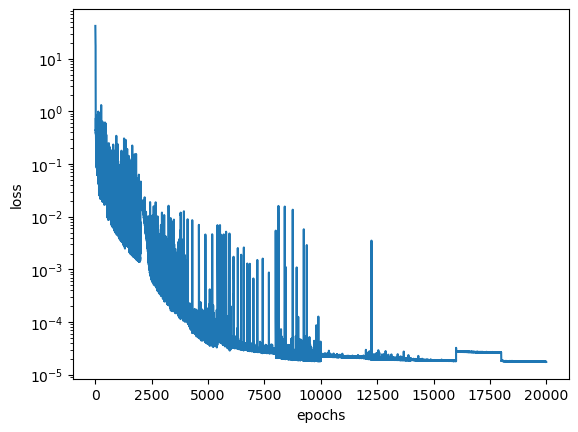

In [15]:
plt.semilogy(history.history['loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.savefig("./figs/loss.pdf", format='pdf', bbox_inches="tight")

In [16]:
for loss in history.history:
        np.savetxt("_{}".format("_".join(loss.split("/"))), 
                    np.array(history.history[loss]).reshape(-1, 1))
    
time_steps = np.linspace(0, elapsed, len(history.history["loss"]))
np.savetxt("_Time", time_steps.reshape(-1,1))

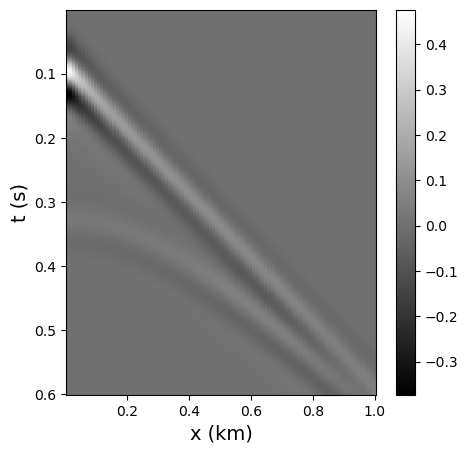

In [17]:
s_selected = 0
p_star = U_star[:,0,s_selected]
s_star = S_star[s_selected]
T = s_star.shape[0]
TT = np.tile(TX_star[:,0:1], (1,T)) # N x T
XX = np.tile(TX_star[:,1:2], (1,T)) # N x T
TT = TT.reshape(600,100)
XX = XX.reshape(600,100)

p_star = p_star.reshape(600,100)

fig, ax = plt.subplots(1, 1, figsize = (5, 5))
#fig.subplots_adjust(right = 1.0)

sc0 = plt.pcolor(XX, TT, (p_star), cmap='gray')
ax.invert_yaxis()
ax.set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax.set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc0)
plt.savefig("./figs/seis0.tiff", format='tif', bbox_inches="tight")

In [18]:
s_selected = 2
p_star = U_star[:,0,s_selected]
u_star = U_star[:,1,s_selected]
v_star = U_star[:,2,s_selected]
s_star = S_star[s_selected]

N = TX_star.shape[0]
T = s_star.shape[0]

    
# Rearrange Data 
TT = np.tile(TX_star[:,0:1], (1,T)) # N x T
XX = np.tile(TX_star[:,1:2], (1,T)) # N x T
SS = np.tile(s_star, (1,N)).T # N x T

T_plot = TT.flatten()
X_plot = XX.flatten()
Y_plot = 0.01*np.ones(N*T)
S_plot = SS.flatten()

print(S_plot.shape,TT.shape)

XX_plot = XY_star[:,0:1]
YY_plot = XY_star[:,1:2]
M = XX_plot.shape
TT_plot = 0.4*np.ones(M)
SS_plot = 0.21*np.ones(M)


p_pred = p.eval(model,[X_plot, Y_plot, T_plot, S_plot])
u_pred = u.eval(model,[X_plot, Y_plot, T_plot, S_plot])
v_pred = v.eval(model,[X_plot, Y_plot, T_plot, S_plot])

c_pred = c.eval(model, [XX_plot, YY_plot, TT_plot, SS_plot])
rho_pred = rho.eval(model, [XX_plot, YY_plot, TT_plot, SS_plot])

print(max(c_pred),min(c_pred))
print(max(rho_pred),min(rho_pred))
print(max(S_plot),min(S_plot))

print(max(p_star),min(p_star))
print(max(u_star),min(u_star))
print(max(v_star),min(v_star))


(60000,) (60000, 1)
[3.0000372] [1.9888322]
[1.999978] [1.4937422]
0.41 0.41
0.47699540707532667 -0.3745046796563537
0.04763301914504554 -0.022334157130697547
0.13156785494858245 -0.13156785494858245


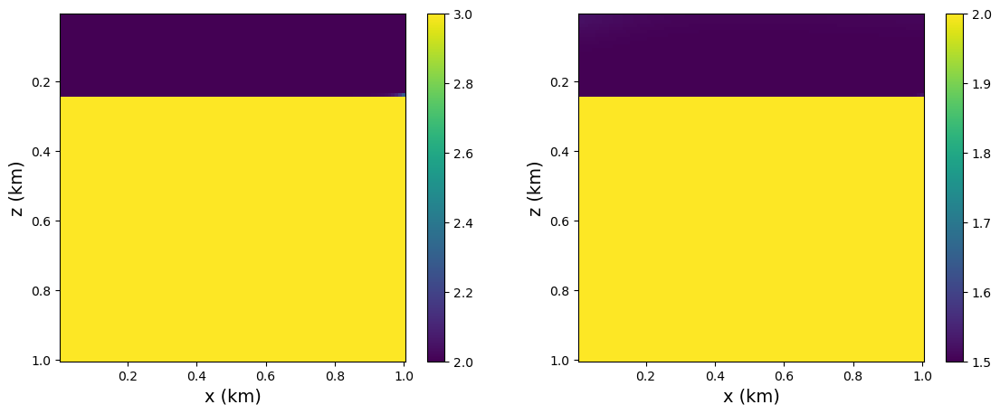

In [19]:
lx = 20
lt = 600#seismogram
llx = 100
llz = 100#model

p_pred = p_pred.reshape(lt,llx)
p_star = p_star.reshape(lt,llx)

u_pred = u_pred.reshape(lt,llx)
u_star = u_star.reshape(lt,llx)

v_pred = v_pred.reshape(lt,llx)
v_star = v_star.reshape(lt,llx)

TT = TT.reshape(lt,llx)
XX = XX.reshape(lt,llx)

XXX = XX_plot.reshape(llx,llz)
YYY = YY_plot.reshape(llx,llz)

import matplotlib.pyplot as plt 

c_pred = c_pred.reshape(llx,llz)
rho_pred = rho_pred.reshape(llx,llz)

import matplotlib as mpl
from matplotlib.cm import cool
from matplotlib.colors import Normalize

from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(1, 2, figsize = (12, 5))
fig.subplots_adjust(right = 1.0)


sc0 = ax[0].pcolor(XXX, YYY, c_pred,  cmap='viridis', vmin=2.0, vmax=3.0)#
ax[0].invert_yaxis()
ax[0].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[0].set_ylabel('z (km)', fontsize=14)
plt.yticks(fontsize=10)
cbar = plt.colorbar(sc0, ax=ax[0])


sc1 = ax[1].pcolor(XXX, YYY, rho_pred,  cmap='viridis', vmin=1.5, vmax=2.0)#
ax[1].invert_yaxis()
plt.xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
plt.ylabel('z (km)', fontsize=14)
plt.yticks(fontsize=10)
cbar = plt.colorbar(sc1, ax=ax[1])
plt.savefig("./figs/pre_model.pdf", format='pdf', bbox_inches="tight")

scipy.io.savemat('c_pred_2layer.mat', {'c_pred':c_pred})
scipy.io.savemat('rho_pred_2layer.mat', {'rho_pred':rho_pred})

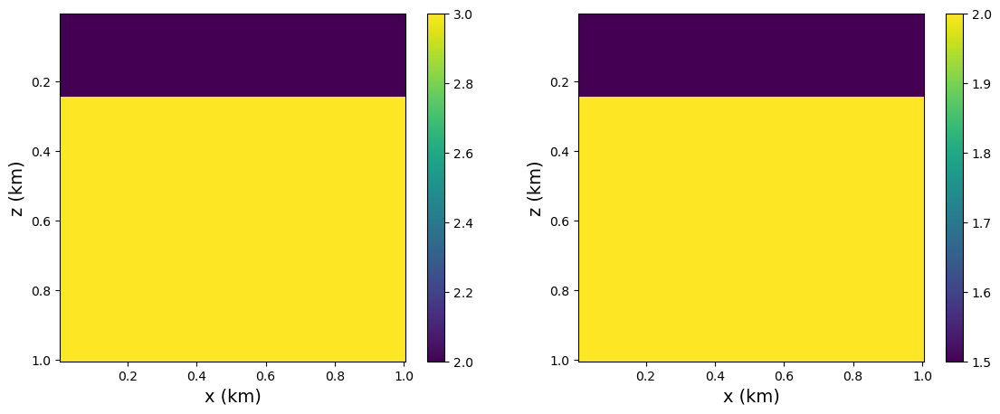

In [20]:
fig, ax = plt.subplots(1, 2, figsize = (12, 5))
fig.subplots_adjust(right = 1.0)

sc0 = ax[0].pcolor(XXX, YYY, (c_star), cmap='viridis')
ax[0].invert_yaxis()
ax[0].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[0].set_ylabel('z (km)', fontsize=14)
plt.yticks(fontsize=10)
cbar = plt.colorbar(sc0, ax=ax[0])

sc1 = ax[1].pcolor(XXX, YYY, (rho_star),  cmap='viridis')
ax[1].invert_yaxis()
plt.xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
plt.ylabel('z (km)', fontsize=14)
plt.yticks(fontsize=10)
cbar = plt.colorbar(sc1, ax=ax[1])

plt.savefig("./figs/true-model.pdf", format='pdf', bbox_inches="tight")

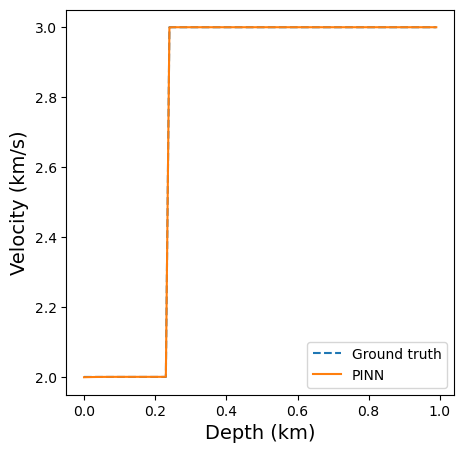

In [21]:
plt.figure(figsize=(5,5))

YY = np.arange(0.00,1.0,0.01)

plt.plot(YY, c_star[50,:], linestyle='--', label='Ground truth')
plt.plot(YY, c_pred[50,:], label='PINN')
plt.legend()

plt.xlabel('Depth (km)', fontsize=14)
plt.ylabel('Velocity (km/s)', fontsize=14)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.savefig("./figs/compare_c50.pdf", format='pdf', bbox_inches="tight")

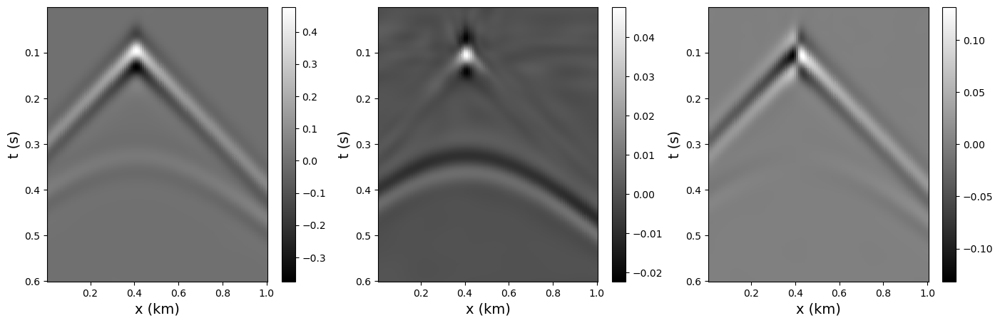

In [22]:
fig, ax = plt.subplots(1, 3, figsize = (15, 5))
fig.subplots_adjust(right = 1.0)

sc0 = ax[0].pcolor(XX, TT, (p_pred),cmap='gray', vmin=-0.3747786159933971, vmax=0.4769654096989754)
ax[0].invert_yaxis()
ax[0].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[0].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc0, ax=ax[0])


sc1 = ax[1].pcolor(XX, TT, (u_pred),cmap='gray', vmin=-0.022324010647494202, vmax=0.0476465927714691)
ax[1].invert_yaxis()
ax[1].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[1].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc1, ax=ax[1])

sc2 = ax[2].pcolor(XX, TT, (v_pred), cmap='gray', vmin=-0.13156035880322453, vmax=0.13161169315446972)
ax[2].invert_yaxis()
ax[2].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[2].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc2, ax=ax[2])

plt.savefig("./figs/pre_seis.pdf", format='pdf', bbox_inches="tight")

scipy.io.savemat('p_pred_2layer.mat', {'p_pred':p_pred})
scipy.io.savemat('u_pred_2layer.mat', {'u_pred':u_pred})
scipy.io.savemat('v_pred_2layer.mat', {'v_pred':v_pred})

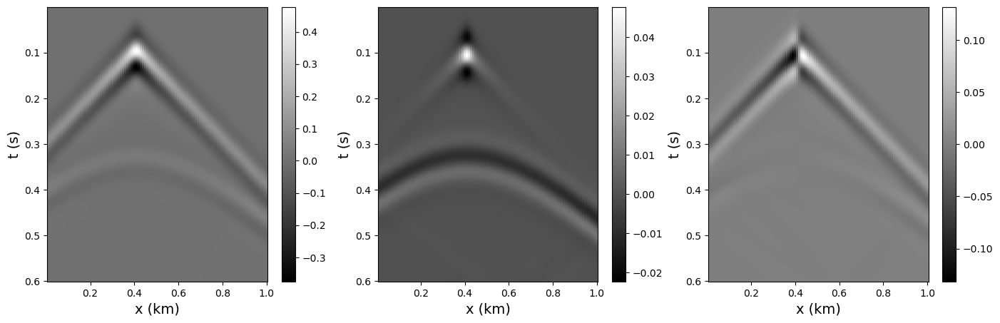

In [23]:
fig, ax = plt.subplots(1, 3, figsize = (15, 5))
fig.subplots_adjust(right = 1.0)


sc0 = ax[0].pcolor(XX, TT, (p_star), cmap='gray', vmin=-0.3747786159933971, vmax=0.4769654096989754)
ax[0].invert_yaxis()
ax[0].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[0].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc0, ax=ax[0])

sc1 = ax[1].pcolor(XX, TT, (u_star), cmap='gray', vmin=-0.022324010647494202, vmax=0.0476465927714691)
ax[1].invert_yaxis()
ax[1].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[1].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc1, ax=ax[1])

sc2 = ax[2].pcolor(XX, TT, (v_star), cmap='gray', vmin=-0.13156035880322453, vmax=0.13161169315446972)
ax[2].invert_yaxis()
ax[2].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[2].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc2, ax=ax[2])

plt.savefig("./figs/true-seis.pdf", format='pdf', bbox_inches="tight")

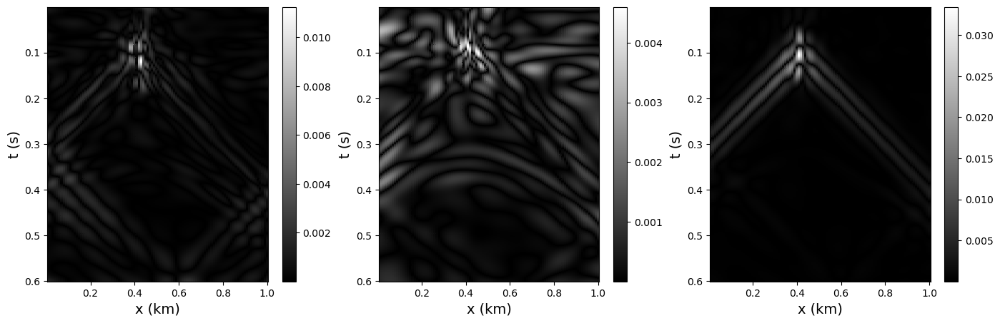

In [24]:
fig, ax = plt.subplots(1, 3, figsize = (15, 5))
fig.subplots_adjust(right = 1.0)


sc0 = ax[0].pcolor(XX, TT, (np.abs(p_pred - p_star)), cmap='gray')
ax[0].invert_yaxis()
ax[0].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[0].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc0, ax=ax[0])

sc1 = ax[1].pcolor(XX, TT, (np.abs(u_pred - u_star)), cmap='gray')
ax[1].invert_yaxis()
ax[1].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[1].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc1, ax=ax[1])

sc2 = ax[2].pcolor(XX, TT, (np.abs(v_pred - v_star)), cmap='gray')
ax[2].invert_yaxis()
ax[2].set_xlabel('x (km)', fontsize=14)
plt.xticks(fontsize=10)
ax[2].set_ylabel('t (s)', fontsize=14)
plt.yticks(fontsize=10)
plt.colorbar(sc2, ax=ax[2])

plt.savefig("./figs/diff-seis.pdf", format='pdf', bbox_inches="tight")

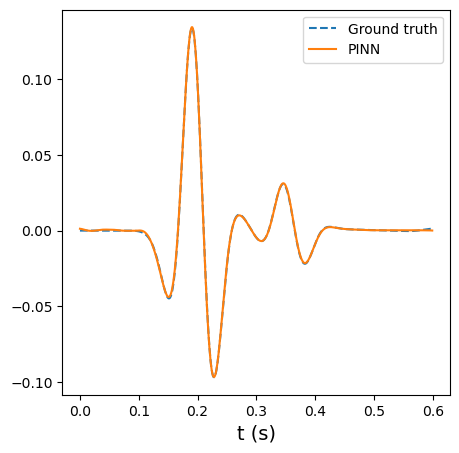

In [25]:
plt.figure(figsize=(5,5))

YY = np.arange(0.00,0.6,0.001)

plt.plot(YY, p_star[:,60], linestyle='--', label='Ground truth')#extent=[xmin,xmax,zmin,zmax], 
plt.plot(YY, p_pred[:,60], label='PINN')
plt.legend()

plt.xlabel('t (s)', fontsize=14)
#plt.ylabel('Velocity (km/s)', fontsize=14)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.savefig("./figs/compare_p60.pdf", format='pdf', bbox_inches="tight")